This notebook addresses the question, "Can we represent a molecule as a graph via a 1D column vector or a 2D matrix of fixed length, with maximum number of atoms n_rows?" Then, can we use this representation to learn neural fingerprints? E.g., can we make an aromatic ring detector? 

Scheme:
feature_matrix = X
for each ligand:
    choose a central atom. this can be the atom (node) that minimizes distance to furthest heavy atom in graph.
    set first row of X to be this central atom
    set next four rows to be the atoms bonded to that centrl atom
        set zeros for rows where row ind > n_bonds of atom
    for each of those atoms:
        repeat. find their neighbors. add to matrix.

algorithm: breadth-first search:
1. create networkx graph based on molecule
2. find "central" atom (different strategies)
3. define atom matrix of size (1+4+4*3^(L-1)) x (n_features_per_atom)
4. start atom queue q
5. central_atom.layer = 0; central_atom.row_idx = 0;
6. q.enqueue(central_atom)
7. define adjacency matrix of size (1+4+4*3^(L-1)) x 4

def get_row_idx(curr_layer, prev_row_idx, curr_neighbor_idx):
    if curr_layer == 0:
        return(0)
    if curr_layer == 1:
        row_idx = 1 + curr_neighbor_idx
    if layer == 2:
        last_max = 5
        row_idx = last_max + (3*(prev_row_idx-last_max)) + curr_neighbor_idx
    if layer > 2:
        last_max = 5 + 4*3^(curr_layer-2) 
        row_idx = last_max + 3*(prev_row_idx-last_max) + curr_neighbor_idx
    return(row_idx)
    

while q.is_not_empty():
    a = q.dequeue()
    a.visited = True
    for n_idx, n in enumerate(a.neighbors()):
        if not n.visited:
            row_idx = c
            n.layer = a.layer + 1
            row_idx = get_row_idx(n.layer, a.row_idx, n_idx)
            n.row_idx = row_idx
            adj_matrix[a.row_idx][n_idx] = n.row_idx
            atom_matrix[row_idx][elem_to_idx[n.elem]] = 1

input_matrix = tf.concat([atom_matrix, atom_matrix[adj_matrix[:,0]], atom_matrix[adj_matrix[:,1]], atom_matrix[adj_matrix[:,2]], atom_matrix[adj_matrix[:,3]]

neural net:
h1 = relu([tf.zeros([n_features_per_atom, 4]) * input_matrix + bias))
h1_conc = tf.concat([h1, h1[adj_matrix[:,0], ..., h1[adj_matrix[:,3])

repeat h1 to get h2


dihedral predictor pseudocode:

get bonds for molecule
create networkx graph out of molecule (use atom indices)

for each edge:
   for neighbor_i in atom_i.neighbors():
       if neighbor_i == atom_j: continue
       for neighbor_j in atom_j.neighbors():
           if neighbor_j == atom_i: continue
           dihedrals.append((neighbor_i, atom_i, neighbor_j, atom_j))
           check to make sure (atom_j, neighbor_j, atom_i, neighbor_i)) not already in list

for dihedral in dihedrals:
    angle =  rdMolTransforms.GetDihedralDeg(c, 0,1,2,3)


In [213]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt

In [214]:
from rdkit import Chem
from rdkit.Chem import AllChem, rdMolTransforms
import os
import fnmatch
import numpy as np
import deepchem as dc
from scipy.sparse import csr_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.mixture import GMM
import random
from tflearn.activations import leaky_relu

In [215]:
def get_torsions_angles(mol, n_bonds=50, n_atoms=50, get_angle=True):
    if get_angle:
        c = mol.GetConformer(0)

    torsions = []
    torsion_tuples = []
    
    torsion_matrix = np.zeros((n_bonds,1))
    torsion_indices = np.zeros((n_bonds,n_atoms,4)).astype(np.uint8)
    
    #bond_adjacency = np.zeros((n_bonds,n_bonds)).astype(np.uint8)
    idx = 0
    bonds = [bond for bond in mol.GetBonds()]
    #if get_angle:
    #    random.shuffle(bonds)
    
    for bond in bonds:
        if bond.IsInRing(): 
            continue

        def calc_torsions(atom_i, atom_j, bond_idx):        
            exist_dihed = False
            for neighbor_j in atom_j.GetNeighbors():
                if neighbor_j.GetIdx() == atom_i.GetIdx():
                    continue

                dihed_idx = 0
                for neighbor_i in atom_i.GetNeighbors():
                    if neighbor_i.GetIdx() == atom_j.GetIdx():
                        continue

                    exist_dihed=True
                    torsion_tuple = (neighbor_i.GetIdx(), atom_i.GetIdx(), atom_j.GetIdx(), neighbor_j.GetIdx())
                    
                    if get_angle:
                        torsion_matrix[bond_idx][dihed_idx] = rdMolTransforms.GetDihedralRad(c, *torsion_tuple)
                    torsion_indices[bond_idx][torsion_tuple[0]][dihed_idx*4] = 1
                    torsion_indices[bond_idx][torsion_tuple[1]][dihed_idx*4+1] = 1
                    torsion_indices[bond_idx][torsion_tuple[2]][dihed_idx*4+2] = 1
                    torsion_indices[bond_idx][torsion_tuple[3]][dihed_idx*4+3] = 1
                    bond_idx += 1
                break
            return(bond_idx)
        
        idx = calc_torsions(bond.GetBeginAtom(), bond.GetEndAtom(), idx)
        #if torsion_matrix[idx-1] != 0.: break
        #idx = calc_torsions(bond.GetEndAtom(), bond.GetBeginAtom(), idx)
        
        """
        atom_i_bonds = bond.GetBeginAtom().GetBonds()
        atom_j_bonds = bond.GetEndAtom().GetBonds()

        for bond_i in atom_i_bonds:
            if bond_i.GetIdx() != bond.GetIdx():
                bond_adjacency[bond.GetIdx()][bond_i.GetIdx()] = 1.
                bond_adjacency[bond_i.GetIdx()][bond.GetIdx()] = 1.
        for bond_j in atom_j_bonds:
            if bond_j.GetIdx() != bond.GetIdx():
                bond_adjacency[bond.GetIdx()][bond_j.GetIdx()] = 1.
                bond_adjacency[bond_j.GetIdx()][bond.GetIdx()] = 1.
        """

    
    
    return((torsion_indices, torsion_matrix))#, csr_matrix(bond_adjacency)))
                

In [302]:
def featurize_mols(mol_files):
    featurizer = AdjacencyFingerprint(max_n_atoms=50)
    features = []
    for idx, mol_file in enumerate(mol_files):
        if idx % 100 == 0:
            print(idx)
        try:
        #     #if 1==1:
            mol = Chem.MolFromMol2File(mol_file)
            if mol is None:
                features.append(None)
                continue
            #inds = range(mol.GetNumAtoms())
            #random.shuffle(inds)
            #Chem.RenumberAtoms(mol,inds)
            torsions = get_torsions_angles(mol)
            graph_feat = featurizer.featurize([mol])[0]
            features.append((mol_file, torsions, graph_feat))
        #else:
        except:
            try:
                mol = Chem.MolFromSmiles(mol_file)
                if mol is None:
                    features.append(None)
                    continue
                #inds = range(mol.GetNumAtoms())
                #random.shuffle(inds)
                #Chem.RenumberAtoms(mol,inds)
                torsions = get_torsions_angles(mol, get_angle=False)
                graph_feat = featurizer.featurize([mol])[0]
                features.append((mol_file, torsions, graph_feat))
            except:
                features.append(None)
    return(features)

In [303]:
from deepchem.feat.graph_features import ConvMolFeaturizer
from deepchem.feat.adjacency_fingerprints import AdjacencyFingerprint

In [304]:
import pickle
feature_file = "./dihedral_features_pdbbind.pkl"
#if not os.path.exists(feature_file):
if 1== 1:
    pdbbind_dir = "/home/evan/Documents/deep_docking/datasets/v2015/"
    def find_files(directory, pattern):
        for root, dirs, files in os.walk(directory):
            for basename in files:
                if fnmatch.fnmatch(basename, pattern):
                    filename = os.path.join(root, basename)
                    yield filename
    ligand_files = []
    for f in find_files(pdbbind_dir, "*ligand.mol2"):
        ligand_files += [f]*4
    ligand_files = ligand_files[:512] + ["CCCC"]*32
    features = featurize_mols(ligand_files)
    with open(feature_file, "wb") as f:
        pickle.dump(features, f, protocol=2)
else:
    with open(feature_file, "rb") as f:
        features = pickle.load(f)

0
100
200
300
400
500


In [305]:
features = [f for f in features if f is not None]

In [306]:
features[-1]

('CCCC', (array([[[1, 0, 0, 0],
          [0, 1, 0, 0],
          [0, 0, 1, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         ..., 
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0

In [307]:
len(features)

428

In [308]:
import tensorflow as tf
n_layers = 1

S = 32

B = 50
p = 75

z_dim = 0

L_list = [p+z_dim, 50, 50, 50, 50]

n_bonds = 50
dihed_per_bond = 1
valence = 4



In [309]:
"""
#FEED_DICT
#16 sec / epoch for S = 128 (0.125 sec / data point)
#1.7 sec / epoch for S = 32 (0.05 sec / data point)
#0.33 sec / epoch for S = 8 (0.04 sec / data point)

#NO FEED DICT
#
#
#0.04 sec / epoch for S = 8 

S=32
X = features
inds = range(0,S)
atom_adj_batch = np.array([X[idx][2][0].astype(np.float32) for idx in inds])
A_batch = np.array([X[idx][2][1] for idx in inds])
D_batch = np.array([X[idx][1][0] for idx in inds])
y_batch = [X[idx][1][1] for idx in inds]
#bond_adj_batch = np.array([X[idx][1][2].toarray() for idx in inds])

y_batch = np.concatenate(y_batch, axis=0)
n_non_zeros = len(np.where(y_batch[:,0] != 0.)[0])
print(n_non_zeros)
non_zero_batch = np.where(y_batch[:,0] != 0.)[0]
y_batch = y_batch[non_zero_batch]

onehotter = OneHotEncoder(n_values = S*X[0][1][1].shape[0])
non_zero_onehot = onehotter.fit_transform(non_zero_batch).toarray().reshape((n_non_zeros,S*X[0][1][1].shape[0]))


with tf.device('/gpu:0'):
    
    x = tf.cast(tf.constant(A_batch), tf.float32)
    #x = tf.placeholder(tf.float32, shape=[S, B, p])
    
    non_zero_inds = tf.cast(tf.constant(non_zero_onehot), tf.float32)
    #non_zero_inds = tf.placeholder(tf.int32, shape=[None, S*n_bonds])

    adj_matrix = tf.cast(tf.constant(atom_adj_batch), tf.float32)
    #adj_matrix = tf.placeholder(tf.float32, shape=[S, B, B])
    
    dihed_indices = tf.cast(tf.constant(D_batch), tf.float32)
    #dihed_indices = tf.placeholder(tf.float32, shape=[S, n_bonds, B, dihed_per_bond*valence])
    
    label_placeholder = tf.cast(tf.constant(y_batch), tf.float32) + tf.random_normal([n_non_zeros,dihed_per_bond], mean=0, stddev=0.03)
    #label_placeholder = tf.placeholder(
    #    dtype='float32', shape=[None,dihed_per_bond], name="label_placeholder")

    #phase = tf.placeholder(dtype='bool', name='phase')

    z = tf.random_uniform([n_non_zeros, L_list[n_layers]*valence*dihed_per_bond], -0.0001, 0.001)
    #z = tf.placeholder(tf.float32,
    #                          [None, L_list[n_layers]*valence*dihed_per_bond], name='z')
"""

'\n#FEED_DICT\n#16 sec / epoch for S = 128 (0.125 sec / data point)\n#1.7 sec / epoch for S = 32 (0.05 sec / data point)\n#0.33 sec / epoch for S = 8 (0.04 sec / data point)\n\n#NO FEED DICT\n#\n#\n#0.04 sec / epoch for S = 8 \n\nS=32\nX = features\ninds = range(0,S)\natom_adj_batch = np.array([X[idx][2][0].astype(np.float32) for idx in inds])\nA_batch = np.array([X[idx][2][1] for idx in inds])\nD_batch = np.array([X[idx][1][0] for idx in inds])\ny_batch = [X[idx][1][1] for idx in inds]\n#bond_adj_batch = np.array([X[idx][1][2].toarray() for idx in inds])\n\ny_batch = np.concatenate(y_batch, axis=0)\nn_non_zeros = len(np.where(y_batch[:,0] != 0.)[0])\nprint(n_non_zeros)\nnon_zero_batch = np.where(y_batch[:,0] != 0.)[0]\ny_batch = y_batch[non_zero_batch]\n\nonehotter = OneHotEncoder(n_values = S*X[0][1][1].shape[0])\nnon_zero_onehot = onehotter.fit_transform(non_zero_batch).toarray().reshape((n_non_zeros,S*X[0][1][1].shape[0]))\n\n\nwith tf.device(\'/gpu:0\'):\n    \n    x = tf.cast(tf.

In [310]:
with tf.device('/gpu:0'):
    

    #x = tf.cast(tf.constant(A_batch), tf.float32)
    #x = tf.Variable(tf.zeros([S, B, L_list[0]]), name="atom_features")
    x = tf.placeholder(tf.float32, [S, B, L_list[0]], name="atom_features")
    keep_prob = tf.constant(1.)
    #keep_prob = 0.5 * tf.ones([None, B, L_list[0]], name="keep_prob")

    
    #non_zero_inds = tf.cast(tf.constant(non_zero_onehot), tf.float32)
    non_zero_inds = tf.placeholder(tf.float32, [None, S*n_bonds], name="non_zero_inds")

    #adj_matrix = tf.cast(tf.constant(atom_adj_batch), tf.float32)
    adj_matrix = tf.placeholder(tf.float32, shape=[S, B, B], name="adj_matrix")
    #adj_matrix = tf.Variable(tf.zeros([S, B, B]), name="adj_matrix")


    #dihed_indices = tf.cast(tf.constant(D_batch), tf.float32)
    dihed_indices = tf.placeholder(tf.float32, shape=[S, n_bonds, B, dihed_per_bond*valence], name="dihed_indices")
    #dihed_indices_var = tf.Variable(tf.zeros([S, n_bonds, B, dihed_per_bond*valence]), name="dihed_indices")
    #init = tf.constant(n
    #tf.get_variable('var_name', initializer=init)

    #dihed_indices = dihed_indices_var[:tf.cast(n_diheds,tf.int32),:]

    #label_placeholder = tf.cast(tf.constant(y_batch), tf.float32) + tf.random_normal([n_non_zeros,dihed_per_bond], mean=0, stddev=0.03)
    label_placeholder = tf.placeholder(
        dtype='float32', shape=[None,dihed_per_bond], name="label_placeholder")
    #dihedrals_var = tf.Variable(tf.zeros([S*n_bonds,dihed_per_bond]), name="label_placeholder")


    phase = tf.placeholder(dtype='bool', name='phase')

    #z = tf.random_uniform([S*n_bonds, L_list[n_layers]*valence*dihed_per_bond], -0.1, 0.1)
    #y_perturb = tf.random_normal([S*n_bonds, dihed_per_bond], 0., 0.03)

    #label_placeholder = dihedrals_var + y_perturb

    #label_placeholder = tf.matmul(non_zero_inds, label_placeholder)

    #z = tf.placeholder(tf.float32,
    #                          [None, L_list[0]*valence*dihed_per_bond], name='z')
    
    z = tf.placeholder(tf.float32,
                              [None, B, L_list[0]])


In [311]:
#t = sess.run(tf.matmul(dihed_indices[:,:,:,0], x))
#t = np.reshape(t, [t.shape[0]*t.shape[1],t.shape[2]])

In [312]:
DAW_list = [None for i in range(n_layers)]
DAb_list = [None for i in range(n_layers)]
Dh_list = [None for i in range(n_layers+1)]

GAW_list = [None for i in range(n_layers)]
GAb_list = [None for i in range(n_layers)]
Gh_list = [None for i in range(n_layers+1)]

for layer_idx in range(n_layers):
    L_in = L_list[layer_idx]
    L_out = L_list[layer_idx+1]

    DAW_list[layer_idx] = tf.Variable(tf.truncated_normal([L_in, L_out], seed=2017), name="DA_W_list%d" %layer_idx)
    DAb_list[layer_idx] = tf.Variable(tf.zeros([1, L_out]))

    GAW_list[layer_idx] = tf.Variable(tf.truncated_normal([L_in, L_out], seed=2017), name="GA_W_list%d" %layer_idx)
    GAb_list[layer_idx] = tf.Variable(tf.zeros([1, L_out]))

    
D_W0 = tf.Variable(tf.truncated_normal([L_list[n_layers]*(dihed_per_bond*valence)+dihed_per_bond, 32]))
D_b0 = tf.Variable(tf.zeros([1, 32]))

D_W1 = tf.Variable(tf.truncated_normal([32, 64]))
D_b1 = tf.Variable(tf.zeros([1, 64]))

D_W2 = tf.Variable(tf.truncated_normal([64, 1]))
D_b2 = tf.Variable(tf.zeros([1, 1]))


G_W0 = tf.Variable(tf.truncated_normal([L_list[n_layers]*dihed_per_bond*valence, 32]))
G_b0 = tf.Variable(tf.zeros([1, 32]))

G_W1 = tf.Variable(tf.truncated_normal([32, 64]))
G_b1 = tf.Variable(tf.zeros([1, 64]))

G_W2 = tf.Variable(tf.truncated_normal([64, dihed_per_bond]))
G_b2 = tf.Variable(tf.zeros([1, dihed_per_bond]))


def adjacency_conv_layer(atom_matrix, W, b, L_in, L_out, layer_idx):
    with tf.device('/gpu:0'):
    #if 1== 1:
        print("layer_idx: %d" %(layer_idx))
        h = tf.matmul(adj_matrix, atom_matrix, name="adjconv1")
        h = tf.reshape(h, shape=(S*B, L_in), name="adjconv2")

        h = tf.matmul(h, W, name="adjconv2_1") + b
    
        h = leaky_relu(h)
        #h = tf.maximum(alpha*h, h, name="adjconv3")
        h = tf.reshape(h, (S, B, L_out), name="adjconv4")
        #h = tf.contrib.layers.batch_norm(h, decay=0.9,
        #                                    center=True, scale=True,
        #                                     is_training=phase)
        #h = tf.nn.tanh(h)



    return(h)

def get_atom_types(W_list, b_list, h_list):
    h_list[0] = x + z
    for layer_idx in range(n_layers):
        L_in = L_list[layer_idx]
        L_out = L_list[layer_idx+1]
        
        atom_matrix = h_list[layer_idx]
        
        h_list[layer_idx+1] = adjacency_conv_layer(atom_matrix, W_list[layer_idx],
                                                     b_list[layer_idx], L_in, L_out,
                                                     layer_idx)
    L_final = L_list[n_layers]
    
    with tf.device('/gpu:0'):
         #if 1==1: 
        h_final = tf.reshape(h_list[n_layers], (S, B, L_final), name="at1")
        
        d0 = []
        for l in range(0, valence*dihed_per_bond):
            d0.append(tf.matmul(dihed_indices[:,:,:,l], h_final, name="dihed_mult"))
        d0 = tf.concat(d0, axis=2)
        d0 = tf.reshape(d0, (S*n_bonds, L_final*dihed_per_bond*valence))

        #def mult(idx):
        #    return(tf.matmul(dihed_indices[:,:,:,tf.cast(idx, tf.int32)], h_final))

        #elems = np.arange(dihed_per_bond*valence).astype(np.float32)
        #d0 = tf.concat(tf.map_fn(mult, elems, name="map_fn"), axis=2, name="at2")
        #d0 = tf.reshape(d0, (S*n_bonds, L_final*dihed_per_bond*valence), name="at3")
        print("d0")
        print(d0)
        print("non_zero_inds")
        print(non_zero_inds)
        output = d0
        #output = tf.matmul(non_zero_inds, d0, name="at2")
    print("atom_types")
    print(output)
    return(output, d0, h_final)



In [313]:
def discriminator(W_list, b_list, h_list, angles):
    with tf.device('/gpu:0'):
         #if 1==1:
        d0 = get_atom_types(W_list, b_list, h_list)[0]
        d0 = tf.concat([d0, angles], axis=1, name="disc0")


        d1 = tf.matmul(d0, D_W0, name="disc2") + D_b0
        #d1 = tf.contrib.layers.batch_norm(d1, decay=0.9,
        #                                    center=True, scale=True, 
        #                                    is_training=phase)
        d1 = leaky_relu(d1)
        #d1 = tf.maximum(d1, alpha*d1)



        d2 = tf.matmul(d1, D_W1, name="disc3") + D_b1
        d2 = leaky_relu(d2)
        #d2 = tf.maximum(d2, alpha*d2)

        #d3 = tf.nn.tanh(d3)

        #d2 = tf.contrib.layers.batch_norm(d2, 
        #                                    center=True, scale=False, 
        #                                    is_training=is_training)


        d3 = tf.matmul(d2, D_W2, name="disc3") + D_b2

        #
        #output = tf.matmul(d4, D_W5, name="disc4") + D_b5

        #D_prob = tf.nn.sigmoid(D_logit)
        output = d3
    
    return(output, d0)

In [314]:
def atan2(y, x, epsilon=1.0e-12):
  # Add a small number to all zeros, to avoid division by zero:
  x = tf.where(tf.equal(x, 0.0), x+epsilon, x)
  y = tf.where(tf.equal(y, 0.0), y+epsilon, y)

  angle = tf.where(tf.greater(x,0.0), tf.atan(y/x), tf.zeros_like(x))
  angle = tf.where(tf.logical_and(tf.less(x,0.0),  tf.greater_equal(y,0.0)), tf.atan(y/x) + np.pi, angle)
  angle = tf.where(tf.logical_and(tf.less(x,0.0),  tf.less(y,0.0)), tf.atan(y/x) - np.pi, angle)
  angle = tf.where(tf.logical_and(tf.equal(x,0.0), tf.greater(y,0.0)), 0.5*np.pi * tf.ones_like(x), angle)
  angle = tf.where(tf.logical_and(tf.equal(x,0.0), tf.less(y,0.0)), -0.5*np.pi * tf.ones_like(x), angle)
  angle = tf.where(tf.logical_and(tf.equal(x,0.0), tf.equal(y,0.0)), tf.zeros_like(x), angle)
  return angle


def generator(W_list, b_list, h_list, z):
         #if 1==1:
    with tf.device('/gpu:0'):


        g_d0 = get_atom_types(W_list, b_list, h_list)[0]

        g_d1 = tf.matmul(g_d0, G_W0, name='gen1') + G_b0
        #g_d1 = tf.contrib.layers.batch_norm(g_d1, decay=0.9,
        #                                    center=True, scale=True, 
        #                                    is_training=phase)
        #g_d1 = tf.tanh(g_d1)
        #g_d1 = tf.nn.dropout(g_d1, keep_prob)
        #g_d1 = tf.maximum(alpha*g_d1, g_d1)
        g_d1 = leaky_relu(g_d1)



        g_d2 = tf.matmul(g_d1, G_W1) + G_b1
        g_d2 = tf.nn.tanh(g_d2)
        #g_d2 = tf.nn.dropout(g_d2, keep_prob)

        #g_d3 = tf.contrib.layers.batch_norm(g_d3, 
        #                                    center=True, scale=False, 
        #                                    is_training=is_training)

        g_d3 = tf.matmul(g_d2, G_W2) + G_b2

        #d3_cos = tf.cos(g_d3)
        #d3_sin = tf.sin(g_d3)
        #output = atan2(d3_sin, d3_cos)

        #output = tf.concat([output,
        #                    tf.reshape(3.14159 - tf.abs(tf.abs(output[:,2]-output[:,1])-3.14159), (-1,1)),
        #                    tf.reshape(3.14159 - tf.abs(tf.abs(output[:,2]-output[:,0])-3.14159), (-1,1)),
        #                    tf.reshape(3.14159 - tf.abs(tf.abs(output[:,1]-output[:,0])-3.14159), (-1,1))],
        #                   axis=1)

    
        output = g_d3
        #output = tf.cos(g_d3, name="cos")

    return(output)



In [315]:
theta_D = DAW_list[:n_layers] + DAb_list[:n_layers] + [D_W0, D_b0, D_W1, D_b1, D_W2, D_b2]
#theta_D = [D_W_list[0], D_W2, D_W3, D_W4, D_W5, D_b_list[0], D_b2, D_b3, D_b4, D_b5]

theta_G =  GAW_list[:n_layers] + GAb_list[:n_layers] + [G_W0, G_b0, G_W1, G_b1, G_W2, G_b2]

In [316]:
from sklearn.mixture import GMM

#gmm = GMM(3, n_iter=1., covariance_type="spherical")

#gmm.means_ = np.array([[-0.1], [0], [0.1]])
#gmm.covars_ = np.array([[0.01], [0.01], [0.01]])
#gmm.weights_ = np.array([0.3, 0.5, 0.2])

def construct_feed_dict(X, start=None,
                      stop=None, y=None,
                      keep_prob=1.0, train=True,
                       shuffle_inds=True):
    a = time.time()
    if start is None:
      start = 0
      stop = len(X)
    
    inds = range(start, stop)
    if shuffle_inds:
        random.shuffle(inds)

    atom_adj_batch = [X[idx][2][0] for idx in inds]
    A_batch = np.array([X[idx][2][1] for idx in inds])
    D_batch = [X[idx][1][0] for idx in inds]
    y_batch = [X[idx][1][1] for idx in inds]
    #bond_adj_batch = [X[idx][1][2] for idx in inds]

    
    y_batch = np.concatenate(y_batch, axis=0)
    n_non_zeros = len(np.where(y_batch[:,0] != 0.)[0])
    non_zero_batch = np.where(y_batch[:,0] != 0.)[0]
    #y_batch = y_batch[non_zero_batch]
    
    #reverse = range(0, n_non_zeros)
    #random.shuffle(reverse)
    #reverse = reverse[:n_non_zeros/2]
    #y_batch[reverse] = y_batch[reverse] * -1.0

    y_batch = y_batch + np.random.normal(0, 0.1, size=y_batch.shape)

    #onehotter = OneHotEncoder(n_values = S*X[0][1][1].shape[0])
    #non_zero_onehot = onehotter.fit_transform(non_zero_batch).toarray().reshape((len(non_zero_batch),S*X[0][1][1].shape[0])).astype(np.float32)
    
    #z_batch = np.random.normal(loc=0, scale=1., size=(S, B, L_list[0]))
    z_batch = np.random.uniform(-0.05, 0.05, size=(S, B, L_list[0]))
    #z_batch = np.random.uniform(-0.1, 0.1, size=(S, B, z_dim))
    #A_batch = np.concatenate([A_batch, z_batch], axis=2)
    #z_batch = np.random.uniform(-0.05, 0.05, size=(n_non_zeros, L_list[0]*dihed_per_bond*valence))
    #z_batch = np.reshape(gmm.sample(n_non_zeros*L_list[n_layers]*dihed_per_bond*valence), (n_non_zeros, L_list[n_layers]*dihed_per_bond*valence))
    #z_batch = np.random.normal(size=(n_non_zeros, L_list[n_layers]*dihed_per_bond*valence), loc=0, scale=0.03)
    
    feed_dict = {x: A_batch,
                 adj_matrix: atom_adj_batch,
                 label_placeholder: y_batch,
                 #non_zero_inds: non_zero_onehot,
                 dihed_indices: D_batch,
                 phase:train, z: z_batch
                }
    t = time.time()-a
    #print("Construct feed dict: %f" %(t))
    return(feed_dict)



In [317]:
def assign_vars(X, start=None,
                      stop=None, y=None,
                      keep_prob=1.0, train=False,
                       shuffle_inds=False):
    a = time.time()
    if start is None:
      start = 0
      stop = len(X)
    
    inds = range(start, stop)
    if shuffle_inds:
        random.shuffle(inds)

    atom_adj_batch = np.array([X[idx][2][0] for idx in inds]).astype(np.float32)
    A_batch = np.array([X[idx][2][1] for idx in inds]).astype(np.float32)
    D_batch = np.array([X[idx][1][0] for idx in inds]).astype(np.float32)
    y_batch = [X[idx][1][1] for idx in inds]
    
    y_batch = np.concatenate(y_batch, axis=0).astype(np.float32)
        
    n_non_zeros = len(np.where(y_batch[:,0] != 0.)[0])
    non_zero_batch = np.where(y_batch[:,0] != 0.)[0]

    onehotter = OneHotEncoder(n_values = S*X[0][1][1].shape[0])
    non_zero_onehot = onehotter.fit_transform(non_zero_batch).toarray().reshape((len(non_zero_batch),S*X[0][1][1].shape[0])).astype(np.float32)
    pads = np.zeros((S*n_bonds-n_non_zeros, S*n_bonds))
    non_zero_onehot = np.concatenate([non_zero_onehot, pads], axis=0)
    
    tf.assign(x, A_batch)
    tf.assign(adj_matrix, atom_adj_batch)
    tf.assign(dihedrals_var, y_batch)
    tf.assign(dihed_indices, D_batch)
    
    return({non_zero_inds:non_zero_onehot})
    


In [318]:
import time 


with tf.device('/gpu:0'):
     #if 1== 1:
    
    #output, a0, h_final = get_atom_types(True)

    G_pred = generator(GAW_list, GAb_list, Gh_list, z)
    G_sample = generator(GAW_list, GAb_list, Gh_list, z)

    D_real, d0 = discriminator(DAW_list, DAb_list, Dh_list, label_placeholder)
    D_fake, _ = discriminator(DAW_list, DAb_list, Dh_list, G_sample)

    #G_pred = generator(z, is_training=False)
    #G_sample = generator(z, is_training=True)

    #D_real, d0 = discriminator(label_placeholder)
    #D_fake, _ = discriminator(G_sample)

    # D_loss = -tf.reduce_mean(tf.log(D_real) + tf.log(1. - D_fake))
    # G_loss = -tf.reduce_mean(tf.log(D_fake))

    # Alternative losses:
    # -------------------

    #D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_real, labels=ones_like))
    #D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=zeros_like))
    #D_loss = D_loss_real + D_loss_fake
    #G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=ones_like))

    #D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_real, labels=tf.ones_like(D_logit_real)))
    #D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.zeros_like(D_logit_fake)))
    #D_loss = D_loss_real + D_loss_fake
    #G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.ones_like(D_logit_fake)))

    #WGAN:
    D_loss = tf.reduce_mean(D_real) - tf.reduce_mean(D_fake)
    G_loss = -tf.reduce_mean(D_fake)
    clip_D = [p.assign(tf.clip_by_value(p, -0.01, 0.01)) for p in theta_D]

    #D_solver = tf.train.AdamOptimizer(learning_rate=1e-4).minimize(D_loss, var_list=theta_D)
    #G_solver = tf.train.AdamOptimizer(learning_rate=1e-4).minimize(G_loss, var_list=theta_G)

    D_solver = (tf.train.RMSPropOptimizer(learning_rate=5e-4)
                .minimize(-D_loss, var_list=theta_D))
    G_solver = (tf.train.RMSPropOptimizer(learning_rate=5e-4)
                .minimize(G_loss, var_list=theta_G))

mb_size = S

sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
sess.run(tf.global_variables_initializer())

#train_dataset = []
train_dataset = features[:(len(features)-32)]
#train_dataset = features
#for f in features:
#    train_dataset.append(f)
#    train_dataset.append(f)
#    train_dataset.append(f)
#    train_dataset.append(f)
#train_dataset = [features[0] for i in range(0,S)]
#train_dataset = []
#for i in range(0,16):
#    train_dataset += features[:2]
n_train = len(train_dataset)
preds = []

d_losses = []
g_losses = []
#print(sess.run(label_placeholder))


    

layer_idx: 0
d0
Tensor("Reshape:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
non_zero_inds
Tensor("non_zero_inds:0", shape=(?, 1600), dtype=float32, device=/device:GPU:0)
atom_types
Tensor("Reshape:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
layer_idx: 0
d0
Tensor("Reshape_1:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
non_zero_inds
Tensor("non_zero_inds:0", shape=(?, 1600), dtype=float32, device=/device:GPU:0)
atom_types
Tensor("Reshape_1:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
layer_idx: 0
d0
Tensor("Reshape_2:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
non_zero_inds
Tensor("non_zero_inds:0", shape=(?, 1600), dtype=float32, device=/device:GPU:0)
atom_types
Tensor("Reshape_2:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
layer_idx: 0
d0
Tensor("Reshape_3:0", shape=(1600, 200), dtype=float32, device=/device:GPU:0)
non_zero_inds
Tensor("non_zero_inds:0", shape=(?, 1600), dtype=float32, device=

In [319]:
    random.shuffle(train_dataset)


In [320]:
features[0][1][1]

array([[-0.91292151],
       [ 3.09695411],
       [ 1.06725919],
       [ 2.9399692 ],
       [-1.09178652],
       [ 0.94080315],
       [ 1.56154529],
       [-0.95119245],
       [ 2.18664426],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0

0.652153968811
Training epoch 0
Iter: 0
D loss: 3.027e-05
G_loss: -0.01142
()


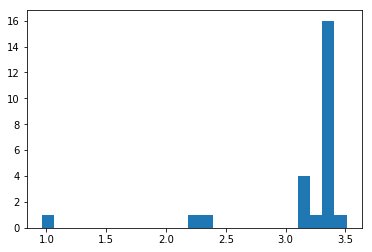

[ 3.15060666]
0.515038967133
Training epoch 100
Iter: 100
D loss: 3.38e-05
G_loss: -0.01195
()


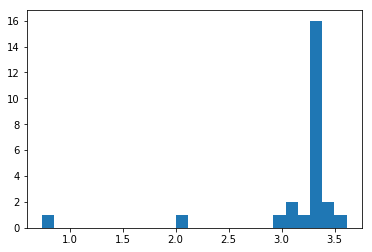

[ 3.1924102]
0.51034116745
Training epoch 200
Iter: 200
D loss: 3.747e-05
G_loss: -0.01071
()


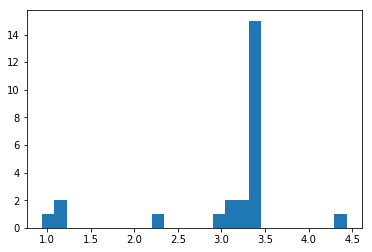

[ 3.05064802]
0.511365175247
Training epoch 300
Iter: 300
D loss: 2.745e-05
G_loss: -0.01217
()


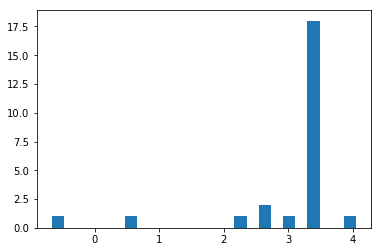

[ 3.01506968]
0.511149168015
Training epoch 400
Iter: 400
D loss: 2.508e-05
G_loss: -0.01184
()


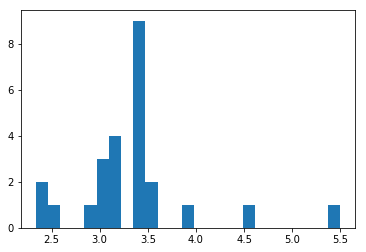

[ 3.34614549]
0.511065006256
Training epoch 500
Iter: 500
D loss: 2.803e-05
G_loss: -0.01193
()


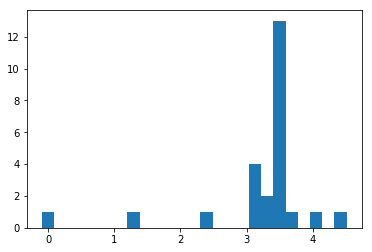

[ 3.20235507]
0.52086186409
Training epoch 600
Iter: 600
D loss: 3.527e-05
G_loss: -0.0121
()


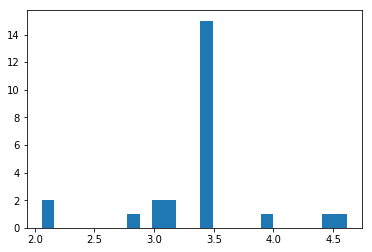

[ 3.35877487]
0.511600971222
Training epoch 700
Iter: 700
D loss: 4.062e-05
G_loss: -0.01016
()


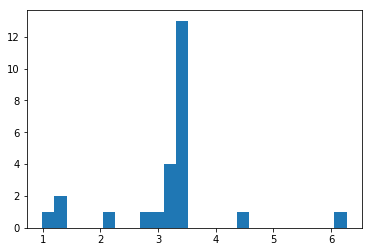

[ 3.19382553]
0.513361930847
Training epoch 800
Iter: 800
D loss: 3.371e-05
G_loss: -0.01198
()


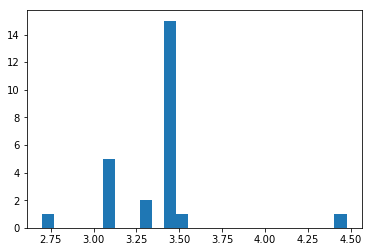

[ 3.39162439]
0.513500928879
Training epoch 900
Iter: 900
D loss: 3.634e-05
G_loss: -0.01046
()


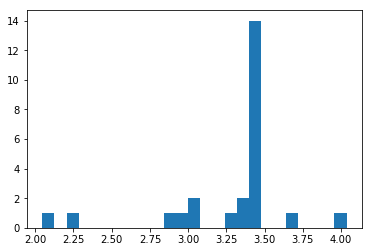

[ 3.26813452]
0.511487007141
Training epoch 1000
Iter: 1000
D loss: 3.354e-05
G_loss: -0.01109
()


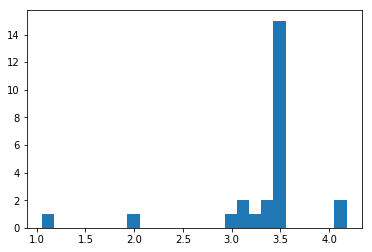

[ 3.31574027]
0.513118982315
Training epoch 1100
Iter: 1100
D loss: 2.816e-05
G_loss: -0.01198
()


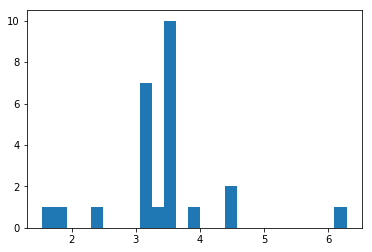

[ 3.38559766]
0.510038137436
Training epoch 1200
Iter: 1200
D loss: 3.098e-05
G_loss: -0.01225
()


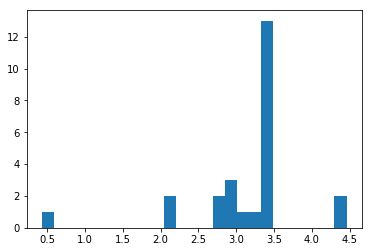

[ 3.13341185]
0.512520074844
Training epoch 1300
Iter: 1300
D loss: 2.382e-05
G_loss: -0.01225
()


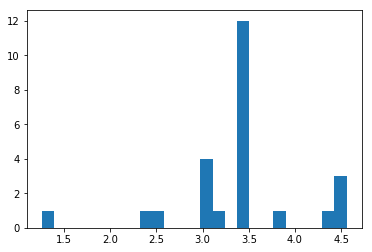

[ 3.39705149]
0.511784791946
Training epoch 1400
Iter: 1400
D loss: 2.915e-05
G_loss: -0.012
()


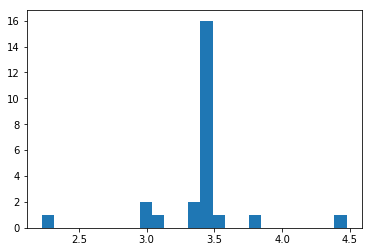

[ 3.37335591]
0.512428045273
Training epoch 1500
Iter: 1500
D loss: 3.221e-05
G_loss: -0.01117
()


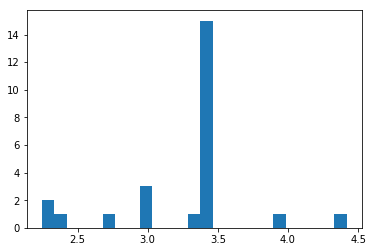

[ 3.26174197]
0.518375873566
Training epoch 1600
Iter: 1600
D loss: 3.537e-05
G_loss: -0.01269
()


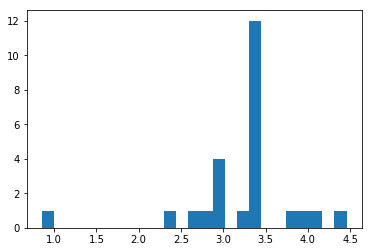

[ 3.23259652]
0.515914916992
Training epoch 1700
Iter: 1700
D loss: 2.496e-05
G_loss: -0.01209
()


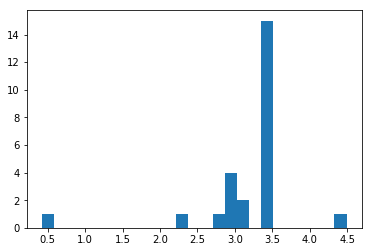

[ 3.1518616]
0.516382932663
Training epoch 1800
Iter: 1800
D loss: 2.292e-05
G_loss: -0.01207
()


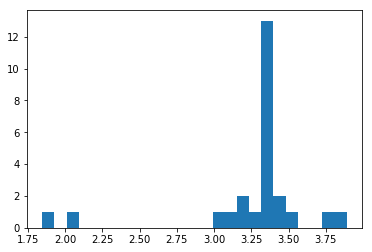

[ 3.26699529]
0.52610707283
Training epoch 1900
Iter: 1900
D loss: 2.592e-05
G_loss: -0.01222
()


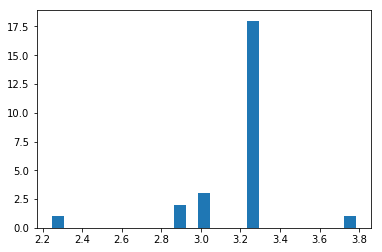

[ 3.19784021]
0.710278987885
Training epoch 2000
Iter: 2000
D loss: 3.16e-05
G_loss: -0.01024
()


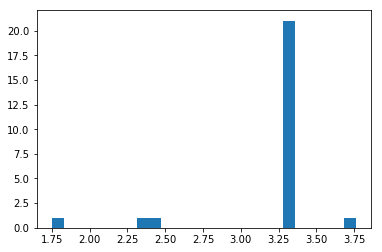

[ 3.19881288]
0.512227058411
Training epoch 2100
Iter: 2100
D loss: 2.385e-05
G_loss: -0.01221
()


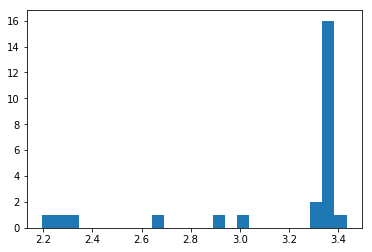

[ 3.16978128]
0.608122110367
Training epoch 2200
Iter: 2200
D loss: 4.287e-05
G_loss: -0.009248
()


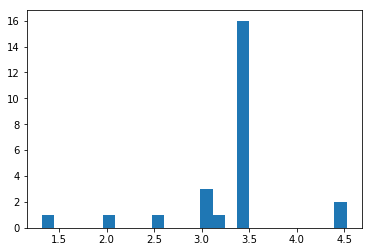

[ 3.25407906]
1.00014090538
Training epoch 2300
Iter: 2300
D loss: 3.988e-05
G_loss: -0.008564
()


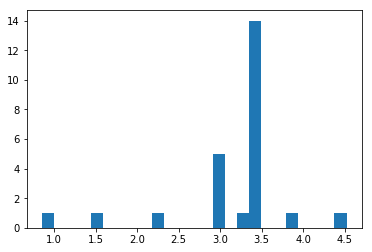

[ 3.14576726]
0.530006885529
Training epoch 2400
Iter: 2400
D loss: 3.731e-05
G_loss: -0.01022
()


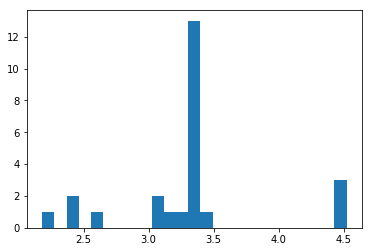

[ 3.31705048]
0.535130023956
Training epoch 2500
Iter: 2500
D loss: 3.028e-05
G_loss: -0.01229
()


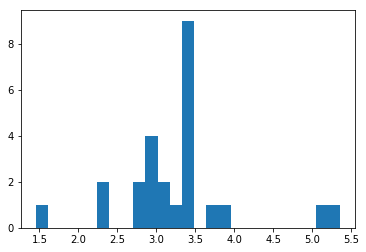

[ 3.25505492]
0.513054132462
Training epoch 2600
Iter: 2600
D loss: 2.843e-05
G_loss: -0.01059
()


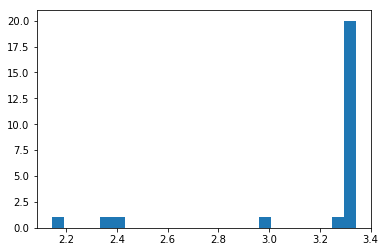

[ 3.19752302]
0.560630083084
Training epoch 2700
Iter: 2700
D loss: 3.436e-05
G_loss: -0.01209
()


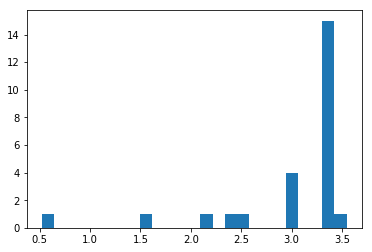

[ 3.01977224]
0.516722917557
Training epoch 2800
Iter: 2800
D loss: 2.922e-05
G_loss: -0.01163
()


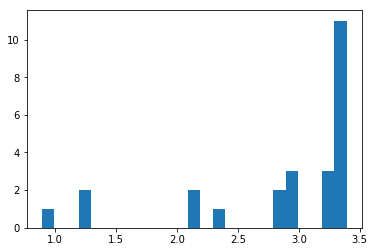

[ 2.83537614]
0.519473075867
Training epoch 2900
Iter: 2900
D loss: 3.246e-05
G_loss: -0.01282
()


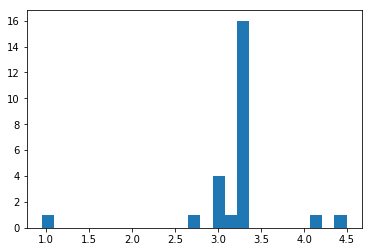

[ 3.20984756]
0.513357877731
Training epoch 3000
Iter: 3000
D loss: 3.358e-05
G_loss: -0.01172
()


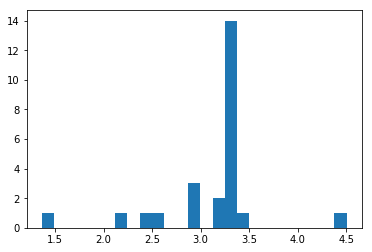

[ 3.13199269]
0.512018918991
Training epoch 3100
Iter: 3100
D loss: 3.521e-05
G_loss: -0.01111
()


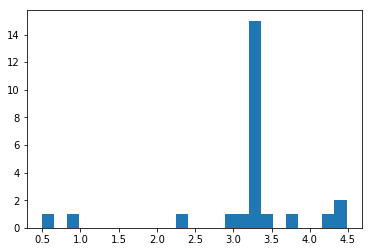

[ 3.19415351]
0.515854120255
Training epoch 3200
Iter: 3200
D loss: 3.311e-05
G_loss: -0.01235
()


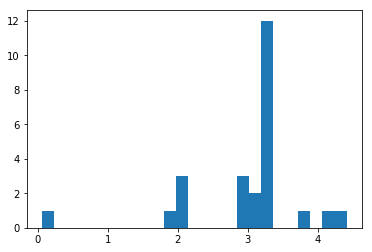

[ 3.01655263]
0.516908884048
Training epoch 3300
Iter: 3300
D loss: 3.427e-05
G_loss: -0.01242
()


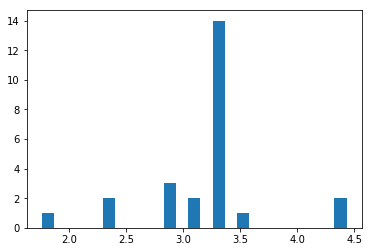

[ 3.19288733]
0.512687921524
Training epoch 3400
Iter: 3400
D loss: 2.998e-05
G_loss: -0.01238
()


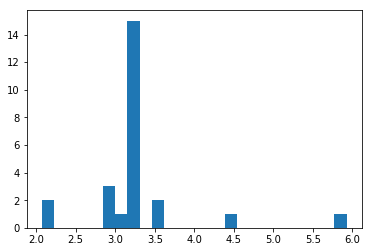

[ 3.3061206]
0.513017892838
Training epoch 3500
Iter: 3500
D loss: 2.745e-05
G_loss: -0.01161
()


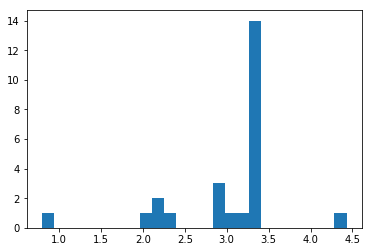

[ 3.00231356]
0.518259048462
Training epoch 3600
Iter: 3600
D loss: 3.826e-05
G_loss: -0.009277
()


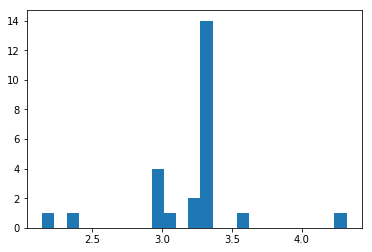

[ 3.2040987]
0.511380910873
Training epoch 3700
Iter: 3700
D loss: 3.7e-05
G_loss: -0.0114
()


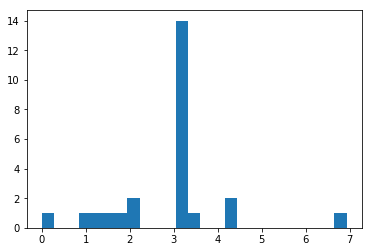

[ 2.931627]
0.517065048218
Training epoch 3800
Iter: 3800
D loss: 3.268e-05
G_loss: -0.01126
()


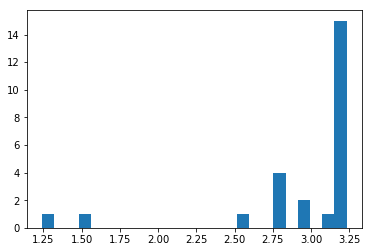

[ 2.93824387]
0.516196012497
Training epoch 3900
Iter: 3900
D loss: 3.244e-05
G_loss: -0.01234
()


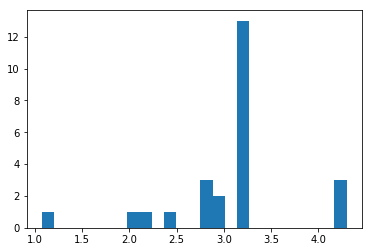

[ 3.02779734]
0.691205024719
Training epoch 4000
Iter: 4000
D loss: 2.597e-05
G_loss: -0.01269
()


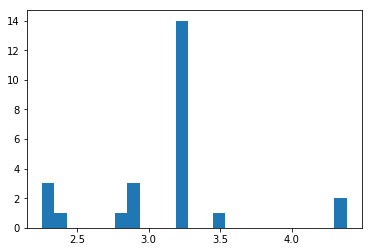

[ 3.11957767]
0.512310028076
Training epoch 4100
Iter: 4100
D loss: 3.387e-05
G_loss: -0.01155
()


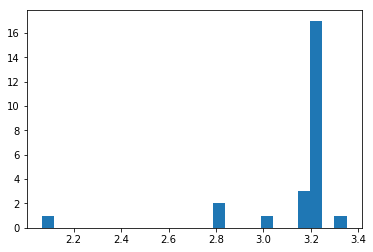

[ 3.12340187]
0.551331996918
Training epoch 4200
Iter: 4200
D loss: 3.133e-05
G_loss: -0.01256
()


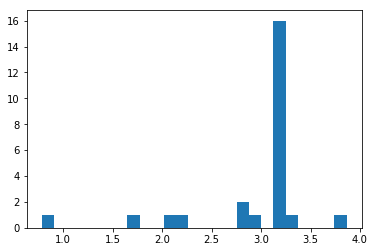

[ 2.95487766]
0.512758970261
Training epoch 4300
Iter: 4300
D loss: 3.796e-05
G_loss: -0.01154
()


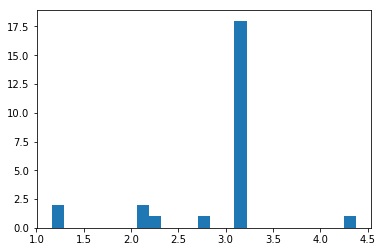

[ 2.94966517]
0.518528938293
Training epoch 4400
Iter: 4400
D loss: 3.809e-05
G_loss: -0.009669
()


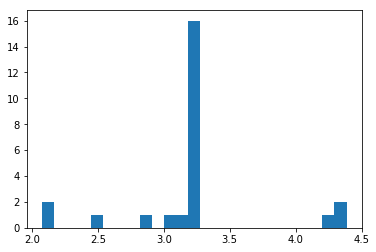

[ 3.20828911]
0.509799957275
Training epoch 4500
Iter: 4500
D loss: 3.454e-05
G_loss: -0.01151
()


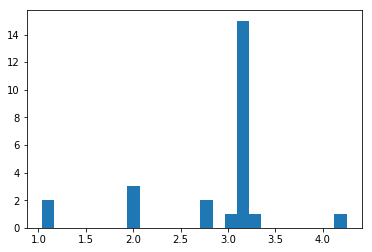

[ 2.85232266]
0.512492895126
Training epoch 4600
Iter: 4600
D loss: 3.7e-05
G_loss: -0.01165
()


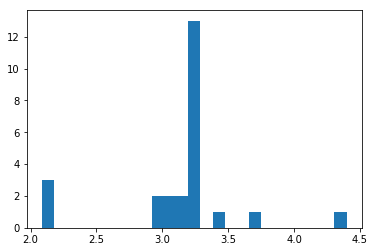

[ 3.12214647]
0.51522397995
Training epoch 4700
Iter: 4700
D loss: 2.718e-05
G_loss: -0.01254
()


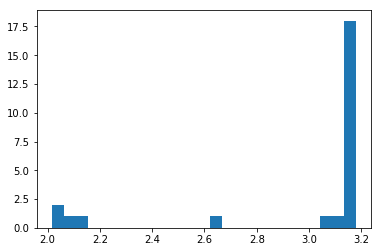

[ 2.95794629]
0.509511947632
Training epoch 4800
Iter: 4800
D loss: 3.615e-05
G_loss: -0.01249
()


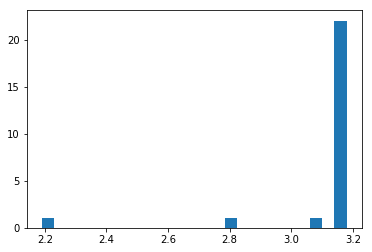

[ 3.11248882]
0.519083976746
Training epoch 4900
Iter: 4900
D loss: 3.107e-05
G_loss: -0.01275
()


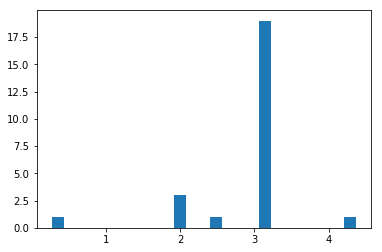

[ 2.93317695]
0.509297847748
Training epoch 5000
Iter: 5000
D loss: 3.578e-05
G_loss: -0.01106
()


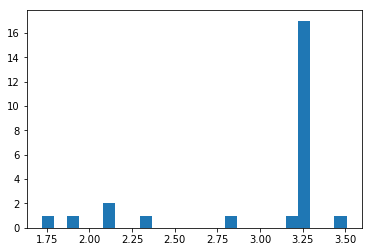

[ 2.98099897]
0.512483119965
Training epoch 5100
Iter: 5100
D loss: 2.629e-05
G_loss: -0.01195
()


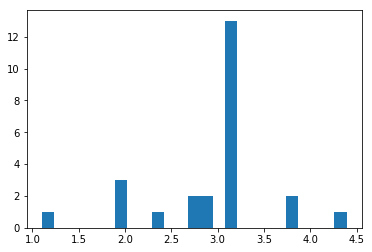

[ 2.94471437]
0.509647846222
Training epoch 5200
Iter: 5200
D loss: 3.902e-05
G_loss: -0.01081
()


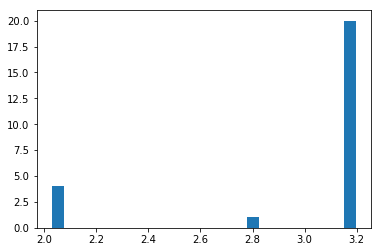

[ 2.98358903]
0.510890960693
Training epoch 5300
Iter: 5300
D loss: 2.783e-05
G_loss: -0.013
()


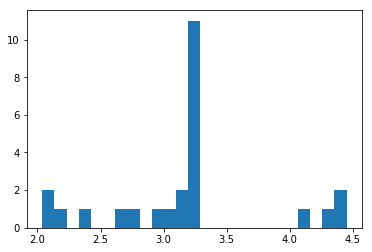

[ 3.15945344]
0.51557302475
Training epoch 5400
Iter: 5400
D loss: 4.033e-05
G_loss: -0.01275
()


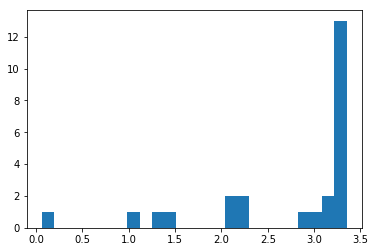

[ 2.67729549]
0.512047052383
Training epoch 5500
Iter: 5500
D loss: 2.965e-05
G_loss: -0.01267
()


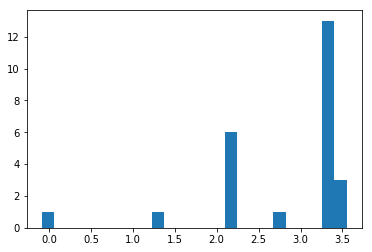

[ 2.81377726]
0.508325099945
Training epoch 5600
Iter: 5600
D loss: 2.856e-05
G_loss: -0.01208
()


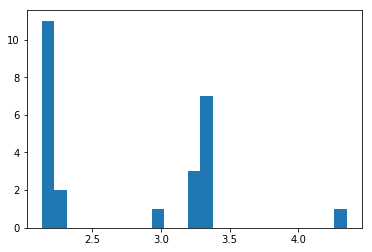

[ 2.74077085]
0.514945030212
Training epoch 5700
Iter: 5700
D loss: 4.063e-05
G_loss: -0.01125
()


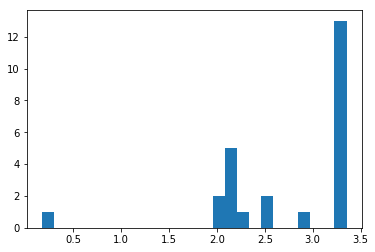

[ 2.74923452]
0.513336896896
Training epoch 5800
Iter: 5800
D loss: 3.209e-05
G_loss: -0.01267
()


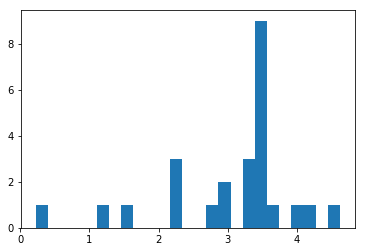

[ 3.01757394]
0.507315158844
Training epoch 5900
Iter: 5900
D loss: 4.119e-05
G_loss: -0.01223
()


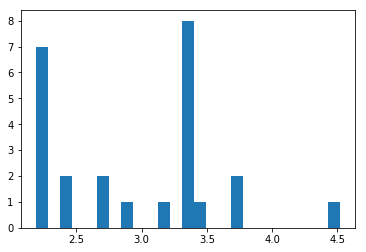

[ 2.96211351]
0.509927034378
Training epoch 6000
Iter: 6000
D loss: 3.66e-05
G_loss: -0.01282
()


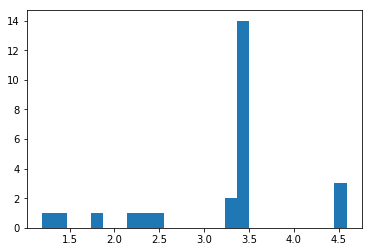

[ 3.15755553]
0.750524997711
Training epoch 6100
Iter: 6100
D loss: 3.479e-05
G_loss: -0.01244
()


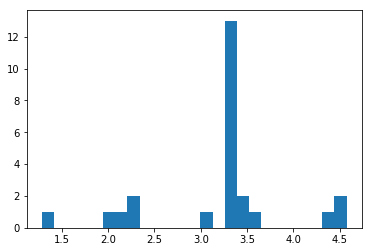

[ 3.22766957]
0.520374774933
Training epoch 6200
Iter: 6200
D loss: 3.025e-05
G_loss: -0.01177
()


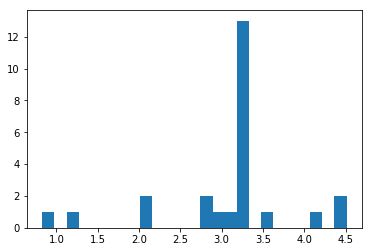

[ 3.11451107]
0.509582042694
Training epoch 6300
Iter: 6300
D loss: 2.735e-05
G_loss: -0.01292
()


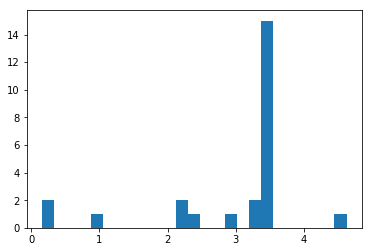

[ 2.94831087]
0.514647960663
Training epoch 6400
Iter: 6400
D loss: 2.55e-05
G_loss: -0.01295
()


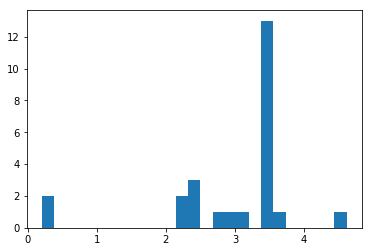

[ 2.96859687]
0.509311914444
Training epoch 6500
Iter: 6500
D loss: 2.623e-05
G_loss: -0.01313
()


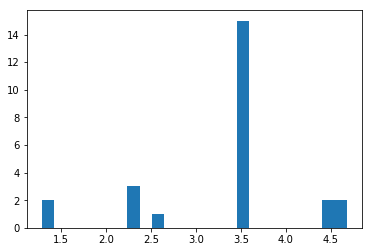

[ 3.29931264]
0.517174005508
Training epoch 6600
Iter: 6600
D loss: 2.78e-05
G_loss: -0.01261
()


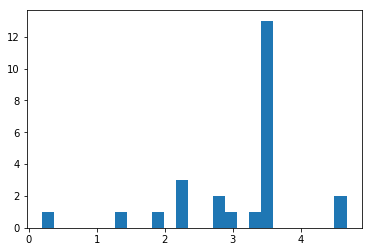

[ 3.07590981]
0.51703286171
Training epoch 6700
Iter: 6700
D loss: 3.99e-05
G_loss: -0.01143
()


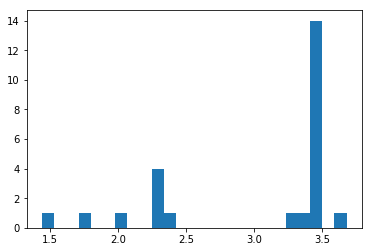

[ 3.02996547]
0.522683858871
Training epoch 6800
Iter: 6800
D loss: 4.507e-05
G_loss: -0.01084
()


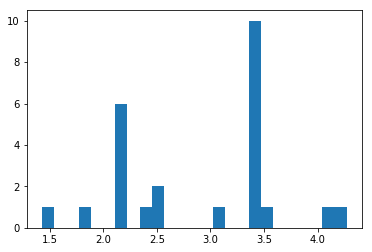

[ 2.93229222]
0.51114988327
Training epoch 6900
Iter: 6900
D loss: 2.521e-05
G_loss: -0.01199
()


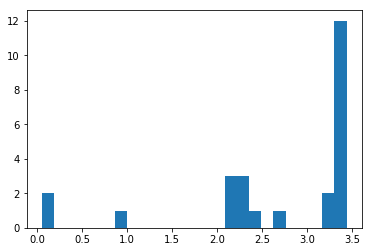

[ 2.69286813]
0.512727022171
Training epoch 7000
Iter: 7000
D loss: 2.569e-05
G_loss: -0.01343
()


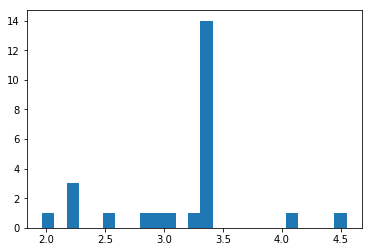

[ 3.17111372]
0.51229095459
Training epoch 7100
Iter: 7100
D loss: 3.825e-05
G_loss: -0.01223
()


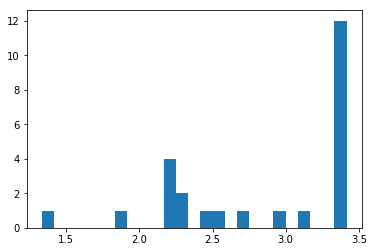

[ 2.8414946]
0.514857053757
Training epoch 7200
Iter: 7200
D loss: 3.131e-05
G_loss: -0.01274
()


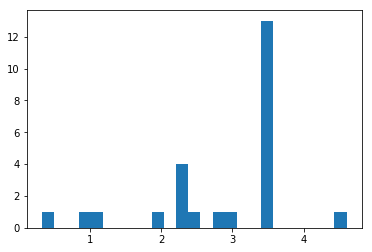

[ 2.83187463]
0.511137008667
Training epoch 7300
Iter: 7300
D loss: 2.894e-05
G_loss: -0.0131
()


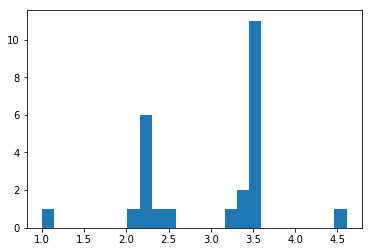

[ 2.97398969]
0.510087013245
Training epoch 7400
Iter: 7400
D loss: 3.648e-05
G_loss: -0.01335
()


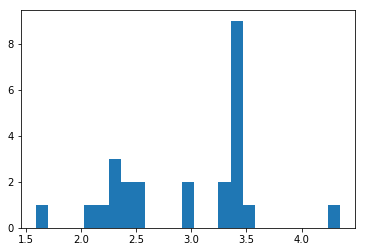

[ 2.95922796]
0.510335922241
Training epoch 7500
Iter: 7500
D loss: 3.288e-05
G_loss: -0.01244
()


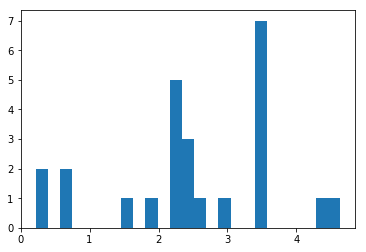

[ 2.50257136]
0.508342027664
Training epoch 7600
Iter: 7600
D loss: 2.943e-05
G_loss: -0.01291
()


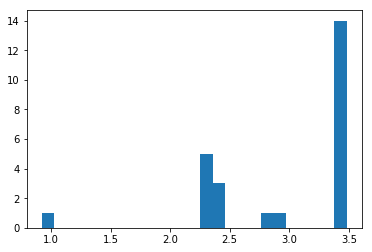

[ 2.94756097]
0.534242868423
Training epoch 7700
Iter: 7700
D loss: 3.26e-05
G_loss: -0.01011
()


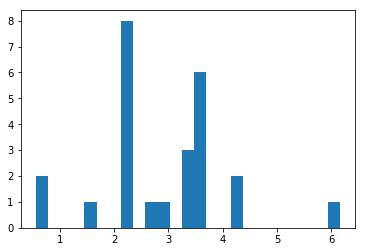

[ 2.91363428]
0.534036159515
Training epoch 7800
Iter: 7800
D loss: 2.396e-05
G_loss: -0.01315
()


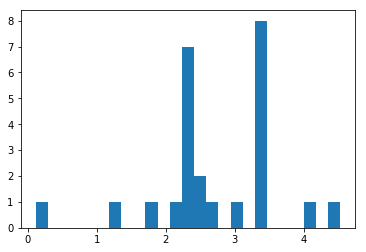

[ 2.70152497]
0.53963804245
Training epoch 7900
Iter: 7900
D loss: 3.651e-05
G_loss: -0.013
()


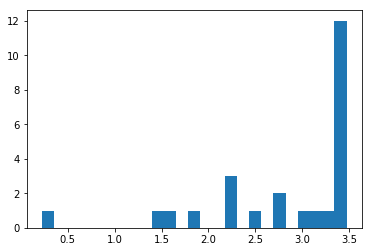

[ 2.83960718]
0.52695608139
Training epoch 8000
Iter: 8000
D loss: 2.895e-05
G_loss: -0.01314
()


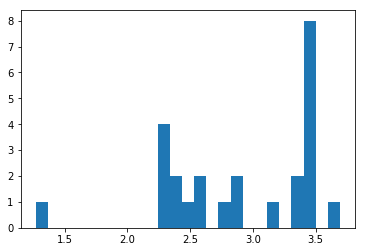

[ 2.91099371]
0.547379016876
Training epoch 8100
Iter: 8100
D loss: 2.601e-05
G_loss: -0.0129
()


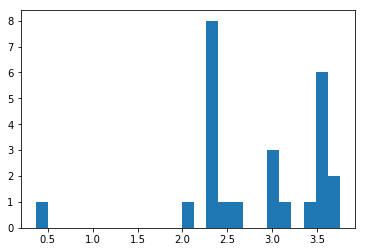

[ 2.80359326]
0.512351036072
Training epoch 8200
Iter: 8200
D loss: 3.827e-05
G_loss: -0.01302
()


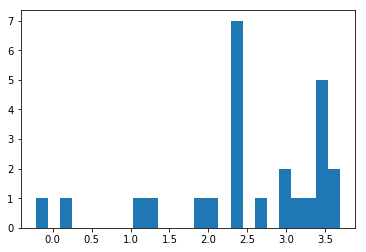

[ 2.48795516]
0.520507097244
Training epoch 8300
Iter: 8300
D loss: 3.769e-05
G_loss: -0.01287
()


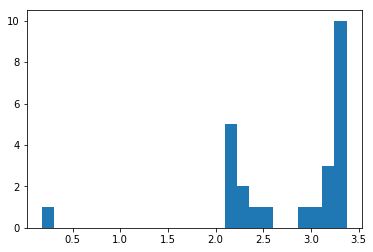

[ 2.78659455]
0.513347864151
Training epoch 8400
Iter: 8400
D loss: 4.232e-05
G_loss: -0.01295
()


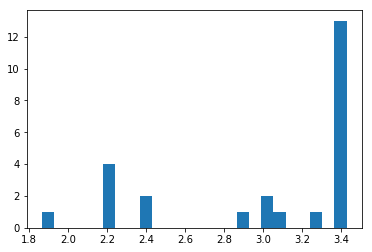

[ 3.00992416]
0.510808944702
Training epoch 8500
Iter: 8500
D loss: 2.931e-05
G_loss: -0.0136
()


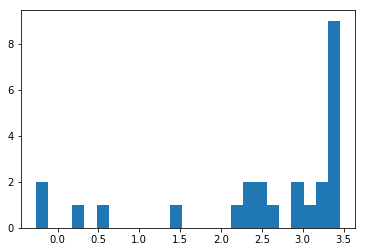

[ 2.49226692]
0.510896921158
Training epoch 8600
Iter: 8600
D loss: 2.562e-05
G_loss: -0.01278
()


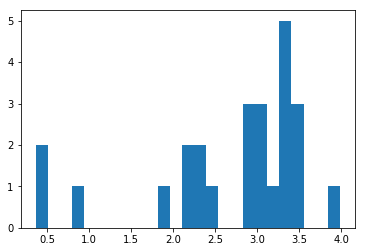

[ 2.70403669]
0.512996912003
Training epoch 8700
Iter: 8700
D loss: 2.913e-05
G_loss: -0.01341
()


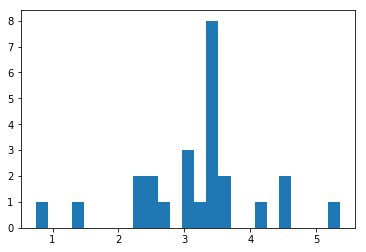

[ 3.19118835]
0.516680002213
Training epoch 8800
Iter: 8800
D loss: 3.192e-05
G_loss: -0.01296
()


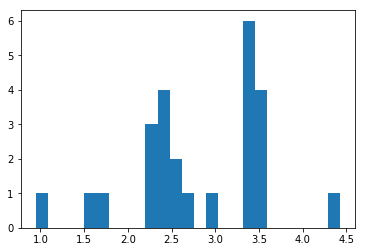

[ 2.81094951]
0.516463041306
Training epoch 8900
Iter: 8900
D loss: 2.967e-05
G_loss: -0.01183
()


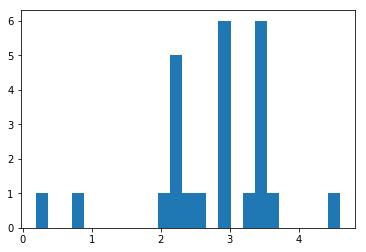

[ 2.75828808]
0.517304897308
Training epoch 9000
Iter: 9000
D loss: 2.97e-05
G_loss: -0.01319
()


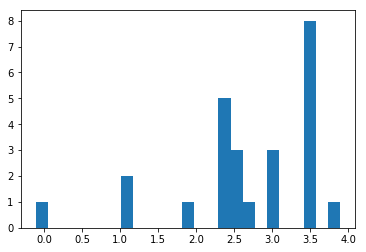

[ 2.69517771]
0.52085185051
Training epoch 9100
Iter: 9100
D loss: 3.01e-05
G_loss: -0.01275
()


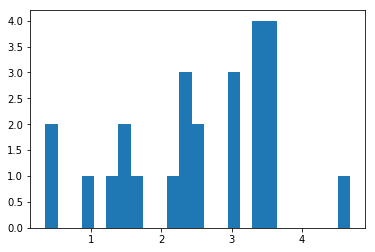

[ 2.54137766]
0.511260032654
Training epoch 9200
Iter: 9200
D loss: 3.753e-05
G_loss: -0.01343
()


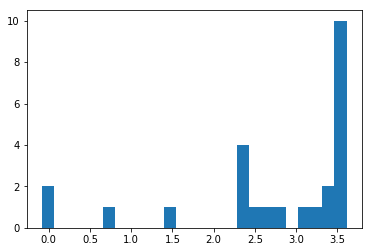

[ 2.74620004]
0.515105009079
Training epoch 9300
Iter: 9300
D loss: 3.658e-05
G_loss: -0.01103
()


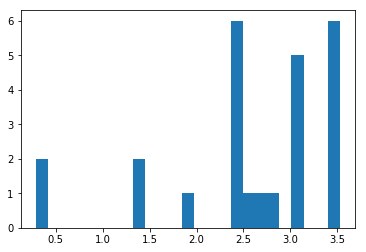

[ 2.56817633]
0.512321949005
Training epoch 9400
Iter: 9400
D loss: 2.705e-05
G_loss: -0.01341
()


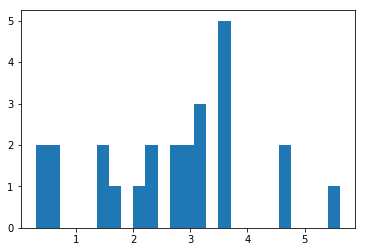

[ 2.67544477]
0.518192052841
Training epoch 9500
Iter: 9500
D loss: 2.672e-05
G_loss: -0.01336
()


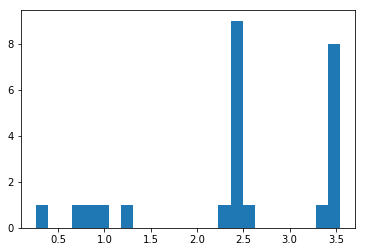

[ 2.4842661]
0.676141023636
Training epoch 9600
Iter: 9600
D loss: 3.4e-05
G_loss: -0.01284
()


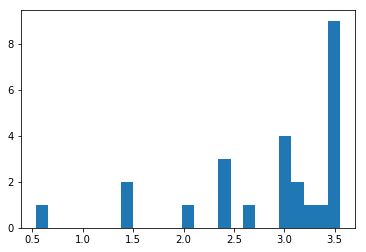

[ 2.88788708]
0.66095995903
Training epoch 9700
Iter: 9700
D loss: 2.77e-05
G_loss: -0.01331
()


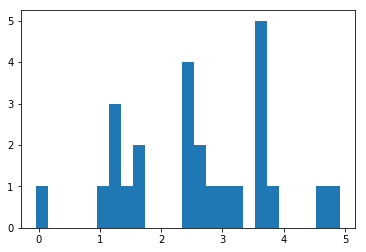

[ 2.58227074]
0.515080928802
Training epoch 9800
Iter: 9800
D loss: 3.352e-05
G_loss: -0.01322
()


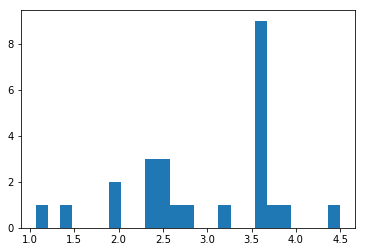

[ 2.97275739]
0.527119874954
Training epoch 9900
Iter: 9900
D loss: 3.056e-05
G_loss: -0.01319
()


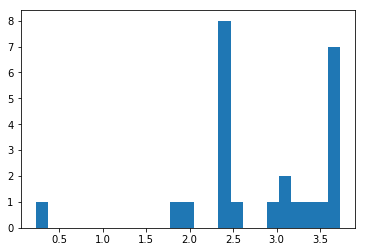

[ 2.82466646]
0.525615215302
Training epoch 10000
Iter: 10000
D loss: 2.917e-05
G_loss: -0.01268
()


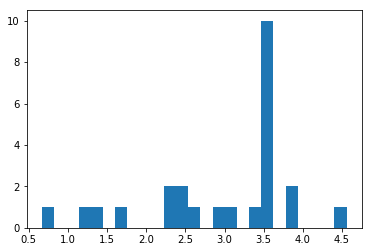

[ 2.958185]
0.514590024948
Training epoch 10100
Iter: 10100
D loss: 3.915e-05
G_loss: -0.01044
()


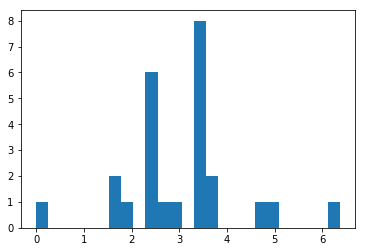

[ 3.07288781]
0.515688180923
Training epoch 10200
Iter: 10200
D loss: 4.492e-05
G_loss: -0.01332
()


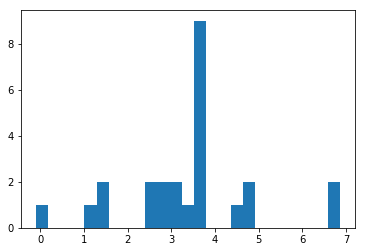

[ 3.33789017]
0.515944957733
Training epoch 10300
Iter: 10300
D loss: 3.755e-05
G_loss: -0.01194
()


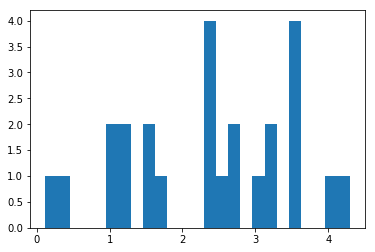

[ 2.38077972]
0.517194986343
Training epoch 10400
Iter: 10400
D loss: 3.356e-05
G_loss: -0.01271
()


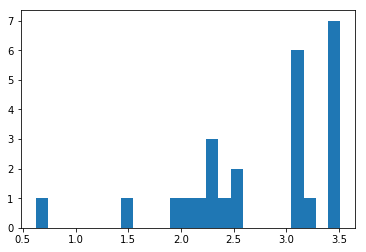

[ 2.76423935]
0.513152122498
Training epoch 10500
Iter: 10500
D loss: 3.371e-05
G_loss: -0.012
()


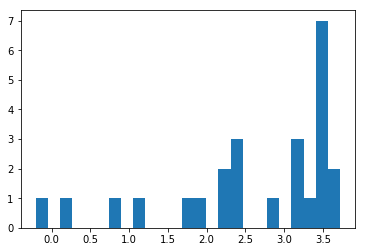

[ 2.58861263]
0.513278961182
Training epoch 10600
Iter: 10600
D loss: 3.908e-05
G_loss: -0.01171
()


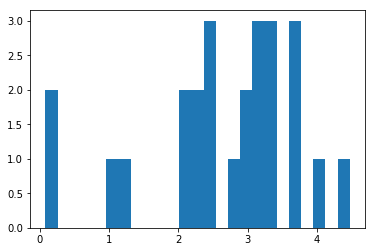

[ 2.64603952]
0.512208938599
Training epoch 10700
Iter: 10700
D loss: 2.877e-05
G_loss: -0.0126
()


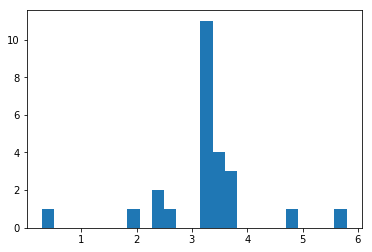

[ 3.24106106]
0.514225006104
Training epoch 10800
Iter: 10800
D loss: 2.697e-05
G_loss: -0.0132
()


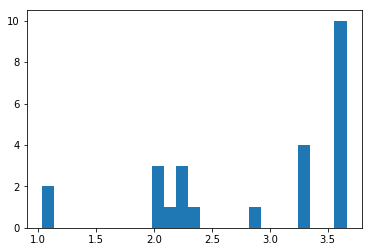

[ 2.85686993]
0.522792100906
Training epoch 10900
Iter: 10900
D loss: 2.565e-05
G_loss: -0.01316
()


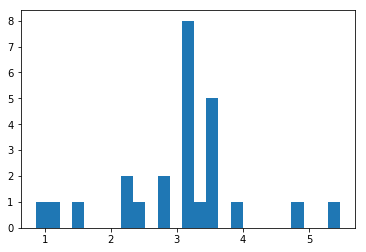

[ 3.08073987]
0.511854887009
Training epoch 11000
Iter: 11000
D loss: 2.534e-05
G_loss: -0.01346
()


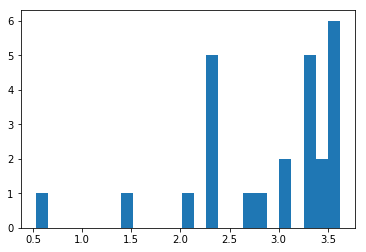

[ 2.89602652]
0.513921976089
Training epoch 11100
Iter: 11100
D loss: 3.712e-05
G_loss: -0.01323
()


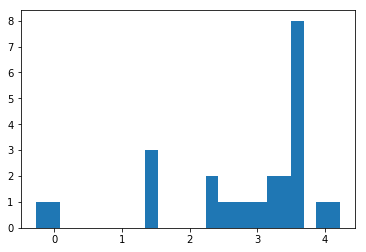

[ 2.78121314]
0.517510890961
Training epoch 11200
Iter: 11200
D loss: 2.753e-05
G_loss: -0.01375
()


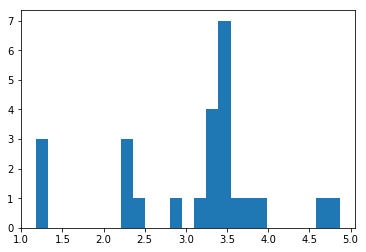

[ 3.09975664]
0.514428853989
Training epoch 11300
Iter: 11300
D loss: 3.336e-05
G_loss: -0.01344
()


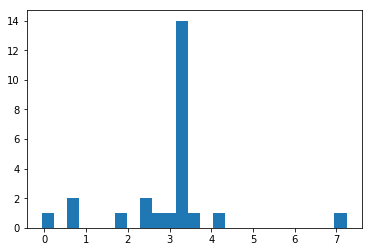

[ 3.05427425]
0.513527154922
Training epoch 11400
Iter: 11400
D loss: 3.736e-05
G_loss: -0.01315
()


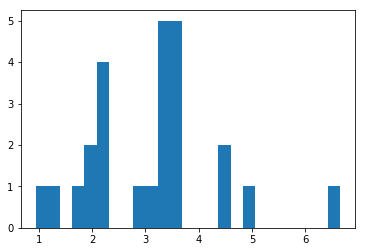

[ 3.08284345]
0.515611886978
Training epoch 11500
Iter: 11500
D loss: 2.803e-05
G_loss: -0.0128
()


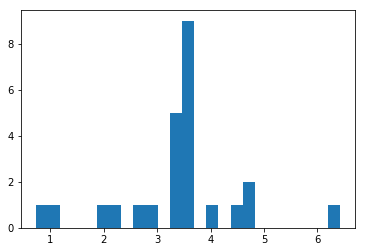

[ 3.36540195]
0.564204931259
Training epoch 11600
Iter: 11600
D loss: 2.987e-05
G_loss: -0.01331
()


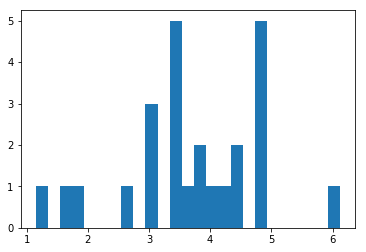

[ 3.68753492]
0.513314008713
Training epoch 11700
Iter: 11700
D loss: 4.007e-05
G_loss: -0.01226
()


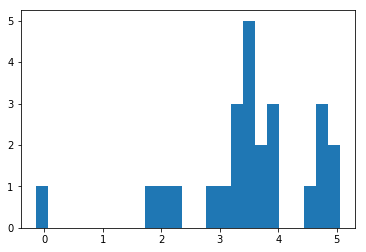

[ 3.4941773]
0.514326095581
Training epoch 11800
Iter: 11800
D loss: 3.383e-05
G_loss: -0.01374
()


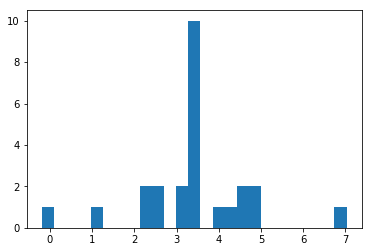

[ 3.401749]
0.515466928482
Training epoch 11900
Iter: 11900
D loss: 3.789e-05
G_loss: -0.01282
()


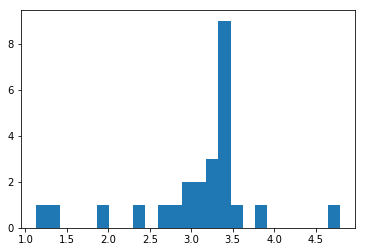

[ 3.08033508]
0.51350903511
Training epoch 12000
Iter: 12000
D loss: 2.838e-05
G_loss: -0.01274
()


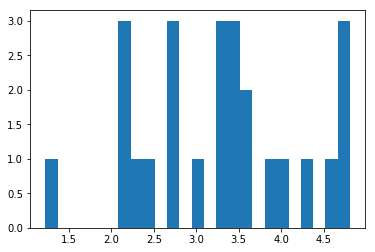

[ 3.29056675]
0.513888835907
Training epoch 12100
Iter: 12100
D loss: 3.19e-05
G_loss: -0.01253
()


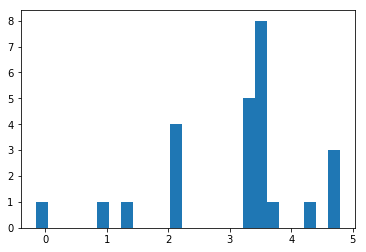

[ 3.09158368]
0.51093506813
Training epoch 12200
Iter: 12200
D loss: 3.559e-05
G_loss: -0.01295
()


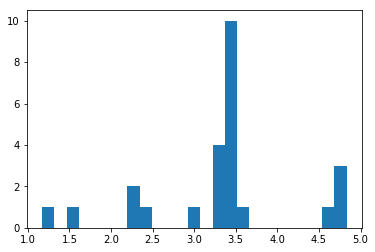

[ 3.32586388]
0.51478099823
Training epoch 12300
Iter: 12300
D loss: 2.806e-05
G_loss: -0.01235
()


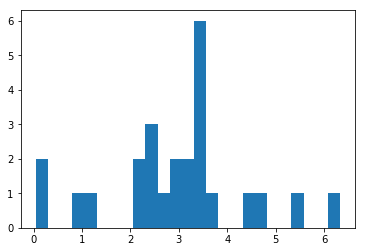

[ 2.95788905]
0.513962984085
Training epoch 12400
Iter: 12400
D loss: 2.627e-05
G_loss: -0.01334
()


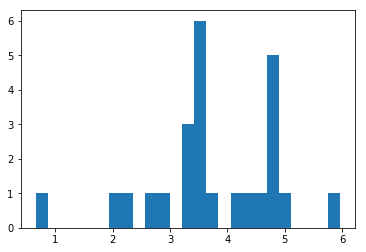

[ 3.70611947]
0.511480093002
Training epoch 12500
Iter: 12500
D loss: 3.446e-05
G_loss: -0.01323
()


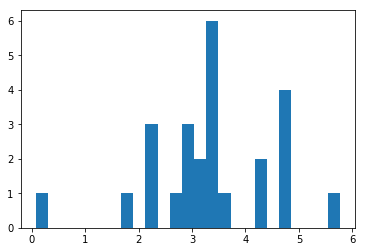

[ 3.35407081]
0.512335062027
Training epoch 12600
Iter: 12600
D loss: 3.027e-05
G_loss: -0.01057
()


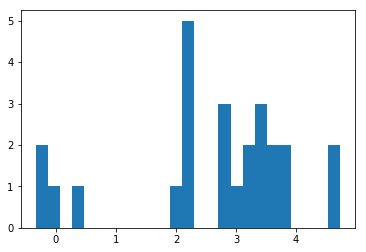

[ 2.61166456]
0.523269176483
Training epoch 12700
Iter: 12700
D loss: 2.931e-05
G_loss: -0.01246
()


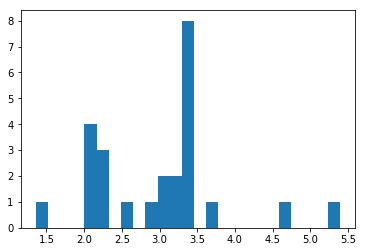

[ 3.02521321]
0.514331102371
Training epoch 12800
Iter: 12800
D loss: 2.998e-05
G_loss: -0.01319
()


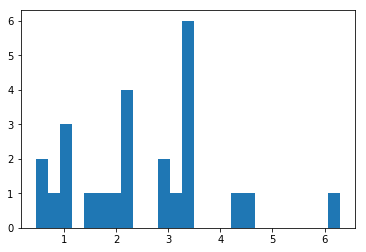

[ 2.53765134]
0.515117168427
Training epoch 12900
Iter: 12900
D loss: 2.99e-05
G_loss: -0.01251
()


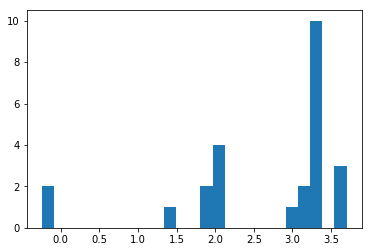

[ 2.68302717]
0.51304602623
Training epoch 13000
Iter: 13000
D loss: 3.361e-05
G_loss: -0.01329
()


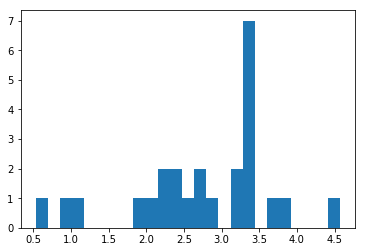

[ 2.74763998]
0.515455007553
Training epoch 13100
Iter: 13100
D loss: 3.198e-05
G_loss: -0.01332
()


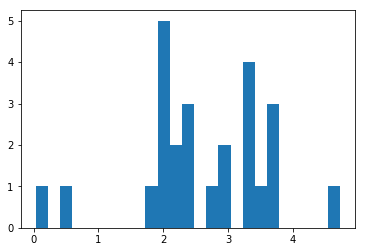

[ 2.60655071]
0.524075984955
Training epoch 13200
Iter: 13200
D loss: 2.789e-05
G_loss: -0.01318
()


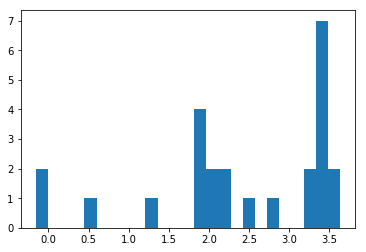

[ 2.42645418]
0.514007091522
Training epoch 13300
Iter: 13300
D loss: 2.527e-05
G_loss: -0.0123
()


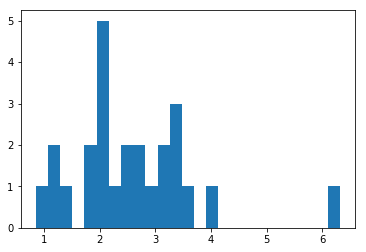

[ 2.59843004]
0.521151065826
Training epoch 13400
Iter: 13400
D loss: 3.262e-05
G_loss: -0.01235
()


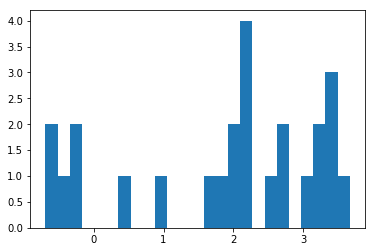

[ 1.85206233]
0.520373106003
Training epoch 13500
Iter: 13500
D loss: 3.268e-05
G_loss: -0.0132
()


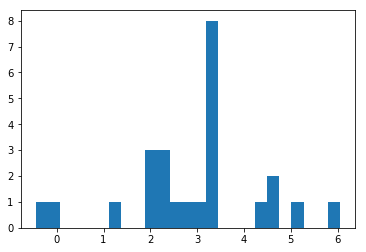

[ 2.96873312]
0.523197174072
Training epoch 13600
Iter: 13600
D loss: 4.145e-05
G_loss: -0.01267
()


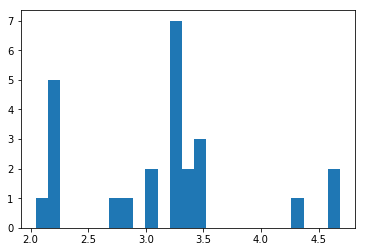

[ 3.13409071]
0.514027118683
Training epoch 13700
Iter: 13700
D loss: 3.326e-05
G_loss: -0.01194
()


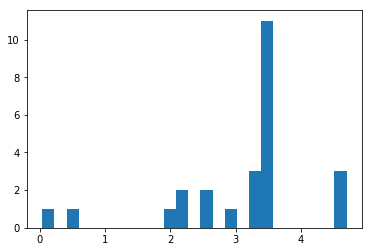

[ 3.05898831]
0.514992952347
Training epoch 13800
Iter: 13800
D loss: 2.856e-05
G_loss: -0.01262
()


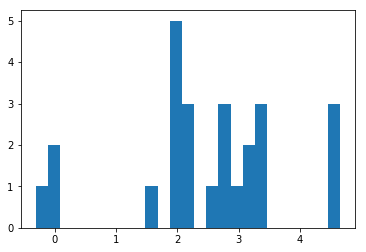

[ 2.46287092]
0.51221203804
Training epoch 13900
Iter: 13900
D loss: 3.267e-05
G_loss: -0.01317
()


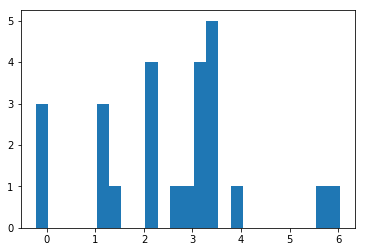

[ 2.53483395]
0.511955976486
Training epoch 14000
Iter: 14000
D loss: 3.339e-05
G_loss: -0.01308
()


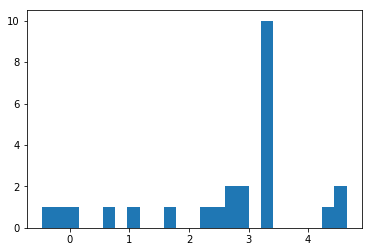

[ 2.64598775]
0.513814926147
Training epoch 14100
Iter: 14100
D loss: 3.876e-05
G_loss: -0.01335
()


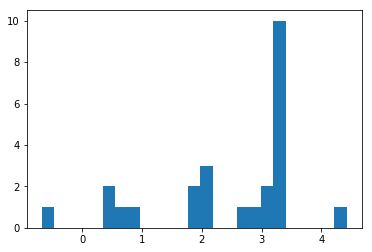

[ 2.4379893]
0.521348953247
Training epoch 14200
Iter: 14200
D loss: 3.353e-05
G_loss: -0.01322
()


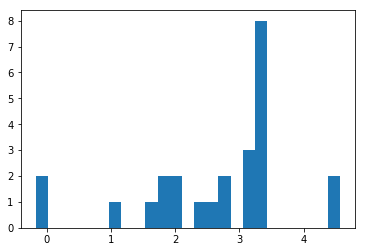

[ 2.65660208]
0.514061927795
Training epoch 14300
Iter: 14300
D loss: 3.093e-05
G_loss: -0.01317
()


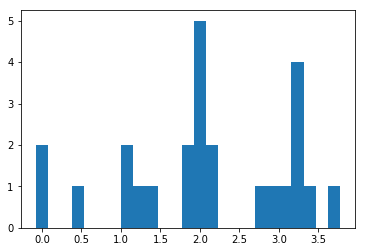

[ 2.09426317]
0.5164539814
Training epoch 14400
Iter: 14400
D loss: 3.04e-05
G_loss: -0.01334
()


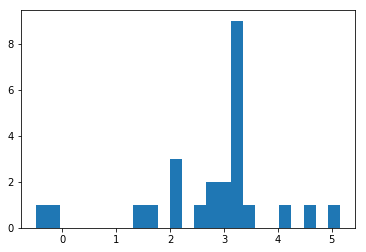

[ 2.78441033]
0.512279987335
Training epoch 14500
Iter: 14500
D loss: 3.922e-05
G_loss: -0.01319
()


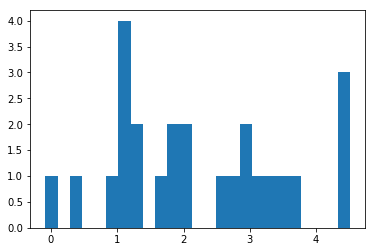

[ 2.25492749]
0.512264966965
Training epoch 14600
Iter: 14600
D loss: 2.94e-05
G_loss: -0.01085
()


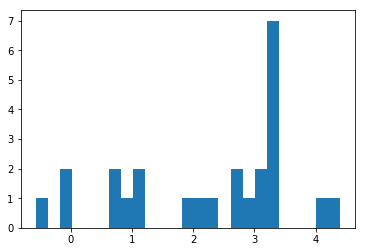

[ 2.23010357]
0.511106014252
Training epoch 14700
Iter: 14700
D loss: 5.084e-05
G_loss: -0.01314
()


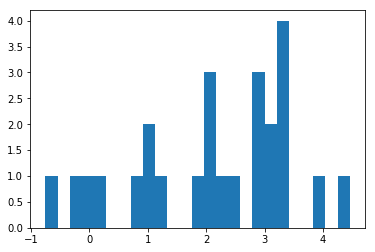

[ 2.12426482]
0.516397953033
Training epoch 14800
Iter: 14800
D loss: 3.598e-05
G_loss: -0.01233
()


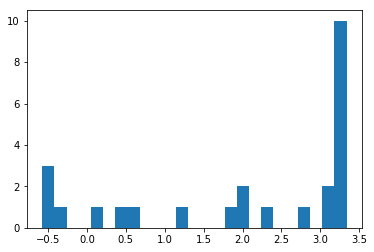

[ 2.0211531]
0.522161960602
Training epoch 14900
Iter: 14900
D loss: 4.195e-05
G_loss: -0.01335
()


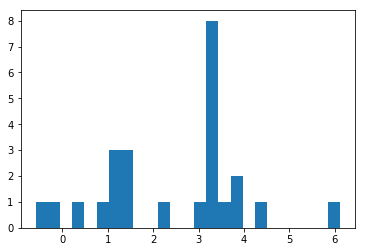

[ 2.44549998]
0.512298822403
Training epoch 15000
Iter: 15000
D loss: 3.043e-05
G_loss: -0.01339
()


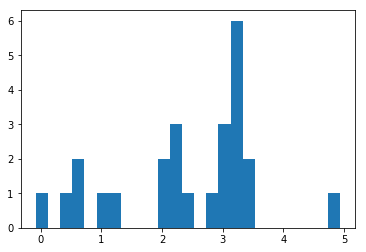

[ 2.41699965]
0.512080192566
Training epoch 15100
Iter: 15100
D loss: 3.762e-05
G_loss: -0.01291
()


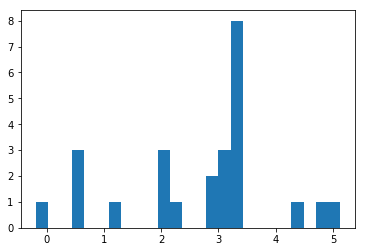

[ 2.66135432]
0.512382984161
Training epoch 15200
Iter: 15200
D loss: 3.632e-05
G_loss: -0.01186
()


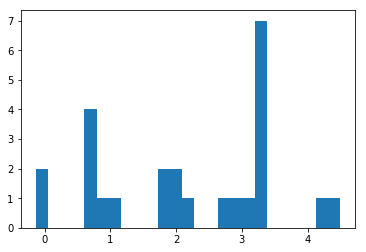

[ 2.18351479]
0.512246131897
Training epoch 15300
Iter: 15300
D loss: 3.957e-05
G_loss: -0.009961
()


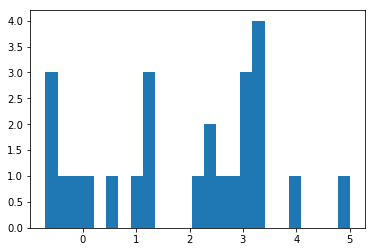

[ 1.86716711]
0.514163017273
Training epoch 15400
Iter: 15400
D loss: 3.267e-05
G_loss: -0.01303
()


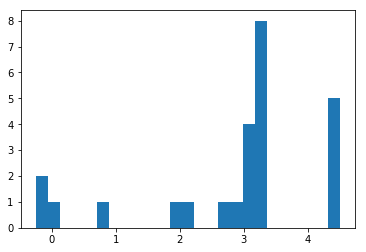

[ 2.83548304]
0.517746925354
Training epoch 15500
Iter: 15500
D loss: 3.174e-05
G_loss: -0.01327
()


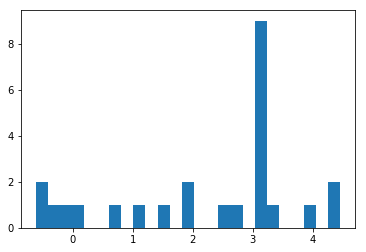

[ 2.23491986]
0.535607814789
Training epoch 15600
Iter: 15600
D loss: 2.693e-05
G_loss: -0.0134
()


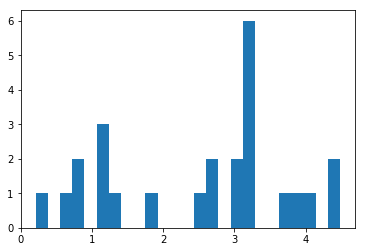

[ 2.53317769]
0.524755001068
Training epoch 15700
Iter: 15700
D loss: 3.2e-05
G_loss: -0.01328
()


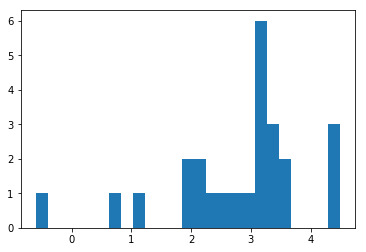

[ 2.78465034]
0.518991947174
Training epoch 15800
Iter: 15800
D loss: 2.997e-05
G_loss: -0.01271
()


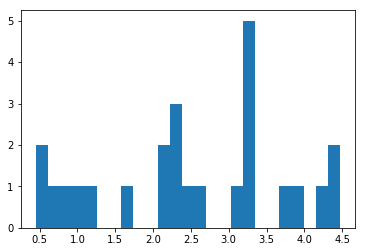

[ 2.51832892]
0.513876914978
Training epoch 15900
Iter: 15900
D loss: 2.548e-05
G_loss: -0.01353
()


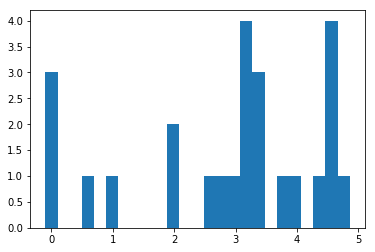

[ 2.86360629]
0.511896133423
Training epoch 16000
Iter: 16000
D loss: 3.285e-05
G_loss: -0.01124
()


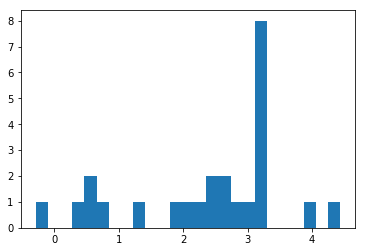

[ 2.39170584]
0.511641979218
Training epoch 16100
Iter: 16100
D loss: 3.251e-05
G_loss: -0.01293
()


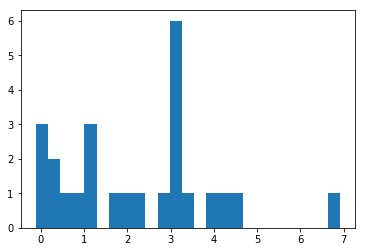

[ 2.26168241]
0.511590957642
Training epoch 16200
Iter: 16200
D loss: 2.753e-05
G_loss: -0.01258
()


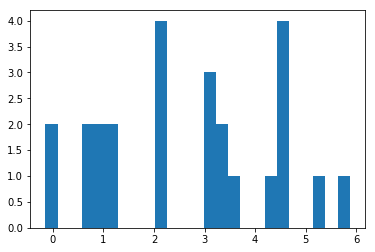

[ 2.66729025]
0.525316953659
Training epoch 16300
Iter: 16300
D loss: 4.304e-05
G_loss: -0.01134
()


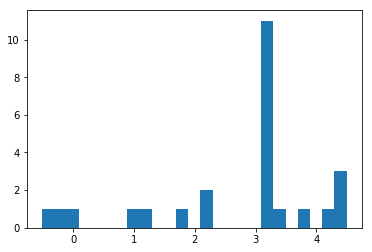

[ 2.71766525]
0.51550412178
Training epoch 16400
Iter: 16400
D loss: 3.71e-05
G_loss: -0.01268
()


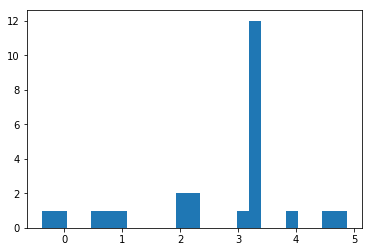

[ 2.66075488]
0.513730049133
Training epoch 16500
Iter: 16500
D loss: 2.852e-05
G_loss: -0.01281
()


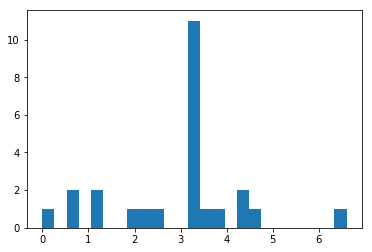

[ 2.9586868]
0.511212110519
Training epoch 16600
Iter: 16600
D loss: 3.264e-05
G_loss: -0.01327
()


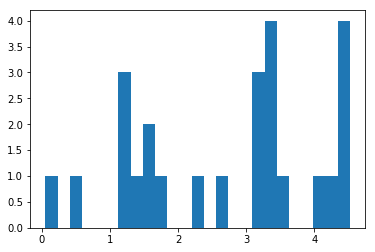

[ 2.71323357]
0.511034011841
Training epoch 16700
Iter: 16700
D loss: 3.349e-05
G_loss: -0.0123
()


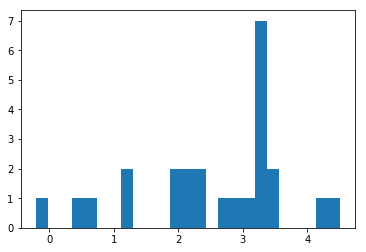

[ 2.55174758]
0.51855301857
Training epoch 16800
Iter: 16800
D loss: 2.757e-05
G_loss: -0.01331
()


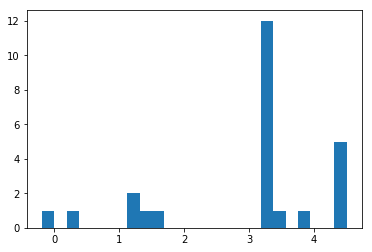

[ 2.99016686]
0.51259803772
Training epoch 16900
Iter: 16900
D loss: 3.397e-05
G_loss: -0.01269
()


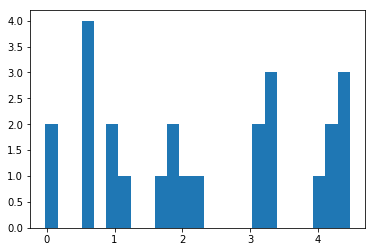

[ 2.28862035]
0.511966228485
Training epoch 17000
Iter: 17000
D loss: 3.646e-05
G_loss: -0.01322
()


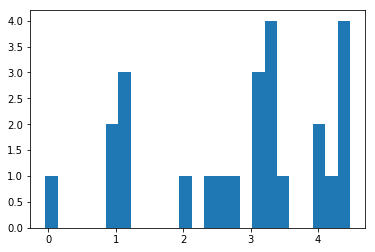

[ 2.84430039]
0.513532876968
Training epoch 17100
Iter: 17100
D loss: 2.914e-05
G_loss: -0.01249
()


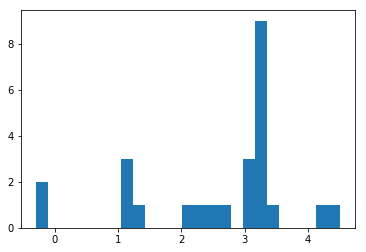

[ 2.60395301]
0.522235870361
Training epoch 17200
Iter: 17200
D loss: 3.549e-05
G_loss: -0.0133
()


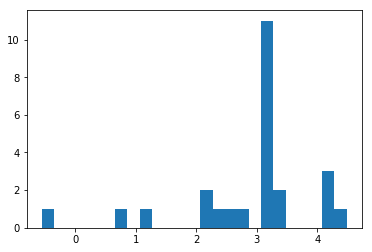

[ 2.91180108]
0.517658948898
Training epoch 17300
Iter: 17300
D loss: 2.793e-05
G_loss: -0.01258
()


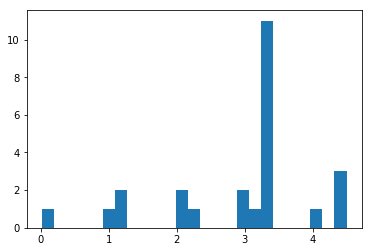

[ 2.89540869]
0.529133796692
Training epoch 17400
Iter: 17400
D loss: 3.575e-05
G_loss: -0.01273
()


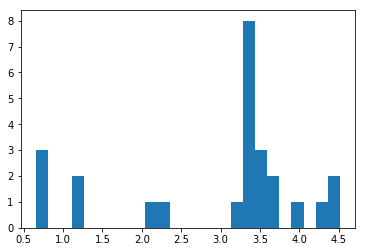

[ 2.94638692]
0.513077020645
Training epoch 17500
Iter: 17500
D loss: 2.62e-05
G_loss: -0.01337
()


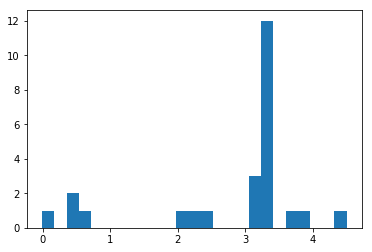

[ 2.77096835]
0.511917114258
Training epoch 17600
Iter: 17600
D loss: 3.783e-05
G_loss: -0.01322
()


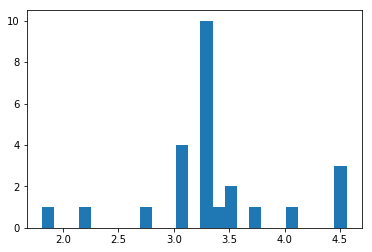

[ 3.37408774]
0.513960838318
Training epoch 17700
Iter: 17700
D loss: 3.361e-05
G_loss: -0.01329
()


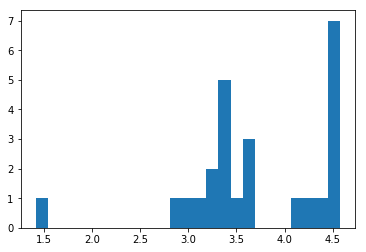

[ 3.7108737]
0.517115116119
Training epoch 17800
Iter: 17800
D loss: 4.382e-05
G_loss: -0.01212
()


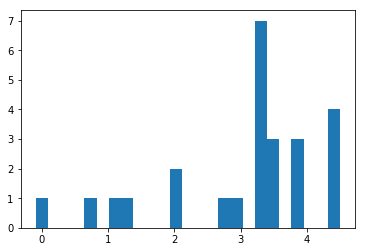

[ 3.0181187]
0.515392065048
Training epoch 17900
Iter: 17900
D loss: 2.793e-05
G_loss: -0.01133
()


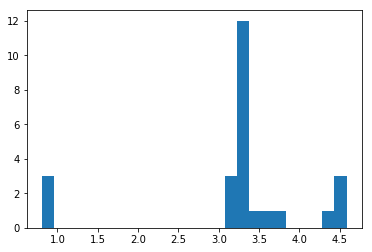

[ 3.21943967]
0.516845941544
Training epoch 18000
Iter: 18000
D loss: 3.343e-05
G_loss: -0.0134
()


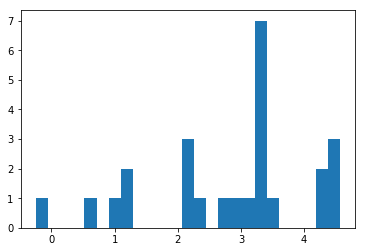

[ 2.80826284]
0.530369997025
Training epoch 18100
Iter: 18100
D loss: 2.679e-05
G_loss: -0.01212
()


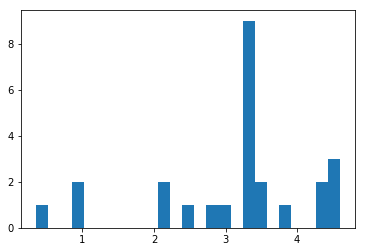

[ 3.13016808]
0.515795946121
Training epoch 18200
Iter: 18200
D loss: 3.855e-05
G_loss: -0.01265
()


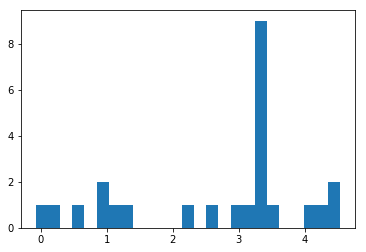

[ 2.63504578]
0.519324064255
Training epoch 18300
Iter: 18300
D loss: 3.367e-05
G_loss: -0.01276
()


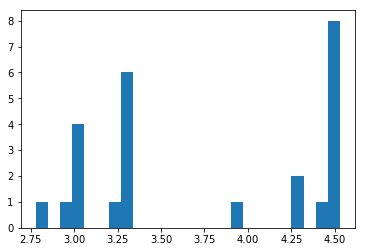

[ 3.76210421]
0.511178016663
Training epoch 18400
Iter: 18400
D loss: 3.096e-05
G_loss: -0.01254
()


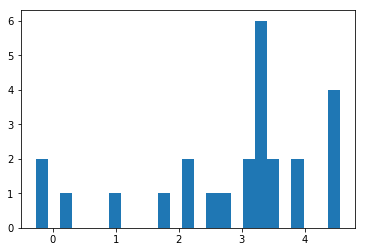

[ 2.82653855]
0.513088941574
Training epoch 18500
Iter: 18500
D loss: 3.308e-05
G_loss: -0.01217
()


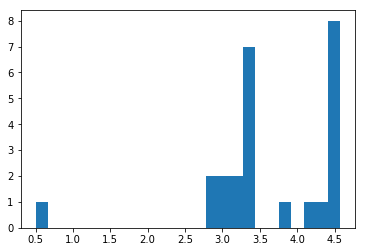

[ 3.62712145]
0.522490978241
Training epoch 18600
Iter: 18600
D loss: 3.69e-05
G_loss: -0.01329
()


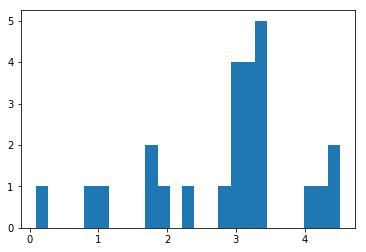

[ 2.85757587]
0.513112068176
Training epoch 18700
Iter: 18700
D loss: 2.922e-05
G_loss: -0.01236
()


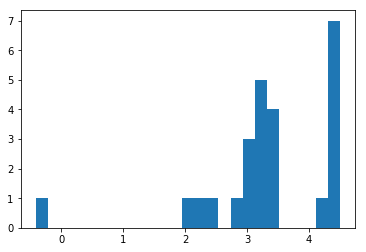

[ 3.34826077]
0.511930942535
Training epoch 18800
Iter: 18800
D loss: 2.723e-05
G_loss: -0.01335
()


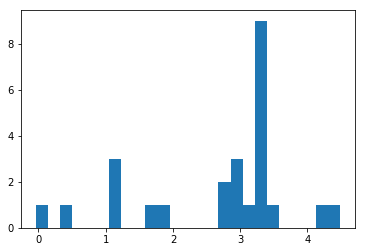

[ 2.6440375]
0.515549898148
Training epoch 18900
Iter: 18900
D loss: 2.425e-05
G_loss: -0.01353
()


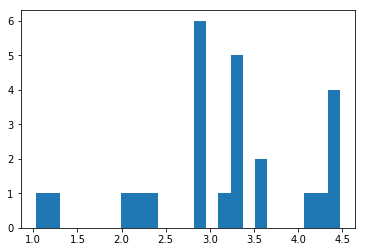

[ 3.17445048]
0.515433073044
Training epoch 19000
Iter: 19000
D loss: 4.488e-05
G_loss: -0.01195
()


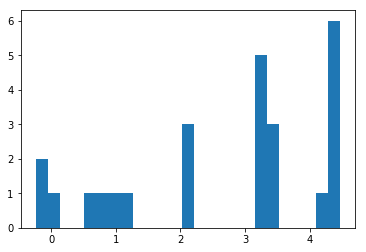

[ 2.66220685]
0.520440101624
Training epoch 19100
Iter: 19100
D loss: 2.916e-05
G_loss: -0.01323
()


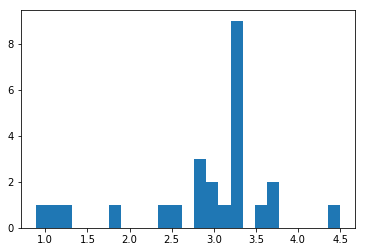

[ 2.89092727]
0.640554904938
Training epoch 19200
Iter: 19200
D loss: 3.914e-05
G_loss: -0.01186
()


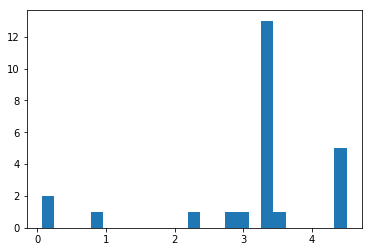

[ 3.10605137]
0.595378875732
Training epoch 19300
Iter: 19300
D loss: 3.975e-05
G_loss: -0.01263
()


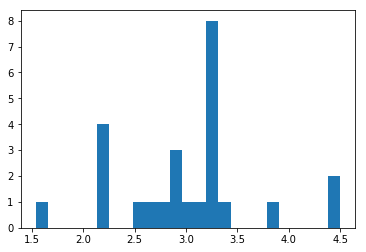

[ 3.03053824]
0.512636184692
Training epoch 19400
Iter: 19400
D loss: 2.97e-05
G_loss: -0.01324
()


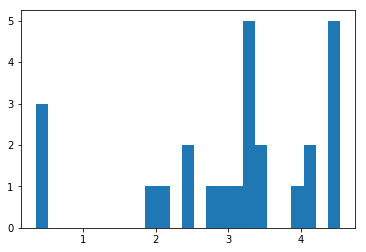

[ 3.09105058]
0.526098012924
Training epoch 19500
Iter: 19500
D loss: 3.559e-05
G_loss: -0.01341
()


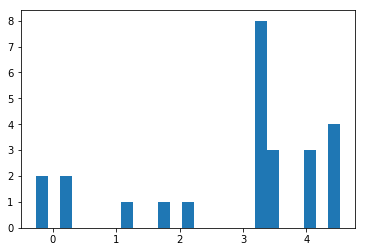

[ 2.87144872]
0.515450954437
Training epoch 19600
Iter: 19600
D loss: 3.486e-05
G_loss: -0.01232
()


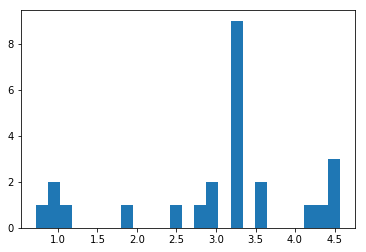

[ 3.04262599]
0.522530078888
Training epoch 19700
Iter: 19700
D loss: 4.08e-05
G_loss: -0.01148
()


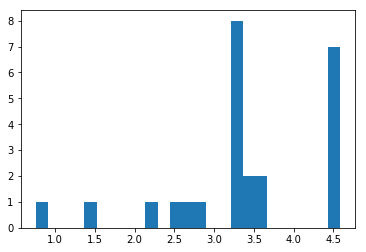

[ 3.3894508]
0.511203050613
Training epoch 19800
Iter: 19800
D loss: 2.822e-05
G_loss: -0.01319
()


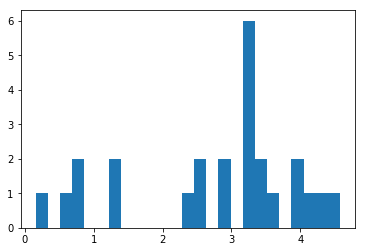

[ 2.7766176]
0.512159824371
Training epoch 19900
Iter: 19900
D loss: 2.922e-05
G_loss: -0.01331
()


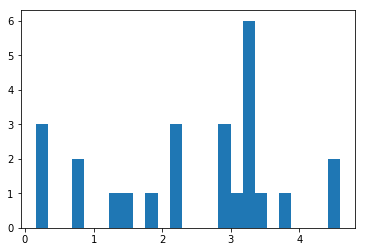

[ 2.46729685]
0.518614053726
Training epoch 20000
Iter: 20000
D loss: 3.605e-05
G_loss: -0.01335
()


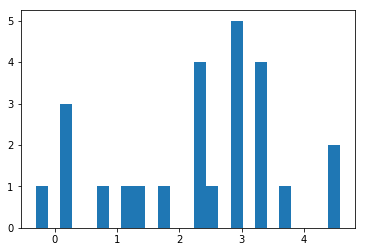

[ 2.30273707]
0.517659187317
Training epoch 20100
Iter: 20100
D loss: 3.024e-05
G_loss: -0.01206
()


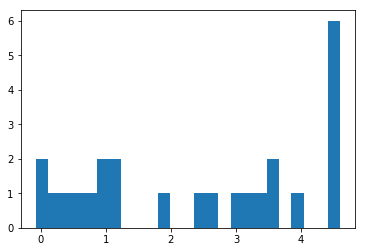

[ 2.44783126]
0.52127289772
Training epoch 20200
Iter: 20200
D loss: 2.404e-05
G_loss: -0.01327
()


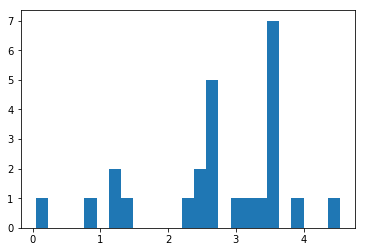

[ 2.72376697]
0.515116930008
Training epoch 20300
Iter: 20300
D loss: 3.753e-05
G_loss: -0.01165
()


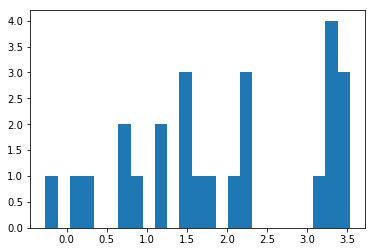

[ 1.94000922]
0.540934085846
Training epoch 20400
Iter: 20400
D loss: 2.955e-05
G_loss: -0.01248
()


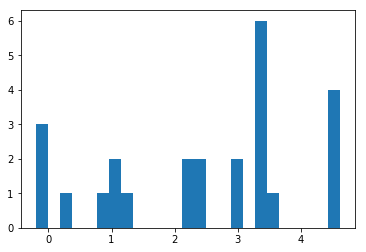

[ 2.45654742]
0.517613887787
Training epoch 20500
Iter: 20500
D loss: 2.027e-05
G_loss: -0.01351
()


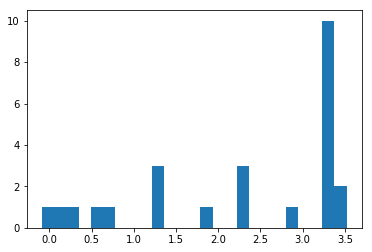

[ 2.28064074]
0.512046098709
Training epoch 20600
Iter: 20600
D loss: 3.071e-05
G_loss: -0.01321
()


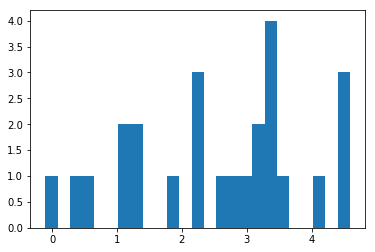

[ 2.56930484]
0.522464990616
Training epoch 20700
Iter: 20700
D loss: 3.204e-05
G_loss: -0.01327
()


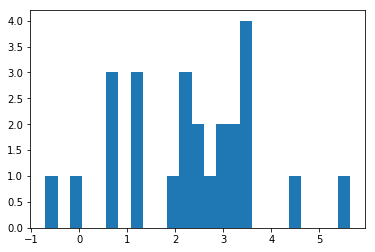

[ 2.31635313]
0.513957977295
Training epoch 20800
Iter: 20800
D loss: 3.782e-05
G_loss: -0.01334
()


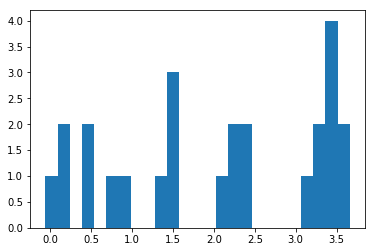

[ 2.027697]
0.516125917435
Training epoch 20900
Iter: 20900
D loss: 2.984e-05
G_loss: -0.01406
()


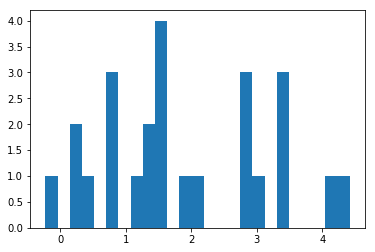

[ 1.89191499]
0.524412870407
Training epoch 21000
Iter: 21000
D loss: 3.891e-05
G_loss: -0.01327
()


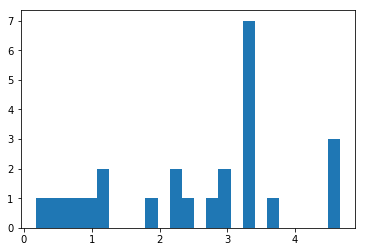

[ 2.56430943]
0.520811080933
Training epoch 21100
Iter: 21100
D loss: 3.439e-05
G_loss: -0.013
()


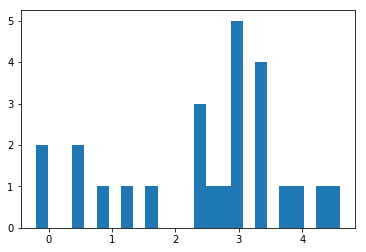

[ 2.46787286]
0.513247013092
Training epoch 21200
Iter: 21200
D loss: 3.317e-05
G_loss: -0.01331
()


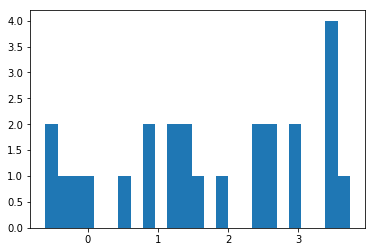

[ 1.70299402]
0.512812852859
Training epoch 21300
Iter: 21300
D loss: 3.214e-05
G_loss: -0.01321
()


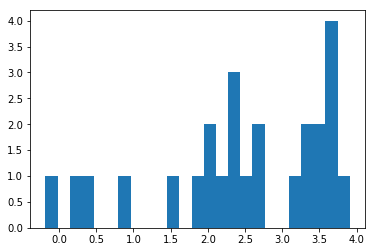

[ 2.46417034]
0.518680810928
Training epoch 21400
Iter: 21400
D loss: 3.229e-05
G_loss: -0.01324
()


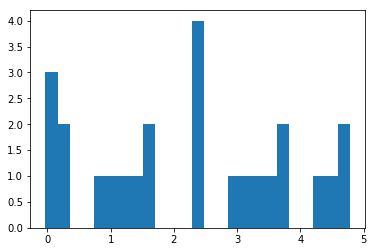

[ 2.27175344]
0.513459920883
Training epoch 21500
Iter: 21500
D loss: 3.028e-05
G_loss: -0.01286
()


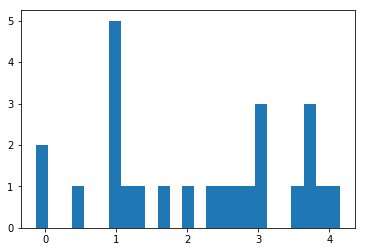

[ 2.13622997]
0.513202905655
Training epoch 21600
Iter: 21600
D loss: 3.641e-05
G_loss: -0.01389
()


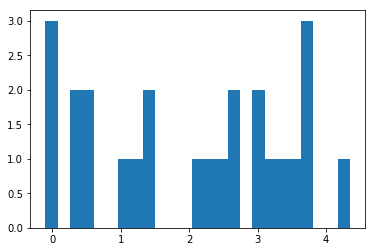

[ 2.02019204]
0.516392946243
Training epoch 21700
Iter: 21700
D loss: 3.496e-05
G_loss: -0.01327
()


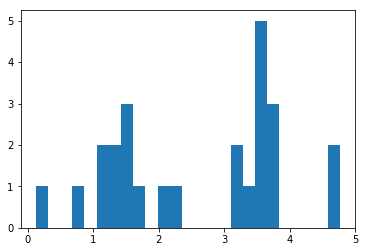

[ 2.57505973]
0.515244007111
Training epoch 21800
Iter: 21800
D loss: 3.326e-05
G_loss: -0.01284
()


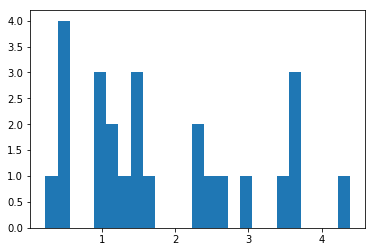

[ 1.82938963]
0.562046051025
Training epoch 21900
Iter: 21900
D loss: 2.566e-05
G_loss: -0.0127
()


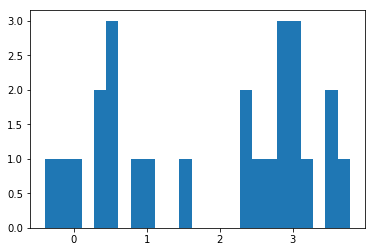

[ 1.87685405]
0.515336036682
Training epoch 22000
Iter: 22000
D loss: 3.276e-05
G_loss: -0.01331
()


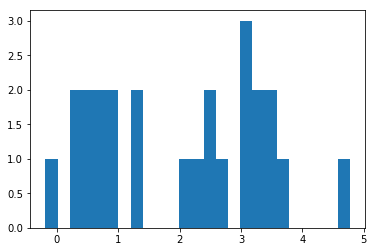

[ 2.02727488]
0.514909982681
Training epoch 22100
Iter: 22100
D loss: 4.218e-05
G_loss: -0.0136
()


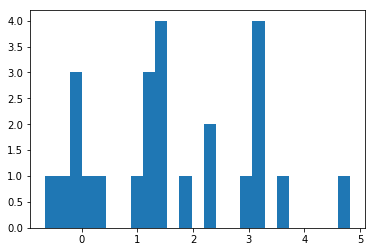

[ 1.58381107]
0.513824939728
Training epoch 22200
Iter: 22200
D loss: 4.81e-05
G_loss: -0.01306
()


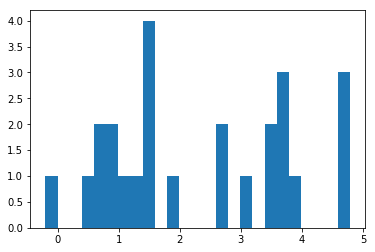

[ 2.32737524]
0.513227939606
Training epoch 22300
Iter: 22300
D loss: 2.874e-05
G_loss: -0.01324
()


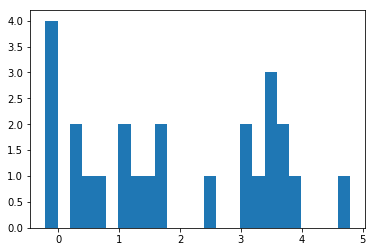

[ 1.9062036]
0.524555921555
Training epoch 22400
Iter: 22400
D loss: 3.007e-05
G_loss: -0.01254
()


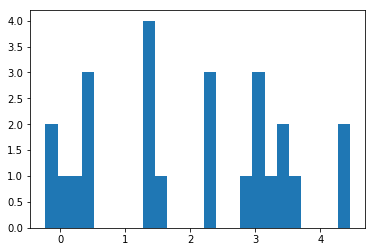

[ 2.00103669]
0.512892961502
Training epoch 22500
Iter: 22500
D loss: 3.005e-05
G_loss: -0.0132
()


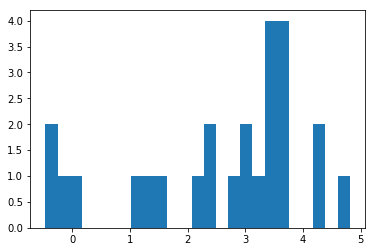

[ 2.57847644]
0.519713878632
Training epoch 22600
Iter: 22600
D loss: 1.861e-05
G_loss: -0.01346
()


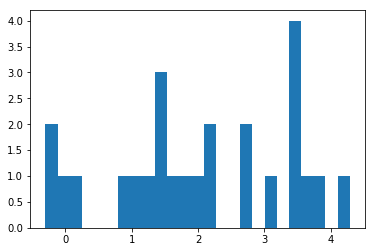

[ 2.0544954]
0.524376869202
Training epoch 22700
Iter: 22700
D loss: 3.04e-05
G_loss: -0.01383
()


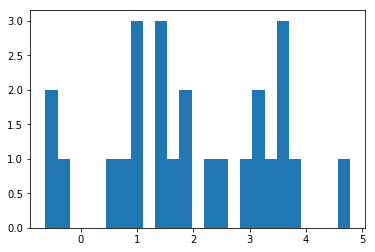

[ 1.97074852]
0.526296138763
Training epoch 22800
Iter: 22800
D loss: 3.557e-05
G_loss: -0.01188
()


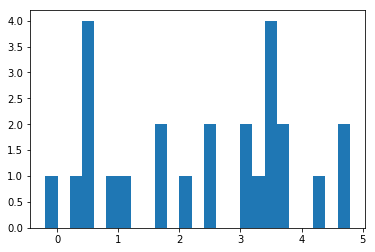

[ 2.35945408]
0.524524927139
Training epoch 22900
Iter: 22900
D loss: 3.214e-05
G_loss: -0.01246
()


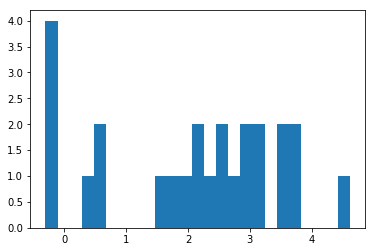

[ 2.06312251]
0.549462080002
Training epoch 23000
Iter: 23000
D loss: 3.361e-05
G_loss: -0.01257
()


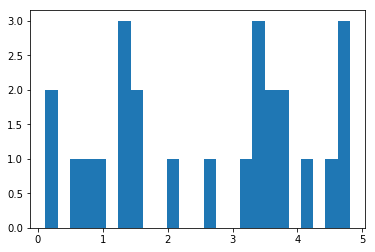

[ 2.62979942]
0.515370845795
Training epoch 23100
Iter: 23100
D loss: 3.518e-05
G_loss: -0.01249
()


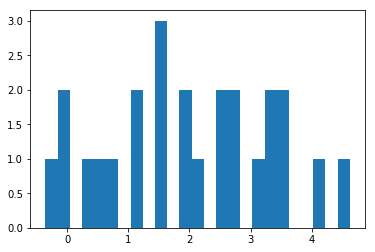

[ 1.98557356]
0.511164188385
Training epoch 23200
Iter: 23200
D loss: 4.254e-05
G_loss: -0.01189
()


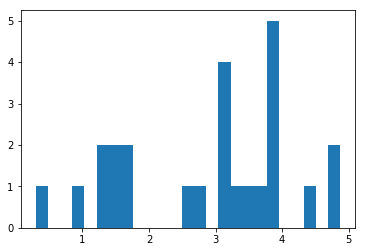

[ 2.87345837]
0.511471986771
Training epoch 23300
Iter: 23300
D loss: 3.54e-05
G_loss: -0.01183
()


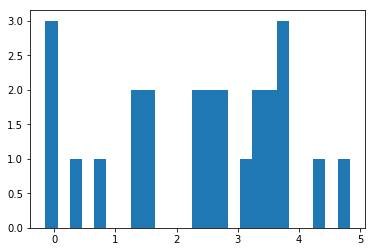

[ 2.34472571]
0.535859107971
Training epoch 23400
Iter: 23400
D loss: 2.907e-05
G_loss: -0.01273
()


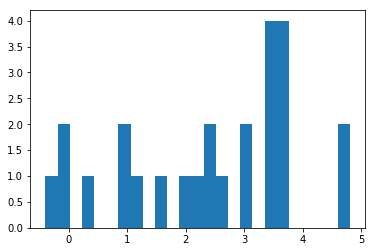

[ 2.38943768]
0.520487070084
Training epoch 23500
Iter: 23500
D loss: 2.89e-05
G_loss: -0.01282
()


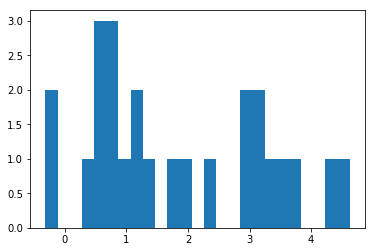

[ 1.8375833]
0.516608953476
Training epoch 23600
Iter: 23600
D loss: 3.26e-05
G_loss: -0.01201
()


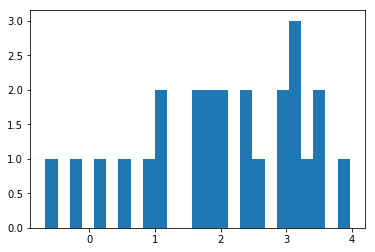

[ 2.04448435]
0.517400026321
Training epoch 23700
Iter: 23700
D loss: 2.825e-05
G_loss: -0.0133
()


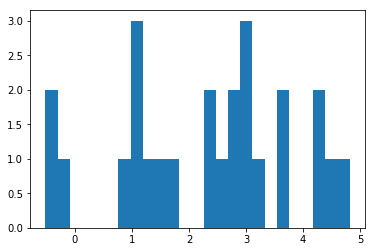

[ 2.33072482]
0.511227846146
Training epoch 23800
Iter: 23800
D loss: 3.033e-05
G_loss: -0.01318
()


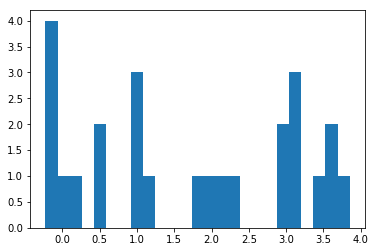

[ 1.68904139]
0.518229961395
Training epoch 23900
Iter: 23900
D loss: 2.487e-05
G_loss: -0.0134
()


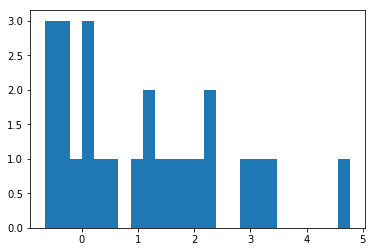

[ 1.10399883]
0.523321866989
Training epoch 24000
Iter: 24000
D loss: 3.349e-05
G_loss: -0.01212
()


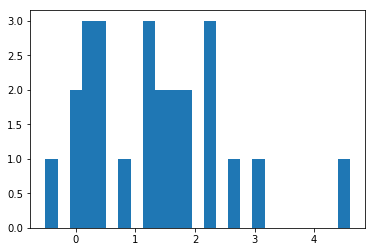

[ 1.31214872]
0.522634029388
Training epoch 24100
Iter: 24100
D loss: 2.9e-05
G_loss: -0.01318
()


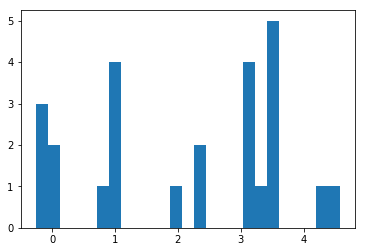

[ 2.14463087]
0.512771129608
Training epoch 24200
Iter: 24200
D loss: 3.725e-05
G_loss: -0.01178
()


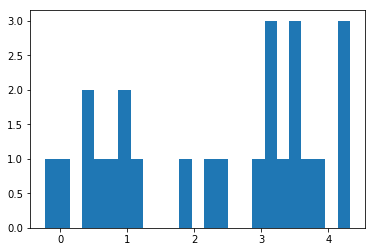

[ 2.32087668]
0.510725021362
Training epoch 24300
Iter: 24300
D loss: 2.788e-05
G_loss: -0.01333
()


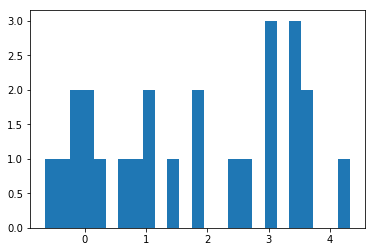

[ 1.75450677]
0.512412071228
Training epoch 24400
Iter: 24400
D loss: 3.208e-05
G_loss: -0.01132
()


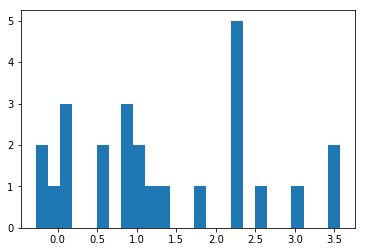

[ 1.3616735]
0.514109134674
Training epoch 24500
Iter: 24500
D loss: 3.096e-05
G_loss: -0.01319
()


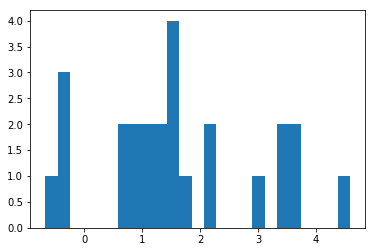

[ 1.61817523]
0.51980304718
Training epoch 24600
Iter: 24600
D loss: 2.687e-05
G_loss: -0.01331
()


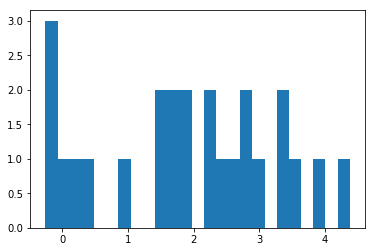

[ 1.92134636]
0.51541018486
Training epoch 24700
Iter: 24700
D loss: 3.273e-05
G_loss: -0.01334
()


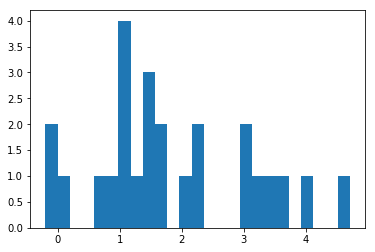

[ 1.84736963]
0.514427900314
Training epoch 24800
Iter: 24800
D loss: 2.694e-05
G_loss: -0.01289
()


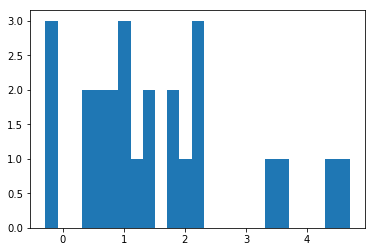

[ 1.54610441]
0.514019966125
Training epoch 24900
Iter: 24900
D loss: 3.6e-05
G_loss: -0.01404
()


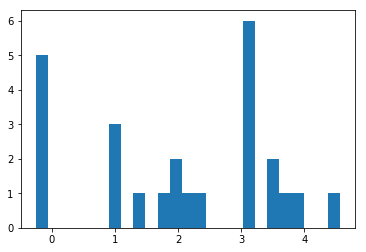

[ 2.06662823]
0.514266967773
Training epoch 25000
Iter: 25000
D loss: 3.226e-05
G_loss: -0.01312
()


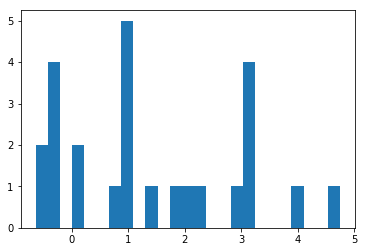

[ 1.4551351]
0.511354923248
Training epoch 25100
Iter: 25100
D loss: 2.403e-05
G_loss: -0.01331
()


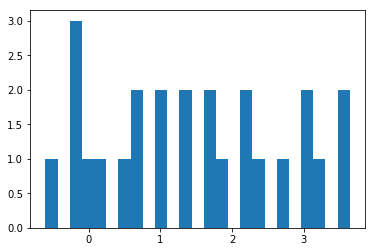

[ 1.46713457]
0.516101837158
Training epoch 25200
Iter: 25200
D loss: 3.809e-05
G_loss: -0.01316
()


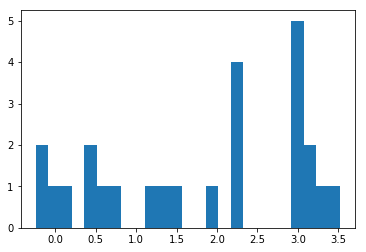

[ 1.80584756]
0.511351108551
Training epoch 25300
Iter: 25300
D loss: 2.929e-05
G_loss: -0.01287
()


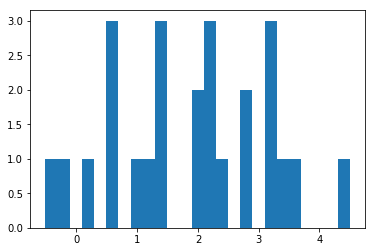

[ 1.87901955]
0.5133061409
Training epoch 25400
Iter: 25400
D loss: 2.919e-05
G_loss: -0.01306
()


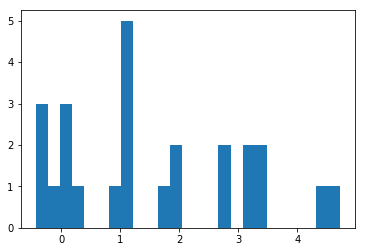

[ 1.5678971]
0.51358795166
Training epoch 25500
Iter: 25500
D loss: 3.329e-05
G_loss: -0.01395
()


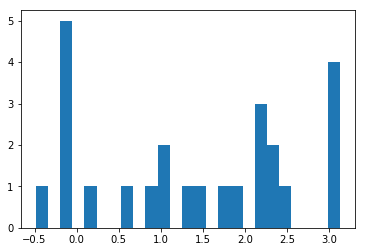

[ 1.39823725]
0.514000892639
Training epoch 25600
Iter: 25600
D loss: 4.149e-05
G_loss: -0.01312
()


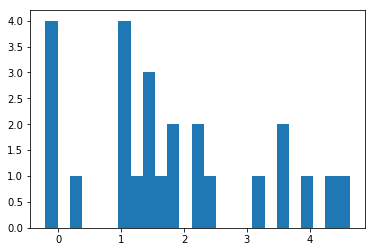

[ 1.8094635]
0.514991044998
Training epoch 25700
Iter: 25700
D loss: 4.594e-05
G_loss: -0.01327
()


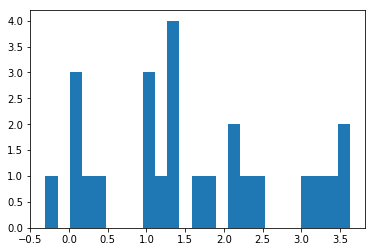

[ 1.57682384]
0.511291980743
Training epoch 25800
Iter: 25800
D loss: 3.557e-05
G_loss: -0.01162
()


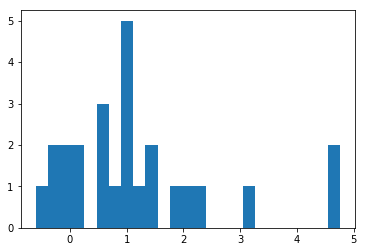

[ 1.18851213]
0.532589912415
Training epoch 25900
Iter: 25900
D loss: 3.718e-05
G_loss: -0.01276
()


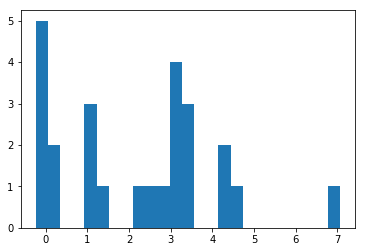

[ 2.17043134]
0.512168884277
Training epoch 26000
Iter: 26000
D loss: 3.745e-05
G_loss: -0.01275
()


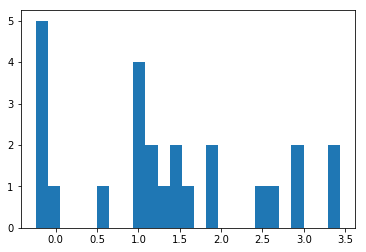

[ 1.32679278]
0.511330127716
Training epoch 26100
Iter: 26100
D loss: 2.391e-05
G_loss: -0.01326
()


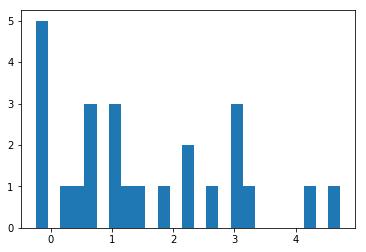

[ 1.51772235]
0.513112068176
Training epoch 26200
Iter: 26200
D loss: 3.677e-05
G_loss: -0.01237
()


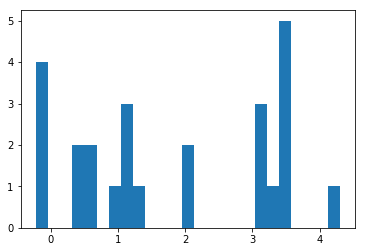

[ 1.81057125]
0.524109125137
Training epoch 26300
Iter: 26300
D loss: 2.664e-05
G_loss: -0.01213
()


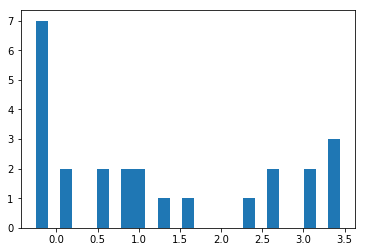

[ 1.2006]
0.522236824036
Training epoch 26400
Iter: 26400
D loss: 2.913e-05
G_loss: -0.01353
()


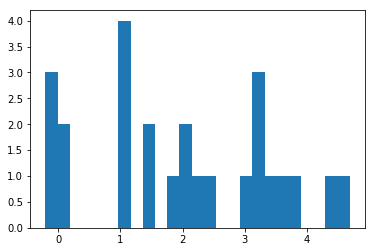

[ 2.00029427]
0.514332056046
Training epoch 26500
Iter: 26500
D loss: 3.199e-05
G_loss: -0.01241
()


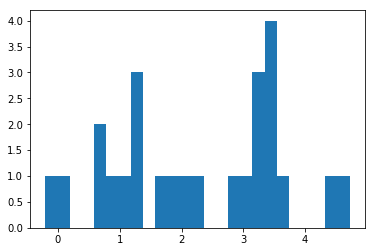

[ 2.29405362]
0.521939992905
Training epoch 26600
Iter: 26600
D loss: 3.254e-05
G_loss: -0.01223
()


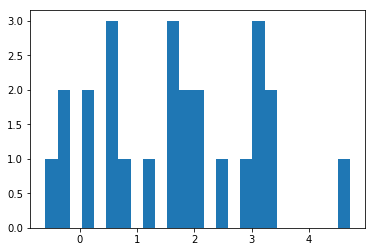

[ 1.69801312]
0.513276815414
Training epoch 26700
Iter: 26700
D loss: 3.291e-05
G_loss: -0.01318
()


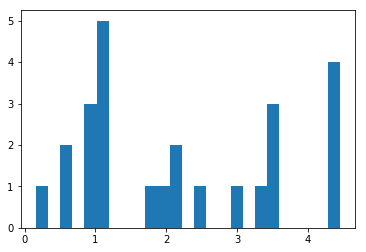

[ 2.18623105]
0.510558128357
Training epoch 26800
Iter: 26800
D loss: 3.34e-05
G_loss: -0.01338
()


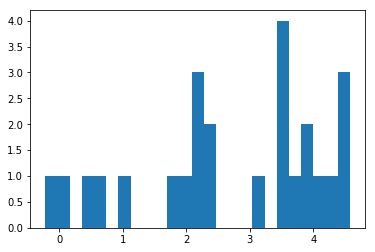

[ 2.69639357]
0.511247873306
Training epoch 26900
Iter: 26900
D loss: 3.554e-05
G_loss: -0.01297
()


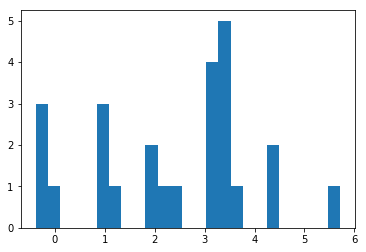

[ 2.37644899]
0.520374059677
Training epoch 27000
Iter: 27000
D loss: 3.855e-05
G_loss: -0.01308
()


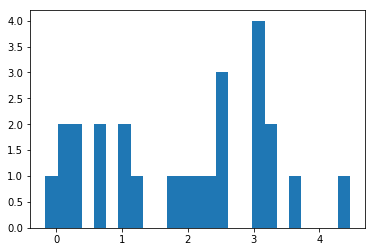

[ 1.93834125]
0.514604091644
Training epoch 27100
Iter: 27100
D loss: 2.639e-05
G_loss: -0.01321
()


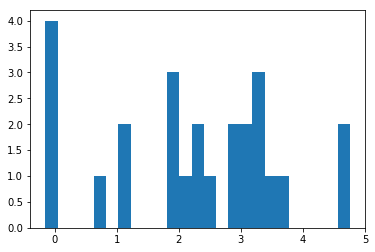

[ 2.25103841]
0.520285844803
Training epoch 27200
Iter: 27200
D loss: 3.486e-05
G_loss: -0.01322
()


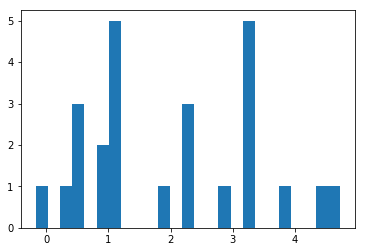

[ 1.99380832]
0.515649795532
Training epoch 27300
Iter: 27300
D loss: 2.941e-05
G_loss: -0.01263
()


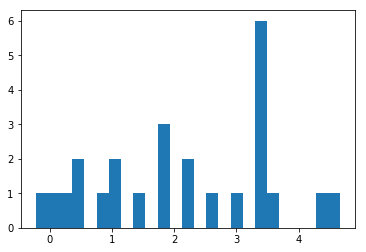

[ 2.14780294]
0.520473957062
Training epoch 27400
Iter: 27400
D loss: 3.232e-05
G_loss: -0.01322
()


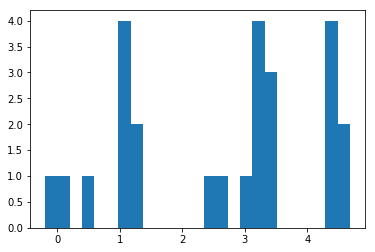

[ 2.60741939]
0.524971961975
Training epoch 27500
Iter: 27500
D loss: 2.736e-05
G_loss: -0.01333
()


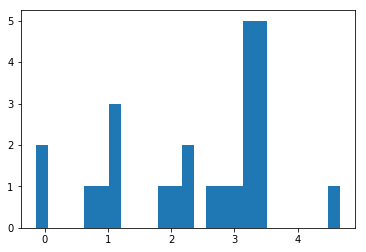

[ 2.37759584]
0.511131048203
Training epoch 27600
Iter: 27600
D loss: 3.139e-05
G_loss: -0.01281
()


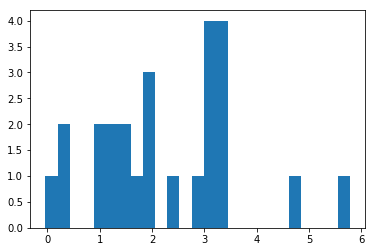

[ 2.27473861]
0.512676000595
Training epoch 27700
Iter: 27700
D loss: 3.821e-05
G_loss: -0.01154
()


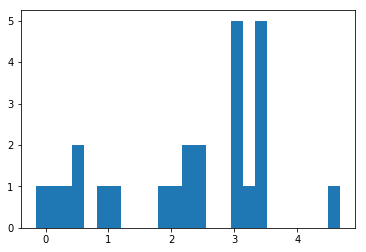

[ 2.26407661]
0.516047000885
Training epoch 27800
Iter: 27800
D loss: 3.327e-05
G_loss: -0.01284
()


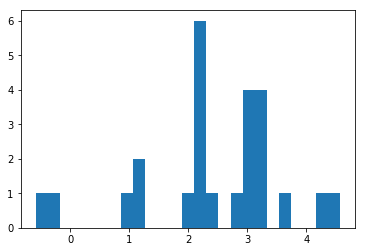

[ 2.4191202]
0.516582012177
Training epoch 27900
Iter: 27900
D loss: 3.535e-05
G_loss: -0.01204
()


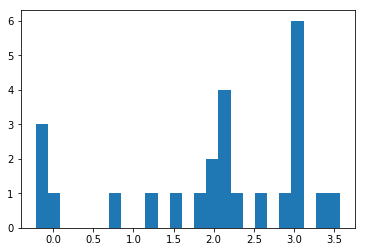

[ 2.00592209]
0.511121034622
Training epoch 28000
Iter: 28000
D loss: 3.793e-05
G_loss: -0.0117
()


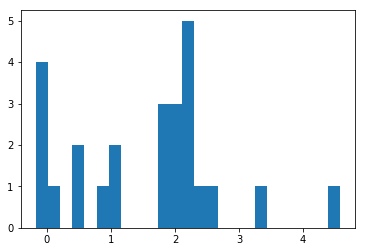

[ 1.55689797]
0.514518022537
Training epoch 28100
Iter: 28100
D loss: 2.779e-05
G_loss: -0.01339
()


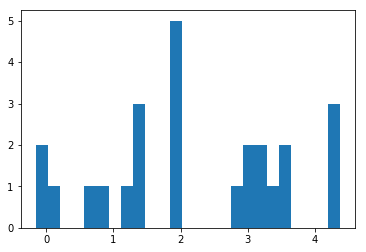

[ 2.21185973]
0.524411916733
Training epoch 28200
Iter: 28200
D loss: 3.82e-05
G_loss: -0.01312
()


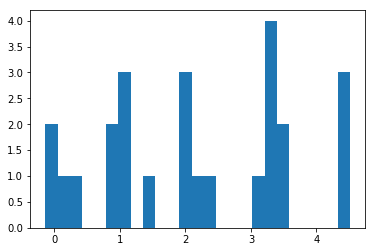

[ 2.13874872]
0.519140005112
Training epoch 28300
Iter: 28300
D loss: 2.933e-05
G_loss: -0.01347
()


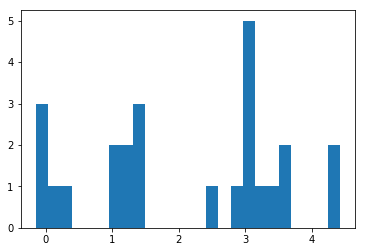

[ 2.09358241]
0.515731096268
Training epoch 28400
Iter: 28400
D loss: 3.851e-05
G_loss: -0.01349
()


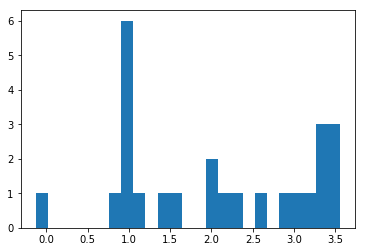

[ 2.0658838]
0.510973930359
Training epoch 28500
Iter: 28500
D loss: 2.717e-05
G_loss: -0.01325
()


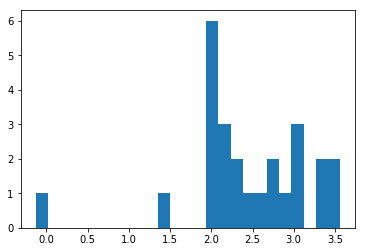

[ 2.43429888]
0.512480974197
Training epoch 28600
Iter: 28600
D loss: 2.764e-05
G_loss: -0.01324
()


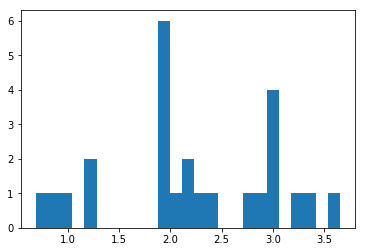

[ 2.237973]
0.51326584816
Training epoch 28700
Iter: 28700
D loss: 2.495e-05
G_loss: -0.01323
()


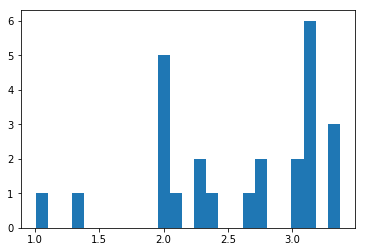

[ 2.57500381]
0.518870830536
Training epoch 28800
Iter: 28800
D loss: 2.833e-05
G_loss: -0.01322
()


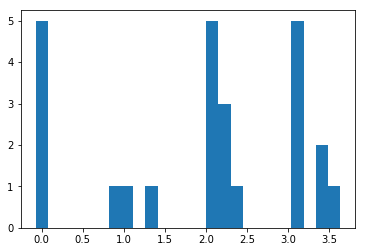

[ 1.93273481]
0.51161813736
Training epoch 28900
Iter: 28900
D loss: 2.804e-05
G_loss: -0.01252
()


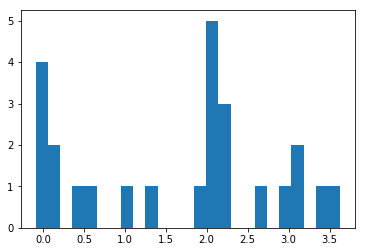

[ 1.6452164]
0.522570848465
Training epoch 29000
Iter: 29000
D loss: 2.971e-05
G_loss: -0.01344
()


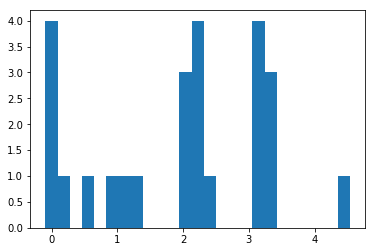

[ 1.93685374]
0.512934923172
Training epoch 29100
Iter: 29100
D loss: 2.739e-05
G_loss: -0.01156
()


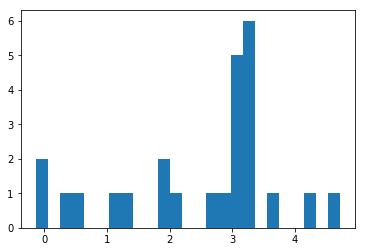

[ 2.49142583]
0.512635946274
Training epoch 29200
Iter: 29200
D loss: 3.328e-05
G_loss: -0.01342
()


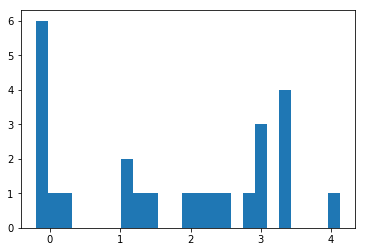

[ 1.70588352]
0.511142969131
Training epoch 29300
Iter: 29300
D loss: 2.894e-05
G_loss: -0.0123
()


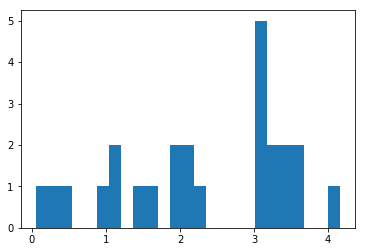

[ 2.29639965]
0.51239991188
Training epoch 29400
Iter: 29400
D loss: 3.178e-05
G_loss: -0.01285
()


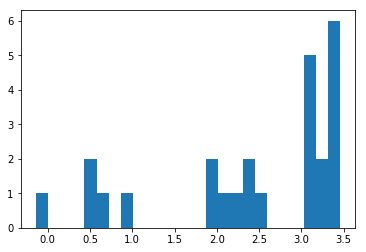

[ 2.40293146]
0.512944936752
Training epoch 29500
Iter: 29500
D loss: 3.498e-05
G_loss: -0.01336
()


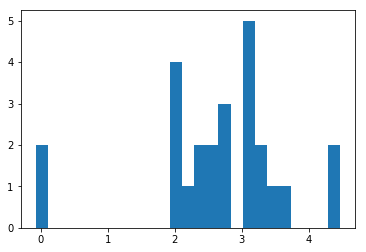

[ 2.66128505]
0.520764112473
Training epoch 29600
Iter: 29600
D loss: 2.661e-05
G_loss: -0.0132
()


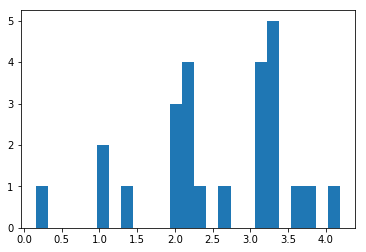

[ 2.5696984]
0.51166009903
Training epoch 29700
Iter: 29700
D loss: 3.033e-05
G_loss: -0.01411
()


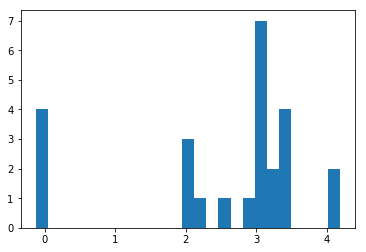

[ 2.51351422]
0.521772861481
Training epoch 29800
Iter: 29800
D loss: 2.684e-05
G_loss: -0.01293
()


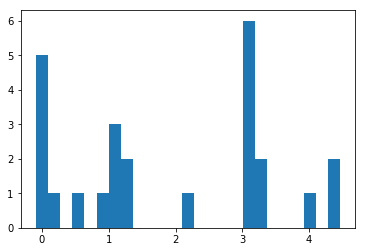

[ 1.88400956]
0.514089822769
Training epoch 29900
Iter: 29900
D loss: 2.371e-05
G_loss: -0.01136
()


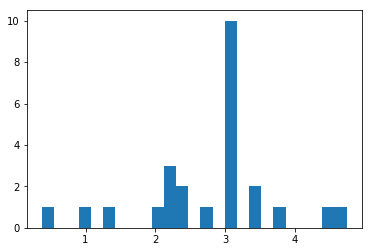

[ 2.78545665]
0.514913082123
Training epoch 30000
Iter: 30000
D loss: 3.009e-05
G_loss: -0.01332
()


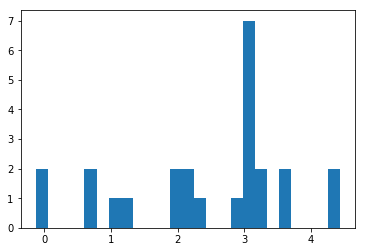

[ 2.44218155]
0.54674911499
Training epoch 30100
Iter: 30100
D loss: 3.17e-05
G_loss: -0.0133
()


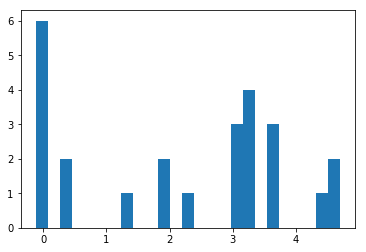

[ 2.19378909]
0.629788160324
Training epoch 30200
Iter: 30200
D loss: 3.501e-05
G_loss: -0.01266
()


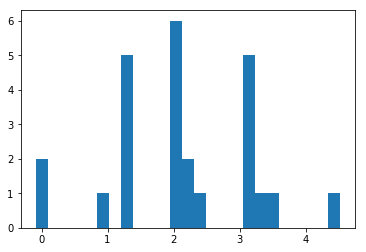

[ 2.12066602]
0.608049154282
Training epoch 30300
Iter: 30300
D loss: 3.835e-05
G_loss: -0.01311
()


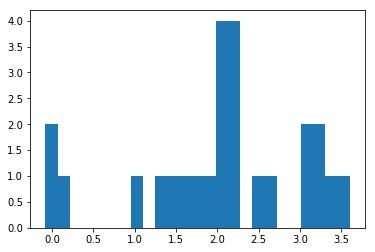

[ 2.03373824]
0.51647400856
Training epoch 30400
Iter: 30400
D loss: 3.314e-05
G_loss: -0.01319
()


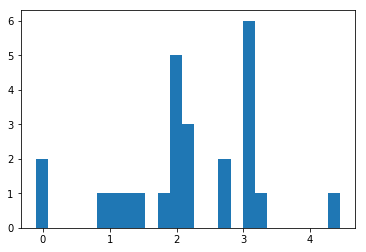

[ 2.17879657]
0.585242033005
Training epoch 30500
Iter: 30500
D loss: 3.686e-05
G_loss: -0.01104
()


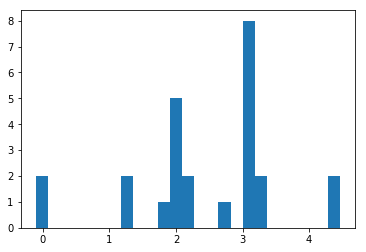

[ 2.4708084]
0.516998052597
Training epoch 30600
Iter: 30600
D loss: 2.548e-05
G_loss: -0.01392
()


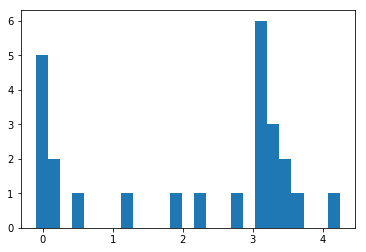

[ 2.0758076]
0.534836053848
Training epoch 30700
Iter: 30700
D loss: 4.385e-05
G_loss: -0.01148
()


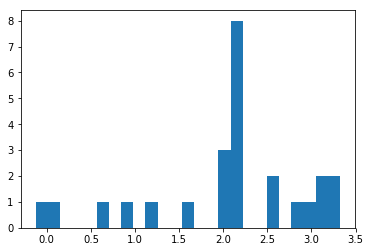

[ 2.05332718]
0.514385938644
Training epoch 30800
Iter: 30800
D loss: 2.571e-05
G_loss: -0.01377
()


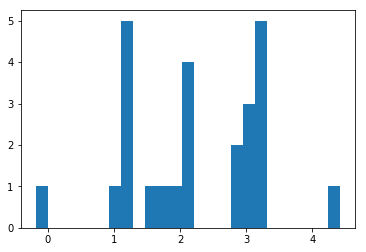

[ 2.23119951]
0.512634992599
Training epoch 30900
Iter: 30900
D loss: 3.316e-05
G_loss: -0.01321
()


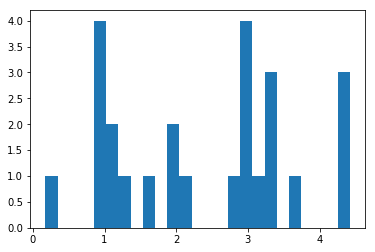

[ 2.38986387]
0.516088962555
Training epoch 31000
Iter: 31000
D loss: 3.65e-05
G_loss: -0.01339
()


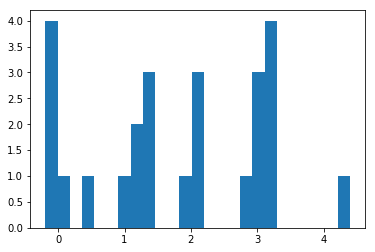

[ 1.78701595]
0.513601064682
Training epoch 31100
Iter: 31100
D loss: 3.026e-05
G_loss: -0.01325
()


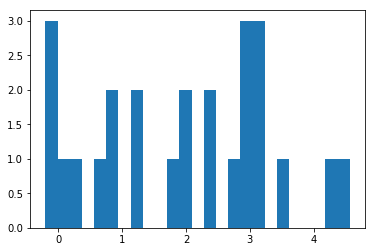

[ 1.95249794]
0.511445999146
Training epoch 31200
Iter: 31200
D loss: 3.18e-05
G_loss: -0.01323
()


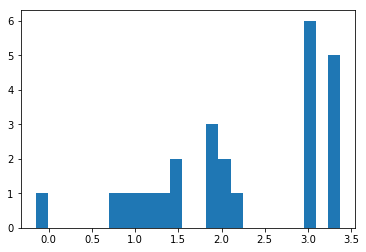

[ 2.19552271]
0.516550064087
Training epoch 31300
Iter: 31300
D loss: 3.415e-05
G_loss: -0.01328
()


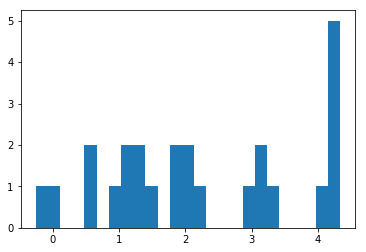

[ 2.26671844]
0.513160943985
Training epoch 31400
Iter: 31400
D loss: 3.34e-05
G_loss: -0.0135
()


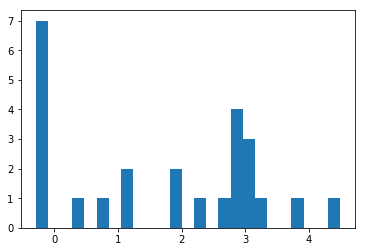

[ 1.69612027]
0.51470708847
Training epoch 31500
Iter: 31500
D loss: 4.167e-05
G_loss: -0.01392
()


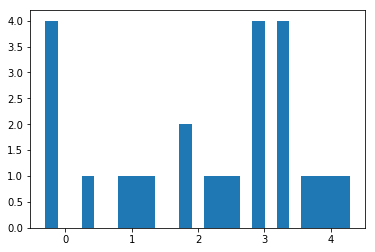

[ 2.15841248]
0.516754865646
Training epoch 31600
Iter: 31600
D loss: 2.217e-05
G_loss: -0.01333
()


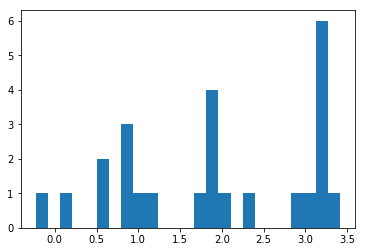

[ 1.93190477]
0.517287969589
Training epoch 31700
Iter: 31700
D loss: 3.748e-05
G_loss: -0.01213
()


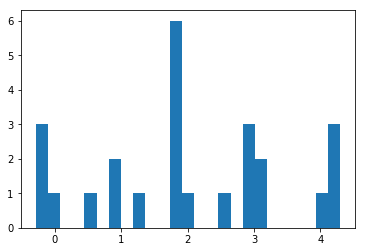

[ 2.00173861]
0.575133085251
Training epoch 31800
Iter: 31800
D loss: 3.571e-05
G_loss: -0.01264
()


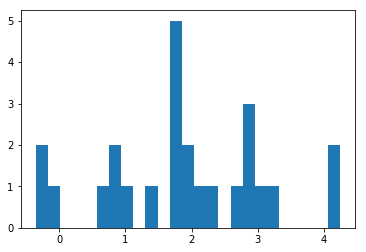

[ 1.88790554]
0.767830133438
Training epoch 31900
Iter: 31900
D loss: 3.179e-05
G_loss: -0.01347
()


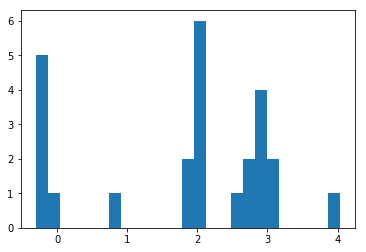

[ 1.79069403]
0.558451890945
Training epoch 32000
Iter: 32000
D loss: 3.443e-05
G_loss: -0.01315
()


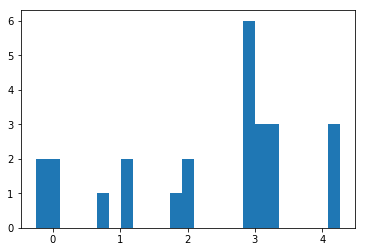

[ 2.31973882]
0.658509016037
Training epoch 32100
Iter: 32100
D loss: 3.202e-05
G_loss: -0.01179
()


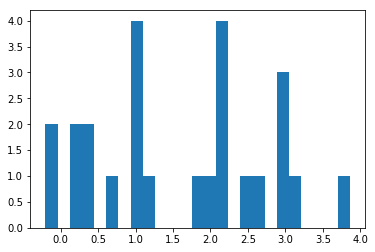

[ 1.57744275]
0.524569034576
Training epoch 32200
Iter: 32200
D loss: 2.666e-05
G_loss: -0.0134
()


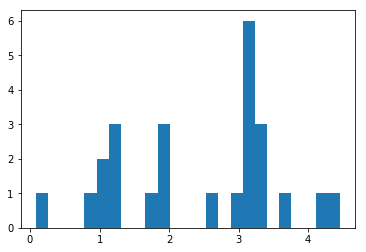

[ 2.44228683]
0.519804954529
Training epoch 32300
Iter: 32300
D loss: 3.929e-05
G_loss: -0.01286
()


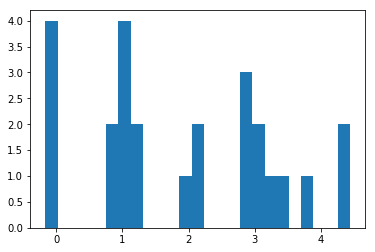

[ 1.92620496]
0.534055948257
Training epoch 32400
Iter: 32400
D loss: 2.64e-05
G_loss: -0.01336
()


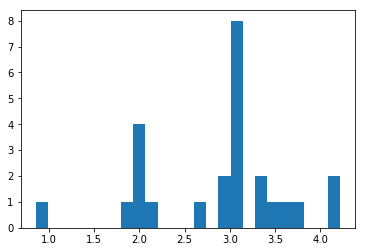

[ 2.87627478]
0.538496017456
Training epoch 32500
Iter: 32500
D loss: 3.284e-05
G_loss: -0.01332
()


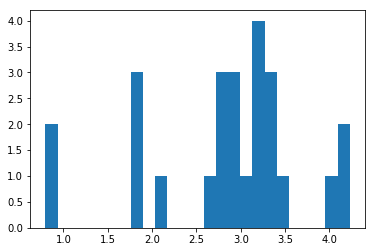

[ 2.82408697]
0.530652999878
Training epoch 32600
Iter: 32600
D loss: 3.699e-05
G_loss: -0.01269
()


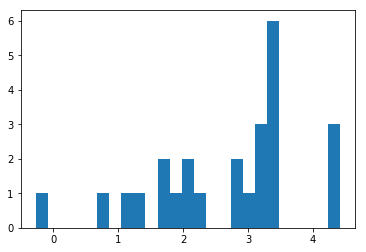

[ 2.65534261]
0.518372058868
Training epoch 32700
Iter: 32700
D loss: 2.948e-05
G_loss: -0.0133
()


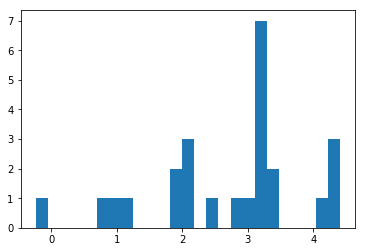

[ 2.67059899]
0.514078855515
Training epoch 32800
Iter: 32800
D loss: 2.896e-05
G_loss: -0.01325
()


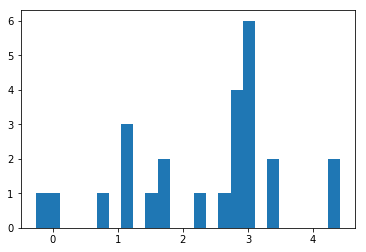

[ 2.36551802]
0.51559305191
Training epoch 32900
Iter: 32900
D loss: 3.627e-05
G_loss: -0.01255
()


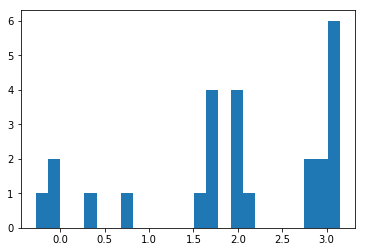

[ 1.95702414]
0.515793085098
Training epoch 33000
Iter: 33000
D loss: 3.809e-05
G_loss: -0.01276
()


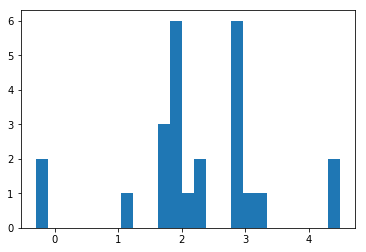

[ 2.27681442]
0.515753984451
Training epoch 33100
Iter: 33100
D loss: 3.236e-05
G_loss: -0.01327
()


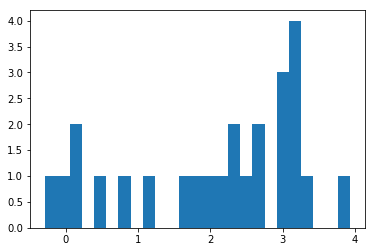

[ 2.02809744]
0.513180017471
Training epoch 33200
Iter: 33200
D loss: 2.911e-05
G_loss: -0.0133
()


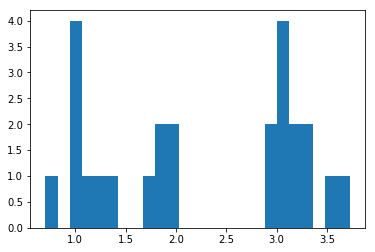

[ 2.24332932]
0.513436079025
Training epoch 33300
Iter: 33300
D loss: 2.707e-05
G_loss: -0.0128
()


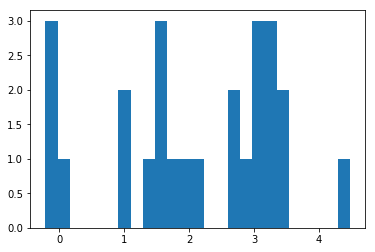

[ 2.07321013]
0.513245105743
Training epoch 33400
Iter: 33400
D loss: 2.39e-05
G_loss: -0.01339
()


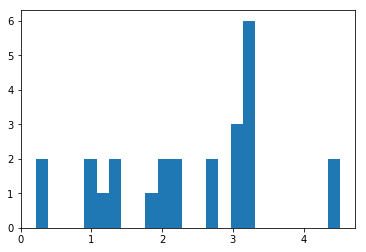

[ 2.3837832]
0.511368989944
Training epoch 33500
Iter: 33500
D loss: 2.443e-05
G_loss: -0.01338
()


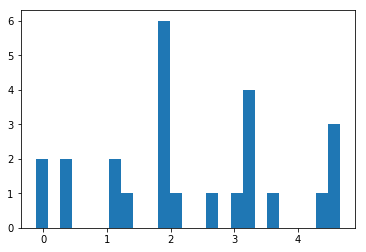

[ 2.30403349]
0.512241125107
Training epoch 33600
Iter: 33600
D loss: 2.973e-05
G_loss: -0.01244
()


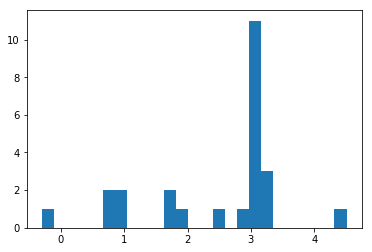

[ 2.47254142]
0.510946989059
Training epoch 33700
Iter: 33700
D loss: 3.122e-05
G_loss: -0.0134
()


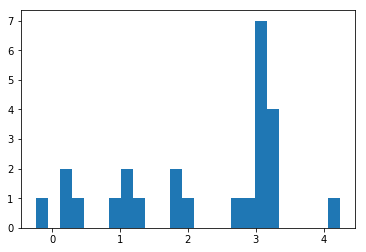

[ 2.21453517]
0.512117862701
Training epoch 33800
Iter: 33800
D loss: 3.541e-05
G_loss: -0.0124
()


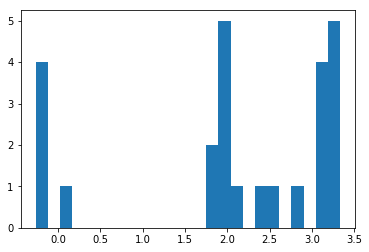

[ 2.02520511]
0.51159787178
Training epoch 33900
Iter: 33900
D loss: 3.036e-05
G_loss: -0.01281
()


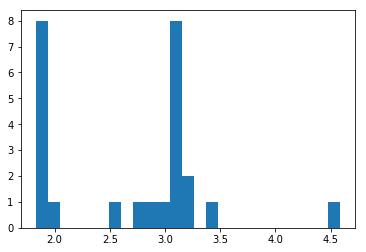

[ 2.68585321]
0.514708995819
Training epoch 34000
Iter: 34000
D loss: 3.661e-05
G_loss: -0.01344
()


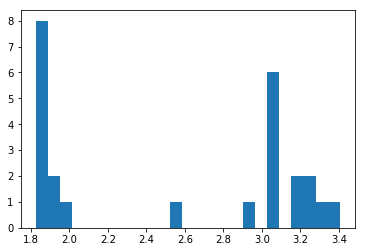

[ 2.55756994]
0.513520956039
Training epoch 34100
Iter: 34100
D loss: 4.154e-05
G_loss: -0.012
()


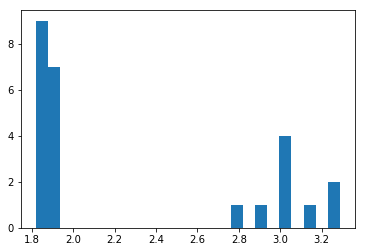

[ 2.29400779]
0.512130022049
Training epoch 34200
Iter: 34200
D loss: 3.501e-05
G_loss: -0.01301
()


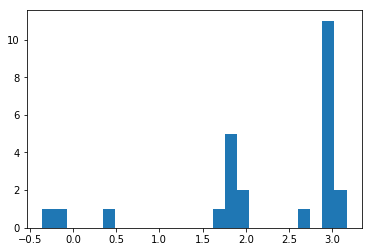

[ 2.26226594]
0.515148162842
Training epoch 34300
Iter: 34300
D loss: 2.832e-05
G_loss: -0.01345
()


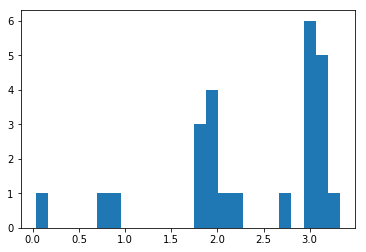

[ 2.37240921]
0.521548032761
Training epoch 34400
Iter: 34400
D loss: 2.51e-05
G_loss: -0.01359
()


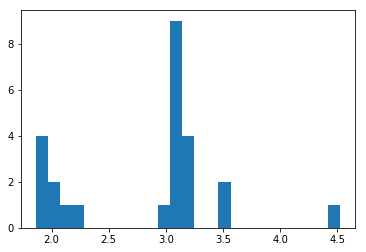

[ 2.83342271]
0.521234989166
Training epoch 34500
Iter: 34500
D loss: 3.831e-05
G_loss: -0.01192
()


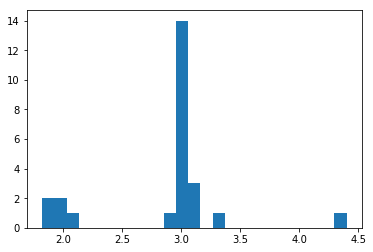

[ 2.87045155]
0.523609161377
Training epoch 34600
Iter: 34600
D loss: 3.65e-05
G_loss: -0.01261
()


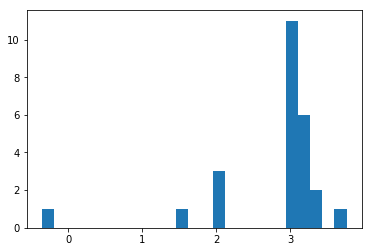

[ 2.77337872]
0.519327163696
Training epoch 34700
Iter: 34700
D loss: 3.456e-05
G_loss: -0.01282
()


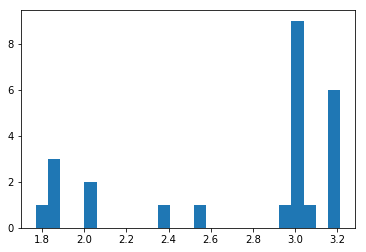

[ 2.74636879]
0.522938013077
Training epoch 34800
Iter: 34800
D loss: 3.622e-05
G_loss: -0.01321
()


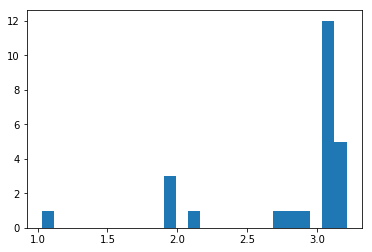

[ 2.80777133]
0.517286062241
Training epoch 34900
Iter: 34900
D loss: 3.206e-05
G_loss: -0.01338
()


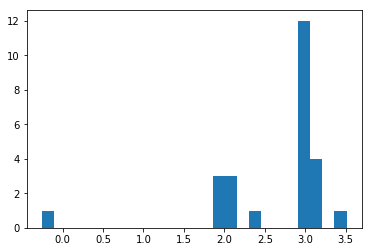

[ 2.64657358]
0.515328168869
Training epoch 35000
Iter: 35000
D loss: 3.337e-05
G_loss: -0.01318
()


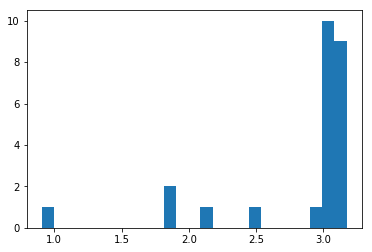

[ 2.83932242]
0.514200925827
Training epoch 35100
Iter: 35100
D loss: 3.15e-05
G_loss: -0.01195
()


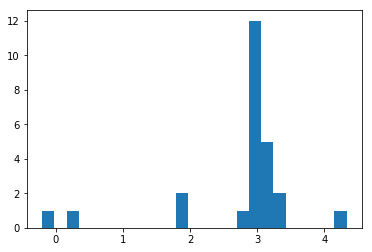

[ 2.75043884]
0.514169931412
Training epoch 35200
Iter: 35200
D loss: 4.085e-05
G_loss: -0.01323
()


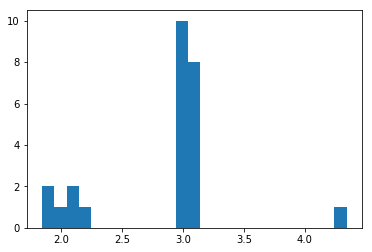

[ 2.8403004]
0.523651123047
Training epoch 35300
Iter: 35300
D loss: 2.963e-05
G_loss: -0.01332
()


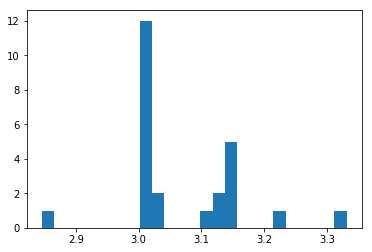

[ 3.07006046]
0.513646125793
Training epoch 35400
Iter: 35400
D loss: 3.525e-05
G_loss: -0.01334
()


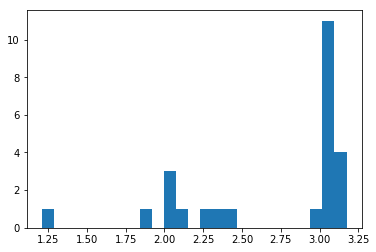

[ 2.69066423]
0.603638887405
Training epoch 35500
Iter: 35500
D loss: 3.661e-05
G_loss: -0.01275
()


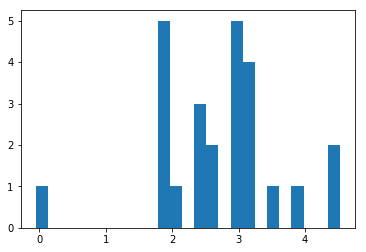

[ 2.70322629]
0.512107133865
Training epoch 35600
Iter: 35600
D loss: 2.604e-05
G_loss: -0.01281
()


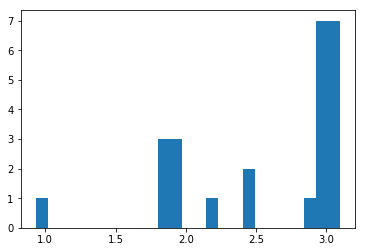

[ 2.58170868]
0.51326084137
Training epoch 35700
Iter: 35700
D loss: 3.179e-05
G_loss: -0.014
()


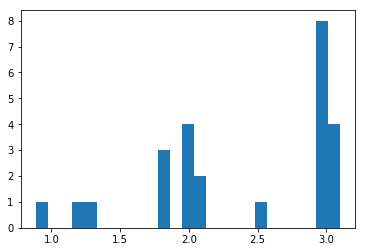

[ 2.36422853]
0.513705015182
Training epoch 35800
Iter: 35800
D loss: 2.893e-05
G_loss: -0.01286
()


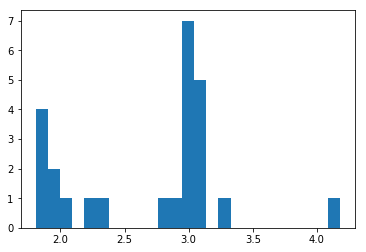

[ 2.68550675]
0.516806125641
Training epoch 35900
Iter: 35900
D loss: 3.519e-05
G_loss: -0.01338
()


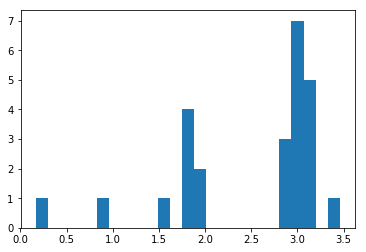

[ 2.49727808]
0.515812158585
Training epoch 36000
Iter: 36000
D loss: 3.221e-05
G_loss: -0.01285
()


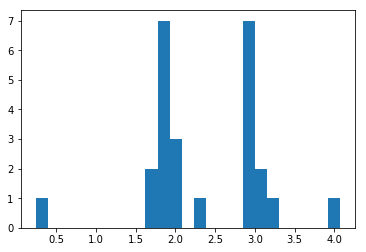

[ 2.3457831]
0.516760826111
Training epoch 36100
Iter: 36100
D loss: 2.796e-05
G_loss: -0.01334
()


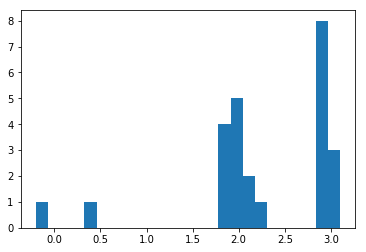

[ 2.27827404]
0.512145996094
Training epoch 36200
Iter: 36200
D loss: 3.284e-05
G_loss: -0.01195
()


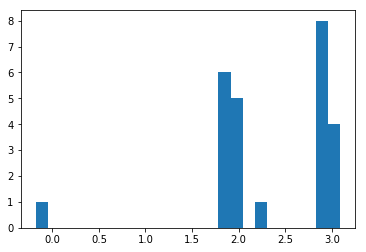

[ 2.33801925]
0.511252164841
Training epoch 36300
Iter: 36300
D loss: 2.723e-05
G_loss: -0.01329
()


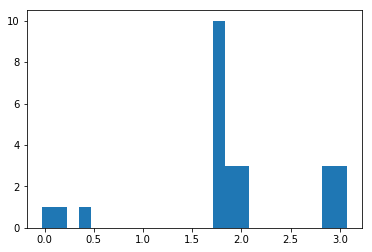

[ 1.9294358]
0.512310028076
Training epoch 36400
Iter: 36400
D loss: 3.478e-05
G_loss: -0.01404
()


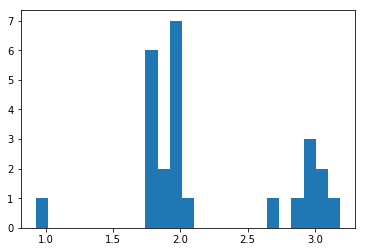

[ 2.21192579]
0.511042833328
Training epoch 36500
Iter: 36500
D loss: 3.432e-05
G_loss: -0.01352
()


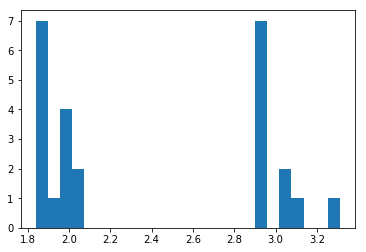

[ 2.40098409]
0.512856006622
Training epoch 36600
Iter: 36600
D loss: 2.823e-05
G_loss: -0.01339
()


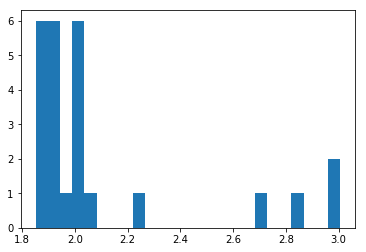

[ 2.11524136]
0.518709182739
Training epoch 36700
Iter: 36700
D loss: 2.28e-05
G_loss: -0.0134
()


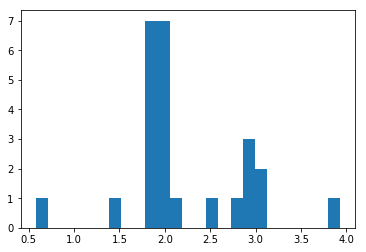

[ 2.2277264]
0.513845205307
Training epoch 36800
Iter: 36800
D loss: 4.204e-05
G_loss: -0.01336
()


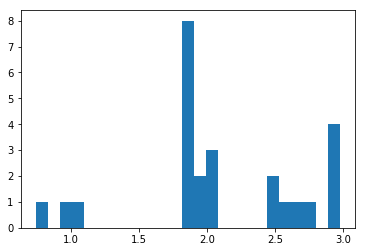

[ 2.10306043]
0.568238973618
Training epoch 36900
Iter: 36900
D loss: 3.845e-05
G_loss: -0.01239
()


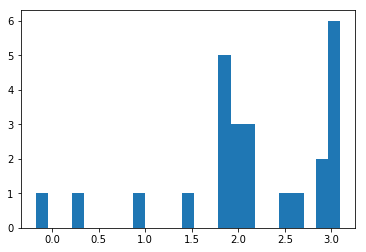

[ 2.14396293]
0.512473106384
Training epoch 37000
Iter: 37000
D loss: 4.223e-05
G_loss: -0.01269
()


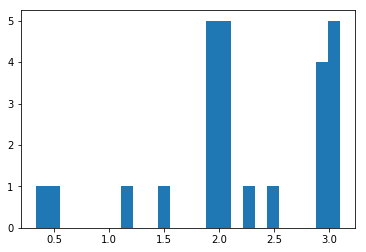

[ 2.20878084]
0.513746023178
Training epoch 37100
Iter: 37100
D loss: 4.008e-05
G_loss: -0.01298
()


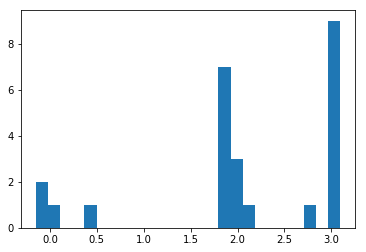

[ 2.06783715]
0.511062860489
Training epoch 37200
Iter: 37200
D loss: 3.297e-05
G_loss: -0.01312
()


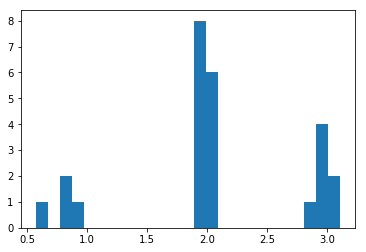

[ 2.07775114]
0.51815199852
Training epoch 37300
Iter: 37300
D loss: 2.934e-05
G_loss: -0.01267
()


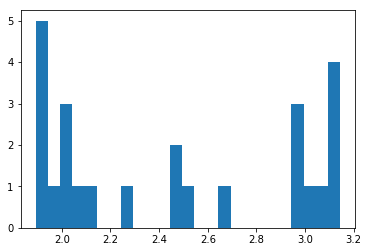

[ 2.46862722]
0.515508890152
Training epoch 37400
Iter: 37400
D loss: 4.105e-05
G_loss: -0.01332
()


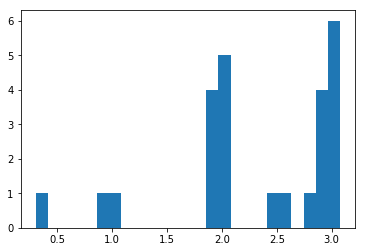

[ 2.31705145]
0.519052028656
Training epoch 37500
Iter: 37500
D loss: 3.107e-05
G_loss: -0.01225
()


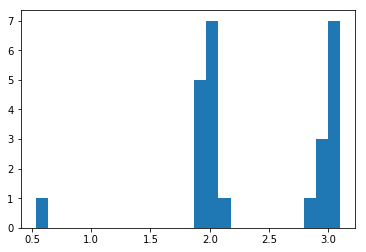

[ 2.39144483]
0.512530088425
Training epoch 37600
Iter: 37600
D loss: 3.543e-05
G_loss: -0.01326
()


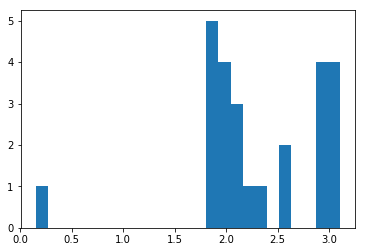

[ 2.31129405]
0.515730857849
Training epoch 37700
Iter: 37700
D loss: 2.938e-05
G_loss: -0.01341
()


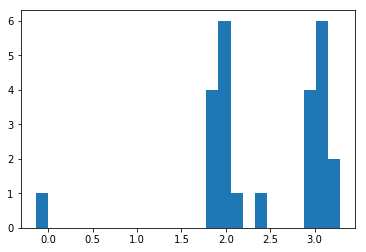

[ 2.44540292]
0.511826038361
Training epoch 37800
Iter: 37800
D loss: 3.776e-05
G_loss: -0.01297
()


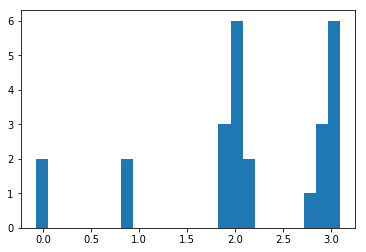

[ 2.15032331]
0.513271093369
Training epoch 37900
Iter: 37900
D loss: 2.943e-05
G_loss: -0.01336
()


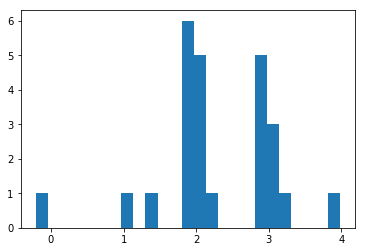

[ 2.25020105]
0.51261806488
Training epoch 38000
Iter: 38000
D loss: 3.746e-05
G_loss: -0.01128
()


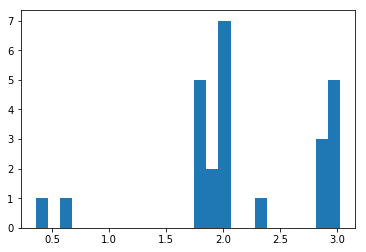

[ 2.154292]
0.511215925217
Training epoch 38100
Iter: 38100
D loss: 3.598e-05
G_loss: -0.01334
()


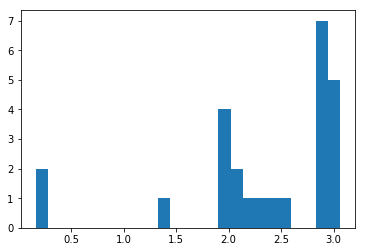

[ 2.35455636]
0.510793924332
Training epoch 38200
Iter: 38200
D loss: 3.127e-05
G_loss: -0.01351
()


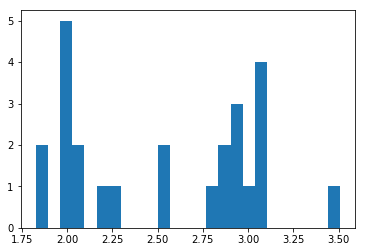

[ 2.53237842]
0.513053894043
Training epoch 38300
Iter: 38300
D loss: 3.254e-05
G_loss: -0.01219
()


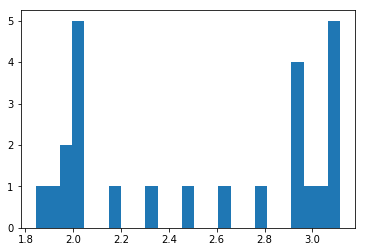

[ 2.53318945]
0.512460947037
Training epoch 38400
Iter: 38400
D loss: 3.004e-05
G_loss: -0.01292
()


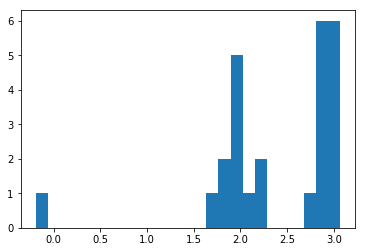

[ 2.39478002]
0.515567064285
Training epoch 38500
Iter: 38500
D loss: 2.62e-05
G_loss: -0.01223
()


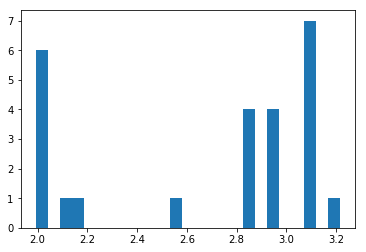

[ 2.67912497]
0.517942905426
Training epoch 38600
Iter: 38600
D loss: 2.862e-05
G_loss: -0.01224
()


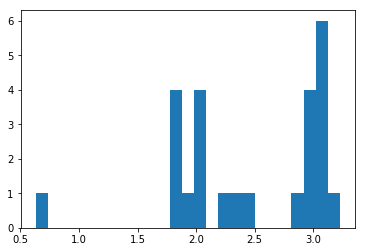

[ 2.46036661]
0.515177965164
Training epoch 38700
Iter: 38700
D loss: 3.607e-05
G_loss: -0.01303
()


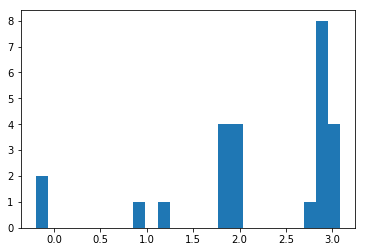

[ 2.21185743]
0.512958049774
Training epoch 38800
Iter: 38800
D loss: 2.93e-05
G_loss: -0.01215
()


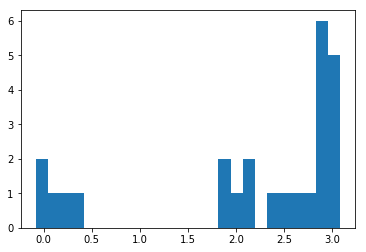

[ 2.14449336]
0.513377904892
Training epoch 38900
Iter: 38900
D loss: 2.975e-05
G_loss: -0.01324
()


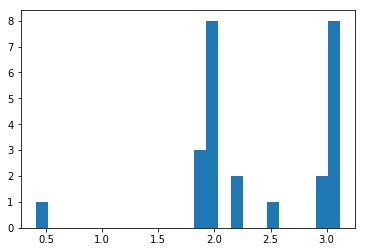

[ 2.3694703]
0.51496386528
Training epoch 39000
Iter: 39000
D loss: 2.772e-05
G_loss: -0.01294
()


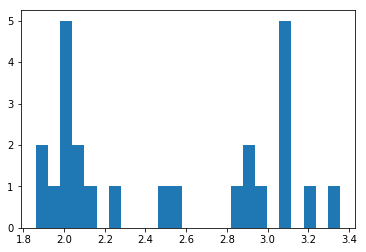

[ 2.51965146]
0.515176057816
Training epoch 39100
Iter: 39100
D loss: 3.517e-05
G_loss: -0.00977
()


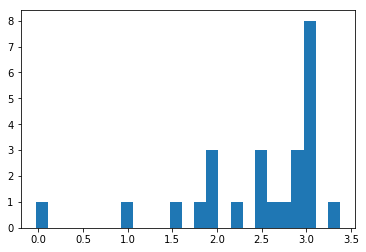

[ 2.49485435]
0.590273141861
Training epoch 39200
Iter: 39200
D loss: 2.655e-05
G_loss: -0.01214
()


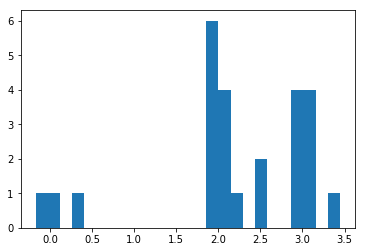

[ 2.19888425]
0.523755073547
Training epoch 39300
Iter: 39300
D loss: 3.499e-05
G_loss: -0.01065
()


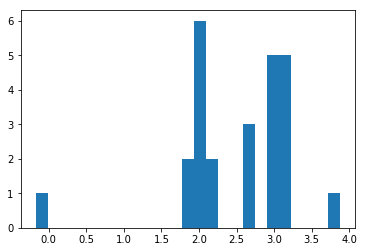

[ 2.50671786]
0.511497020721
Training epoch 39400
Iter: 39400
D loss: 4.133e-05
G_loss: -0.0118
()


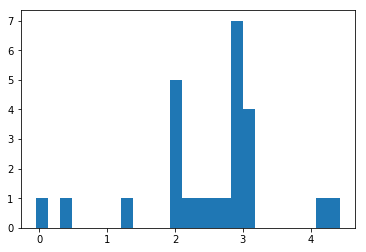

[ 2.53092732]
0.514391899109
Training epoch 39500
Iter: 39500
D loss: 3.431e-05
G_loss: -0.01326
()


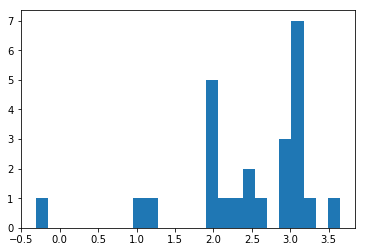

[ 2.45923655]
0.511667966843
Training epoch 39600
Iter: 39600
D loss: 3.175e-05
G_loss: -0.01258
()


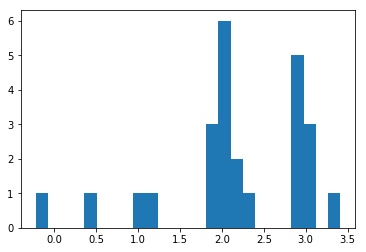

[ 2.1593154]
0.511023044586
Training epoch 39700
Iter: 39700
D loss: 3.615e-05
G_loss: -0.01314
()


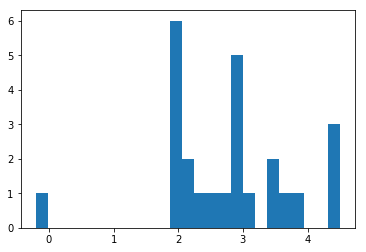

[ 2.75682079]
0.513746976852
Training epoch 39800
Iter: 39800
D loss: 4.024e-05
G_loss: -0.01269
()


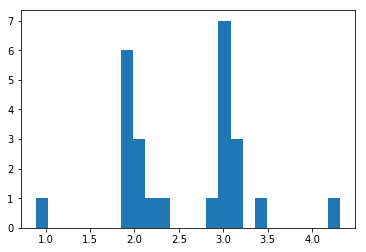

[ 2.54910797]
0.514793872833
Training epoch 39900
Iter: 39900
D loss: 3.219e-05
G_loss: -0.01249
()


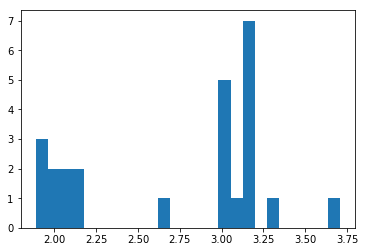

[ 2.7136791]
0.519374847412
Training epoch 40000
Iter: 40000
D loss: 3.489e-05
G_loss: -0.01225
()


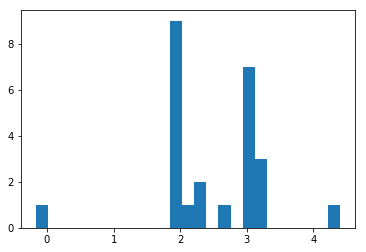

[ 2.47181076]
0.524402141571
Training epoch 40100
Iter: 40100
D loss: 3.387e-05
G_loss: -0.01389
()


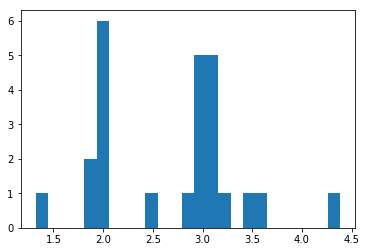

[ 2.71475699]
0.513507127762
Training epoch 40200
Iter: 40200
D loss: 3.76e-05
G_loss: -0.01259
()


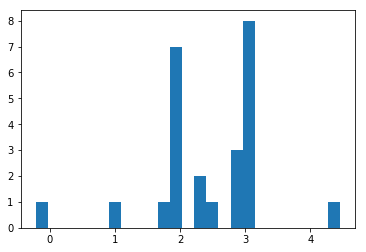

[ 2.42000608]
0.513866901398
Training epoch 40300
Iter: 40300
D loss: 3.644e-05
G_loss: -0.01278
()


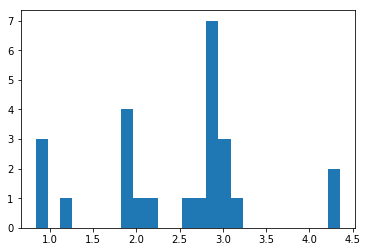

[ 2.50451455]
0.512135028839
Training epoch 40400
Iter: 40400
D loss: 3.129e-05
G_loss: -0.01329
()


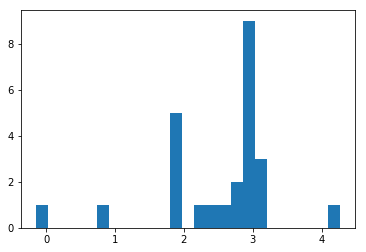

[ 2.5188568]
0.518084049225
Training epoch 40500
Iter: 40500
D loss: 2.586e-05
G_loss: -0.01315
()


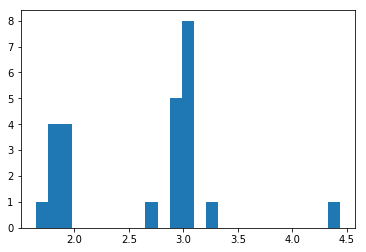

[ 2.6515263]
0.523382902145
Training epoch 40600
Iter: 40600
D loss: 2.803e-05
G_loss: -0.01339
()


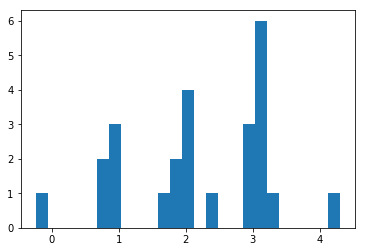

[ 2.18783005]
0.512156009674
Training epoch 40700
Iter: 40700
D loss: 2.567e-05
G_loss: -0.01363
()


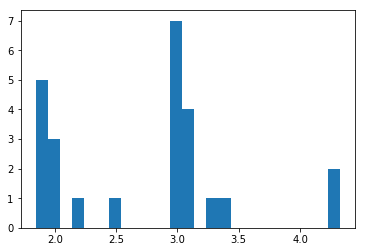

[ 2.72754992]
0.512863874435
Training epoch 40800
Iter: 40800
D loss: 3.45e-05
G_loss: -0.01332
()


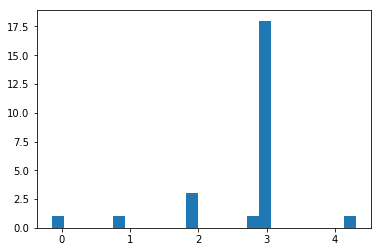

[ 2.7114752]
0.512763977051
Training epoch 40900
Iter: 40900
D loss: 2.671e-05
G_loss: -0.01263
()


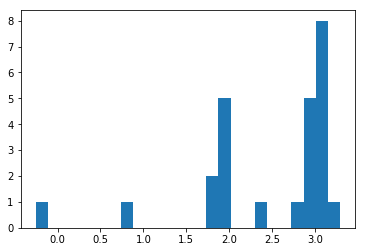

[ 2.46388687]
0.513916969299
Training epoch 41000
Iter: 41000
D loss: 2.6e-05
G_loss: -0.0134
()


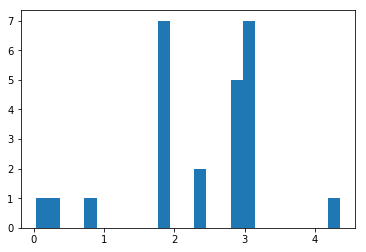

[ 2.37134299]
0.5151720047
Training epoch 41100
Iter: 41100
D loss: 2.875e-05
G_loss: -0.0135
()


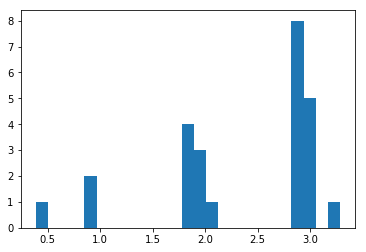

[ 2.36056282]
0.516201972961
Training epoch 41200
Iter: 41200
D loss: 2.872e-05
G_loss: -0.01325
()


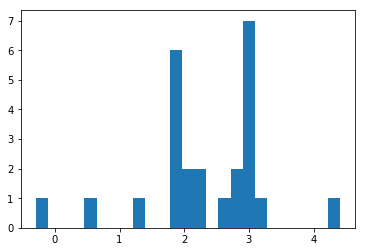

[ 2.31762615]
0.517525196075
Training epoch 41300
Iter: 41300
D loss: 2.409e-05
G_loss: -0.013
()


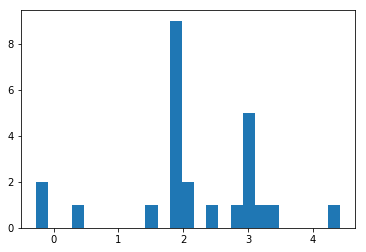

[ 2.15433033]
0.51137804985
Training epoch 41400
Iter: 41400
D loss: 3.303e-05
G_loss: -0.01296
()


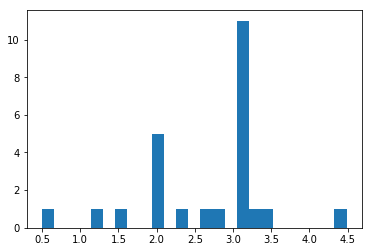

[ 2.67113284]
0.517103910446
Training epoch 41500
Iter: 41500
D loss: 3.443e-05
G_loss: -0.0128
()


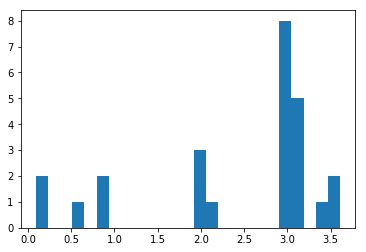

[ 2.43202109]
0.511541843414
Training epoch 41600
Iter: 41600
D loss: 3.69e-05
G_loss: -0.01318
()


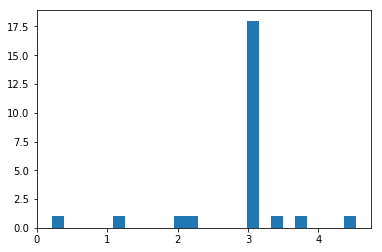

[ 2.88965099]
0.517973899841
Training epoch 41700
Iter: 41700
D loss: 3.326e-05
G_loss: -0.01242
()


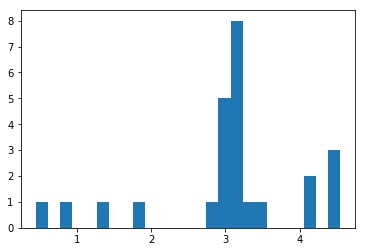

[ 3.04267178]
0.518119096756
Training epoch 41800
Iter: 41800
D loss: 2.951e-05
G_loss: -0.01328
()


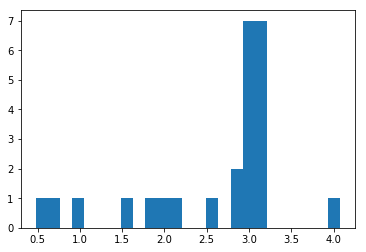

[ 2.59315178]
0.51527094841
Training epoch 41900
Iter: 41900
D loss: 2.77e-05
G_loss: -0.01252
()


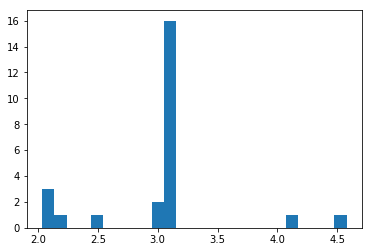

[ 3.01331787]
0.511317968369
Training epoch 42000
Iter: 42000
D loss: 2.962e-05
G_loss: -0.01331
()


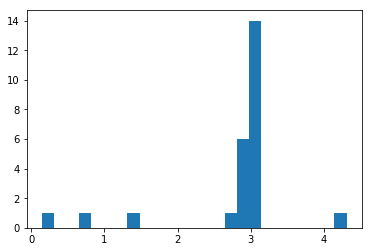

[ 2.79428794]
0.516463041306
Training epoch 42100
Iter: 42100
D loss: 3.808e-05
G_loss: -0.01222
()


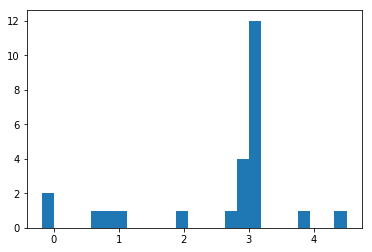

[ 2.57310411]
0.543825864792
Training epoch 42200
Iter: 42200
D loss: 3.816e-05
G_loss: -0.01258
()


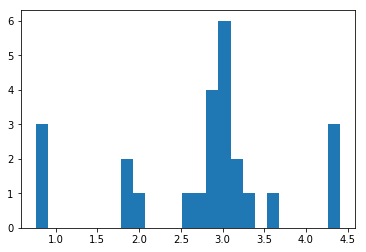

[ 2.79376271]
0.513310909271
Training epoch 42300
Iter: 42300
D loss: 3.036e-05
G_loss: -0.01283
()


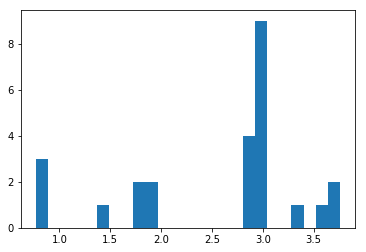

[ 2.56330199]
0.51618719101
Training epoch 42400
Iter: 42400
D loss: 3.538e-05
G_loss: -0.01311
()


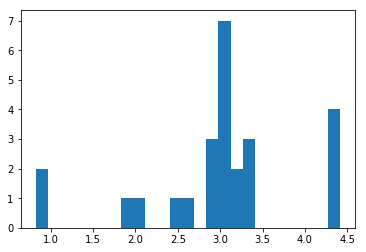

[ 2.98099152]
0.515203952789
Training epoch 42500
Iter: 42500
D loss: 5.239e-05
G_loss: -0.01258
()


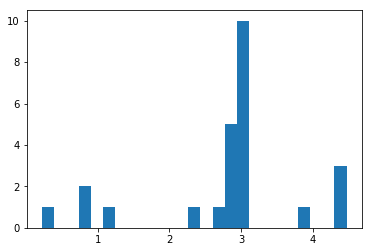

[ 2.8143292]
0.511466026306
Training epoch 42600
Iter: 42600
D loss: 3.179e-05
G_loss: -0.01214
()


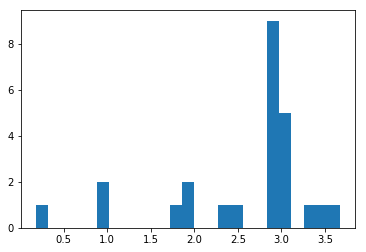

[ 2.5812355]
0.511280059814
Training epoch 42700
Iter: 42700
D loss: 3.371e-05
G_loss: -0.01329
()


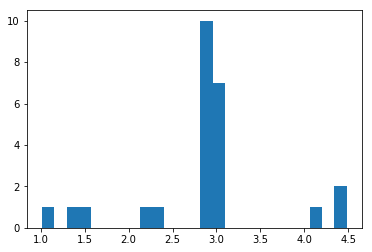

[ 2.88191413]
0.51363492012
Training epoch 42800
Iter: 42800
D loss: 2.692e-05
G_loss: -0.01337
()


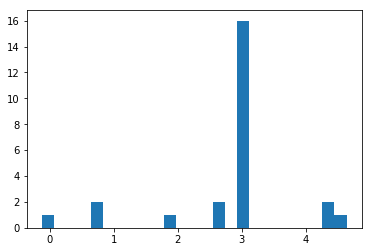

[ 2.81025342]
0.51309299469
Training epoch 42900
Iter: 42900
D loss: 3.628e-05
G_loss: -0.01298
()


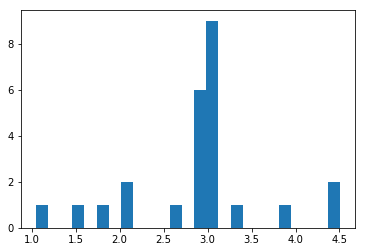

[ 2.9055894]
0.524126052856
Training epoch 43000
Iter: 43000
D loss: 4.328e-05
G_loss: -0.01304
()


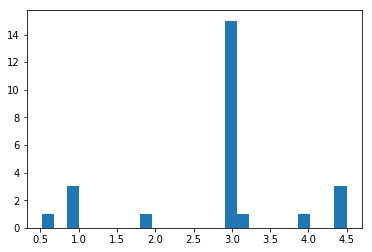

[ 2.80853961]
0.517900943756
Training epoch 43100
Iter: 43100
D loss: 3.041e-05
G_loss: -0.01326
()


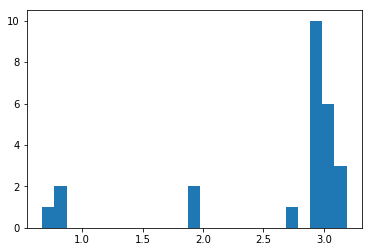

[ 2.63750932]
0.512040138245
Training epoch 43200
Iter: 43200
D loss: 2.794e-05
G_loss: -0.01317
()


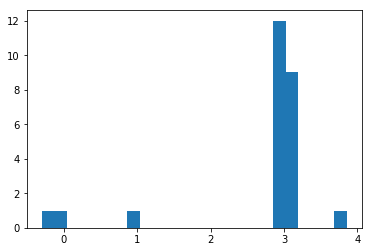

[ 2.71064575]
0.513626098633
Training epoch 43300
Iter: 43300
D loss: 3.181e-05
G_loss: -0.01267
()


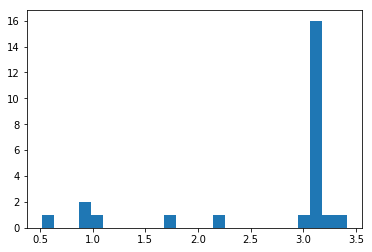

[ 2.66407534]
0.511337041855
Training epoch 43400
Iter: 43400
D loss: 3.011e-05
G_loss: -0.0133
()


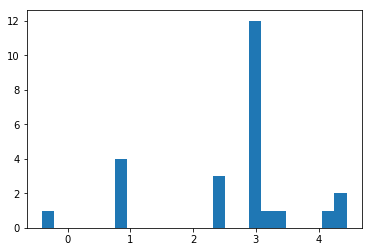

[ 2.61099045]
0.513118028641
Training epoch 43500
Iter: 43500
D loss: 3.091e-05
G_loss: -0.01222
()


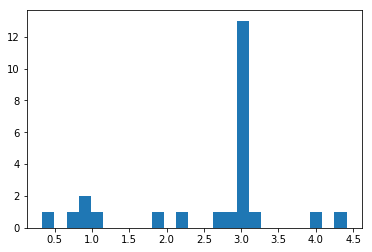

[ 2.59055276]
0.519502878189
Training epoch 43600
Iter: 43600
D loss: 2.728e-05
G_loss: -0.01221
()


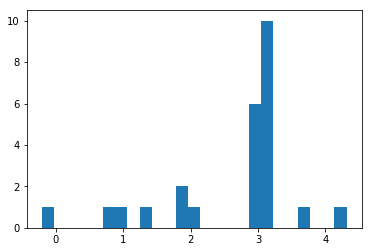

[ 2.61425296]
0.524316072464
Training epoch 43700
Iter: 43700
D loss: 3.953e-05
G_loss: -0.01264
()


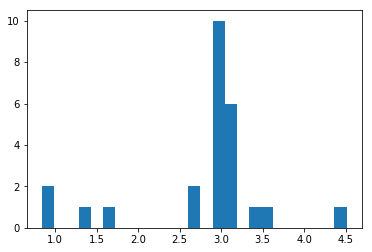

[ 2.79121071]
0.514225006104
Training epoch 43800
Iter: 43800
D loss: 2.869e-05
G_loss: -0.01391
()


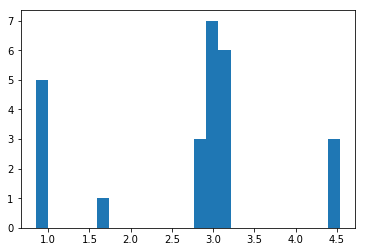

[ 2.71076205]
0.516237974167
Training epoch 43900
Iter: 43900
D loss: 3.032e-05
G_loss: -0.01298
()


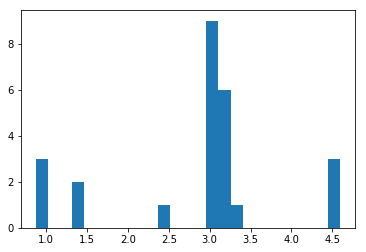

[ 2.83262897]
0.518975973129
Training epoch 44000
Iter: 44000
D loss: 3.807e-05
G_loss: -0.01343
()


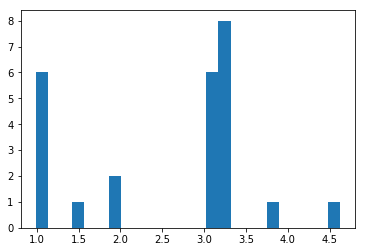

[ 2.57436516]
0.523983001709
Training epoch 44100
Iter: 44100
D loss: 3.112e-05
G_loss: -0.01306
()


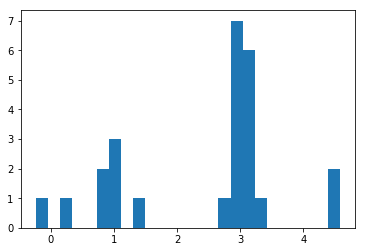

[ 2.42706464]
0.513082027435
Training epoch 44200
Iter: 44200
D loss: 3.063e-05
G_loss: -0.01306
()


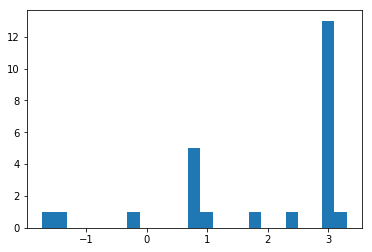

[ 1.94045448]
0.512329816818
Training epoch 44300
Iter: 44300
D loss: 3.008e-05
G_loss: -0.01205
()


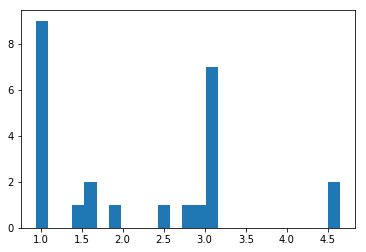

[ 2.17266028]
0.513262987137
Training epoch 44400
Iter: 44400
D loss: 3.151e-05
G_loss: -0.0132
()


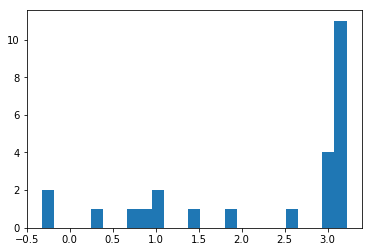

[ 2.24119486]
0.512978076935
Training epoch 44500
Iter: 44500
D loss: 3.059e-05
G_loss: -0.01339
()


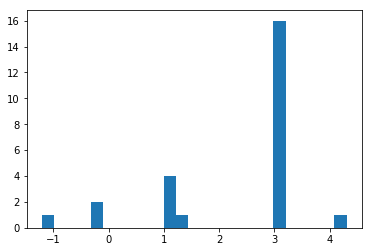

[ 2.36007236]
0.513252973557
Training epoch 44600
Iter: 44600
D loss: 3.789e-05
G_loss: -0.01191
()


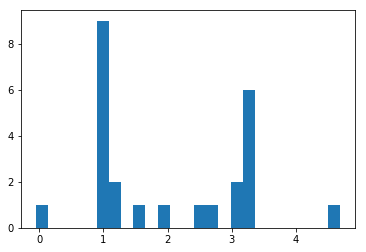

[ 2.00891694]
0.511286973953
Training epoch 44700
Iter: 44700
D loss: 2.651e-05
G_loss: -0.01209
()


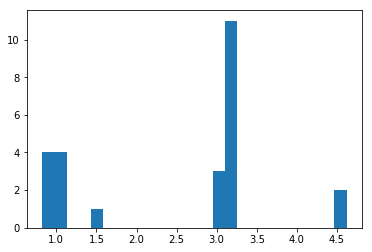

[ 2.48548563]
0.517953872681
Training epoch 44800
Iter: 44800
D loss: 2.985e-05
G_loss: -0.01277
()


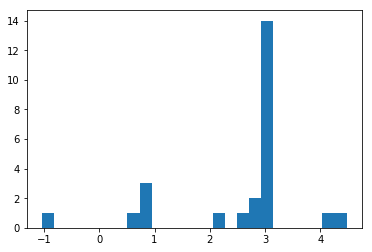

[ 2.53633066]
0.514356136322
Training epoch 44900
Iter: 44900
D loss: 3.879e-05
G_loss: -0.01324
()


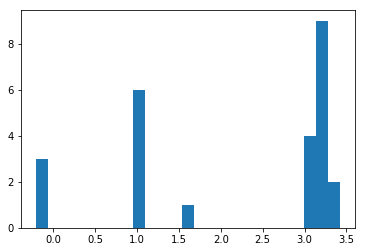

[ 2.18197287]
0.515106916428
Training epoch 45000
Iter: 45000
D loss: 3.158e-05
G_loss: -0.01247
()


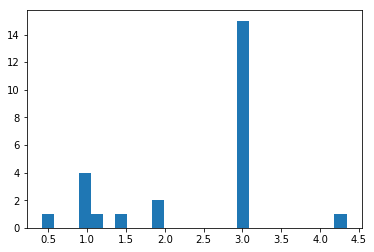

[ 2.42572327]
0.514400959015
Training epoch 45100
Iter: 45100
D loss: 3.624e-05
G_loss: -0.01196
()


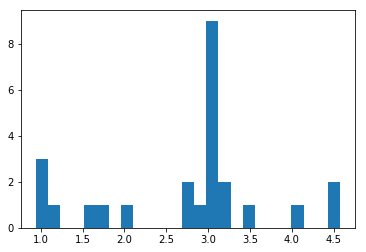

[ 2.74436246]
0.513888835907
Training epoch 45200
Iter: 45200
D loss: 3.397e-05
G_loss: -0.01232
()


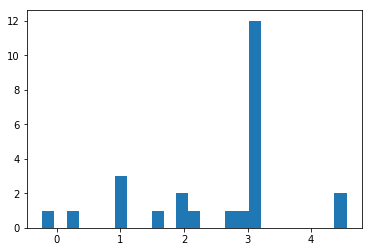

[ 2.49298825]
0.513392925262
Training epoch 45300
Iter: 45300
D loss: 4.02e-05
G_loss: -0.01322
()


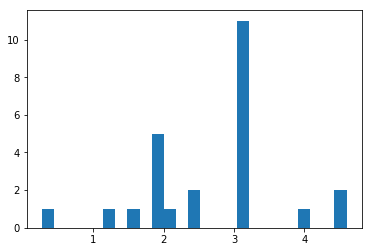

[ 2.69531726]
0.513078212738
Training epoch 45400
Iter: 45400
D loss: 2.836e-05
G_loss: -0.01336
()


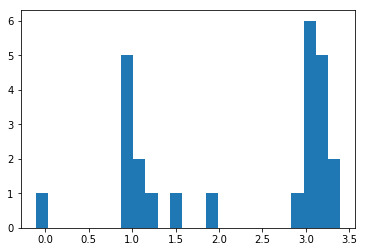

[ 2.21156074]
0.517431020737
Training epoch 45500
Iter: 45500
D loss: 3.193e-05
G_loss: -0.01335
()


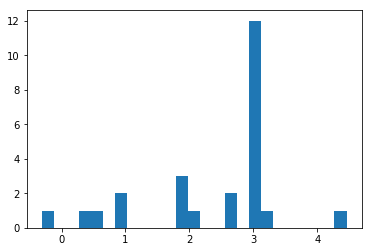

[ 2.3504617]
0.511254072189
Training epoch 45600
Iter: 45600
D loss: 2.971e-05
G_loss: -0.01337
()


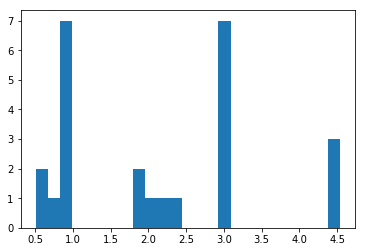

[ 2.16705488]
0.517380952835
Training epoch 45700
Iter: 45700
D loss: 3.219e-05
G_loss: -0.01273
()


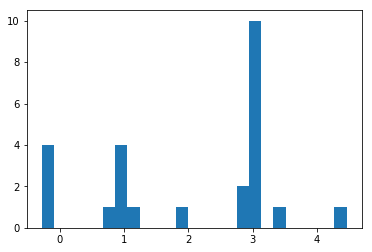

[ 2.0092819]
0.514764070511
Training epoch 45800
Iter: 45800
D loss: 3.013e-05
G_loss: -0.01333
()


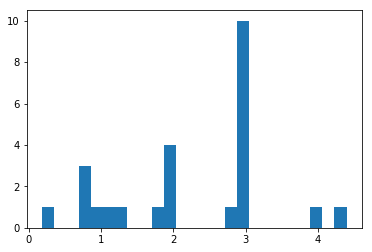

[ 2.25178461]
0.51505279541
Training epoch 45900
Iter: 45900
D loss: 3.388e-05
G_loss: -0.01149
()


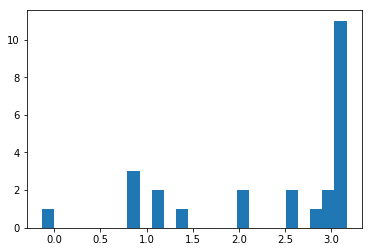

[ 2.3097508]
0.517624139786
Training epoch 46000
Iter: 46000
D loss: 3.587e-05
G_loss: -0.01325
()


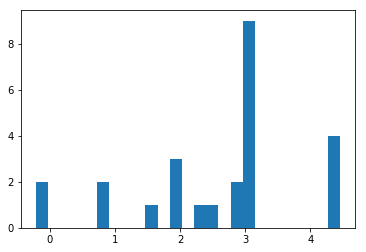

[ 2.54912668]
0.514355182648
Training epoch 46100
Iter: 46100
D loss: 2.981e-05
G_loss: -0.01266
()


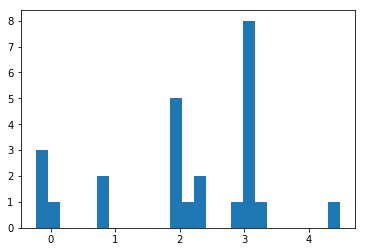

[ 2.10823588]
0.513288974762
Training epoch 46200
Iter: 46200
D loss: 2.026e-05
G_loss: -0.01366
()


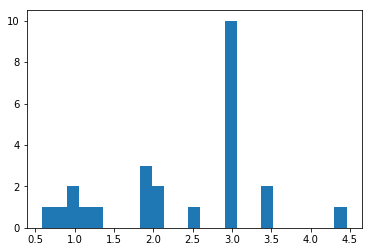

[ 2.36514839]
0.532248020172
Training epoch 46300
Iter: 46300
D loss: 3.544e-05
G_loss: -0.0133
()


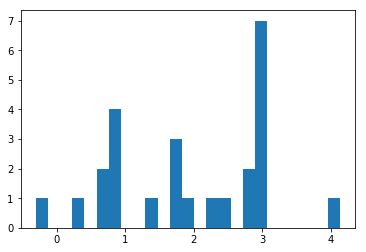

[ 1.9140705]
0.513797044754
Training epoch 46400
Iter: 46400
D loss: 3.521e-05
G_loss: -0.0122
()


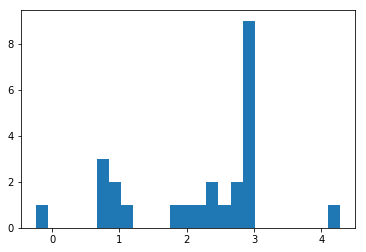

[ 2.18076399]
0.520309925079
Training epoch 46500
Iter: 46500
D loss: 4.635e-05
G_loss: -0.01068
()


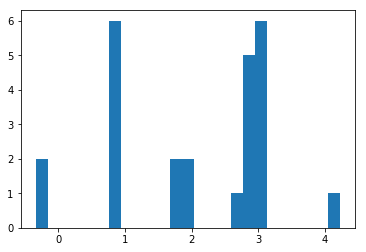

[ 2.04046707]
0.517072916031
Training epoch 46600
Iter: 46600
D loss: 3.404e-05
G_loss: -0.01293
()


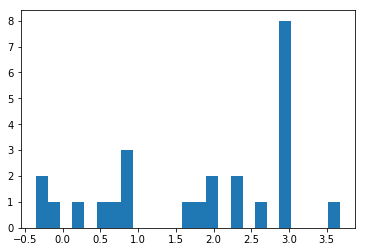

[ 1.80107974]
0.517148971558
Training epoch 46700
Iter: 46700
D loss: 2.202e-05
G_loss: -0.01339
()


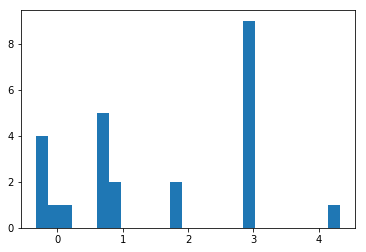

[ 1.57075104]
0.516356945038
Training epoch 46800
Iter: 46800
D loss: 3.057e-05
G_loss: -0.01306
()


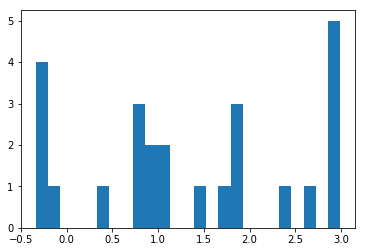

[ 1.35793498]
0.513091087341
Training epoch 46900
Iter: 46900
D loss: 3.127e-05
G_loss: -0.0133
()


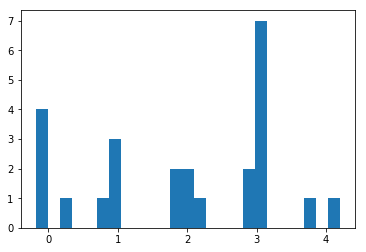

[ 1.91977213]
0.511046886444
Training epoch 47000
Iter: 47000
D loss: 3.167e-05
G_loss: -0.01234
()


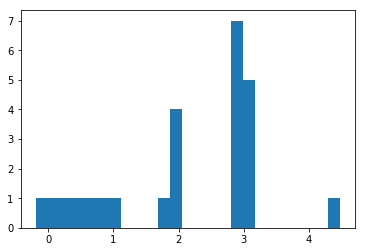

[ 2.13222355]
0.514374017715
Training epoch 47100
Iter: 47100
D loss: 3.256e-05
G_loss: -0.01339
()


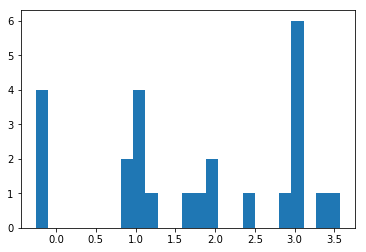

[ 1.7658328]
0.523524999619
Training epoch 47200
Iter: 47200
D loss: 3.825e-05
G_loss: -0.01385
()


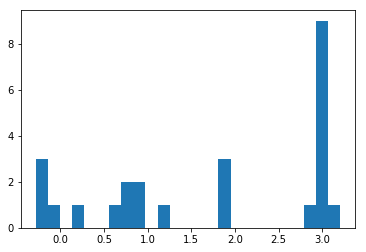

[ 1.7345407]
0.514106035233
Training epoch 47300
Iter: 47300
D loss: 3.647e-05
G_loss: -0.01263
()


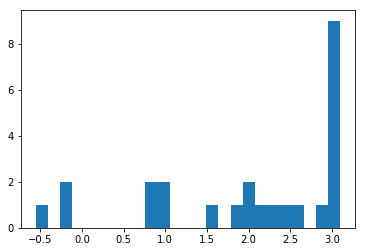

[ 1.99777214]
0.518182992935
Training epoch 47400
Iter: 47400
D loss: 4.313e-05
G_loss: -0.0133
()


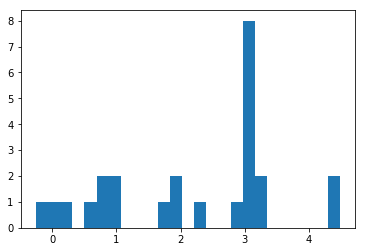

[ 2.18635349]
0.515141010284
Training epoch 47500
Iter: 47500
D loss: 2.996e-05
G_loss: -0.01315
()


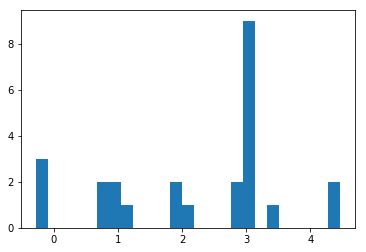

[ 2.20634312]
0.511121988297
Training epoch 47600
Iter: 47600
D loss: 1.646e-05
G_loss: -0.01348
()


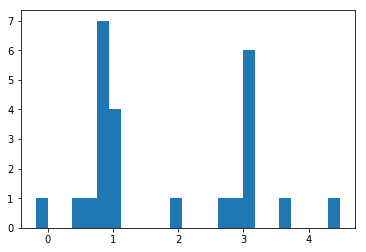

[ 1.80838768]
0.511748075485
Training epoch 47700
Iter: 47700
D loss: 3.646e-05
G_loss: -0.01415
()


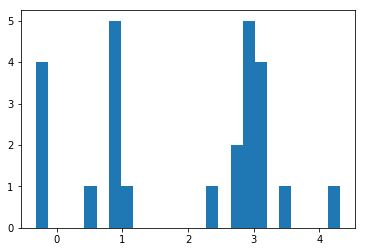

[ 1.89643794]
0.514126062393
Training epoch 47800
Iter: 47800
D loss: 3.031e-05
G_loss: -0.0127
()


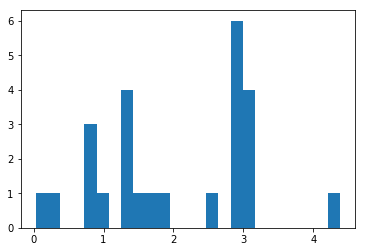

[ 2.03170731]
0.514157056808
Training epoch 47900
Iter: 47900
D loss: 2.639e-05
G_loss: -0.01246
()


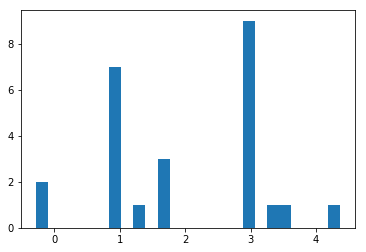

[ 2.01154683]
0.515916109085
Training epoch 48000
Iter: 48000
D loss: 3.502e-05
G_loss: -0.01292
()


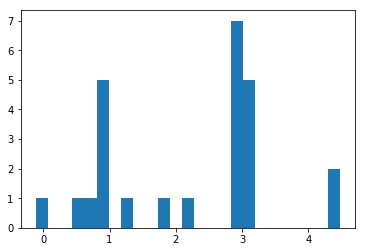

[ 2.24066323]
0.514630079269
Training epoch 48100
Iter: 48100
D loss: 3.17e-05
G_loss: -0.01277
()


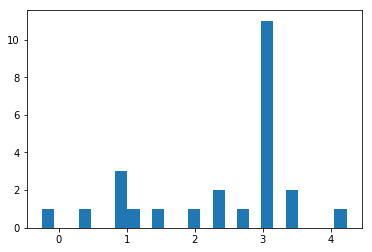

[ 2.37267463]
0.555648088455
Training epoch 48200
Iter: 48200
D loss: 3.219e-05
G_loss: -0.01405
()


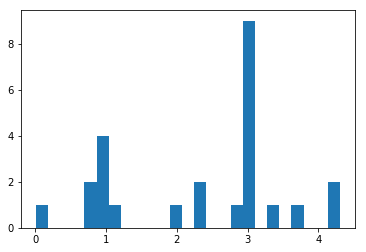

[ 2.35617075]
0.521636009216
Training epoch 48300
Iter: 48300
D loss: 3.114e-05
G_loss: -0.01331
()


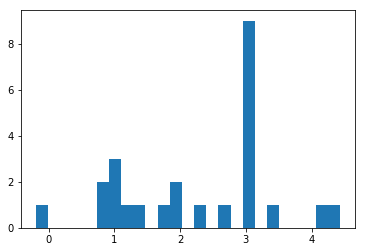

[ 2.28367858]
0.515622854233
Training epoch 48400
Iter: 48400
D loss: 2.937e-05
G_loss: -0.0124
()


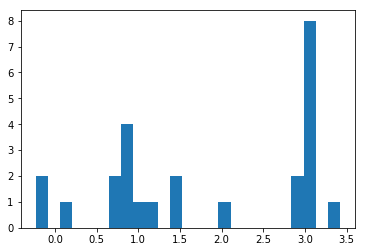

[ 1.84154453]
0.516541957855
Training epoch 48500
Iter: 48500
D loss: 3.306e-05
G_loss: -0.0133
()


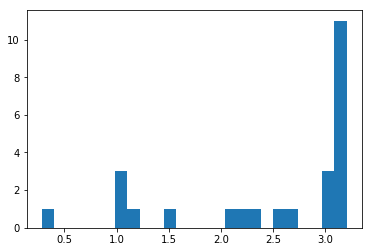

[ 2.46863244]
0.516229152679
Training epoch 48600
Iter: 48600
D loss: 3.246e-05
G_loss: -0.01322
()


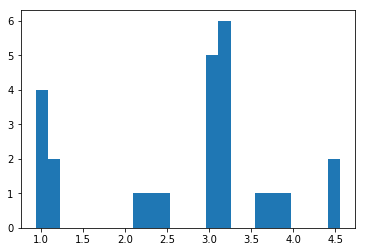

[ 2.70601639]
0.511976003647
Training epoch 48700
Iter: 48700
D loss: 3.397e-05
G_loss: -0.01317
()


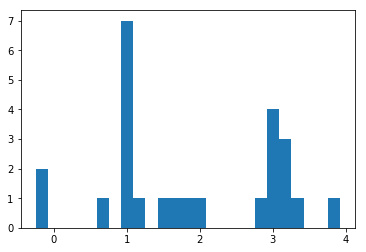

[ 1.89050511]
0.515220880508
Training epoch 48800
Iter: 48800
D loss: 2.291e-05
G_loss: -0.01383
()


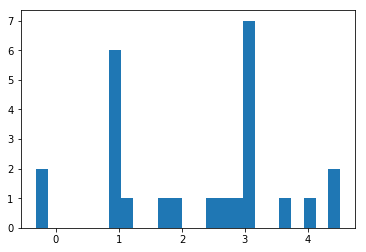

[ 2.23075026]
0.514641046524
Training epoch 48900
Iter: 48900
D loss: 3.761e-05
G_loss: -0.01304
()


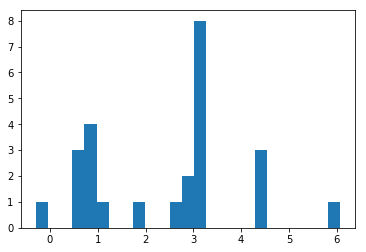

[ 2.43593298]
0.51584482193
Training epoch 49000
Iter: 49000
D loss: 2.652e-05
G_loss: -0.0135
()


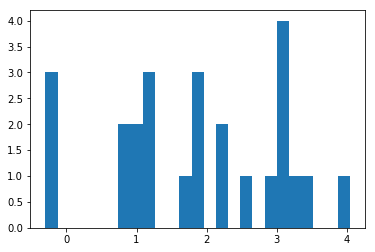

[ 1.89069624]
0.513365030289
Training epoch 49100
Iter: 49100
D loss: 2.462e-05
G_loss: -0.01351
()


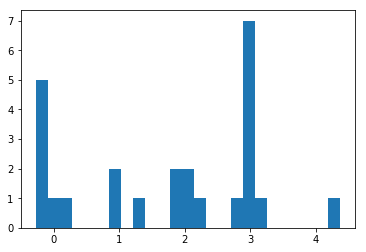

[ 1.7567941]
0.516150951385
Training epoch 49200
Iter: 49200
D loss: 2.948e-05
G_loss: -0.01337
()


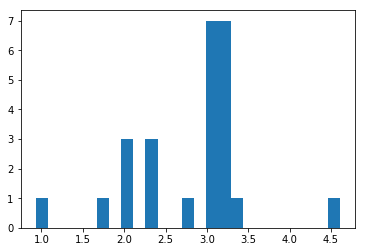

[ 2.80819321]
0.513381004333
Training epoch 49300
Iter: 49300
D loss: 3.212e-05
G_loss: -0.01326
()


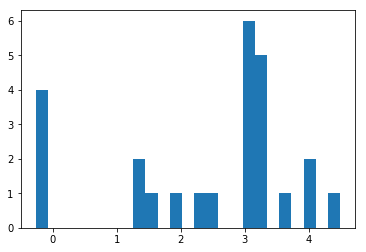

[ 2.4365317]
0.517650127411
Training epoch 49400
Iter: 49400
D loss: 3.251e-05
G_loss: -0.01203
()


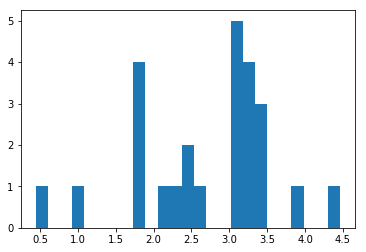

[ 2.691995]
0.516398191452
Training epoch 49500
Iter: 49500
D loss: 3.167e-05
G_loss: -0.01171
()


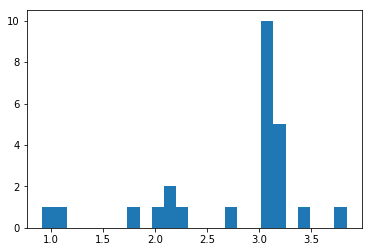

[ 2.75915319]
0.512667894363
Training epoch 49600
Iter: 49600
D loss: 3.52e-05
G_loss: -0.01327
()


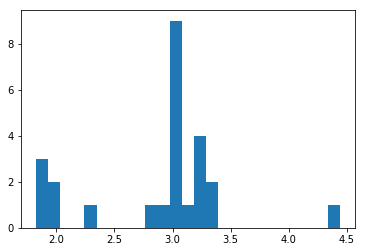

[ 2.87392998]
0.51381611824
Training epoch 49700
Iter: 49700
D loss: 3.159e-05
G_loss: -0.01322
()


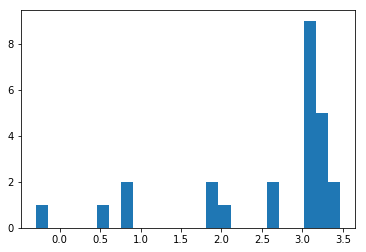

[ 2.51990205]
0.52100110054
Training epoch 49800
Iter: 49800
D loss: 2.863e-05
G_loss: -0.01348
()


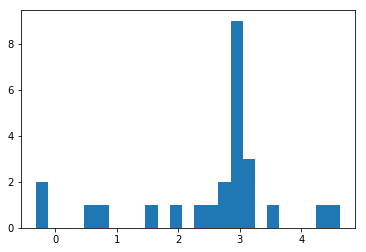

[ 2.54853257]
0.522472858429
Training epoch 49900
Iter: 49900
D loss: 3.897e-05
G_loss: -0.01271
()


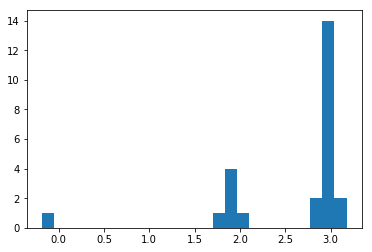

[ 2.60813687]
0.514997005463
Training epoch 50000
Iter: 50000
D loss: 2.939e-05
G_loss: -0.01314
()


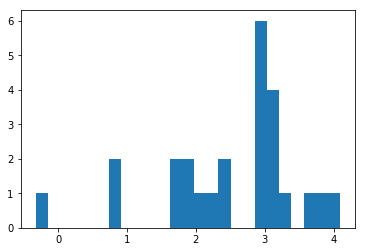

[ 2.53093121]
0.514366149902
Training epoch 50100
Iter: 50100
D loss: 3.038e-05
G_loss: -0.0133
()


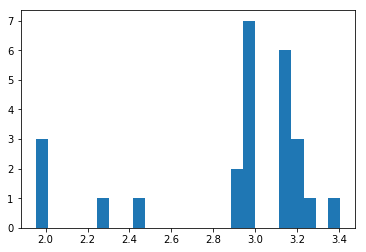

[ 2.89689449]
0.513940095901
Training epoch 50200
Iter: 50200
D loss: 4.031e-05
G_loss: -0.01273
()


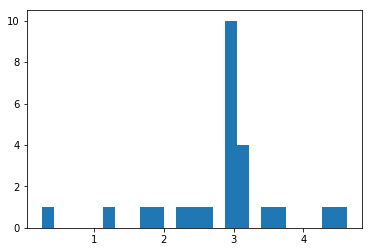

[ 2.85768178]
0.514194011688
Training epoch 50300
Iter: 50300
D loss: 3.395e-05
G_loss: -0.01283
()


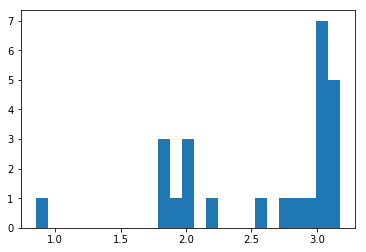

[ 2.56746388]
0.511537075043
Training epoch 50400
Iter: 50400
D loss: 2.815e-05
G_loss: -0.01327
()


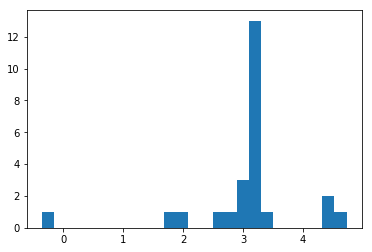

[ 3.04240337]
0.518552064896
Training epoch 50500
Iter: 50500
D loss: 2.905e-05
G_loss: -0.0132
()


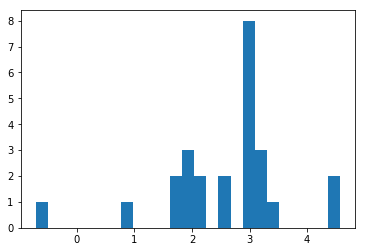

[ 2.59300244]
0.518203020096
Training epoch 50600
Iter: 50600
D loss: 2.88e-05
G_loss: -0.01323
()


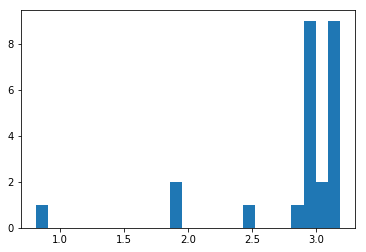

[ 2.85564195]
0.511224031448
Training epoch 50700
Iter: 50700
D loss: 2.472e-05
G_loss: -0.01346
()


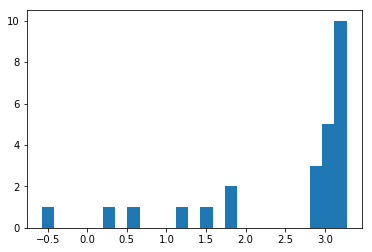

[ 2.5181028]
0.512471914291
Training epoch 50800
Iter: 50800
D loss: 3.436e-05
G_loss: -0.01285
()


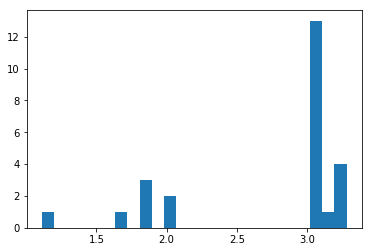

[ 2.74014326]
0.512205123901
Training epoch 50900
Iter: 50900
D loss: 3.392e-05
G_loss: -0.0131
()


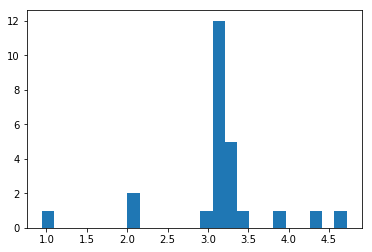

[ 3.12625195]
0.511124849319
Training epoch 51000
Iter: 51000
D loss: 3.174e-05
G_loss: -0.0128
()


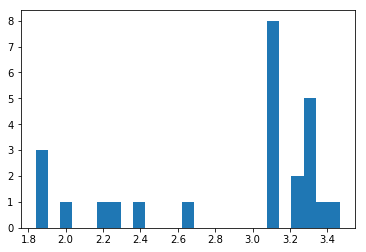

[ 2.8730805]
0.51569890976
Training epoch 51100
Iter: 51100
D loss: 4.15e-05
G_loss: -0.01271
()


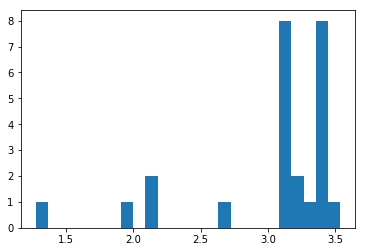

[ 3.02344214]
0.512393951416
Training epoch 51200
Iter: 51200
D loss: 2.767e-05
G_loss: -0.01318
()


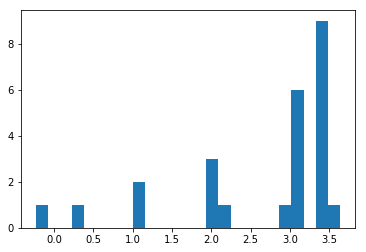

[ 2.65828551]
0.519536972046
Training epoch 51300
Iter: 51300
D loss: 3.397e-05
G_loss: -0.01242
()


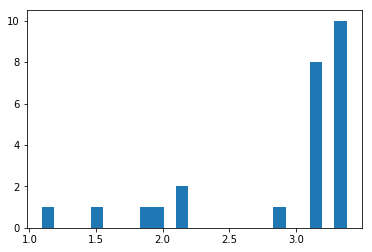

[ 2.91187786]
0.526229143143
Training epoch 51400
Iter: 51400
D loss: 3.146e-05
G_loss: -0.01182
()


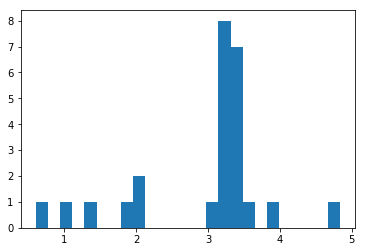

[ 2.9496157]
0.511004924774
Training epoch 51500
Iter: 51500
D loss: 3.727e-05
G_loss: -0.01335
()


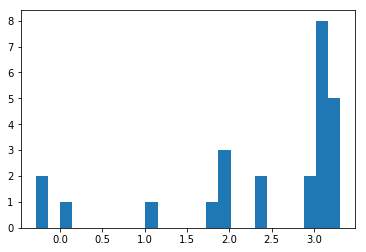

[ 2.39871675]
0.514276027679
Training epoch 51600
Iter: 51600
D loss: 3.124e-05
G_loss: -0.01306
()


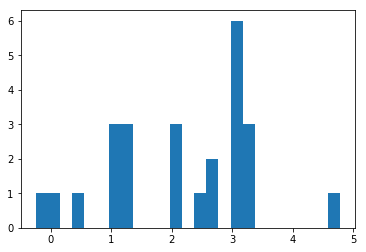

[ 2.1761579]
0.513804912567
Training epoch 51700
Iter: 51700
D loss: 3.243e-05
G_loss: -0.01304
()


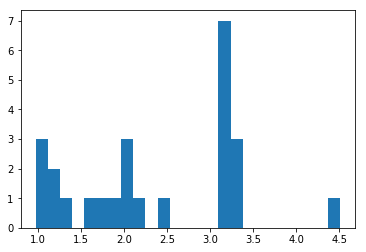

[ 2.34059699]
0.515741109848
Training epoch 51800
Iter: 51800
D loss: 2.647e-05
G_loss: -0.01141
()


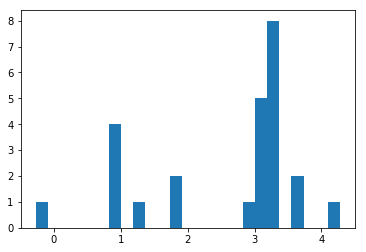

[ 2.56415009]
0.594615936279
Training epoch 51900
Iter: 51900
D loss: 2.967e-05
G_loss: -0.01301
()


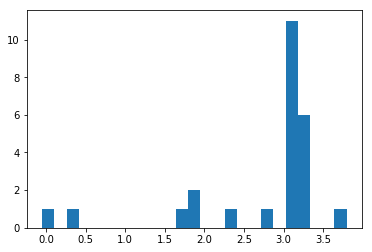

[ 2.71769164]
0.517951011658
Training epoch 52000
Iter: 52000
D loss: 2.898e-05
G_loss: -0.01338
()


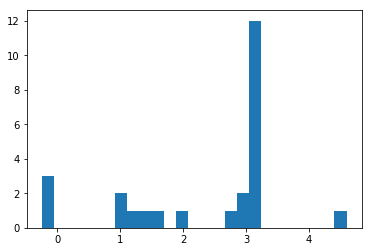

[ 2.32709767]
0.519201993942
Training epoch 52100
Iter: 52100
D loss: 2.885e-05
G_loss: -0.01276
()


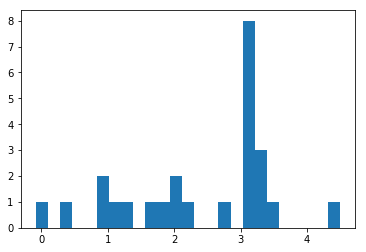

[ 2.37884224]
0.512446880341
Training epoch 52200
Iter: 52200
D loss: 2.915e-05
G_loss: -0.01322
()


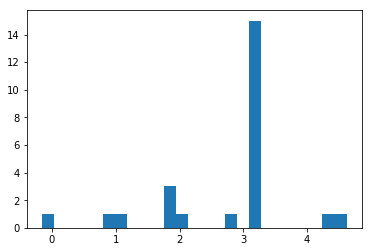

[ 2.74831416]
0.52426815033
Training epoch 52300
Iter: 52300
D loss: 4.018e-05
G_loss: -0.01311
()


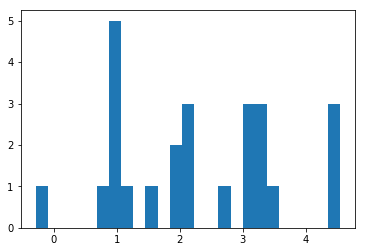

[ 2.2896197]
0.513125896454
Training epoch 52400
Iter: 52400
D loss: 3.171e-05
G_loss: -0.01254
()


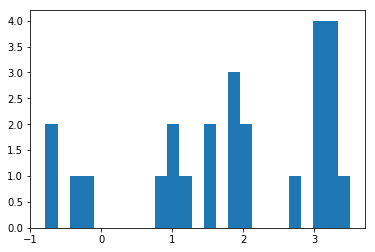

[ 1.84296915]
0.510995149612
Training epoch 52500
Iter: 52500
D loss: 3.723e-05
G_loss: -0.01235
()


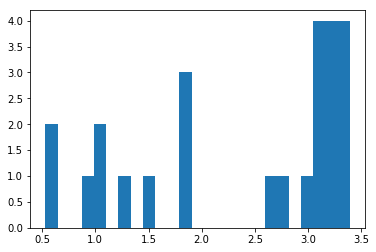

[ 2.379038]
0.513201951981
Training epoch 52600
Iter: 52600
D loss: 4.233e-05
G_loss: -0.01309
()


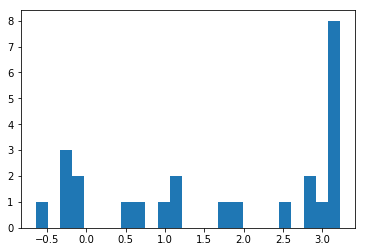

[ 1.71232986]
0.519051074982
Training epoch 52700
Iter: 52700
D loss: 3.189e-05
G_loss: -0.01314
()


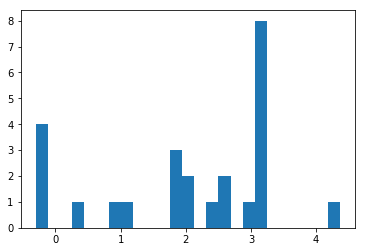

[ 2.04290373]
0.52922296524
Training epoch 52800
Iter: 52800
D loss: 3.182e-05
G_loss: -0.01325
()


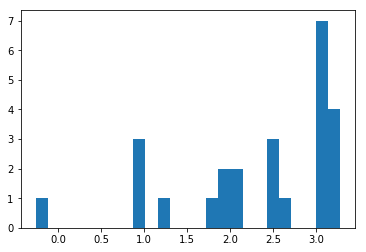

[ 2.33452919]
0.513154983521
Training epoch 52900
Iter: 52900
D loss: 3.188e-05
G_loss: -0.01333
()


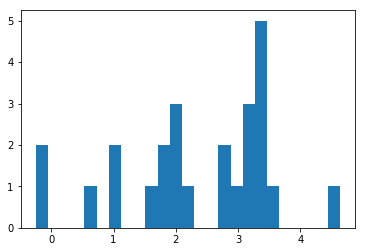

[ 2.3229321]
0.51700091362
Training epoch 53000
Iter: 53000
D loss: 3.341e-05
G_loss: -0.0132
()


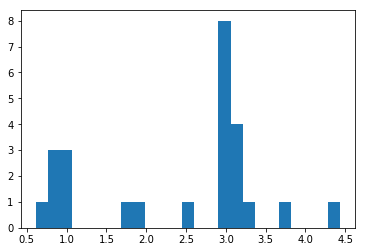

[ 2.4512387]
0.514621973038
Training epoch 53100
Iter: 53100
D loss: 3.359e-05
G_loss: -0.01261
()


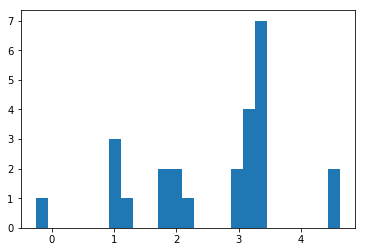

[ 2.58591187]
0.512497901917
Training epoch 53200
Iter: 53200
D loss: 2.819e-05
G_loss: -0.01334
()


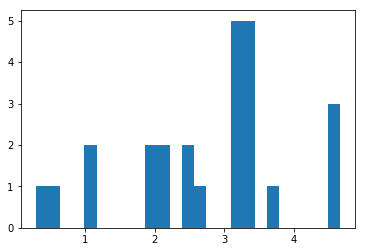

[ 2.75639766]
0.522519826889
Training epoch 53300
Iter: 53300
D loss: 3.684e-05
G_loss: -0.01311
()


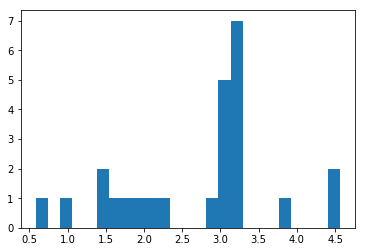

[ 2.70592206]
0.513433933258
Training epoch 53400
Iter: 53400
D loss: 3.032e-05
G_loss: -0.01244
()


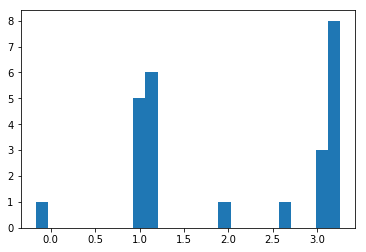

[ 2.05746498]
0.511317968369
Training epoch 53500
Iter: 53500
D loss: 3.192e-05
G_loss: -0.01161
()


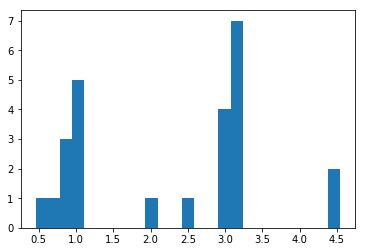

[ 2.27439317]
0.512801885605
Training epoch 53600
Iter: 53600
D loss: 2.954e-05
G_loss: -0.01248
()


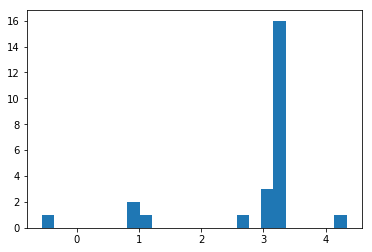

[ 2.85347138]
0.512021064758
Training epoch 53700
Iter: 53700
D loss: 3.581e-05
G_loss: -0.01271
()


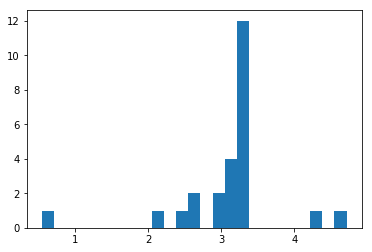

[ 3.11103046]
0.516482830048
Training epoch 53800
Iter: 53800
D loss: 3.889e-05
G_loss: -0.01269
()


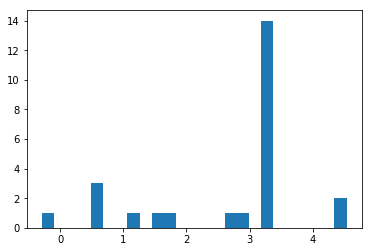

[ 2.63448661]
0.518322944641
Training epoch 53900
Iter: 53900
D loss: 3.251e-05
G_loss: -0.01333
()


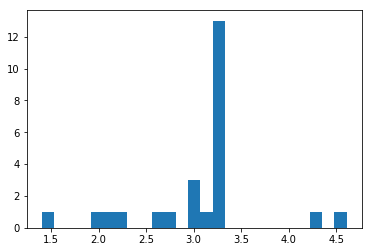

[ 3.0487987]
0.512737989426
Training epoch 54000
Iter: 54000
D loss: 3.255e-05
G_loss: -0.0134
()


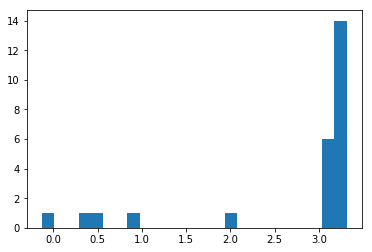

[ 2.69787119]
0.511924028397
Training epoch 54100
Iter: 54100
D loss: 3.3e-05
G_loss: -0.01244
()


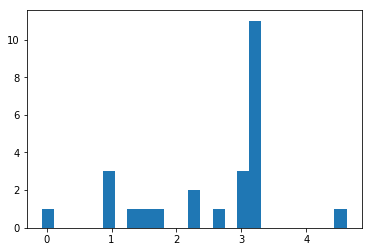

[ 2.5634713]
0.511417865753
Training epoch 54200
Iter: 54200
D loss: 4.066e-05
G_loss: -0.009719
()


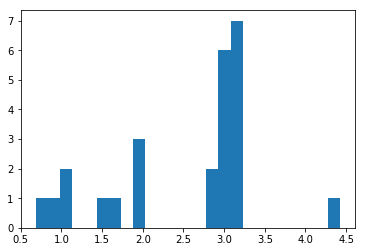

[ 2.50121798]
0.515102863312
Training epoch 54300
Iter: 54300
D loss: 3.625e-05
G_loss: -0.0132
()


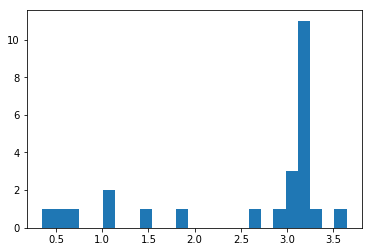

[ 2.54470499]
0.51323890686
Training epoch 54400
Iter: 54400
D loss: 2.641e-05
G_loss: -0.01256
()


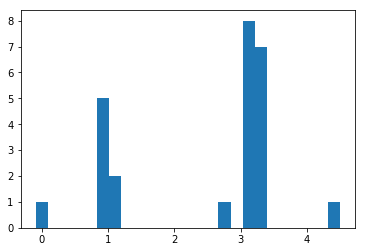

[ 2.4584436]
0.511925935745
Training epoch 54500
Iter: 54500
D loss: 3.486e-05
G_loss: -0.01246
()


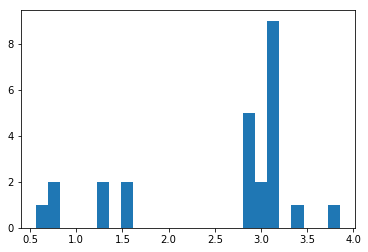

[ 2.54646333]
0.513917922974
Training epoch 54600
Iter: 54600
D loss: 2.433e-05
G_loss: -0.01333
()


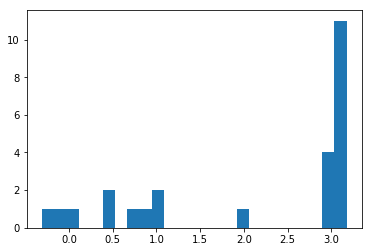

[ 2.12719177]
0.515623092651
Training epoch 54700
Iter: 54700
D loss: 4.324e-05
G_loss: -0.01241
()


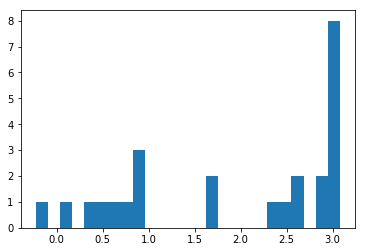

[ 1.9594401]
0.512912988663
Training epoch 54800
Iter: 54800
D loss: 1.948e-05
G_loss: -0.0136
()


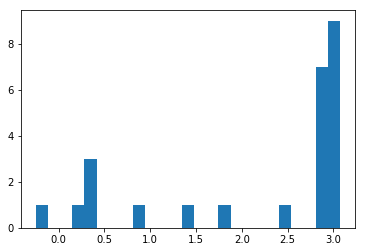

[ 2.2242427]
0.513470888138
Training epoch 54900
Iter: 54900
D loss: 4.068e-05
G_loss: -0.01237
()


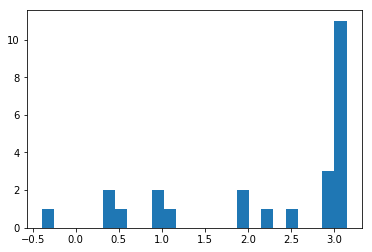

[ 2.22501356]
0.513548135757
Training epoch 55000
Iter: 55000
D loss: 3.127e-05
G_loss: -0.01322
()


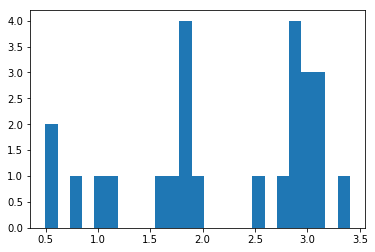

[ 2.21431816]
0.517097949982
Training epoch 55100
Iter: 55100
D loss: 3.072e-05
G_loss: -0.01335
()


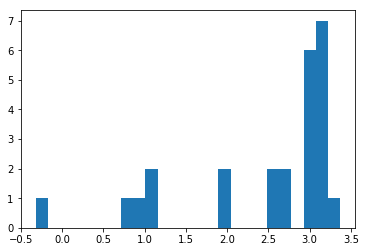

[ 2.4505955]
0.519796848297
Training epoch 55200
Iter: 55200
D loss: 3.891e-05
G_loss: -0.01329
()


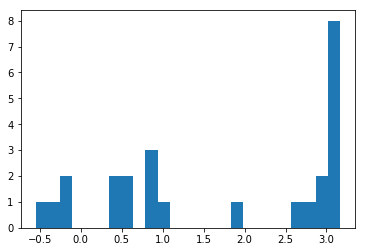

[ 1.71881716]
0.512732982635
Training epoch 55300
Iter: 55300
D loss: 3.641e-05
G_loss: -0.01328
()


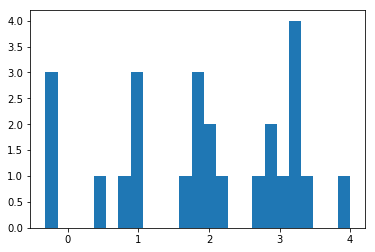

[ 1.93036978]
0.511368989944
Training epoch 55400
Iter: 55400
D loss: 3.803e-05
G_loss: -0.0124
()


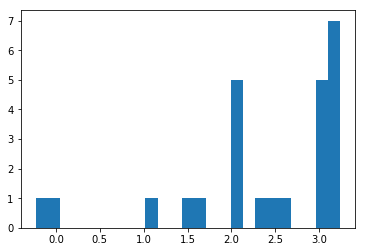

[ 2.37947272]
0.519007921219
Training epoch 55500
Iter: 55500
D loss: 3.838e-05
G_loss: -0.0132
()


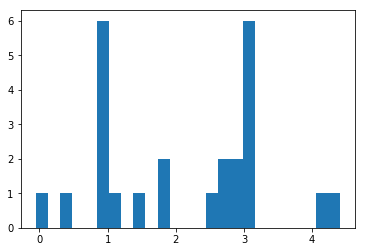

[ 2.12947671]
0.517719984055
Training epoch 55600
Iter: 55600
D loss: 2.828e-05
G_loss: -0.01345
()


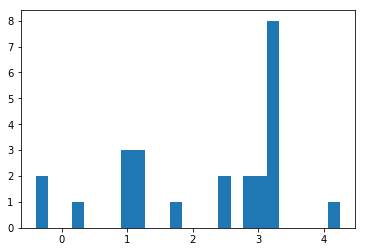

[ 2.17068856]
0.513045072556
Training epoch 55700
Iter: 55700
D loss: 3.512e-05
G_loss: -0.01335
()


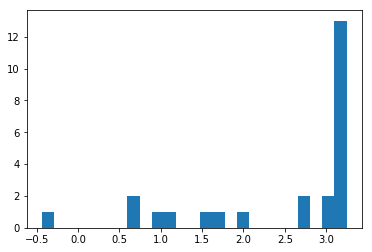

[ 2.45763008]
0.519013881683
Training epoch 55800
Iter: 55800
D loss: 3.769e-05
G_loss: -0.01312
()


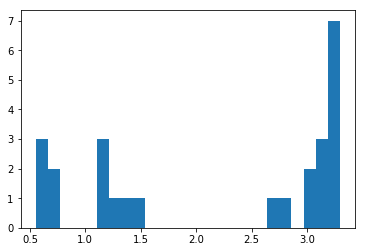

[ 2.17981389]
0.51518201828
Training epoch 55900
Iter: 55900
D loss: 2.888e-05
G_loss: -0.01317
()


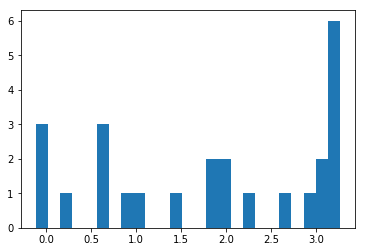

[ 1.86068215]
0.515151977539
Training epoch 56000
Iter: 56000
D loss: 3.318e-05
G_loss: -0.01318
()


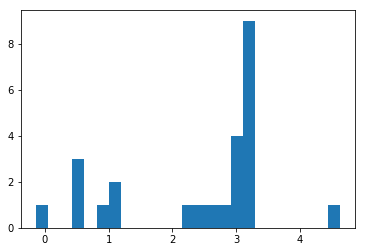

[ 2.41502142]
0.515289068222
Training epoch 56100
Iter: 56100
D loss: 3.251e-05
G_loss: -0.01211
()


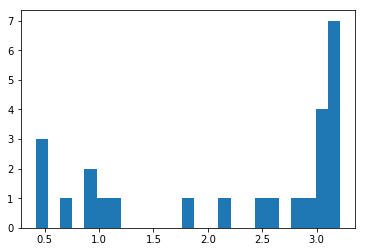

[ 2.22690222]
0.512989997864
Training epoch 56200
Iter: 56200
D loss: 3.663e-05
G_loss: -0.01225
()


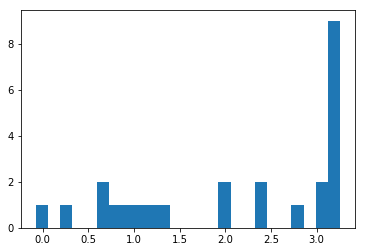

[ 2.14693673]
0.525017976761
Training epoch 56300
Iter: 56300
D loss: 3.757e-05
G_loss: -0.01322
()


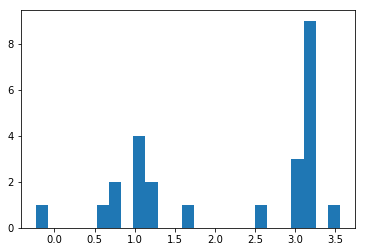

[ 2.17310076]
0.512686014175
Training epoch 56400
Iter: 56400
D loss: 3.657e-05
G_loss: -0.01288
()


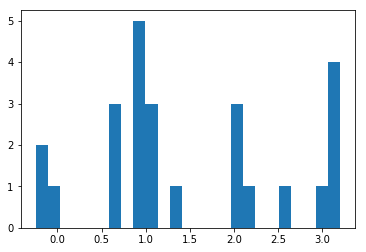

[ 1.49418337]
0.513379096985
Training epoch 56500
Iter: 56500
D loss: 3.302e-05
G_loss: -0.01336
()


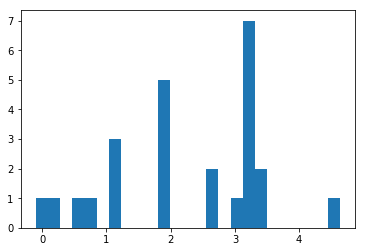

[ 2.27076588]
0.519320011139
Training epoch 56600
Iter: 56600
D loss: 3.592e-05
G_loss: -0.01382
()


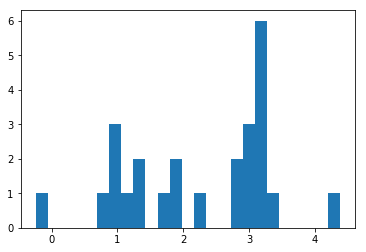

[ 2.23354363]
0.514232158661
Training epoch 56700
Iter: 56700
D loss: 3.381e-05
G_loss: -0.01255
()


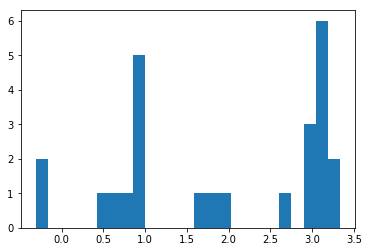

[ 1.9386181]
0.525643110275
Training epoch 56800
Iter: 56800
D loss: 3.734e-05
G_loss: -0.01238
()


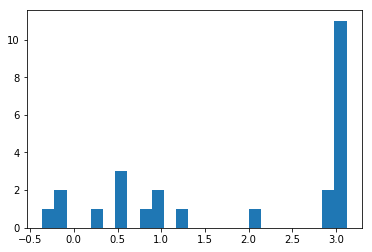

[ 1.89844002]
0.514703989029
Training epoch 56900
Iter: 56900
D loss: 2.995e-05
G_loss: -0.01334
()


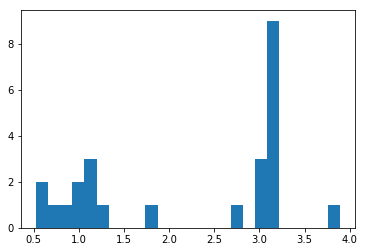

[ 2.2251026]
0.518129825592
Training epoch 57000
Iter: 57000
D loss: 4.157e-05
G_loss: -0.01043
()


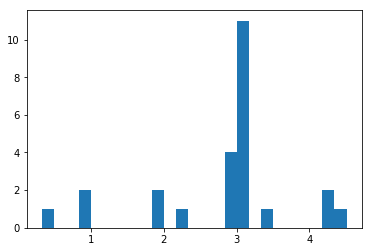

[ 2.82341944]
0.514009952545
Training epoch 57100
Iter: 57100
D loss: 3.385e-05
G_loss: -0.01333
()


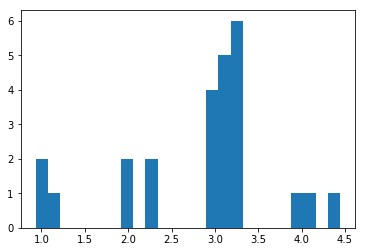

[ 2.83579618]
0.515999794006
Training epoch 57200
Iter: 57200
D loss: 2.322e-05
G_loss: -0.01347
()


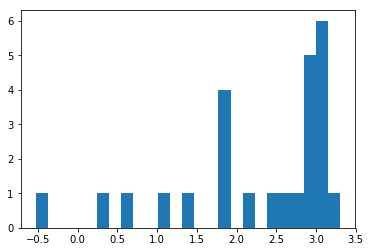

[ 2.26203685]
0.512705087662
Training epoch 57300
Iter: 57300
D loss: 2.958e-05
G_loss: -0.01217
()


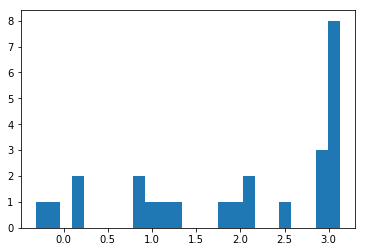

[ 1.98107918]
0.511176109314
Training epoch 57400
Iter: 57400
D loss: 3.615e-05
G_loss: -0.01402
()


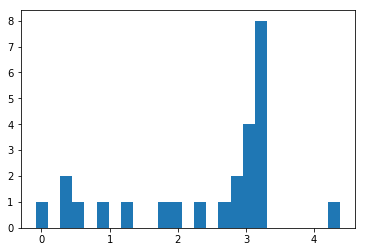

[ 2.38568161]
0.510767936707
Training epoch 57500
Iter: 57500
D loss: 3.015e-05
G_loss: -0.01281
()


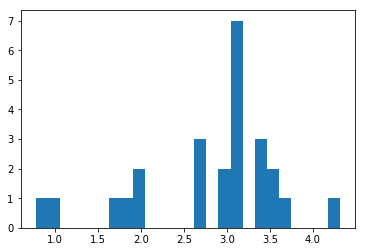

[ 2.83726439]
0.512813091278
Training epoch 57600
Iter: 57600
D loss: 3.161e-05
G_loss: -0.01362
()


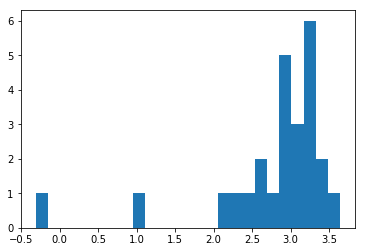

[ 2.77278669]
0.515534877777
Training epoch 57700
Iter: 57700
D loss: 2.816e-05
G_loss: -0.01378
()


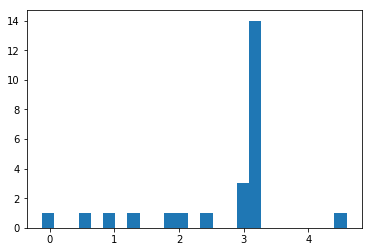

[ 2.68330941]
0.512840986252
Training epoch 57800
Iter: 57800
D loss: 3.559e-05
G_loss: -0.01273
()


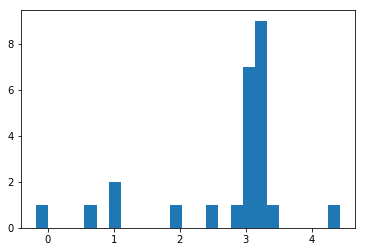

[ 2.71162476]
0.520611047745
Training epoch 57900
Iter: 57900
D loss: 3.025e-05
G_loss: -0.01338
()


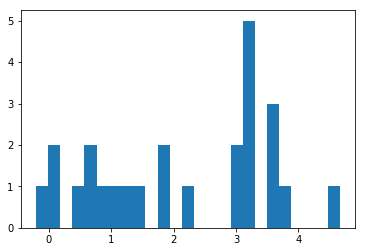

[ 2.14956122]
0.51938700676
Training epoch 58000
Iter: 58000
D loss: 3.19e-05
G_loss: -0.01316
()


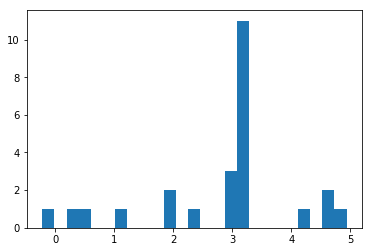

[ 2.82191147]
0.521185874939
Training epoch 58100
Iter: 58100
D loss: 2.55e-05
G_loss: -0.01319
()


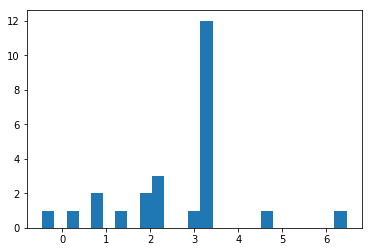

[ 2.64390887]
0.513295888901
Training epoch 58200
Iter: 58200
D loss: 2.345e-05
G_loss: -0.01287
()


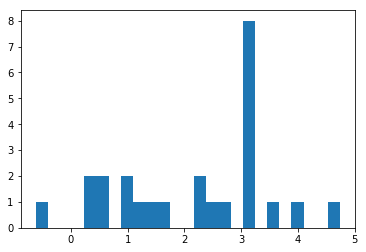

[ 2.21466528]
0.511379003525
Training epoch 58300
Iter: 58300
D loss: 3.366e-05
G_loss: -0.01266
()


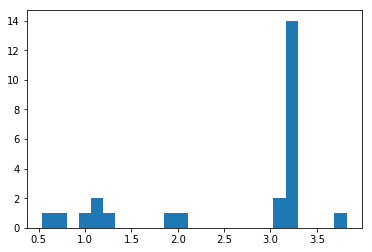

[ 2.61173245]
0.516309976578
Training epoch 58400
Iter: 58400
D loss: 3.277e-05
G_loss: -0.01268
()


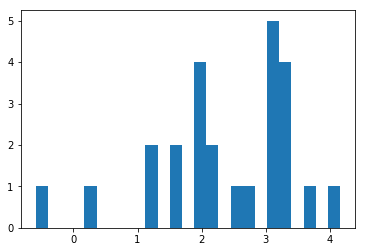

[ 2.39482787]
0.527516126633
Training epoch 58500
Iter: 58500
D loss: 3.974e-05
G_loss: -0.01266
()


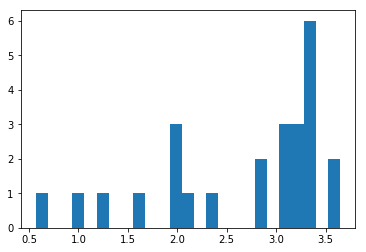

[ 2.65925955]
0.515436887741
Training epoch 58600
Iter: 58600
D loss: 3.311e-05
G_loss: -0.01316
()


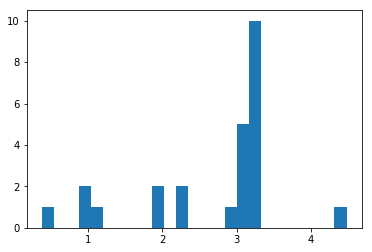

[ 2.66810285]
0.518579959869
Training epoch 58700
Iter: 58700
D loss: 3.125e-05
G_loss: -0.01248
()


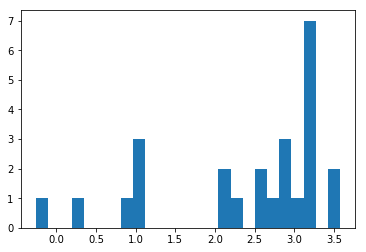

[ 2.39420717]
0.513471126556
Training epoch 58800
Iter: 58800
D loss: 3.859e-05
G_loss: -0.01308
()


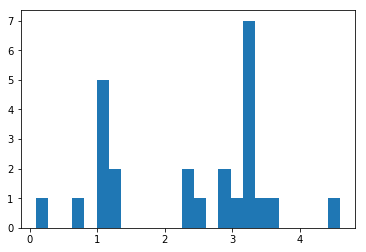

[ 2.3634756]
0.518657922745
Training epoch 58900
Iter: 58900
D loss: 3.307e-05
G_loss: -0.01056
()


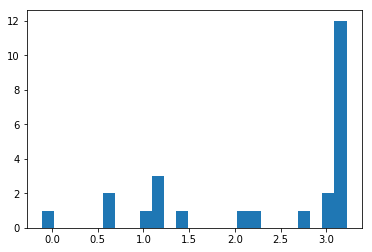

[ 2.35169567]
0.517124176025
Training epoch 59000
Iter: 59000
D loss: 2.742e-05
G_loss: -0.01338
()


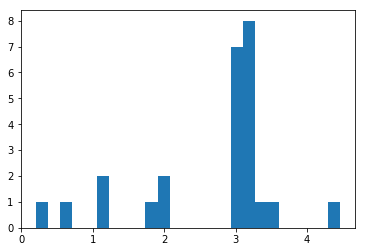

[ 2.67083567]
0.513565063477
Training epoch 59100
Iter: 59100
D loss: 3.534e-05
G_loss: -0.01328
()


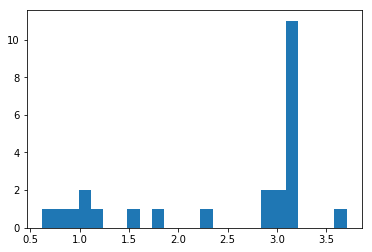

[ 2.4510172]
0.516165018082
Training epoch 59200
Iter: 59200
D loss: 2.727e-05
G_loss: -0.01125
()


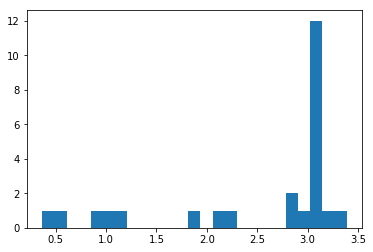

[ 2.52339597]
0.529560804367
Training epoch 59300
Iter: 59300
D loss: 3.18e-05
G_loss: -0.01337
()


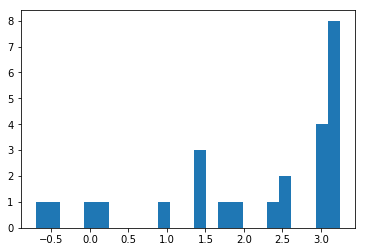

[ 2.09870304]
0.519701957703
Training epoch 59400
Iter: 59400
D loss: 2.669e-05
G_loss: -0.01202
()


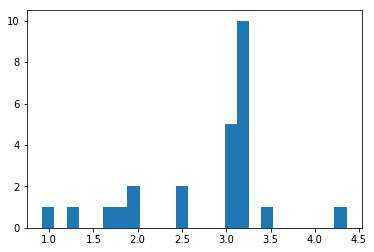

[ 2.7560772]
0.516312837601
Training epoch 59500
Iter: 59500
D loss: 2.916e-05
G_loss: -0.01253
()


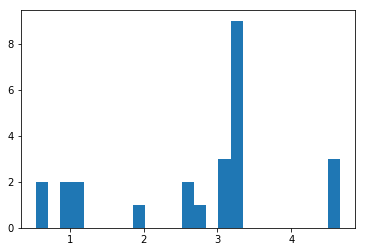

[ 2.70201776]
0.514415979385
Training epoch 59600
Iter: 59600
D loss: 3.273e-05
G_loss: -0.01326
()


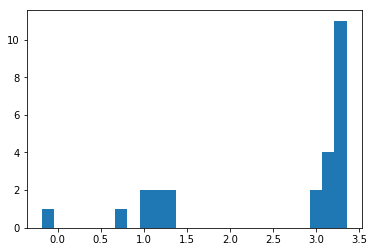

[ 2.48511067]
0.513237953186
Training epoch 59700
Iter: 59700
D loss: 3.127e-05
G_loss: -0.01157
()


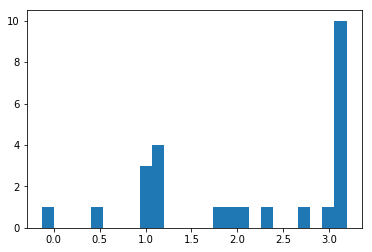

[ 2.13283573]
0.512151002884
Training epoch 59800
Iter: 59800
D loss: 2.72e-05
G_loss: -0.0133
()


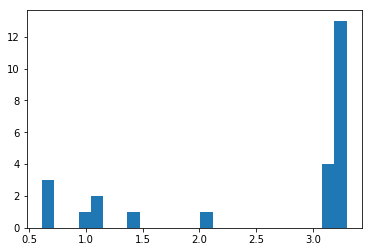

[ 2.54453963]
0.512109041214
Training epoch 59900
Iter: 59900
D loss: 3.001e-05
G_loss: -0.01199
()


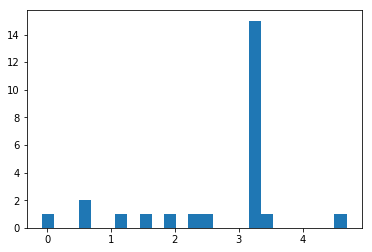

[ 2.70302214]
0.51637506485
Training epoch 60000
Iter: 60000
D loss: 3.346e-05
G_loss: -0.01332
()


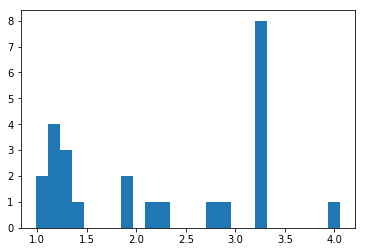

[ 2.24939736]
0.513250112534
Training epoch 60100
Iter: 60100
D loss: 2.926e-05
G_loss: -0.01244
()


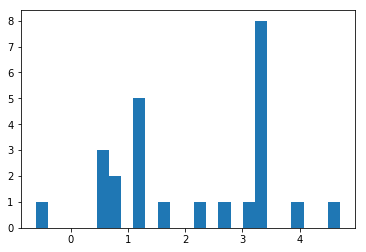

[ 2.10272623]
0.513314962387
Training epoch 60200
Iter: 60200
D loss: 2.924e-05
G_loss: -0.01031
()


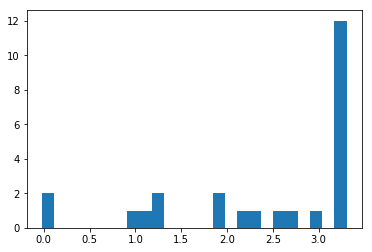

[ 2.42501406]
0.516139984131
Training epoch 60300
Iter: 60300
D loss: 3.005e-05
G_loss: -0.01174
()


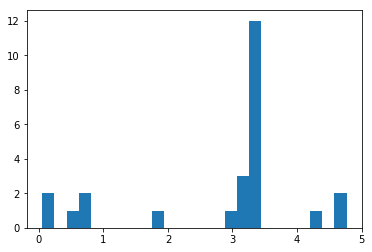

[ 2.82738671]
0.512386083603
Training epoch 60400
Iter: 60400
D loss: 3.523e-05
G_loss: -0.01339
()


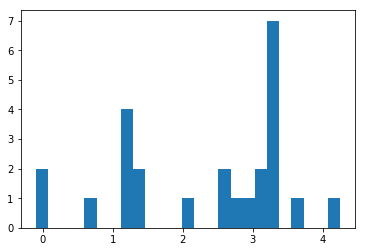

[ 2.34209252]
0.513417959213
Training epoch 60500
Iter: 60500
D loss: 2.795e-05
G_loss: -0.01202
()


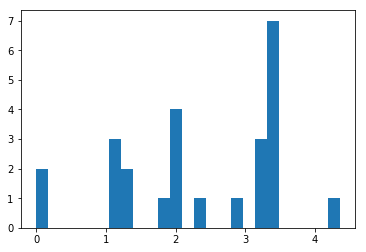

[ 2.3373457]
0.51993393898
Training epoch 60600
Iter: 60600
D loss: 2.52e-05
G_loss: -0.01349
()


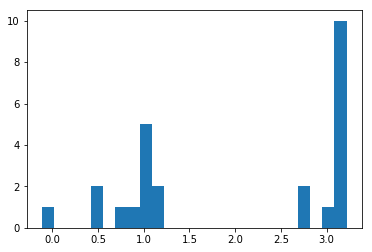

[ 2.01946097]
0.512195110321
Training epoch 60700
Iter: 60700
D loss: 3.617e-05
G_loss: -0.01328
()


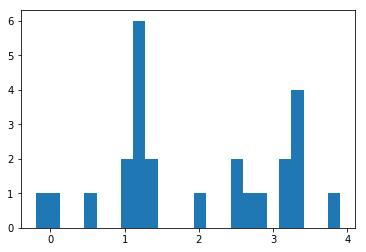

[ 1.91922606]
0.516021966934
Training epoch 60800
Iter: 60800
D loss: 2.868e-05
G_loss: -0.01169
()


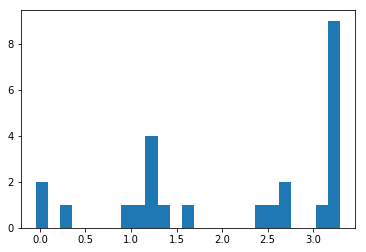

[ 2.12475937]
0.594578027725
Training epoch 60900
Iter: 60900
D loss: 2.923e-05
G_loss: -0.01326
()


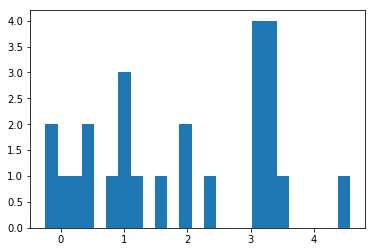

[ 1.8879505]
0.513198137283
Training epoch 61000
Iter: 61000
D loss: 2.97e-05
G_loss: -0.01326
()


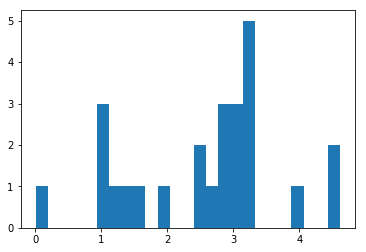

[ 2.56421107]
0.51303601265
Training epoch 61100
Iter: 61100
D loss: 3.177e-05
G_loss: -0.01322
()


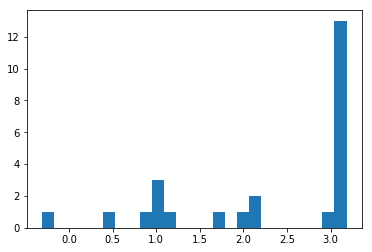

[ 2.29301201]
0.519919157028
Training epoch 61200
Iter: 61200
D loss: 4.684e-05
G_loss: -0.01202
()


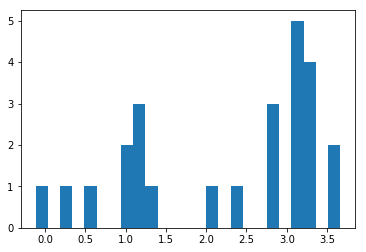

[ 2.24840586]
0.525759935379
Training epoch 61300
Iter: 61300
D loss: 3.057e-05
G_loss: -0.01346
()


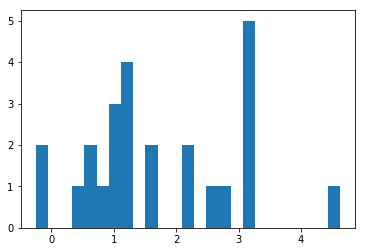

[ 1.73201716]
0.520165920258
Training epoch 61400
Iter: 61400
D loss: 3.692e-05
G_loss: -0.01302
()


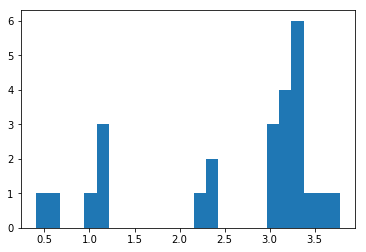

[ 2.59116315]
0.512001037598
Training epoch 61500
Iter: 61500
D loss: 3.068e-05
G_loss: -0.01318
()


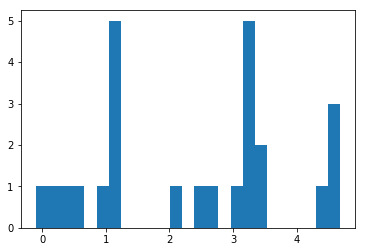

[ 2.38690053]
0.515751123428
Training epoch 61600
Iter: 61600
D loss: 3.572e-05
G_loss: -0.01355
()


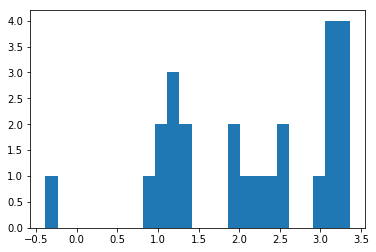

[ 2.12178989]
0.514738082886
Training epoch 61700
Iter: 61700
D loss: 4.545e-05
G_loss: -0.01332
()


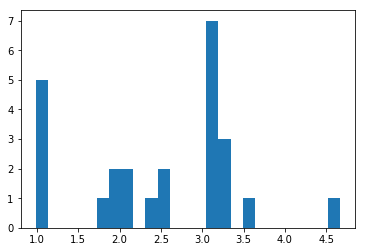

[ 2.4845892]
0.5127389431
Training epoch 61800
Iter: 61800
D loss: 2.637e-05
G_loss: -0.01371
()


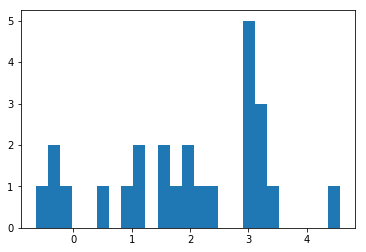

[ 1.9428215]
0.52032494545
Training epoch 61900
Iter: 61900
D loss: 2.813e-05
G_loss: -0.0115
()


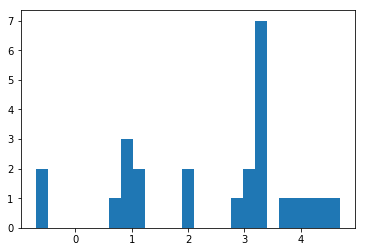

[ 2.46023818]
0.51310801506
Training epoch 62000
Iter: 62000
D loss: 4.474e-05
G_loss: -0.0133
()


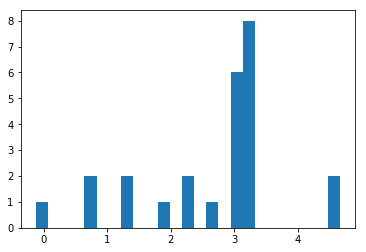

[ 2.66459459]
0.517515897751
Training epoch 62100
Iter: 62100
D loss: 3.174e-05
G_loss: -0.0132
()


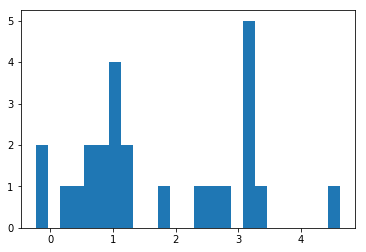

[ 1.74416221]
0.520245075226
Training epoch 62200
Iter: 62200
D loss: 3.579e-05
G_loss: -0.0114
()


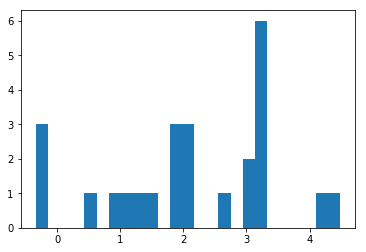

[ 2.12450532]
0.5691010952
Training epoch 62300
Iter: 62300
D loss: 2.925e-05
G_loss: -0.01276
()


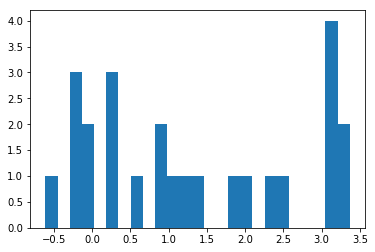

[ 1.3502979]
0.515372991562
Training epoch 62400
Iter: 62400
D loss: 3.203e-05
G_loss: -0.01321
()


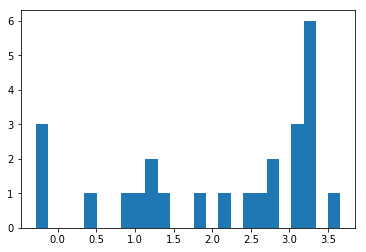

[ 2.09813562]
0.51275396347
Training epoch 62500
Iter: 62500
D loss: 3.887e-05
G_loss: -0.0124
()


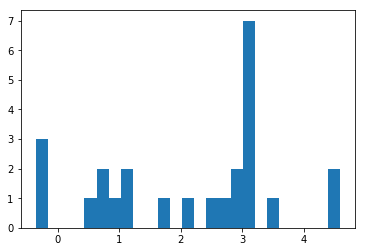

[ 2.14369342]
0.516620874405
Training epoch 62600
Iter: 62600
D loss: 3.502e-05
G_loss: -0.01324
()


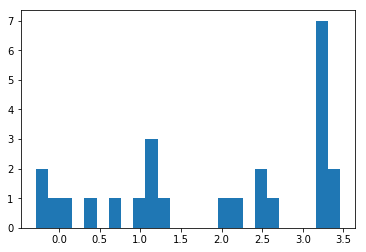

[ 1.88337973]
0.518606901169
Training epoch 62700
Iter: 62700
D loss: 3.152e-05
G_loss: -0.0132
()


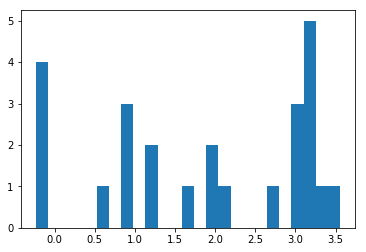

[ 1.90577825]
0.516412973404
Training epoch 62800
Iter: 62800
D loss: 3.301e-05
G_loss: -0.0128
()


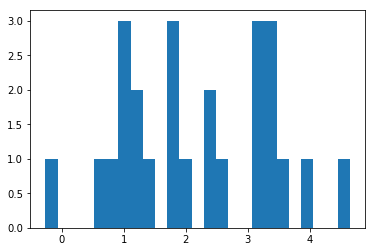

[ 2.18095615]
0.521386861801
Training epoch 62900
Iter: 62900
D loss: 3.725e-05
G_loss: -0.01286
()


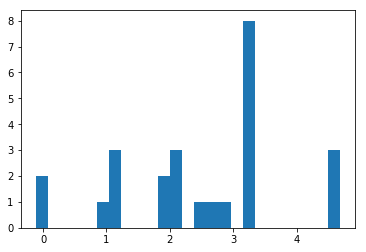

[ 2.49306733]
0.511108875275
Training epoch 63000
Iter: 63000
D loss: 3.197e-05
G_loss: -0.01333
()


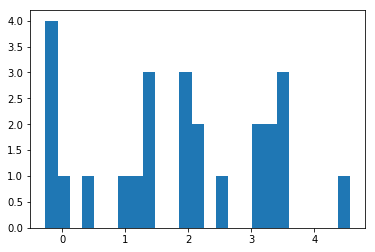

[ 1.845301]
0.511824846268
Training epoch 63100
Iter: 63100
D loss: 2.871e-05
G_loss: -0.01312
()


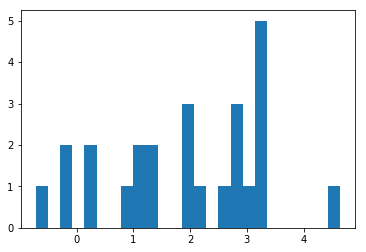

[ 1.93157713]
0.514149188995
Training epoch 63200
Iter: 63200
D loss: 3.056e-05
G_loss: -0.01271
()


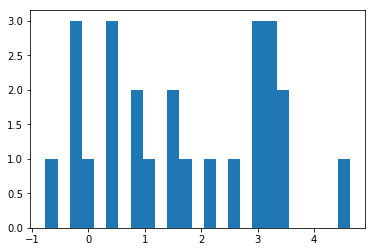

[ 1.70414518]
0.510906934738
Training epoch 63300
Iter: 63300
D loss: 3.168e-05
G_loss: -0.01289
()


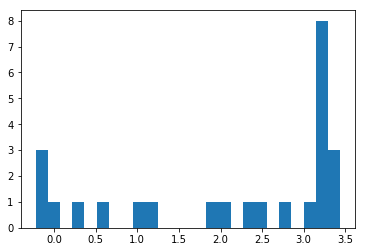

[ 2.13175639]
0.518444061279
Training epoch 63400
Iter: 63400
D loss: 3.626e-05
G_loss: -0.01245
()


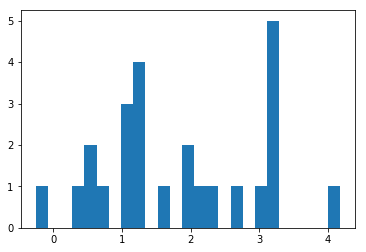

[ 1.83598701]
0.510989904404
Training epoch 63500
Iter: 63500
D loss: 2.075e-05
G_loss: -0.01347
()


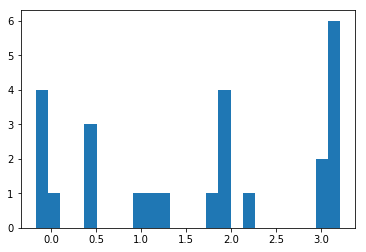

[ 1.64600759]
0.513615131378
Training epoch 63600
Iter: 63600
D loss: 3.174e-05
G_loss: -0.01309
()


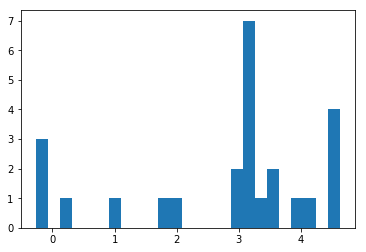

[ 2.755708]
0.5159740448
Training epoch 63700
Iter: 63700
D loss: 2.333e-05
G_loss: -0.01337
()


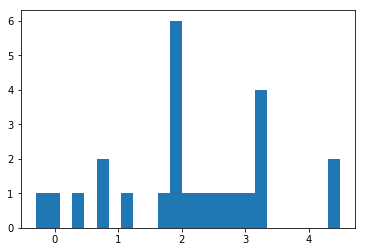

[ 2.11681993]
0.512385129929
Training epoch 63800
Iter: 63800
D loss: 4.103e-05
G_loss: -0.01388
()


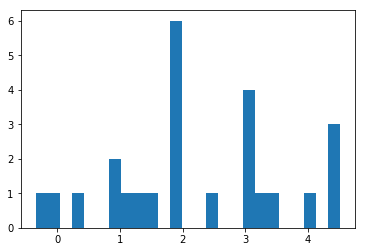

[ 2.23104974]
0.518877029419
Training epoch 63900
Iter: 63900
D loss: 2.958e-05
G_loss: -0.0133
()


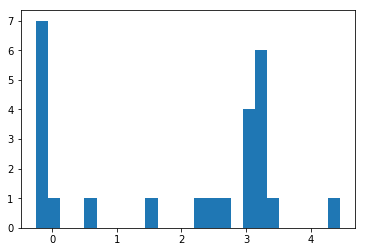

[ 1.90321841]
0.512264966965
Training epoch 64000
Iter: 64000
D loss: 2.462e-05
G_loss: -0.01351
()


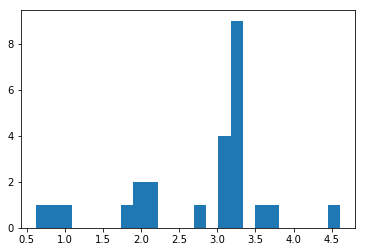

[ 2.73861461]
0.512307167053
Training epoch 64100
Iter: 64100
D loss: 3.374e-05
G_loss: -0.01339
()


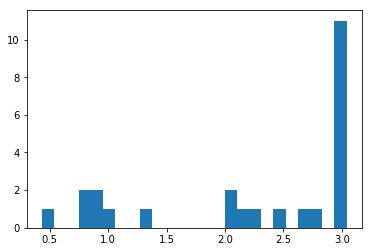

[ 2.23784134]
0.52196097374
Training epoch 64200
Iter: 64200
D loss: 3.188e-05
G_loss: -0.01315
()


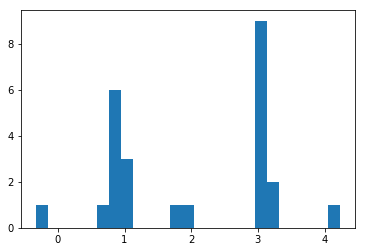

[ 2.04152703]
0.518444061279
Training epoch 64300
Iter: 64300
D loss: 3.25e-05
G_loss: -0.01337
()


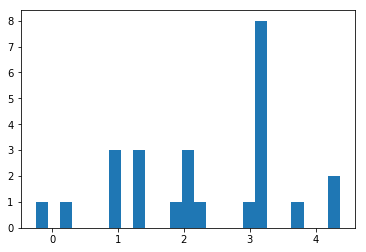

[ 2.30612169]
0.511990070343
Training epoch 64400
Iter: 64400
D loss: 2.942e-05
G_loss: -0.01214
()


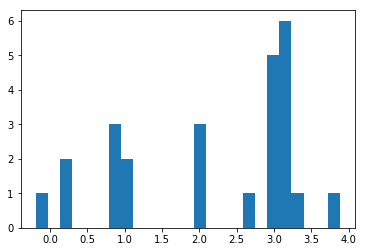

[ 2.19006337]
0.516772031784
Training epoch 64500
Iter: 64500
D loss: 2.917e-05
G_loss: -0.01253
()


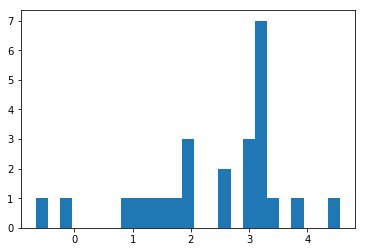

[ 2.38691578]
0.513432025909
Training epoch 64600
Iter: 64600
D loss: 2.901e-05
G_loss: -0.01067
()


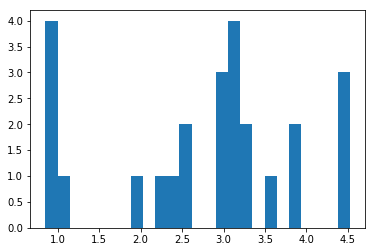

[ 2.76610129]
0.511491060257
Training epoch 64700
Iter: 64700
D loss: 4.09e-05
G_loss: -0.01322
()


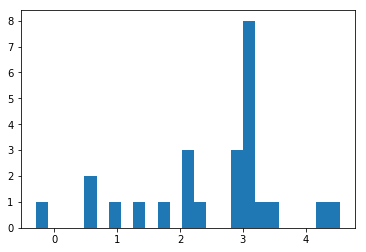

[ 2.48017049]
0.5154941082
Training epoch 64800
Iter: 64800
D loss: 3.286e-05
G_loss: -0.01325
()


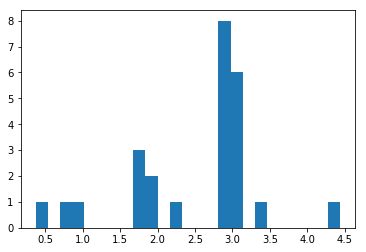

[ 2.5172751]
0.518446922302
Training epoch 64900
Iter: 64900
D loss: 3.342e-05
G_loss: -0.01401
()


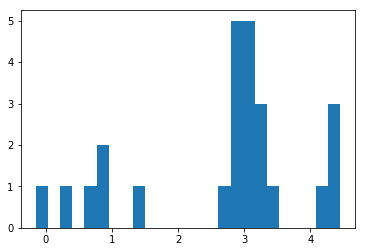

[ 2.68086071]
0.517348051071
Training epoch 65000
Iter: 65000
D loss: 3.307e-05
G_loss: -0.01287
()


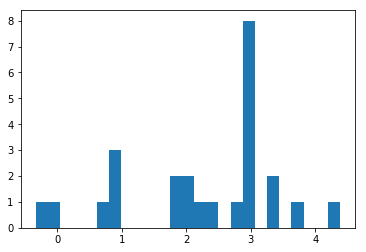

[ 2.27267735]
0.517050027847
Training epoch 65100
Iter: 65100
D loss: 2.969e-05
G_loss: -0.01332
()


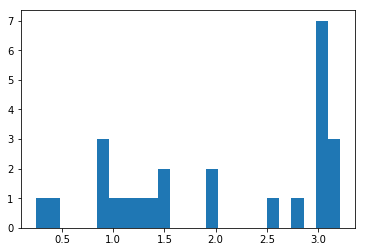

[ 2.02971185]
0.514595985413
Training epoch 65200
Iter: 65200
D loss: 2.793e-05
G_loss: -0.01193
()


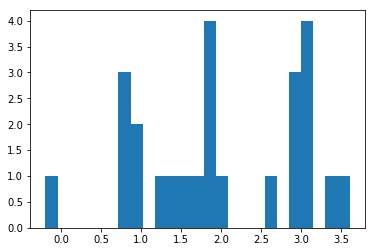

[ 2.02501391]
0.519123077393
Training epoch 65300
Iter: 65300
D loss: 4.308e-05
G_loss: -0.01081
()


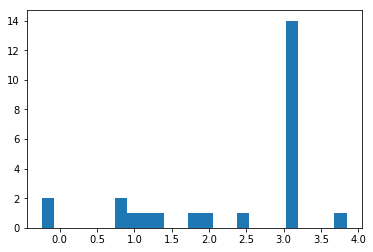

[ 2.3542883]
0.5209441185
Training epoch 65400
Iter: 65400
D loss: 2.726e-05
G_loss: -0.01321
()


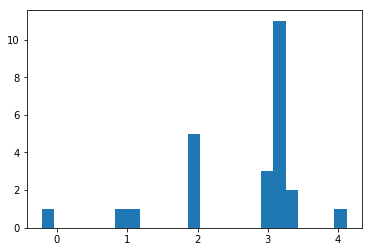

[ 2.64379162]
0.518395900726
Training epoch 65500
Iter: 65500
D loss: 3.092e-05
G_loss: -0.01268
()


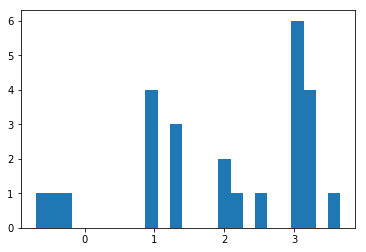

[ 1.98053791]
0.514464855194
Training epoch 65600
Iter: 65600
D loss: 2.727e-05
G_loss: -0.01272
()


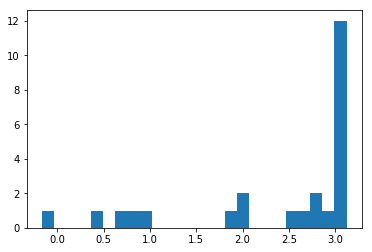

[ 2.37326373]
0.515665054321
Training epoch 65700
Iter: 65700
D loss: 3.428e-05
G_loss: -0.01228
()


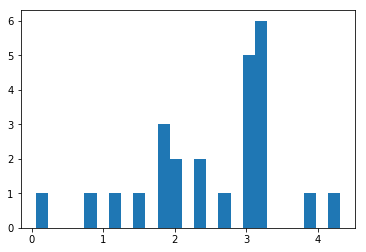

[ 2.51452898]
0.521357059479
Training epoch 65800
Iter: 65800
D loss: 3.975e-05
G_loss: -0.01137
()


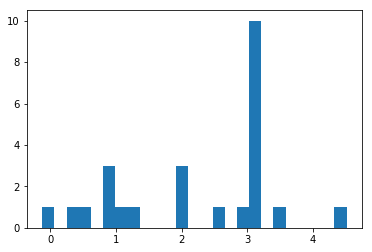

[ 2.27956869]
0.512636899948
Training epoch 65900
Iter: 65900
D loss: 3.935e-05
G_loss: -0.01303
()


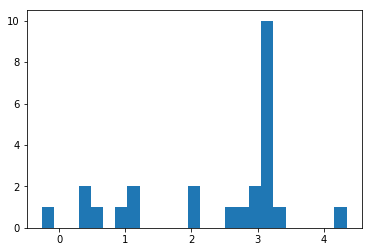

[ 2.35053511]
0.514312982559
Training epoch 66000
Iter: 66000
D loss: 3.396e-05
G_loss: -0.01317
()


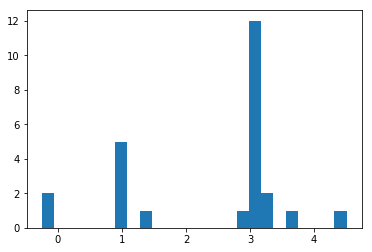

[ 2.43130066]
0.51420211792
Training epoch 66100
Iter: 66100
D loss: 3.114e-05
G_loss: -0.0131
()


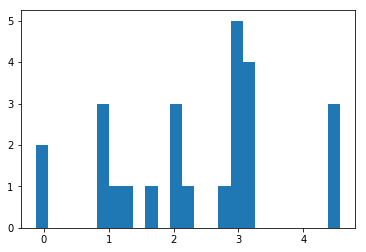

[ 2.35905135]
0.512449979782
Training epoch 66200
Iter: 66200
D loss: 2.495e-05
G_loss: -0.01338
()


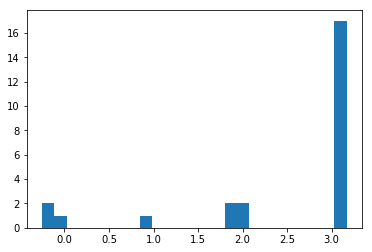

[ 2.44659696]
0.514575958252
Training epoch 66300
Iter: 66300
D loss: 3.474e-05
G_loss: -0.01214
()


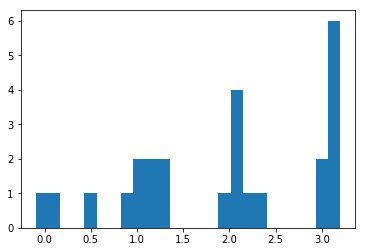

[ 1.93082177]
0.511621952057
Training epoch 66400
Iter: 66400
D loss: 3.323e-05
G_loss: -0.01302
()


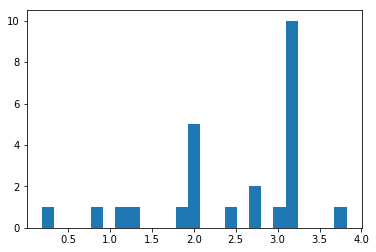

[ 2.47059856]
0.511795043945
Training epoch 66500
Iter: 66500
D loss: 3.094e-05
G_loss: -0.0133
()


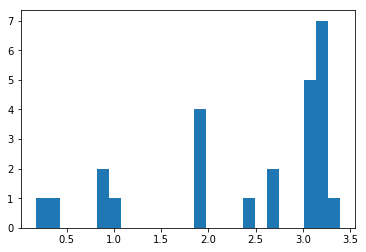

[ 2.37457119]
0.513827085495
Training epoch 66600
Iter: 66600
D loss: 2.806e-05
G_loss: -0.01276
()


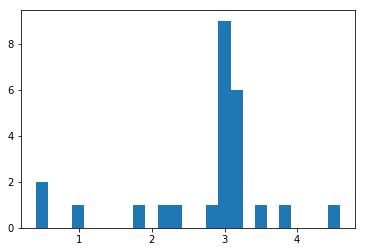

[ 2.78451721]
0.510927915573
Training epoch 66700
Iter: 66700
D loss: 3.194e-05
G_loss: -0.01235
()


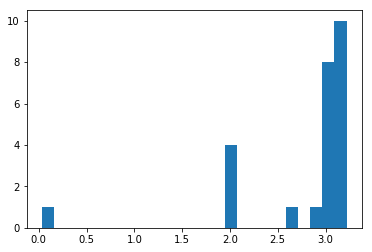

[ 2.82304978]
0.510885953903
Training epoch 66800
Iter: 66800
D loss: 2.36e-05
G_loss: -0.01343
()


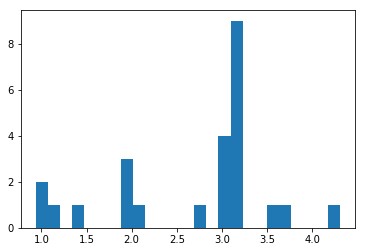

[ 2.72258055]
0.513808965683
Training epoch 66900
Iter: 66900
D loss: 2.431e-05
G_loss: -0.01275
()


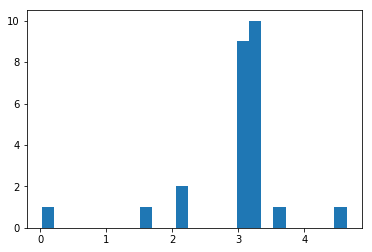

[ 3.00402606]
0.521557092667
Training epoch 67000
Iter: 67000
D loss: 3.439e-05
G_loss: -0.01256
()


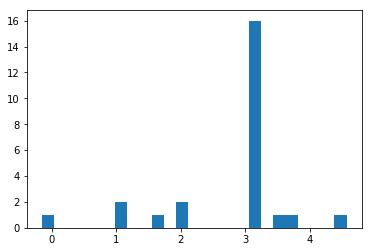

[ 2.81491731]
0.513239145279
Training epoch 67100
Iter: 67100
D loss: 3.321e-05
G_loss: -0.01284
()


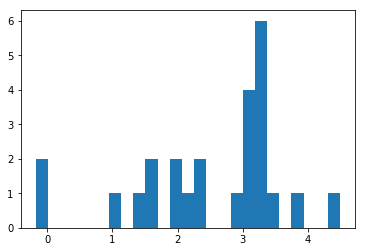

[ 2.50474839]
0.512423992157
Training epoch 67200
Iter: 67200
D loss: 3.267e-05
G_loss: -0.01337
()


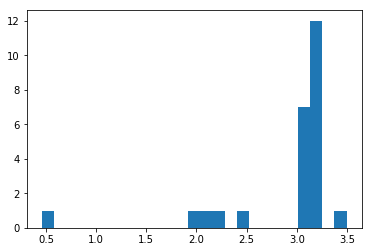

[ 2.91570466]
0.513468980789
Training epoch 67300
Iter: 67300
D loss: 2.488e-05
G_loss: -0.0133
()


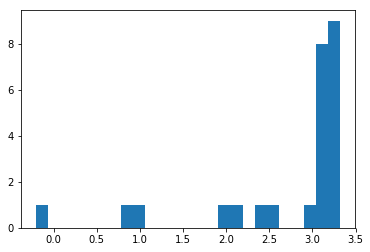

[ 2.69157633]
0.520854949951
Training epoch 67400
Iter: 67400
D loss: 2.902e-05
G_loss: -0.01344
()


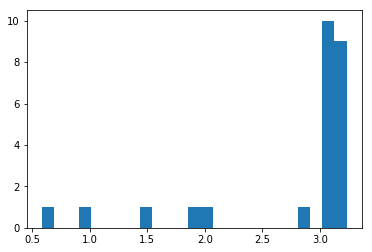

[ 2.78997417]
0.518711805344
Training epoch 67500
Iter: 67500
D loss: 3.074e-05
G_loss: -0.0127
()


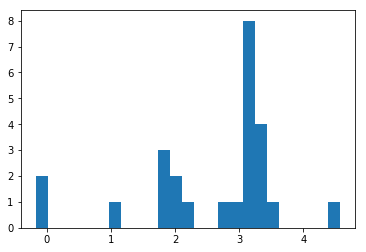

[ 2.5782052]
0.511974096298
Training epoch 67600
Iter: 67600
D loss: 3.858e-05
G_loss: -0.01324
()


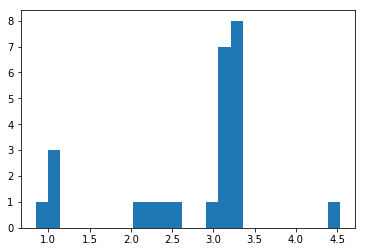

[ 2.74310181]
0.5164539814
Training epoch 67700
Iter: 67700
D loss: 3.007e-05
G_loss: -0.01135
()


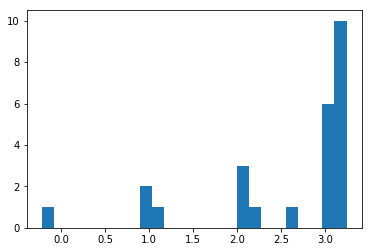

[ 2.5746574]
0.552433013916
Training epoch 67800
Iter: 67800
D loss: 3.091e-05
G_loss: -0.01323
()


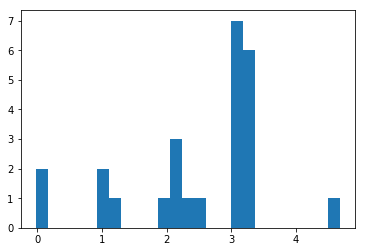

[ 2.50301188]
0.512264966965
Training epoch 67900
Iter: 67900
D loss: 2.661e-05
G_loss: -0.01327
()


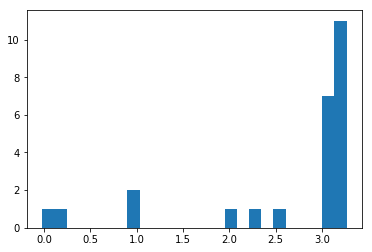

[ 2.6580284]
0.515872955322
Training epoch 68000
Iter: 68000
D loss: 2.98e-05
G_loss: -0.0127
()


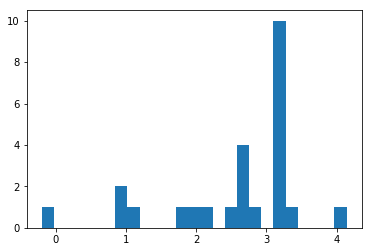

[ 2.56391825]
0.512984991074
Training epoch 68100
Iter: 68100
D loss: 3.191e-05
G_loss: -0.01215
()


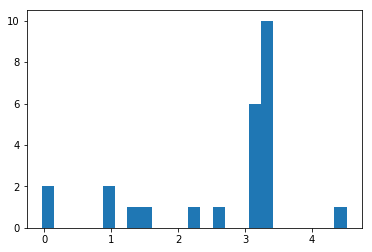

[ 2.62517702]
0.512945890427
Training epoch 68200
Iter: 68200
D loss: 2.689e-05
G_loss: -0.01266
()


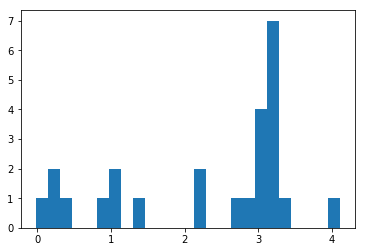

[ 2.32177349]
0.522882938385
Training epoch 68300
Iter: 68300
D loss: 2.653e-05
G_loss: -0.01322
()


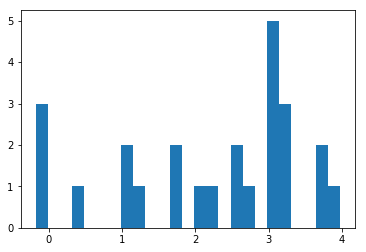

[ 2.2253451]
0.513389110565
Training epoch 68400
Iter: 68400
D loss: 1.961e-05
G_loss: -0.0135
()


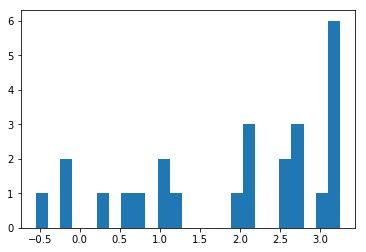

[ 1.90097848]
0.511453866959
Training epoch 68500
Iter: 68500
D loss: 2.988e-05
G_loss: -0.01088
()


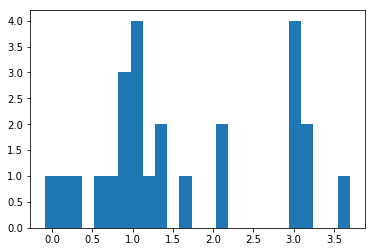

[ 1.64833505]
0.512803792953
Training epoch 68600
Iter: 68600
D loss: 4.298e-05
G_loss: -0.01333
()


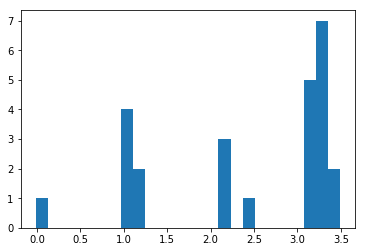

[ 2.43574202]
0.511079072952
Training epoch 68700
Iter: 68700
D loss: 3.372e-05
G_loss: -0.01104
()


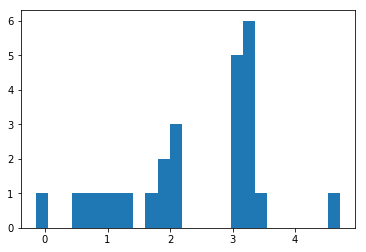

[ 2.38455949]
0.513520002365
Training epoch 68800
Iter: 68800
D loss: 3.509e-05
G_loss: -0.01336
()


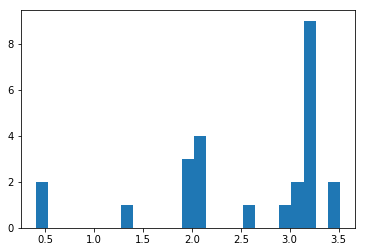

[ 2.56220999]
0.513332128525
Training epoch 68900
Iter: 68900
D loss: 3.731e-05
G_loss: -0.01332
()


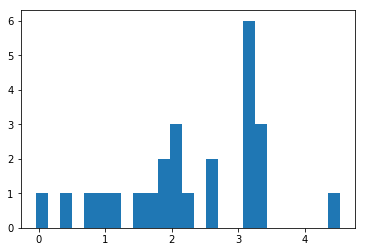

[ 2.27225235]
0.516394853592
Training epoch 69000
Iter: 69000
D loss: 3.582e-05
G_loss: -0.01324
()


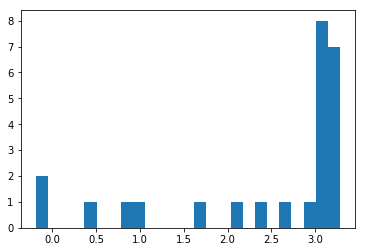

[ 2.45594664]
0.513059139252
Training epoch 69100
Iter: 69100
D loss: 2.644e-05
G_loss: -0.01342
()


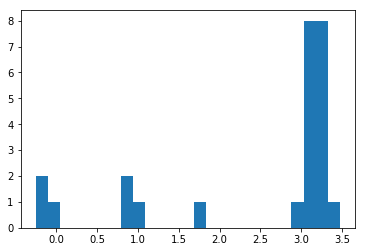

[ 2.4372662]
0.513317108154
Training epoch 69200
Iter: 69200
D loss: 3.692e-05
G_loss: -0.01133
()


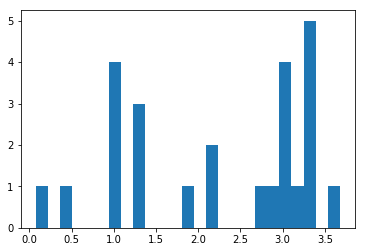

[ 2.21611504]
0.511025905609
Training epoch 69300
Iter: 69300
D loss: 3.911e-05
G_loss: -0.01379
()


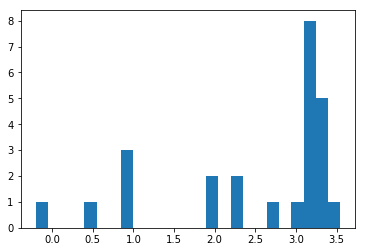

[ 2.50008195]
0.51323890686
Training epoch 69400
Iter: 69400
D loss: 3.202e-05
G_loss: -0.01283
()


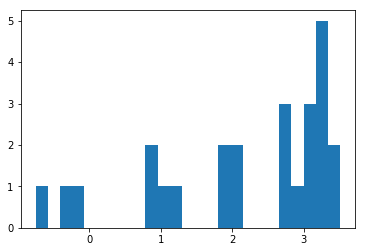

[ 2.16852219]
0.512220859528
Training epoch 69500
Iter: 69500
D loss: 2.581e-05
G_loss: -0.01296
()


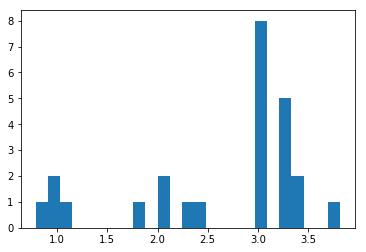

[ 2.63377173]
0.526048898697
Training epoch 69600
Iter: 69600
D loss: 3.404e-05
G_loss: -0.01302
()


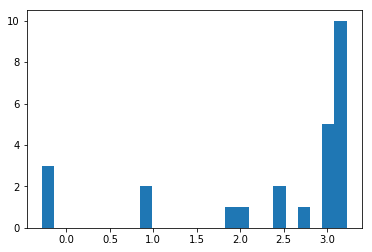

[ 2.38086992]
0.515170812607
Training epoch 69700
Iter: 69700
D loss: 2.744e-05
G_loss: -0.01315
()


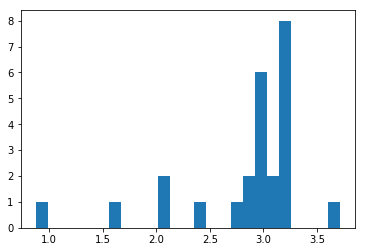

[ 2.84307358]
0.526428937912
Training epoch 69800
Iter: 69800
D loss: 3.373e-05
G_loss: -0.01302
()


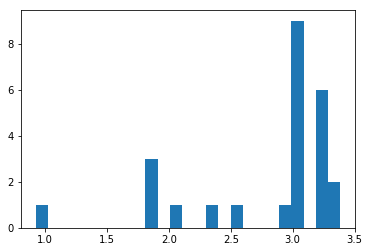

[ 2.81391418]
0.514729976654
Training epoch 69900
Iter: 69900
D loss: 3.893e-05
G_loss: -0.01322
()


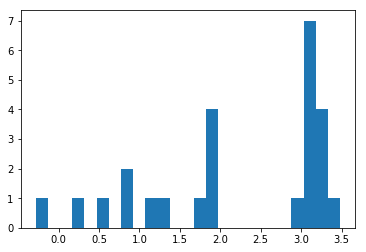

[ 2.19050697]
0.516845941544
Training epoch 70000
Iter: 70000
D loss: 3.193e-05
G_loss: -0.01209
()


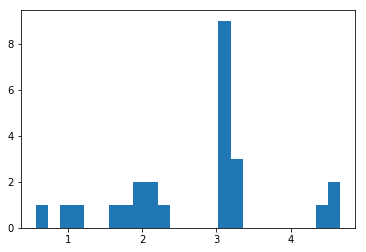

[ 2.6913695]
0.512031078339
Training epoch 70100
Iter: 70100
D loss: 3.874e-05
G_loss: -0.01311
()


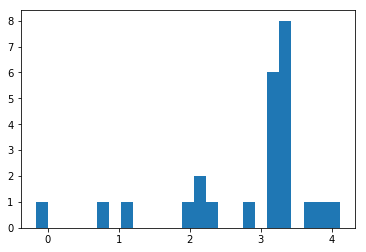

[ 2.80986993]
0.51454615593
Training epoch 70200
Iter: 70200
D loss: 3.904e-05
G_loss: -0.01331
()


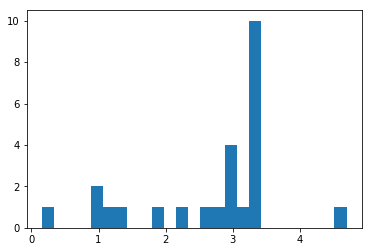

[ 2.66221912]
0.518155097961
Training epoch 70300
Iter: 70300
D loss: 2.936e-05
G_loss: -0.01329
()


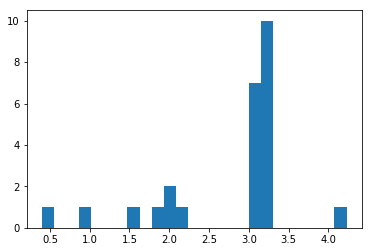

[ 2.76477838]
0.516243934631
Training epoch 70400
Iter: 70400
D loss: 2.337e-05
G_loss: -0.01351
()


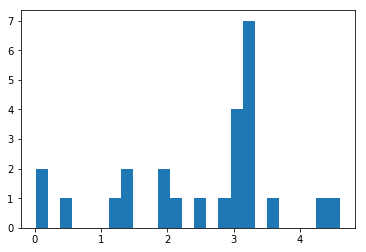

[ 2.53497608]
0.519740819931
Training epoch 70500
Iter: 70500
D loss: 3.352e-05
G_loss: -0.01327
()


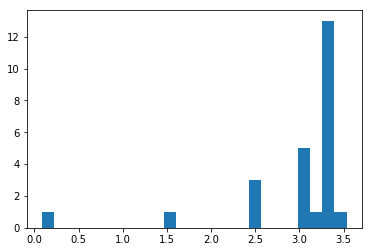

[ 2.98265504]
0.518712043762
Training epoch 70600
Iter: 70600
D loss: 2.701e-05
G_loss: -0.01325
()


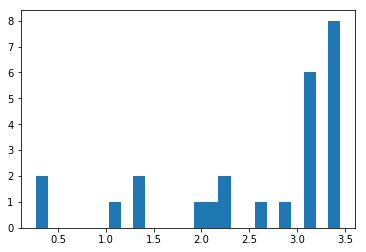

[ 2.56399343]
0.512744903564
Training epoch 70700
Iter: 70700
D loss: 3.673e-05
G_loss: -0.0137
()


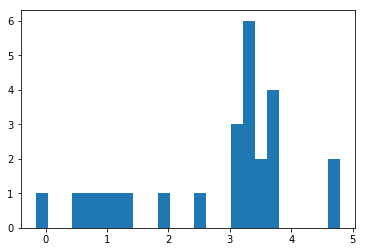

[ 2.78494916]
0.514297962189
Training epoch 70800
Iter: 70800
D loss: 3.573e-05
G_loss: -0.01164
()


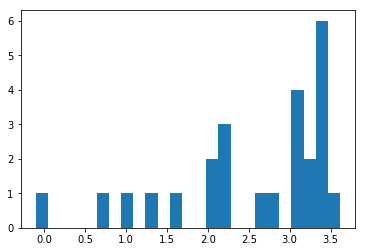

[ 2.55618635]
0.514147043228
Training epoch 70900
Iter: 70900
D loss: 2.98e-05
G_loss: -0.0134
()


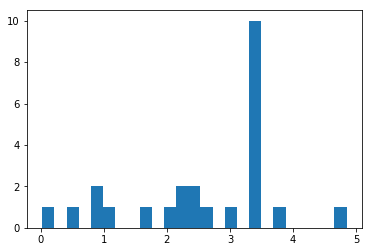

[ 2.57719627]
0.512404918671
Training epoch 71000
Iter: 71000
D loss: 4.097e-05
G_loss: -0.01281
()


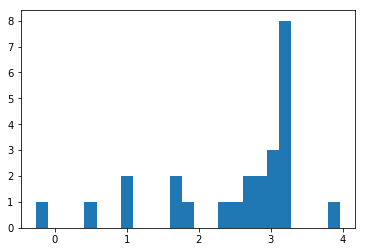

[ 2.52297478]
0.515622138977
Training epoch 71100
Iter: 71100
D loss: 4.039e-05
G_loss: -0.01288
()


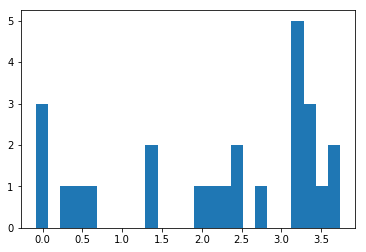

[ 2.18821675]
0.510570049286
Training epoch 71200
Iter: 71200
D loss: 3.157e-05
G_loss: -0.01342
()


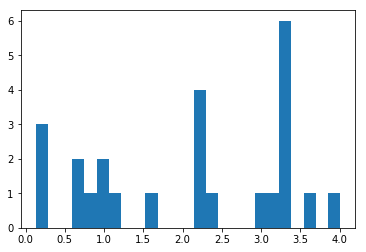

[ 2.09798358]
0.511536121368
Training epoch 71300
Iter: 71300
D loss: 2.681e-05
G_loss: -0.01391
()


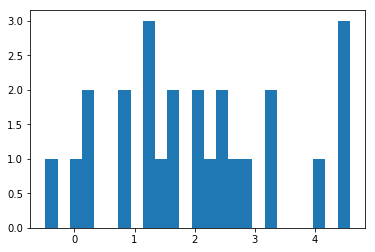

[ 2.04254331]
0.514396190643
Training epoch 71400
Iter: 71400
D loss: 3.098e-05
G_loss: -0.01348
()


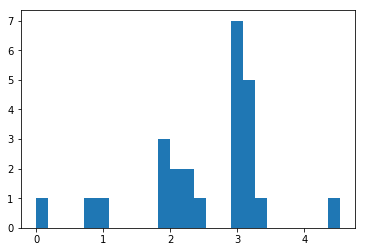

[ 2.54663893]
0.511614084244
Training epoch 71500
Iter: 71500
D loss: 3.74e-05
G_loss: -0.01013
()


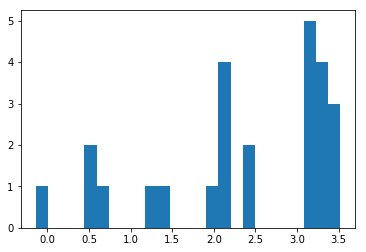

[ 2.37062706]
0.510177135468
Training epoch 71600
Iter: 71600
D loss: 3.138e-05
G_loss: -0.01346
()


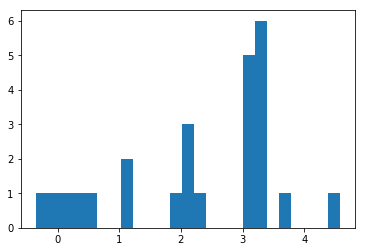

[ 2.2737414]
0.52320098877
Training epoch 71700
Iter: 71700
D loss: 2.864e-05
G_loss: -0.01323
()


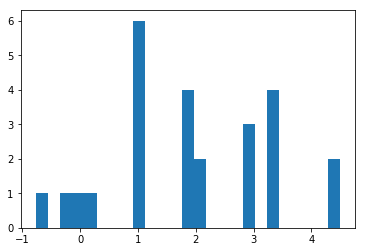

[ 1.90258394]
0.514927148819
Training epoch 71800
Iter: 71800
D loss: 3.193e-05
G_loss: -0.01309
()


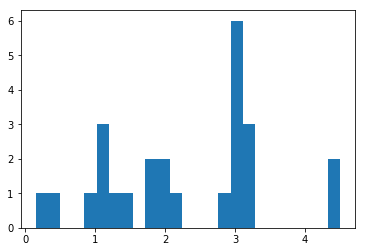

[ 2.29342113]
0.516741037369
Training epoch 71900
Iter: 71900
D loss: 4.183e-05
G_loss: -0.009621
()


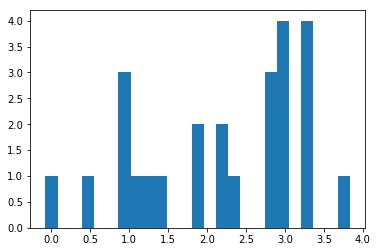

[ 2.18361717]
0.52468419075
Training epoch 72000
Iter: 72000
D loss: 3.42e-05
G_loss: -0.0132
()


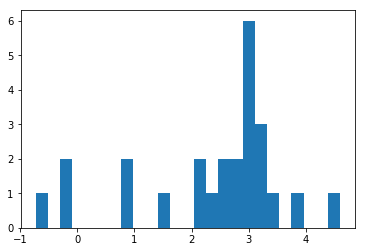

[ 2.34080034]
0.513152122498
Training epoch 72100
Iter: 72100
D loss: 2.924e-05
G_loss: -0.01313
()


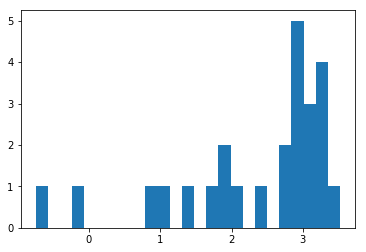

[ 2.34490551]
0.510908126831
Training epoch 72200
Iter: 72200
D loss: 3.84e-05
G_loss: -0.0122
()


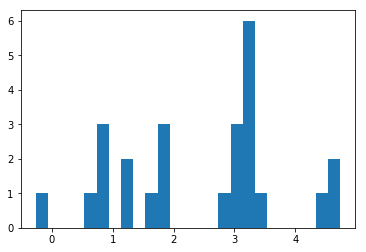

[ 2.45831154]
0.520795822144
Training epoch 72300
Iter: 72300
D loss: 2.826e-05
G_loss: -0.01331
()


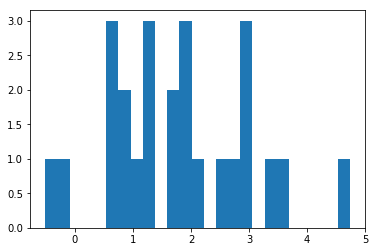

[ 1.79231811]
0.517309904099
Training epoch 72400
Iter: 72400
D loss: 2.953e-05
G_loss: -0.01308
()


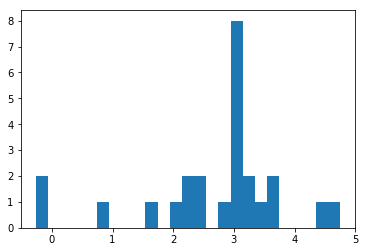

[ 2.67834376]
0.511171102524
Training epoch 72500
Iter: 72500
D loss: 3.295e-05
G_loss: -0.01336
()


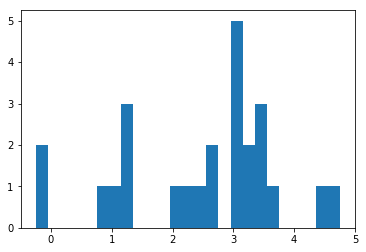

[ 2.50239296]
0.511923789978
Training epoch 72600
Iter: 72600
D loss: 3.899e-05
G_loss: -0.01093
()


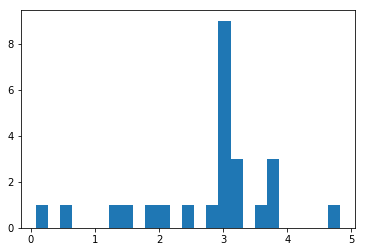

[ 2.79053592]
0.514420032501
Training epoch 72700
Iter: 72700
D loss: 3.125e-05
G_loss: -0.01241
()


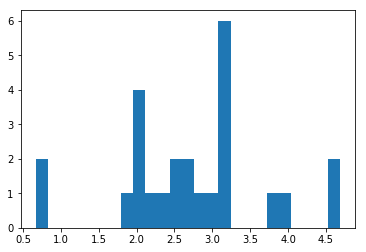

[ 2.7216051]
0.514924049377
Training epoch 72800
Iter: 72800
D loss: 2.525e-05
G_loss: -0.01385
()


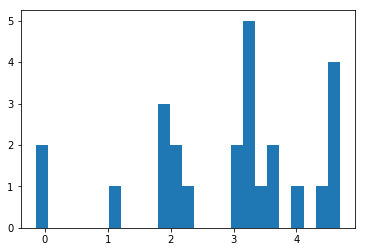

[ 2.94740429]
0.511126995087
Training epoch 72900
Iter: 72900
D loss: 3.84e-05
G_loss: -0.01261
()


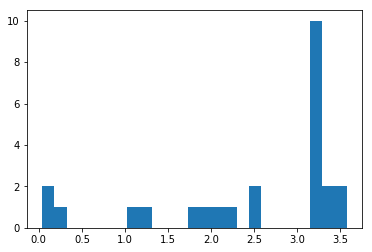

[ 2.45138312]
0.514353990555
Training epoch 73000
Iter: 73000
D loss: 3.43e-05
G_loss: -0.01309
()


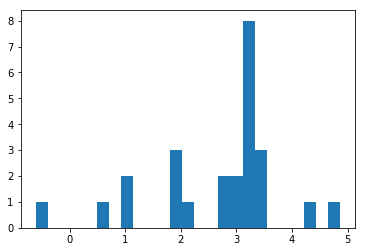

[ 2.65893622]
0.512798786163
Training epoch 73100
Iter: 73100
D loss: 3.505e-05
G_loss: -0.01034
()


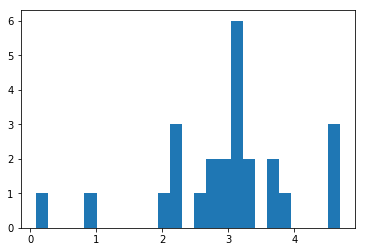

[ 2.95875062]
0.512768030167
Training epoch 73200
Iter: 73200
D loss: 3.43e-05
G_loss: -0.01335
()


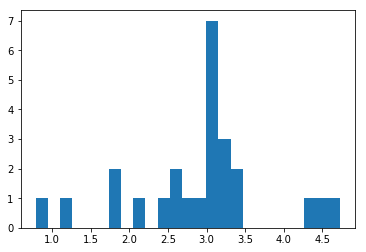

[ 2.90438425]
0.511043071747
Training epoch 73300
Iter: 73300
D loss: 4.328e-05
G_loss: -0.01322
()


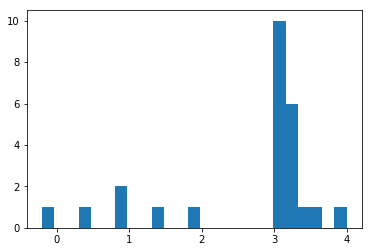

[ 2.67235622]
0.512326002121
Training epoch 73400
Iter: 73400
D loss: 2.943e-05
G_loss: -0.01337
()


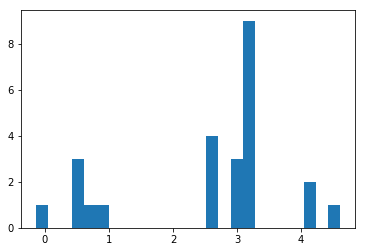

[ 2.56617487]
0.510397911072
Training epoch 73500
Iter: 73500
D loss: 4.384e-05
G_loss: -0.01374
()


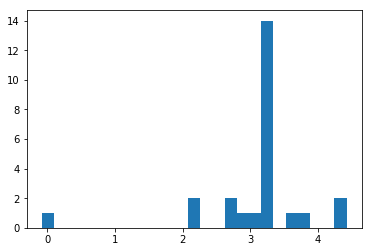

[ 3.0812694]
0.535783052444
Training epoch 73600
Iter: 73600
D loss: 4.392e-05
G_loss: -0.01302
()


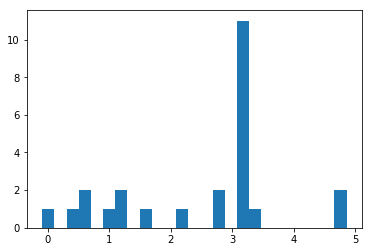

[ 2.50157672]
0.516541957855
Training epoch 73700
Iter: 73700
D loss: 3.521e-05
G_loss: -0.01319
()


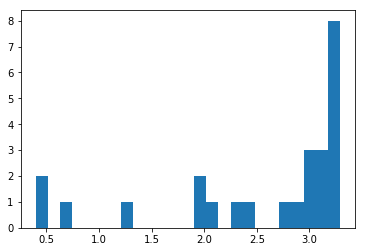

[ 2.56107765]
0.515529870987
Training epoch 73800
Iter: 73800
D loss: 3.001e-05
G_loss: -0.01328
()


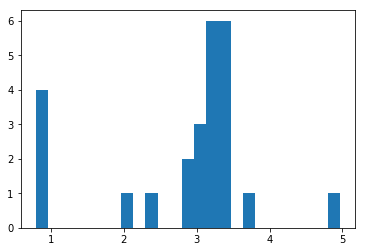

[ 2.83361426]
0.523685932159
Training epoch 73900
Iter: 73900
D loss: 3.749e-05
G_loss: -0.01321
()


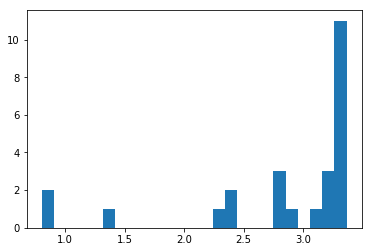

[ 2.82666594]
0.51241517067
Training epoch 74000
Iter: 74000
D loss: 3.439e-05
G_loss: -0.01325
()


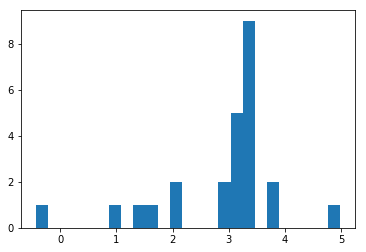

[ 2.86804709]
0.511594057083
Training epoch 74100
Iter: 74100
D loss: 2.718e-05
G_loss: -0.01322
()


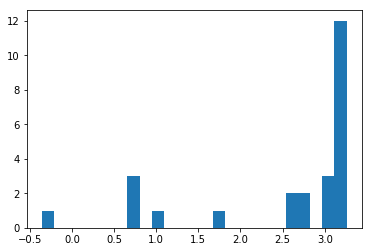

[ 2.525746]
0.512347221375
Training epoch 74200
Iter: 74200
D loss: 3.353e-05
G_loss: -0.01316
()


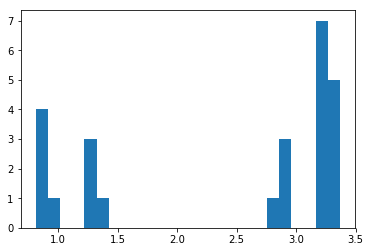

[ 2.43050048]
0.516168117523
Training epoch 74300
Iter: 74300
D loss: 2.802e-05
G_loss: -0.01311
()


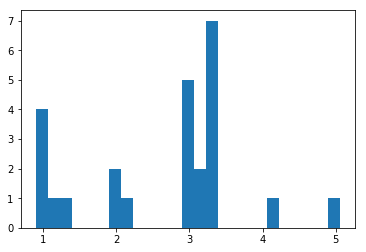

[ 2.65409876]
0.514185190201
Training epoch 74400
Iter: 74400
D loss: 3.449e-05
G_loss: -0.01332
()


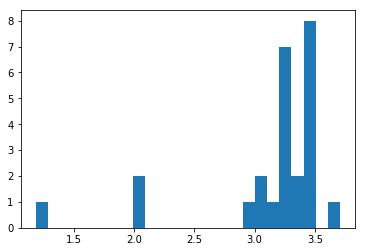

[ 3.13754755]
0.51852107048
Training epoch 74500
Iter: 74500
D loss: 3.405e-05
G_loss: -0.0132
()


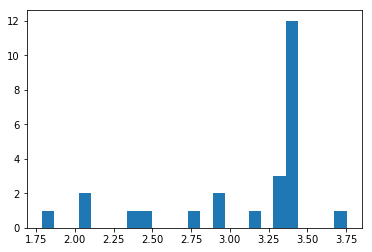

[ 3.06799764]
0.512198925018
Training epoch 74600
Iter: 74600
D loss: 3.618e-05
G_loss: -0.01313
()


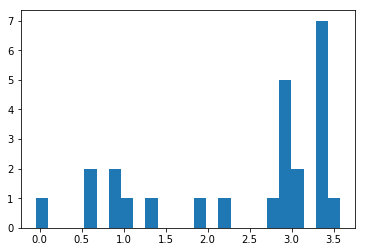

[ 2.39803423]
0.513789892197
Training epoch 74700
Iter: 74700
D loss: 2.635e-05
G_loss: -0.01323
()


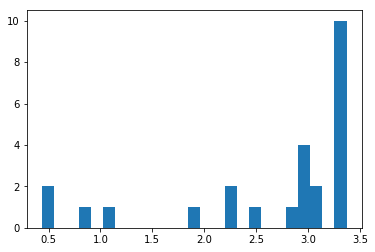

[ 2.65411478]
0.515709877014
Training epoch 74800
Iter: 74800
D loss: 4.109e-05
G_loss: -0.01319
()


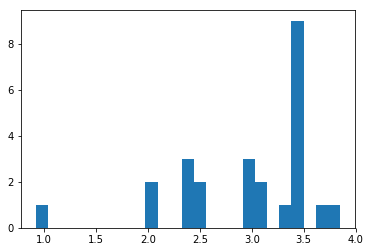

[ 2.93818733]
0.512866973877
Training epoch 74900
Iter: 74900
D loss: 3.675e-05
G_loss: -0.01255
()


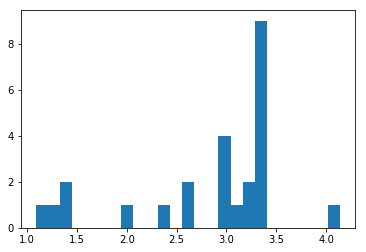

[ 2.81397507]
0.562572956085
Training epoch 75000
Iter: 75000
D loss: 2.771e-05
G_loss: -0.01328
()


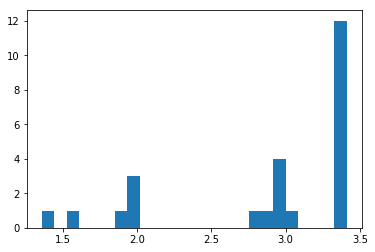

[ 2.88515676]
0.522441864014
Training epoch 75100
Iter: 75100
D loss: 3.097e-05
G_loss: -0.01193
()


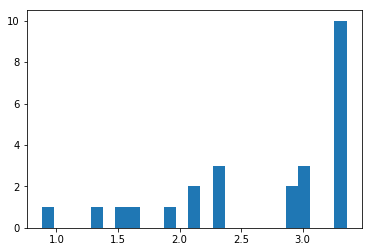

[ 2.67029858]
0.51687002182
Training epoch 75200
Iter: 75200
D loss: 2.594e-05
G_loss: -0.01224
()


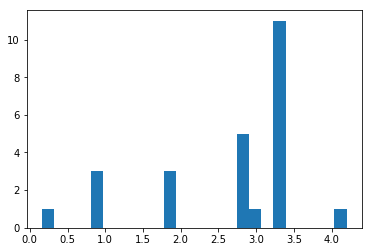

[ 2.63444121]
0.516699075699
Training epoch 75300
Iter: 75300
D loss: 3.37e-05
G_loss: -0.01312
()


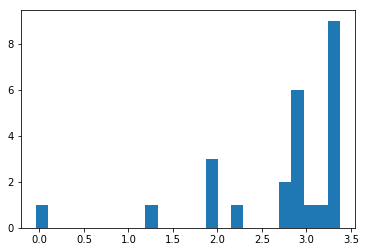

[ 2.75455248]
0.521476984024
Training epoch 75400
Iter: 75400
D loss: 4.068e-05
G_loss: -0.01246
()


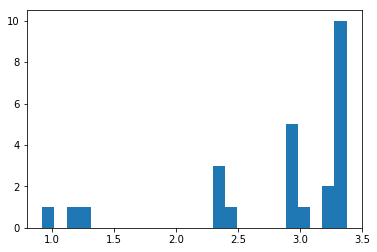

[ 2.82248189]
0.516600847244
Training epoch 75500
Iter: 75500
D loss: 3.096e-05
G_loss: -0.01246
()


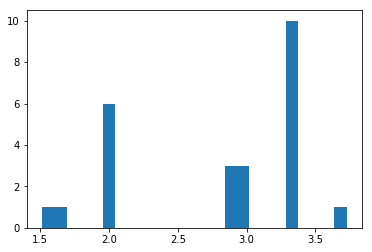

[ 2.79638333]
0.512621879578
Training epoch 75600
Iter: 75600
D loss: 4.093e-05
G_loss: -0.01166
()


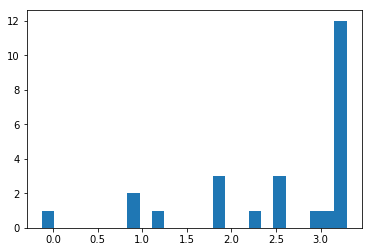

[ 2.55371302]
0.520837068558
Training epoch 75700
Iter: 75700
D loss: 3.141e-05
G_loss: -0.01269
()


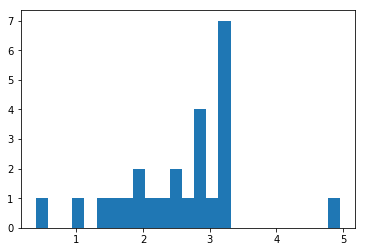

[ 2.58054491]
0.522983789444
Training epoch 75800
Iter: 75800
D loss: 3.436e-05
G_loss: -0.01228
()


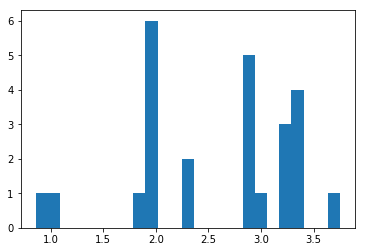

[ 2.56244549]
0.519017934799
Training epoch 75900
Iter: 75900
D loss: 3.447e-05
G_loss: -0.01221
()


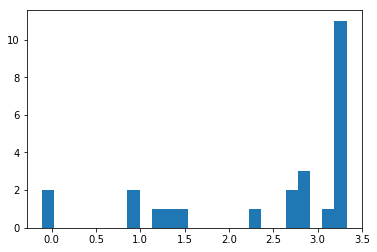

[ 2.46090747]
0.5169069767
Training epoch 76000
Iter: 76000
D loss: 3.047e-05
G_loss: -0.01312
()


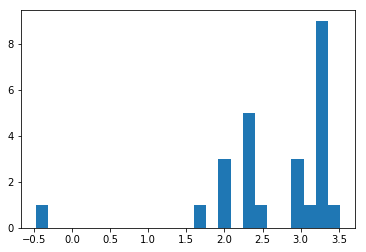

[ 2.66537748]
0.520313978195
Training epoch 76100
Iter: 76100
D loss: 3.338e-05
G_loss: -0.01264
()


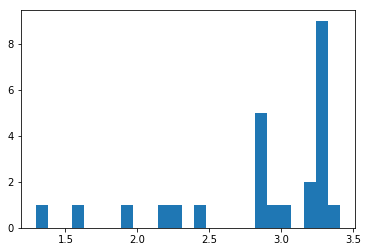

[ 2.86315749]
0.518369913101
Training epoch 76200
Iter: 76200
D loss: 3.051e-05
G_loss: -0.01337
()


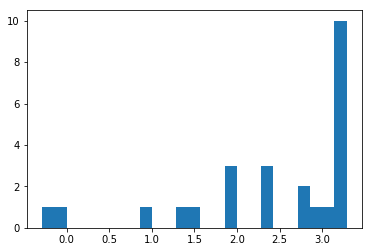

[ 2.41686919]
0.516673088074
Training epoch 76300
Iter: 76300
D loss: 3.573e-05
G_loss: -0.01316
()


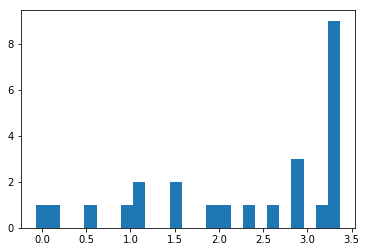

[ 2.29450754]
0.518010854721
Training epoch 76400
Iter: 76400
D loss: 3.769e-05
G_loss: -0.01308
()


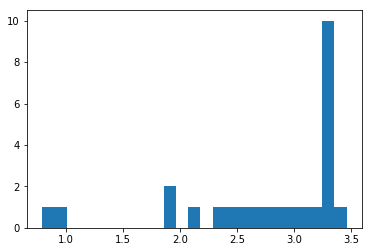

[ 2.77410518]
0.510420084
Training epoch 76500
Iter: 76500
D loss: 4.193e-05
G_loss: -0.01164
()


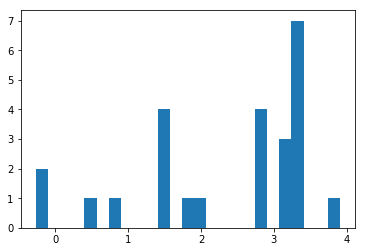

[ 2.32428309]
0.511815071106
Training epoch 76600
Iter: 76600
D loss: 2.821e-05
G_loss: -0.01319
()


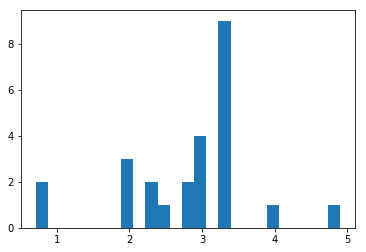

[ 2.82946513]
0.518877983093
Training epoch 76700
Iter: 76700
D loss: 3.202e-05
G_loss: -0.01319
()


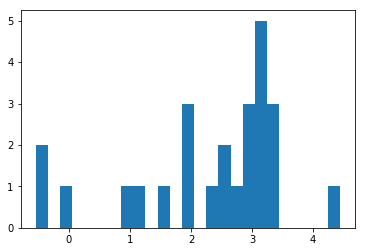

[ 2.2687169]
0.513561964035
Training epoch 76800
Iter: 76800
D loss: 3.204e-05
G_loss: -0.01329
()


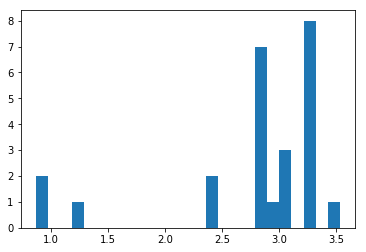

[ 2.79140867]
0.512102127075
Training epoch 76900
Iter: 76900
D loss: 2.759e-05
G_loss: -0.01312
()


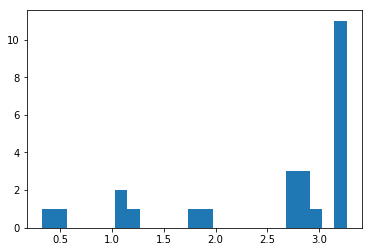

[ 2.53113325]
0.511258125305
Training epoch 77000
Iter: 77000
D loss: 3.121e-05
G_loss: -0.01145
()


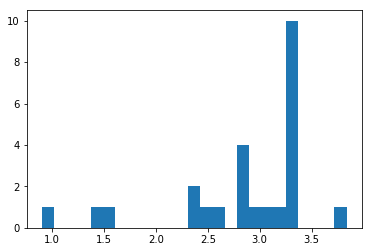

[ 2.85179813]
0.51185297966
Training epoch 77100
Iter: 77100
D loss: 3.406e-05
G_loss: -0.01325
()


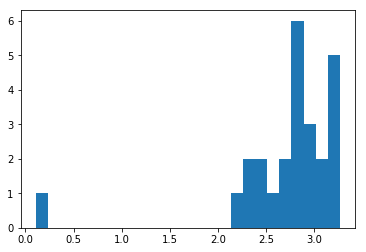

[ 2.73677963]
0.512966871262
Training epoch 77200
Iter: 77200
D loss: 2.509e-05
G_loss: -0.01286
()


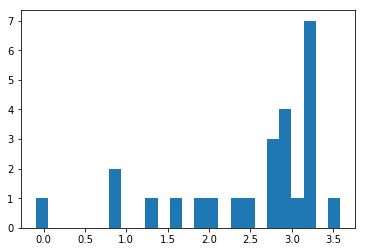

[ 2.50515566]
0.594737052917
Training epoch 77300
Iter: 77300
D loss: 2.487e-05
G_loss: -0.01285
()


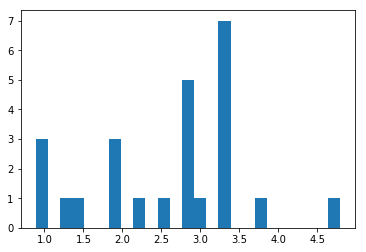

[ 2.59191571]
0.525038003922
Training epoch 77400
Iter: 77400
D loss: 2.838e-05
G_loss: -0.01339
()


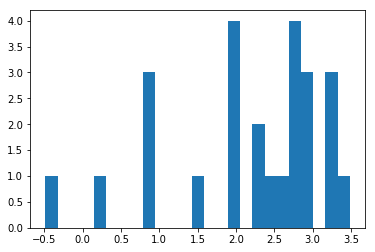

[ 2.19402878]
0.518814086914
Training epoch 77500
Iter: 77500
D loss: 2.644e-05
G_loss: -0.01271
()


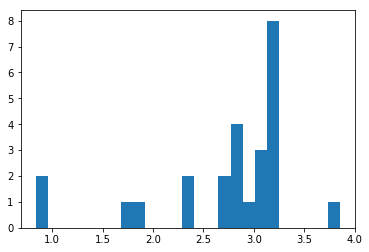

[ 2.74654304]
0.519034862518
Training epoch 77600
Iter: 77600
D loss: 2.878e-05
G_loss: -0.01341
()


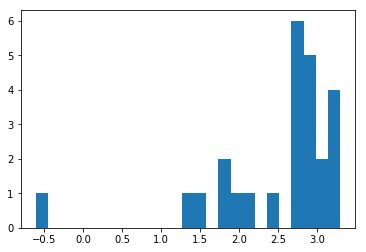

[ 2.50599231]
0.511157989502
Training epoch 77700
Iter: 77700
D loss: 3.33e-05
G_loss: -0.01294
()


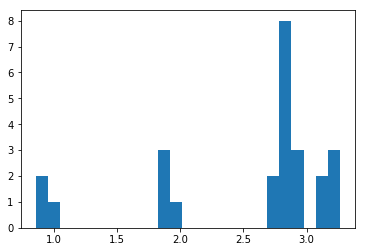

[ 2.52922087]
0.512890100479
Training epoch 77800
Iter: 77800
D loss: 3.396e-05
G_loss: -0.01325
()


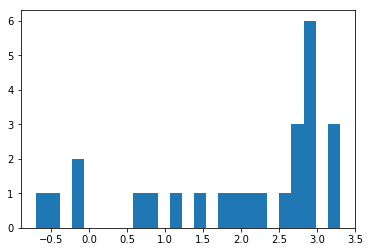

[ 1.95879219]
0.511834144592
Training epoch 77900
Iter: 77900
D loss: 3.188e-05
G_loss: -0.01335
()


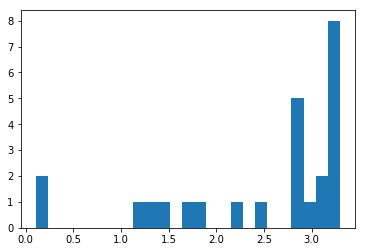

[ 2.49491368]
0.511396884918
Training epoch 78000
Iter: 78000
D loss: 3.887e-05
G_loss: -0.01328
()


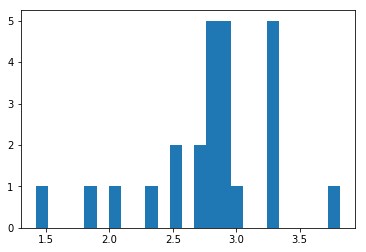

[ 2.79839056]
0.512713909149
Training epoch 78100
Iter: 78100
D loss: 3.55e-05
G_loss: -0.01319
()


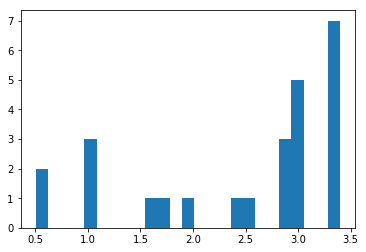

[ 2.46503753]
0.513150930405
Training epoch 78200
Iter: 78200
D loss: 3.467e-05
G_loss: -0.01342
()


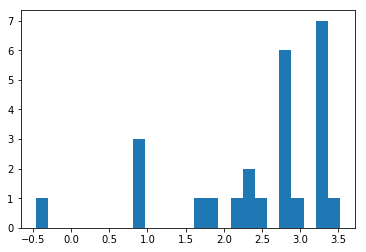

[ 2.44955481]
0.512812852859
Training epoch 78300
Iter: 78300
D loss: 3.547e-05
G_loss: -0.01228
()


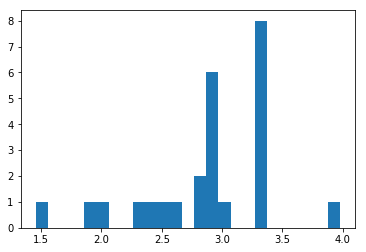

[ 2.88874642]
0.512409210205
Training epoch 78400
Iter: 78400
D loss: 2.654e-05
G_loss: -0.01338
()


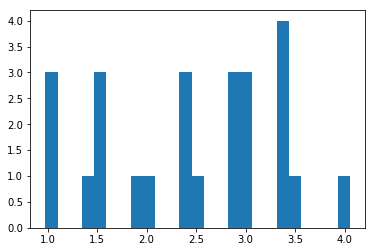

[ 2.45395953]
0.514890909195
Training epoch 78500
Iter: 78500
D loss: 3.244e-05
G_loss: -0.01217
()


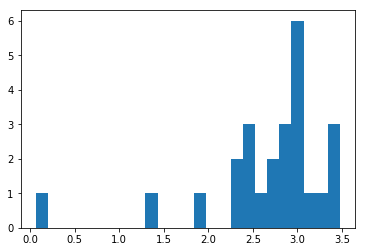

[ 2.65323102]
0.514210939407
Training epoch 78600
Iter: 78600
D loss: 2.302e-05
G_loss: -0.01297
()


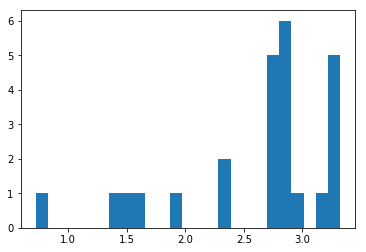

[ 2.62985952]
0.51850605011
Training epoch 78700
Iter: 78700
D loss: 3.185e-05
G_loss: -0.01318
()


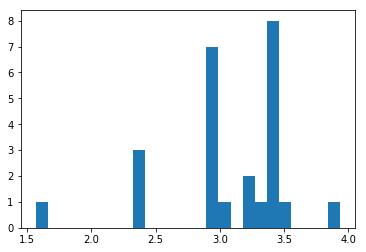

[ 3.07120945]
0.527497053146
Training epoch 78800
Iter: 78800
D loss: 3.715e-05
G_loss: -0.009913
()


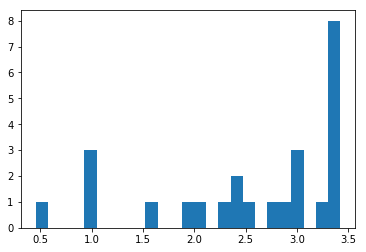

[ 2.54941911]
0.51553106308
Training epoch 78900
Iter: 78900
D loss: 3.013e-05
G_loss: -0.01328
()


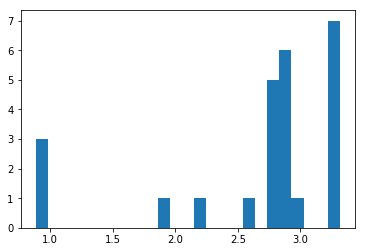

[ 2.66708593]
0.516321897507
Training epoch 79000
Iter: 79000
D loss: 3.811e-05
G_loss: -0.01336
()


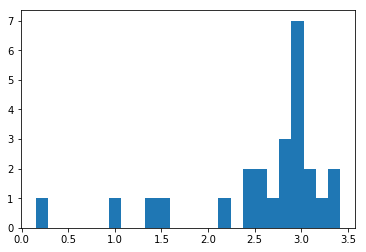

[ 2.58006053]
0.519425153732
Training epoch 79100
Iter: 79100
D loss: 3.775e-05
G_loss: -0.01343
()


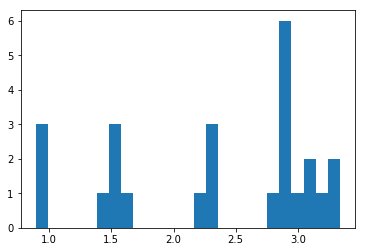

[ 2.34898057]
0.512712001801
Training epoch 79200
Iter: 79200
D loss: 3.11e-05
G_loss: -0.01306
()


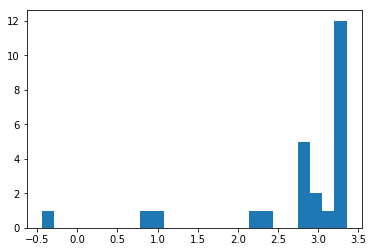

[ 2.74421806]
0.522052049637
Training epoch 79300
Iter: 79300
D loss: 3.74e-05
G_loss: -0.01256
()


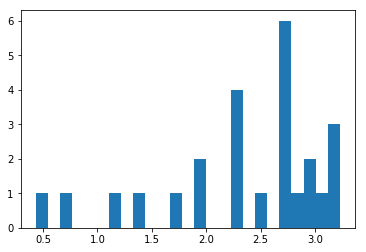

[ 2.34542241]
0.51229596138
Training epoch 79400
Iter: 79400
D loss: 2.793e-05
G_loss: -0.01343
()


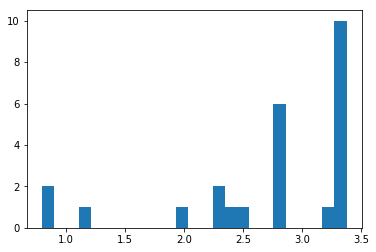

[ 2.68167234]
0.516700983047
Training epoch 79500
Iter: 79500
D loss: 3.711e-05
G_loss: -0.01375
()


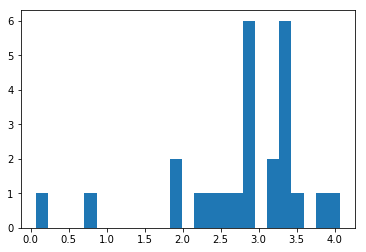

[ 2.7688971]
0.511151075363
Training epoch 79600
Iter: 79600
D loss: 3.084e-05
G_loss: -0.01255
()


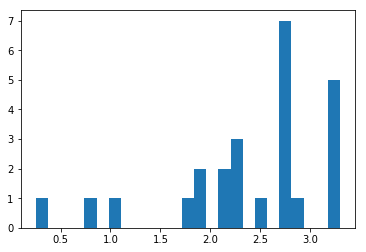

[ 2.4006731]
0.512885093689
Training epoch 79700
Iter: 79700
D loss: 2.785e-05
G_loss: -0.01324
()


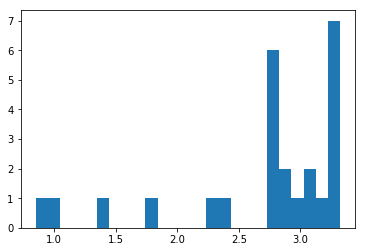

[ 2.69626179]
0.522295951843
Training epoch 79800
Iter: 79800
D loss: 3.033e-05
G_loss: -0.01347
()


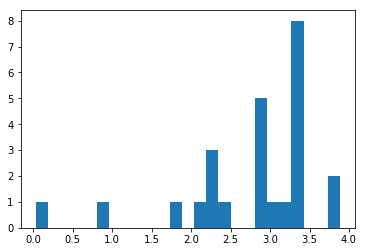

[ 2.75646243]
0.513422966003
Training epoch 79900
Iter: 79900
D loss: 4.424e-05
G_loss: -0.01398
()


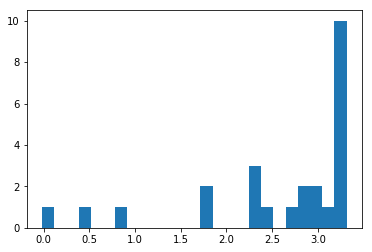

[ 2.59242181]
0.512095928192
Training epoch 80000
Iter: 80000
D loss: 3.024e-05
G_loss: -0.01154
()


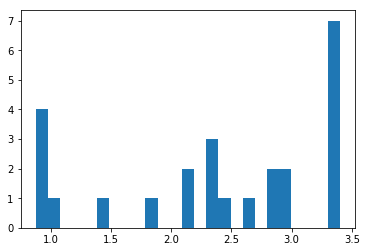

[ 2.38028774]
0.511208057404
Training epoch 80100
Iter: 80100
D loss: 2.979e-05
G_loss: -0.01336
()


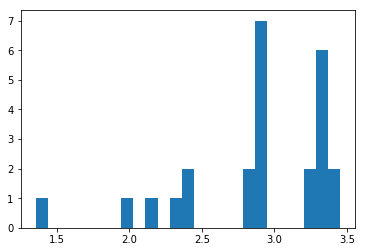

[ 2.87993418]
0.512177944183
Training epoch 80200
Iter: 80200
D loss: 2.963e-05
G_loss: -0.01325
()


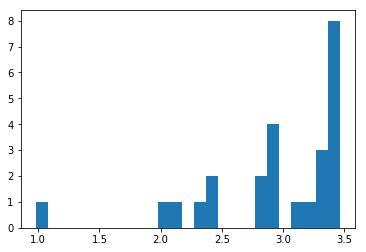

[ 2.92940033]
0.513182878494
Training epoch 80300
Iter: 80300
D loss: 2.639e-05
G_loss: -0.01338
()


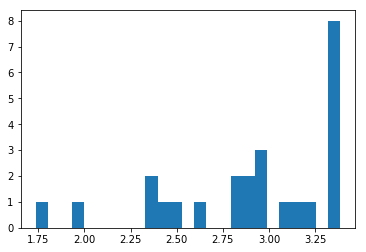

[ 2.91639546]
0.510947942734
Training epoch 80400
Iter: 80400
D loss: 3.462e-05
G_loss: -0.01267
()


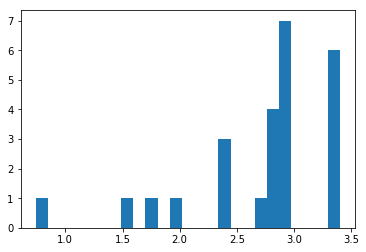

[ 2.7154142]
0.51846408844
Training epoch 80500
Iter: 80500
D loss: 2.811e-05
G_loss: -0.01195
()


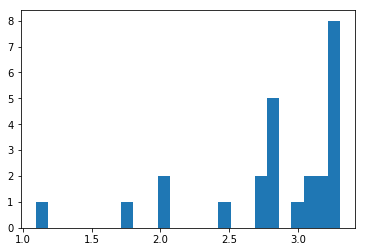

[ 2.81994115]
0.518814086914
Training epoch 80600
Iter: 80600
D loss: 3.191e-05
G_loss: -0.01222
()


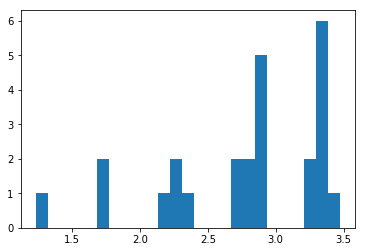

[ 2.77092303]
0.51452088356
Training epoch 80700
Iter: 80700
D loss: 3.437e-05
G_loss: -0.0133
()


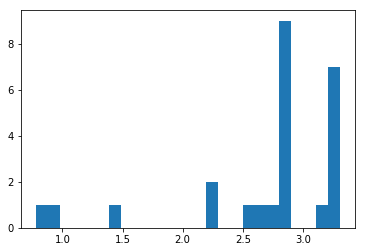

[ 2.68094508]
0.514777183533
Training epoch 80800
Iter: 80800
D loss: 3.092e-05
G_loss: -0.01397
()


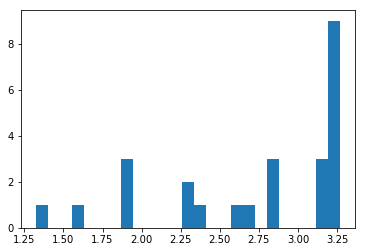

[ 2.72605545]
0.512305021286
Training epoch 80900
Iter: 80900
D loss: 3.471e-05
G_loss: -0.01249
()


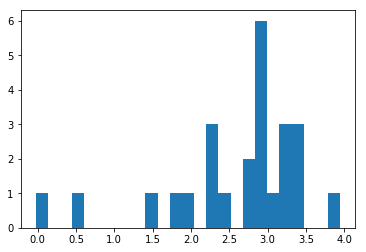

[ 2.58711827]
0.516772985458
Training epoch 81000
Iter: 81000
D loss: 2.747e-05
G_loss: -0.01277
()


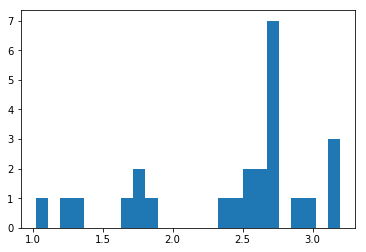

[ 2.41163384]
0.512756824493
Training epoch 81100
Iter: 81100
D loss: 1.996e-05
G_loss: -0.01356
()


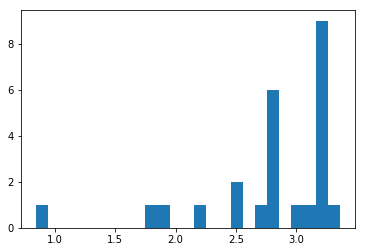

[ 2.7946413]
0.511096000671
Training epoch 81200
Iter: 81200
D loss: 3.072e-05
G_loss: -0.01318
()


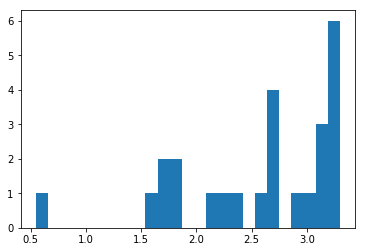

[ 2.56368645]
0.512355089188
Training epoch 81300
Iter: 81300
D loss: 3.288e-05
G_loss: -0.01331
()


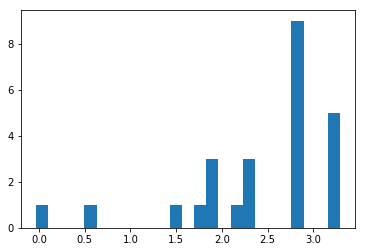

[ 2.4024984]
0.51215004921
Training epoch 81400
Iter: 81400
D loss: 3.151e-05
G_loss: -0.0132
()


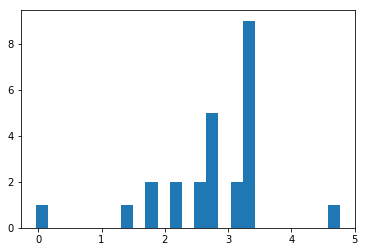

[ 2.75262816]
0.51619386673
Training epoch 81500
Iter: 81500
D loss: 3.539e-05
G_loss: -0.01271
()


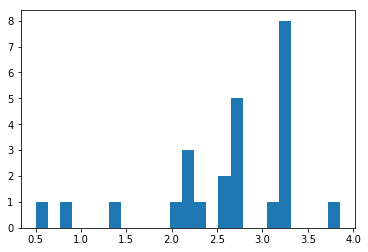

[ 2.63263945]
0.509550094604
Training epoch 81600
Iter: 81600
D loss: 2.938e-05
G_loss: -0.01293
()


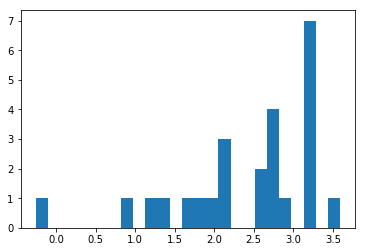

[ 2.38856225]
0.514871835709
Training epoch 81700
Iter: 81700
D loss: 3.337e-05
G_loss: -0.01315
()


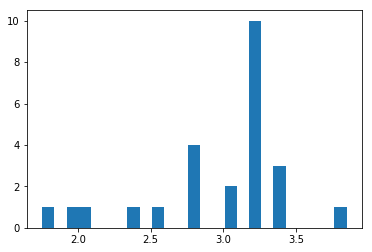

[ 2.97338992]
0.51304602623
Training epoch 81800
Iter: 81800
D loss: 3.525e-05
G_loss: -0.01261
()


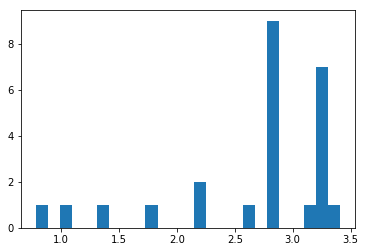

[ 2.67761515]
0.512162923813
Training epoch 81900
Iter: 81900
D loss: 2.954e-05
G_loss: -0.01296
()


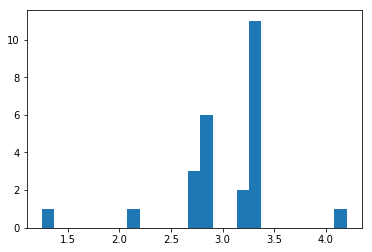

[ 3.01013961]
0.511262893677
Training epoch 82000
Iter: 82000
D loss: 3.342e-05
G_loss: -0.01235
()


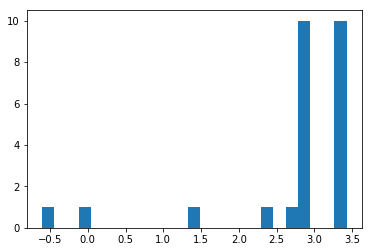

[ 2.68204286]
0.511762142181
Training epoch 82100
Iter: 82100
D loss: 3.185e-05
G_loss: -0.0117
()


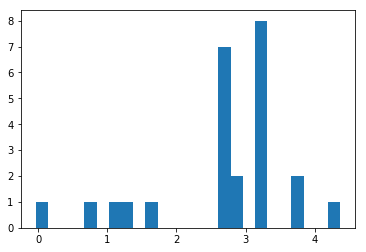

[ 2.69964246]
0.511116981506
Training epoch 82200
Iter: 82200
D loss: 2.899e-05
G_loss: -0.01231
()


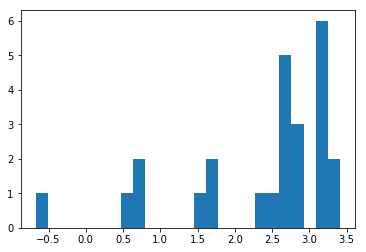

[ 2.37256753]
0.513057947159
Training epoch 82300
Iter: 82300
D loss: 2.295e-05
G_loss: -0.01335
()


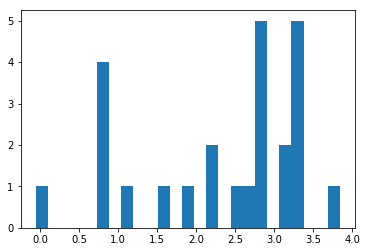

[ 2.29795978]
0.514375925064
Training epoch 82400
Iter: 82400
D loss: 2.719e-05
G_loss: -0.01272
()


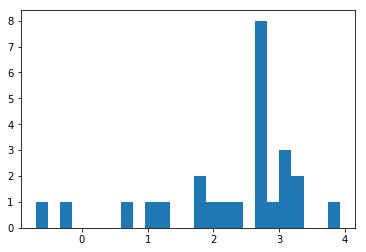

[ 2.29350787]
0.518497943878
Training epoch 82500
Iter: 82500
D loss: 3.616e-05
G_loss: -0.01225
()


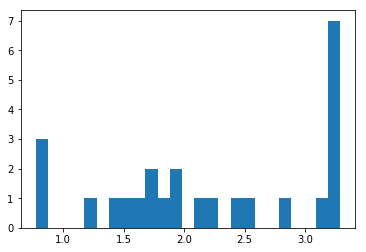

[ 2.22395034]
0.514003038406
Training epoch 82600
Iter: 82600
D loss: 2.919e-05
G_loss: -0.01267
()


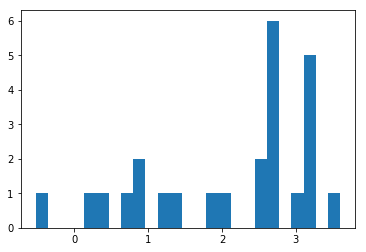

[ 2.14534651]
0.514457941055
Training epoch 82700
Iter: 82700
D loss: 3.771e-05
G_loss: -0.01336
()


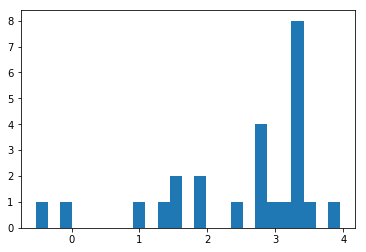

[ 2.50515951]
0.516282081604
Training epoch 82800
Iter: 82800
D loss: 3.018e-05
G_loss: -0.01218
()


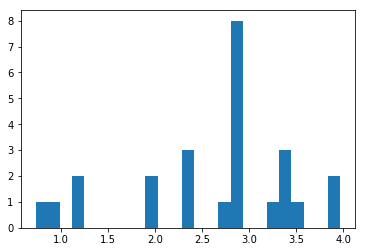

[ 2.61821332]
0.512752056122
Training epoch 82900
Iter: 82900
D loss: 3.491e-05
G_loss: -0.0126
()


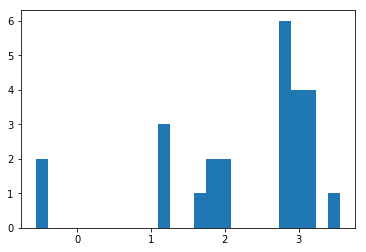

[ 2.28300822]
0.515403985977
Training epoch 83000
Iter: 83000
D loss: 3.596e-05
G_loss: -0.009354
()


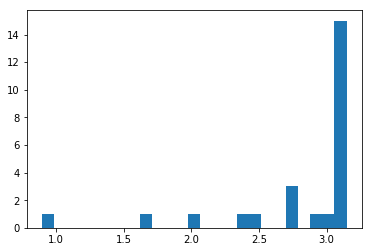

[ 2.82148103]
0.514249801636
Training epoch 83100
Iter: 83100
D loss: 2.79e-05
G_loss: -0.01331
()


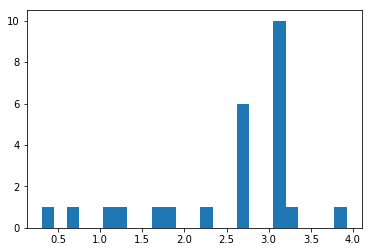

[ 2.53998083]
0.519447088242
Training epoch 83200
Iter: 83200
D loss: 2.802e-05
G_loss: -0.01324
()


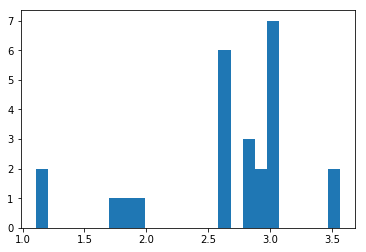

[ 2.66214312]
0.551702022552
Training epoch 83300
Iter: 83300
D loss: 3.356e-05
G_loss: -0.01213
()


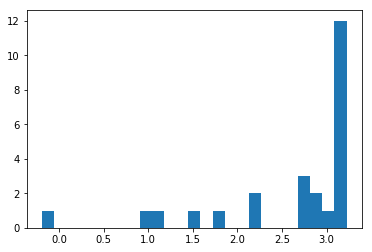

[ 2.56256033]
0.51341509819
Training epoch 83400
Iter: 83400
D loss: 3.372e-05
G_loss: -0.01322
()


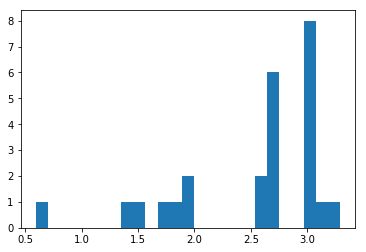

[ 2.51051975]
0.512985944748
Training epoch 83500
Iter: 83500
D loss: 3.048e-05
G_loss: -0.01325
()


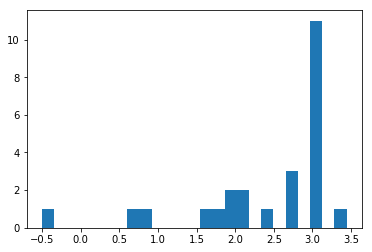

[ 2.43242831]
0.515247106552
Training epoch 83600
Iter: 83600
D loss: 3.194e-05
G_loss: -0.01328
()


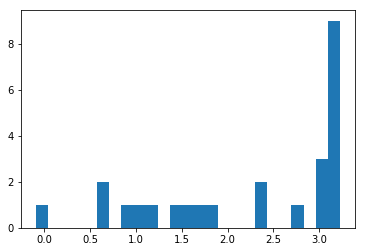

[ 2.22589213]
0.513201951981
Training epoch 83700
Iter: 83700
D loss: 3.27e-05
G_loss: -0.01299
()


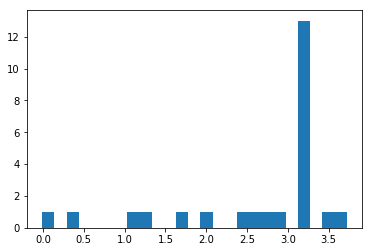

[ 2.63269523]
0.511837005615
Training epoch 83800
Iter: 83800
D loss: 3.057e-05
G_loss: -0.01198
()


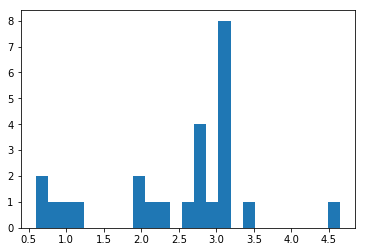

[ 2.48941229]
0.513311862946
Training epoch 83900
Iter: 83900
D loss: 4.281e-05
G_loss: -0.01233
()


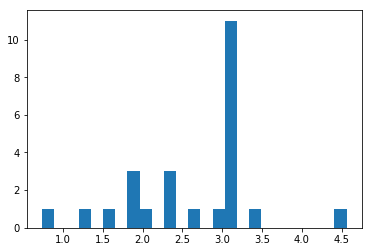

[ 2.64968349]
0.521208047867
Training epoch 84000
Iter: 84000
D loss: 2.784e-05
G_loss: -0.01333
()


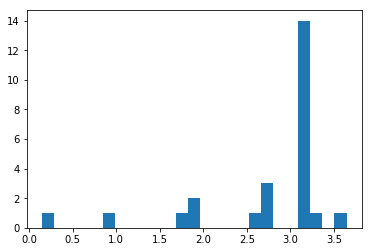

[ 2.72341113]
0.523423910141
Training epoch 84100
Iter: 84100
D loss: 3.395e-05
G_loss: -0.01159
()


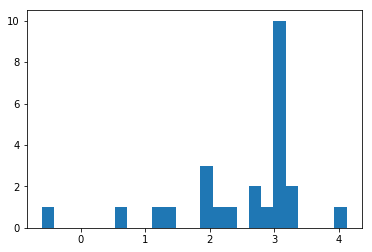

[ 2.54581561]
0.527530908585
Training epoch 84200
Iter: 84200
D loss: 2.689e-05
G_loss: -0.01265
()


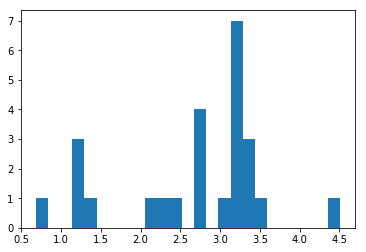

[ 2.69169673]
0.51140499115
Training epoch 84300
Iter: 84300
D loss: 2.643e-05
G_loss: -0.01329
()


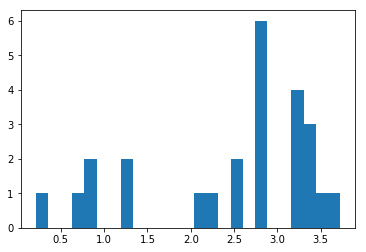

[ 2.47122431]
0.519171953201
Training epoch 84400
Iter: 84400
D loss: 3.581e-05
G_loss: -0.0123
()


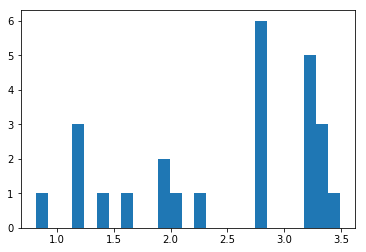

[ 2.47227798]
0.512863874435
Training epoch 84500
Iter: 84500
D loss: 3.059e-05
G_loss: -0.01323
()


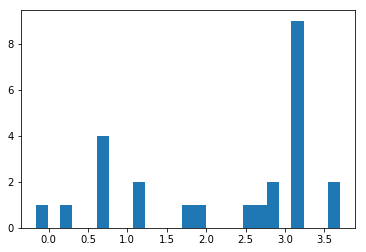

[ 2.23860998]
0.514341115952
Training epoch 84600
Iter: 84600
D loss: 3.712e-05
G_loss: -0.01285
()


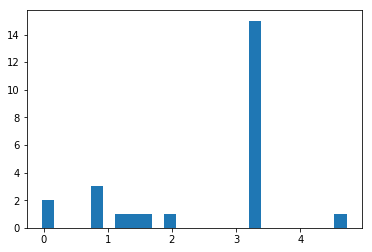

[ 2.49267923]
0.514158010483
Training epoch 84700
Iter: 84700
D loss: 3.001e-05
G_loss: -0.01333
()


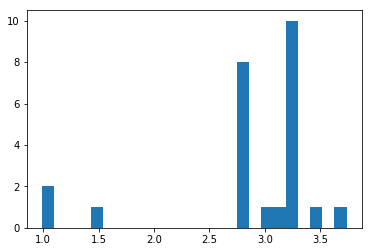

[ 2.87418091]
0.514449834824
Training epoch 84800
Iter: 84800
D loss: 2.834e-05
G_loss: -0.01348
()


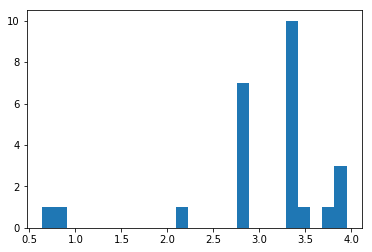

[ 3.03895822]
0.523246049881
Training epoch 84900
Iter: 84900
D loss: 2.832e-05
G_loss: -0.01197
()


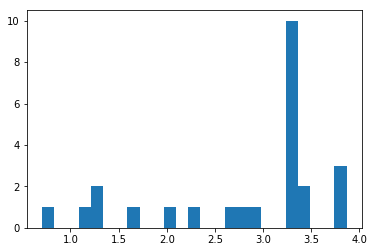

[ 2.79890948]
0.541046142578
Training epoch 85000
Iter: 85000
D loss: 2.836e-05
G_loss: -0.01324
()


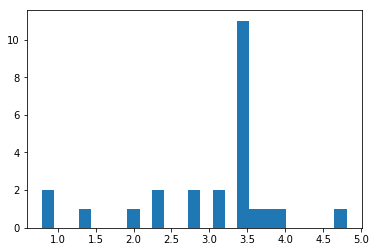

[ 2.99725693]
0.512378931046
Training epoch 85100
Iter: 85100
D loss: 3.388e-05
G_loss: -0.01322
()


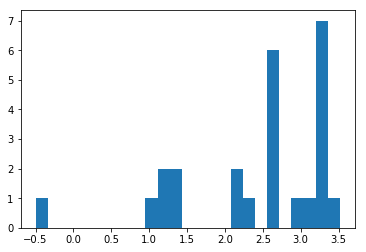

[ 2.44820372]
0.512247085571
Training epoch 85200
Iter: 85200
D loss: 4.087e-05
G_loss: -0.01411
()


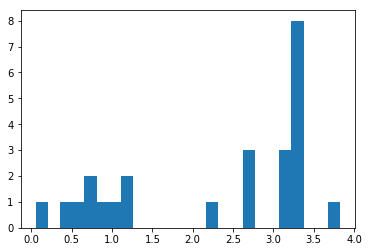

[ 2.26997378]
0.510887145996
Training epoch 85300
Iter: 85300
D loss: 2.936e-05
G_loss: -0.0134
()


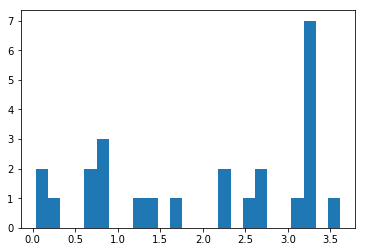

[ 2.02271868]
0.516427993774
Training epoch 85400
Iter: 85400
D loss: 2.683e-05
G_loss: -0.01332
()


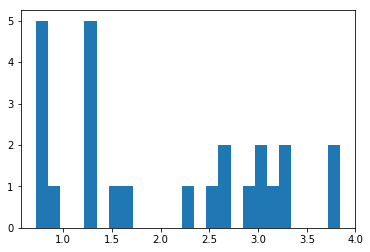

[ 2.03814585]
0.512433052063
Training epoch 85500
Iter: 85500
D loss: 3.113e-05
G_loss: -0.0132
()


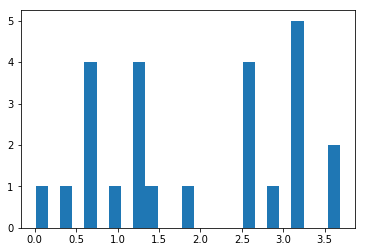

[ 1.96750043]
0.519593000412
Training epoch 85600
Iter: 85600
D loss: 3.422e-05
G_loss: -0.01334
()


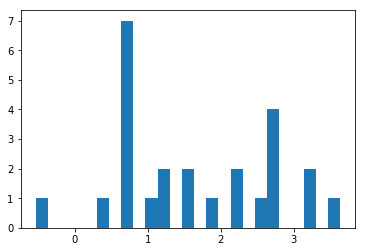

[ 1.647895]
0.517494916916
Training epoch 85700
Iter: 85700
D loss: 2.494e-05
G_loss: -0.01307
()


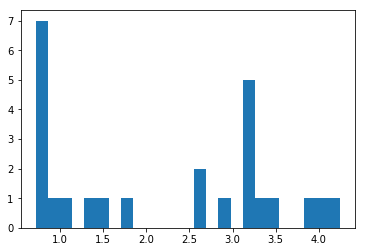

[ 2.19585274]
0.522266864777
Training epoch 85800
Iter: 85800
D loss: 4.932e-05
G_loss: -0.01276
()


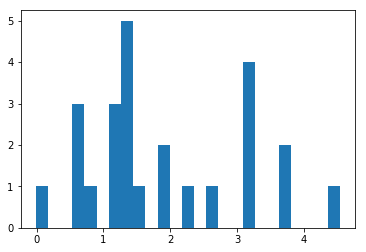

[ 1.92880602]
0.515309095383
Training epoch 85900
Iter: 85900
D loss: 3.292e-05
G_loss: -0.01007
()


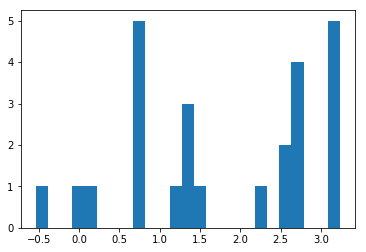

[ 1.77071052]
0.520250082016
Training epoch 86000
Iter: 86000
D loss: 2.686e-05
G_loss: -0.01192
()


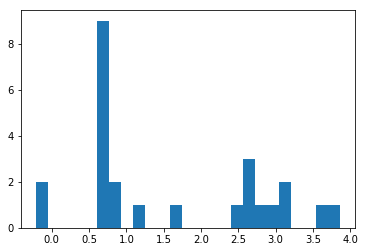

[ 1.60768882]
0.511997938156
Training epoch 86100
Iter: 86100
D loss: 3.258e-05
G_loss: -0.0133
()


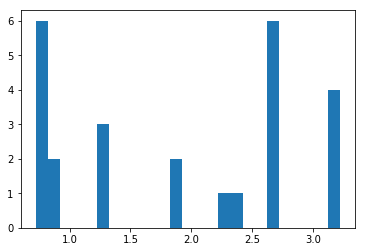

[ 1.89053636]
0.51558804512
Training epoch 86200
Iter: 86200
D loss: 3.306e-05
G_loss: -0.01326
()


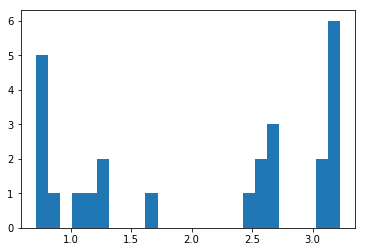

[ 2.08537559]
0.596145153046
Training epoch 86300
Iter: 86300
D loss: 2.813e-05
G_loss: -0.01297
()


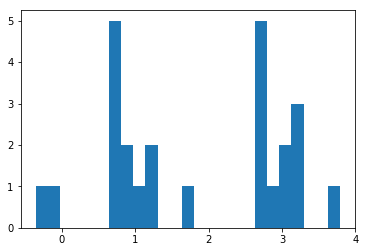

[ 1.84460782]
0.512517929077
Training epoch 86400
Iter: 86400
D loss: 3.177e-05
G_loss: -0.01274
()


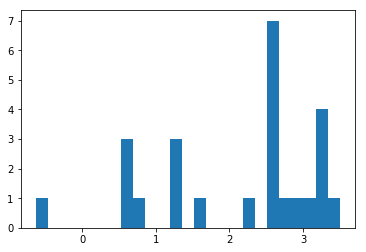

[ 2.12178662]
0.510783910751
Training epoch 86500
Iter: 86500
D loss: 2.999e-05
G_loss: -0.01325
()


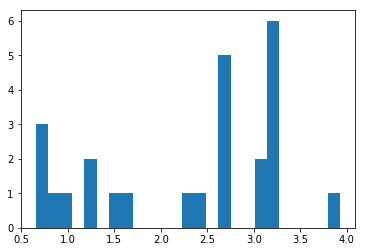

[ 2.28088336]
0.51211810112
Training epoch 86600
Iter: 86600
D loss: 4.288e-05
G_loss: -0.01329
()


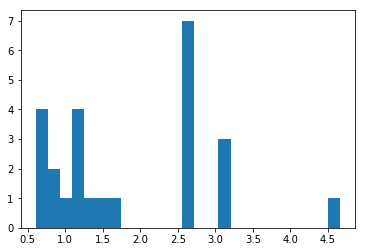

[ 1.88763003]
0.513551950455
Training epoch 86700
Iter: 86700
D loss: 3.566e-05
G_loss: -0.01184
()


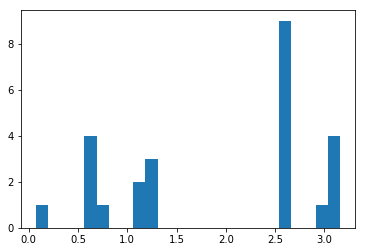

[ 1.91991728]
0.522633075714
Training epoch 86800
Iter: 86800
D loss: 2.494e-05
G_loss: -0.01321
()


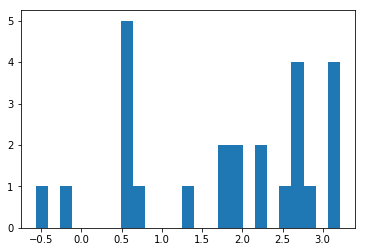

[ 1.81748471]
0.515719890594
Training epoch 86900
Iter: 86900
D loss: 3.947e-05
G_loss: -0.01189
()


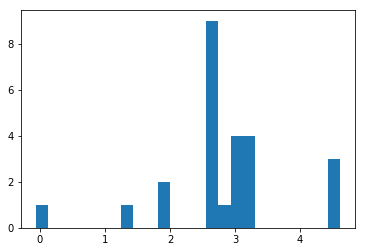

[ 2.80606205]
0.514117002487
Training epoch 87000
Iter: 87000
D loss: 3.374e-05
G_loss: -0.01322
()


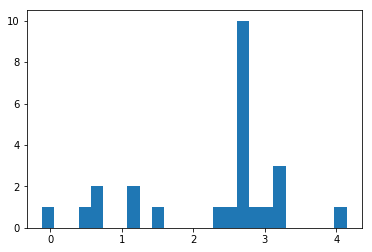

[ 2.27432405]
0.521718978882
Training epoch 87100
Iter: 87100
D loss: 3.227e-05
G_loss: -0.01184
()


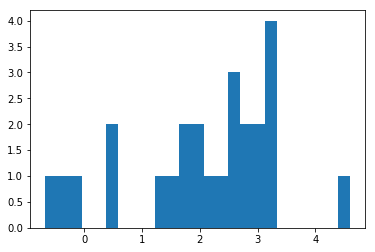

[ 2.05453814]
0.519004106522
Training epoch 87200
Iter: 87200
D loss: 2.471e-05
G_loss: -0.01259
()


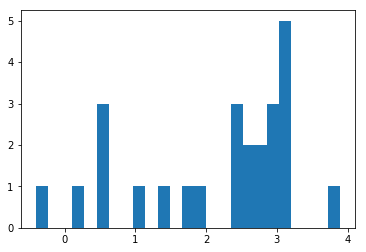

[ 2.15388091]
0.511322975159
Training epoch 87300
Iter: 87300
D loss: 3.004e-05
G_loss: -0.01277
()


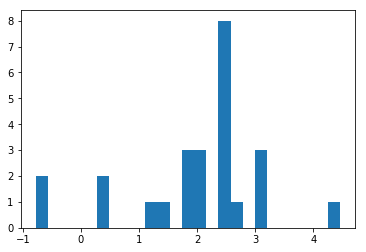

[ 2.006783]
0.51155591011
Training epoch 87400
Iter: 87400
D loss: 3.001e-05
G_loss: -0.01338
()


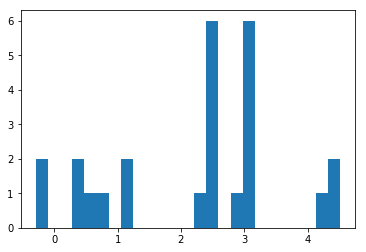

[ 2.22620144]
0.514346122742
Training epoch 87500
Iter: 87500
D loss: 3.808e-05
G_loss: -0.0131
()


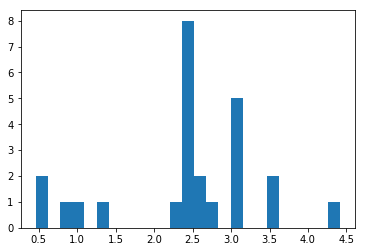

[ 2.44972794]
0.52664399147
Training epoch 87600
Iter: 87600
D loss: 2.986e-05
G_loss: -0.01329
()


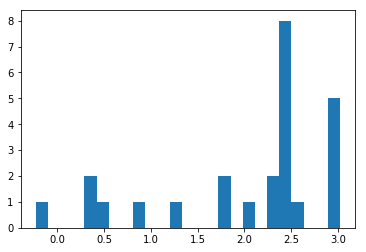

[ 2.03282261]
0.526924133301
Training epoch 87700
Iter: 87700
D loss: 3.013e-05
G_loss: -0.0118
()


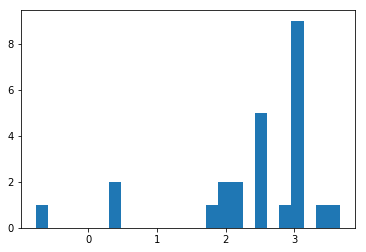

[ 2.39860901]
0.515303134918
Training epoch 87800
Iter: 87800
D loss: 3.535e-05
G_loss: -0.01213
()


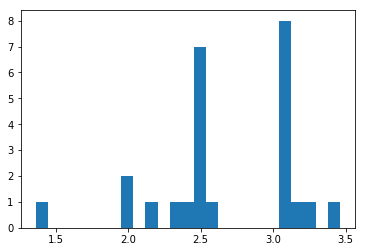

[ 2.67389217]
0.515200138092
Training epoch 87900
Iter: 87900
D loss: 3.995e-05
G_loss: -0.01325
()


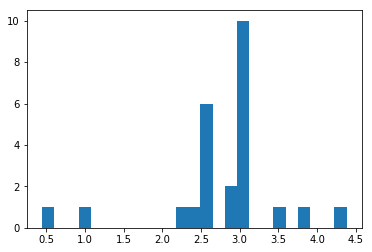

[ 2.76314209]
0.513520956039
Training epoch 88000
Iter: 88000
D loss: 2.734e-05
G_loss: -0.0118
()


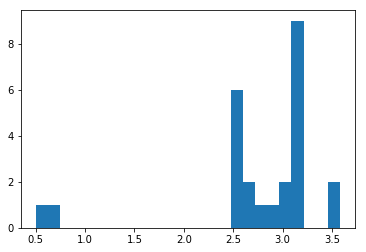

[ 2.75620028]
0.517091989517
Training epoch 88100
Iter: 88100
D loss: 3.324e-05
G_loss: -0.01278
()


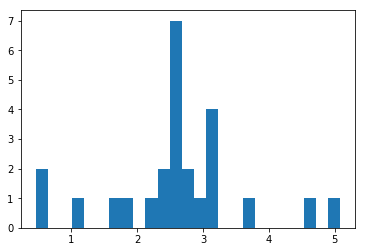

[ 2.5869025]
0.51878285408
Training epoch 88200
Iter: 88200
D loss: 3.414e-05
G_loss: -0.01317
()


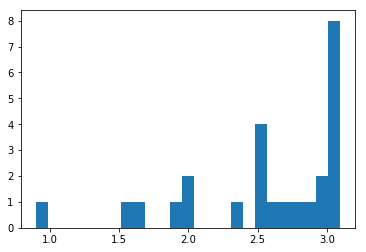

[ 2.565648]
0.514278173447
Training epoch 88300
Iter: 88300
D loss: 3.632e-05
G_loss: -0.01213
()


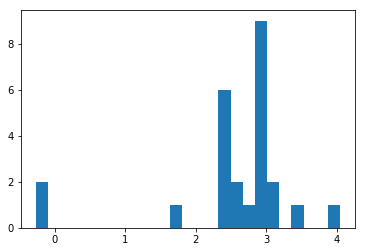

[ 2.58350235]
0.512295007706
Training epoch 88400
Iter: 88400
D loss: 3.566e-05
G_loss: -0.01228
()


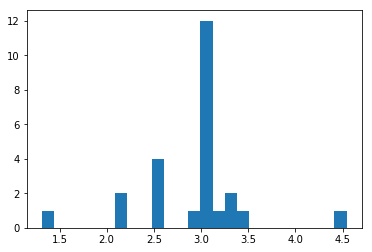

[ 2.91873448]
0.511554002762
Training epoch 88500
Iter: 88500
D loss: 2.404e-05
G_loss: -0.01397
()


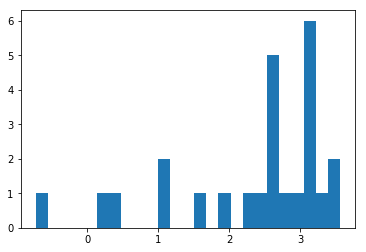

[ 2.32280388]
0.514352798462
Training epoch 88600
Iter: 88600
D loss: 3.52e-05
G_loss: -0.01165
()


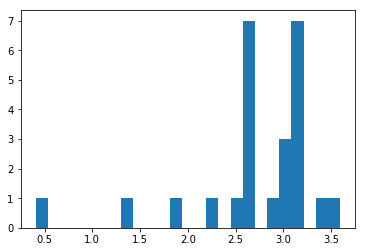

[ 2.6893159]
0.517293930054
Training epoch 88700
Iter: 88700
D loss: 2.976e-05
G_loss: -0.01325
()


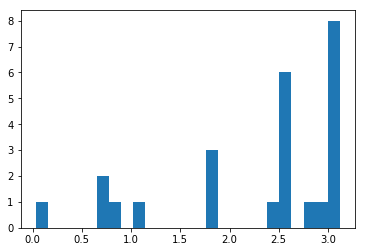

[ 2.27472219]
0.511393070221
Training epoch 88800
Iter: 88800
D loss: 3.162e-05
G_loss: -0.01274
()


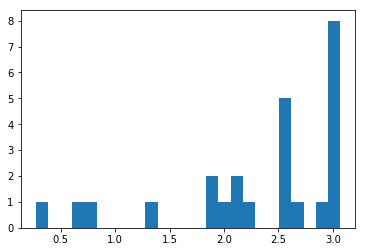

[ 2.31773754]
0.515455007553
Training epoch 88900
Iter: 88900
D loss: 3.336e-05
G_loss: -0.01331
()


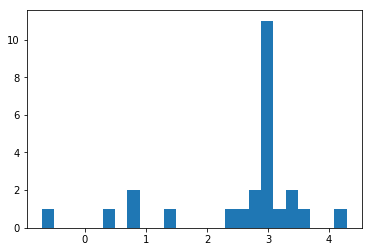

[ 2.56055265]
0.512286186218
Training epoch 89000
Iter: 89000
D loss: 3.566e-05
G_loss: -0.0132
()


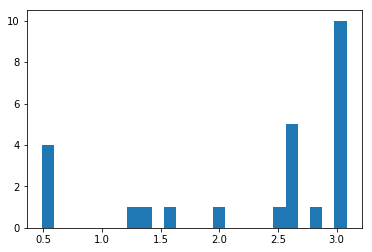

[ 2.29839145]
0.512995958328
Training epoch 89100
Iter: 89100
D loss: 3.039e-05
G_loss: -0.01328
()


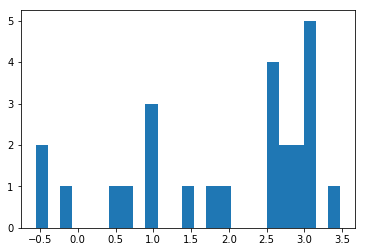

[ 1.9490284]
0.512592077255
Training epoch 89200
Iter: 89200
D loss: 2.704e-05
G_loss: -0.01334
()


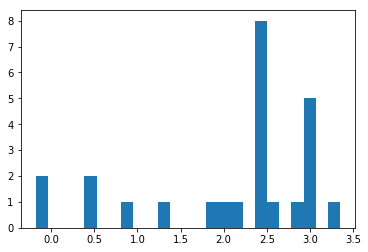

[ 2.08824814]
0.595561981201
Training epoch 89300
Iter: 89300
D loss: 3.172e-05
G_loss: -0.01321
()


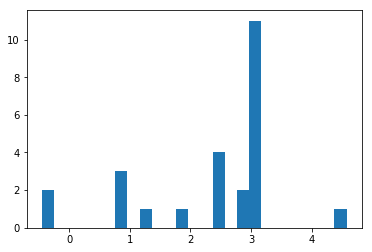

[ 2.3575207]
0.517419099808
Training epoch 89400
Iter: 89400
D loss: 3.303e-05
G_loss: -0.01281
()


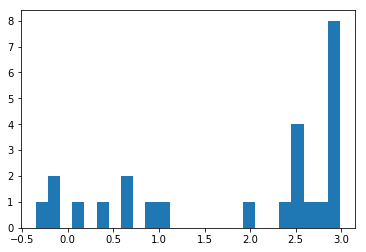

[ 1.86004278]
0.510303020477
Training epoch 89500
Iter: 89500
D loss: 2.462e-05
G_loss: -0.0132
()


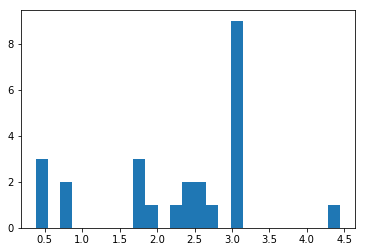

[ 2.25890508]
0.512996912003
Training epoch 89600
Iter: 89600
D loss: 3.584e-05
G_loss: -0.01215
()


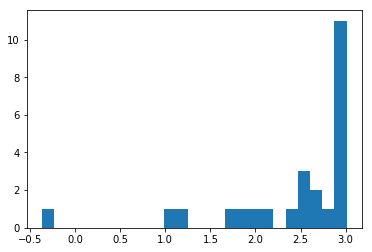

[ 2.420884]
0.517590045929
Training epoch 89700
Iter: 89700
D loss: 2.902e-05
G_loss: -0.01338
()


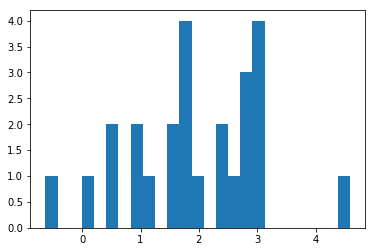

[ 1.92546965]
0.513918161392
Training epoch 89800
Iter: 89800
D loss: 3.629e-05
G_loss: -0.01329
()


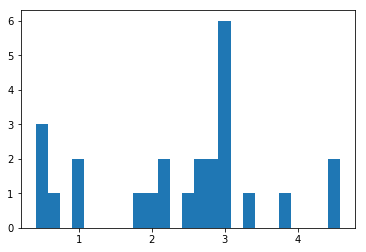

[ 2.39728413]
0.517840862274
Training epoch 89900
Iter: 89900
D loss: 2.94e-05
G_loss: -0.01199
()


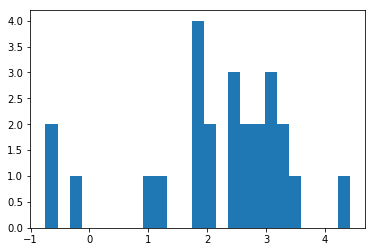

[ 2.17502053]
0.514370203018
Training epoch 90000
Iter: 90000
D loss: 4.096e-05
G_loss: -0.01338
()


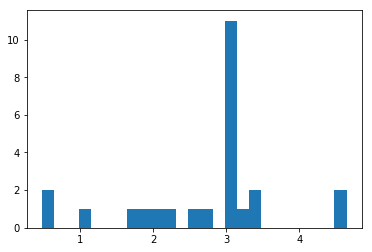

[ 2.7280601]
0.51444196701
Training epoch 90100
Iter: 90100
D loss: 3.311e-05
G_loss: -0.0133
()


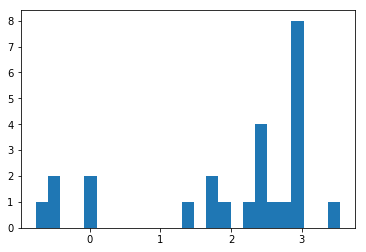

[ 1.98959059]
0.519600152969
Training epoch 90200
Iter: 90200
D loss: 3.879e-05
G_loss: -0.01308
()


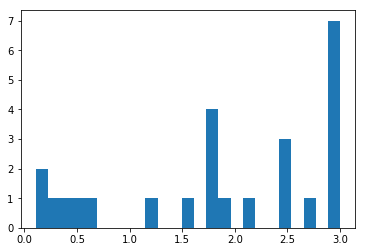

[ 1.88494412]
0.514503955841
Training epoch 90300
Iter: 90300
D loss: 2.518e-05
G_loss: -0.01077
()


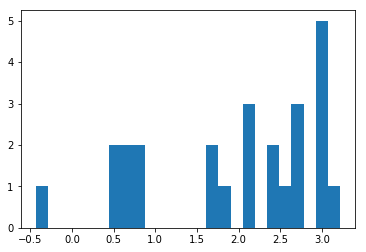

[ 1.9490333]
0.512383937836
Training epoch 90400
Iter: 90400
D loss: 4.448e-05
G_loss: -0.01415
()


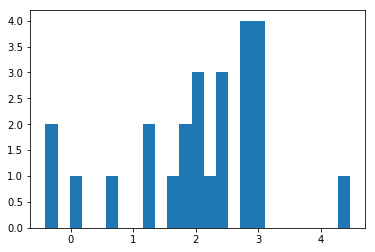

[ 2.05350585]
0.511396884918
Training epoch 90500
Iter: 90500
D loss: 3.101e-05
G_loss: -0.0133
()


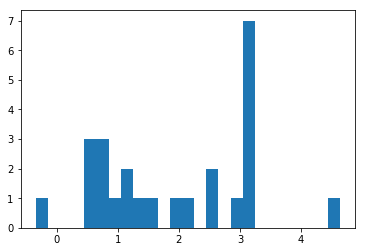

[ 1.91381208]
0.524333953857
Training epoch 90600
Iter: 90600
D loss: 3.305e-05
G_loss: -0.01314
()


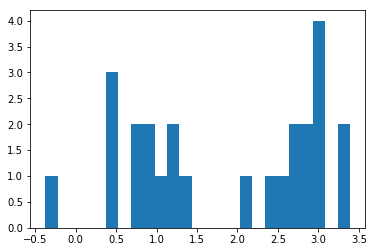

[ 1.84451941]
0.511969804764
Training epoch 90700
Iter: 90700
D loss: 3.894e-05
G_loss: -0.01317
()


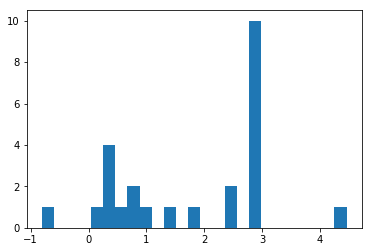

[ 1.82445148]
0.514376878738
Training epoch 90800
Iter: 90800
D loss: 3.477e-05
G_loss: -0.0142
()


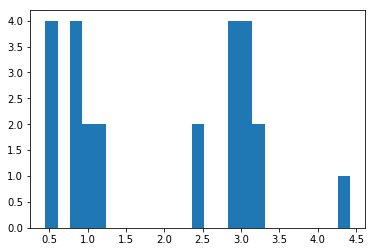

[ 1.96277512]
0.513446807861
Training epoch 90900
Iter: 90900
D loss: 3.56e-05
G_loss: -0.01312
()


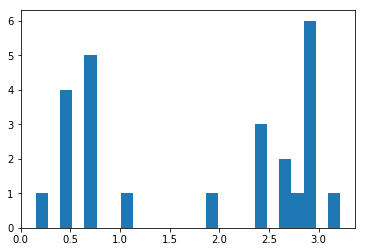

[ 1.80610264]
0.519608974457
Training epoch 91000
Iter: 91000
D loss: 3.775e-05
G_loss: -0.01311
()


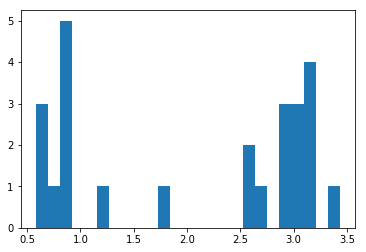

[ 2.06258138]
0.512234926224
Training epoch 91100
Iter: 91100
D loss: 3.446e-05
G_loss: -0.0113
()


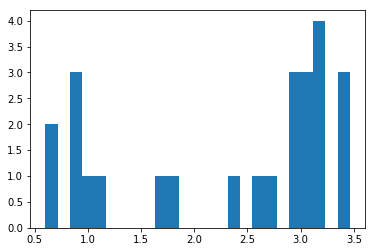

[ 2.32688098]
0.511929035187
Training epoch 91200
Iter: 91200
D loss: 3.113e-05
G_loss: -0.01344
()


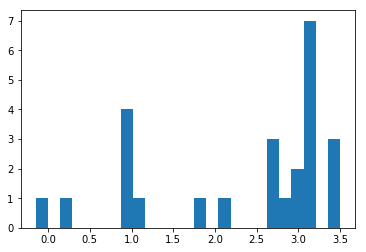

[ 2.3331462]
0.514251232147
Training epoch 91300
Iter: 91300
D loss: 3.595e-05
G_loss: -0.01295
()


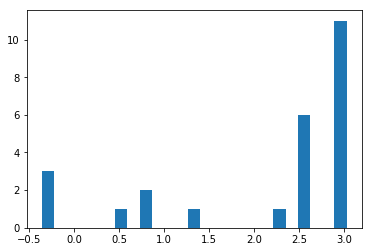

[ 2.1290106]
0.511237859726
Training epoch 91400
Iter: 91400
D loss: 3.149e-05
G_loss: -0.01173
()


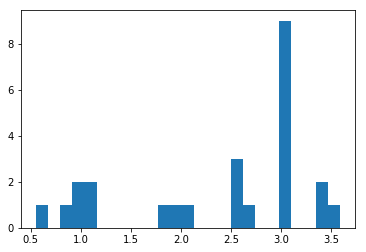

[ 2.3896575]
0.521000862122
Training epoch 91500
Iter: 91500
D loss: 3.957e-05
G_loss: -0.01276
()


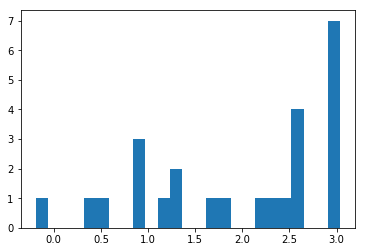

[ 1.9522112]
0.514930009842
Training epoch 91600
Iter: 91600
D loss: 2.983e-05
G_loss: -0.01162
()


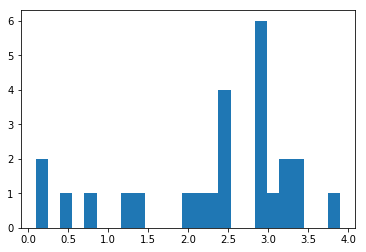

[ 2.32219652]
0.515431880951
Training epoch 91700
Iter: 91700
D loss: 1.997e-05
G_loss: -0.0135
()


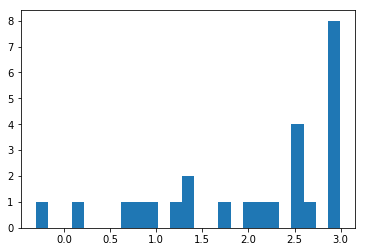

[ 2.03683872]
0.510985851288
Training epoch 91800
Iter: 91800
D loss: 3.603e-05
G_loss: -0.01343
()


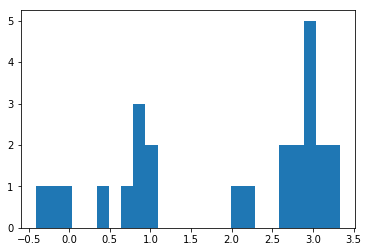

[ 1.92732445]
0.510155916214
Training epoch 91900
Iter: 91900
D loss: 2.893e-05
G_loss: -0.01339
()


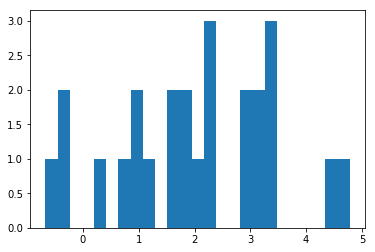

[ 1.99358893]
0.515254974365
Training epoch 92000
Iter: 92000
D loss: 3.197e-05
G_loss: -0.01331
()


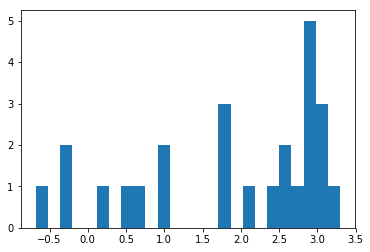

[ 1.89094198]
0.513416051865
Training epoch 92100
Iter: 92100
D loss: 3.32e-05
G_loss: -0.01281
()


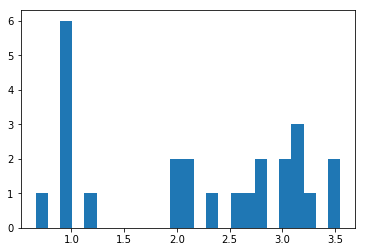

[ 2.19817599]
0.511972904205
Training epoch 92200
Iter: 92200
D loss: 3.748e-05
G_loss: -0.01281
()


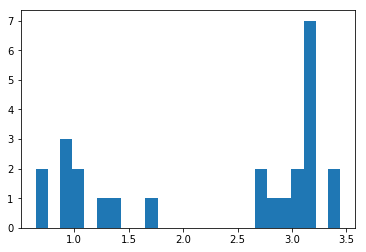

[ 2.26987954]
0.531993865967
Training epoch 92300
Iter: 92300
D loss: 3.304e-05
G_loss: -0.01341
()


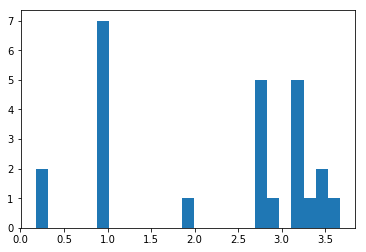

[ 2.21695481]
0.516697883606
Training epoch 92400
Iter: 92400
D loss: 3.597e-05
G_loss: -0.01211
()


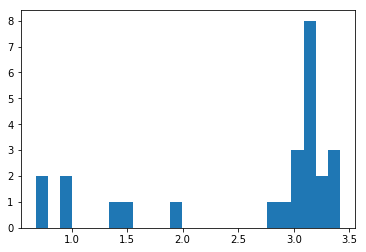

[ 2.6001692]
0.512213945389
Training epoch 92500
Iter: 92500
D loss: 2.776e-05
G_loss: -0.01321
()


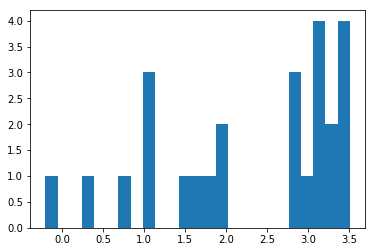

[ 2.27609199]
0.512218952179
Training epoch 92600
Iter: 92600
D loss: 3.063e-05
G_loss: -0.0132
()


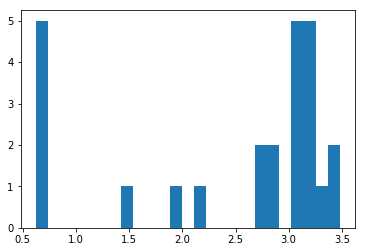

[ 2.48166648]
0.513972997665
Training epoch 92700
Iter: 92700
D loss: 3.122e-05
G_loss: -0.01236
()


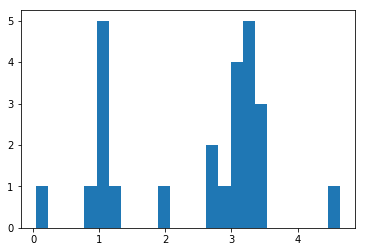

[ 2.45075188]
0.51473402977
Training epoch 92800
Iter: 92800
D loss: 3.497e-05
G_loss: -0.01323
()


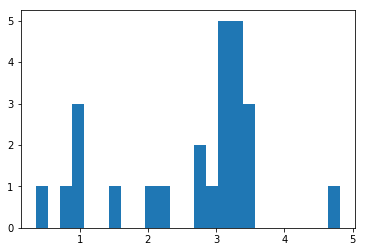

[ 2.62787107]
0.511067867279
Training epoch 92900
Iter: 92900
D loss: 2.616e-05
G_loss: -0.01097
()


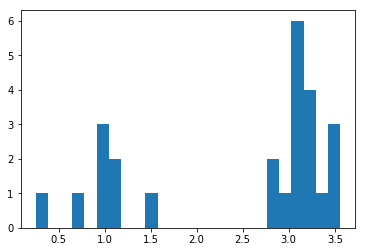

[ 2.4694268]
0.511749982834
Training epoch 93000
Iter: 93000
D loss: 3.073e-05
G_loss: -0.01317
()


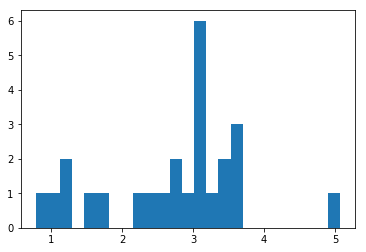

[ 2.72628942]
0.516180992126
Training epoch 93100
Iter: 93100
D loss: 3.012e-05
G_loss: -0.01339
()


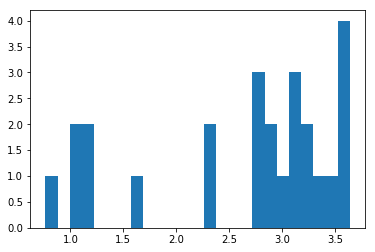

[ 2.63724783]
0.519954204559
Training epoch 93200
Iter: 93200
D loss: 3.453e-05
G_loss: -0.01349
()


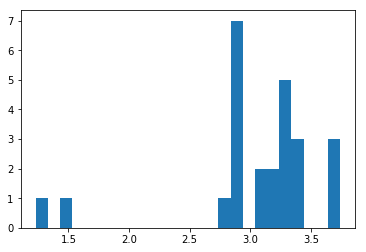

[ 3.04017371]
0.513564825058
Training epoch 93300
Iter: 93300
D loss: 2.897e-05
G_loss: -0.01254
()


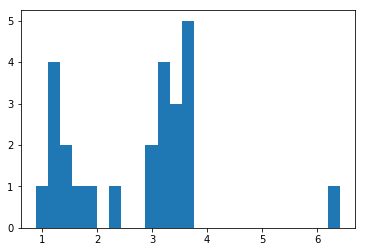

[ 2.73045442]
0.51239490509
Training epoch 93400
Iter: 93400
D loss: 3.121e-05
G_loss: -0.01345
()


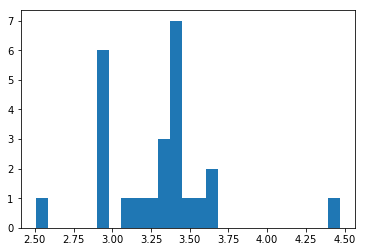

[ 3.28442076]
0.514193058014
Training epoch 93500
Iter: 93500
D loss: 2.836e-05
G_loss: -0.01352
()


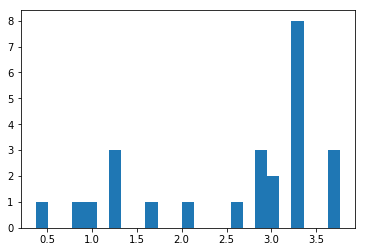

[ 2.58912534]
0.522538900375
Training epoch 93600
Iter: 93600
D loss: 2.849e-05
G_loss: -0.01321
()


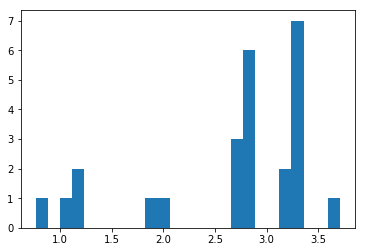

[ 2.65558151]
0.523659944534
Training epoch 93700
Iter: 93700
D loss: 3.09e-05
G_loss: -0.01154
()


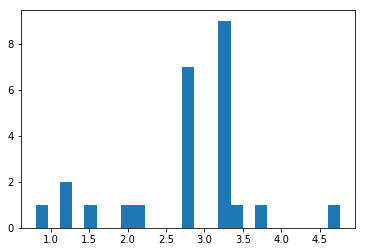

[ 2.79786804]
0.514133930206
Training epoch 93800
Iter: 93800
D loss: 2.934e-05
G_loss: -0.01349
()


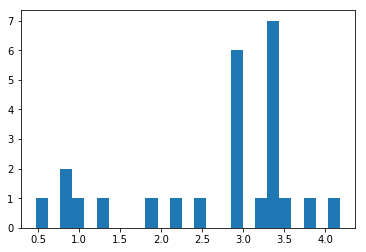

[ 2.64303826]
0.520577907562
Training epoch 93900
Iter: 93900
D loss: 3.854e-05
G_loss: -0.01341
()


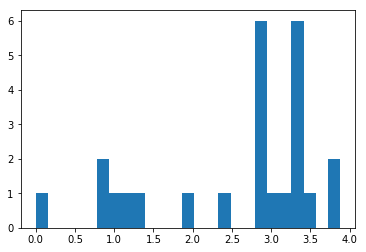

[ 2.56366536]
0.514472007751
Training epoch 94000
Iter: 94000
D loss: 3.526e-05
G_loss: -0.008682
()


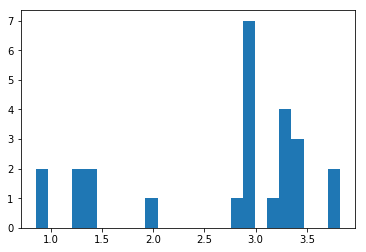

[ 2.65692477]
0.51558303833
Training epoch 94100
Iter: 94100
D loss: 3.314e-05
G_loss: -0.01324
()


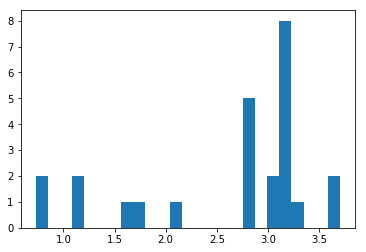

[ 2.62131164]
0.51313996315
Training epoch 94200
Iter: 94200
D loss: 3.29e-05
G_loss: -0.01333
()


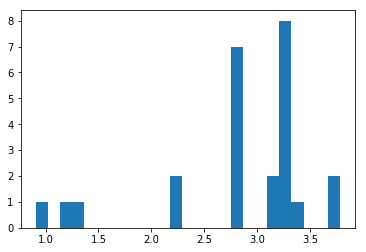

[ 2.84431921]
0.511049985886
Training epoch 94300
Iter: 94300
D loss: 2.822e-05
G_loss: -0.01294
()


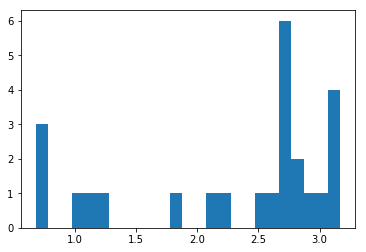

[ 2.28507905]
0.511197090149
Training epoch 94400
Iter: 94400
D loss: 2.731e-05
G_loss: -0.01273
()


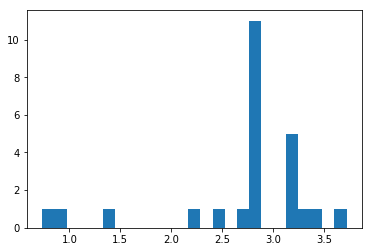

[ 2.70748513]
0.511517047882
Training epoch 94500
Iter: 94500
D loss: 3.105e-05
G_loss: -0.01254
()


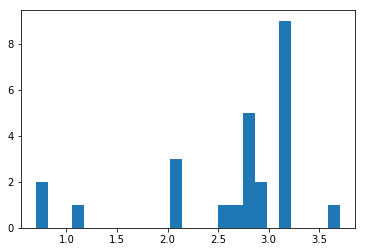

[ 2.6493301]
0.514031887054
Training epoch 94600
Iter: 94600
D loss: 2.746e-05
G_loss: -0.01034
()


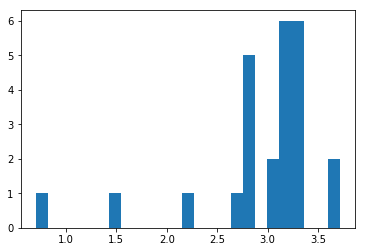

[ 2.93239685]
0.514611005783
Training epoch 94700
Iter: 94700
D loss: 3.342e-05
G_loss: -0.01268
()


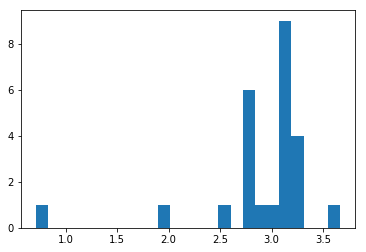

[ 2.90736672]
0.514120101929
Training epoch 94800
Iter: 94800
D loss: 4.309e-05
G_loss: -0.0129
()


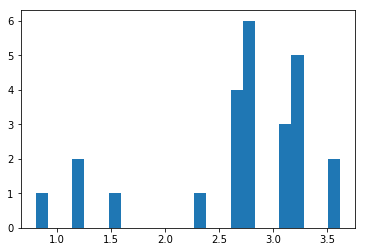

[ 2.68596995]
0.513208150864
Training epoch 94900
Iter: 94900
D loss: 2.54e-05
G_loss: -0.01222
()


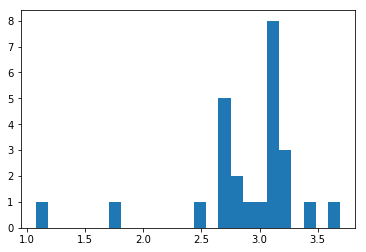

[ 2.90170099]
0.511431932449
Training epoch 95000
Iter: 95000
D loss: 3.278e-05
G_loss: -0.01325
()


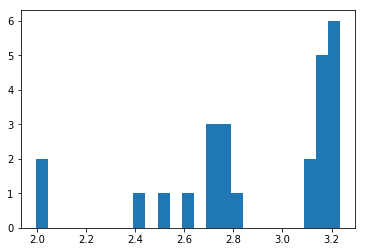

[ 2.89568658]
0.511617898941
Training epoch 95100
Iter: 95100
D loss: 2.948e-05
G_loss: -0.01371
()


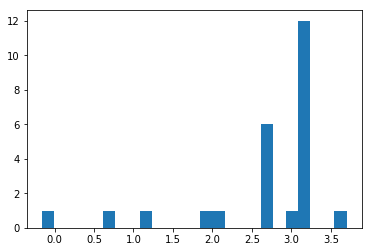

[ 2.676566]
0.532957792282
Training epoch 95200
Iter: 95200
D loss: 2.615e-05
G_loss: -0.01335
()


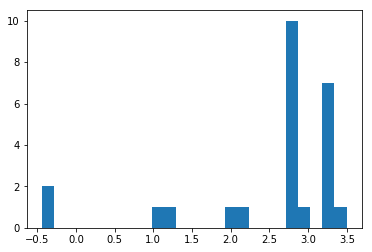

[ 2.48710798]
0.521618843079
Training epoch 95300
Iter: 95300
D loss: 2.763e-05
G_loss: -0.01296
()


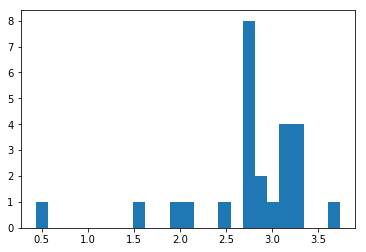

[ 2.73478871]
0.523655891418
Training epoch 95400
Iter: 95400
D loss: 3.796e-05
G_loss: -0.01338
()


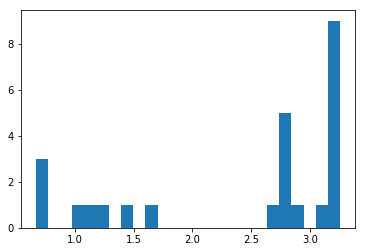

[ 2.4019526]
0.52406001091
Training epoch 95500
Iter: 95500
D loss: 4.136e-05
G_loss: -0.01336
()


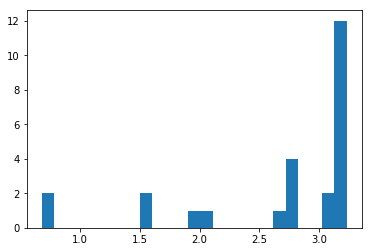

[ 2.67472508]
0.513283014297
Training epoch 95600
Iter: 95600
D loss: 3.421e-05
G_loss: -0.01289
()


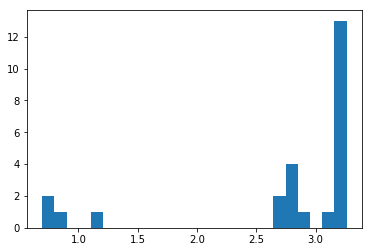

[ 2.72899316]
0.515054941177
Training epoch 95700
Iter: 95700
D loss: 4.525e-05
G_loss: -0.01166
()


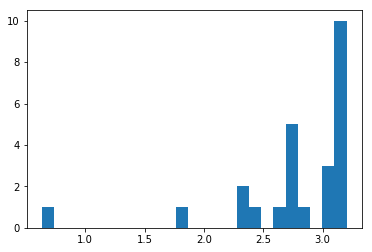

[ 2.78198638]
0.512860059738
Training epoch 95800
Iter: 95800
D loss: 3.269e-05
G_loss: -0.0124
()


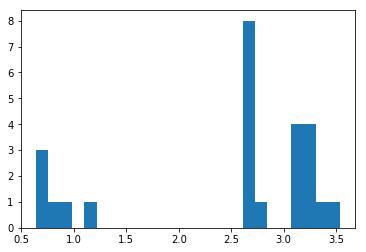

[ 2.46257344]
0.522915840149
Training epoch 95900
Iter: 95900
D loss: 2.799e-05
G_loss: -0.01339
()


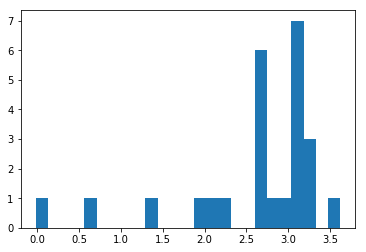

[ 2.62383159]
0.513751983643
Training epoch 96000
Iter: 96000
D loss: 3.378e-05
G_loss: -0.01331
()


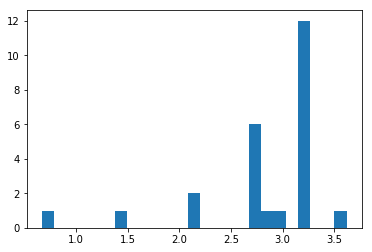

[ 2.82399344]
0.518054008484
Training epoch 96100
Iter: 96100
D loss: 2.591e-05
G_loss: -0.01333
()


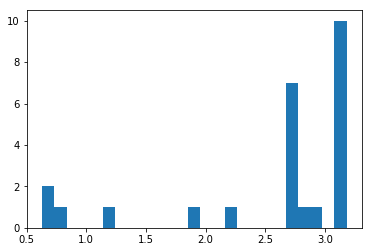

[ 2.53800506]
0.513138055801
Training epoch 96200
Iter: 96200
D loss: 2.837e-05
G_loss: -0.01199
()


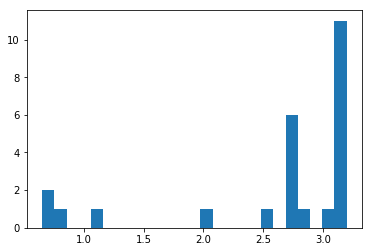

[ 2.59248906]
0.524369001389
Training epoch 96300
Iter: 96300
D loss: 2.994e-05
G_loss: -0.01315
()


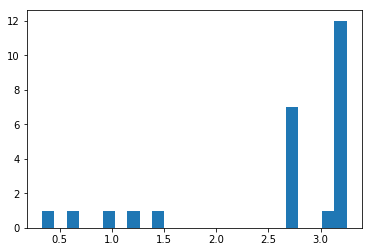

[ 2.60332462]
0.513953924179
Training epoch 96400
Iter: 96400
D loss: 2.711e-05
G_loss: -0.01324
()


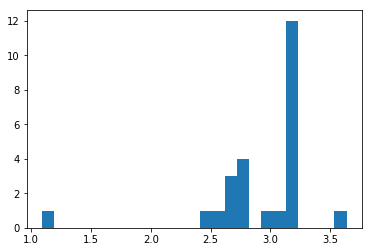

[ 2.93278015]
0.514722824097
Training epoch 96500
Iter: 96500
D loss: 3.118e-05
G_loss: -0.01244
()


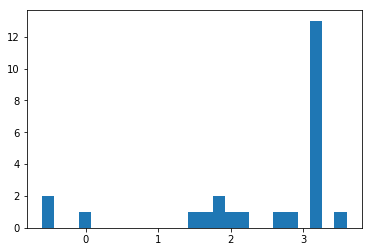

[ 2.41269581]
0.518722057343
Training epoch 96600
Iter: 96600
D loss: 3.107e-05
G_loss: -0.01329
()


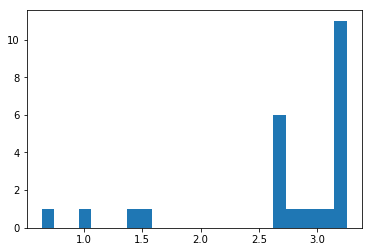

[ 2.70166853]
0.536086082458
Training epoch 96700
Iter: 96700
D loss: 3.374e-05
G_loss: -0.01296
()


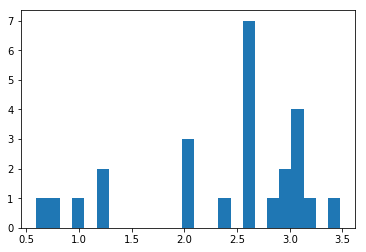

[ 2.36895378]
0.528542995453
Training epoch 96800
Iter: 96800
D loss: 3.371e-05
G_loss: -0.0133
()


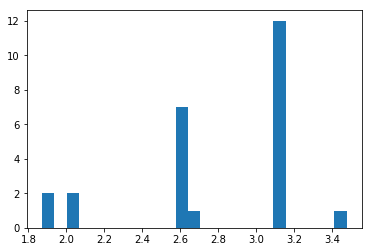

[ 2.79875052]
0.512986183167
Training epoch 96900
Iter: 96900
D loss: 3.03e-05
G_loss: -0.01335
()


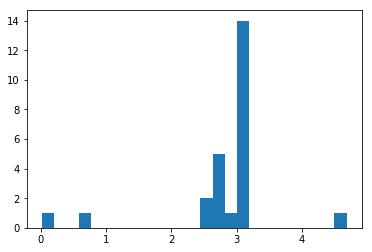

[ 2.83047061]
0.521661996841
Training epoch 97000
Iter: 97000
D loss: 2.914e-05
G_loss: -0.01189
()


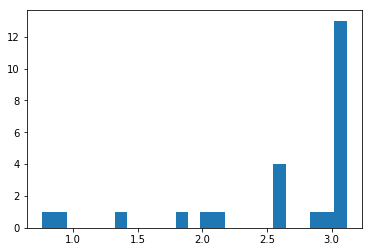

[ 2.62535325]
0.512476921082
Training epoch 97100
Iter: 97100
D loss: 3.07e-05
G_loss: -0.01347
()


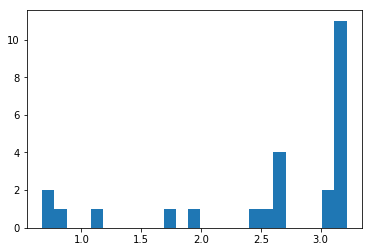

[ 2.56606081]
0.516347885132
Training epoch 97200
Iter: 97200
D loss: 2.765e-05
G_loss: -0.01331
()


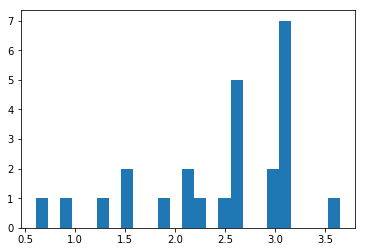

[ 2.45588852]
0.511204004288
Training epoch 97300
Iter: 97300
D loss: 3.269e-05
G_loss: -0.01318
()


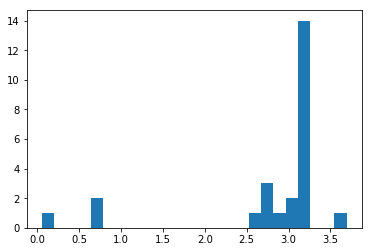

[ 2.77324316]
0.513715982437
Training epoch 97400
Iter: 97400
D loss: 3.626e-05
G_loss: -0.01262
()


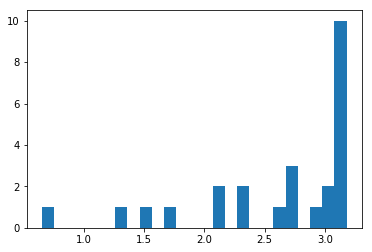

[ 2.61250483]
0.523497104645
Training epoch 97500
Iter: 97500
D loss: 3.195e-05
G_loss: -0.01333
()


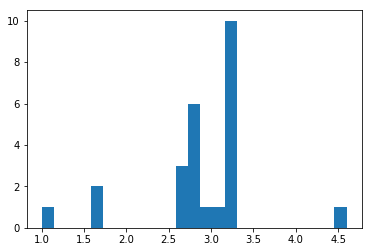

[ 2.87081795]
0.514024972916
Training epoch 97600
Iter: 97600
D loss: 2.973e-05
G_loss: -0.013
()


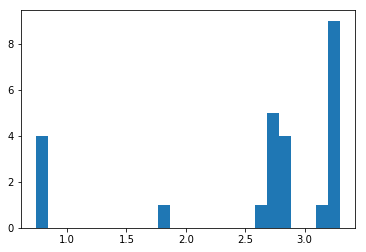

[ 2.59569204]
0.522422075272
Training epoch 97700
Iter: 97700
D loss: 3.212e-05
G_loss: -0.01201
()


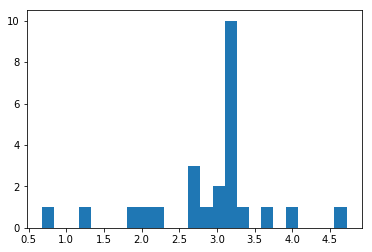

[ 2.89817576]
0.513725996017
Training epoch 97800
Iter: 97800
D loss: 2.828e-05
G_loss: -0.0134
()


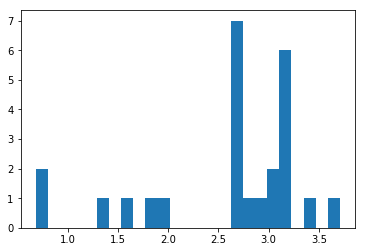

[ 2.60468068]
0.512670993805
Training epoch 97900
Iter: 97900
D loss: 2.666e-05
G_loss: -0.01296
()


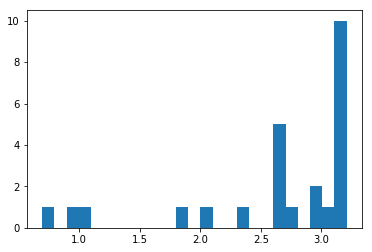

[ 2.63219248]
0.517802000046
Training epoch 98000
Iter: 98000
D loss: 3.004e-05
G_loss: -0.01334
()


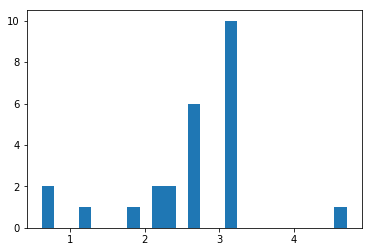

[ 2.60505997]
0.512558937073
Training epoch 98100
Iter: 98100
D loss: 3.617e-05
G_loss: -0.01325
()


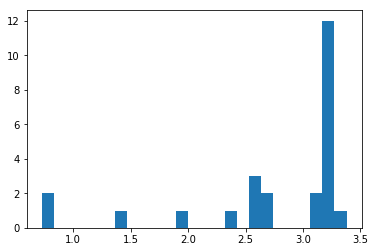

[ 2.75666812]
0.51372885704
Training epoch 98200
Iter: 98200
D loss: 3.276e-05
G_loss: -0.01335
()


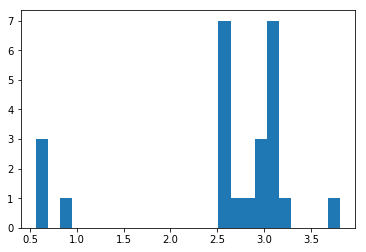

[ 2.55907884]
0.527855873108
Training epoch 98300
Iter: 98300
D loss: 2.699e-05
G_loss: -0.01282
()


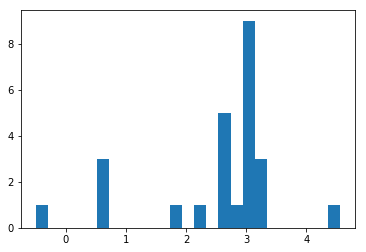

[ 2.53987534]
0.514600992203
Training epoch 98400
Iter: 98400
D loss: 3.439e-05
G_loss: -0.01256
()


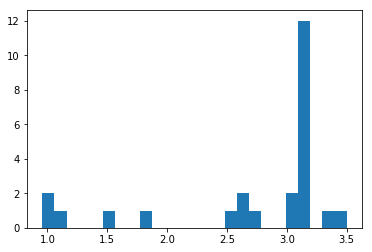

[ 2.70008917]
0.515076875687
Training epoch 98500
Iter: 98500
D loss: 3.578e-05
G_loss: -0.01359
()


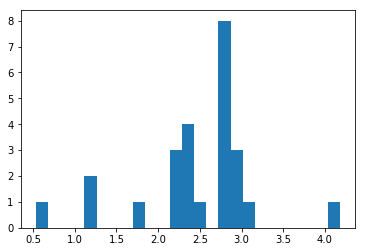

[ 2.47582014]
0.514332056046
Training epoch 98600
Iter: 98600
D loss: 2.843e-05
G_loss: -0.01288
()


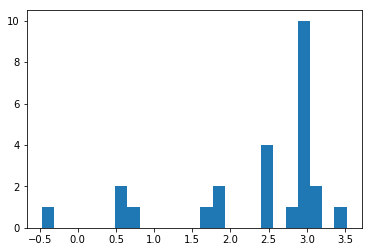

[ 2.34728094]
0.514016151428
Training epoch 98700
Iter: 98700
D loss: 3.684e-05
G_loss: -0.01326
()


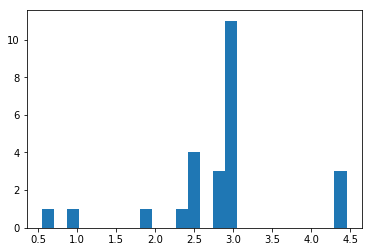

[ 2.81697826]
0.51496386528
Training epoch 98800
Iter: 98800
D loss: 3.688e-05
G_loss: -0.0126
()


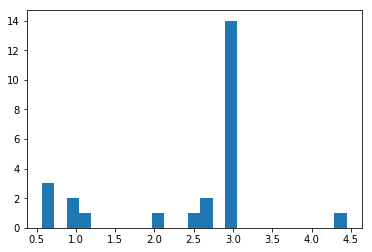

[ 2.46263026]
0.526770114899
Training epoch 98900
Iter: 98900
D loss: 3.347e-05
G_loss: -0.01191
()


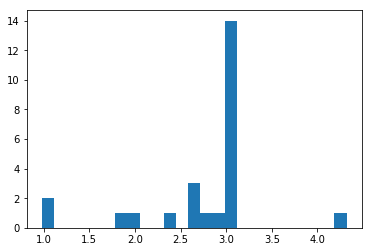

[ 2.75056504]
0.528205871582
Training epoch 99000
Iter: 99000
D loss: 3.762e-05
G_loss: -0.01294
()


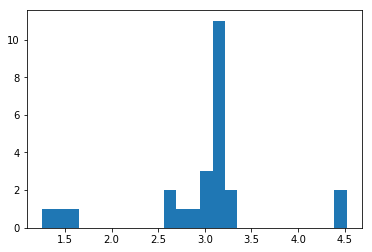

[ 2.9559446]
0.512326955795
Training epoch 99100
Iter: 99100
D loss: 3.223e-05
G_loss: -0.01263
()


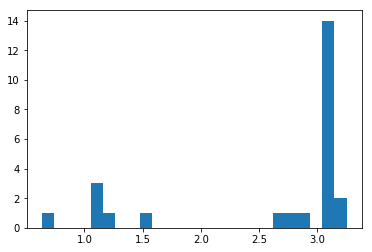

[ 2.59269333]
0.514353990555
Training epoch 99200
Iter: 99200
D loss: 2.797e-05
G_loss: -0.01349
()


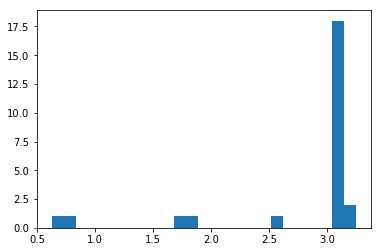

[ 2.77908863]
0.512548923492
Training epoch 99300
Iter: 99300
D loss: 2.741e-05
G_loss: -0.01389
()


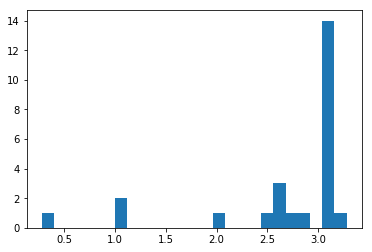

[ 2.6883589]
0.513553857803
Training epoch 99400
Iter: 99400
D loss: 2.825e-05
G_loss: -0.01347
()


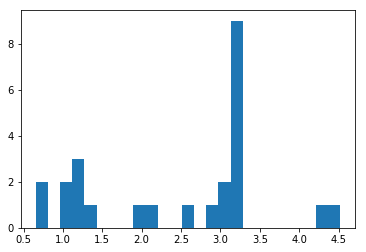

[ 2.45830141]
0.521507978439
Training epoch 99500
Iter: 99500
D loss: 3.178e-05
G_loss: -0.01321
()


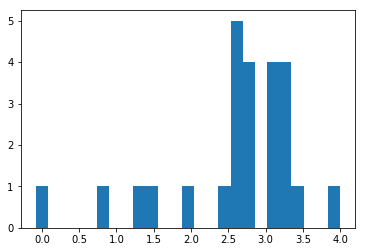

[ 2.60277145]
0.515231132507
Training epoch 99600
Iter: 99600
D loss: 2.661e-05
G_loss: -0.01343
()


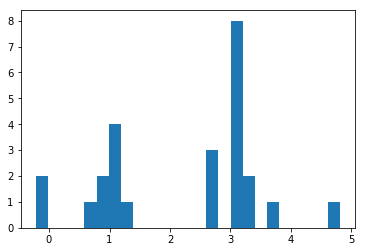

[ 2.25404935]
0.531440019608
Training epoch 99700
Iter: 99700
D loss: 3.616e-05
G_loss: -0.01299
()


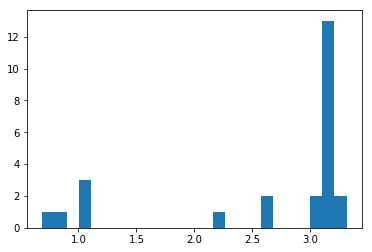

[ 2.62527118]
0.513363838196
Training epoch 99800
Iter: 99800
D loss: 2.715e-05
G_loss: -0.01238
()


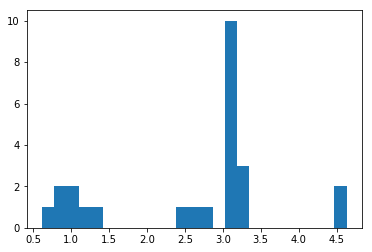

[ 2.6104426]
0.521547079086
Training epoch 99900
Iter: 99900
D loss: 2.989e-05
G_loss: -0.0133
()


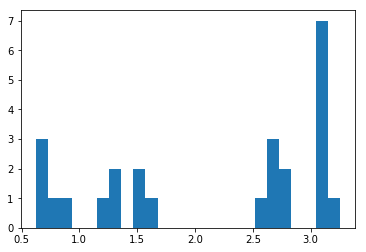

[ 2.13777813]
0.515287876129
Training epoch 100000
Iter: 100000
D loss: 2.495e-05
G_loss: -0.01317
()


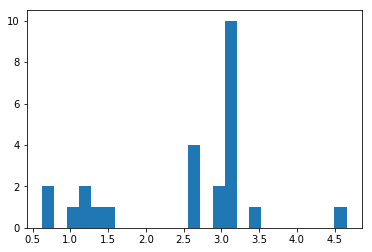

[ 2.54110343]
0.517611980438
Training epoch 100100
Iter: 100100
D loss: 2.817e-05
G_loss: -0.01279
()


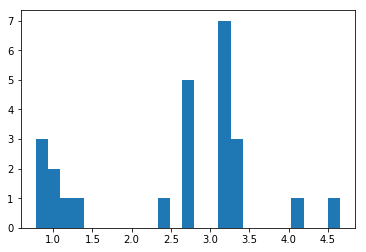

[ 2.54428384]
0.51908993721
Training epoch 100200
Iter: 100200
D loss: 3e-05
G_loss: -0.01222
()


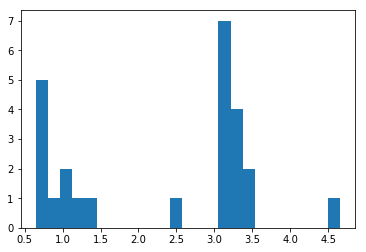

[ 2.3483567]
0.512229204178
Training epoch 100300
Iter: 100300
D loss: 3.079e-05
G_loss: -0.01361
()


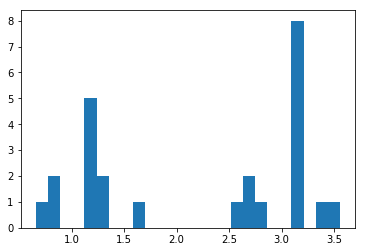

[ 2.21778778]
0.517446994781
Training epoch 100400
Iter: 100400
D loss: 3.458e-05
G_loss: -0.01289
()


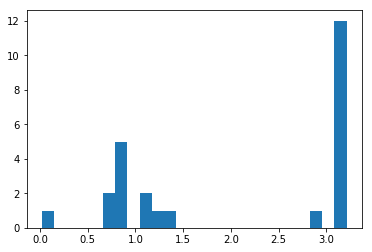

[ 2.0650365]
0.512982845306
Training epoch 100500
Iter: 100500
D loss: 2.776e-05
G_loss: -0.01335
()


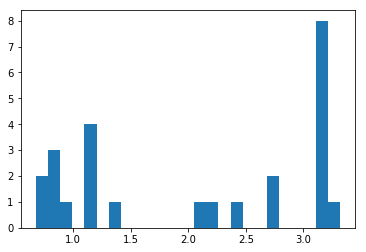

[ 2.06743967]
0.514567136765
Training epoch 100600
Iter: 100600
D loss: 3.795e-05
G_loss: -0.01329
()


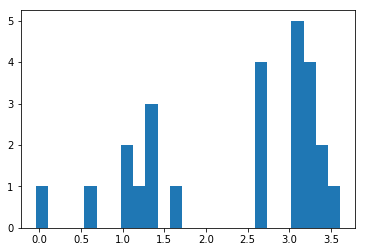

[ 2.36476358]
0.513082027435
Training epoch 100700
Iter: 100700
D loss: 3.173e-05
G_loss: -0.01335
()


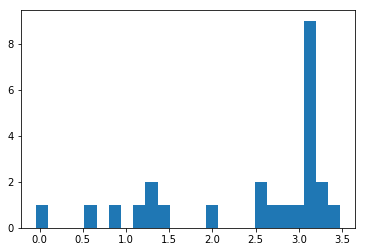

[ 2.43286817]
0.510996818542
Training epoch 100800
Iter: 100800
D loss: 3.085e-05
G_loss: -0.01171
()


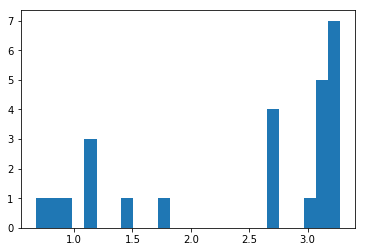

[ 2.45623392]
0.516113996506
Training epoch 100900
Iter: 100900
D loss: 3.355e-05
G_loss: -0.01326
()


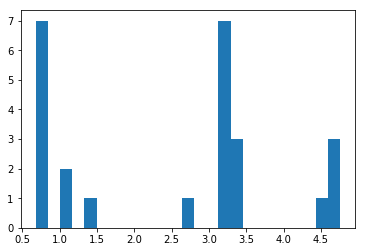

[ 2.50930898]
0.520021915436
Training epoch 101000
Iter: 101000
D loss: 3.543e-05
G_loss: -0.01232
()


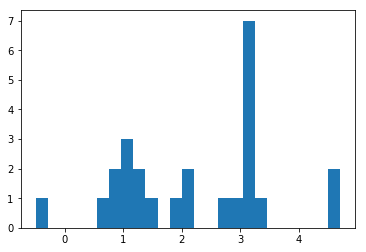

[ 2.24398638]
0.515513896942
Training epoch 101100
Iter: 101100
D loss: 2.939e-05
G_loss: -0.01329
()


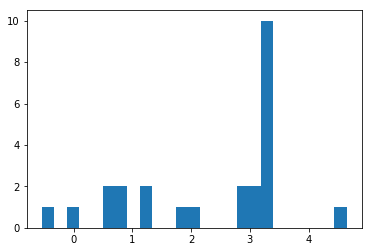

[ 2.30972537]
0.516721010208
Training epoch 101200
Iter: 101200
D loss: 3.555e-05
G_loss: -0.01327
()


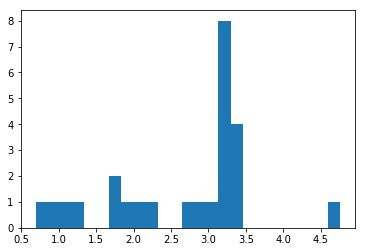

[ 2.66202637]
0.512530088425
Training epoch 101300
Iter: 101300
D loss: 2.569e-05
G_loss: -0.01246
()


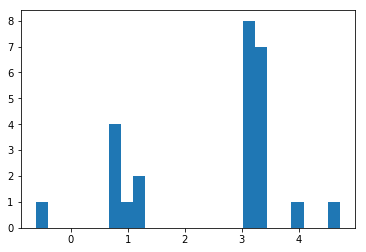

[ 2.51094445]
0.512762069702
Training epoch 101400
Iter: 101400
D loss: 3.084e-05
G_loss: -0.01414
()


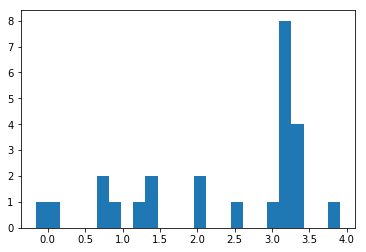

[ 2.36402216]
0.511930942535
Training epoch 101500
Iter: 101500
D loss: 3.747e-05
G_loss: -0.01188
()


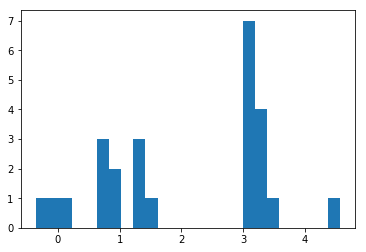

[ 2.08404024]
0.515406131744
Training epoch 101600
Iter: 101600
D loss: 2.626e-05
G_loss: -0.0131
()


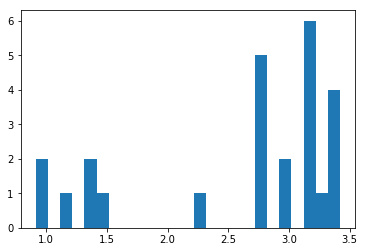

[ 2.60702899]
0.51442193985
Training epoch 101700
Iter: 101700
D loss: 2.785e-05
G_loss: -0.01322
()


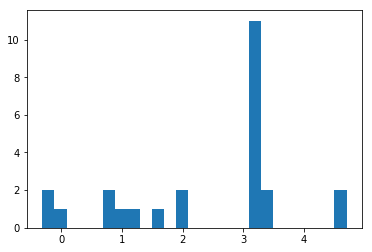

[ 2.40364267]
0.514189958572
Training epoch 101800
Iter: 101800
D loss: 3.191e-05
G_loss: -0.01296
()


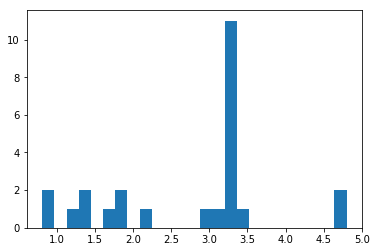

[ 2.7353432]
0.517110109329
Training epoch 101900
Iter: 101900
D loss: 3.641e-05
G_loss: -0.01331
()


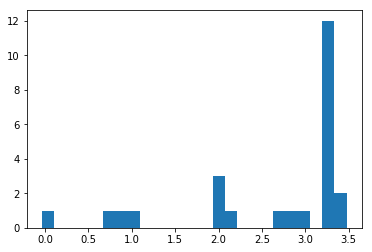

[ 2.61471916]
0.512405872345
Training epoch 102000
Iter: 102000
D loss: 2.741e-05
G_loss: -0.01231
()


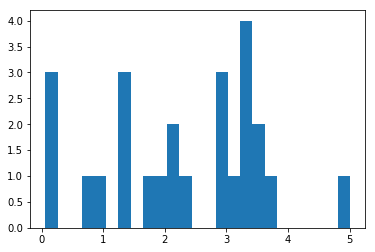

[ 2.25654597]
0.511927843094
Training epoch 102100
Iter: 102100
D loss: 2.881e-05
G_loss: -0.01211
()


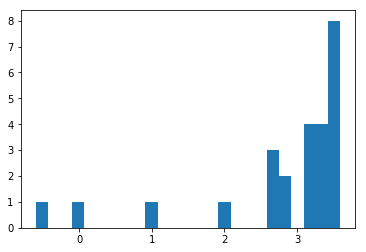

[ 2.81337895]
0.511820077896
Training epoch 102200
Iter: 102200
D loss: 3.063e-05
G_loss: -0.01341
()


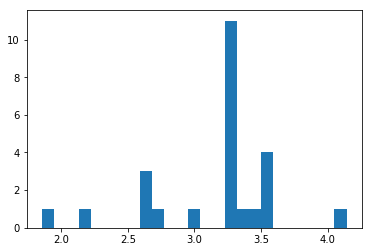

[ 3.1509342]
0.516752004623
Training epoch 102300
Iter: 102300
D loss: 4.327e-05
G_loss: -0.01342
()


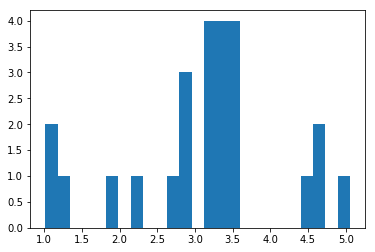

[ 3.1331034]
0.510981082916
Training epoch 102400
Iter: 102400
D loss: 3.521e-05
G_loss: -0.01269
()


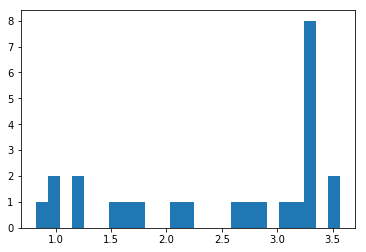

[ 2.49968459]
0.511561870575
Training epoch 102500
Iter: 102500
D loss: 3.499e-05
G_loss: -0.01327
()


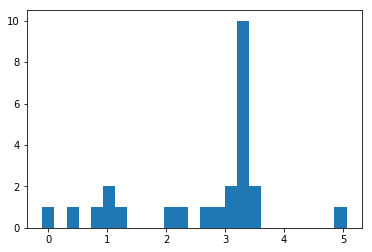

[ 2.63019971]
0.51296210289
Training epoch 102600
Iter: 102600
D loss: 3.615e-05
G_loss: -0.01325
()


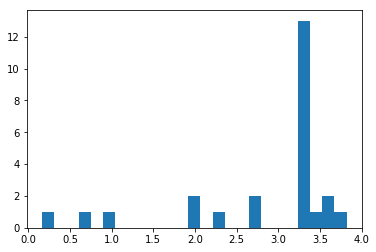

[ 2.82866539]
0.566561937332
Training epoch 102700
Iter: 102700
D loss: 2.788e-05
G_loss: -0.0139
()


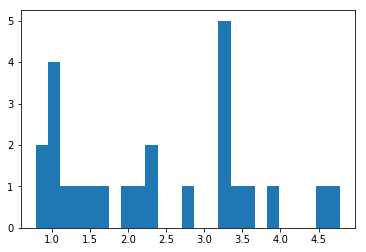

[ 2.39456922]
0.512427091599
Training epoch 102800
Iter: 102800
D loss: 2.792e-05
G_loss: -0.01342
()


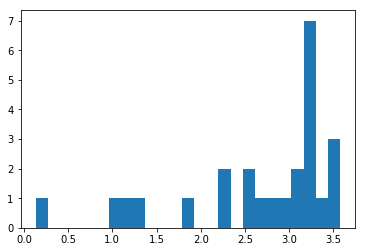

[ 2.65323178]
0.518727064133
Training epoch 102900
Iter: 102900
D loss: 3.268e-05
G_loss: -0.01327
()


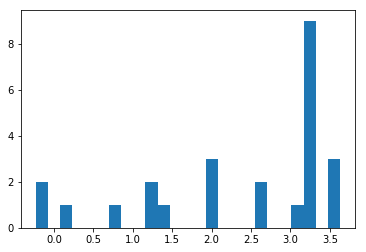

[ 2.33437516]
0.512835025787
Training epoch 103000
Iter: 103000
D loss: 2.984e-05
G_loss: -0.01344
()


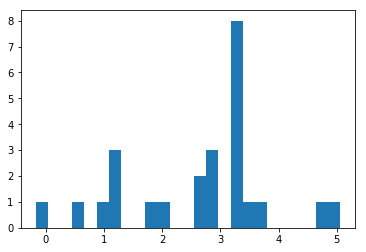

[ 2.60330641]
0.51268196106
Training epoch 103100
Iter: 103100
D loss: 2.643e-05
G_loss: -0.01248
()


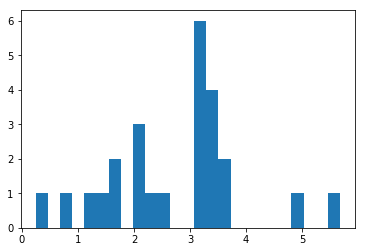

[ 2.75405671]
0.522191047668
Training epoch 103200
Iter: 103200
D loss: 3.063e-05
G_loss: -0.01338
()


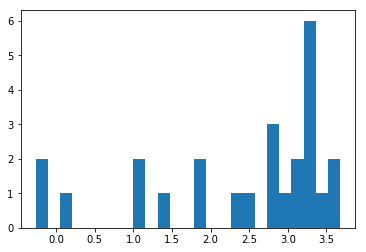

[ 2.4011182]
0.511566162109
Training epoch 103300
Iter: 103300
D loss: 3.271e-05
G_loss: -0.01318
()


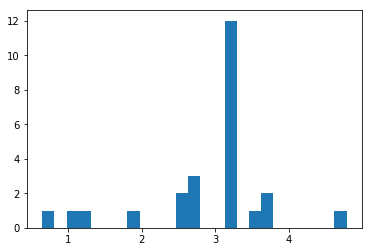

[ 2.89928962]
0.513236045837
Training epoch 103400
Iter: 103400
D loss: 3.592e-05
G_loss: -0.01336
()


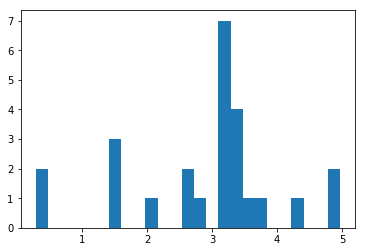

[ 2.90325149]
0.517375946045
Training epoch 103500
Iter: 103500
D loss: 3.204e-05
G_loss: -0.01337
()


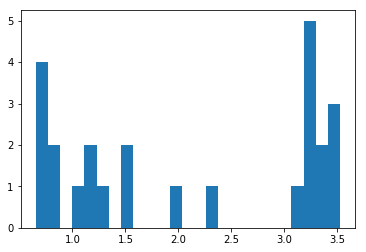

[ 2.12565578]
0.518293857574
Training epoch 103600
Iter: 103600
D loss: 3.415e-05
G_loss: -0.01328
()


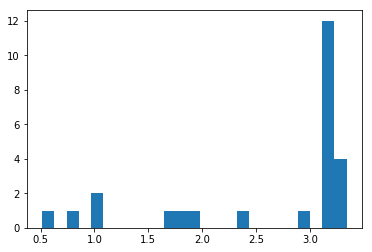

[ 2.61072129]
0.512356042862
Training epoch 103700
Iter: 103700
D loss: 3.782e-05
G_loss: -0.01231
()


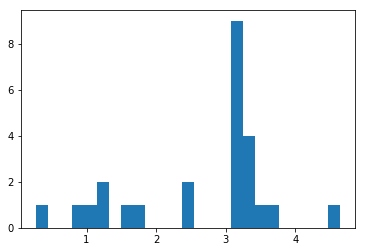

[ 2.67677533]
0.513317108154
Training epoch 103800
Iter: 103800
D loss: 3.316e-05
G_loss: -0.01322
()


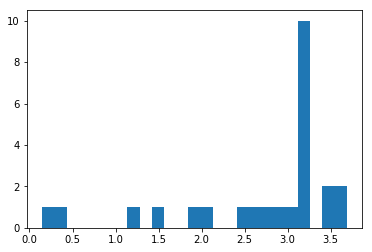

[ 2.66413086]
0.5157289505
Training epoch 103900
Iter: 103900
D loss: 3.335e-05
G_loss: -0.01335
()


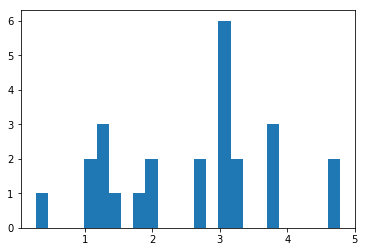

[ 2.59978279]
0.516928195953
Training epoch 104000
Iter: 104000
D loss: 3.518e-05
G_loss: -0.01314
()


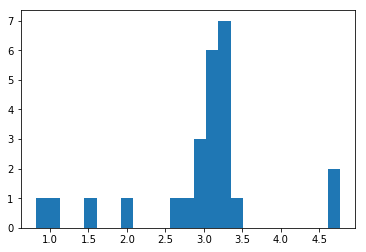

[ 2.95076654]
0.526009082794
Training epoch 104100
Iter: 104100
D loss: 2.573e-05
G_loss: -0.01231
()


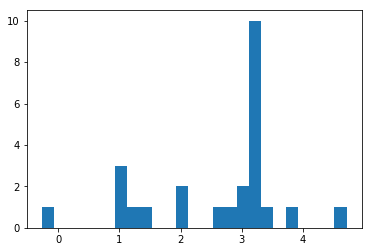

[ 2.60608919]
0.513216972351
Training epoch 104200
Iter: 104200
D loss: 3.123e-05
G_loss: -0.01273
()


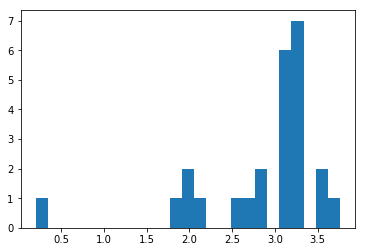

[ 2.86063147]
0.518859148026
Training epoch 104300
Iter: 104300
D loss: 2.777e-05
G_loss: -0.01246
()


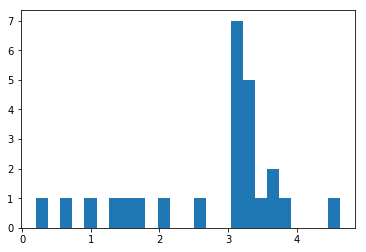

[ 2.75400832]
0.522738933563
Training epoch 104400
Iter: 104400
D loss: 3.03e-05
G_loss: -0.01339
()


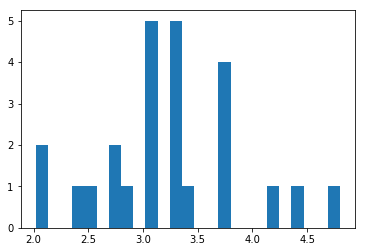

[ 3.2425418]
0.512172937393
Training epoch 104500
Iter: 104500
D loss: 2.621e-05
G_loss: -0.01312
()


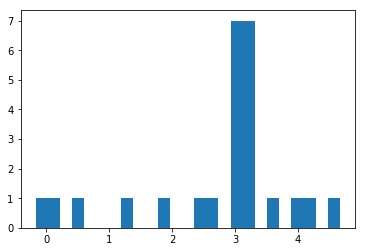

[ 2.76309712]
0.513372898102
Training epoch 104600
Iter: 104600
D loss: 3.423e-05
G_loss: -0.01236
()


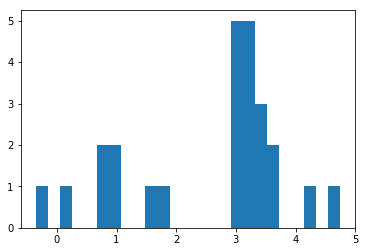

[ 2.59170753]
0.510348081589
Training epoch 104700
Iter: 104700
D loss: 2.628e-05
G_loss: -0.0135
()


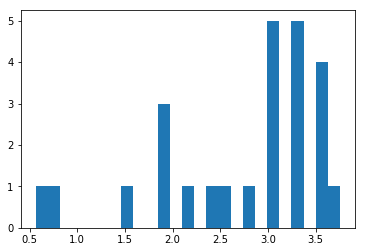

[ 2.72766527]
0.526600122452
Training epoch 104800
Iter: 104800
D loss: 3.056e-05
G_loss: -0.01335
()


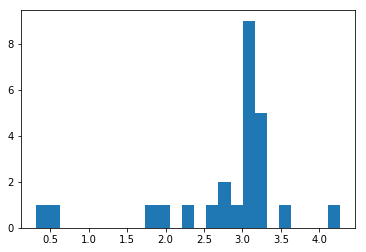

[ 2.78861797]
0.51372385025
Training epoch 104900
Iter: 104900
D loss: 3.28e-05
G_loss: -0.01261
()


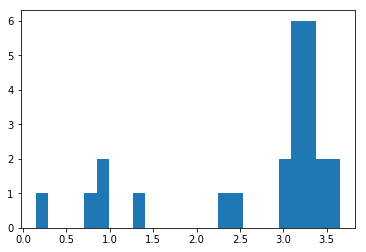

[ 2.72159095]
0.512670993805
Training epoch 105000
Iter: 105000
D loss: 2.767e-05
G_loss: -0.01393
()


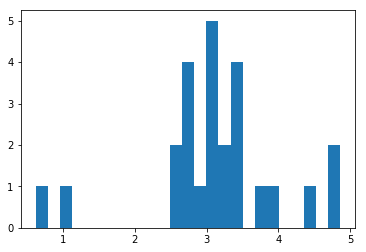

[ 3.14024508]
0.514466047287
Training epoch 105100
Iter: 105100
D loss: 2.585e-05
G_loss: -0.01322
()


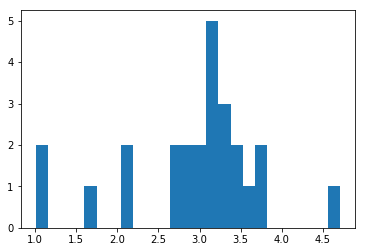

[ 2.93903687]
0.516700983047
Training epoch 105200
Iter: 105200
D loss: 3.472e-05
G_loss: -0.01292
()


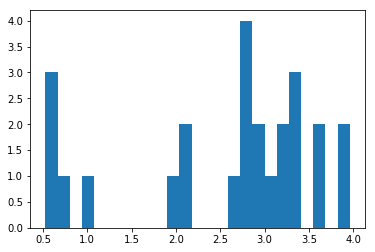

[ 2.55588621]
0.51348400116
Training epoch 105300
Iter: 105300
D loss: 2.813e-05
G_loss: -0.01312
()


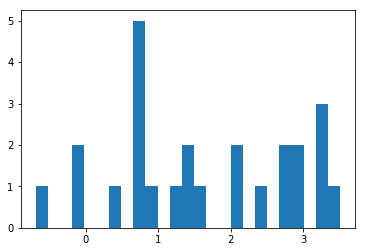

[ 1.63949426]
0.511688947678
Training epoch 105400
Iter: 105400
D loss: 3.595e-05
G_loss: -0.01284
()


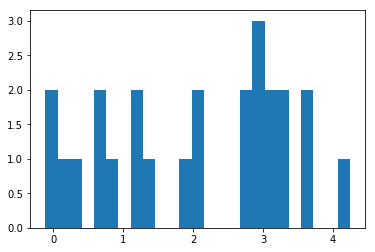

[ 2.04646213]
0.52058506012
Training epoch 105500
Iter: 105500
D loss: 3.247e-05
G_loss: -0.0132
()


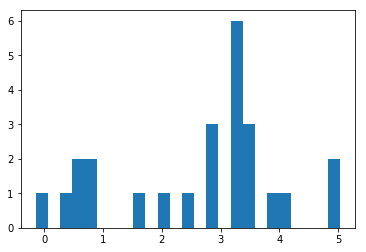

[ 2.64526849]
0.528511047363
Training epoch 105600
Iter: 105600
D loss: 2.758e-05
G_loss: -0.01326
()


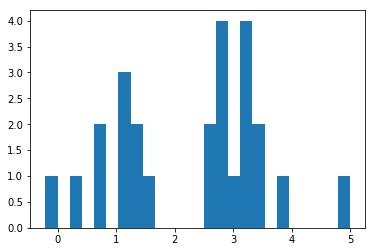

[ 2.31106101]
0.51235294342
Training epoch 105700
Iter: 105700
D loss: 3.499e-05
G_loss: -0.01314
()


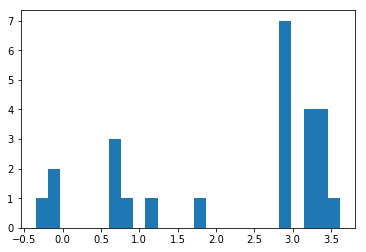

[ 2.21626994]
0.515913009644
Training epoch 105800
Iter: 105800
D loss: 3.511e-05
G_loss: -0.01263
()


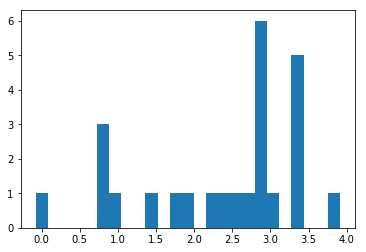

[ 2.38707619]
0.512979984283
Training epoch 105900
Iter: 105900
D loss: 3.224e-05
G_loss: -0.01321
()


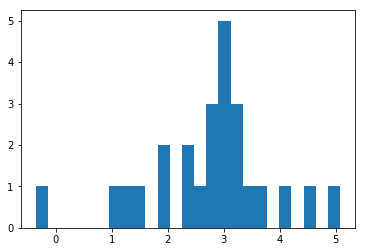

[ 2.76693661]
0.514232158661
Training epoch 106000
Iter: 106000
D loss: 3.132e-05
G_loss: -0.01312
()


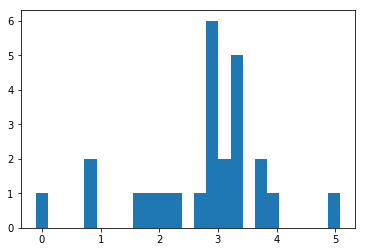

[ 2.74982187]
0.518533945084
Training epoch 106100
Iter: 106100
D loss: 3.014e-05
G_loss: -0.0133
()


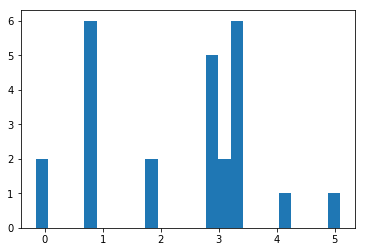

[ 2.32867311]
0.516341924667
Training epoch 106200
Iter: 106200
D loss: 2.82e-05
G_loss: -0.01353
()


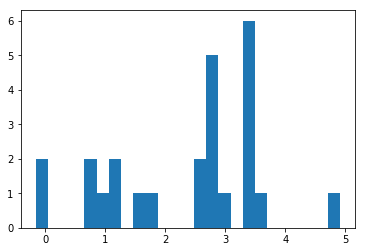

[ 2.34913725]
0.512275934219
Training epoch 106300
Iter: 106300
D loss: 3.008e-05
G_loss: -0.01401
()


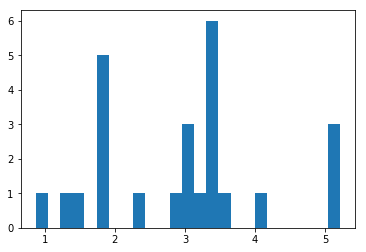

[ 2.94431931]
0.512636899948
Training epoch 106400
Iter: 106400
D loss: 2.96e-05
G_loss: -0.01148
()


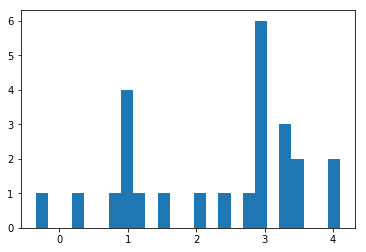

[ 2.2754914]
0.515616893768
Training epoch 106500
Iter: 106500
D loss: 2.981e-05
G_loss: -0.01286
()


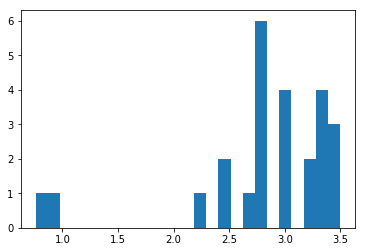

[ 2.8155498]
0.518547773361
Training epoch 106600
Iter: 106600
D loss: 3.802e-05
G_loss: -0.01323
()


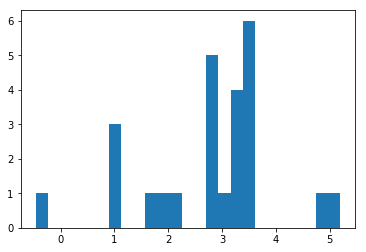

[ 2.7623208]
0.525288820267
Training epoch 106700
Iter: 106700
D loss: 2.982e-05
G_loss: -0.0121
()


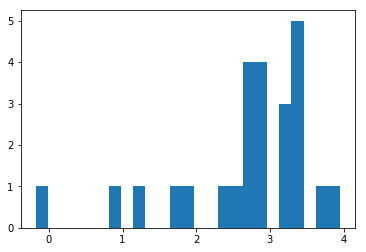

[ 2.6913357]
0.518514871597
Training epoch 106800
Iter: 106800
D loss: 3.322e-05
G_loss: -0.01224
()


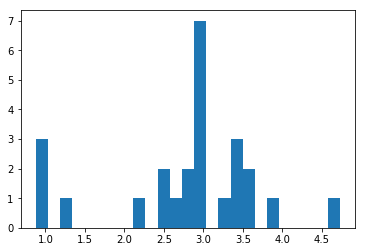

[ 2.76967081]
0.514056921005
Training epoch 106900
Iter: 106900
D loss: 2.342e-05
G_loss: -0.0132
()


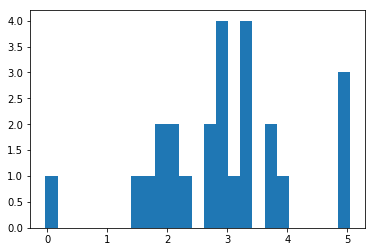

[ 2.92407293]
0.513072013855
Training epoch 107000
Iter: 107000
D loss: 4.38e-05
G_loss: -0.01206
()


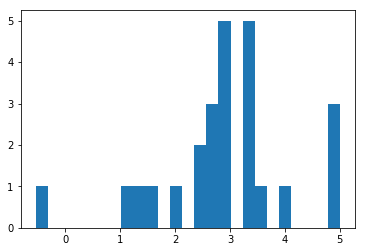

[ 2.86190584]
0.514679908752
Training epoch 107100
Iter: 107100
D loss: 3.081e-05
G_loss: -0.01328
()


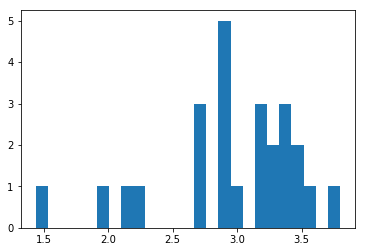

[ 2.9632843]
0.518462896347
Training epoch 107200
Iter: 107200
D loss: 3.699e-05
G_loss: -0.01297
()


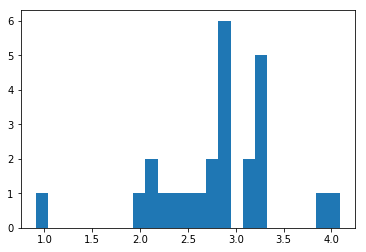

[ 2.80881487]
0.601903915405
Training epoch 107300
Iter: 107300
D loss: 3.201e-05
G_loss: -0.01365
()


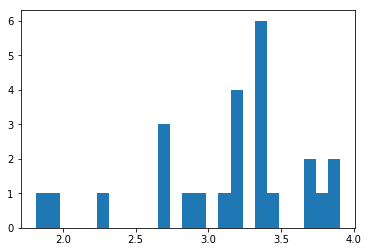

[ 3.13360533]
0.5146920681
Training epoch 107400
Iter: 107400
D loss: 2.903e-05
G_loss: -0.01305
()


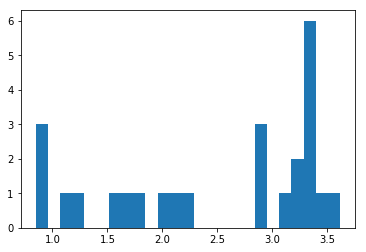

[ 2.46222904]
0.514576911926
Training epoch 107500
Iter: 107500
D loss: 4.255e-05
G_loss: -0.01304
()


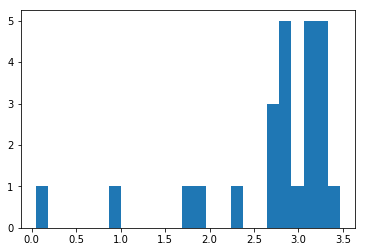

[ 2.72124808]
0.51437997818
Training epoch 107600
Iter: 107600
D loss: 2.901e-05
G_loss: -0.0133
()


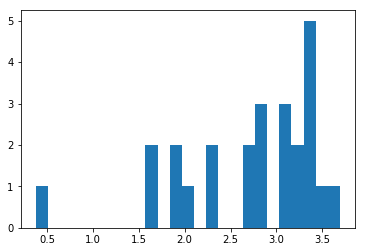

[ 2.71112099]
0.513935804367
Training epoch 107700
Iter: 107700
D loss: 3.392e-05
G_loss: -0.01338
()


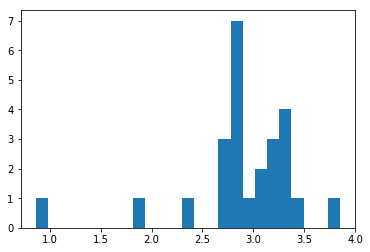

[ 2.90558792]
0.52202796936
Training epoch 107800
Iter: 107800
D loss: 3.072e-05
G_loss: -0.01232
()


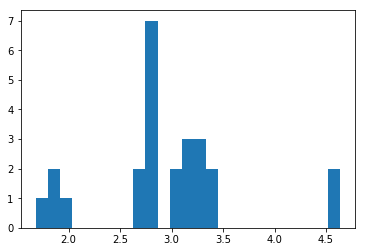

[ 2.96711834]
0.514490127563
Training epoch 107900
Iter: 107900
D loss: 2.767e-05
G_loss: -0.01243
()


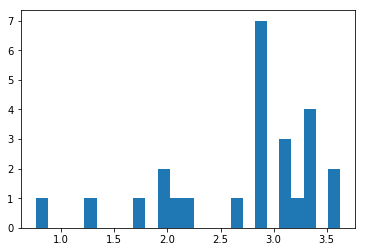

[ 2.70851552]
0.515286207199
Training epoch 108000
Iter: 108000
D loss: 3.831e-05
G_loss: -0.01247
()


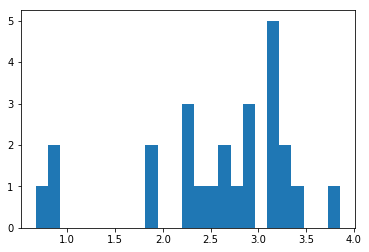

[ 2.57102474]
0.514235019684
Training epoch 108100
Iter: 108100
D loss: 3.101e-05
G_loss: -0.01121
()


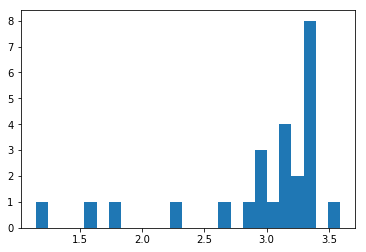

[ 2.93952583]
0.51508808136
Training epoch 108200
Iter: 108200
D loss: 3.08e-05
G_loss: -0.01326
()


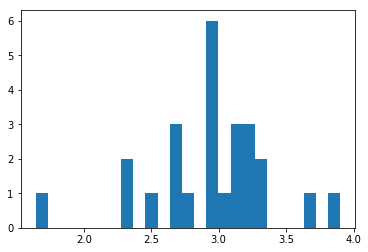

[ 2.94538266]
0.51340508461
Training epoch 108300
Iter: 108300
D loss: 3.187e-05
G_loss: -0.01348
()


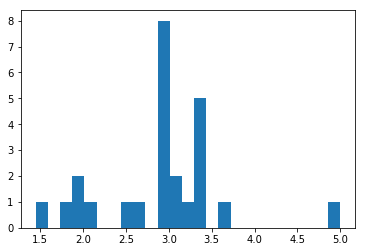

[ 2.90109136]
0.521237134933
Training epoch 108400
Iter: 108400
D loss: 3.121e-05
G_loss: -0.01264
()


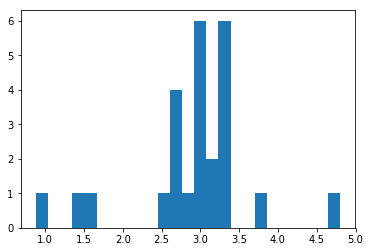

[ 2.92043983]
0.52080488205
Training epoch 108500
Iter: 108500
D loss: 3.559e-05
G_loss: -0.0134
()


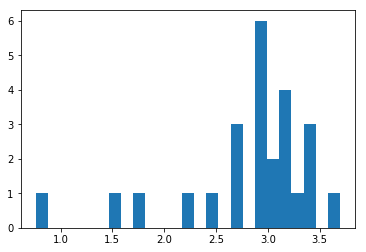

[ 2.79947598]
0.514863967896
Training epoch 108600
Iter: 108600
D loss: 3.092e-05
G_loss: -0.01316
()


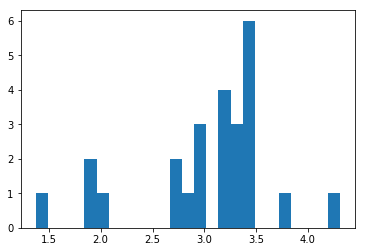

[ 3.00776564]
0.515547990799
Training epoch 108700
Iter: 108700
D loss: 3.431e-05
G_loss: -0.01285
()


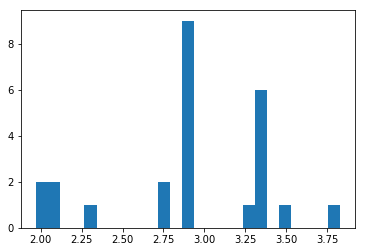

[ 2.89788905]
0.51273393631
Training epoch 108800
Iter: 108800
D loss: 2.302e-05
G_loss: -0.01369
()


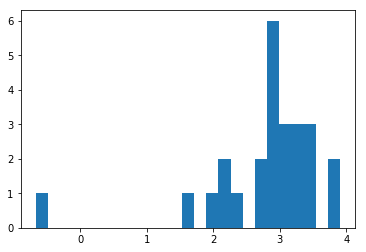

[ 2.79615341]
0.514404058456
Training epoch 108900
Iter: 108900
D loss: 3.551e-05
G_loss: -0.01182
()


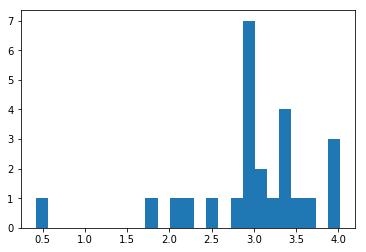

[ 2.96388154]
0.519320011139
Training epoch 109000
Iter: 109000
D loss: 3.138e-05
G_loss: -0.01341
()


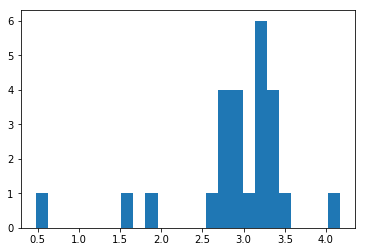

[ 2.89931181]
0.513463973999
Training epoch 109100
Iter: 109100
D loss: 3.529e-05
G_loss: -0.01396
()


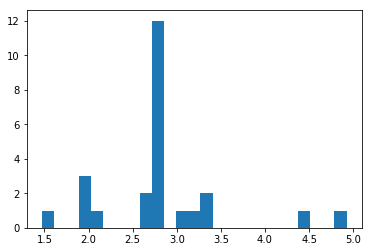

[ 2.82747304]
0.524127006531
Training epoch 109200
Iter: 109200
D loss: 2.435e-05
G_loss: -0.01289
()


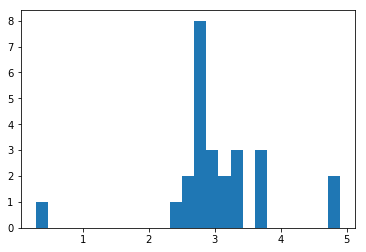

[ 3.05047598]
0.514544963837
Training epoch 109300
Iter: 109300
D loss: 2.814e-05
G_loss: -0.01344
()


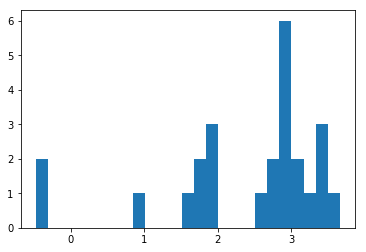

[ 2.4025241]
0.514904022217
Training epoch 109400
Iter: 109400
D loss: 2.248e-05
G_loss: -0.01345
()


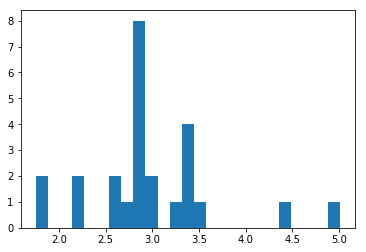

[ 2.99197675]
0.513458967209
Training epoch 109500
Iter: 109500
D loss: 3.163e-05
G_loss: -0.01322
()


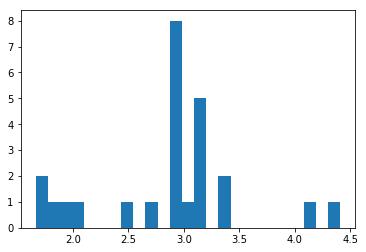

[ 2.8650001]
0.512933969498
Training epoch 109600
Iter: 109600
D loss: 2.928e-05
G_loss: -0.0121
()


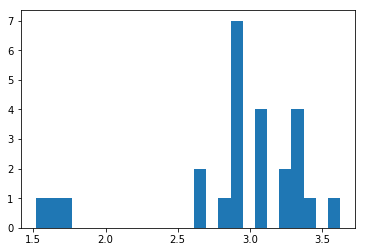

[ 2.90066665]
0.514452934265
Training epoch 109700
Iter: 109700
D loss: 3.224e-05
G_loss: -0.01273
()


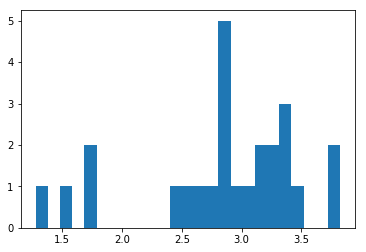

[ 2.84649627]
0.51522898674
Training epoch 109800
Iter: 109800
D loss: 3.001e-05
G_loss: -0.01352
()


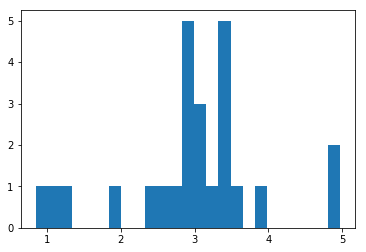

[ 2.95395773]
0.516970157623
Training epoch 109900
Iter: 109900
D loss: 3.655e-05
G_loss: -0.01109
()


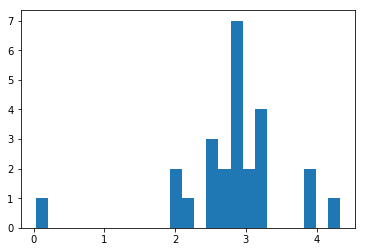

[ 2.81808923]
0.514397859573
Training epoch 110000
Iter: 110000
D loss: 3.321e-05
G_loss: -0.01332
()


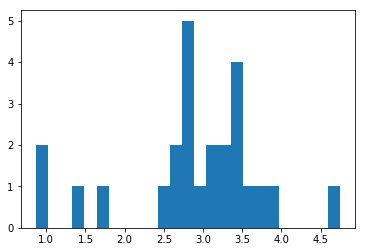

[ 2.88527611]
0.51865696907
Training epoch 110100
Iter: 110100
D loss: 3.314e-05
G_loss: -0.01272
()


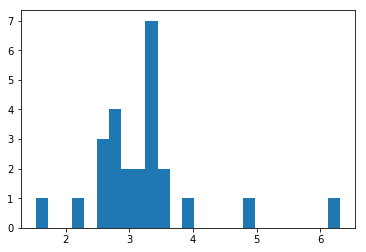

[ 3.19279174]
0.520246982574
Training epoch 110200
Iter: 110200
D loss: 3.231e-05
G_loss: -0.01266
()


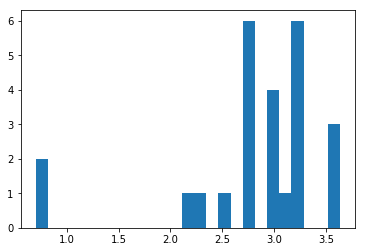

[ 2.82132529]
0.509503126144
Training epoch 110300
Iter: 110300
D loss: 4.277e-05
G_loss: -0.01318
()


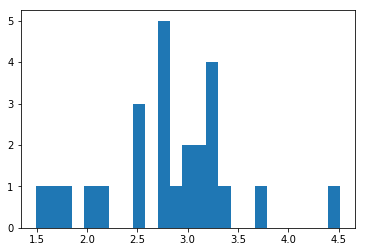

[ 2.81224528]
0.512971162796
Training epoch 110400
Iter: 110400
D loss: 2.993e-05
G_loss: -0.01341
()


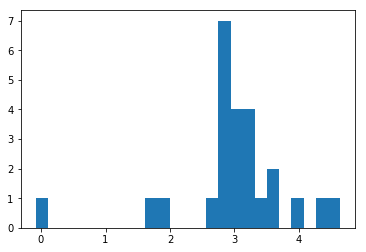

[ 2.97386562]
0.515323162079
Training epoch 110500
Iter: 110500
D loss: 2.983e-05
G_loss: -0.01254
()


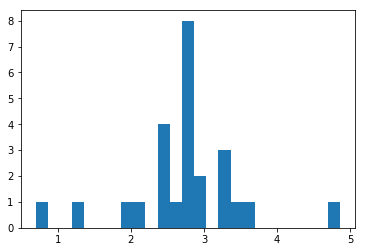

[ 2.73471712]
0.512611150742
Training epoch 110600
Iter: 110600
D loss: 3.599e-05
G_loss: -0.01312
()


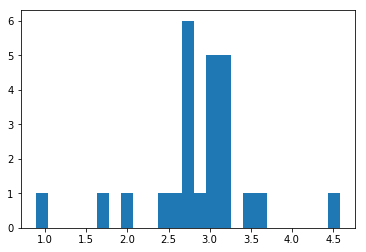

[ 2.88032292]
0.520761966705
Training epoch 110700
Iter: 110700
D loss: 3.314e-05
G_loss: -0.01144
()


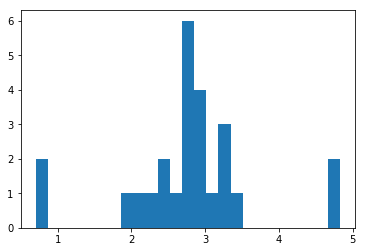

[ 2.76540097]
0.517117977142
Training epoch 110800
Iter: 110800
D loss: 3.222e-05
G_loss: -0.01325
()


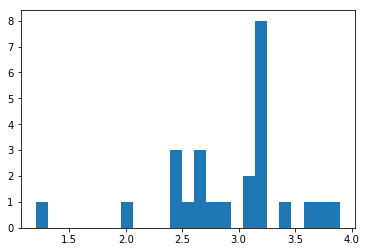

[ 2.90958535]
0.519515037537
Training epoch 110900
Iter: 110900
D loss: 3.311e-05
G_loss: -0.01331
()


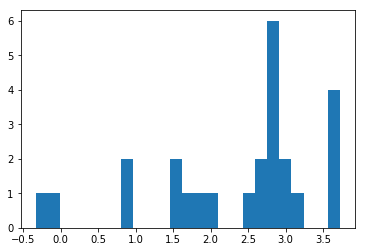

[ 2.32141697]
0.51340007782
Training epoch 111000
Iter: 111000
D loss: 4.546e-05
G_loss: -0.01318
()


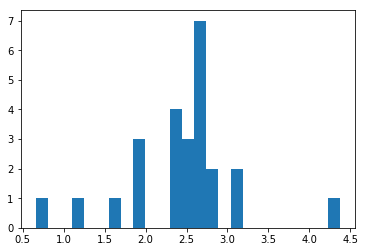

[ 2.46784392]
0.515458106995
Training epoch 111100
Iter: 111100
D loss: 2.997e-05
G_loss: -0.01333
()


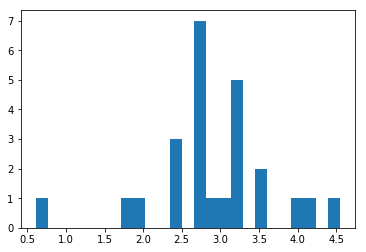

[ 2.91516749]
0.515237092972
Training epoch 111200
Iter: 111200
D loss: 3.825e-05
G_loss: -0.01306
()


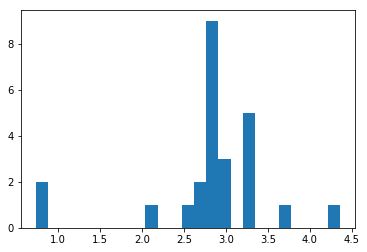

[ 2.79506681]
0.522850990295
Training epoch 111300
Iter: 111300
D loss: 2.98e-05
G_loss: -0.0131
()


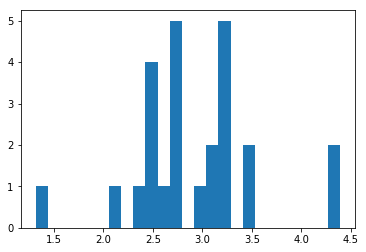

[ 2.93586625]
0.519299030304
Training epoch 111400
Iter: 111400
D loss: 3.122e-05
G_loss: -0.009726
()


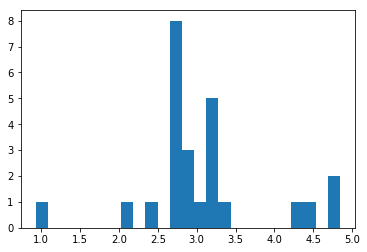

[ 3.08298338]
0.510907888412
Training epoch 111500
Iter: 111500
D loss: 3.429e-05
G_loss: -0.01261
()


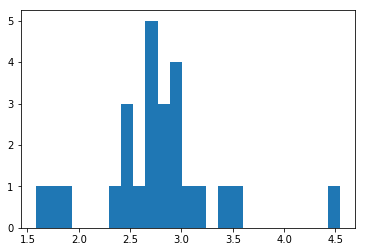

[ 2.76262713]
0.512006998062
Training epoch 111600
Iter: 111600
D loss: 3.341e-05
G_loss: -0.01315
()


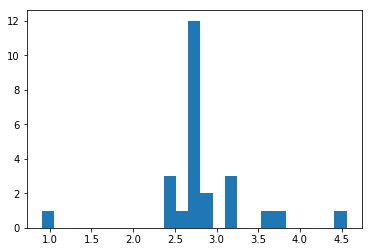

[ 2.85186222]
0.527343988419
Training epoch 111700
Iter: 111700
D loss: 3.145e-05
G_loss: -0.01186
()


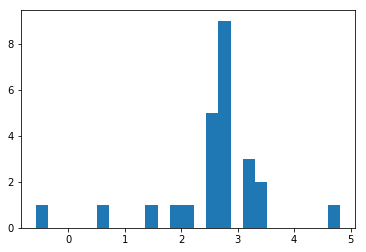

[ 2.56049037]
0.513456106186
Training epoch 111800
Iter: 111800
D loss: 3.26e-05
G_loss: -0.01319
()


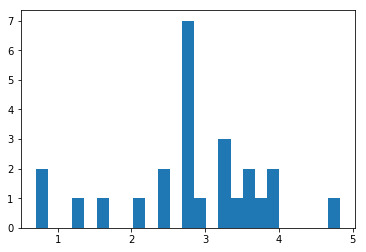

[ 2.80072455]
0.51317191124
Training epoch 111900
Iter: 111900
D loss: 2.55e-05
G_loss: -0.01327
()


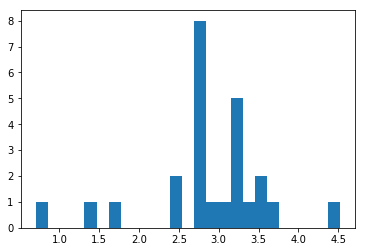

[ 2.84673147]
0.510872125626
Training epoch 112000
Iter: 112000
D loss: 3.713e-05
G_loss: -0.01327
()


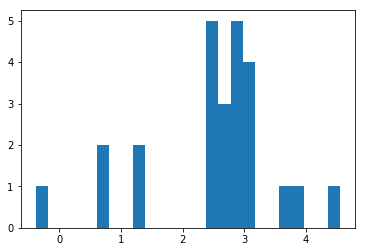

[ 2.49764904]
0.513041973114
Training epoch 112100
Iter: 112100
D loss: 3.451e-05
G_loss: -0.01278
()


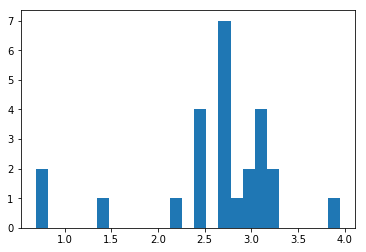

[ 2.63142896]
0.512316942215
Training epoch 112200
Iter: 112200
D loss: 2.956e-05
G_loss: -0.01316
()


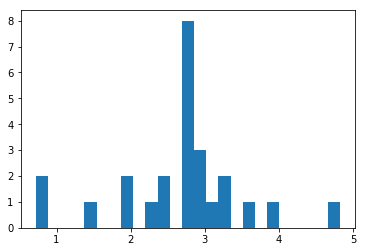

[ 2.67437249]
0.513187885284
Training epoch 112300
Iter: 112300
D loss: 4.035e-05
G_loss: -0.01274
()


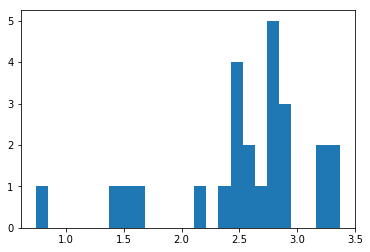

[ 2.53131806]
0.521754980087
Training epoch 112400
Iter: 112400
D loss: 3.333e-05
G_loss: -0.01332
()


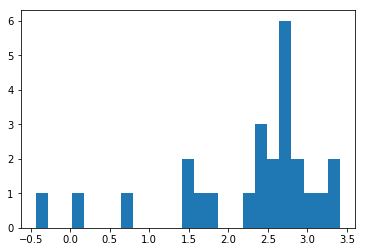

[ 2.25476086]
0.518671035767
Training epoch 112500
Iter: 112500
D loss: 3.191e-05
G_loss: -0.01296
()


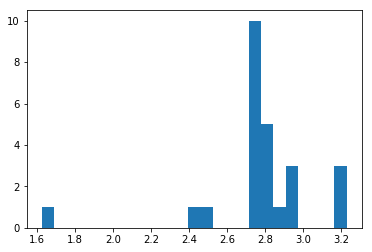

[ 2.78011477]
0.522497177124
Training epoch 112600
Iter: 112600
D loss: 3.123e-05
G_loss: -0.01323
()


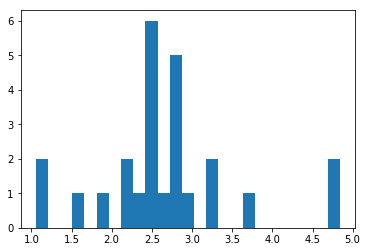

[ 2.66155239]
0.523406028748
Training epoch 112700
Iter: 112700
D loss: 2.912e-05
G_loss: -0.01322
()


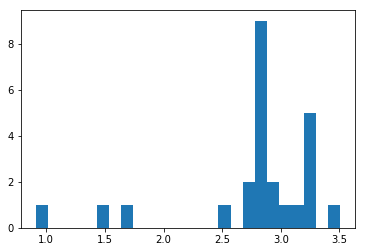

[ 2.76277808]
0.521213054657
Training epoch 112800
Iter: 112800
D loss: 3.038e-05
G_loss: -0.01206
()


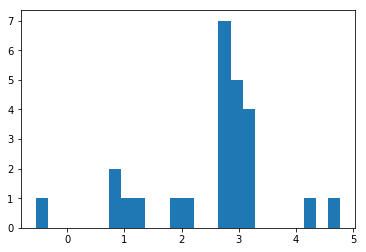

[ 2.55747109]
0.519129991531
Training epoch 112900
Iter: 112900
D loss: 4.256e-05
G_loss: -0.01353
()


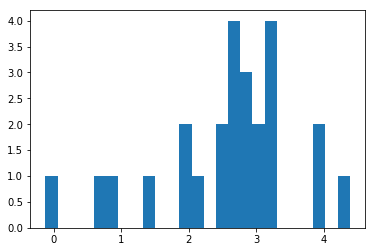

[ 2.58920982]
0.517668008804
Training epoch 113000
Iter: 113000
D loss: 3.249e-05
G_loss: -0.01343
()


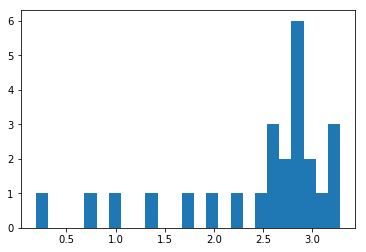

[ 2.43042991]
0.513935089111
Training epoch 113100
Iter: 113100
D loss: 3.852e-05
G_loss: -0.01217
()


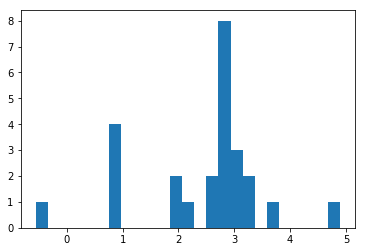

[ 2.43202904]
0.521135091782
Training epoch 113200
Iter: 113200
D loss: 3.07e-05
G_loss: -0.01333
()


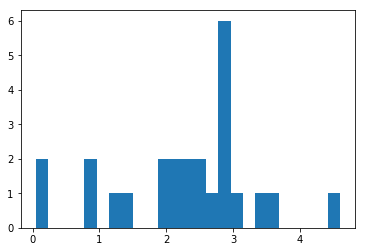

[ 2.26207266]
0.518528938293
Training epoch 113300
Iter: 113300
D loss: 3.124e-05
G_loss: -0.01321
()


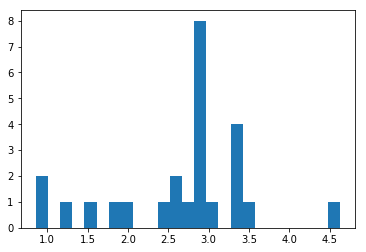

[ 2.64161301]
0.514199972153
Training epoch 113400
Iter: 113400
D loss: 3.548e-05
G_loss: -0.01268
()


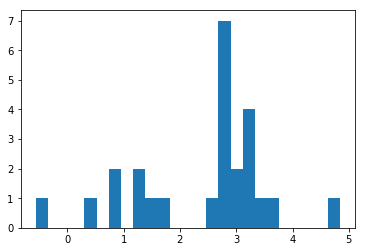

[ 2.43904333]
0.523674964905
Training epoch 113500
Iter: 113500
D loss: 3.125e-05
G_loss: -0.01332
()


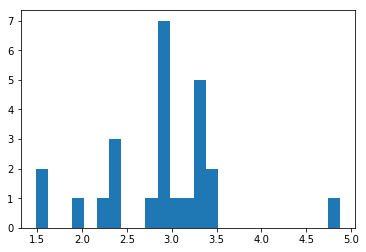

[ 2.85616459]
0.517215013504
Training epoch 113600
Iter: 113600
D loss: 2.906e-05
G_loss: -0.01324
()


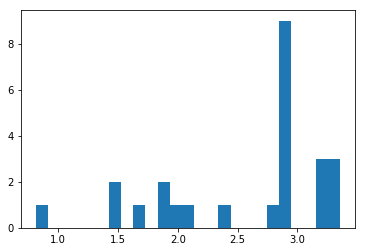

[ 2.56162309]
0.513216018677
Training epoch 113700
Iter: 113700
D loss: 3.463e-05
G_loss: -0.01289
()


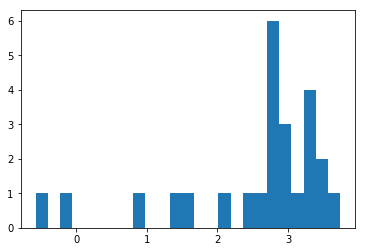

[ 2.55333838]
0.515605926514
Training epoch 113800
Iter: 113800
D loss: 3.452e-05
G_loss: -0.01283
()


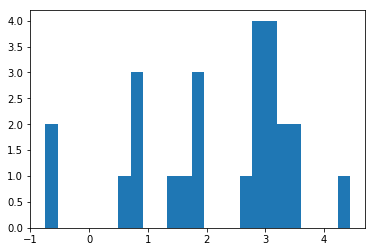

[ 2.18828012]
0.512602806091
Training epoch 113900
Iter: 113900
D loss: 2.634e-05
G_loss: -0.01267
()


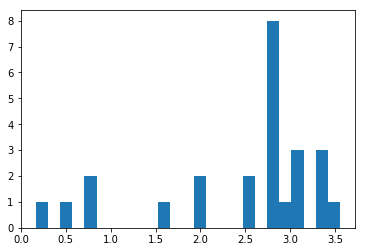

[ 2.45440022]
0.513065814972
Training epoch 114000
Iter: 114000
D loss: 2.793e-05
G_loss: -0.01347
()


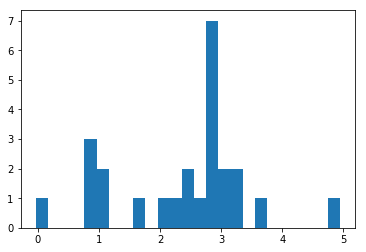

[ 2.36985748]
0.512115001678
Training epoch 114100
Iter: 114100
D loss: 3.805e-05
G_loss: -0.01332
()


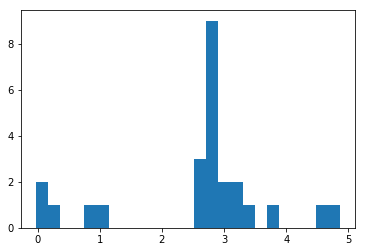

[ 2.59839672]
0.524511098862
Training epoch 114200
Iter: 114200
D loss: 1.953e-05
G_loss: -0.01348
()


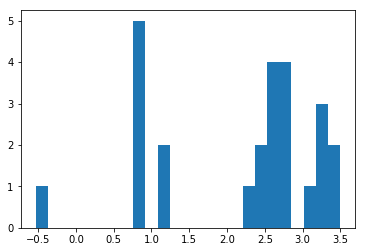

[ 2.18021842]
0.516810894012
Training epoch 114300
Iter: 114300
D loss: 2.399e-05
G_loss: -0.01355
()


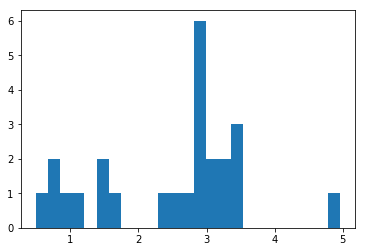

[ 2.46302266]
0.51257276535
Training epoch 114400
Iter: 114400
D loss: 3.096e-05
G_loss: -0.01335
()


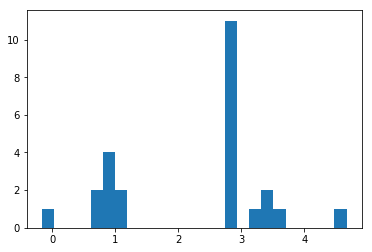

[ 2.25356651]
0.520004987717
Training epoch 114500
Iter: 114500
D loss: 3.402e-05
G_loss: -0.01206
()


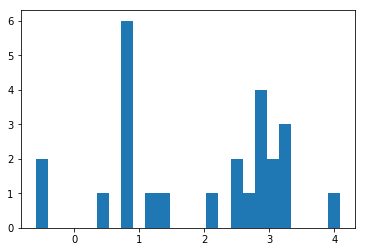

[ 1.935781]
0.526765823364
Training epoch 114600
Iter: 114600
D loss: 3.032e-05
G_loss: -0.01171
()


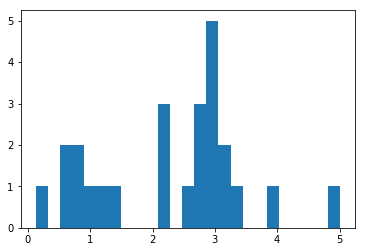

[ 2.28678369]
0.511039018631
Training epoch 114700
Iter: 114700
D loss: 3.308e-05
G_loss: -0.01343
()


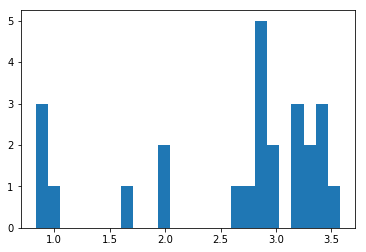

[ 2.5993909]
0.5164270401
Training epoch 114800
Iter: 114800
D loss: 2.882e-05
G_loss: -0.01334
()


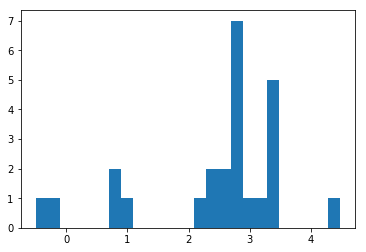

[ 2.4781908]
0.513409137726
Training epoch 114900
Iter: 114900
D loss: 3.758e-05
G_loss: -0.01276
()


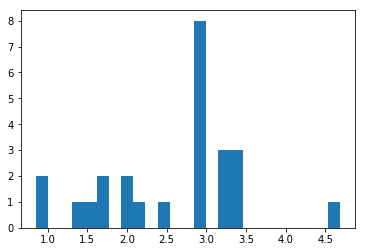

[ 2.57539263]
0.516204833984
Training epoch 115000
Iter: 115000
D loss: 3.291e-05
G_loss: -0.01346
()


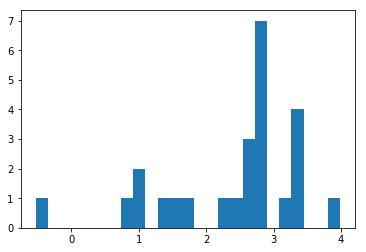

[ 2.41287505]
0.521263122559
Training epoch 115100
Iter: 115100
D loss: 2.714e-05
G_loss: -0.01357
()


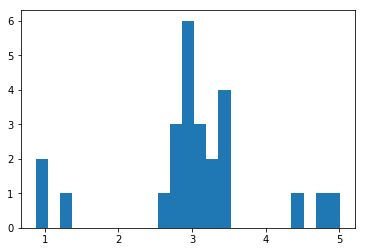

[ 3.01390927]
0.516571044922
Training epoch 115200
Iter: 115200
D loss: 3.348e-05
G_loss: -0.01267
()


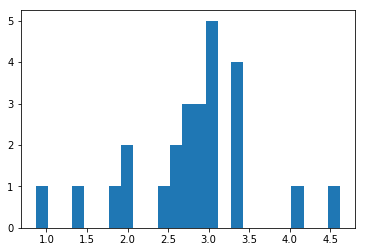

[ 2.8008868]
0.516069173813
Training epoch 115300
Iter: 115300
D loss: 2.828e-05
G_loss: -0.01338
()


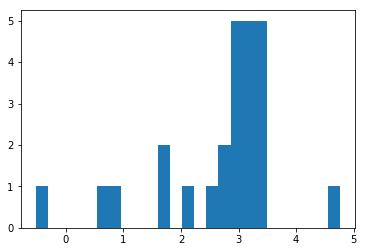

[ 2.66476417]
0.528280973434
Training epoch 115400
Iter: 115400
D loss: 2.995e-05
G_loss: -0.01341
()


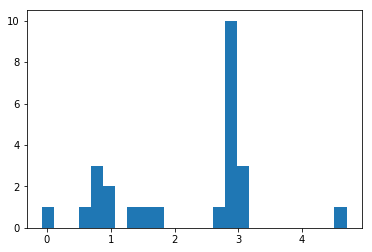

[ 2.21782563]
0.527262926102
Training epoch 115500
Iter: 115500
D loss: 3.701e-05
G_loss: -0.01295
()


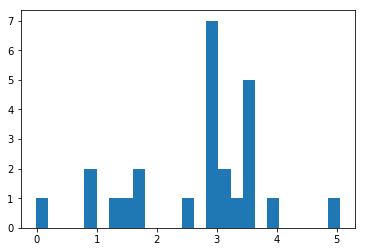

[ 2.71077497]
0.515094041824
Training epoch 115600
Iter: 115600
D loss: 3.33e-05
G_loss: -0.01331
()


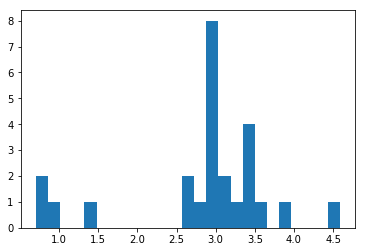

[ 2.8618834]
0.514394044876
Training epoch 115700
Iter: 115700
D loss: 3.186e-05
G_loss: -0.01338
()


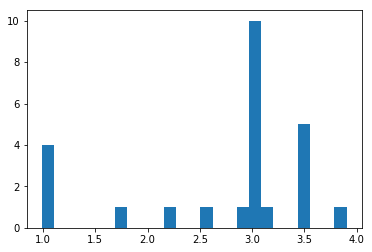

[ 2.74954066]
0.515799045563
Training epoch 115800
Iter: 115800
D loss: 3.397e-05
G_loss: -0.01192
()


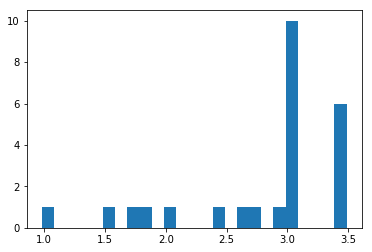

[ 2.79614569]
0.516302108765
Training epoch 115900
Iter: 115900
D loss: 2.955e-05
G_loss: -0.0122
()


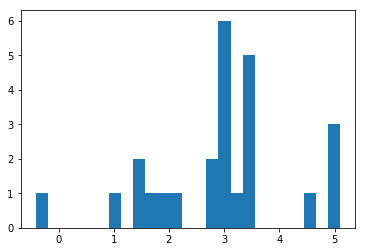

[ 2.9317154]
0.514498233795
Training epoch 116000
Iter: 116000
D loss: 3.764e-05
G_loss: -0.01242
()


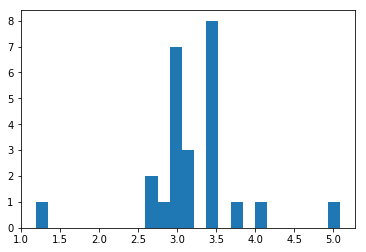

[ 3.23144506]
0.51371216774
Training epoch 116100
Iter: 116100
D loss: 3.763e-05
G_loss: -0.01325
()


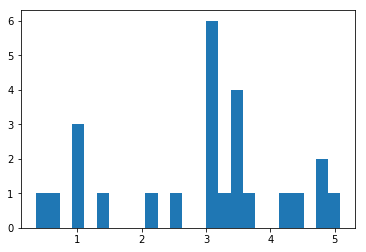

[ 2.89414167]
0.513548851013
Training epoch 116200
Iter: 116200
D loss: 3.286e-05
G_loss: -0.01221
()


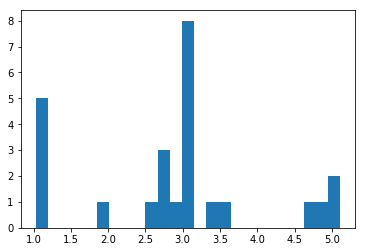

[ 2.881986]
0.517838954926
Training epoch 116300
Iter: 116300
D loss: 3.591e-05
G_loss: -0.01332
()


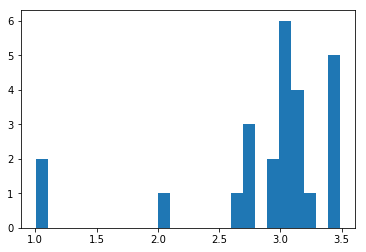

[ 2.87832917]
0.514215946198
Training epoch 116400
Iter: 116400
D loss: 3.132e-05
G_loss: -0.01339
()


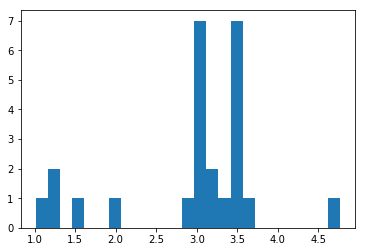

[ 2.94180033]
0.512945175171
Training epoch 116500
Iter: 116500
D loss: 2.004e-05
G_loss: -0.01358
()


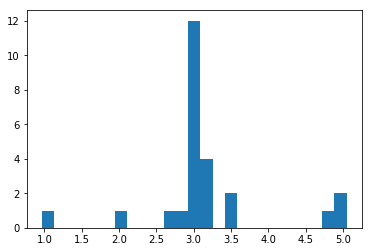

[ 3.15108141]
0.525687932968
Training epoch 116600
Iter: 116600
D loss: 2.706e-05
G_loss: -0.01295
()


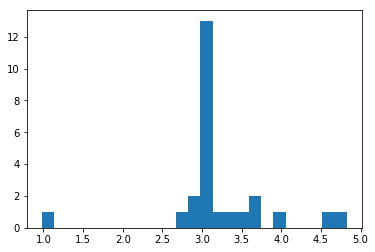

[ 3.19687933]
0.518541812897
Training epoch 116700
Iter: 116700
D loss: 2.872e-05
G_loss: -0.01298
()


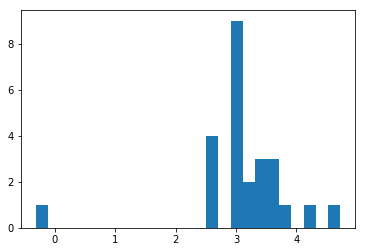

[ 3.10818135]
0.5142121315
Training epoch 116800
Iter: 116800
D loss: 4.318e-05
G_loss: -0.01047
()


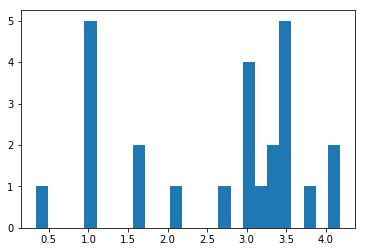

[ 2.59288932]
0.514280080795
Training epoch 116900
Iter: 116900
D loss: 4.451e-05
G_loss: -0.01125
()


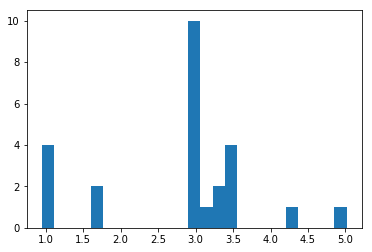

[ 2.80538355]
0.512633085251
Training epoch 117000
Iter: 117000
D loss: 3.123e-05
G_loss: -0.01357
()


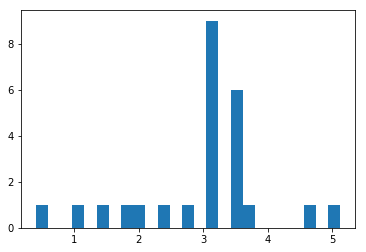

[ 2.96364492]
0.512398958206
Training epoch 117100
Iter: 117100
D loss: 3.294e-05
G_loss: -0.01215
()


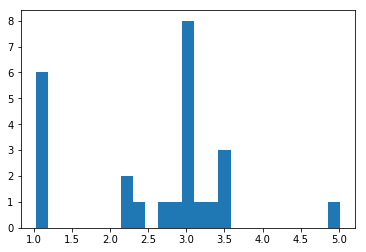

[ 2.61919244]
0.523084878922
Training epoch 117200
Iter: 117200
D loss: 2.857e-05
G_loss: -0.01205
()


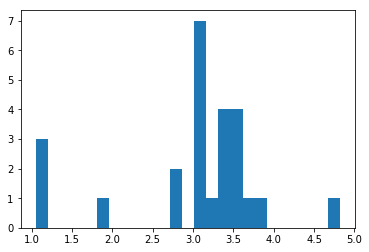

[ 3.0350714]
0.511380195618
Training epoch 117300
Iter: 117300
D loss: 2.63e-05
G_loss: -0.01243
()


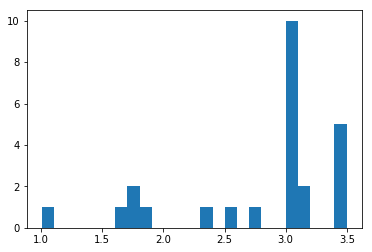

[ 2.81143092]
0.513982057571
Training epoch 117400
Iter: 117400
D loss: 2.095e-05
G_loss: -0.01364
()


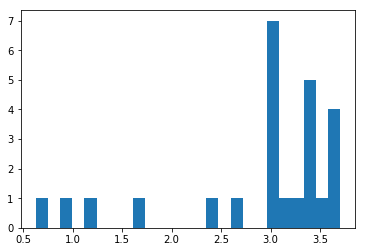

[ 2.90405695]
0.511597156525
Training epoch 117500
Iter: 117500
D loss: 2.975e-05
G_loss: -0.01322
()


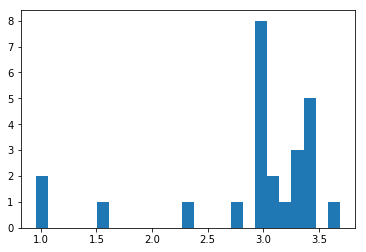

[ 2.92386463]
0.519227981567
Training epoch 117600
Iter: 117600
D loss: 3.218e-05
G_loss: -0.01251
()


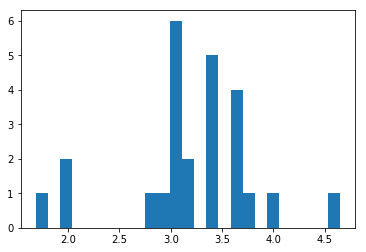

[ 3.19290405]
0.523944139481
Training epoch 117700
Iter: 117700
D loss: 3.533e-05
G_loss: -0.01277
()


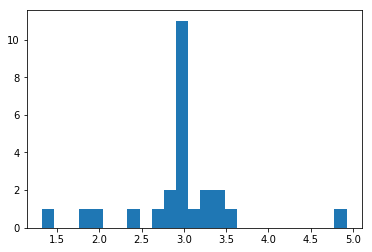

[ 2.93271349]
0.51744389534
Training epoch 117800
Iter: 117800
D loss: 3.867e-05
G_loss: -0.009901
()


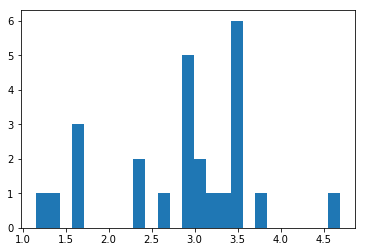

[ 2.85839457]
0.517497062683
Training epoch 117900
Iter: 117900
D loss: 2.55e-05
G_loss: -0.01271
()


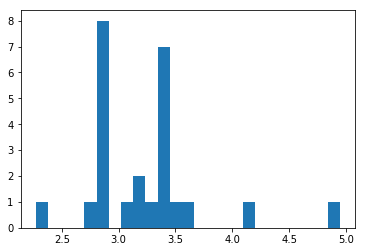

[ 3.23434307]
0.513739109039
Training epoch 118000
Iter: 118000
D loss: 2.779e-05
G_loss: -0.01339
()


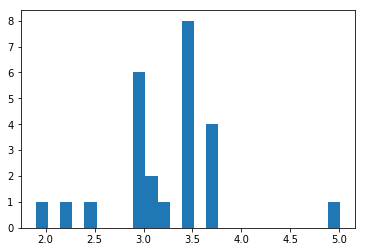

[ 3.25741784]
0.526836872101
Training epoch 118100
Iter: 118100
D loss: 3.573e-05
G_loss: -0.0122
()


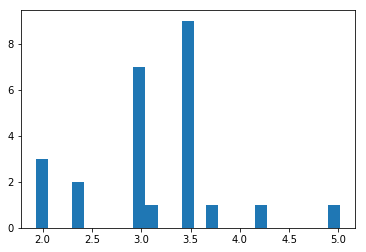

[ 3.17218756]
0.512674093246
Training epoch 118200
Iter: 118200
D loss: 3.299e-05
G_loss: -0.01206
()


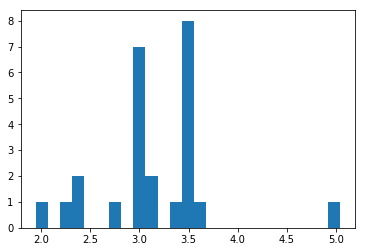

[ 3.17053766]
0.516642093658
Training epoch 118300
Iter: 118300
D loss: 3.103e-05
G_loss: -0.01232
()


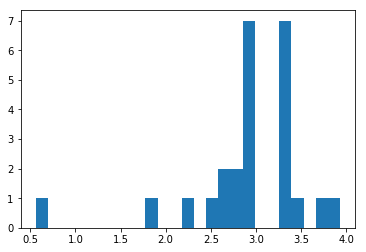

[ 2.90671659]
0.512568950653
Training epoch 118400
Iter: 118400
D loss: 2.756e-05
G_loss: -0.01317
()


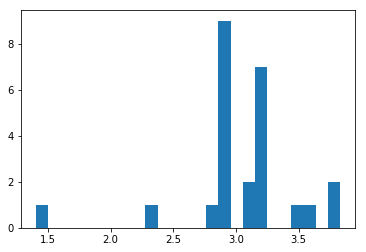

[ 3.03445746]
0.517298936844
Training epoch 118500
Iter: 118500
D loss: 3.075e-05
G_loss: -0.01343
()


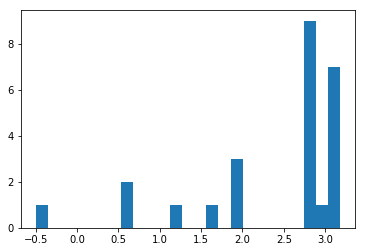

[ 2.39028508]
0.514396905899
Training epoch 118600
Iter: 118600
D loss: 2.713e-05
G_loss: -0.01346
()


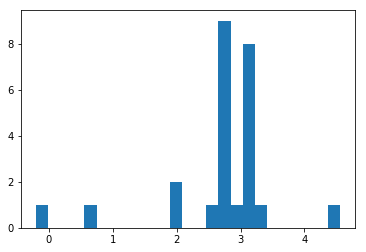

[ 2.71185595]
0.511117935181
Training epoch 118700
Iter: 118700
D loss: 2.985e-05
G_loss: -0.01203
()


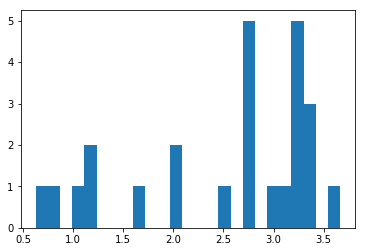

[ 2.52103675]
0.51328086853
Training epoch 118800
Iter: 118800
D loss: 3.239e-05
G_loss: -0.01217
()


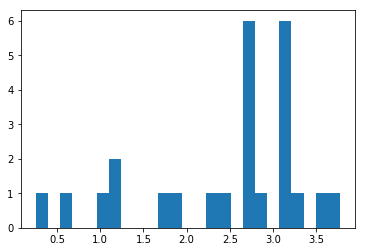

[ 2.47550808]
0.512335062027
Training epoch 118900
Iter: 118900
D loss: 3.616e-05
G_loss: -0.01274
()


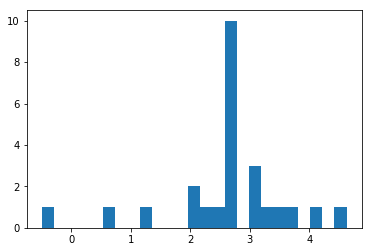

[ 2.65790692]
0.511190891266
Training epoch 119000
Iter: 119000
D loss: 3.043e-05
G_loss: -0.01339
()


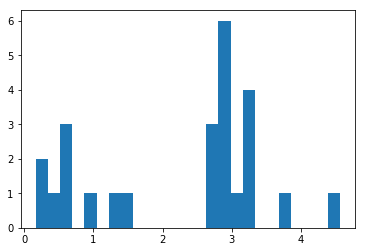

[ 2.24436802]
0.514942169189
Training epoch 119100
Iter: 119100
D loss: 2.676e-05
G_loss: -0.01321
()


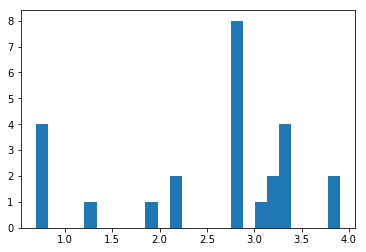

[ 2.54039109]
0.51126909256
Training epoch 119200
Iter: 119200
D loss: 3.271e-05
G_loss: -0.01268
()


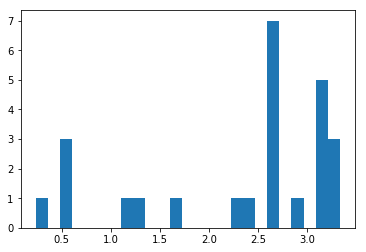

[ 2.32900402]
0.51474404335
Training epoch 119300
Iter: 119300
D loss: 3.472e-05
G_loss: -0.01332
()


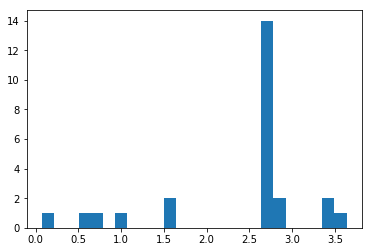

[ 2.4085929]
0.5151720047
Training epoch 119400
Iter: 119400
D loss: 2.059e-05
G_loss: -0.01348
()


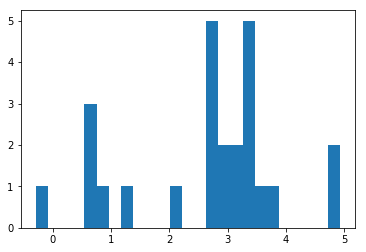

[ 2.63349159]
0.520212173462
Training epoch 119500
Iter: 119500
D loss: 2.284e-05
G_loss: -0.01361
()


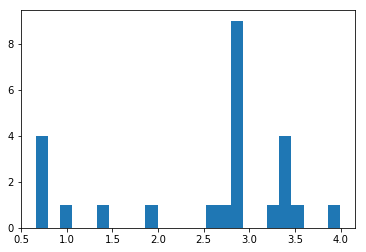

[ 2.50681124]
0.513224840164
Training epoch 119600
Iter: 119600
D loss: 3.023e-05
G_loss: -0.01333
()


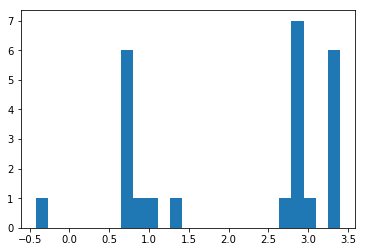

[ 2.14708325]
0.515459060669
Training epoch 119700
Iter: 119700
D loss: 2.5e-05
G_loss: -0.01323
()


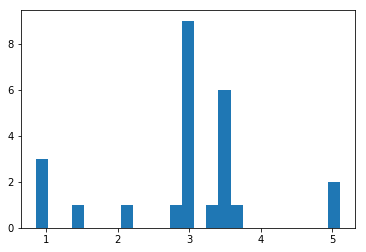

[ 2.9370265]
0.51406288147
Training epoch 119800
Iter: 119800
D loss: 3.898e-05
G_loss: -0.01298
()


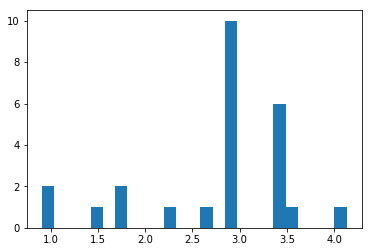

[ 2.78837859]
0.513615131378
Training epoch 119900
Iter: 119900
D loss: 2.389e-05
G_loss: -0.01329
()


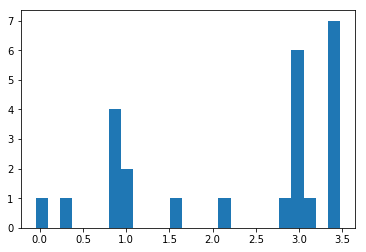

[ 2.2986548]
0.559194087982
Training epoch 120000
Iter: 120000
D loss: 2.94e-05
G_loss: -0.01258
()


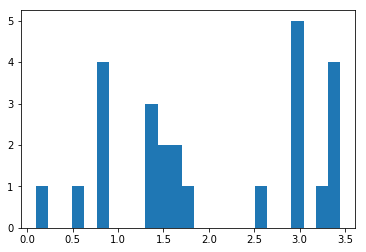

[ 2.00545406]
0.517161130905
Training epoch 120100
Iter: 120100
D loss: 3.219e-05
G_loss: -0.01343
()


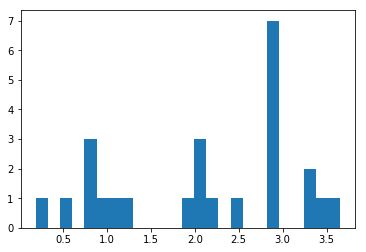

[ 2.12255817]
0.514253854752
Training epoch 120200
Iter: 120200
D loss: 1.601e-05
G_loss: -0.01363
()


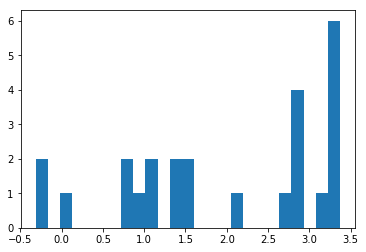

[ 1.9899807]
0.512209892273
Training epoch 120300
Iter: 120300
D loss: 2.927e-05
G_loss: -0.01338
()


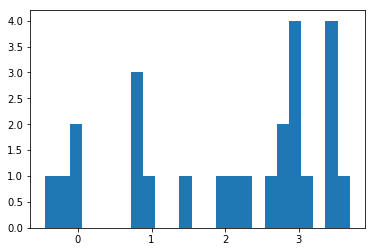

[ 2.02478206]
0.512123823166
Training epoch 120400
Iter: 120400
D loss: 2.804e-05
G_loss: -0.01294
()


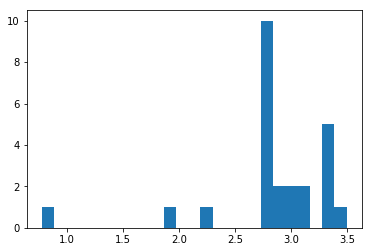

[ 2.84469194]
0.517152070999
Training epoch 120500
Iter: 120500
D loss: 3.219e-05
G_loss: -0.01344
()


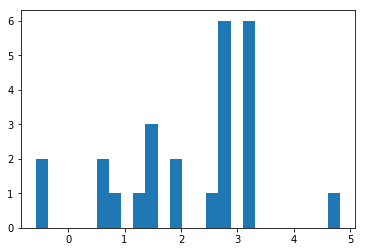

[ 2.16968287]
0.512518882751
Training epoch 120600
Iter: 120600
D loss: 2.896e-05
G_loss: -0.01356
()


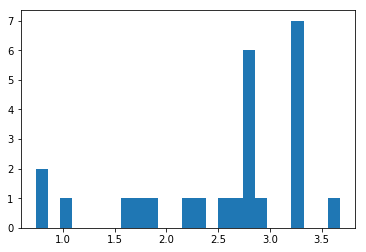

[ 2.55672717]
0.511109828949
Training epoch 120700
Iter: 120700
D loss: 3.561e-05
G_loss: -0.0133
()


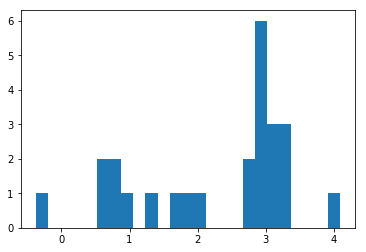

[ 2.23887472]
0.513375997543
Training epoch 120800
Iter: 120800
D loss: 3.713e-05
G_loss: -0.01325
()


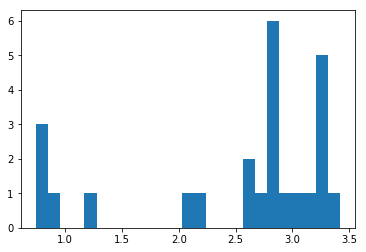

[ 2.48927295]
0.513455867767
Training epoch 120900
Iter: 120900
D loss: 3.426e-05
G_loss: -0.01332
()


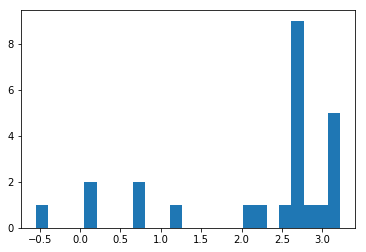

[ 2.22476593]
0.51736497879
Training epoch 121000
Iter: 121000
D loss: 3.029e-05
G_loss: -0.01262
()


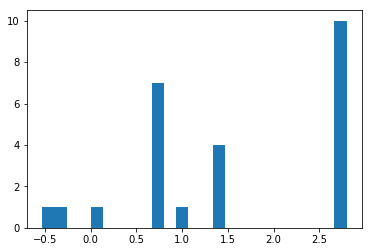

[ 1.5472699]
0.516191005707
Training epoch 121100
Iter: 121100
D loss: 2.554e-05
G_loss: -0.0133
()


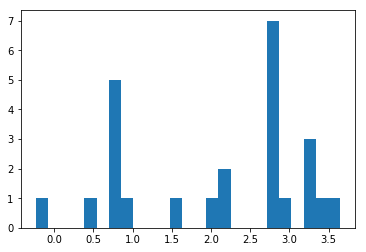

[ 2.0987953]
0.513638019562
Training epoch 121200
Iter: 121200
D loss: 3.286e-05
G_loss: -0.01352
()


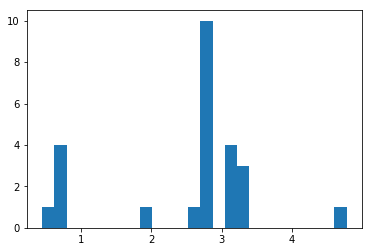

[ 2.5227123]
0.513475894928
Training epoch 121300
Iter: 121300
D loss: 2.932e-05
G_loss: -0.01349
()


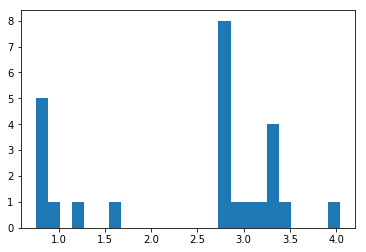

[ 2.38853391]
0.512949943542
Training epoch 121400
Iter: 121400
D loss: 2.659e-05
G_loss: -0.01045
()


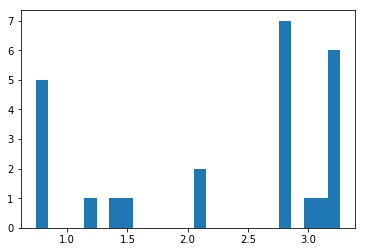

[ 2.29273589]
0.51175904274
Training epoch 121500
Iter: 121500
D loss: 3.242e-05
G_loss: -0.01327
()


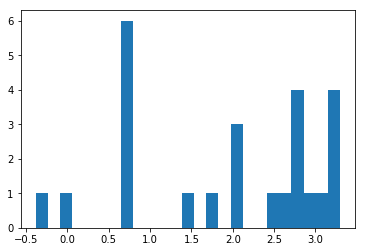

[ 1.98005144]
0.592003107071
Training epoch 121600
Iter: 121600
D loss: 2.996e-05
G_loss: -0.01337
()


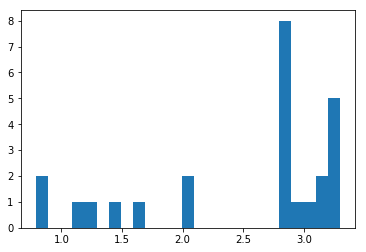

[ 2.50798563]
0.52311706543
Training epoch 121700
Iter: 121700
D loss: 3.217e-05
G_loss: -0.01241
()


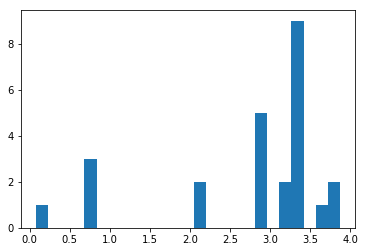

[ 2.72633996]
0.513355970383
Training epoch 121800
Iter: 121800
D loss: 3.227e-05
G_loss: -0.01337
()


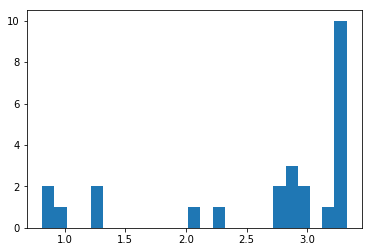

[ 2.63739351]
0.514508962631
Training epoch 121900
Iter: 121900
D loss: 3.221e-05
G_loss: -0.01243
()


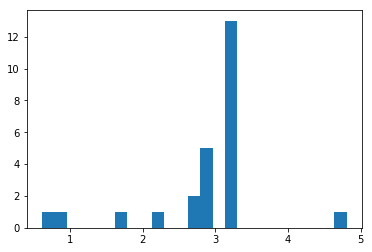

[ 2.88921032]
0.519049167633
Training epoch 122000
Iter: 122000
D loss: 3.818e-05
G_loss: -0.01268
()


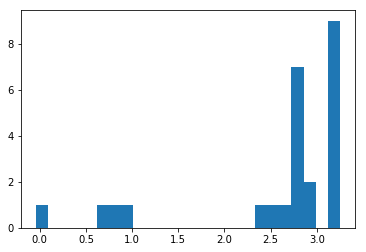

[ 2.57770821]
0.514043092728
Training epoch 122100
Iter: 122100
D loss: 3.227e-05
G_loss: -0.01156
()


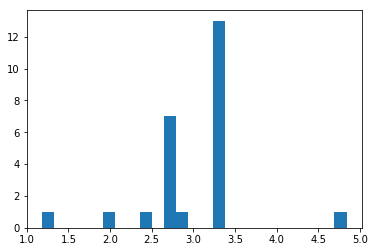

[ 3.01663278]
0.512954950333
Training epoch 122200
Iter: 122200
D loss: 2.368e-05
G_loss: -0.01341
()


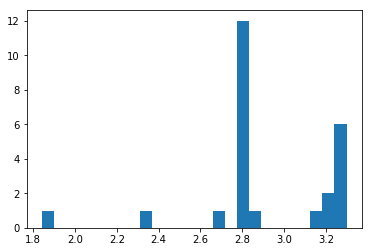

[ 2.90579811]
0.599223136902
Training epoch 122300
Iter: 122300
D loss: 3.383e-05
G_loss: -0.0135
()


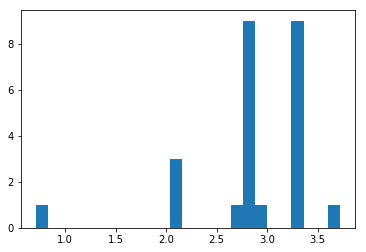

[ 2.84323015]
0.511122941971
Training epoch 122400
Iter: 122400
D loss: 2.253e-05
G_loss: -0.0133
()


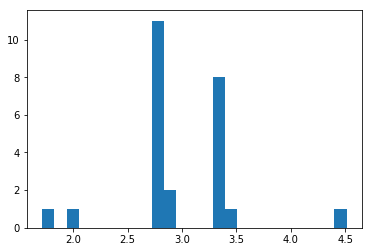

[ 2.99527636]
0.521466970444
Training epoch 122500
Iter: 122500
D loss: 3.34e-05
G_loss: -0.01339
()


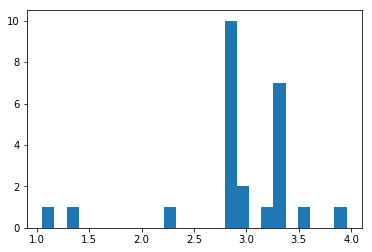

[ 2.92589466]
0.520811080933
Training epoch 122600
Iter: 122600
D loss: 3.339e-05
G_loss: -0.0136
()


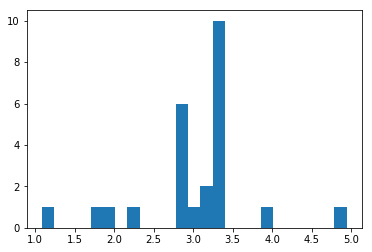

[ 3.03825992]
0.511970996857
Training epoch 122700
Iter: 122700
D loss: 3.088e-05
G_loss: -0.01283
()


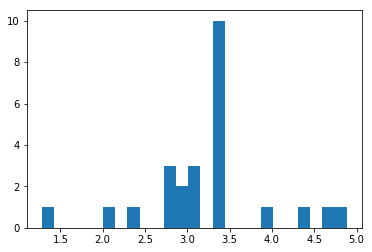

[ 3.2181222]
0.511474132538
Training epoch 122800
Iter: 122800
D loss: 2.418e-05
G_loss: -0.01344
()


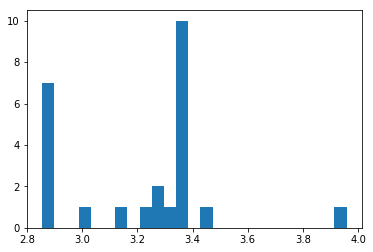

[ 3.21644702]
0.512058973312
Training epoch 122900
Iter: 122900
D loss: 2.933e-05
G_loss: -0.01025
()


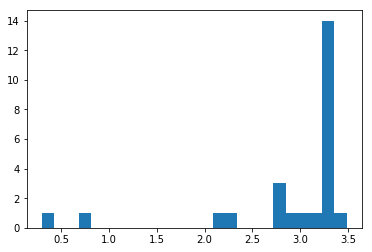

[ 2.93303641]
0.512264966965
Training epoch 123000
Iter: 123000
D loss: 3.353e-05
G_loss: -0.01211
()


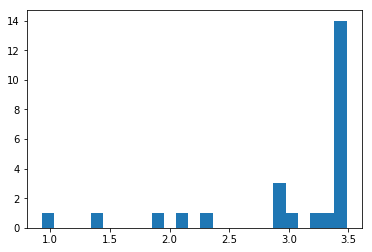

[ 2.98377538]
0.514262199402
Training epoch 123100
Iter: 123100
D loss: 3.948e-05
G_loss: -0.01351
()


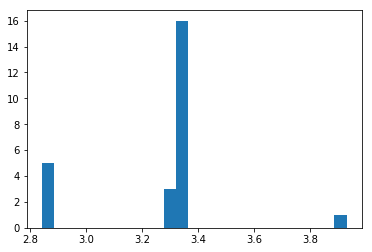

[ 3.25573638]
0.511328935623
Training epoch 123200
Iter: 123200
D loss: 3.485e-05
G_loss: -0.01368
()


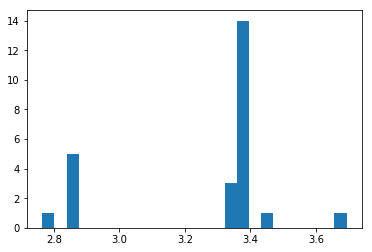

[ 3.2571303]
0.514742136002
Training epoch 123300
Iter: 123300
D loss: 3.364e-05
G_loss: -0.01347
()


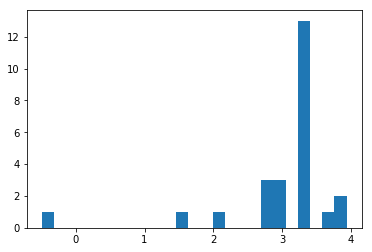

[ 3.01295271]
0.514807939529
Training epoch 123400
Iter: 123400
D loss: 3.328e-05
G_loss: -0.01315
()


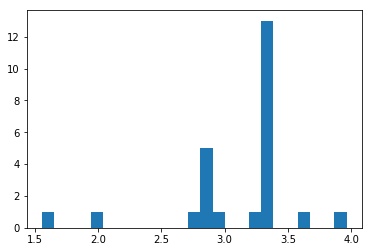

[ 3.12982978]
0.515076160431
Training epoch 123500
Iter: 123500
D loss: 2.532e-05
G_loss: -0.01347
()


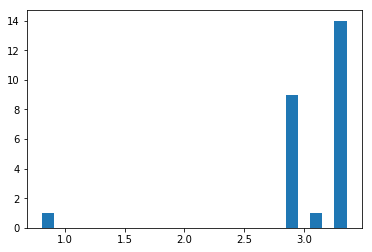

[ 3.06263674]
0.513859987259
Training epoch 123600
Iter: 123600
D loss: 3.192e-05
G_loss: -0.01273
()


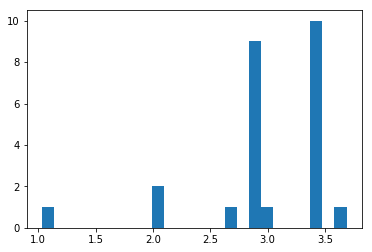

[ 2.9740593]
0.526434898376
Training epoch 123700
Iter: 123700
D loss: 3.226e-05
G_loss: -0.01294
()


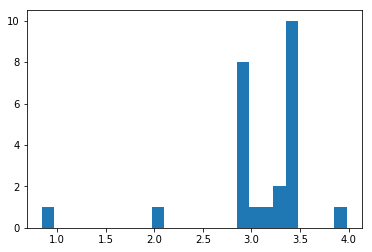

[ 3.06163684]
0.520170927048
Training epoch 123800
Iter: 123800
D loss: 2.88e-05
G_loss: -0.01291
()


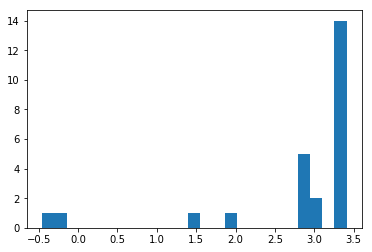

[ 2.81392178]
0.523333072662
Training epoch 123900
Iter: 123900
D loss: 3.526e-05
G_loss: -0.01333
()


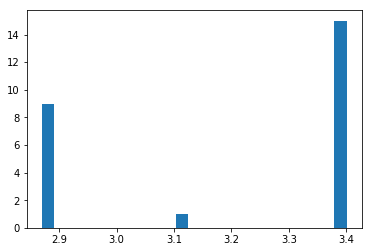

[ 3.19911304]
0.515763044357
Training epoch 124000
Iter: 124000
D loss: 1.982e-05
G_loss: -0.01364
()


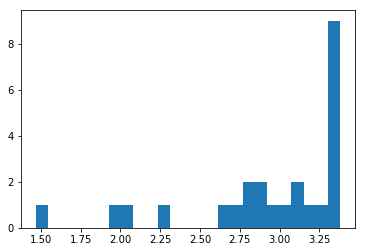

[ 2.94152872]
0.515444040298
Training epoch 124100
Iter: 124100
D loss: 3.282e-05
G_loss: -0.01334
()


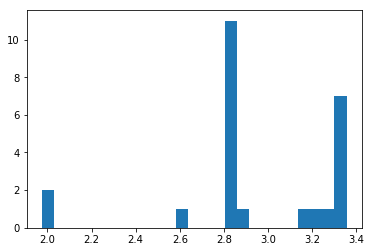

[ 2.94353196]
0.516982078552
Training epoch 124200
Iter: 124200
D loss: 2.626e-05
G_loss: -0.01225
()


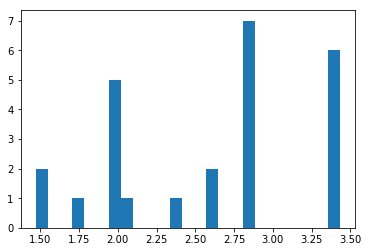

[ 2.5881074]
0.523028850555
Training epoch 124300
Iter: 124300
D loss: 2.912e-05
G_loss: -0.01355
()


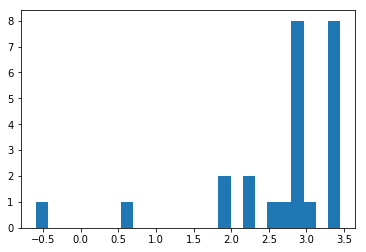

[ 2.66028638]
0.513352155685
Training epoch 124400
Iter: 124400
D loss: 2.331e-05
G_loss: -0.01352
()


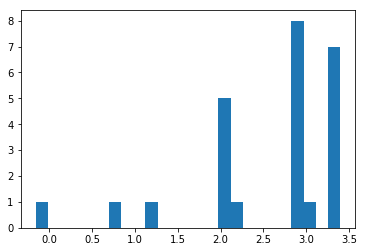

[ 2.55749621]
0.512567043304
Training epoch 124500
Iter: 124500
D loss: 2.944e-05
G_loss: -0.01407
()


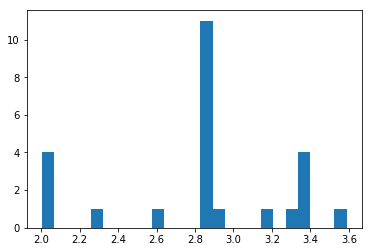

[ 2.83925404]
0.524115085602
Training epoch 124600
Iter: 124600
D loss: 2.91e-05
G_loss: -0.0135
()


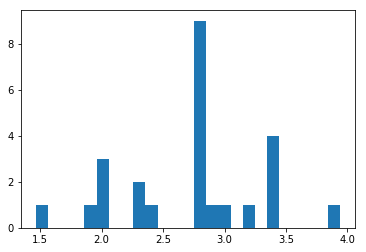

[ 2.73832157]
0.511864900589
Training epoch 124700
Iter: 124700
D loss: 3.099e-05
G_loss: -0.01255
()


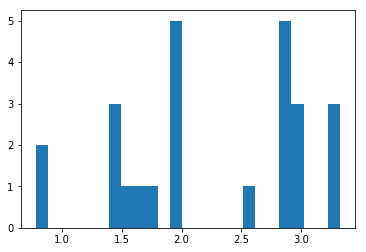

[ 2.25007567]
0.514280080795
Training epoch 124800
Iter: 124800
D loss: 3.646e-05
G_loss: -0.01335
()


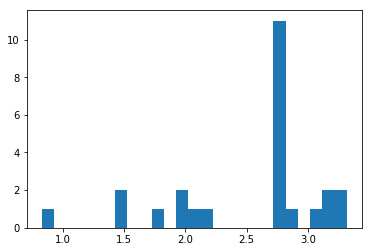

[ 2.5394516]
0.511885881424
Training epoch 124900
Iter: 124900
D loss: 4.024e-05
G_loss: -0.01342
()


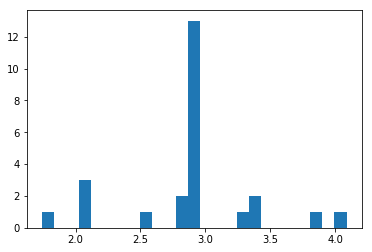

[ 2.85981975]
0.511007070541
Training epoch 125000
Iter: 125000
D loss: 3.207e-05
G_loss: -0.01345
()


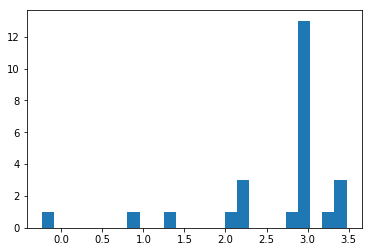

[ 2.59064041]
0.511689901352
Training epoch 125100
Iter: 125100
D loss: 3.031e-05
G_loss: -0.01201
()


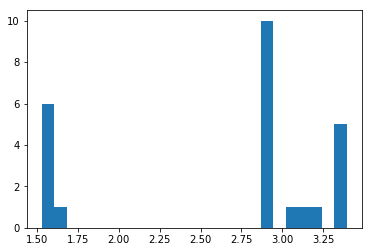

[ 2.66398159]
0.511872053146
Training epoch 125200
Iter: 125200
D loss: 2.436e-05
G_loss: -0.01351
()


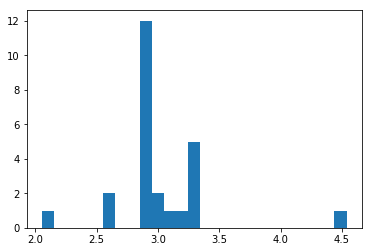

[ 3.01244312]
0.514352083206
Training epoch 125300
Iter: 125300
D loss: 3.478e-05
G_loss: -0.01342
()


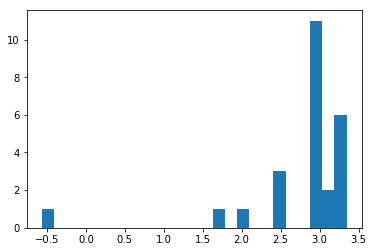

[ 2.75257038]
0.517893075943
Training epoch 125400
Iter: 125400
D loss: 2.499e-05
G_loss: -0.01301
()


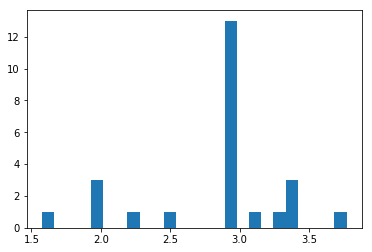

[ 2.84219449]
0.513114929199
Training epoch 125500
Iter: 125500
D loss: 3.195e-05
G_loss: -0.01337
()


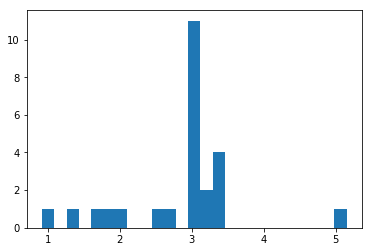

[ 2.85467605]
0.525972127914
Training epoch 125600
Iter: 125600
D loss: 3.421e-05
G_loss: -0.01297
()


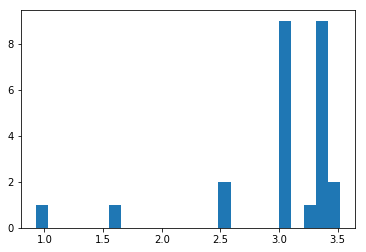

[ 3.01961932]
0.518841028214
Training epoch 125700
Iter: 125700
D loss: 3.596e-05
G_loss: -0.01312
()


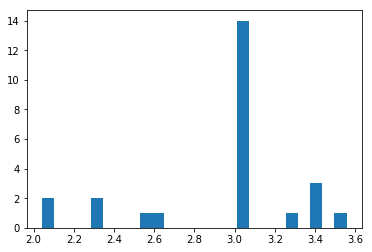

[ 2.96089932]
0.512159824371
Training epoch 125800
Iter: 125800
D loss: 3.262e-05
G_loss: -0.01342
()


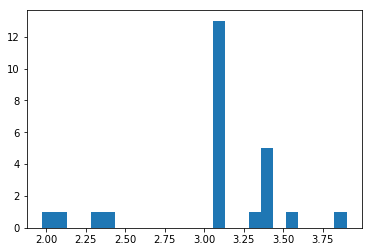

[ 3.06717877]
0.520307064056
Training epoch 125900
Iter: 125900
D loss: 3.868e-05
G_loss: -0.01418
()


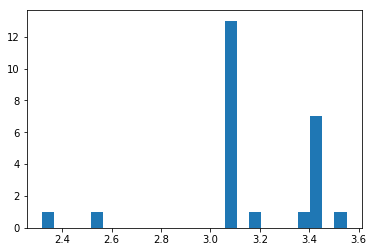

[ 3.15514907]
0.519572973251
Training epoch 126000
Iter: 126000
D loss: 2.68e-05
G_loss: -0.01315
()


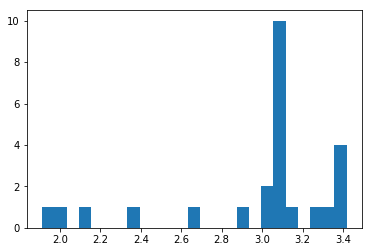

[ 2.96603995]
0.514492034912
Training epoch 126100
Iter: 126100
D loss: 3.637e-05
G_loss: -0.01278
()


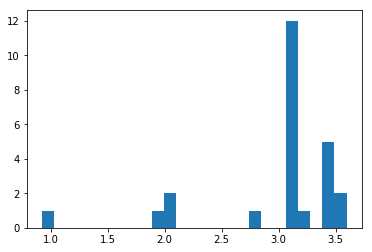

[ 2.98314187]
0.513748884201
Training epoch 126200
Iter: 126200
D loss: 3.014e-05
G_loss: -0.01262
()


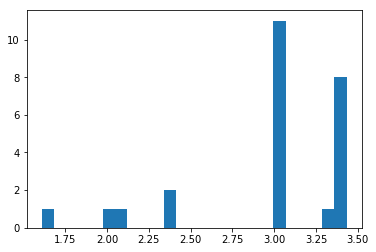

[ 2.99513481]
0.516503095627
Training epoch 126300
Iter: 126300
D loss: 3.76e-05
G_loss: -0.01304
()


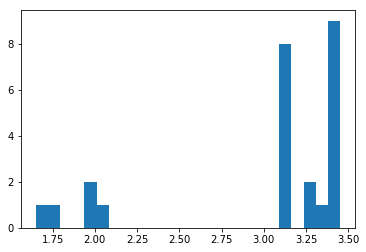

[ 2.99960998]
0.511627912521
Training epoch 126400
Iter: 126400
D loss: 2.112e-05
G_loss: -0.01347
()


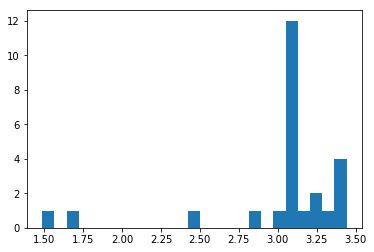

[ 3.00324311]
0.512404918671
Training epoch 126500
Iter: 126500
D loss: 3.033e-05
G_loss: -0.01218
()


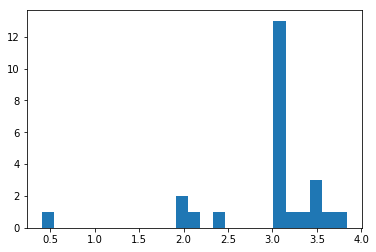

[ 2.93289979]
0.514312982559
Training epoch 126600
Iter: 126600
D loss: 3.441e-05
G_loss: -0.01327
()


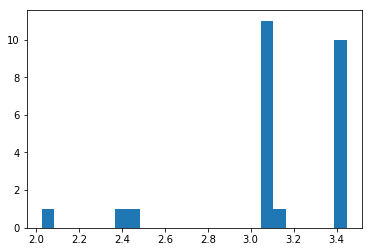

[ 3.13776746]
0.513687849045
Training epoch 126700
Iter: 126700
D loss: 2.461e-05
G_loss: -0.01338
()


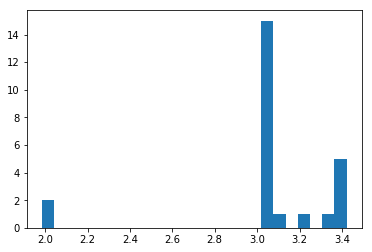

[ 3.0684524]
0.516957998276
Training epoch 126800
Iter: 126800
D loss: 3.725e-05
G_loss: -0.01334
()


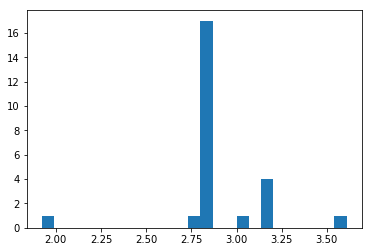

[ 2.86638396]
0.516469955444
Training epoch 126900
Iter: 126900
D loss: 2.613e-05
G_loss: -0.01303
()


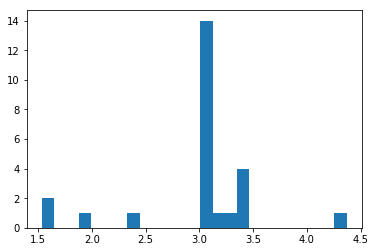

[ 2.9639326]
0.511007070541
Training epoch 127000
Iter: 127000
D loss: 3.577e-05
G_loss: -0.01348
()


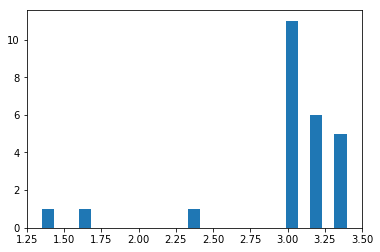

[ 2.97349195]
0.513307094574
Training epoch 127100
Iter: 127100
D loss: 2.905e-05
G_loss: -0.01292
()


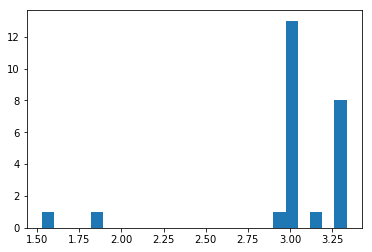

[ 2.99670267]
0.514181137085
Training epoch 127200
Iter: 127200
D loss: 3.65e-05
G_loss: -0.01275
()


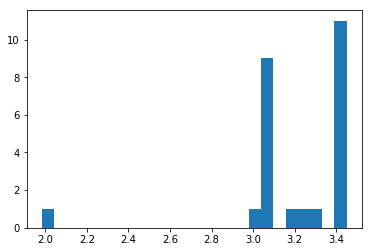

[ 3.19777912]
0.512423992157
Training epoch 127300
Iter: 127300
D loss: 3.383e-05
G_loss: -0.01345
()


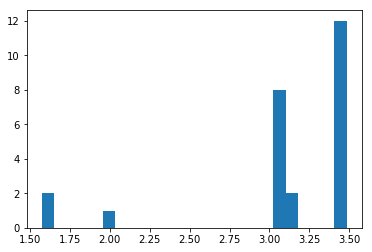

[ 3.11158676]
0.522845029831
Training epoch 127400
Iter: 127400
D loss: 2.865e-05
G_loss: -0.01345
()


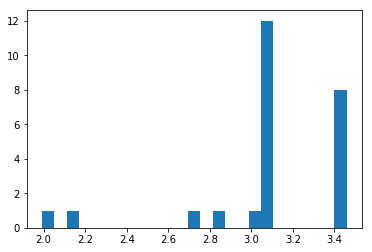

[ 3.07768004]
0.511998176575
Training epoch 127500
Iter: 127500
D loss: 3.813e-05
G_loss: -0.01273
()


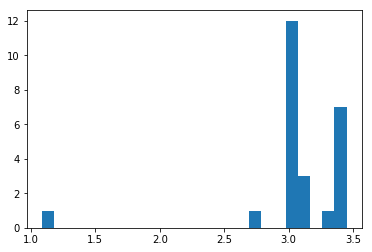

[ 3.07751638]
0.515231132507
Training epoch 127600
Iter: 127600
D loss: 2.606e-05
G_loss: -0.01333
()


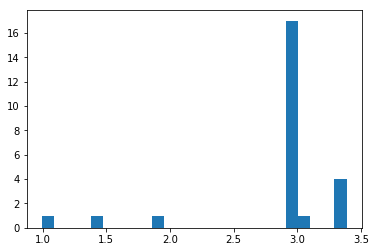

[ 2.85668867]
0.51341509819
Training epoch 127700
Iter: 127700
D loss: 2.391e-05
G_loss: -0.01346
()


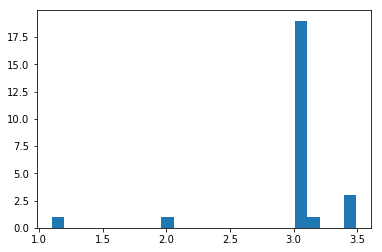

[ 3.00134181]
0.514524936676
Training epoch 127800
Iter: 127800
D loss: 3.308e-05
G_loss: -0.01322
()


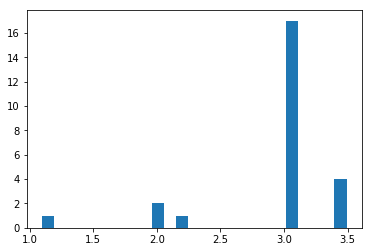

[ 2.9336591]
0.511792182922
Training epoch 127900
Iter: 127900
D loss: 3.108e-05
G_loss: -0.01217
()


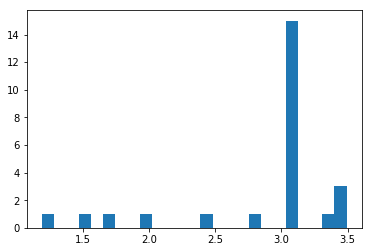

[ 2.8634858]
0.541481971741
Training epoch 128000
Iter: 128000
D loss: 3.283e-05
G_loss: -0.01341
()


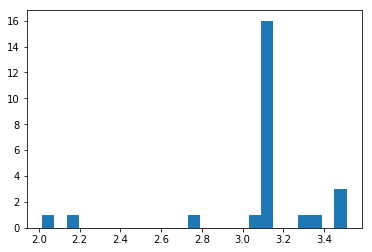

[ 3.07070604]
0.517318964005
Training epoch 128100
Iter: 128100
D loss: 3.69e-05
G_loss: -0.01287
()


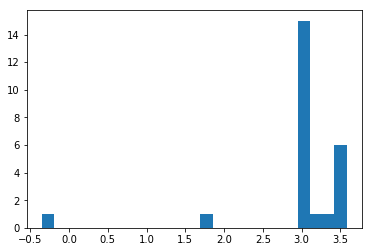

[ 3.02559416]
0.511308908463
Training epoch 128200
Iter: 128200
D loss: 3.755e-05
G_loss: -0.01269
()


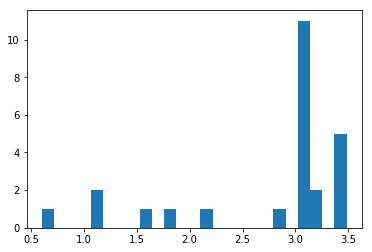

[ 2.74357242]
0.511161088943
Training epoch 128300
Iter: 128300
D loss: 3.808e-05
G_loss: -0.01291
()


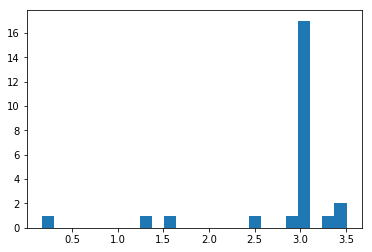

[ 2.84805991]
0.512239933014
Training epoch 128400
Iter: 128400
D loss: 2.853e-05
G_loss: -0.01369
()


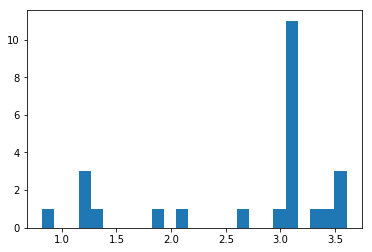

[ 2.69633977]
0.52320098877
Training epoch 128500
Iter: 128500
D loss: 3.702e-05
G_loss: -0.01343
()


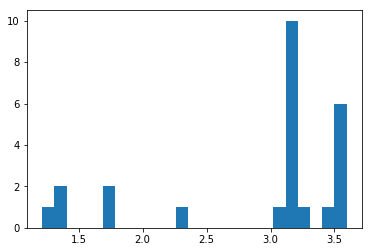

[ 2.9092917]
0.513200044632
Training epoch 128600
Iter: 128600
D loss: 3.911e-05
G_loss: -0.01406
()


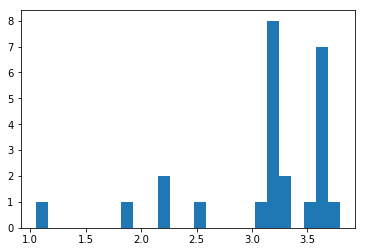

[ 3.10107583]
0.525385856628
Training epoch 128700
Iter: 128700
D loss: 3.28e-05
G_loss: -0.01275
()


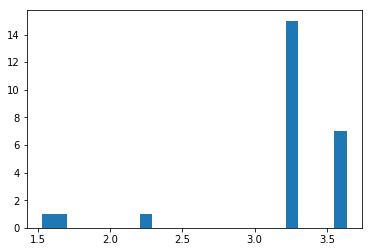

[ 3.17554666]
0.513345003128
Training epoch 128800
Iter: 128800
D loss: 2.879e-05
G_loss: -0.01333
()


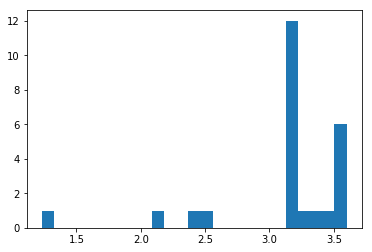

[ 3.12801763]
0.513483047485
Training epoch 128900
Iter: 128900
D loss: 4.091e-05
G_loss: -0.01281
()


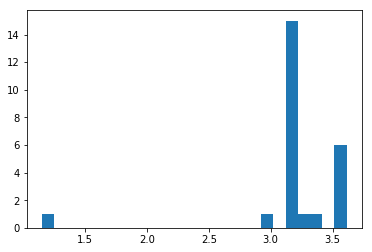

[ 3.19670218]
0.530250072479
Training epoch 129000
Iter: 129000
D loss: 2.678e-05
G_loss: -0.0136
()


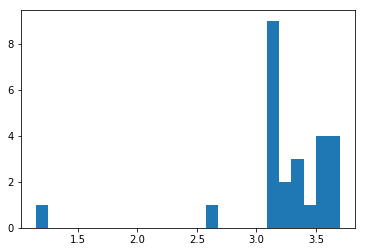

[ 3.23934903]
0.521432876587
Training epoch 129100
Iter: 129100
D loss: 1.823e-05
G_loss: -0.01419
()


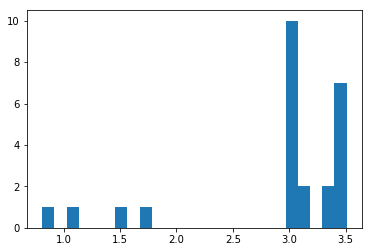

[ 2.91370524]
0.515488862991
Training epoch 129200
Iter: 129200
D loss: 2.865e-05
G_loss: -0.01321
()


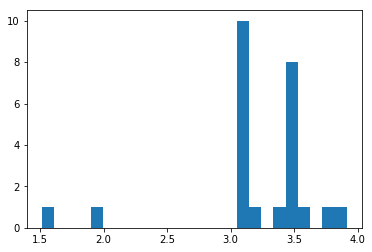

[ 3.20484703]
0.516279935837
Training epoch 129300
Iter: 129300
D loss: 4.353e-05
G_loss: -0.01348
()


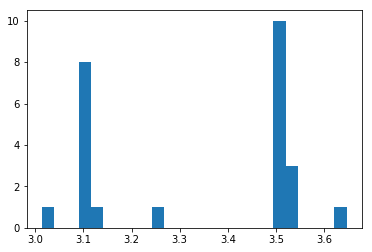

[ 3.34567127]
0.513028860092
Training epoch 129400
Iter: 129400
D loss: 2.935e-05
G_loss: -0.01358
()


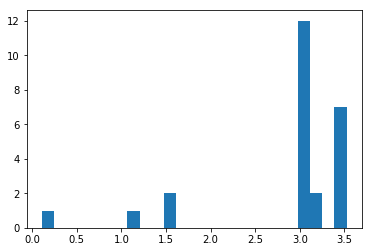

[ 2.89358047]
0.515325069427
Training epoch 129500
Iter: 129500
D loss: 3.233e-05
G_loss: -0.01333
()


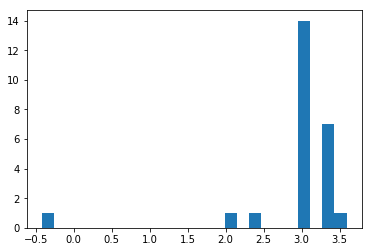

[ 2.92209979]
0.520857810974
Training epoch 129600
Iter: 129600
D loss: 3.7e-05
G_loss: -0.009646
()


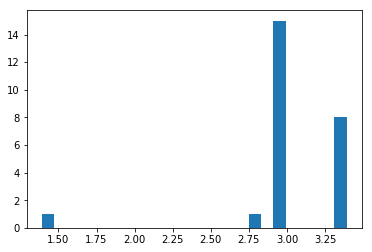

[ 3.03364643]
0.519930124283
Training epoch 129700
Iter: 129700
D loss: 4.007e-05
G_loss: -0.01327
()


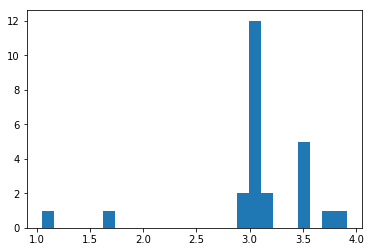

[ 3.07436527]
0.512774944305
Training epoch 129800
Iter: 129800
D loss: 2.688e-05
G_loss: -0.0134
()


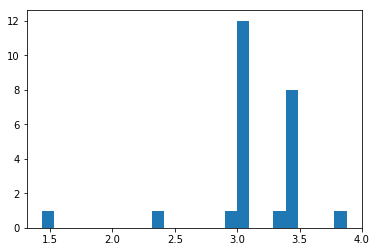

[ 3.11322487]
0.511360883713
Training epoch 129900
Iter: 129900
D loss: 2.651e-05
G_loss: -0.01309
()


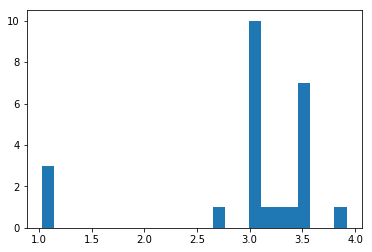

[ 2.9901984]
0.511351108551
Training epoch 130000
Iter: 130000
D loss: 3.619e-05
G_loss: -0.01306
()


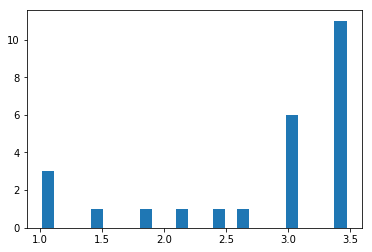

[ 2.79123618]
0.511528968811
Training epoch 130100
Iter: 130100
D loss: 3.595e-05
G_loss: -0.01359
()


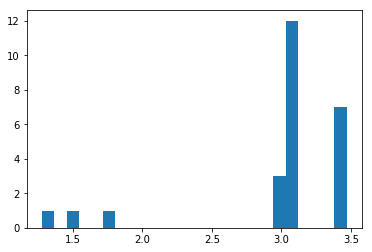

[ 2.96812956]
0.514201164246
Training epoch 130200
Iter: 130200
D loss: 4.082e-05
G_loss: -0.0128
()


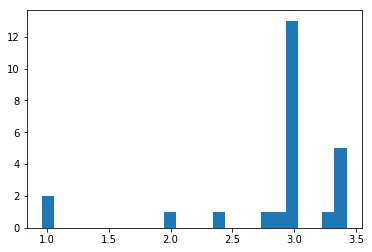

[ 2.8484261]
0.511085987091
Training epoch 130300
Iter: 130300
D loss: 2.89e-05
G_loss: -0.01279
()


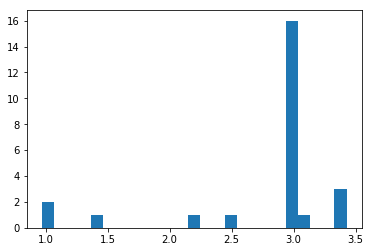

[ 2.77191321]
0.516235113144
Training epoch 130400
Iter: 130400
D loss: 3.728e-05
G_loss: -0.01337
()


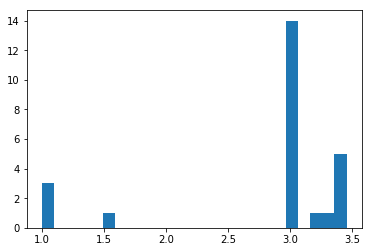

[ 2.82324882]
0.514334201813
Training epoch 130500
Iter: 130500
D loss: 3.112e-05
G_loss: -0.01317
()


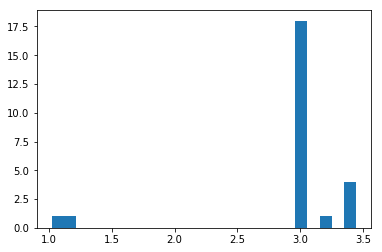

[ 2.93167112]
0.515469074249
Training epoch 130600
Iter: 130600
D loss: 4.002e-05
G_loss: -0.01334
()


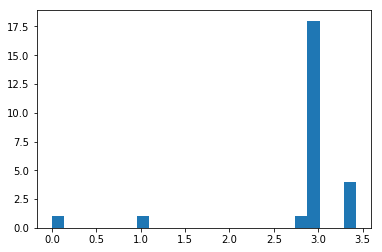

[ 2.85168221]
0.5118060112
Training epoch 130700
Iter: 130700
D loss: 2.358e-05
G_loss: -0.01345
()


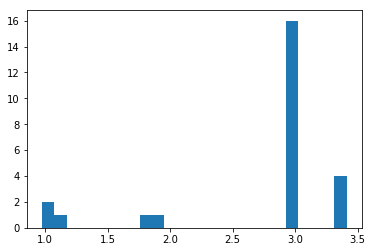

[ 2.71502541]
0.515650987625
Training epoch 130800
Iter: 130800
D loss: 3.581e-05
G_loss: -0.01335
()


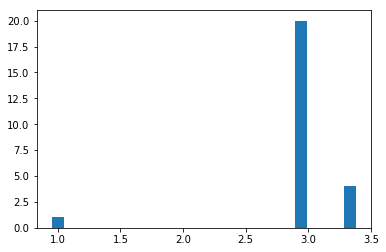

[ 2.93003704]
0.514838933945
Training epoch 130900
Iter: 130900
D loss: 3.849e-05
G_loss: -0.01219
()


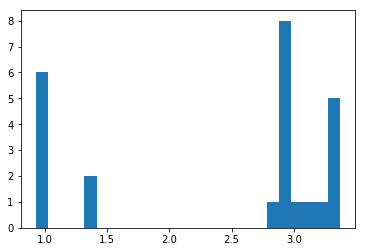

[ 2.42355443]
0.526150941849
Training epoch 131000
Iter: 131000
D loss: 3.249e-05
G_loss: -0.01362
()


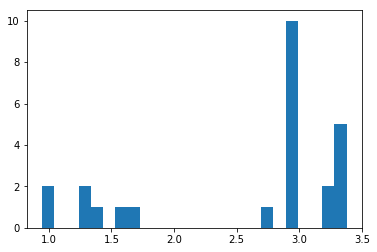

[ 2.57870993]
0.512419939041
Training epoch 131100
Iter: 131100
D loss: 2.719e-05
G_loss: -0.01102
()


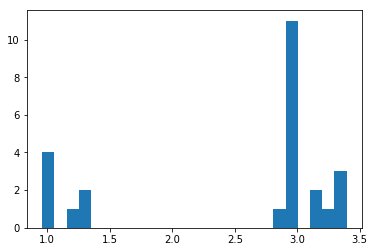

[ 2.50652532]
0.514261007309
Training epoch 131200
Iter: 131200
D loss: 3.335e-05
G_loss: -0.01351
()


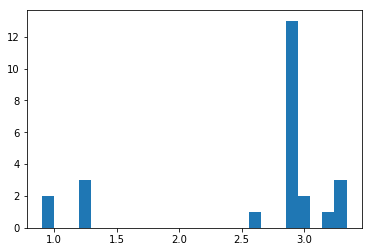

[ 2.60193913]
0.518424987793
Training epoch 131300
Iter: 131300
D loss: 3.548e-05
G_loss: -0.01355
()


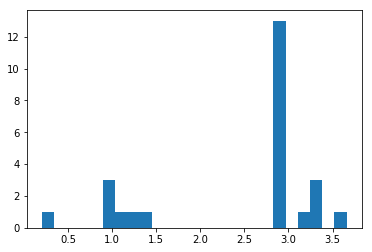

[ 2.45465273]
0.521951913834
Training epoch 131400
Iter: 131400
D loss: 2.882e-05
G_loss: -0.01417
()


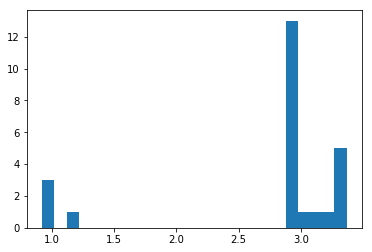

[ 2.71485742]
0.519904851913
Training epoch 131500
Iter: 131500
D loss: 4.121e-05
G_loss: -0.01373
()


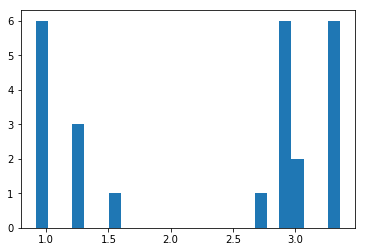

[ 2.28667959]
0.513231992722
Training epoch 131600
Iter: 131600
D loss: 3.809e-05
G_loss: -0.0133
()


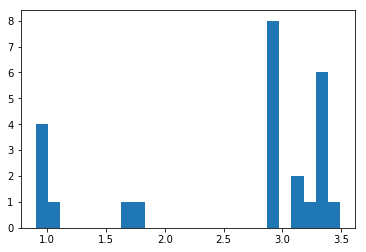

[ 2.57896776]
0.513244867325
Training epoch 131700
Iter: 131700
D loss: 3.246e-05
G_loss: -0.01311
()


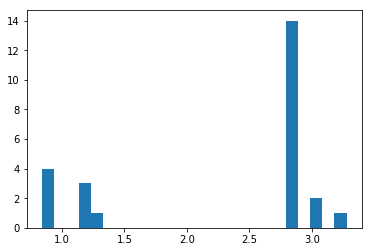

[ 2.29715518]
0.519095897675
Training epoch 131800
Iter: 131800
D loss: 3.473e-05
G_loss: -0.01374
()


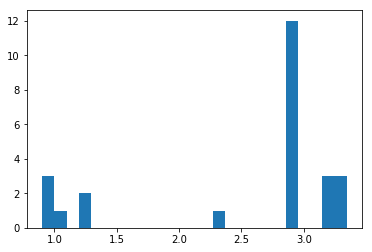

[ 2.51251711]
0.513615131378
Training epoch 131900
Iter: 131900
D loss: 3.716e-05
G_loss: -0.01343
()


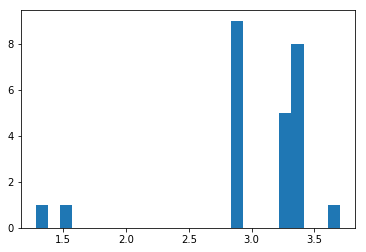

[ 3.01872371]
0.511891841888
Training epoch 132000
Iter: 132000
D loss: 3.128e-05
G_loss: -0.01241
()


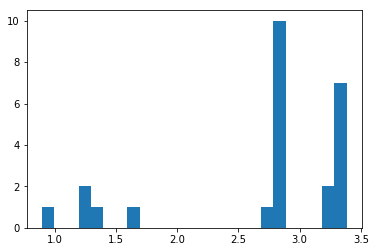

[ 2.70573501]
0.513479948044
Training epoch 132100
Iter: 132100
D loss: 3.259e-05
G_loss: -0.01277
()


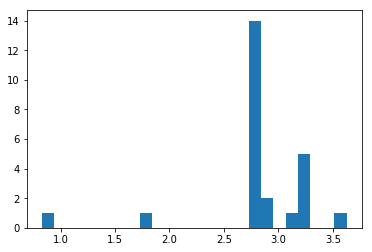

[ 2.83932987]
0.517992019653
Training epoch 132200
Iter: 132200
D loss: 4.171e-05
G_loss: -0.01234
()


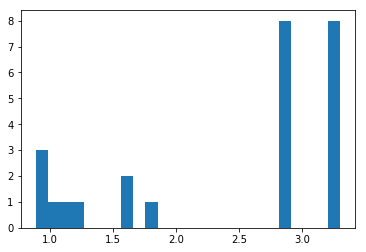

[ 2.41628272]
0.518841028214
Training epoch 132300
Iter: 132300
D loss: 3.904e-05
G_loss: -0.01331
()


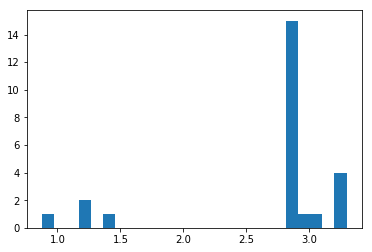

[ 2.68507923]
0.513669967651
Training epoch 132400
Iter: 132400
D loss: 3.224e-05
G_loss: -0.01347
()


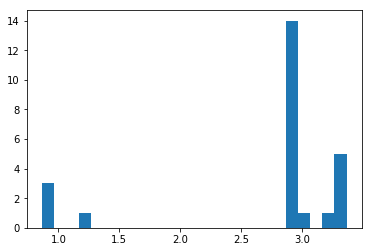

[ 2.68579874]
0.512640953064
Training epoch 132500
Iter: 132500
D loss: 3.181e-05
G_loss: -0.01264
()


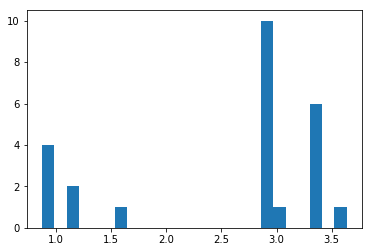

[ 2.53346143]
0.523318052292
Training epoch 132600
Iter: 132600
D loss: 3.191e-05
G_loss: -0.01294
()


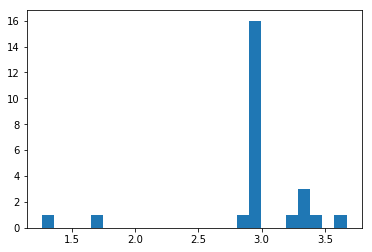

[ 2.94261655]
0.512620925903
Training epoch 132700
Iter: 132700
D loss: 3.215e-05
G_loss: -0.01359
()


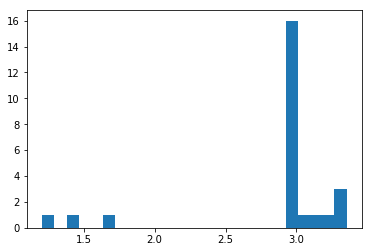

[ 2.84275968]
0.511201858521
Training epoch 132800
Iter: 132800
D loss: 2.957e-05
G_loss: -0.01352
()


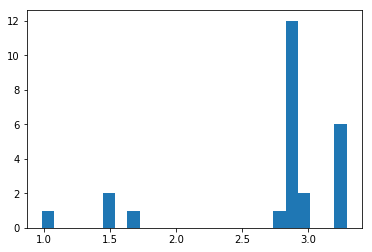

[ 2.74875363]
0.579645872116
Training epoch 132900
Iter: 132900
D loss: 4.349e-05
G_loss: -0.01243
()


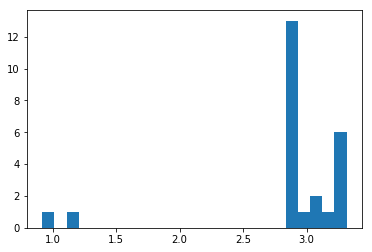

[ 2.87554233]
0.510951042175
Training epoch 133000
Iter: 133000
D loss: 3.455e-05
G_loss: -0.01355
()


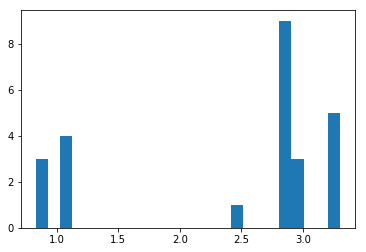

[ 2.42854413]
0.514646053314
Training epoch 133100
Iter: 133100
D loss: 2.87e-05
G_loss: -0.01347
()


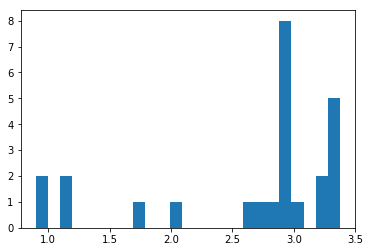

[ 2.64466559]
0.518682003021
Training epoch 133200
Iter: 133200
D loss: 3.222e-05
G_loss: -0.01198
()


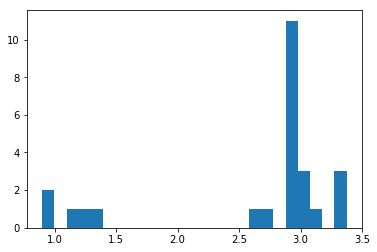

[ 2.63067727]
0.520707130432
Training epoch 133300
Iter: 133300
D loss: 1.921e-05
G_loss: -0.01415
()


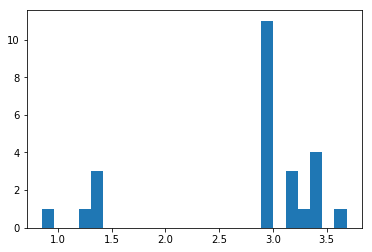

[ 2.76650699]
0.513306856155
Training epoch 133400
Iter: 133400
D loss: 3.454e-05
G_loss: -0.01363
()


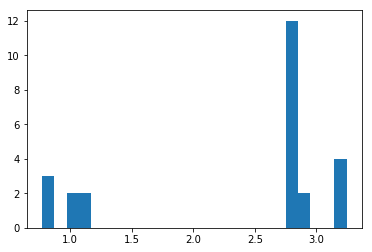

[ 2.37367298]
0.513453960419
Training epoch 133500
Iter: 133500
D loss: 3.35e-05
G_loss: -0.01412
()


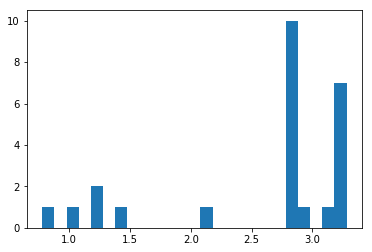

[ 2.61224878]
0.590852975845
Training epoch 133600
Iter: 133600
D loss: 3.409e-05
G_loss: -0.01269
()


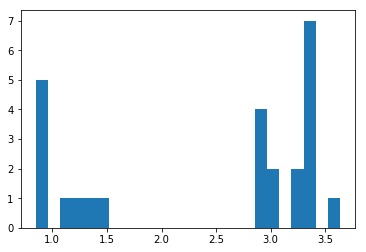

[ 2.43962967]
0.511586904526
Training epoch 133700
Iter: 133700
D loss: 3.592e-05
G_loss: -0.01332
()


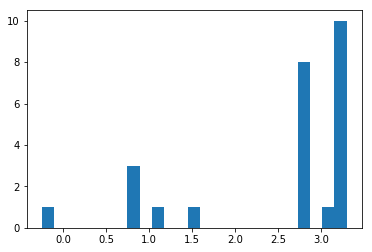

[ 2.54332186]
0.520301103592
Training epoch 133800
Iter: 133800
D loss: 3.133e-05
G_loss: -0.01344
()


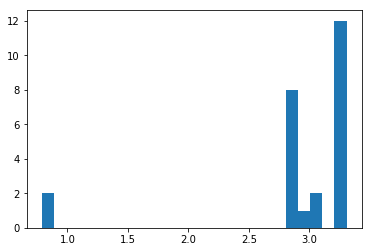

[ 2.9308739]
0.515988111496
Training epoch 133900
Iter: 133900
D loss: 3.582e-05
G_loss: -0.01344
()


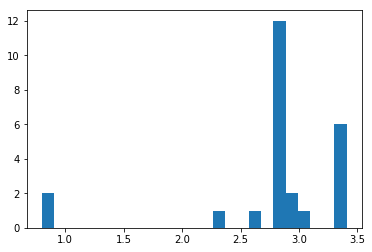

[ 2.79816577]
0.513551950455
Training epoch 134000
Iter: 134000
D loss: 2.802e-05
G_loss: -0.01358
()


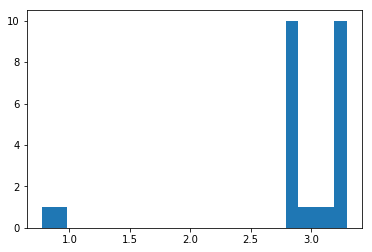

[ 2.88816749]
0.514393091202
Training epoch 134100
Iter: 134100
D loss: 4.051e-05
G_loss: -0.01289
()


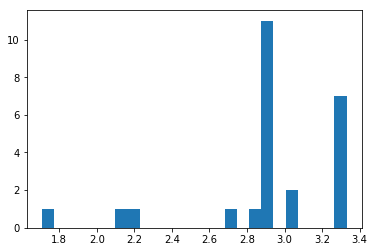

[ 2.90493221]
0.515510082245
Training epoch 134200
Iter: 134200
D loss: 4.217e-05
G_loss: -0.01334
()


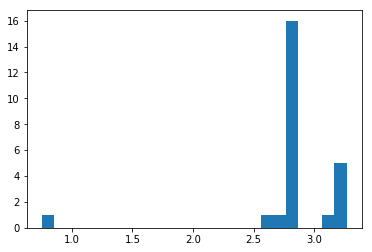

[ 2.82756871]
0.519380092621
Training epoch 134300
Iter: 134300
D loss: 2.918e-05
G_loss: -0.01336
()


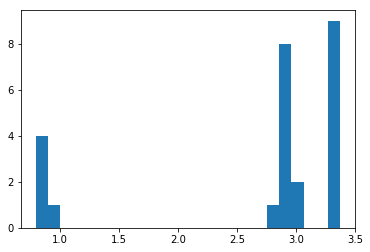

[ 2.63202218]
0.518316984177
Training epoch 134400
Iter: 134400
D loss: 3.377e-05
G_loss: -0.01073
()


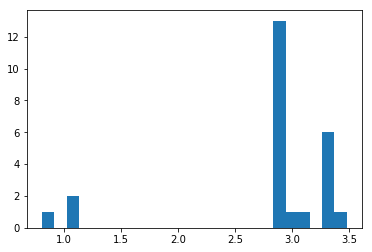

[ 2.78497764]
0.516830921173
Training epoch 134500
Iter: 134500
D loss: 3.51e-05
G_loss: -0.01422
()


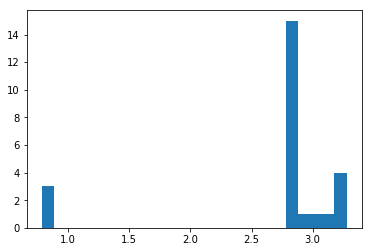

[ 2.70393472]
0.512964963913
Training epoch 134600
Iter: 134600
D loss: 2.961e-05
G_loss: -0.01364
()


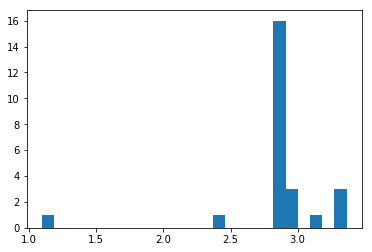

[ 2.87112833]
0.519784927368
Training epoch 134700
Iter: 134700
D loss: 3.215e-05
G_loss: -0.01265
()


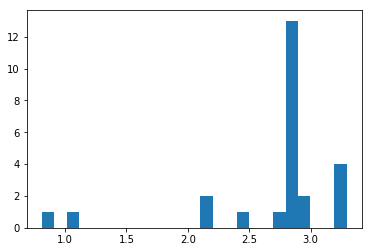

[ 2.71705388]
0.519215106964
Training epoch 134800
Iter: 134800
D loss: 3.817e-05
G_loss: -0.01351
()


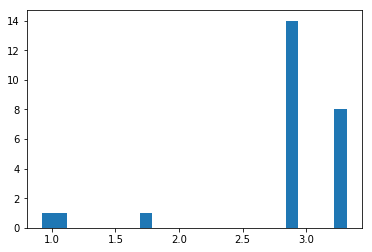

[ 2.83494428]
0.518178939819
Training epoch 134900
Iter: 134900
D loss: 3.159e-05
G_loss: -0.01273
()


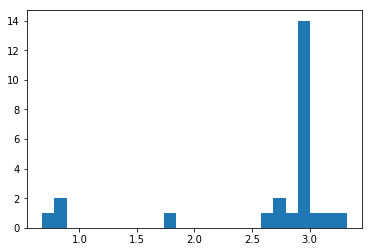

[ 2.61522027]
0.514021158218
Training epoch 135000
Iter: 135000
D loss: 3.02e-05
G_loss: -0.01368
()


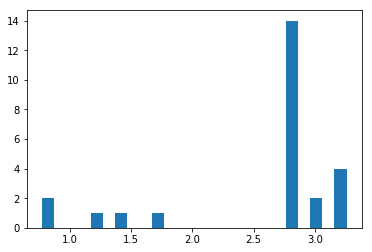

[ 2.59846978]
0.515788078308
Training epoch 135100
Iter: 135100
D loss: 3.367e-05
G_loss: -0.01272
()


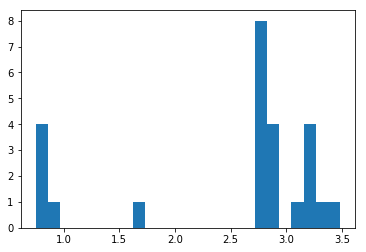

[ 2.49338406]
0.515342950821
Training epoch 135200
Iter: 135200
D loss: 2.48e-05
G_loss: -0.0137
()


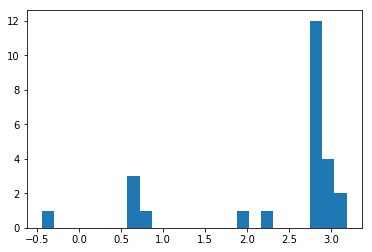

[ 2.33812529]
0.514037132263
Training epoch 135300
Iter: 135300
D loss: 3.184e-05
G_loss: -0.01358
()


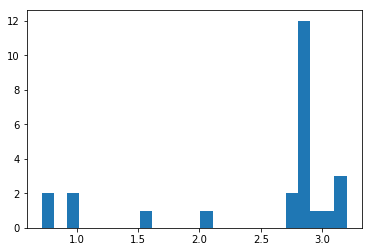

[ 2.47597344]
0.513841152191
Training epoch 135400
Iter: 135400
D loss: 2.677e-05
G_loss: -0.01285
()


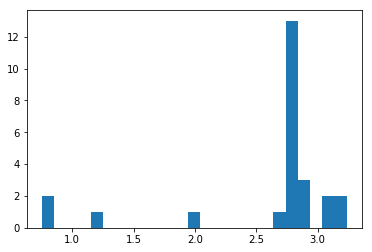

[ 2.61777168]
0.512120962143
Training epoch 135500
Iter: 135500
D loss: 2.665e-05
G_loss: -0.01375
()


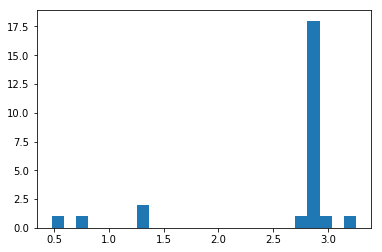

[ 2.57514495]
0.510718107224
Training epoch 135600
Iter: 135600
D loss: 2.199e-05
G_loss: -0.01365
()


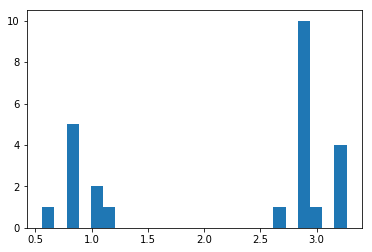

[ 2.20236316]
0.511814117432
Training epoch 135700
Iter: 135700
D loss: 3.065e-05
G_loss: -0.01374
()


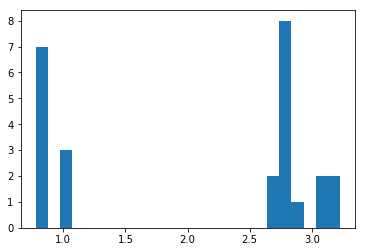

[ 2.08707043]
0.511529922485
Training epoch 135800
Iter: 135800
D loss: 3.588e-05
G_loss: -0.01358
()


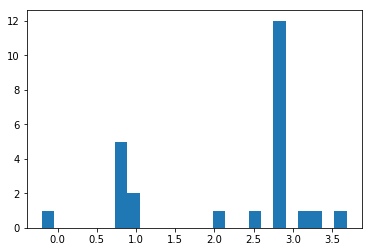

[ 2.20404645]
0.537462949753
Training epoch 135900
Iter: 135900
D loss: 3.414e-05
G_loss: -0.0137
()


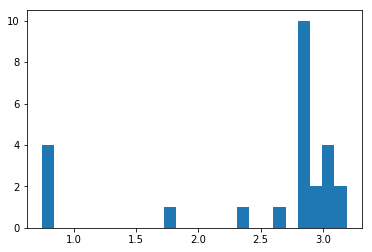

[ 2.49110007]
0.513583898544
Training epoch 136000
Iter: 136000
D loss: 2.711e-05
G_loss: -0.01356
()


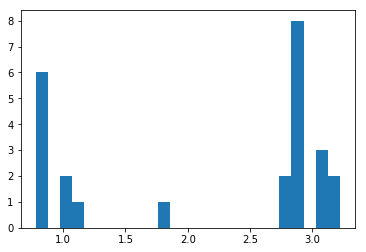

[ 2.15257573]
0.51166510582
Training epoch 136100
Iter: 136100
D loss: 2.994e-05
G_loss: -0.01373
()


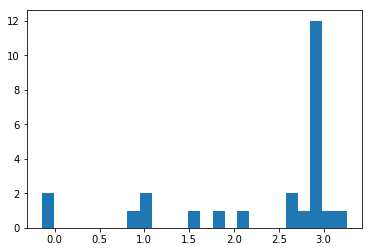

[ 2.28878037]
0.511950016022
Training epoch 136200
Iter: 136200
D loss: 2.588e-05
G_loss: -0.01359
()


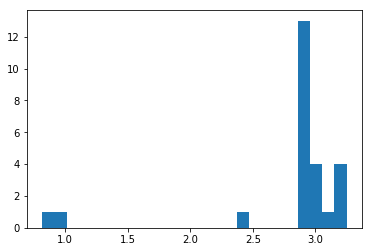

[ 2.78465476]
0.511212110519
Training epoch 136300
Iter: 136300
D loss: 3.316e-05
G_loss: -0.01239
()


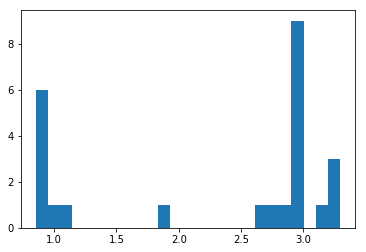

[ 2.26252817]
0.512162923813
Training epoch 136400
Iter: 136400
D loss: 2.888e-05
G_loss: -0.01333
()


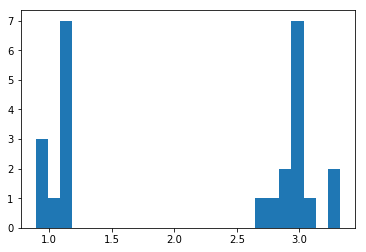

[ 2.12963215]
0.512367963791
Training epoch 136500
Iter: 136500
D loss: 3.127e-05
G_loss: -0.01344
()


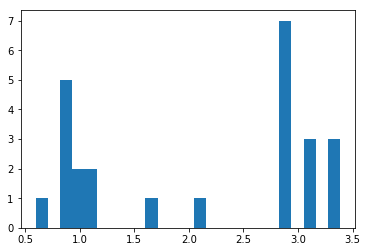

[ 2.09299225]
0.512296915054
Training epoch 136600
Iter: 136600
D loss: 3.712e-05
G_loss: -0.01366
()


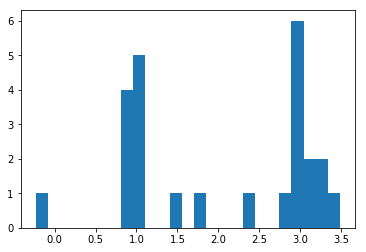

[ 2.03229882]
0.518946886063
Training epoch 136700
Iter: 136700
D loss: 3.394e-05
G_loss: -0.01359
()


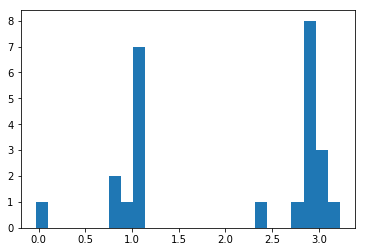

[ 1.99950571]
0.518848180771
Training epoch 136800
Iter: 136800
D loss: 3.353e-05
G_loss: -0.01352
()


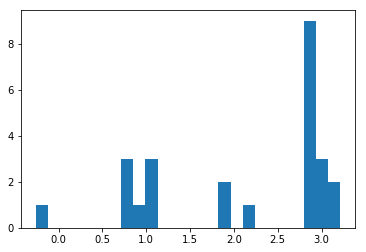

[ 2.12316858]
0.51340007782
Training epoch 136900
Iter: 136900
D loss: 2.967e-05
G_loss: -0.01384
()


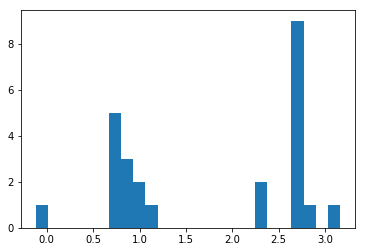

[ 1.7822524]
0.51828289032
Training epoch 137000
Iter: 137000
D loss: 2.452e-05
G_loss: -0.01363
()


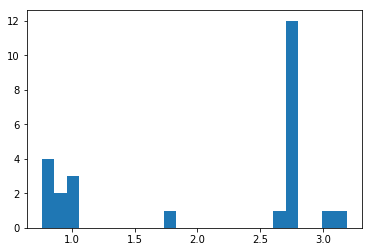

[ 2.07749935]
0.514358043671
Training epoch 137100
Iter: 137100
D loss: 3.095e-05
G_loss: -0.01369
()


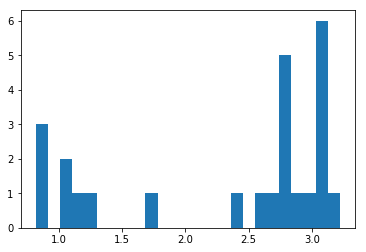

[ 2.32260674]
0.513025045395
Training epoch 137200
Iter: 137200
D loss: 3.8e-05
G_loss: -0.01319
()


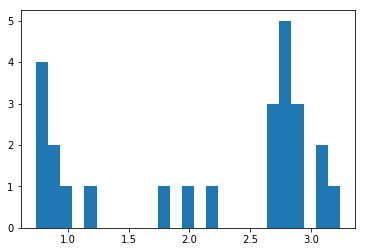

[ 2.13664425]
0.511749982834
Training epoch 137300
Iter: 137300
D loss: 3.429e-05
G_loss: -0.01352
()


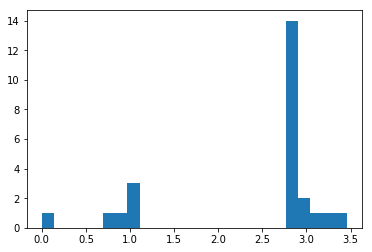

[ 2.40643461]
0.520400047302
Training epoch 137400
Iter: 137400
D loss: 2.922e-05
G_loss: -0.01361
()


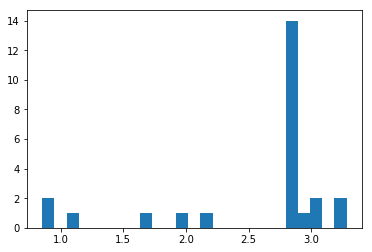

[ 2.5801164]
0.516544103622
Training epoch 137500
Iter: 137500
D loss: 2.931e-05
G_loss: -0.01381
()


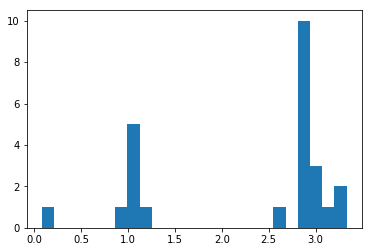

[ 2.31378009]
0.51201915741
Training epoch 137600
Iter: 137600
D loss: 3.776e-05
G_loss: -0.0138
()


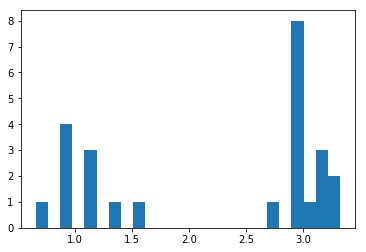

[ 2.2339783]
0.513127088547
Training epoch 137700
Iter: 137700
D loss: 3.214e-05
G_loss: -0.01389
()


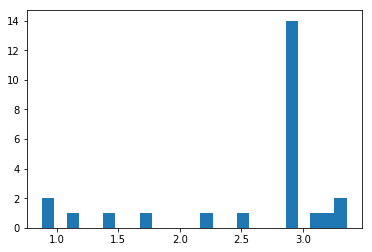

[ 2.57902571]
0.516923904419
Training epoch 137800
Iter: 137800
D loss: 2.444e-05
G_loss: -0.014
()


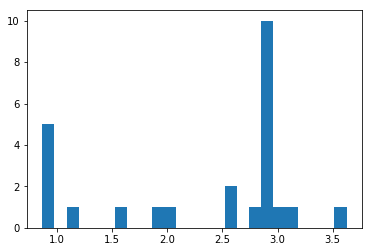

[ 2.30604385]
0.516116142273
Training epoch 137900
Iter: 137900
D loss: 3.605e-05
G_loss: -0.01378
()


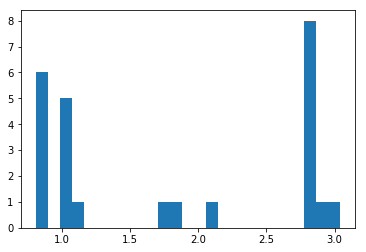

[ 1.81869502]
0.513813018799
Training epoch 138000
Iter: 138000
D loss: 3.676e-05
G_loss: -0.01023
()


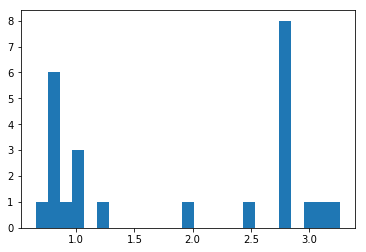

[ 1.86534893]
0.517749071121
Training epoch 138100
Iter: 138100
D loss: 3.003e-05
G_loss: -0.01207
()


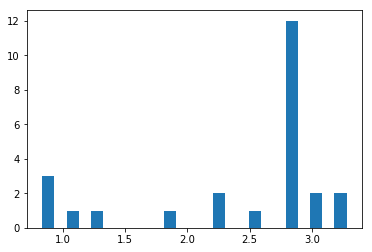

[ 2.43800439]
0.523280143738
Training epoch 138200
Iter: 138200
D loss: 3.411e-05
G_loss: -0.0137
()


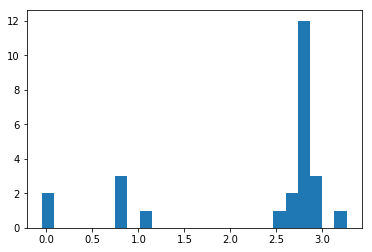

[ 2.29819981]
0.511773109436
Training epoch 138300
Iter: 138300
D loss: 3.751e-05
G_loss: -0.01197
()


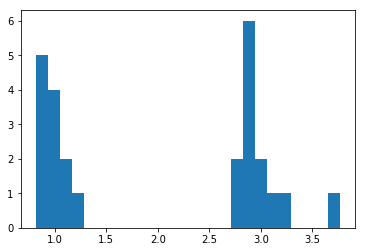

[ 2.01793529]
0.519946098328
Training epoch 138400
Iter: 138400
D loss: 3.356e-05
G_loss: -0.01314
()


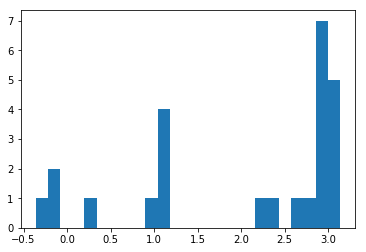

[ 2.04345349]
0.511271953583
Training epoch 138500
Iter: 138500
D loss: 3.008e-05
G_loss: -0.01252
()


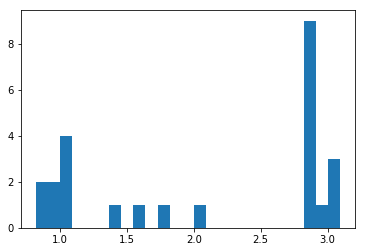

[ 2.0876825]
0.522555112839
Training epoch 138600
Iter: 138600
D loss: 3.256e-05
G_loss: -0.01257
()


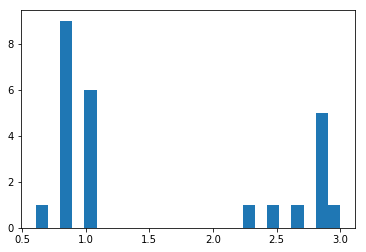

[ 1.56871182]
0.512171983719
Training epoch 138700
Iter: 138700
D loss: 0.0001692
G_loss: -0.01274
()


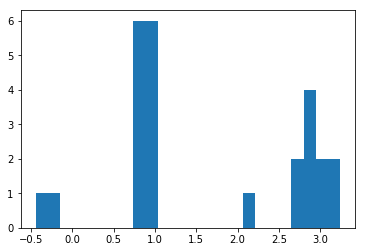

[ 1.67195454]
0.510684013367
Training epoch 138800
Iter: 138800
D loss: 3.872e-05
G_loss: -0.01353
()


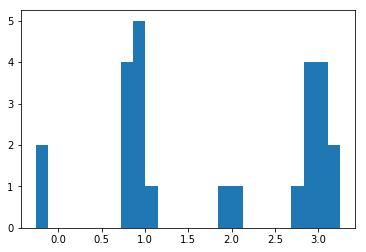

[ 1.82403047]
0.603010177612
Training epoch 138900
Iter: 138900
D loss: 3.17e-05
G_loss: -0.01358
()


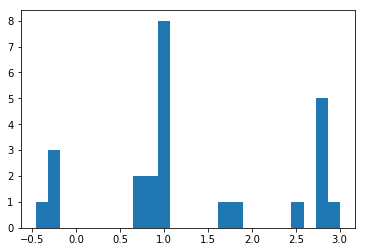

[ 1.31952988]
0.511943817139
Training epoch 139000
Iter: 139000
D loss: 3.51e-05
G_loss: -0.01361
()


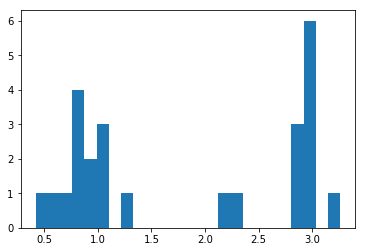

[ 1.81494379]
0.511240005493
Training epoch 139100
Iter: 139100
D loss: 4.001e-05
G_loss: -0.0136
()


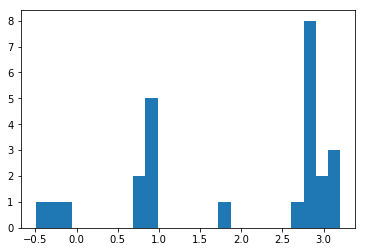

[ 1.90840957]
0.516532897949
Training epoch 139200
Iter: 139200
D loss: 2.687e-05
G_loss: -0.01369
()


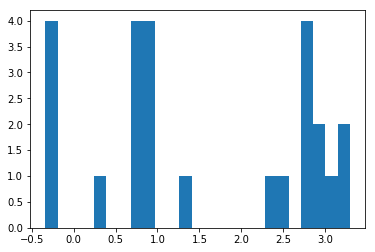

[ 1.52216148]
0.52410197258
Training epoch 139300
Iter: 139300
D loss: 2.721e-05
G_loss: -0.01281
()


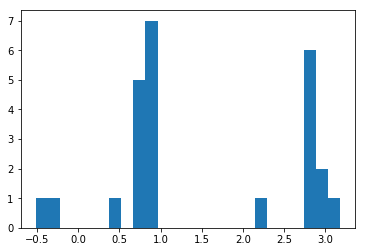

[ 1.49373656]
0.513631105423
Training epoch 139400
Iter: 139400
D loss: 3.301e-05
G_loss: -0.01359
()


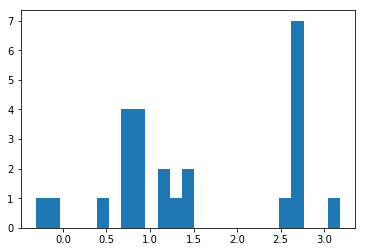

[ 1.52028796]
0.521347045898
Training epoch 139500
Iter: 139500
D loss: 2.886e-05
G_loss: -0.01364
()


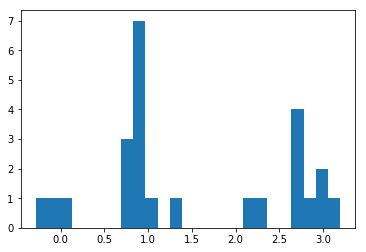

[ 1.52434827]
0.514439105988
Training epoch 139600
Iter: 139600
D loss: 3.25e-05
G_loss: -0.01362
()


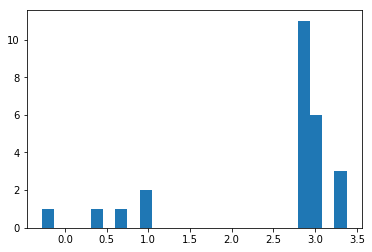

[ 2.48745924]
0.516532897949
Training epoch 139700
Iter: 139700
D loss: 2.57e-05
G_loss: -0.01368
()


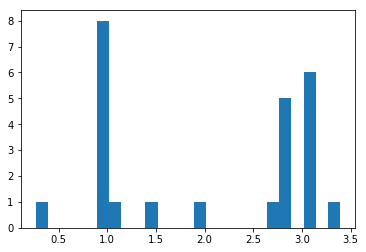

[ 2.04363271]
0.520842075348
Training epoch 139800
Iter: 139800
D loss: 3.396e-05
G_loss: -0.01256
()


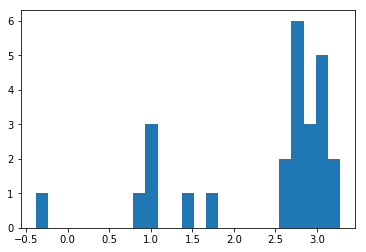

[ 2.35827008]
0.513623952866
Training epoch 139900
Iter: 139900
D loss: 3.187e-05
G_loss: -0.0137
()


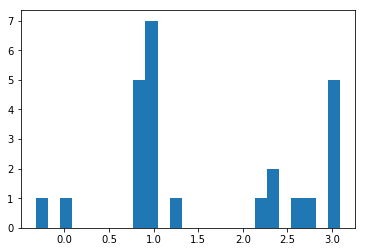

[ 1.57166418]
0.516647100449
Training epoch 140000
Iter: 140000
D loss: 2.728e-05
G_loss: -0.01359
()


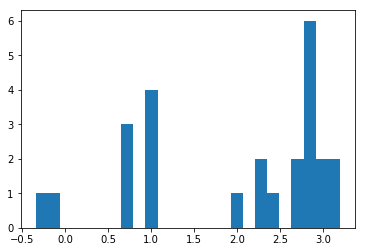

[ 1.96176289]
0.51281785965
Training epoch 140100
Iter: 140100
D loss: 3.018e-05
G_loss: -0.01384
()


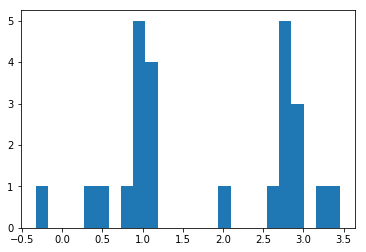

[ 1.80950068]
0.511471033096
Training epoch 140200
Iter: 140200
D loss: 3.689e-05
G_loss: -0.01356
()


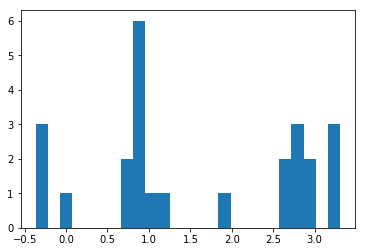

[ 1.56280568]
0.511437892914
Training epoch 140300
Iter: 140300
D loss: 2.807e-05
G_loss: -0.01379
()


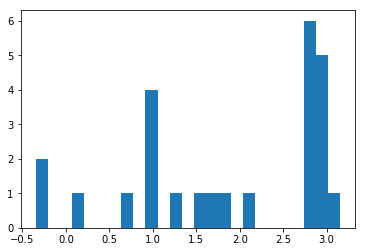

[ 1.88259209]
0.514103889465
Training epoch 140400
Iter: 140400
D loss: 2.828e-05
G_loss: -0.01383
()


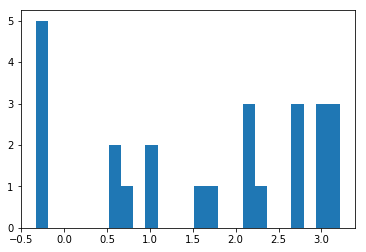

[ 1.63925824]
0.512181997299
Training epoch 140500
Iter: 140500
D loss: 3.531e-05
G_loss: -0.01301
()


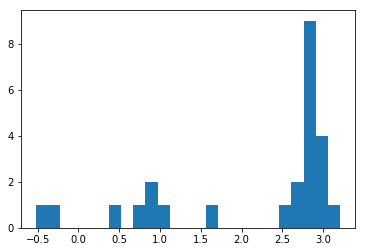

[ 2.12538254]
0.511477947235
Training epoch 140600
Iter: 140600
D loss: 3.894e-05
G_loss: -0.01146
()


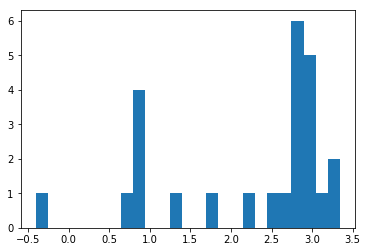

[ 2.22392601]
0.51854300499
Training epoch 140700
Iter: 140700
D loss: 3.382e-05
G_loss: -0.01307
()


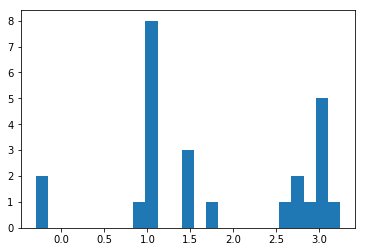

[ 1.75537733]
0.525685071945
Training epoch 140800
Iter: 140800
D loss: 2.916e-05
G_loss: -0.01362
()


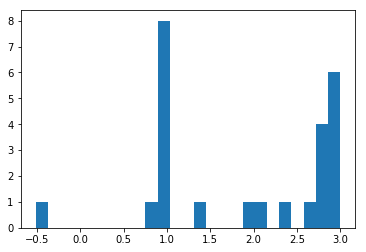

[ 1.8983849]
0.513993024826
Training epoch 140900
Iter: 140900
D loss: 3.448e-05
G_loss: -0.01361
()


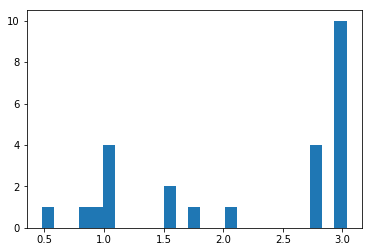

[ 2.1790391]
0.516765117645
Training epoch 141000
Iter: 141000
D loss: 3.701e-05
G_loss: -0.01375
()


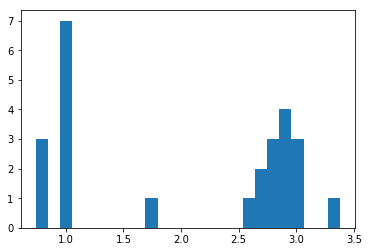

[ 2.04758094]
0.51349902153
Training epoch 141100
Iter: 141100
D loss: 3.611e-05
G_loss: -0.01396
()


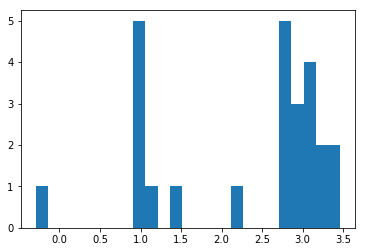

[ 2.31189194]
0.533266067505
Training epoch 141200
Iter: 141200
D loss: 3.153e-05
G_loss: -0.01248
()


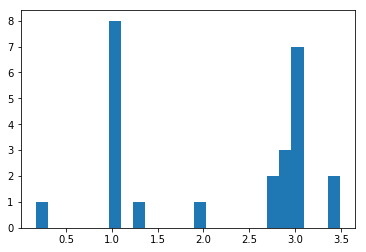

[ 2.15217253]
0.520807981491
Training epoch 141300
Iter: 141300
D loss: 3.363e-05
G_loss: -0.01364
()


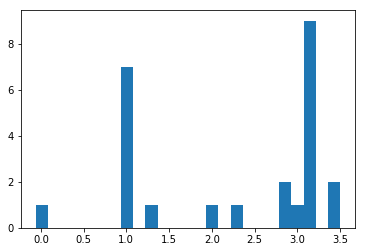

[ 2.25354775]
0.511135101318
Training epoch 141400
Iter: 141400
D loss: 3.455e-05
G_loss: -0.01283
()


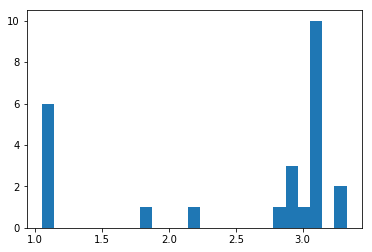

[ 2.4942135]
0.515221118927
Training epoch 141500
Iter: 141500
D loss: 3.279e-05
G_loss: -0.01378
()


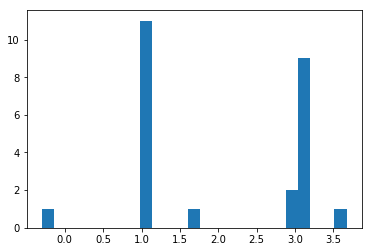

[ 1.98687008]
0.517821073532
Training epoch 141600
Iter: 141600
D loss: 3.355e-05
G_loss: -0.01353
()


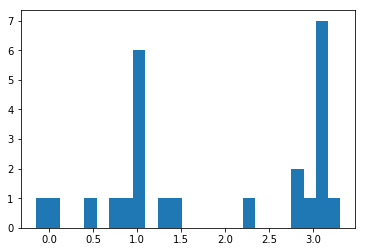

[ 1.87973777]
0.51863694191
Training epoch 141700
Iter: 141700
D loss: 3.884e-05
G_loss: -0.01363
()


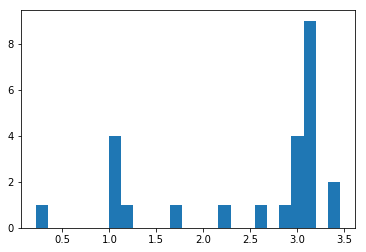

[ 2.48813783]
0.51350402832
Training epoch 141800
Iter: 141800
D loss: 2.571e-05
G_loss: -0.01365
()


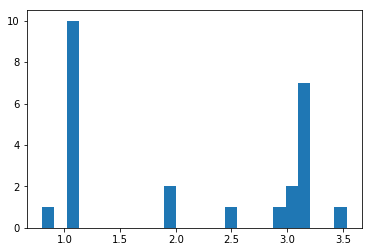

[ 2.09495027]
0.528221845627
Training epoch 141900
Iter: 141900
D loss: 3.366e-05
G_loss: -0.01321
()


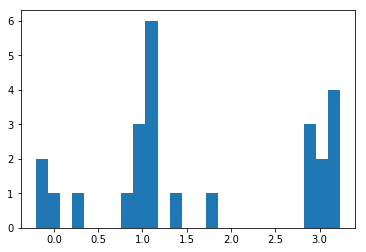

[ 1.62712458]
0.513565063477
Training epoch 142000
Iter: 142000
D loss: 3.517e-05
G_loss: -0.01355
()


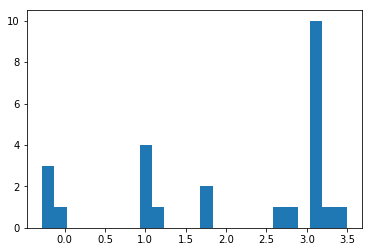

[ 2.05643749]
0.511021852493
Training epoch 142100
Iter: 142100
D loss: 3.042e-05
G_loss: -0.01357
()


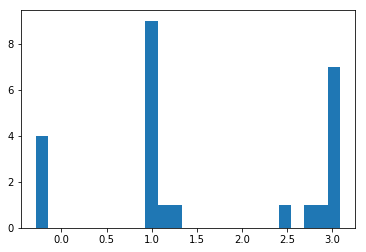

[ 1.61201297]
0.511718988419
Training epoch 142200
Iter: 142200
D loss: 3.356e-05
G_loss: -0.01366
()


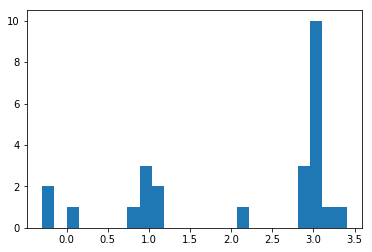

[ 2.14176967]
0.515375137329
Training epoch 142300
Iter: 142300
D loss: 3.474e-05
G_loss: -0.0123
()


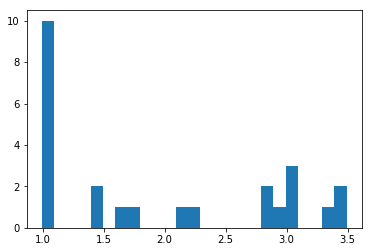

[ 1.9538304]
0.511713027954
Training epoch 142400
Iter: 142400
D loss: 3.353e-05
G_loss: -0.0126
()


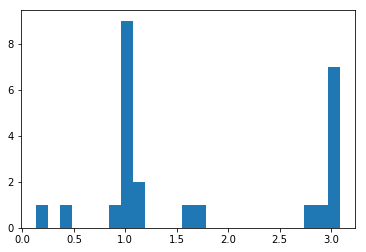

[ 1.73272252]
0.514975070953
Training epoch 142500
Iter: 142500
D loss: 4.07e-05
G_loss: -0.01373
()


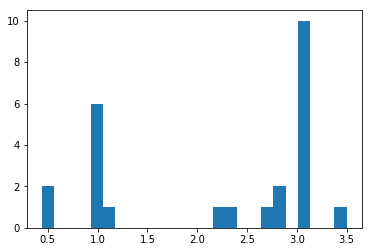

[ 2.20584394]
0.51983499527
Training epoch 142600
Iter: 142600
D loss: 3.461e-05
G_loss: -0.01378
()


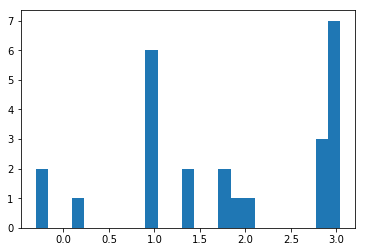

[ 1.81388484]
0.517095088959
Training epoch 142700
Iter: 142700
D loss: 2.408e-05
G_loss: -0.01327
()


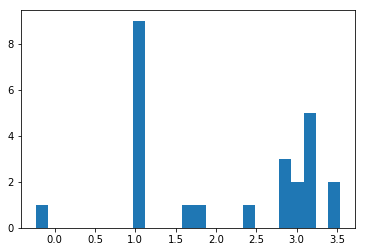

[ 2.09935914]
0.511328220367
Training epoch 142800
Iter: 142800
D loss: 3.669e-05
G_loss: -0.01379
()


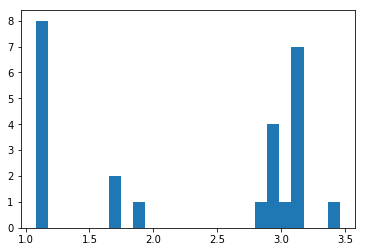

[ 2.28074827]
0.520349025726
Training epoch 142900
Iter: 142900
D loss: 2.486e-05
G_loss: -0.01367
()


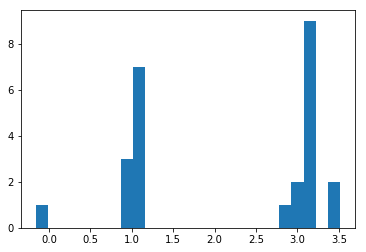

[ 2.14782438]
0.512351036072
Training epoch 143000
Iter: 143000
D loss: 2.901e-05
G_loss: -0.01357
()


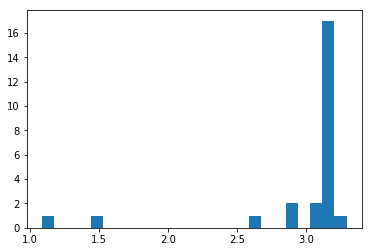

[ 2.94244708]
0.515790939331
Training epoch 143100
Iter: 143100
D loss: 3.613e-05
G_loss: -0.01335
()


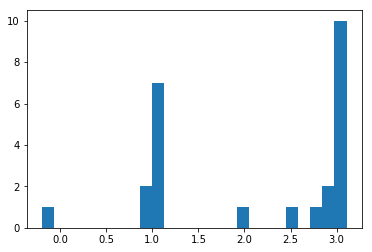

[ 2.12582739]
0.514357089996
Training epoch 143200
Iter: 143200
D loss: 3.216e-05
G_loss: -0.01372
()


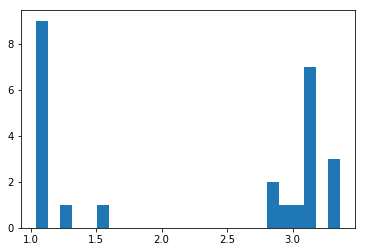

[ 2.24181982]
0.516139030457
Training epoch 143300
Iter: 143300
D loss: 3.282e-05
G_loss: -0.01173
()


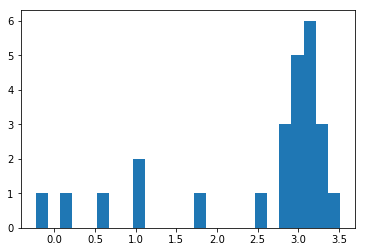

[ 2.49496038]
0.511485099792
Training epoch 143400
Iter: 143400
D loss: 3.613e-05
G_loss: -0.01422
()


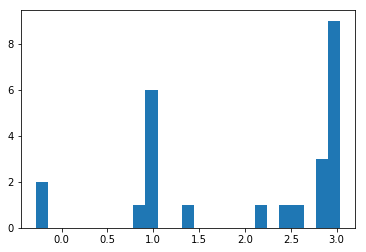

[ 2.0253429]
0.511628866196
Training epoch 143500
Iter: 143500
D loss: 2.65e-05
G_loss: -0.01385
()


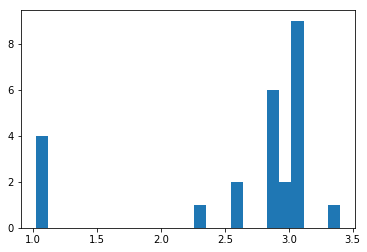

[ 2.62417852]
0.515158891678
Training epoch 143600
Iter: 143600
D loss: 2.977e-05
G_loss: -0.01429
()


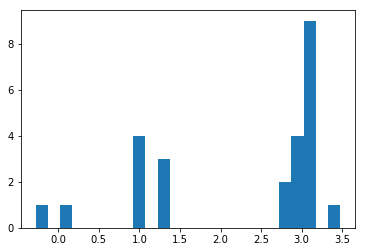

[ 2.24149694]
0.511582136154
Training epoch 143700
Iter: 143700
D loss: 2.351e-05
G_loss: -0.0138
()


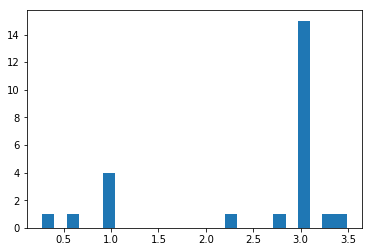

[ 2.4931325]
0.511741876602
Training epoch 143800
Iter: 143800
D loss: 4.123e-05
G_loss: -0.01289
()


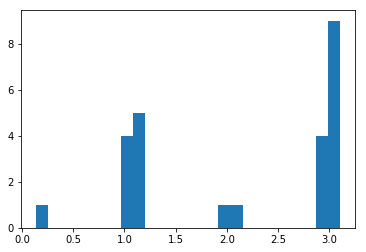

[ 2.13567224]
0.51331114769
Training epoch 143900
Iter: 143900
D loss: 3.045e-05
G_loss: -0.0139
()


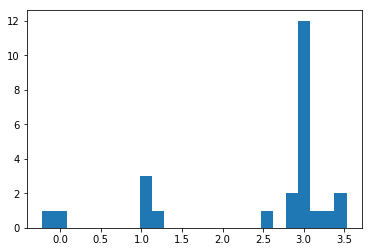

[ 2.48791901]
0.514153003693
Training epoch 144000
Iter: 144000
D loss: 2.658e-05
G_loss: -0.01321
()


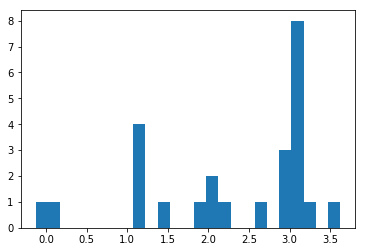

[ 2.29156424]
0.512328147888
Training epoch 144100
Iter: 144100
D loss: 4.16e-05
G_loss: -0.0137
()


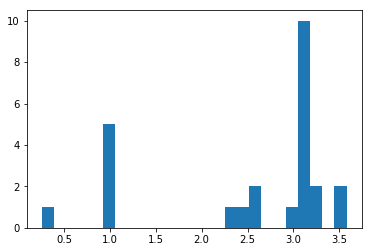

[ 2.51459585]
0.513849020004
Training epoch 144200
Iter: 144200
D loss: 3.375e-05
G_loss: -0.01186
()


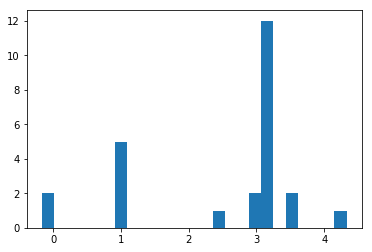

[ 2.48001304]
0.514100074768
Training epoch 144300
Iter: 144300
D loss: 3.672e-05
G_loss: -0.01354
()


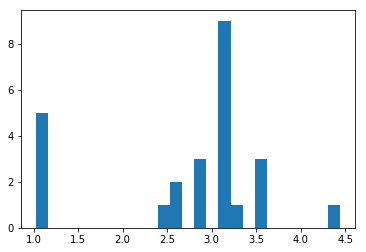

[ 2.70967181]
0.51940703392
Training epoch 144400
Iter: 144400
D loss: 4.003e-05
G_loss: -0.01345
()


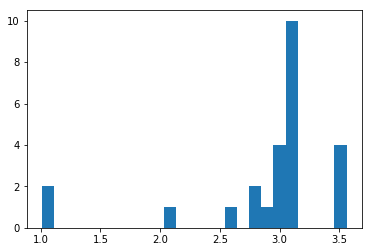

[ 2.88539572]
0.515976905823
Training epoch 144500
Iter: 144500
D loss: 4.107e-05
G_loss: -0.01299
()


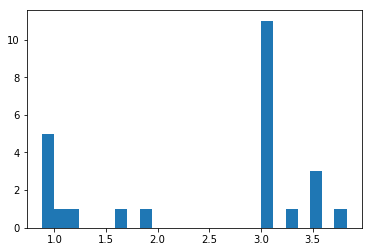

[ 2.46230382]
0.511061906815
Training epoch 144600
Iter: 144600
D loss: 4.879e-05
G_loss: -0.0122
()


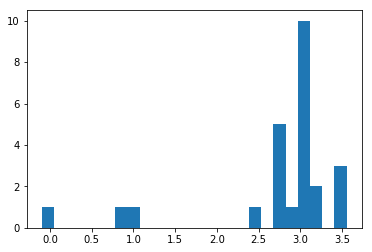

[ 2.73431971]
0.510963916779
Training epoch 144700
Iter: 144700
D loss: 2.528e-05
G_loss: -0.01386
()


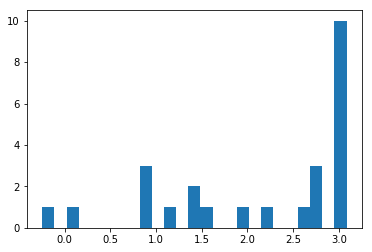

[ 2.12319824]
0.512466907501
Training epoch 144800
Iter: 144800
D loss: 2.396e-05
G_loss: -0.01399
()


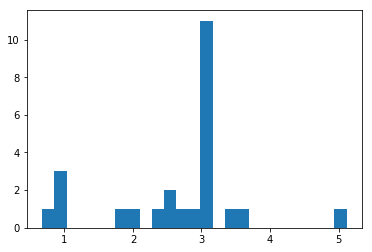

[ 2.64045129]
0.518813848495
Training epoch 144900
Iter: 144900
D loss: 3.568e-05
G_loss: -0.01344
()


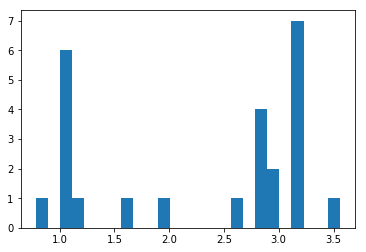

[ 2.29714799]
0.512288808823
Training epoch 145000
Iter: 145000
D loss: 2.929e-05
G_loss: -0.01297
()


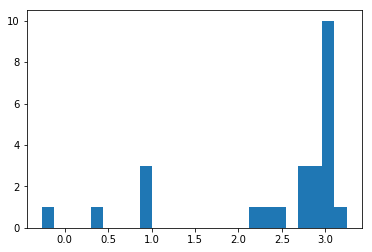

[ 2.41746851]
0.514507055283
Training epoch 145100
Iter: 145100
D loss: 3.105e-05
G_loss: -0.01325
()


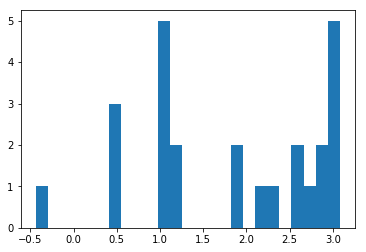

[ 1.82384951]
0.519232988358
Training epoch 145200
Iter: 145200
D loss: 2.806e-05
G_loss: -0.0131
()


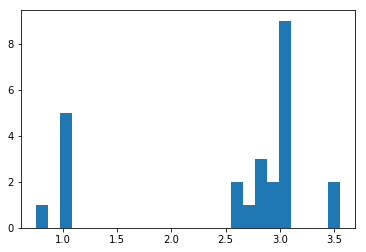

[ 2.52379108]
0.512303113937
Training epoch 145300
Iter: 145300
D loss: 2.688e-05
G_loss: -0.01253
()


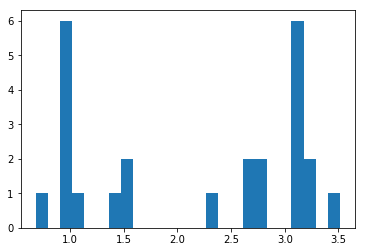

[ 2.15502496]
0.511948823929
Training epoch 145400
Iter: 145400
D loss: 3.04e-05
G_loss: -0.01369
()


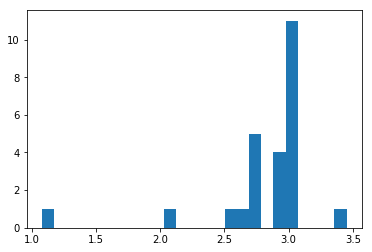

[ 2.83487098]
0.513614177704
Training epoch 145500
Iter: 145500
D loss: 2.833e-05
G_loss: -0.01368
()


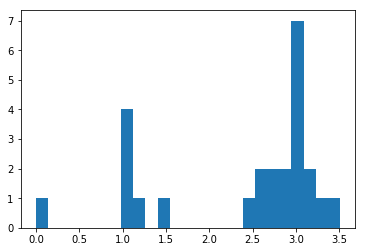

[ 2.40014046]
0.528970003128
Training epoch 145600
Iter: 145600
D loss: 2.665e-05
G_loss: -0.01395
()


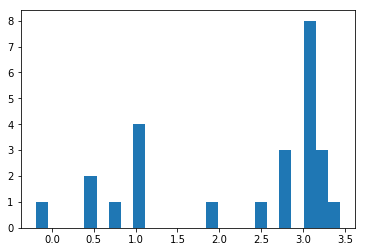

[ 2.26620482]
0.512597084045
Training epoch 145700
Iter: 145700
D loss: 2.852e-05
G_loss: -0.01358
()


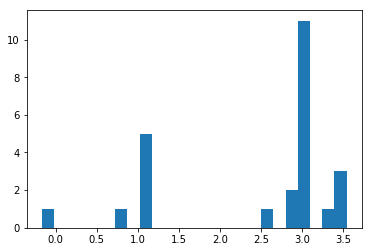

[ 2.47134588]
0.512309074402
Training epoch 145800
Iter: 145800
D loss: 3.007e-05
G_loss: -0.01375
()


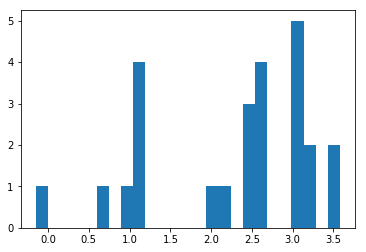

[ 2.27239967]
0.513339996338
Training epoch 145900
Iter: 145900
D loss: 3.385e-05
G_loss: -0.01245
()


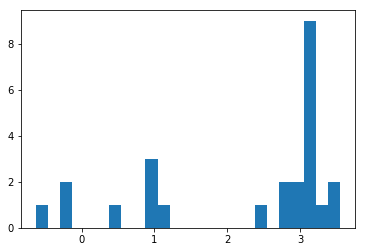

[ 2.22156161]
0.515080213547
Training epoch 146000
Iter: 146000
D loss: 3.659e-05
G_loss: -0.01324
()


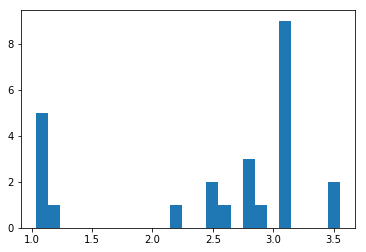

[ 2.5049643]
0.516449928284
Training epoch 146100
Iter: 146100
D loss: 2.177e-05
G_loss: -0.01396
()


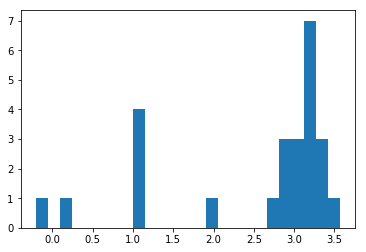

[ 2.48042878]
0.513654947281
Training epoch 146200
Iter: 146200
D loss: 3.024e-05
G_loss: -0.01354
()


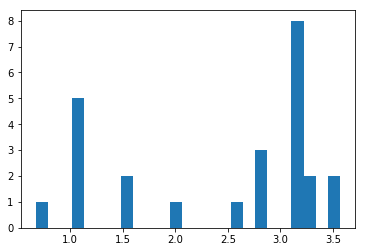

[ 2.43547936]
0.511265993118
Training epoch 146300
Iter: 146300
D loss: 2.654e-05
G_loss: -0.01371
()


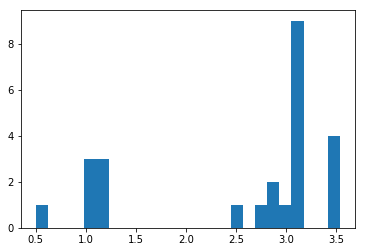

[ 2.52702374]
0.510210037231
Training epoch 146400
Iter: 146400
D loss: 3.634e-05
G_loss: -0.01369
()


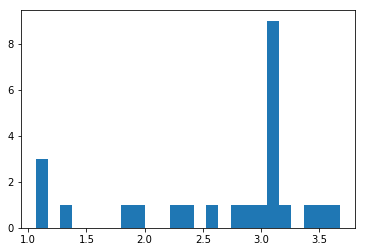

[ 2.65065157]
0.511349201202
Training epoch 146500
Iter: 146500
D loss: 3.554e-05
G_loss: -0.01366
()


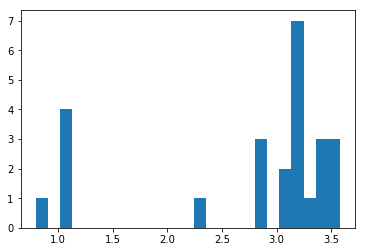

[ 2.74087469]
0.514245986938
Training epoch 146600
Iter: 146600
D loss: 3.163e-05
G_loss: -0.01305
()


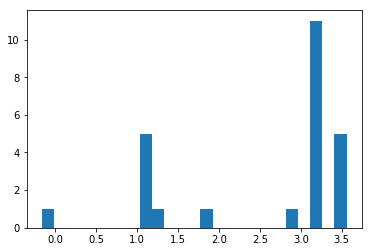

[ 2.5458264]
0.511495828629
Training epoch 146700
Iter: 146700
D loss: 2.588e-05
G_loss: -0.01319
()


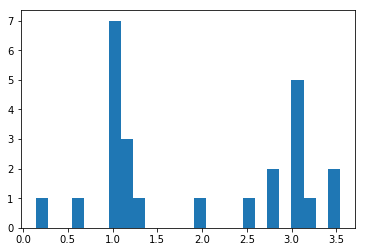

[ 1.94900392]
0.510653018951
Training epoch 146800
Iter: 146800
D loss: 2.935e-05
G_loss: -0.01369
()


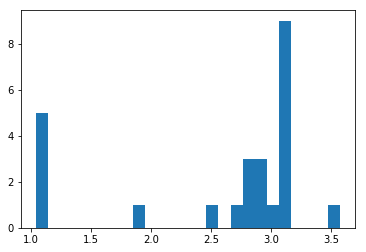

[ 2.59102082]
0.516536951065
Training epoch 146900
Iter: 146900
D loss: 2.942e-05
G_loss: -0.01376
()


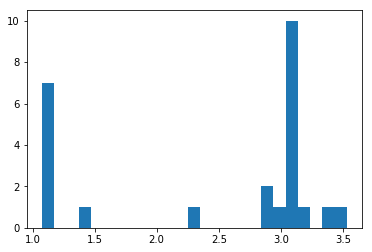

[ 2.44292948]
0.513396978378
Training epoch 147000
Iter: 147000
D loss: 2.968e-05
G_loss: -0.01374
()


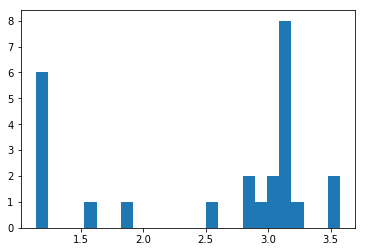

[ 2.52199733]
0.515112876892
Training epoch 147100
Iter: 147100
D loss: 3.894e-05
G_loss: -0.01265
()


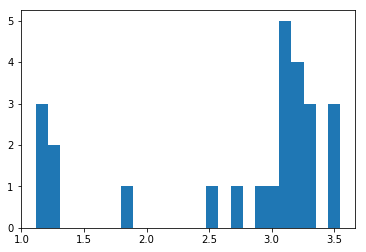

[ 2.71372763]
0.535125017166
Training epoch 147200
Iter: 147200
D loss: 2.452e-05
G_loss: -0.01395
()


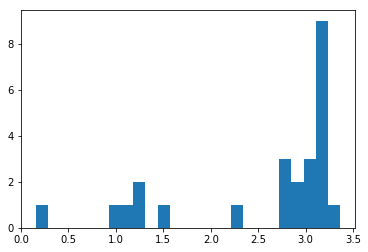

[ 2.54717556]
0.514782905579
Training epoch 147300
Iter: 147300
D loss: 3.095e-05
G_loss: -0.01364
()


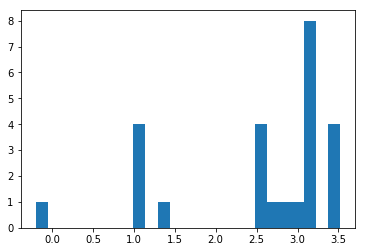

[ 2.51991587]
0.521305084229
Training epoch 147400
Iter: 147400
D loss: 2.84e-05
G_loss: -0.01384
()


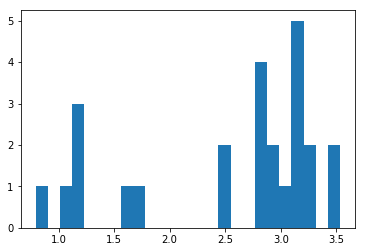

[ 2.51536269]
0.513111114502
Training epoch 147500
Iter: 147500
D loss: 2.637e-05
G_loss: -0.01338
()


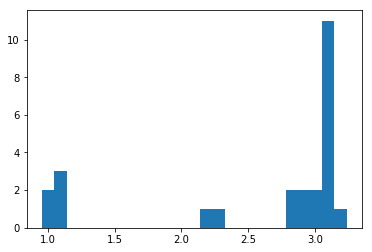

[ 2.59558726]
0.512091875076
Training epoch 147600
Iter: 147600
D loss: 3.62e-05
G_loss: -0.0133
()


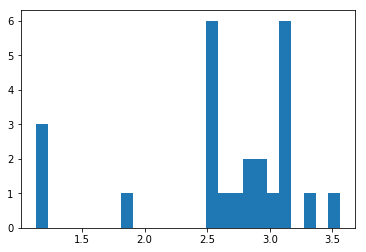

[ 2.64012056]
0.518110990524
Training epoch 147700
Iter: 147700
D loss: 3.328e-05
G_loss: -0.01349
()


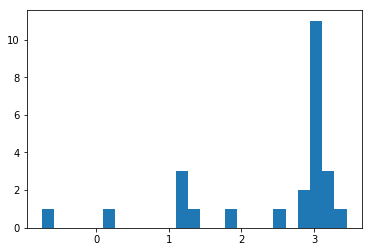

[ 2.45322707]
0.520375967026
Training epoch 147800
Iter: 147800
D loss: 2.448e-05
G_loss: -0.01382
()


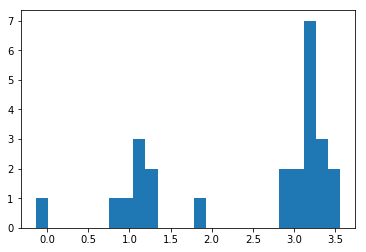

[ 2.41481346]
0.51154088974
Training epoch 147900
Iter: 147900
D loss: 3.439e-05
G_loss: -0.01289
()


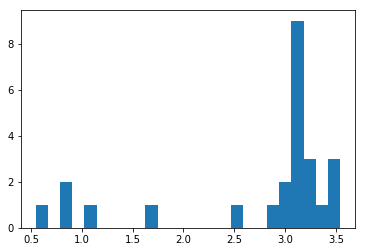

[ 2.72731567]
0.511776924133
Training epoch 148000
Iter: 148000
D loss: 2.961e-05
G_loss: -0.0138
()


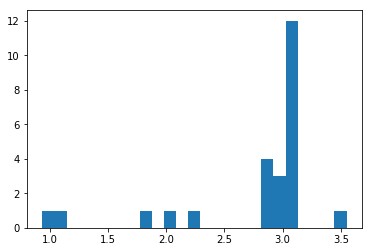

[ 2.77871786]
0.518443822861
Training epoch 148100
Iter: 148100
D loss: 2.62e-05
G_loss: -0.01404
()


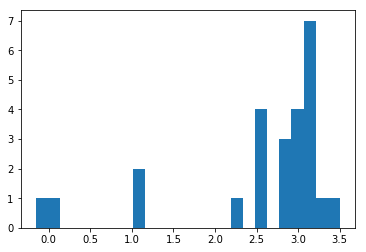

[ 2.53647101]
0.51775097847
Training epoch 148200
Iter: 148200
D loss: 3.087e-05
G_loss: -0.01209
()


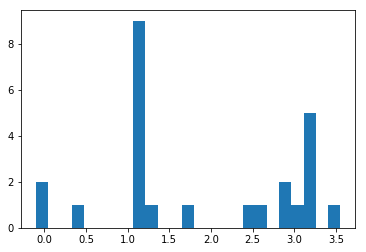

[ 1.88159785]
0.525825977325
Training epoch 148300
Iter: 148300
D loss: 3.922e-05
G_loss: -0.0136
()


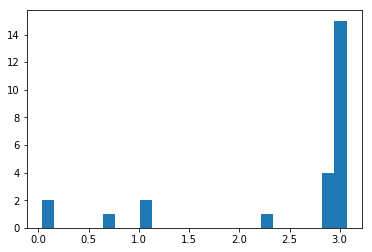

[ 2.50898194]
0.521500825882
Training epoch 148400
Iter: 148400
D loss: 3.957e-05
G_loss: -0.01327
()


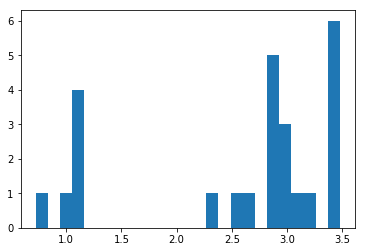

[ 2.55349295]
0.515990018845
Training epoch 148500
Iter: 148500
D loss: 2.903e-05
G_loss: -0.01354
()


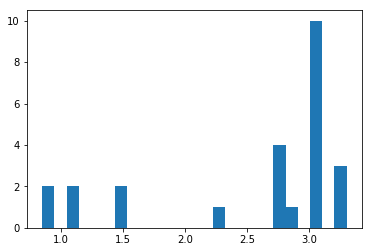

[ 2.53026489]
0.513542890549
Training epoch 148600
Iter: 148600
D loss: 3.076e-05
G_loss: -0.0131
()


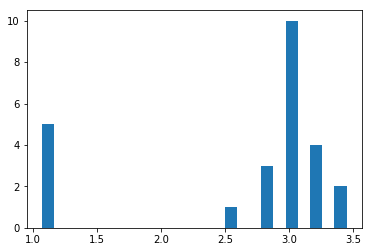

[ 2.65314302]
0.512949943542
Training epoch 148700
Iter: 148700
D loss: 2.777e-05
G_loss: -0.01269
()


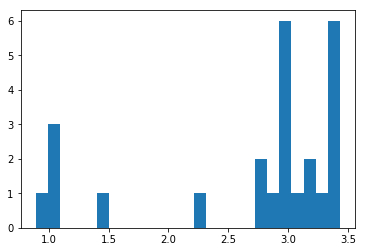

[ 2.68666168]
0.513173103333
Training epoch 148800
Iter: 148800
D loss: 3.33e-05
G_loss: -0.01372
()


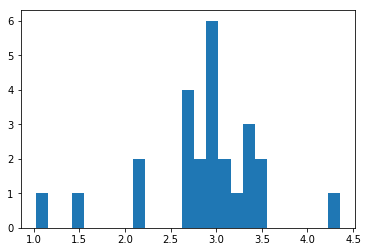

[ 2.88669857]
0.516611099243
Training epoch 148900
Iter: 148900
D loss: 3.923e-05
G_loss: -0.01356
()


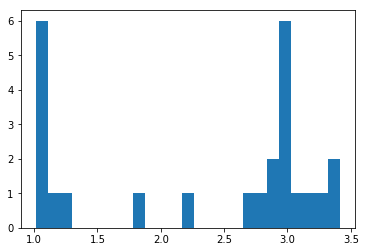

[ 2.31974475]
0.518028974533
Training epoch 149000
Iter: 149000
D loss: 3.148e-05
G_loss: -0.01439
()


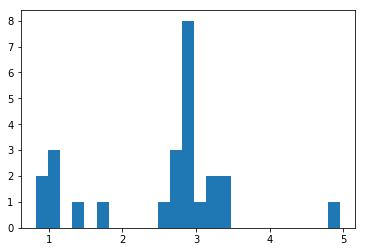

[ 2.54631551]
0.510994911194
Training epoch 149100
Iter: 149100
D loss: 3.474e-05
G_loss: -0.01257
()


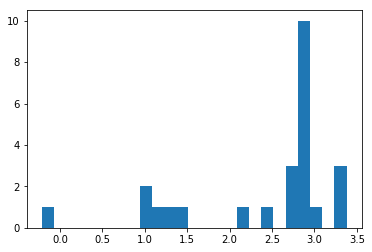

[ 2.42241466]
0.511291027069
Training epoch 149200
Iter: 149200
D loss: 3.412e-05
G_loss: -0.01284
()


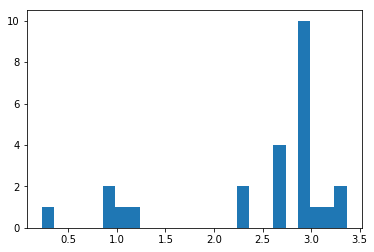

[ 2.46832418]
0.513987064362
Training epoch 149300
Iter: 149300
D loss: 3.339e-05
G_loss: -0.01359
()


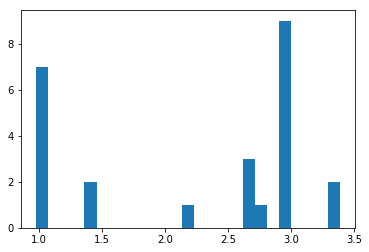

[ 2.2380119]
0.519223928452
Training epoch 149400
Iter: 149400
D loss: 2.856e-05
G_loss: -0.01357
()


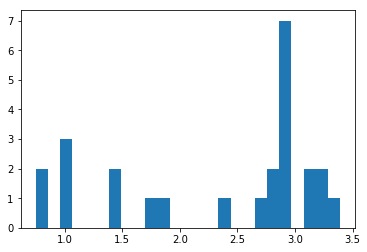

[ 2.33848204]
0.514354944229
Training epoch 149500
Iter: 149500
D loss: 3.53e-05
G_loss: -0.01381
()


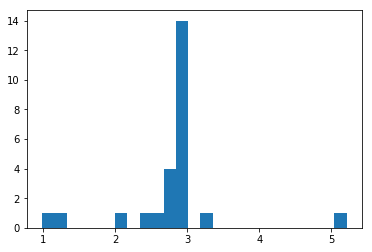

[ 2.79956387]
0.511326789856
Training epoch 149600
Iter: 149600
D loss: 3.678e-05
G_loss: -0.0131
()


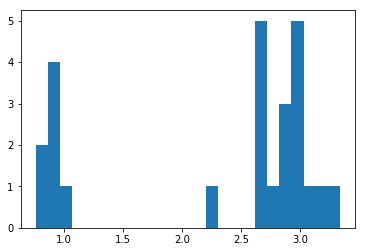

[ 2.31696472]
0.516270875931
Training epoch 149700
Iter: 149700
D loss: 2.752e-05
G_loss: -0.01269
()


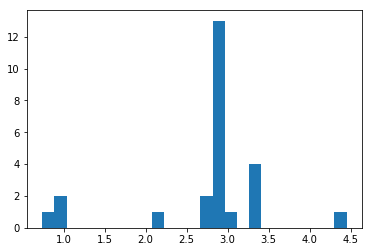

[ 2.76333763]
0.512024879456
Training epoch 149800
Iter: 149800
D loss: 2.521e-05
G_loss: -0.01376
()


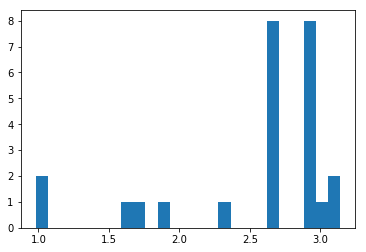

[ 2.5538379]
0.520785093307
Training epoch 149900
Iter: 149900
D loss: 3.731e-05
G_loss: -0.01412
()


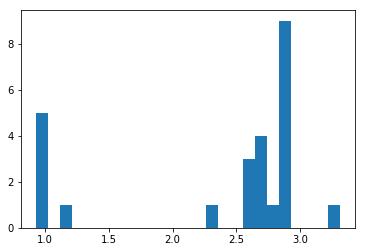

[ 2.35707217]
0.511569023132
Training epoch 150000
Iter: 150000
D loss: 3.525e-05
G_loss: -0.01364
()


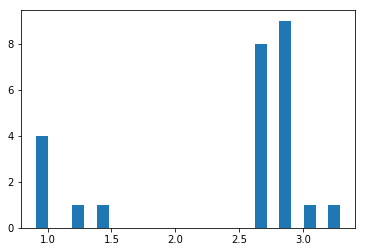

[ 2.39276702]
0.514333963394
Training epoch 150100
Iter: 150100
D loss: 4.201e-05
G_loss: -0.0129
()


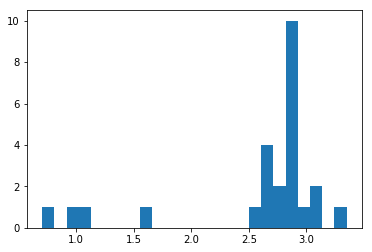

[ 2.58668293]
0.601361036301
Training epoch 150200
Iter: 150200
D loss: 3.845e-05
G_loss: -0.01267
()


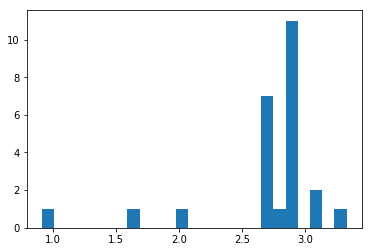

[ 2.70323715]
0.513207912445
Training epoch 150300
Iter: 150300
D loss: 3.453e-05
G_loss: -0.01283
()


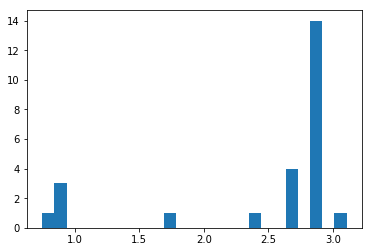

[ 2.49175254]
0.516792058945
Training epoch 150400
Iter: 150400
D loss: 2.914e-05
G_loss: -0.01347
()


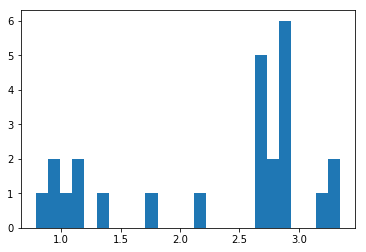

[ 2.3041661]
0.51222205162
Training epoch 150500
Iter: 150500
D loss: 3.391e-05
G_loss: -0.01355
()


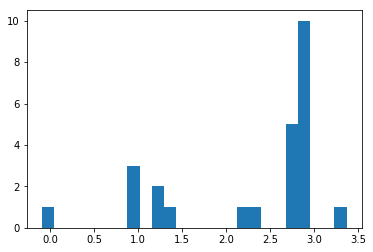

[ 2.28001056]
0.522113084793
Training epoch 150600
Iter: 150600
D loss: 3.992e-05
G_loss: -0.01222
()


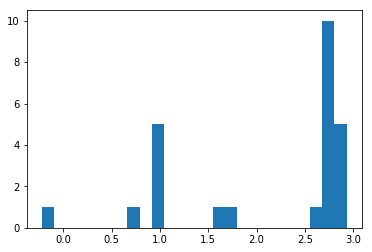

[ 2.11954322]
0.513334989548
Training epoch 150700
Iter: 150700
D loss: 3.317e-05
G_loss: -0.0135
()


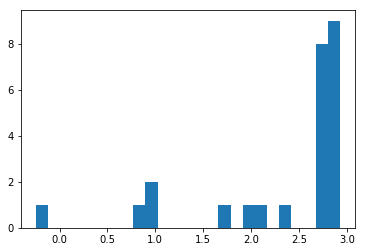

[ 2.33818379]
0.515954017639
Training epoch 150800
Iter: 150800
D loss: 4.072e-05
G_loss: -0.01347
()


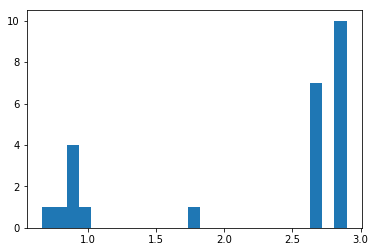

[ 2.2227539]
0.51309299469
Training epoch 150900
Iter: 150900
D loss: 4.587e-05
G_loss: -0.01339
()


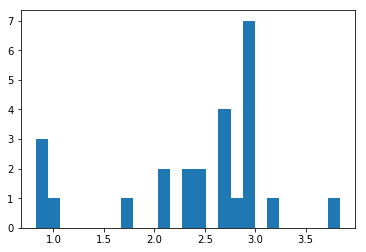

[ 2.39237282]
0.515404939651
Training epoch 151000
Iter: 151000
D loss: 3.498e-05
G_loss: -0.01242
()


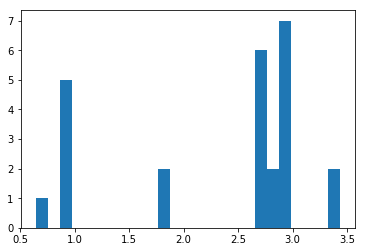

[ 2.32605473]
0.51231098175
Training epoch 151100
Iter: 151100
D loss: 3.635e-05
G_loss: -0.0138
()


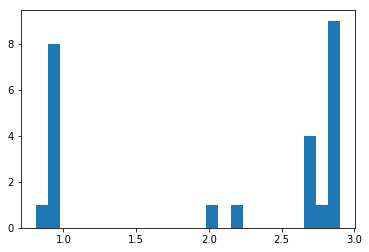

[ 2.08265246]
0.511637926102
Training epoch 151200
Iter: 151200
D loss: 2.935e-05
G_loss: -0.01327
()


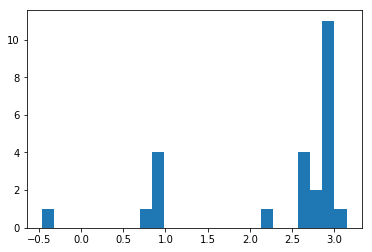

[ 2.29680691]
0.531465053558
Training epoch 151300
Iter: 151300
D loss: 2.78e-05
G_loss: -0.01363
()


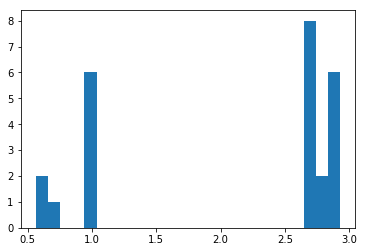

[ 2.09415807]
0.512490987778
Training epoch 151400
Iter: 151400
D loss: 3.478e-05
G_loss: -0.01232
()


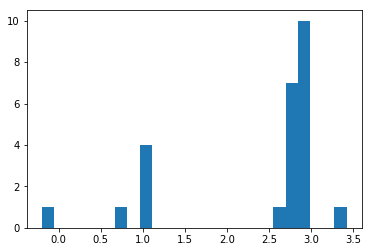

[ 2.36072529]
0.520362138748
Training epoch 151500
Iter: 151500
D loss: 3.065e-05
G_loss: -0.01364
()


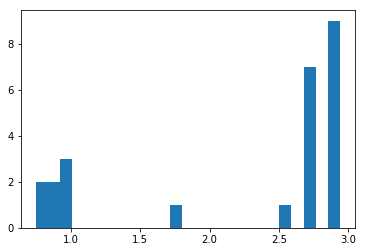

[ 2.23390307]
0.518640041351
Training epoch 151600
Iter: 151600
D loss: 3.886e-05
G_loss: -0.01258
()


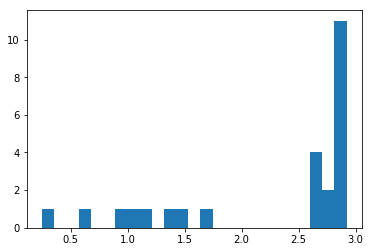

[ 2.27498061]
0.518210887909
Training epoch 151700
Iter: 151700
D loss: 4.014e-05
G_loss: -0.01235
()


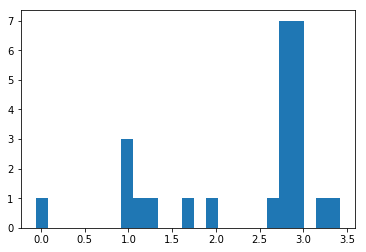

[ 2.33529354]
0.514364004135
Training epoch 151800
Iter: 151800
D loss: 3.856e-05
G_loss: -0.01353
()


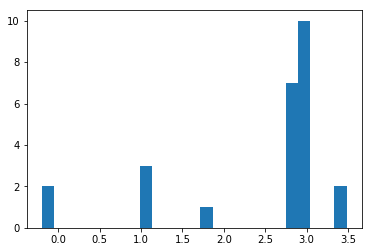

[ 2.43529556]
0.513847112656
Training epoch 151900
Iter: 151900
D loss: 3.347e-05
G_loss: -0.01346
()


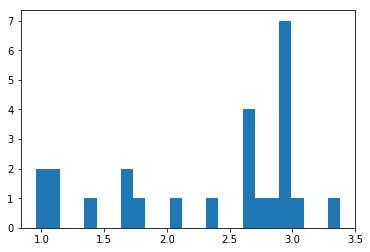

[ 2.33281695]
0.515564918518
Training epoch 152000
Iter: 152000
D loss: 2.738e-05
G_loss: -0.01374
()


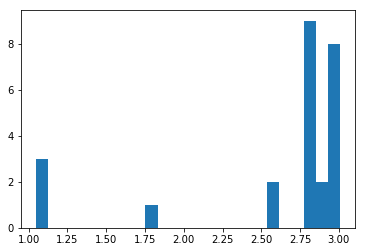

[ 2.59858156]
0.513388872147
Training epoch 152100
Iter: 152100
D loss: 4.064e-05
G_loss: -0.01365
()


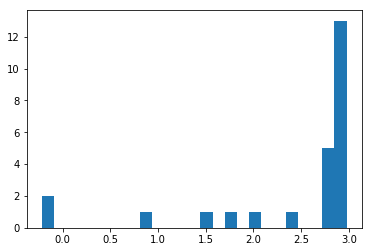

[ 2.42127734]
0.529350996017
Training epoch 152200
Iter: 152200
D loss: 4.68e-05
G_loss: -0.0142
()


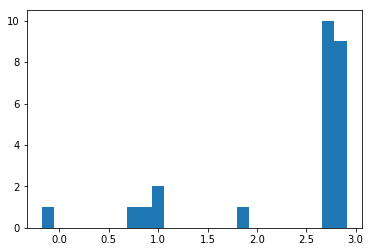

[ 2.31864379]
0.522062063217
Training epoch 152300
Iter: 152300
D loss: 2.754e-05
G_loss: -0.01306
()


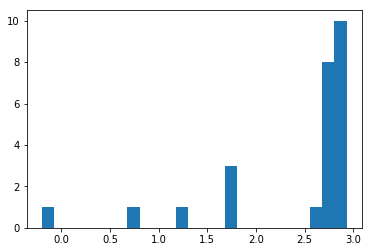

[ 2.43089423]
0.516261816025
Training epoch 152400
Iter: 152400
D loss: 3.547e-05
G_loss: -0.01359
()


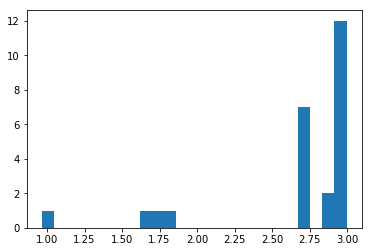

[ 2.6454493]
0.515436172485
Training epoch 152500
Iter: 152500
D loss: 3.153e-05
G_loss: -0.01372
()


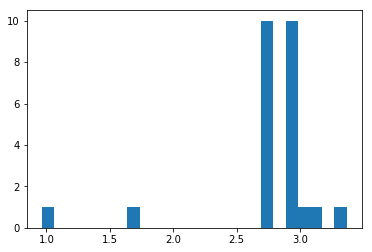

[ 2.74983577]
0.514847040176
Training epoch 152600
Iter: 152600
D loss: 3.815e-05
G_loss: -0.01246
()


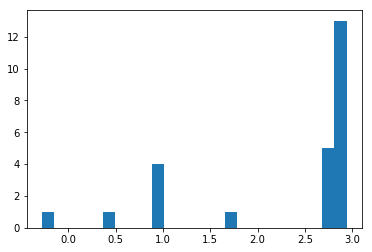

[ 2.30007354]
0.513999223709
Training epoch 152700
Iter: 152700
D loss: 3.557e-05
G_loss: -0.01358
()


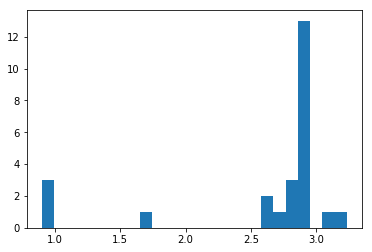

[ 2.58016288]
0.511456012726
Training epoch 152800
Iter: 152800
D loss: 3.333e-05
G_loss: -0.01131
()


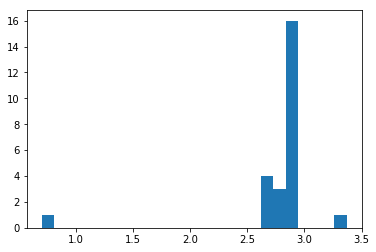

[ 2.78334359]
0.511645078659
Training epoch 152900
Iter: 152900
D loss: 2.245e-05
G_loss: -0.01353
()


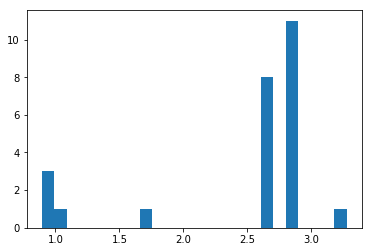

[ 2.46545162]
0.52033495903
Training epoch 153000
Iter: 153000
D loss: 3.373e-05
G_loss: -0.01368
()


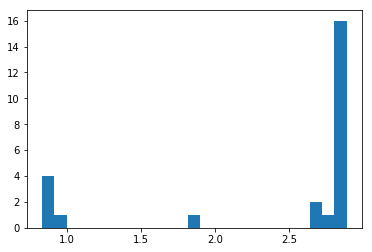

[ 2.42478879]
0.513273954391
Training epoch 153100
Iter: 153100
D loss: 3.118e-05
G_loss: -0.01348
()


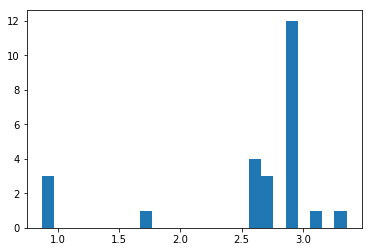

[ 2.57079135]
0.513625860214
Training epoch 153200
Iter: 153200
D loss: 3.339e-05
G_loss: -0.01356
()


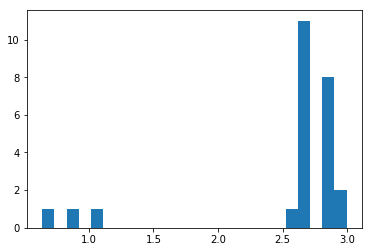

[ 2.5137292]
0.511940956116
Training epoch 153300
Iter: 153300
D loss: 3.014e-05
G_loss: -0.01104
()


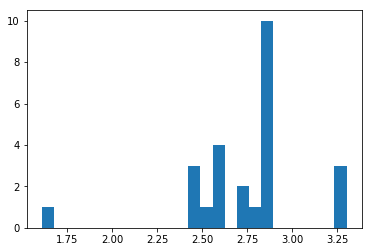

[ 2.73901553]
0.518223047256
Training epoch 153400
Iter: 153400
D loss: 4.05e-05
G_loss: -0.01393
()


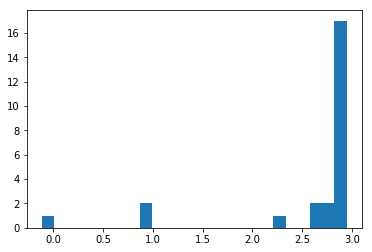

[ 2.54749439]
0.510255098343
Training epoch 153500
Iter: 153500
D loss: 2.646e-05
G_loss: -0.01379
()


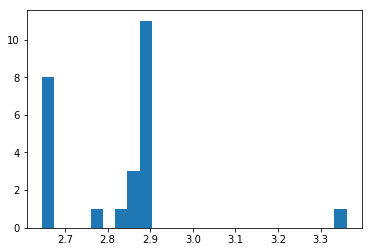

[ 2.81633357]
0.515378952026
Training epoch 153600
Iter: 153600
D loss: 3.397e-05
G_loss: -0.01372
()


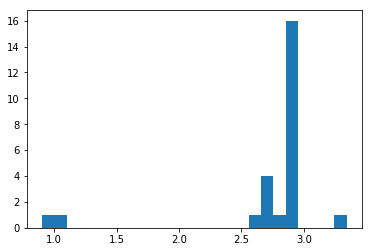

[ 2.70635549]
0.511416912079
Training epoch 153700
Iter: 153700
D loss: 3.64e-05
G_loss: -0.01302
()


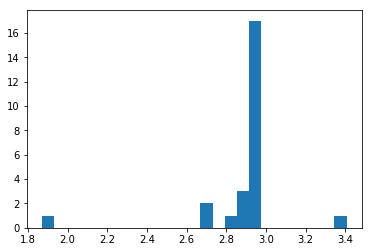

[ 2.89573073]
0.517157077789
Training epoch 153800
Iter: 153800
D loss: 3.961e-05
G_loss: -0.01256
()


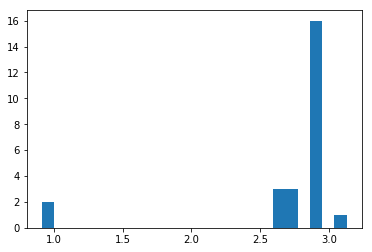

[ 2.71164606]
0.519468069077
Training epoch 153900
Iter: 153900
D loss: 4.211e-05
G_loss: -0.01368
()


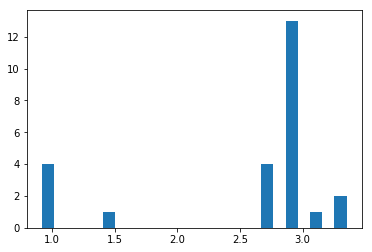

[ 2.55868318]
0.512722015381
Training epoch 154000
Iter: 154000
D loss: 3.399e-05
G_loss: -0.01383
()


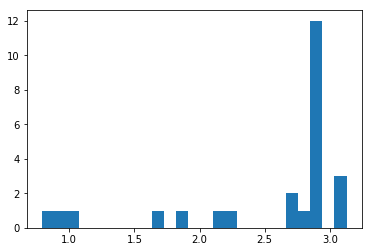

[ 2.51034965]
0.511940002441
Training epoch 154100
Iter: 154100
D loss: 3.199e-05
G_loss: -0.01364
()


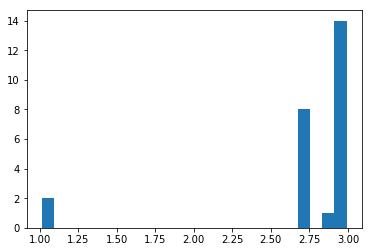

[ 2.72443801]
0.512639045715
Training epoch 154200
Iter: 154200
D loss: 2.928e-05
G_loss: -0.01368
()


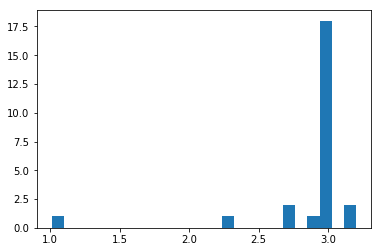

[ 2.86557863]
0.51127910614
Training epoch 154300
Iter: 154300
D loss: 3.417e-05
G_loss: -0.01347
()


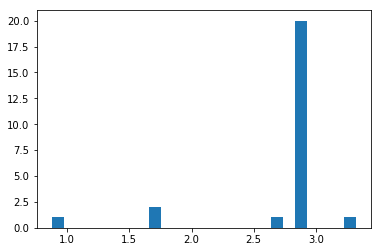

[ 2.72901522]
0.512120008469
Training epoch 154400
Iter: 154400
D loss: 4.369e-05
G_loss: -0.01286
()


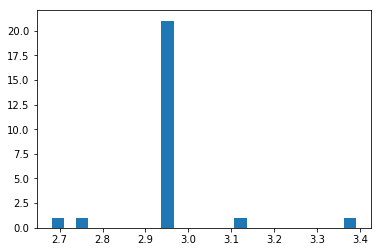

[ 2.95694859]
0.5127389431
Training epoch 154500
Iter: 154500
D loss: 3.322e-05
G_loss: -0.01268
()


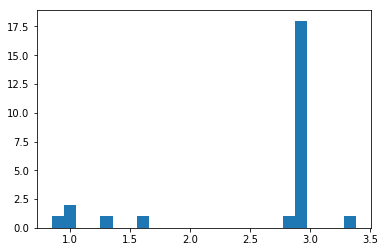

[ 2.60404792]
0.51095199585
Training epoch 154600
Iter: 154600
D loss: 3.993e-05
G_loss: -0.01392
()


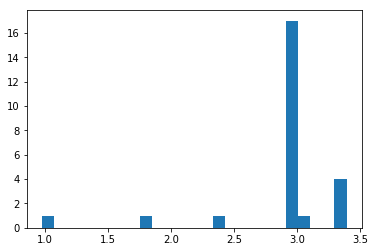

[ 2.88035181]
0.516954898834
Training epoch 154700
Iter: 154700
D loss: 3.144e-05
G_loss: -0.01288
()


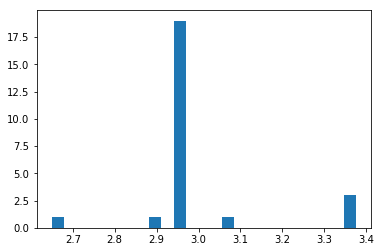

[ 2.98712992]
0.524492025375
Training epoch 154800
Iter: 154800
D loss: 3.049e-05
G_loss: -0.01354
()


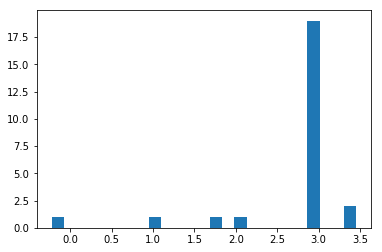

[ 2.74558756]
0.519695043564
Training epoch 154900
Iter: 154900
D loss: 3.059e-05
G_loss: -0.01358
()


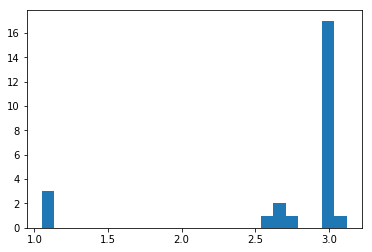

[ 2.7255492]
0.515861034393
Training epoch 155000
Iter: 155000
D loss: 2.922e-05
G_loss: -0.01376
()


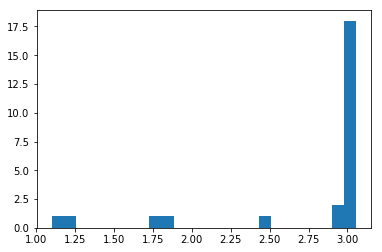

[ 2.77014842]
0.51836681366
Training epoch 155100
Iter: 155100
D loss: 3.296e-05
G_loss: -0.0135
()


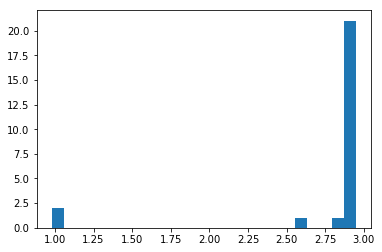

[ 2.77391936]
0.521473884583
Training epoch 155200
Iter: 155200
D loss: 3.661e-05
G_loss: -0.01188
()


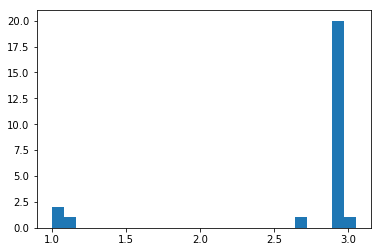

[ 2.71846338]
0.514787912369
Training epoch 155300
Iter: 155300
D loss: 3.29e-05
G_loss: -0.01375
()


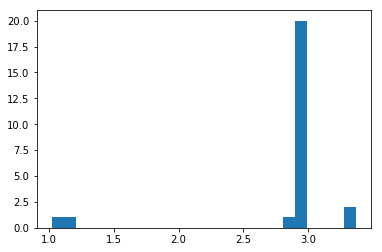

[ 2.84241339]
0.512732982635
Training epoch 155400
Iter: 155400
D loss: 3.29e-05
G_loss: -0.01355
()


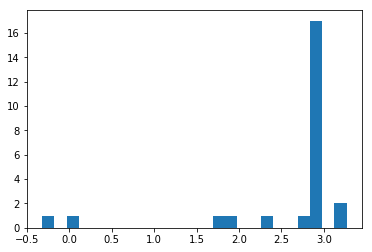

[ 2.55556282]
0.586290121078
Training epoch 155500
Iter: 155500
D loss: 2.387e-05
G_loss: -0.01312
()


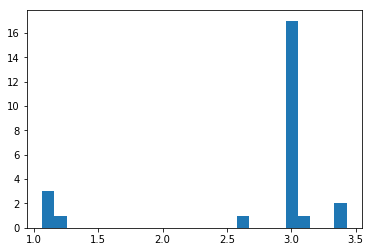

[ 2.74104818]
0.524082183838
Training epoch 155600
Iter: 155600
D loss: 2.582e-05
G_loss: -0.01079
()


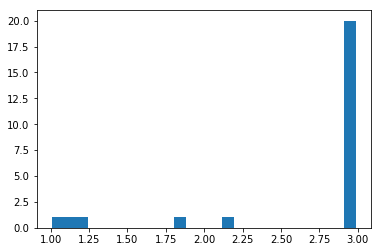

[ 2.67818435]
0.51490688324
Training epoch 155700
Iter: 155700
D loss: 3.802e-05
G_loss: -0.01215
()


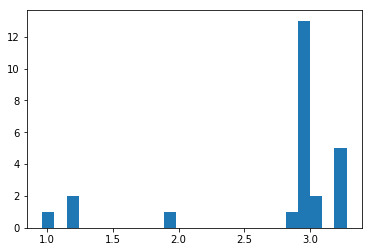

[ 2.73925986]
0.515625
Training epoch 155800
Iter: 155800
D loss: 3.819e-05
G_loss: -0.01373
()


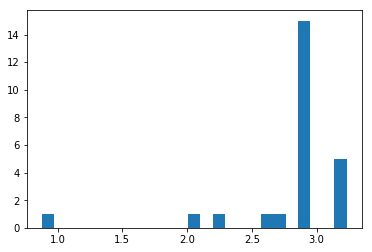

[ 2.78917659]
0.515376091003
Training epoch 155900
Iter: 155900
D loss: 3.307e-05
G_loss: -0.01345
()


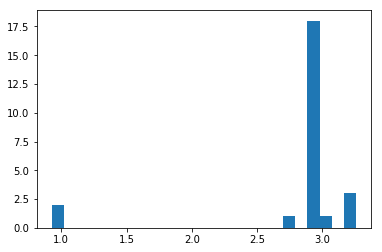

[ 2.78667062]
0.51651597023
Training epoch 156000
Iter: 156000
D loss: 3.186e-05
G_loss: -0.01345
()


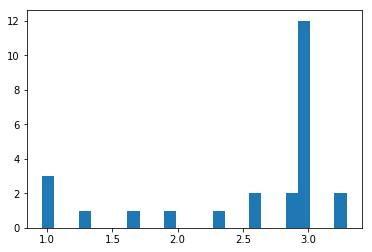

[ 2.51001344]
0.512588977814
Training epoch 156100
Iter: 156100
D loss: 3.896e-05
G_loss: -0.01343
()


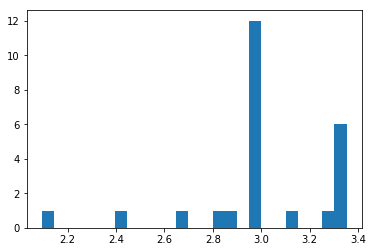

[ 2.99856614]
0.533930063248
Training epoch 156200
Iter: 156200
D loss: 4.106e-05
G_loss: -0.01365
()


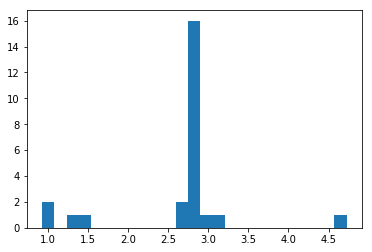

[ 2.68180438]
0.513869047165
Training epoch 156300
Iter: 156300
D loss: 3.934e-05
G_loss: -0.0135
()


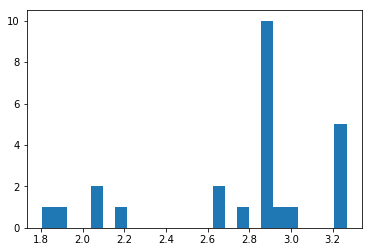

[ 2.76281317]
0.516183853149
Training epoch 156400
Iter: 156400
D loss: 2.906e-05
G_loss: -0.01358
()


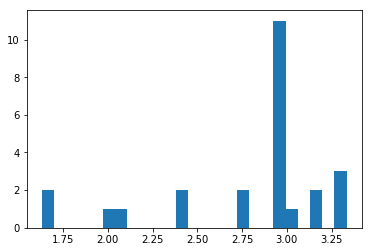

[ 2.77985118]
0.511301040649
Training epoch 156500
Iter: 156500
D loss: 3.166e-05
G_loss: -0.01308
()


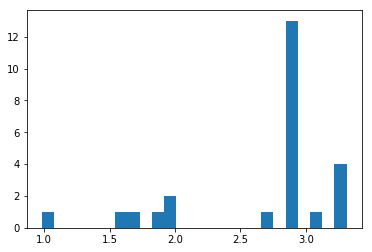

[ 2.68123404]
0.511337995529
Training epoch 156600
Iter: 156600
D loss: 3.617e-05
G_loss: -0.01299
()


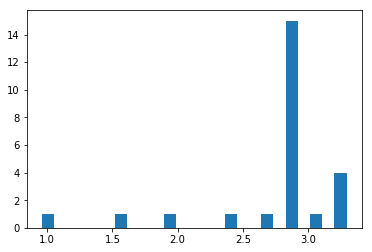

[ 2.76591799]
0.510123968124
Training epoch 156700
Iter: 156700
D loss: 4.04e-05
G_loss: -0.01344
()


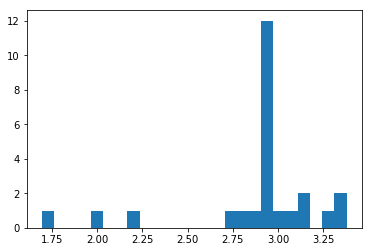

[ 2.89035532]
0.518083810806
Training epoch 156800
Iter: 156800
D loss: 3.606e-05
G_loss: -0.01364
()


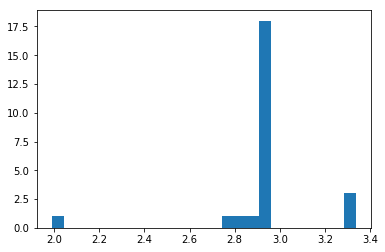

[ 2.93299115]
0.582903862
Training epoch 156900
Iter: 156900
D loss: 3.009e-05
G_loss: -0.01353
()


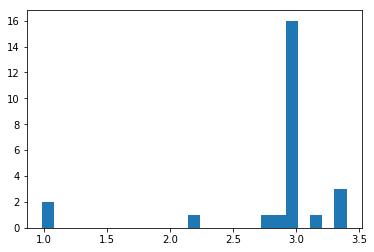

[ 2.83046532]
0.512968063354
Training epoch 157000
Iter: 157000
D loss: 3.617e-05
G_loss: -0.01296
()


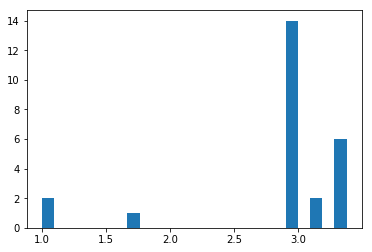

[ 2.8724864]
0.51093006134
Training epoch 157100
Iter: 157100
D loss: 2.632e-05
G_loss: -0.01381
()


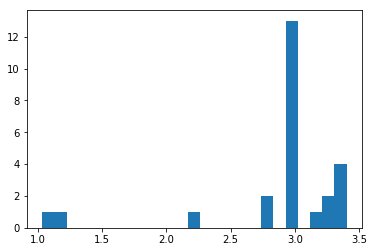

[ 2.90114391]
0.512184143066
Training epoch 157200
Iter: 157200
D loss: 3.812e-05
G_loss: -0.01333
()


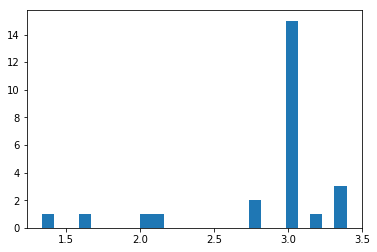

[ 2.84297427]
0.511250972748
Training epoch 157300
Iter: 157300
D loss: 4.123e-05
G_loss: -0.01295
()


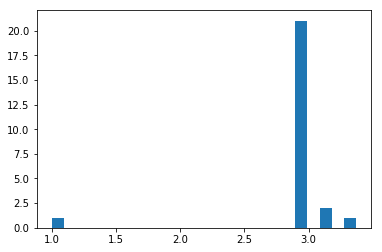

[ 2.91904366]
0.513154029846
Training epoch 157400
Iter: 157400
D loss: 2.618e-05
G_loss: -0.01369
()


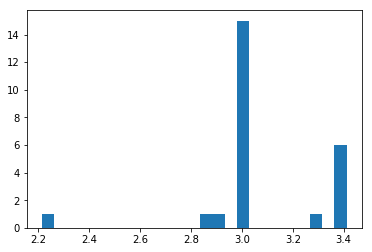

[ 3.07031337]
0.520794868469
Training epoch 157500
Iter: 157500
D loss: 3.476e-05
G_loss: -0.01288
()


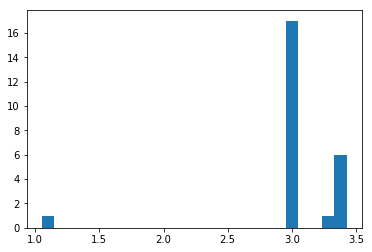

[ 3.04351758]
0.514319896698
Training epoch 157600
Iter: 157600
D loss: 3.718e-05
G_loss: -0.01363
()


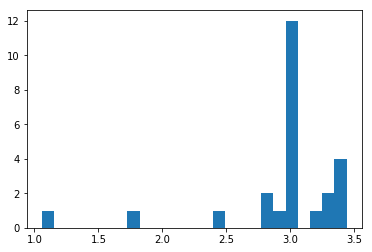

[ 2.94511022]
0.510229110718
Training epoch 157700
Iter: 157700
D loss: 2.922e-05
G_loss: -0.01323
()


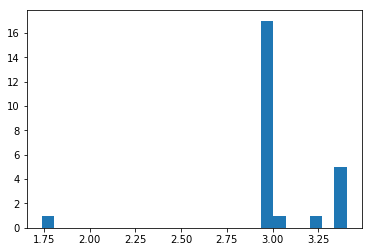

[ 3.02400941]
0.518675088882
Training epoch 157800
Iter: 157800
D loss: 3.637e-05
G_loss: -0.01153
()


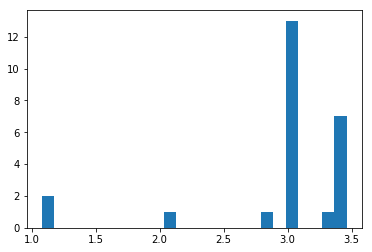

[ 2.95573274]
0.511950969696
Training epoch 157900
Iter: 157900
D loss: 4.338e-05
G_loss: -0.01134
()


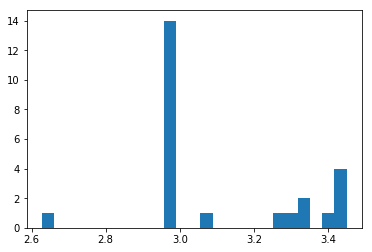

[ 3.11684427]
0.513391017914
Training epoch 158000
Iter: 158000
D loss: 3.928e-05
G_loss: -0.01363
()


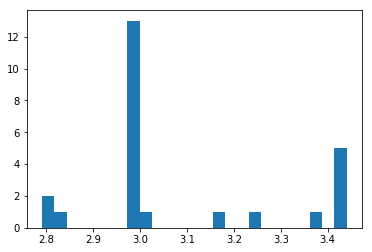

[ 3.08473206]
0.513178825378
Training epoch 158100
Iter: 158100
D loss: 3.751e-05
G_loss: -0.01277
()


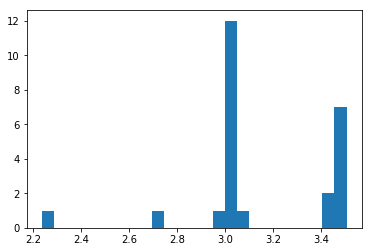

[ 3.15258581]
0.511209964752
Training epoch 158200
Iter: 158200
D loss: 3.206e-05
G_loss: -0.01349
()


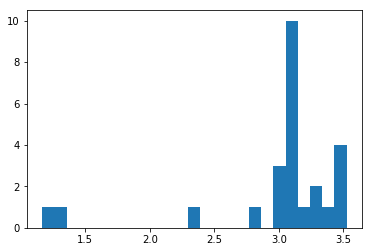

[ 2.98736754]
0.511608123779
Training epoch 158300
Iter: 158300
D loss: 4.078e-05
G_loss: -0.01381
()


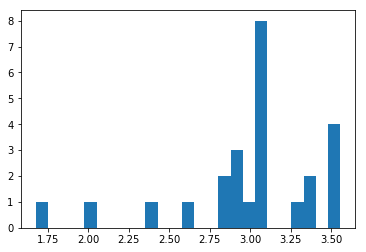

[ 2.9995461]
0.514372110367
Training epoch 158400
Iter: 158400
D loss: 3.441e-05
G_loss: -0.01285
()


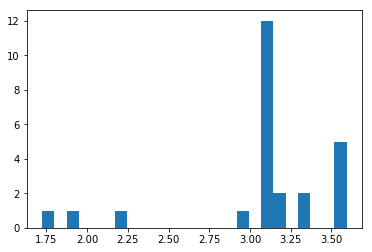

[ 3.0916738]
0.518723011017
Training epoch 158500
Iter: 158500
D loss: 3.282e-05
G_loss: -0.01357
()


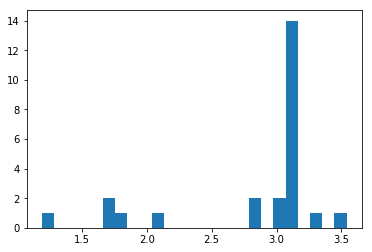

[ 2.81337287]
0.515556097031
Training epoch 158600
Iter: 158600
D loss: 3.637e-05
G_loss: -0.01282
()


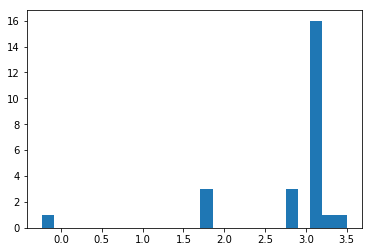

[ 2.80593025]
0.518024921417
Training epoch 158700
Iter: 158700
D loss: 3.119e-05
G_loss: -0.0131
()


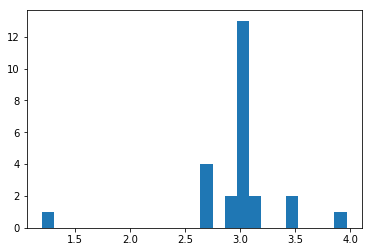

[ 2.95823171]
0.515084981918
Training epoch 158800
Iter: 158800
D loss: 2.901e-05
G_loss: -0.01362
()


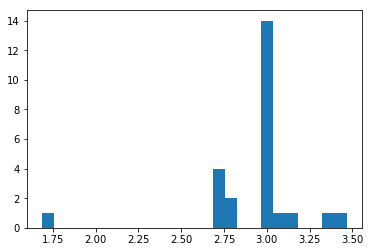

[ 2.94122209]
0.522848129272
Training epoch 158900
Iter: 158900
D loss: 3.606e-05
G_loss: -0.01373
()


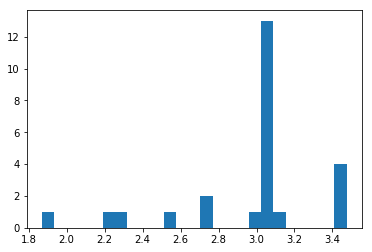

[ 2.9556101]
0.51516699791
Training epoch 159000
Iter: 159000
D loss: 3.085e-05
G_loss: -0.01326
()


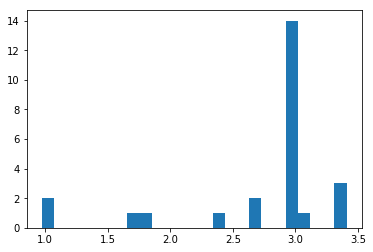

[ 2.72291019]
0.513207912445
Training epoch 159100
Iter: 159100
D loss: 4.045e-05
G_loss: -0.01115
()


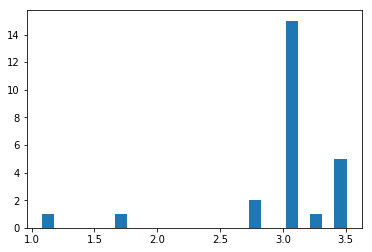

[ 3.0099304]
0.540655851364
Training epoch 159200
Iter: 159200
D loss: 3.955e-05
G_loss: -0.01367
()


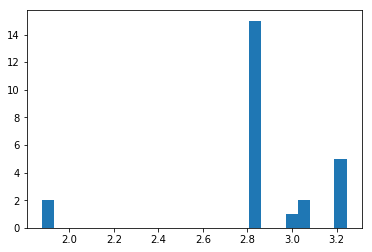

[ 2.86922578]
0.520609140396
Training epoch 159300
Iter: 159300
D loss: 3.563e-05
G_loss: -0.01361
()


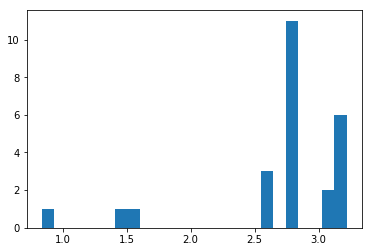

[ 2.71876824]
0.525260925293
Training epoch 159400
Iter: 159400
D loss: 3.025e-05
G_loss: -0.01336
()


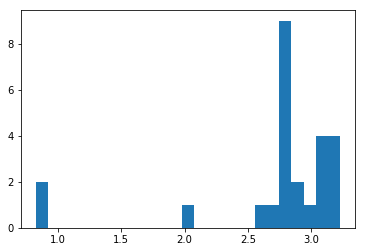

[ 2.72757935]
0.513391017914
Training epoch 159500
Iter: 159500
D loss: 3.677e-05
G_loss: -0.01378
()


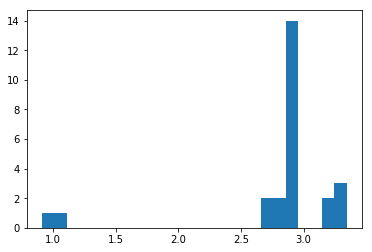

[ 2.80525891]
0.51753616333
Training epoch 159600
Iter: 159600
D loss: 3.206e-05
G_loss: -0.01356
()


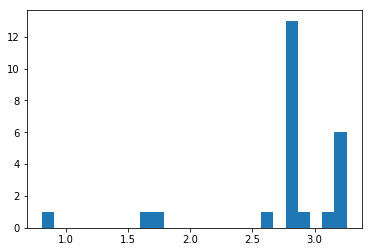

[ 2.76707485]
0.517349004745
Training epoch 159700
Iter: 159700
D loss: 3.194e-05
G_loss: -0.01368
()


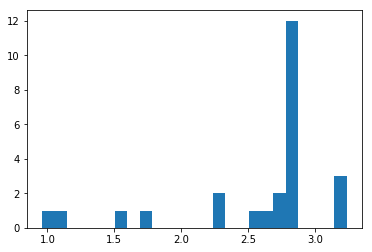

[ 2.56554204]
0.524880886078
Training epoch 159800
Iter: 159800
D loss: 3.277e-05
G_loss: -0.01361
()


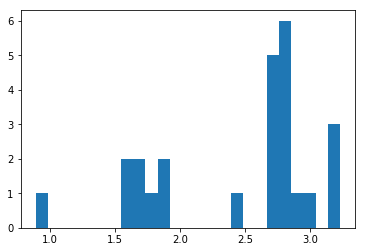

[ 2.44984328]
0.526507139206
Training epoch 159900
Iter: 159900
D loss: 3.551e-05
G_loss: -0.01292
()


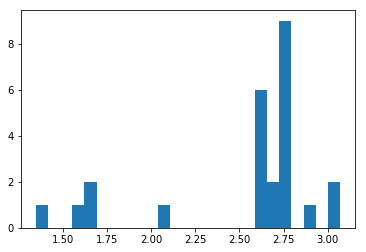

[ 2.53941084]
0.515876054764
Training epoch 160000
Iter: 160000
D loss: 3.911e-05
G_loss: -0.01359
()


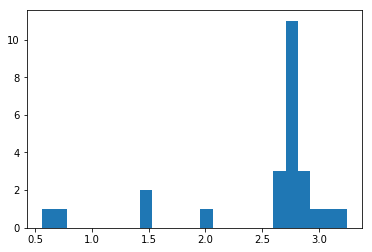

[ 2.52374975]
0.517335176468
Training epoch 160100
Iter: 160100
D loss: 3.498e-05
G_loss: -0.01307
()


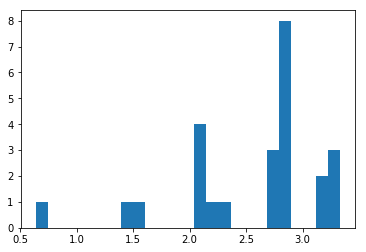

[ 2.55952319]
0.512438058853
Training epoch 160200
Iter: 160200
D loss: 3.418e-05
G_loss: -0.0134
()


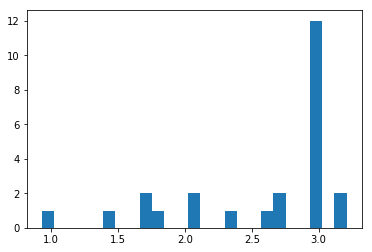

[ 2.56071649]
0.516039133072
Training epoch 160300
Iter: 160300
D loss: 3.492e-05
G_loss: -0.01369
()


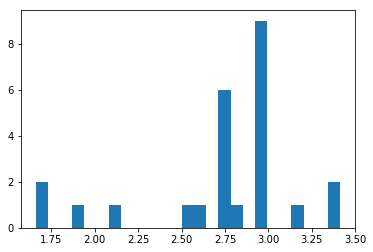

[ 2.74566005]
0.516866207123
Training epoch 160400
Iter: 160400
D loss: 3.747e-05
G_loss: -0.01257
()


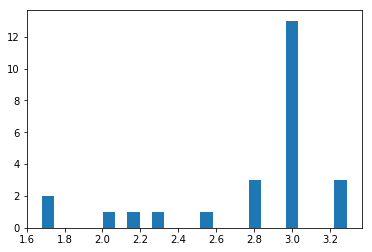

[ 2.79367674]
0.512418031693
Training epoch 160500
Iter: 160500
D loss: 3.504e-05
G_loss: -0.01417
()


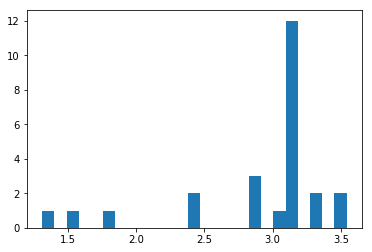

[ 2.89388505]
0.51144194603
Training epoch 160600
Iter: 160600
D loss: 3.148e-05
G_loss: -0.01336
()


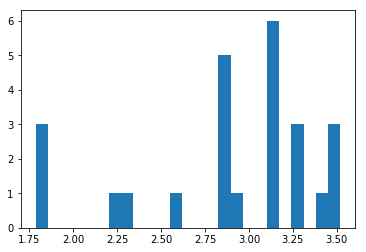

[ 2.87997254]
0.515074014664
Training epoch 160700
Iter: 160700
D loss: 2.434e-05
G_loss: -0.01397
()


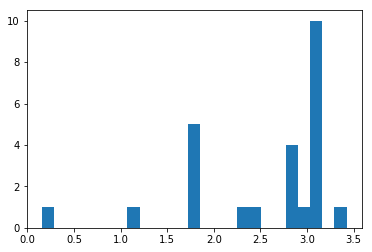

[ 2.561489]
0.512194156647
Training epoch 160800
Iter: 160800
D loss: 3.621e-05
G_loss: -0.01336
()


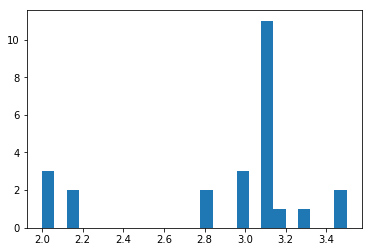

[ 2.90862915]
0.512246131897
Training epoch 160900
Iter: 160900
D loss: 3.312e-05
G_loss: -0.01322
()


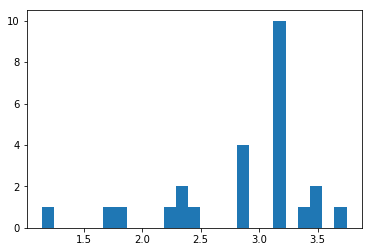

[ 2.85144073]
0.512065172195
Training epoch 161000
Iter: 161000
D loss: 3.837e-05
G_loss: -0.0128
()


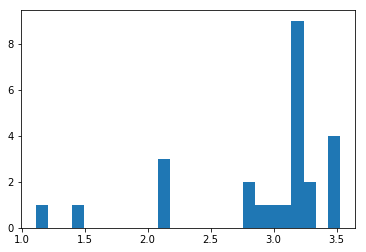

[ 2.9080662]
0.511020183563
Training epoch 161100
Iter: 161100
D loss: 3.021e-05
G_loss: -0.01379
()


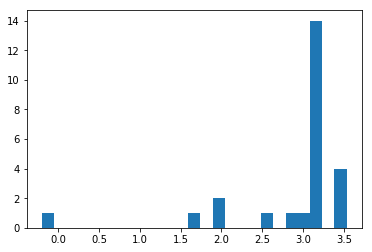

[ 2.87644885]
0.516496896744
Training epoch 161200
Iter: 161200
D loss: 3.838e-05
G_loss: -0.0135
()


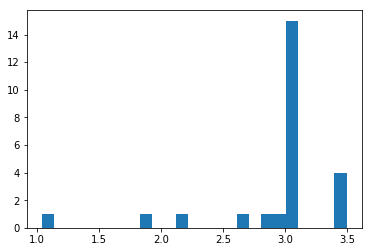

[ 2.93790521]
0.516646146774
Training epoch 161300
Iter: 161300
D loss: 4.371e-05
G_loss: -0.01356
()


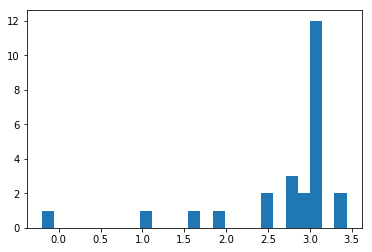

[ 2.68043597]
0.51162314415
Training epoch 161400
Iter: 161400
D loss: 3.067e-05
G_loss: -0.01353
()


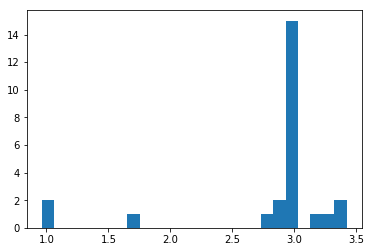

[ 2.82553563]
0.519643068314
Training epoch 161500
Iter: 161500
D loss: 3.688e-05
G_loss: -0.01368
()


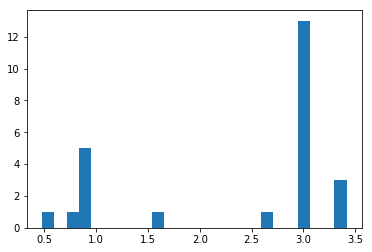

[ 2.37979575]
0.51109790802
Training epoch 161600
Iter: 161600
D loss: 2.629e-05
G_loss: -0.01349
()


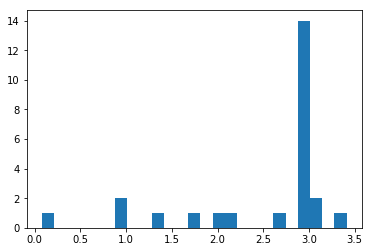

[ 2.54018746]
0.511404037476
Training epoch 161700
Iter: 161700
D loss: 3.064e-05
G_loss: -0.01237
()


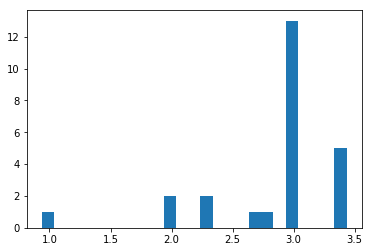

[ 2.84227649]
0.51185798645
Training epoch 161800
Iter: 161800
D loss: 3.537e-05
G_loss: -0.01285
()


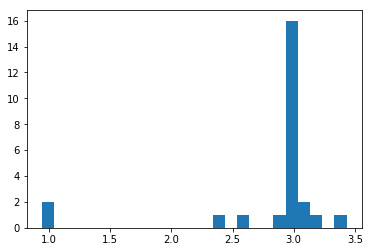

[ 2.82210989]
0.513244867325
Training epoch 161900
Iter: 161900
D loss: 3.824e-05
G_loss: -0.01356
()


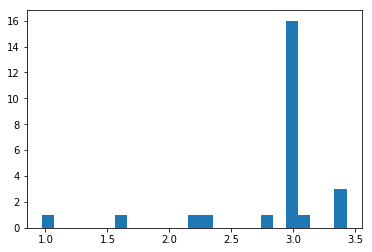

[ 2.83837991]
0.518895864487
Training epoch 162000
Iter: 162000
D loss: 3.157e-05
G_loss: -0.01236
()


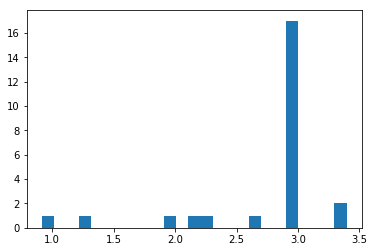

[ 2.71929467]
0.512022972107
Training epoch 162100
Iter: 162100
D loss: 3.425e-05
G_loss: -0.01349
()


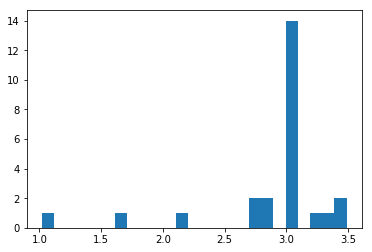

[ 2.87452601]
0.511731147766
Training epoch 162200
Iter: 162200
D loss: 3.421e-05
G_loss: -0.01359
()


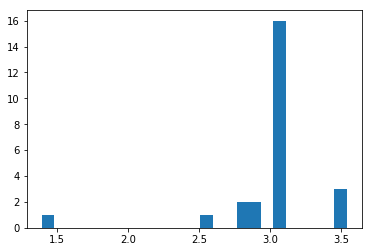

[ 3.00324954]
0.512162208557
Training epoch 162300
Iter: 162300
D loss: 3.09e-05
G_loss: -0.01162
()


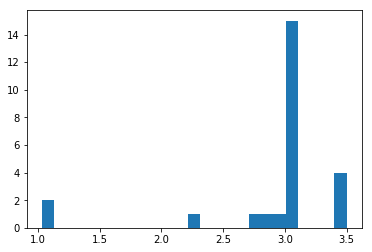

[ 2.90763654]
0.517733097076
Training epoch 162400
Iter: 162400
D loss: 3.608e-05
G_loss: -0.01246
()


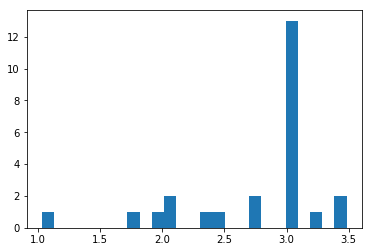

[ 2.76694557]
0.509011983871
Training epoch 162500
Iter: 162500
D loss: 3.107e-05
G_loss: -0.01338
()


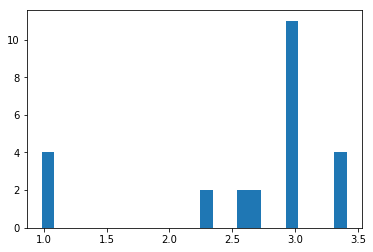

[ 2.61840053]
0.511057853699
Training epoch 162600
Iter: 162600
D loss: 3.878e-05
G_loss: -0.01361
()


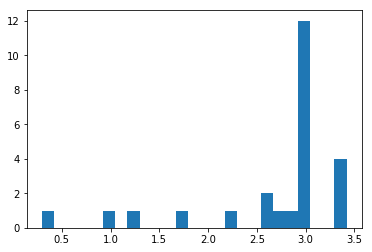

[ 2.68301106]
0.515043973923
Training epoch 162700
Iter: 162700
D loss: 3.326e-05
G_loss: -0.01354
()


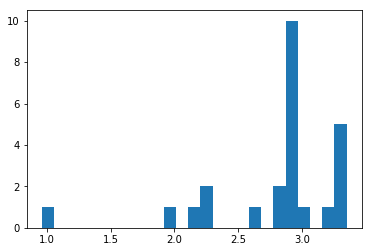

[ 2.81218145]
0.520421028137
Training epoch 162800
Iter: 162800
D loss: 2.355e-05
G_loss: -0.01343
()


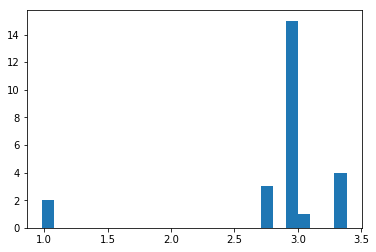

[ 2.85805799]
0.524294137955
Training epoch 162900
Iter: 162900
D loss: 3.251e-05
G_loss: -0.01356
()


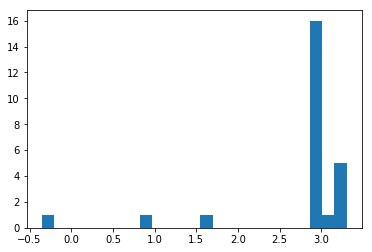

[ 2.73908531]
0.52259016037
Training epoch 163000
Iter: 163000
D loss: 3.377e-05
G_loss: -0.01353
()


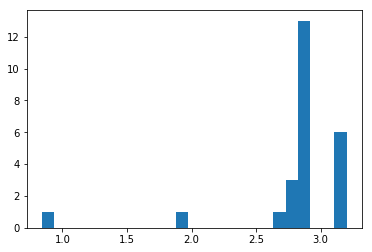

[ 2.79785544]
0.511425971985
Training epoch 163100
Iter: 163100
D loss: 2.765e-05
G_loss: -0.01407
()


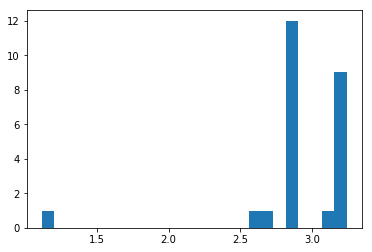

[ 2.89920618]
0.512231111526
Training epoch 163200
Iter: 163200
D loss: 2.899e-05
G_loss: -0.01397
()


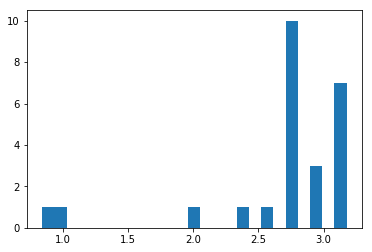

[ 2.69396268]
0.513605117798
Training epoch 163300
Iter: 163300
D loss: 3.228e-05
G_loss: -0.01354
()


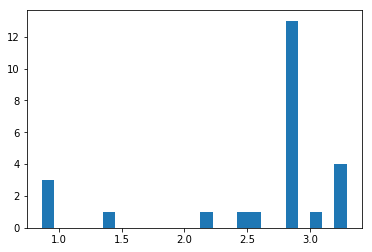

[ 2.58206951]
0.513095855713
Training epoch 163400
Iter: 163400
D loss: 4.221e-05
G_loss: -0.01386
()


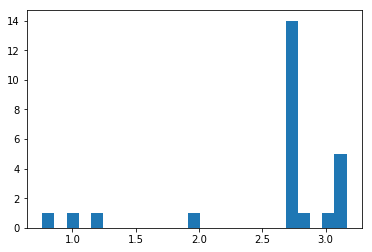

[ 2.5962808]
0.514430046082
Training epoch 163500
Iter: 163500
D loss: 3.369e-05
G_loss: -0.01256
()


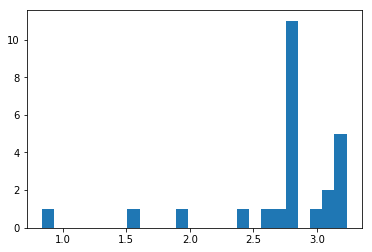

[ 2.73347229]
0.517215013504
Training epoch 163600
Iter: 163600
D loss: 3.953e-05
G_loss: -0.0137
()


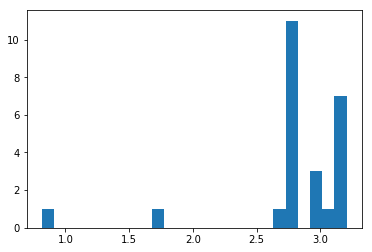

[ 2.8115681]
0.514759063721
Training epoch 163700
Iter: 163700
D loss: 3.473e-05
G_loss: -0.01344
()


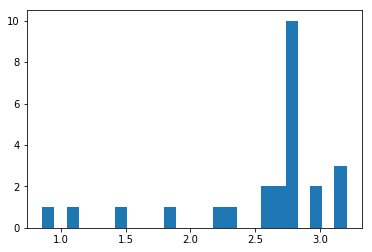

[ 2.56221957]
0.511658906937
Training epoch 163800
Iter: 163800
D loss: 3.594e-05
G_loss: -0.01361
()


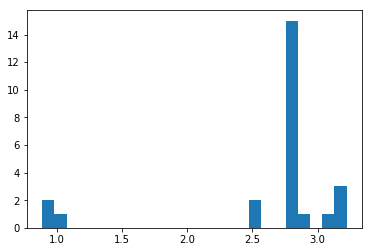

[ 2.64333334]
0.514101982117
Training epoch 163900
Iter: 163900
D loss: 3.631e-05
G_loss: -0.013
()


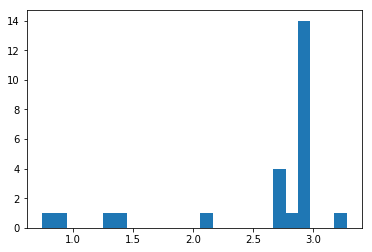

[ 2.54951883]
0.516304969788
Training epoch 164000
Iter: 164000
D loss: 2.818e-05
G_loss: -0.01394
()


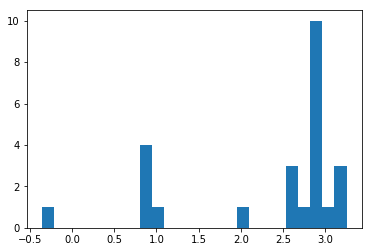

[ 2.333887]
0.521171808243
Training epoch 164100
Iter: 164100
D loss: 3.261e-05
G_loss: -0.01371
()


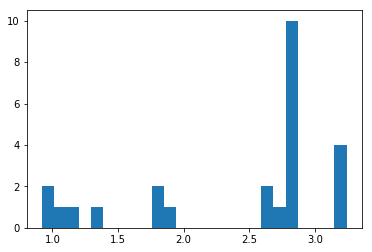

[ 2.41617691]
0.514076948166
Training epoch 164200
Iter: 164200
D loss: 2.734e-05
G_loss: -0.01376
()


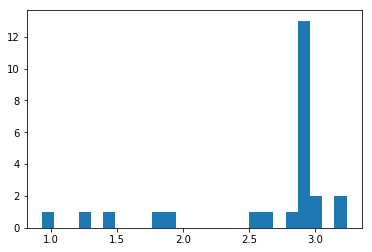

[ 2.60227695]
0.527032852173
Training epoch 164300
Iter: 164300
D loss: 3.798e-05
G_loss: -0.0143
()


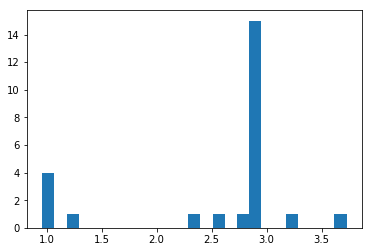

[ 2.52678057]
0.514413833618
Training epoch 164400
Iter: 164400
D loss: 3.478e-05
G_loss: -0.01388
()


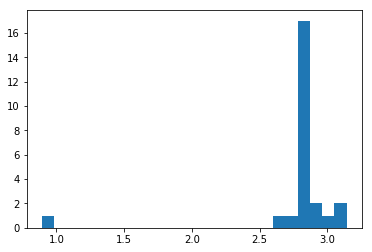

[ 2.78297684]
0.60756278038
Training epoch 164500
Iter: 164500
D loss: 3.228e-05
G_loss: -0.01182
()


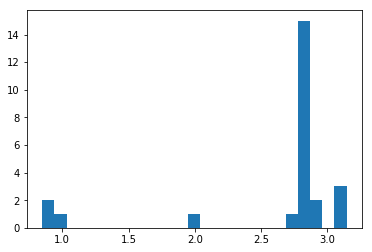

[ 2.58522429]
0.51252579689
Training epoch 164600
Iter: 164600
D loss: 2.139e-05
G_loss: -0.01344
()


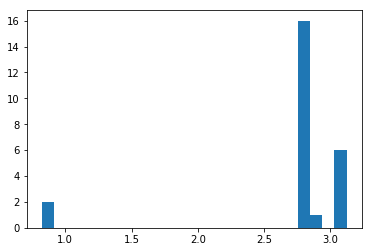

[ 2.69954867]
0.513538122177
Training epoch 164700
Iter: 164700
D loss: 3.258e-05
G_loss: -0.01063
()


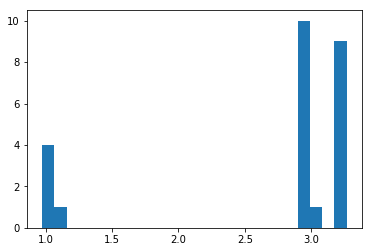

[ 2.66092853]
0.517745018005
Training epoch 164800
Iter: 164800
D loss: 2.59e-05
G_loss: -0.01386
()


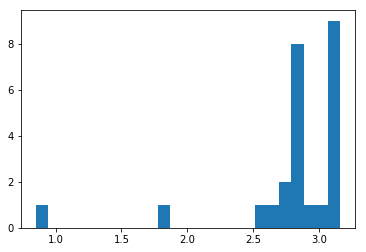

[ 2.79940386]
0.513934135437
Training epoch 164900
Iter: 164900
D loss: 3.92e-05
G_loss: -0.01377
()


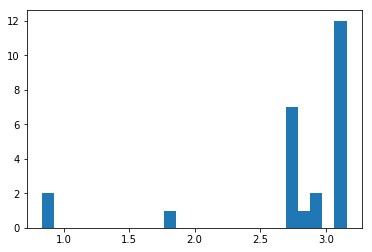

[ 2.77528172]
0.526217937469
Training epoch 165000
Iter: 165000
D loss: 4.114e-05
G_loss: -0.0146
()


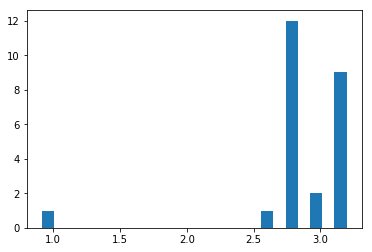

[ 2.86899833]
0.512076854706
Training epoch 165100
Iter: 165100
D loss: 3.023e-05
G_loss: -0.01418
()


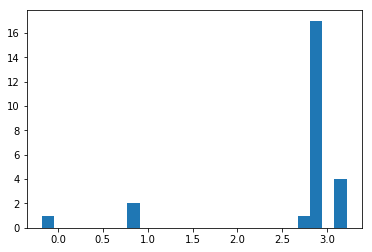

[ 2.61598965]
0.514055967331
Training epoch 165200
Iter: 165200
D loss: 4.139e-05
G_loss: -0.01358
()


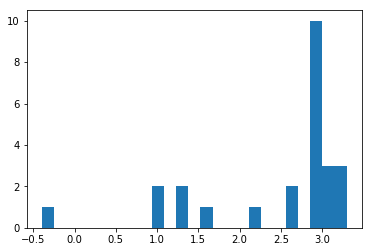

[ 2.44685273]
0.512870073318
Training epoch 165300
Iter: 165300
D loss: 3.648e-05
G_loss: -0.01389
()


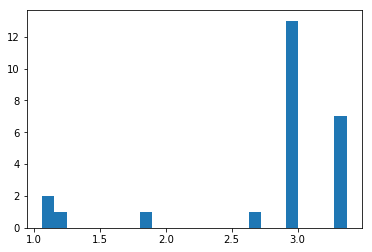

[ 2.79198271]
0.516485929489
Training epoch 165400
Iter: 165400
D loss: 3.045e-05
G_loss: -0.01386
()


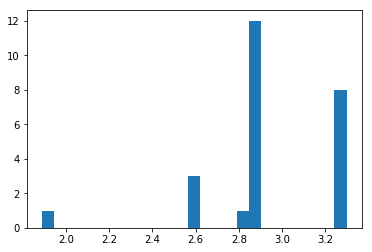

[ 2.94685181]
0.516654014587
Training epoch 165500
Iter: 165500
D loss: 4.347e-05
G_loss: -0.01252
()


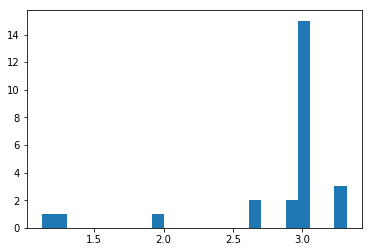

[ 2.79572014]
0.515326023102
Training epoch 165600
Iter: 165600
D loss: 3.692e-05
G_loss: -0.01334
()


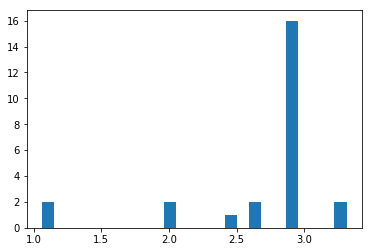

[ 2.70239772]
0.517956972122
Training epoch 165700
Iter: 165700
D loss: 2.803e-05
G_loss: -0.01366
()


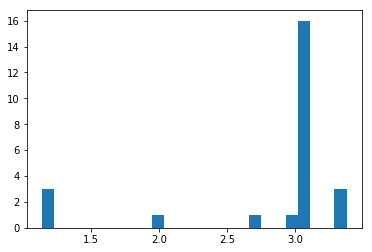

[ 2.78852269]
0.511563062668
Training epoch 165800
Iter: 165800
D loss: 2.937e-05
G_loss: -0.01255
()


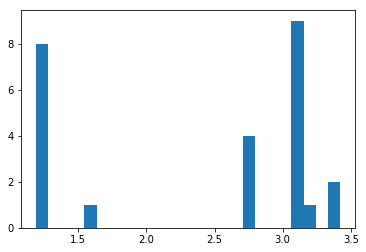

[ 2.39396415]
0.511021137238
Training epoch 165900
Iter: 165900
D loss: 3.032e-05
G_loss: -0.01369
()


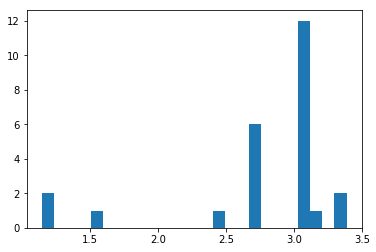

[ 2.77555412]
0.511476993561
Training epoch 166000
Iter: 166000
D loss: 3.626e-05
G_loss: -0.01313
()


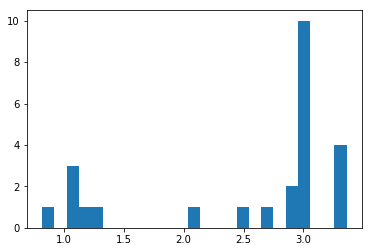

[ 2.5336695]
0.511923074722
Training epoch 166100
Iter: 166100
D loss: 3.879e-05
G_loss: -0.01321
()


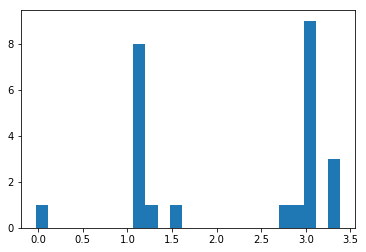

[ 2.19813807]
0.517325162888
Training epoch 166200
Iter: 166200
D loss: 3.756e-05
G_loss: -0.01338
()


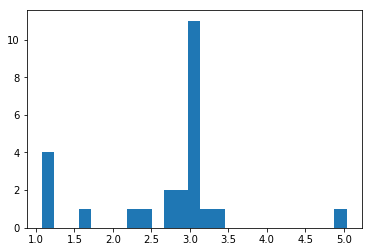

[ 2.67444467]
0.52086687088
Training epoch 166300
Iter: 166300
D loss: 3.037e-05
G_loss: -0.01353
()


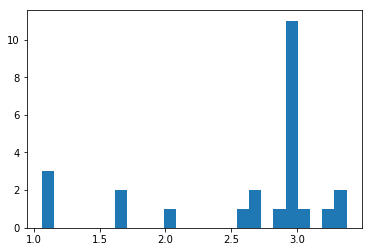

[ 2.61959238]
0.511371135712
Training epoch 166400
Iter: 166400
D loss: 4.037e-05
G_loss: -0.01335
()


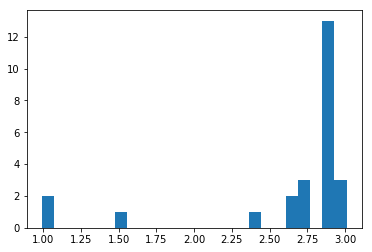

[ 2.65232936]
0.511849164963
Training epoch 166500
Iter: 166500
D loss: 3.043e-05
G_loss: -0.01367
()


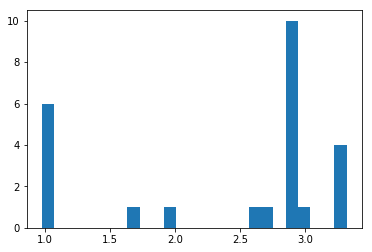

[ 2.40863057]
0.517261981964
Training epoch 166600
Iter: 166600
D loss: 3.396e-05
G_loss: -0.01318
()


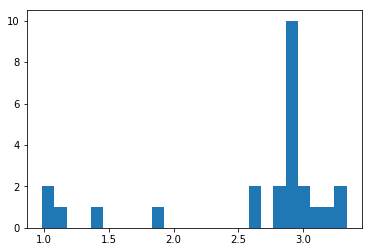

[ 2.6218276]
0.513429880142
Training epoch 166700
Iter: 166700
D loss: 2.895e-05
G_loss: -0.01256
()


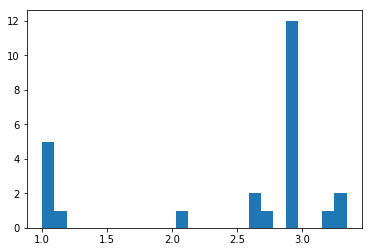

[ 2.45908554]
0.521548032761
Training epoch 166800
Iter: 166800
D loss: 3.804e-05
G_loss: -0.0135
()


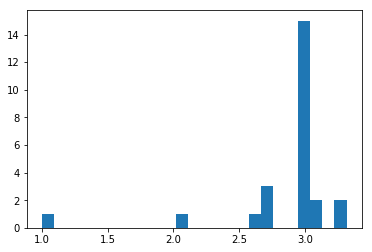

[ 2.83434135]
0.518325090408
Training epoch 166900
Iter: 166900
D loss: 4.067e-05
G_loss: -0.009816
()


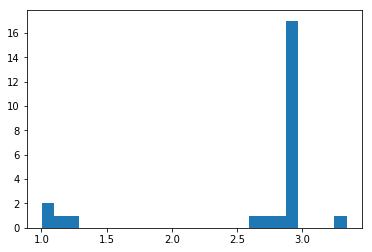

[ 2.64460265]
0.513059139252
Training epoch 167000
Iter: 167000
D loss: 3.514e-05
G_loss: -0.01375
()


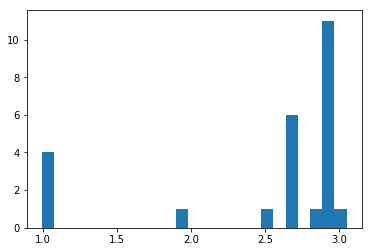

[ 2.49996369]
0.512688875198
Training epoch 167100
Iter: 167100
D loss: 3.307e-05
G_loss: -0.01278
()


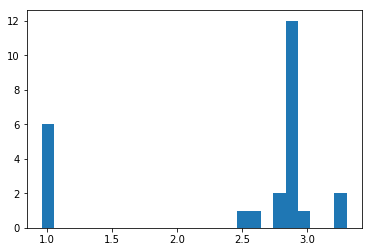

[ 2.43503678]
0.521255016327
Training epoch 167200
Iter: 167200
D loss: 3.586e-05
G_loss: -0.01352
()


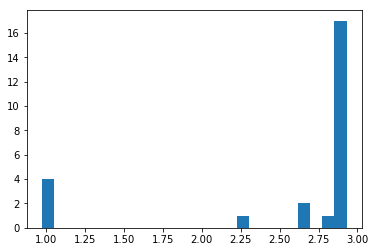

[ 2.55671393]
0.513256072998
Training epoch 167300
Iter: 167300
D loss: 3.428e-05
G_loss: -0.0115
()


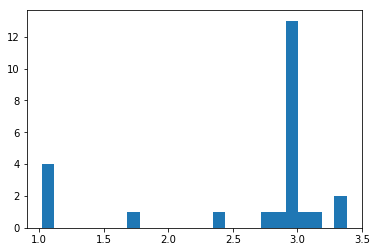

[ 2.61134489]
0.513188123703
Training epoch 167400
Iter: 167400
D loss: 3.677e-05
G_loss: -0.01384
()


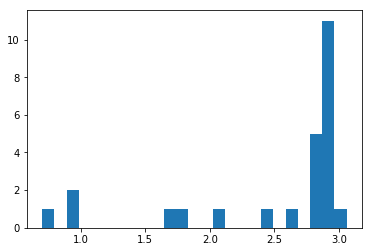

[ 2.48985159]
0.512042999268
Training epoch 167500
Iter: 167500
D loss: 2.933e-05
G_loss: -0.01382
()


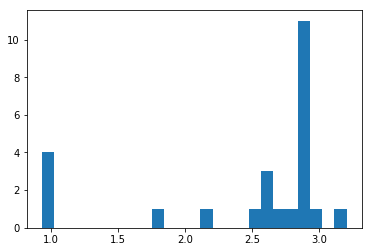

[ 2.46865808]
0.512774944305
Training epoch 167600
Iter: 167600
D loss: 3.122e-05
G_loss: -0.01296
()


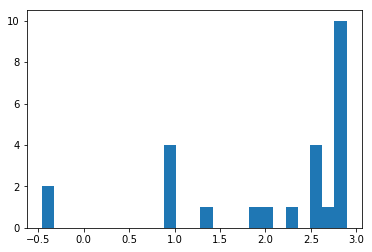

[ 2.0858318]
0.530161142349
Training epoch 167700
Iter: 167700
D loss: 3.65e-05
G_loss: -0.01373
()


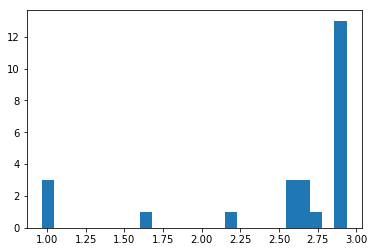

[ 2.53108382]
0.511881828308
Training epoch 167800
Iter: 167800
D loss: 2.972e-05
G_loss: -0.01319
()


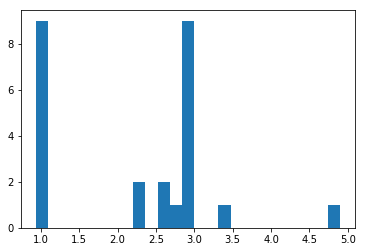

[ 2.21640486]
0.52178812027
Training epoch 167900
Iter: 167900
D loss: 2.916e-05
G_loss: -0.01347
()


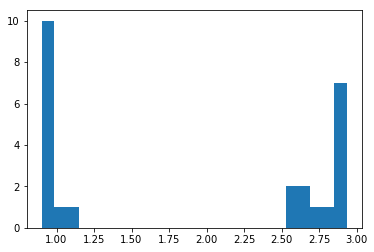

[ 1.92390864]
0.515866994858
Training epoch 168000
Iter: 168000
D loss: 3.58e-05
G_loss: -0.01312
()


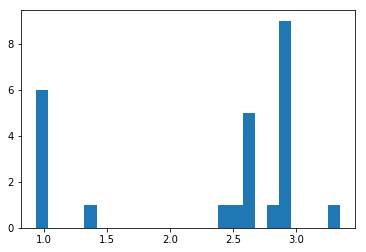

[ 2.30172751]
0.51099896431
Training epoch 168100
Iter: 168100
D loss: 4.104e-05
G_loss: -0.01356
()


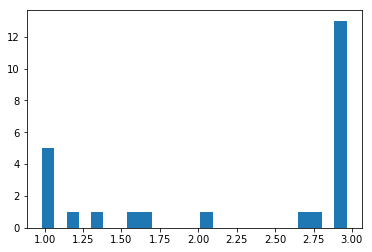

[ 2.2766959]
0.535001039505
Training epoch 168200
Iter: 168200
D loss: 3.337e-05
G_loss: -0.01316
()


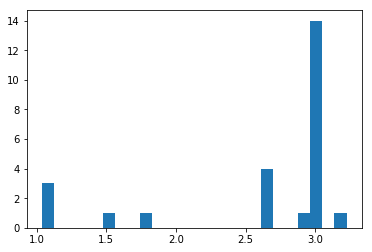

[ 2.60656872]
0.51039814949
Training epoch 168300
Iter: 168300
D loss: 3.777e-05
G_loss: -0.01361
()


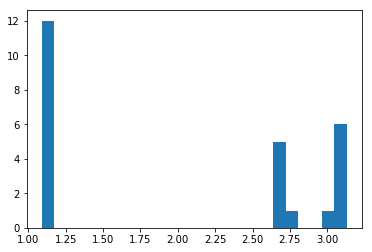

[ 2.03561611]
0.523025989532
Training epoch 168400
Iter: 168400
D loss: 3.199e-05
G_loss: -0.01327
()


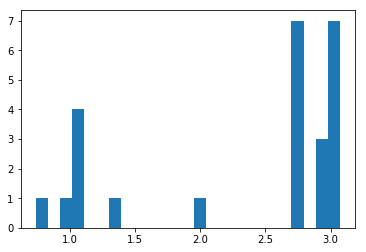

[ 2.3576875]
0.515086889267
Training epoch 168500
Iter: 168500
D loss: 4.214e-05
G_loss: -0.01353
()


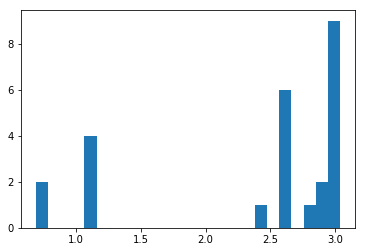

[ 2.39832219]
0.512432813644
Training epoch 168600
Iter: 168600
D loss: 3.898e-05
G_loss: -0.01389
()


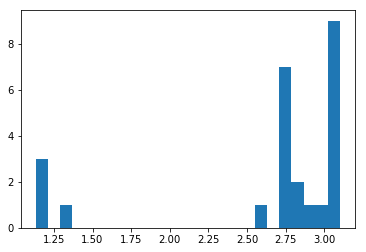

[ 2.63809388]
0.518797874451
Training epoch 168700
Iter: 168700
D loss: 4.014e-05
G_loss: -0.01379
()


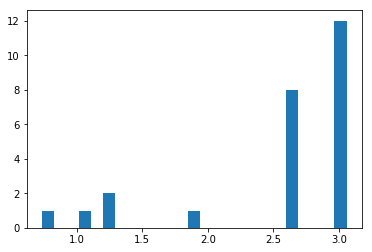

[ 2.56497433]
0.523772954941
Training epoch 168800
Iter: 168800
D loss: 4.167e-05
G_loss: -0.0137
()


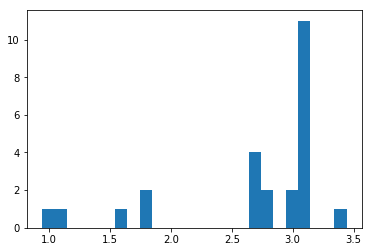

[ 2.66239991]
0.511197090149
Training epoch 168900
Iter: 168900
D loss: 2.539e-05
G_loss: -0.01397
()


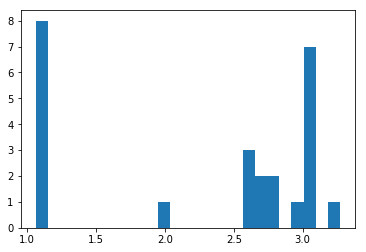

[ 2.2710231]
0.512892961502
Training epoch 169000
Iter: 169000
D loss: 3.791e-05
G_loss: -0.01363
()


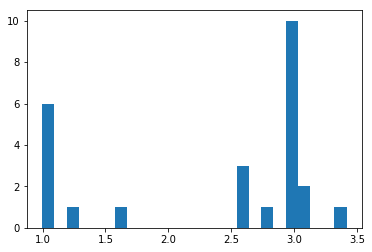

[ 2.38975634]
0.519773006439
Training epoch 169100
Iter: 169100
D loss: 4.262e-05
G_loss: -0.01296
()


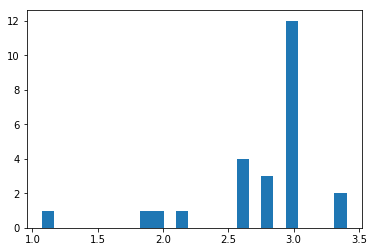

[ 2.75038851]
0.511246919632
Training epoch 169200
Iter: 169200
D loss: 2.914e-05
G_loss: -0.01399
()


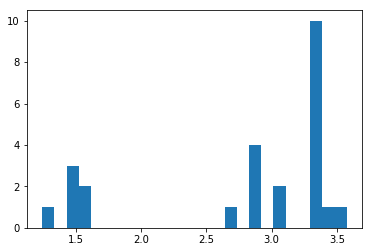

[ 2.79930965]
0.512159109116
Training epoch 169300
Iter: 169300
D loss: 2.871e-05
G_loss: -0.01383
()


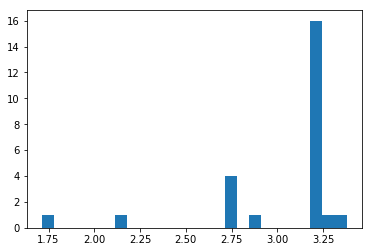

[ 3.03381172]
0.51797914505
Training epoch 169400
Iter: 169400
D loss: 3.108e-05
G_loss: -0.01378
()


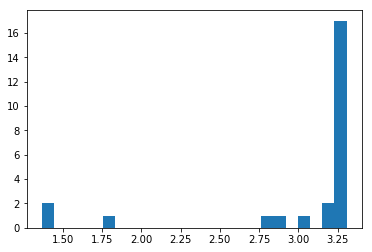

[ 3.03204036]
0.514795064926
Training epoch 169500
Iter: 169500
D loss: 3.057e-05
G_loss: -0.01202
()


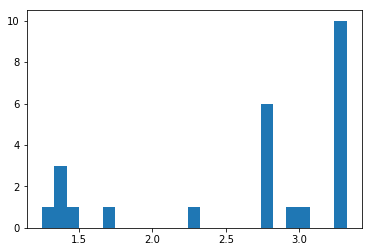

[ 2.66772961]
0.523608922958
Training epoch 169600
Iter: 169600
D loss: 3.154e-05
G_loss: -0.01358
()


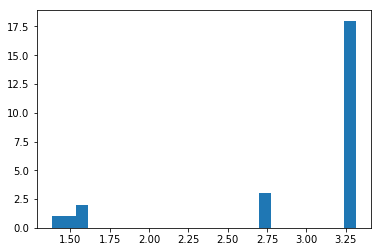

[ 2.9566403]
0.516039848328
Training epoch 169700
Iter: 169700
D loss: 2.924e-05
G_loss: -0.01395
()


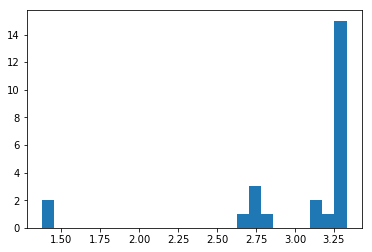

[ 3.02952443]
0.519704818726
Training epoch 169800
Iter: 169800
D loss: 3.061e-05
G_loss: -0.0137
()


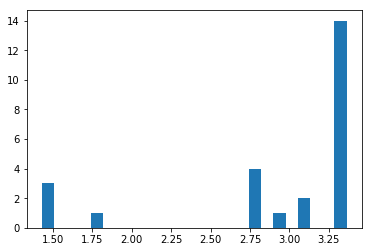

[ 2.93518543]
0.524981975555
Training epoch 169900
Iter: 169900
D loss: 3.141e-05
G_loss: -0.01372
()


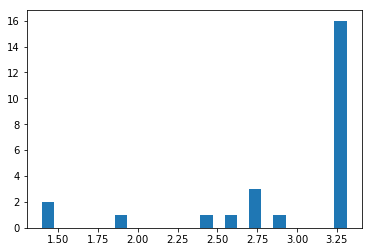

[ 2.95011713]
0.513351917267
Training epoch 170000
Iter: 170000
D loss: 4.08e-05
G_loss: -0.01254
()


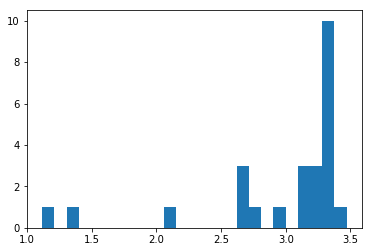

[ 2.96226431]
0.516239881516
Training epoch 170100
Iter: 170100
D loss: 3.183e-05
G_loss: -0.01335
()


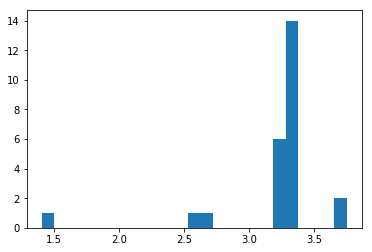

[ 3.18633051]
0.518263101578
Training epoch 170200
Iter: 170200
D loss: 3.512e-05
G_loss: -0.01374
()


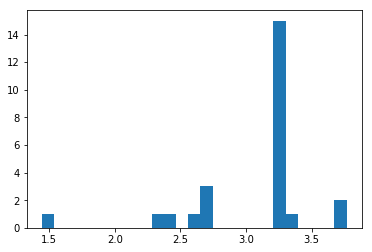

[ 3.08725872]
0.5114569664
Training epoch 170300
Iter: 170300
D loss: 3.221e-05
G_loss: -0.01307
()


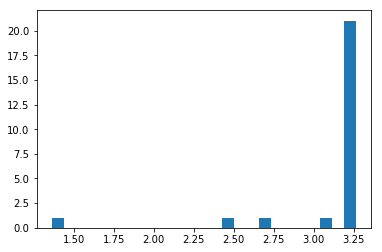

[ 3.12595647]
0.520770072937
Training epoch 170400
Iter: 170400
D loss: 3.487e-05
G_loss: -0.01377
()


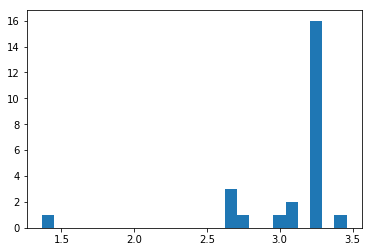

[ 3.08686584]
0.605892896652
Training epoch 170500
Iter: 170500
D loss: 3.108e-05
G_loss: -0.01411
()


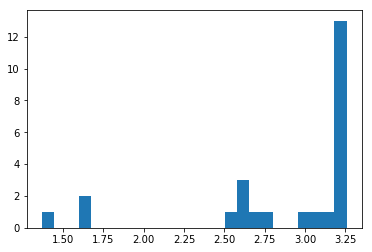

[ 2.88109154]
0.514334917068
Training epoch 170600
Iter: 170600
D loss: 2.772e-05
G_loss: -0.01405
()


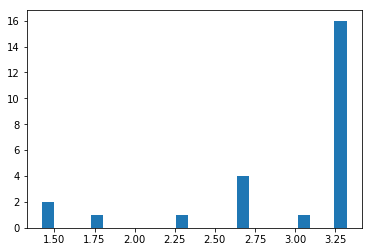

[ 2.95164232]
0.52264714241
Training epoch 170700
Iter: 170700
D loss: 1.634e-05
G_loss: -0.01409
()


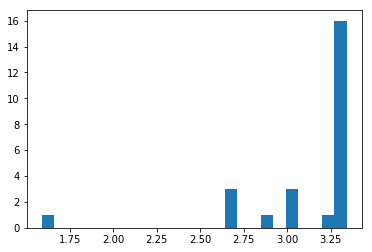

[ 3.13373668]
0.514075994492
Training epoch 170800
Iter: 170800
D loss: 3.278e-05
G_loss: -0.01326
()


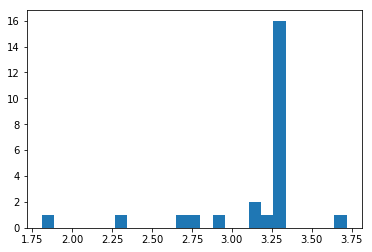

[ 3.13448337]
0.511120080948
Training epoch 170900
Iter: 170900
D loss: 3.211e-05
G_loss: -0.01414
()


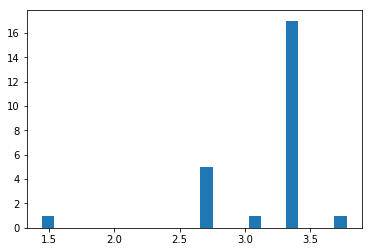

[ 3.14555109]
0.514467000961
Training epoch 171000
Iter: 171000
D loss: 3.054e-05
G_loss: -0.01235
()


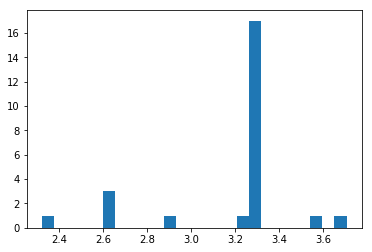

[ 3.17921576]
0.513047933578
Training epoch 171100
Iter: 171100
D loss: 4.665e-05
G_loss: -0.01374
()


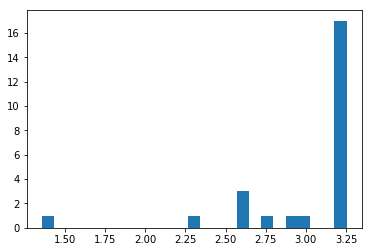

[ 3.01956614]
0.516622066498
Training epoch 171200
Iter: 171200
D loss: 3.483e-05
G_loss: -0.01468
()


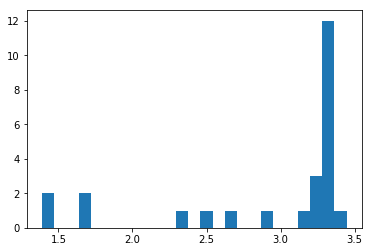

[ 2.89244088]
0.514216899872
Training epoch 171300
Iter: 171300
D loss: 2.824e-05
G_loss: -0.01183
()


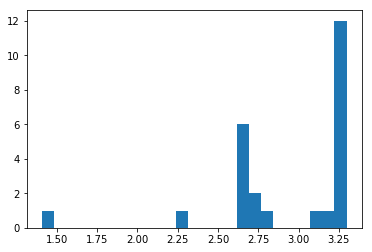

[ 2.94834657]
0.522190093994
Training epoch 171400
Iter: 171400
D loss: 4.51e-05
G_loss: -0.0129
()


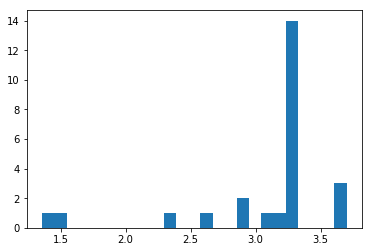

[ 3.05616127]
0.51509809494
Training epoch 171500
Iter: 171500
D loss: 3.532e-05
G_loss: -0.0139
()


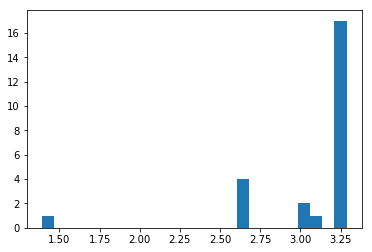

[ 3.07849941]
0.510292053223
Training epoch 171600
Iter: 171600
D loss: 4.596e-05
G_loss: -0.01314
()


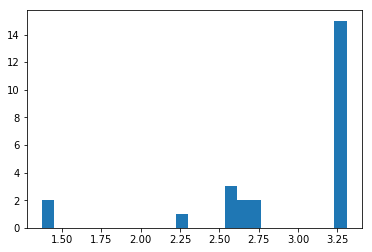

[ 2.90438085]
0.511260986328
Training epoch 171700
Iter: 171700
D loss: 3.147e-05
G_loss: -0.01262
()


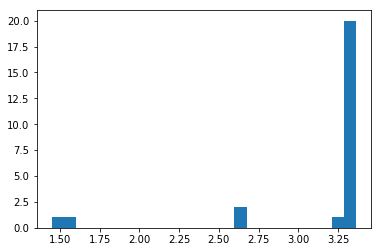

[ 3.11212806]
0.523015022278
Training epoch 171800
Iter: 171800
D loss: 3.672e-05
G_loss: -0.01385
()


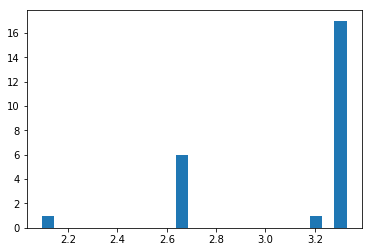

[ 3.10804122]
0.516834974289
Training epoch 171900
Iter: 171900
D loss: 3.712e-05
G_loss: -0.01386
()


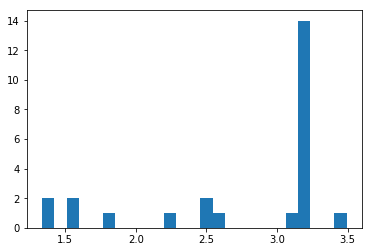

[ 2.75840204]
0.531101942062
Training epoch 172000
Iter: 172000
D loss: 3.132e-05
G_loss: -0.01457
()


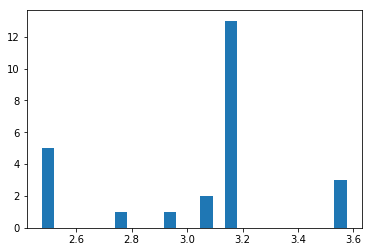

[ 3.03702003]
0.515778064728
Training epoch 172100
Iter: 172100
D loss: 4.042e-05
G_loss: -0.01346
()


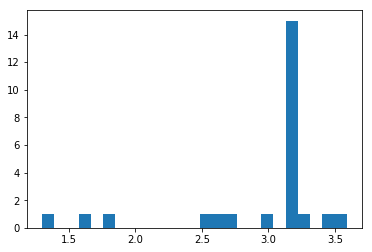

[ 2.94187161]
0.523449897766
Training epoch 172200
Iter: 172200
D loss: 2.886e-05
G_loss: -0.01446
()


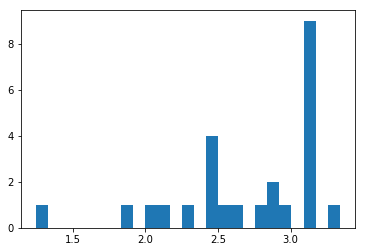

[ 2.70680428]
0.512836933136
Training epoch 172300
Iter: 172300
D loss: 3.477e-05
G_loss: -0.01258
()


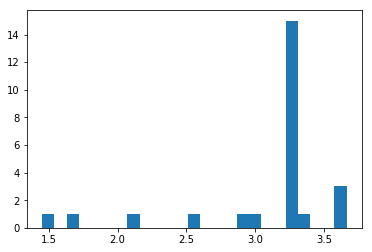

[ 3.05195364]
0.513951063156
Training epoch 172400
Iter: 172400
D loss: 3.133e-05
G_loss: -0.01399
()


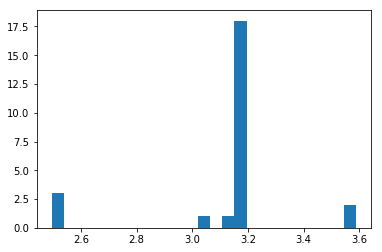

[ 3.10925189]
0.512427806854
Training epoch 172500
Iter: 172500
D loss: 2.876e-05
G_loss: -0.014
()


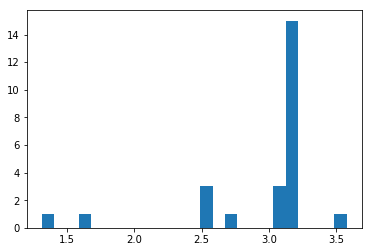

[ 2.96126239]
0.514183044434
Training epoch 172600
Iter: 172600
D loss: 3.227e-05
G_loss: -0.01355
()


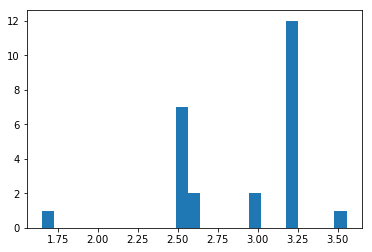

[ 2.91526305]
0.51401591301
Training epoch 172700
Iter: 172700
D loss: 3.956e-05
G_loss: -0.01337
()


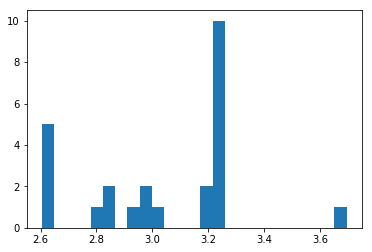

[ 3.04105233]
0.5409719944
Training epoch 172800
Iter: 172800
D loss: 3.491e-05
G_loss: -0.01374
()


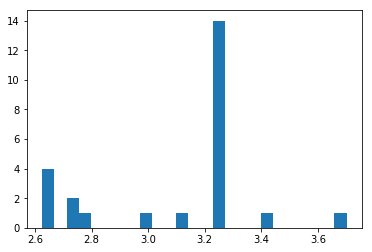

[ 3.10555675]
0.51620388031
Training epoch 172900
Iter: 172900
D loss: 2.986e-05
G_loss: -0.01364
()


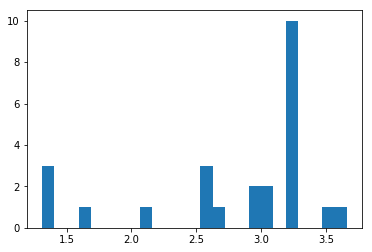

[ 2.78597358]
0.511041164398
Training epoch 173000
Iter: 173000
D loss: 3.57e-05
G_loss: -0.01243
()


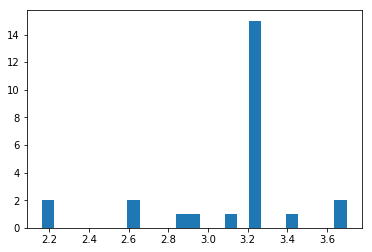

[ 3.12219646]
0.515819072723
Training epoch 173100
Iter: 173100
D loss: 3.846e-05
G_loss: -0.01288
()


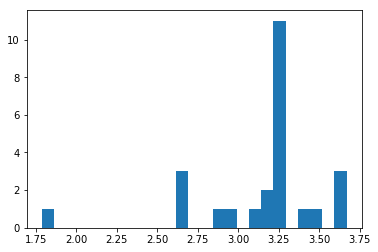

[ 3.13447875]
0.519381999969
Training epoch 173200
Iter: 173200
D loss: 3.235e-05
G_loss: -0.01166
()


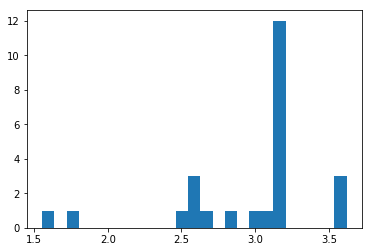

[ 2.96625321]
0.519585132599
Training epoch 173300
Iter: 173300
D loss: 2.947e-05
G_loss: -0.01353
()


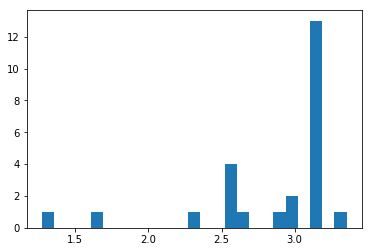

[ 2.84890658]
0.524772882462
Training epoch 173400
Iter: 173400
D loss: 2.837e-05
G_loss: -0.01305
()


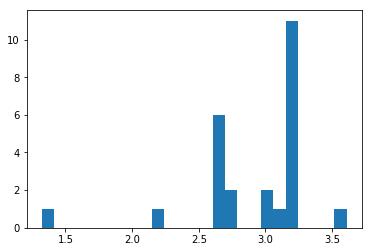

[ 2.9154945]
0.513094186783
Training epoch 173500
Iter: 173500
D loss: 3.448e-05
G_loss: -0.01393
()


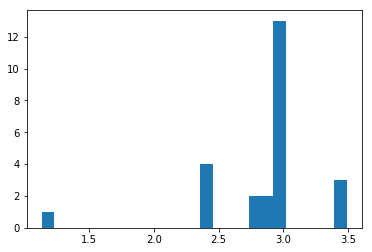

[ 2.86633519]
0.513118982315
Training epoch 173600
Iter: 173600
D loss: 2.837e-05
G_loss: -0.01385
()


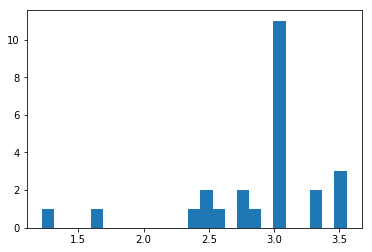

[ 2.88636345]
0.513248920441
Training epoch 173700
Iter: 173700
D loss: 3.451e-05
G_loss: -0.01332
()


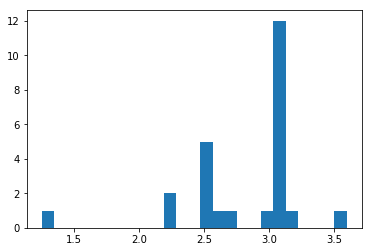

[ 2.82586413]
0.511140823364
Training epoch 173800
Iter: 173800
D loss: 3.606e-05
G_loss: -0.01398
()


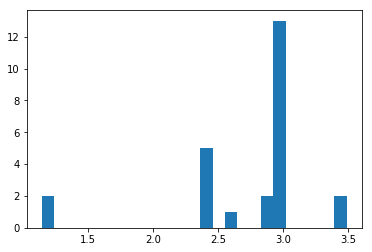

[ 2.73664937]
0.513145923615
Training epoch 173900
Iter: 173900
D loss: 3.06e-05
G_loss: -0.01275
()


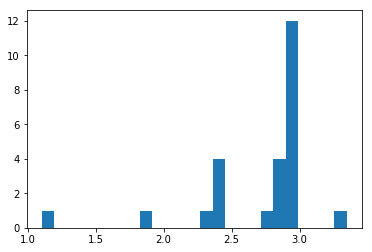

[ 2.70530376]
0.515626907349
Training epoch 174000
Iter: 174000
D loss: 2.548e-05
G_loss: -0.01252
()


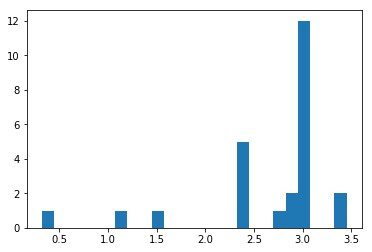

[ 2.63513609]
0.511579036713
Training epoch 174100
Iter: 174100
D loss: 2.996e-05
G_loss: -0.01382
()


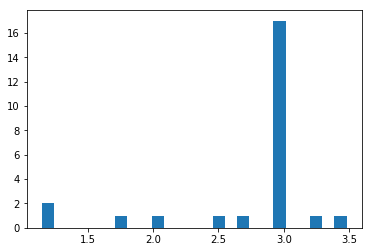

[ 2.75982924]
0.521479845047
Training epoch 174200
Iter: 174200
D loss: 2.933e-05
G_loss: -0.01407
()


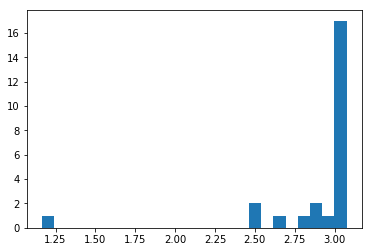

[ 2.85800425]
0.516716957092
Training epoch 174300
Iter: 174300
D loss: 3.232e-05
G_loss: -0.0126
()


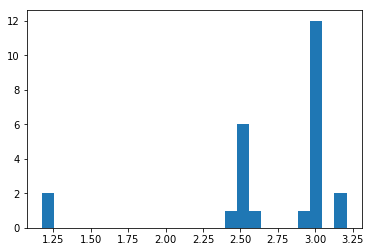

[ 2.70537506]
0.510902881622
Training epoch 174400
Iter: 174400
D loss: 3.895e-05
G_loss: -0.01383
()


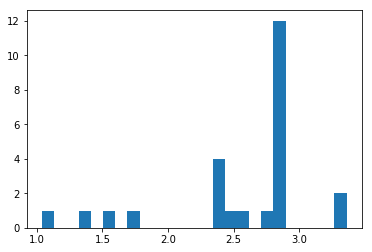

[ 2.55529051]
0.511126995087
Training epoch 174500
Iter: 174500
D loss: 3.311e-05
G_loss: -0.01384
()


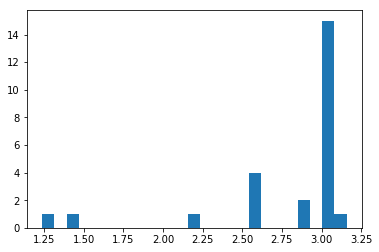

[ 2.78819175]
0.511132955551
Training epoch 174600
Iter: 174600
D loss: 3.655e-05
G_loss: -0.01388
()


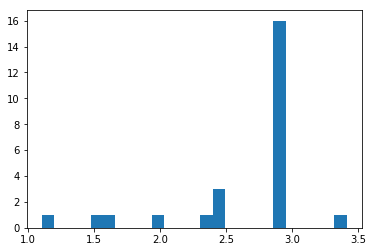

[ 2.64580728]
0.513305902481
Training epoch 174700
Iter: 174700
D loss: 3.579e-05
G_loss: -0.01322
()


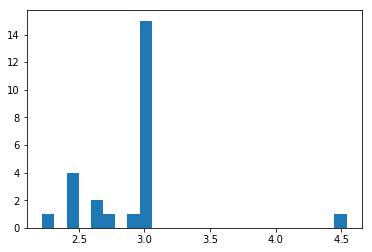

[ 2.89856231]
0.513705968857
Training epoch 174800
Iter: 174800
D loss: 3.16e-05
G_loss: -0.01231
()


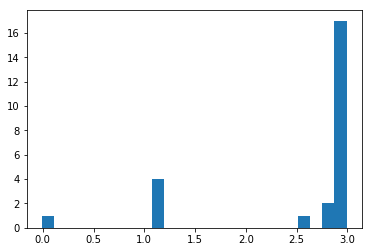

[ 2.53750486]
0.516129970551
Training epoch 174900
Iter: 174900
D loss: 2.803e-05
G_loss: -0.01394
()


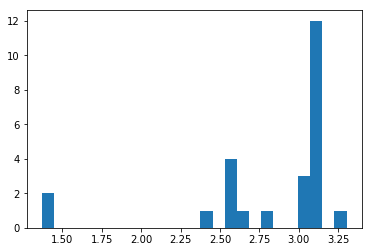

[ 2.80638384]
0.513154983521
Training epoch 175000
Iter: 175000
D loss: 3.281e-05
G_loss: -0.01394
()


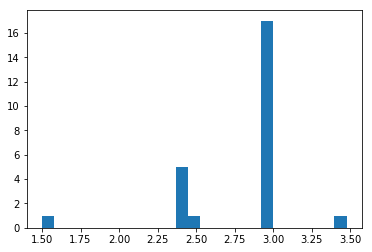

[ 2.82046879]
0.513593912125
Training epoch 175100
Iter: 175100
D loss: 2.698e-05
G_loss: -0.0138
()


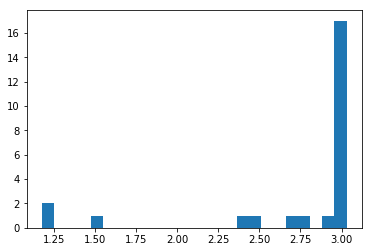

[ 2.74724629]
0.51347899437
Training epoch 175200
Iter: 175200
D loss: 2.632e-05
G_loss: -0.0141
()


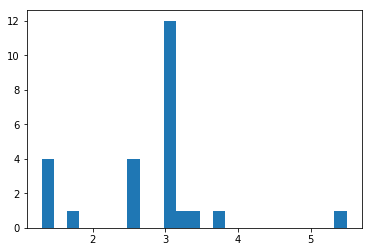

[ 2.83167831]
0.513289928436
Training epoch 175300
Iter: 175300
D loss: 3.241e-05
G_loss: -0.01396
()


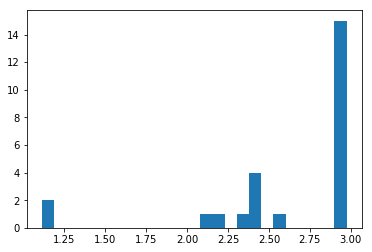

[ 2.62346852]
0.512475013733
Training epoch 175400
Iter: 175400
D loss: 1.832e-05
G_loss: -0.01406
()


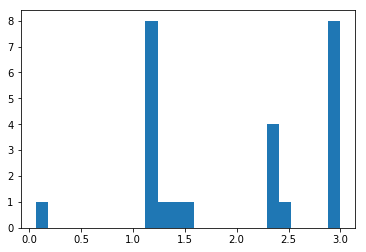

[ 1.9787008]
0.512742996216
Training epoch 175500
Iter: 175500
D loss: 3.184e-05
G_loss: -0.01337
()


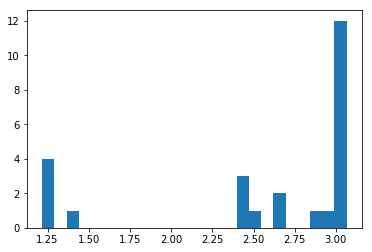

[ 2.56362971]
0.513467073441
Training epoch 175600
Iter: 175600
D loss: 2.842e-05
G_loss: -0.01414
()


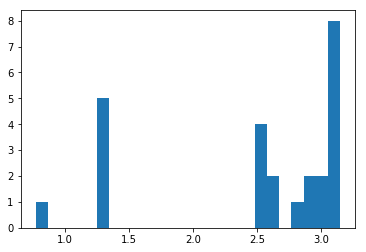

[ 2.50298435]
0.513229131699
Training epoch 175700
Iter: 175700
D loss: 4.301e-05
G_loss: -0.0118
()


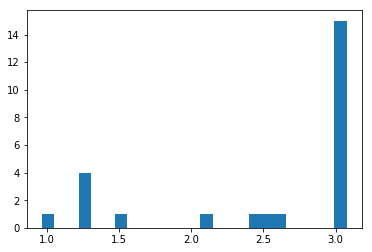

[ 2.53067208]
0.600181102753
Training epoch 175800
Iter: 175800
D loss: 3.051e-05
G_loss: -0.01392
()


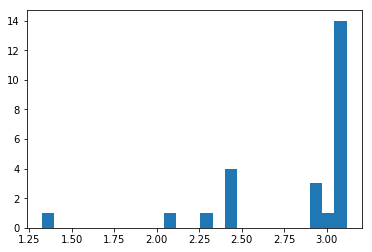

[ 2.83871636]
0.512122154236
Training epoch 175900
Iter: 175900
D loss: 3.123e-05
G_loss: -0.0133
()


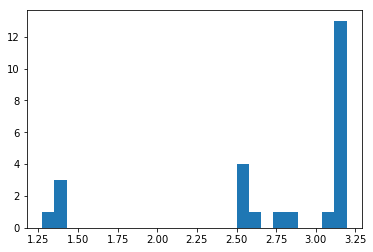

[ 2.73346347]
0.511637210846
Training epoch 176000
Iter: 176000
D loss: 3.455e-05
G_loss: -0.01398
()


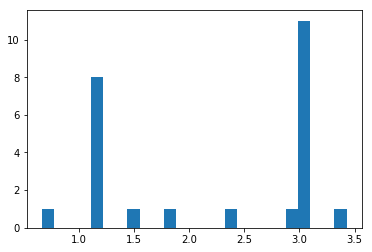

[ 2.21386792]
0.511809110641
Training epoch 176100
Iter: 176100
D loss: 3.254e-05
G_loss: -0.01388
()


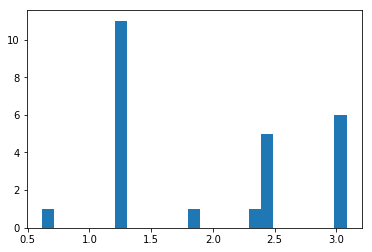

[ 1.97387778]
0.521409988403
Training epoch 176200
Iter: 176200
D loss: 3.506e-05
G_loss: -0.01379
()


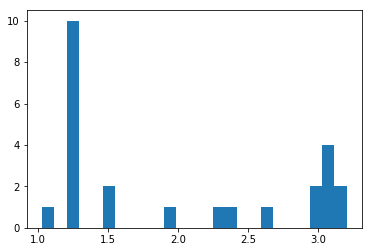

[ 2.02085854]
0.513224840164
Training epoch 176300
Iter: 176300
D loss: 2.807e-05
G_loss: -0.01393
()


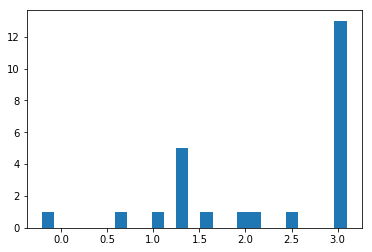

[ 2.24524318]
0.526929140091
Training epoch 176400
Iter: 176400
D loss: 3.36e-05
G_loss: -0.01321
()


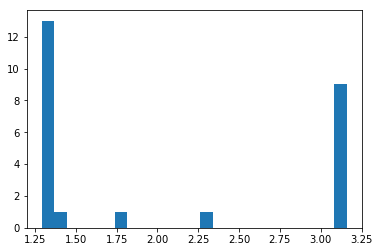

[ 2.02029055]
0.56414604187
Training epoch 176500
Iter: 176500
D loss: 4.122e-05
G_loss: -0.01329
()


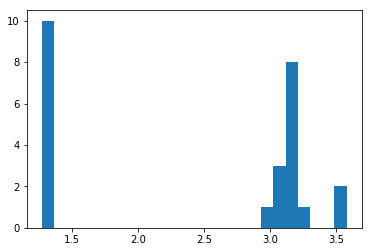

[ 2.42082952]
0.518172025681
Training epoch 176600
Iter: 176600
D loss: 4.127e-05
G_loss: -0.01179
()


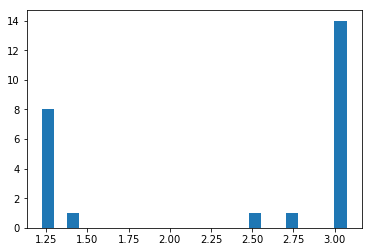

[ 2.37730152]
0.511224031448
Training epoch 176700
Iter: 176700
D loss: 2.807e-05
G_loss: -0.0142
()


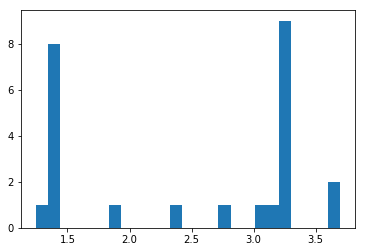

[ 2.49702281]
0.519038915634
Training epoch 176800
Iter: 176800
D loss: 3.348e-05
G_loss: -0.01398
()


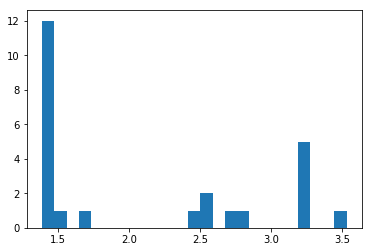

[ 2.10081757]
0.511804103851
Training epoch 176900
Iter: 176900
D loss: 3.93e-05
G_loss: -0.01386
()


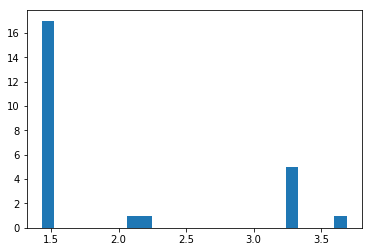

[ 1.9715684]
0.529628992081
Training epoch 177000
Iter: 177000
D loss: 3.988e-05
G_loss: -0.0138
()


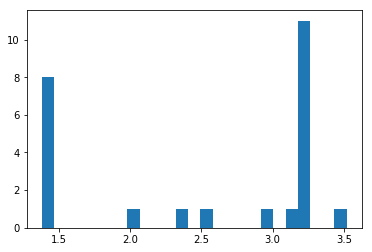

[ 2.5248164]
0.519400119781
Training epoch 177100
Iter: 177100
D loss: 3.28e-05
G_loss: -0.01373
()


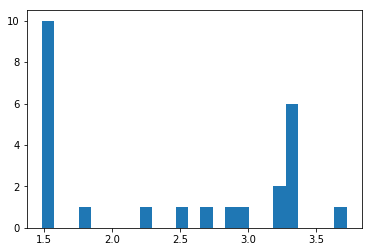

[ 2.40433024]
0.521539926529
Training epoch 177200
Iter: 177200
D loss: 3.318e-05
G_loss: -0.0132
()


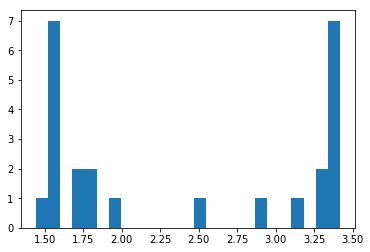

[ 2.39399727]
0.518284082413
Training epoch 177300
Iter: 177300
D loss: 3.492e-05
G_loss: -0.01453
()


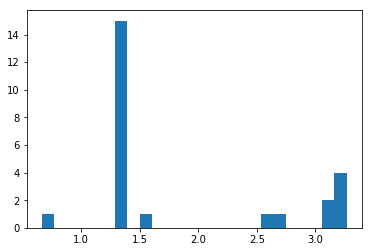

[ 1.87729373]
0.51245880127
Training epoch 177400
Iter: 177400
D loss: 4.042e-05
G_loss: -0.01381
()


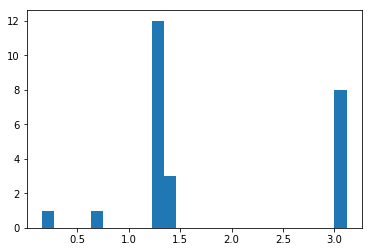

[ 1.82020813]
0.512799978256
Training epoch 177500
Iter: 177500
D loss: 3.215e-05
G_loss: -0.0135
()


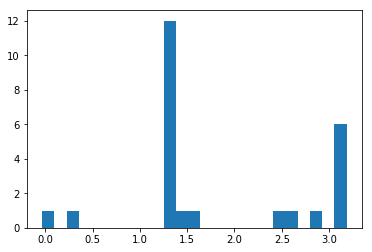

[ 1.85931995]
0.517712831497
Training epoch 177600
Iter: 177600
D loss: 3.753e-05
G_loss: -0.01412
()


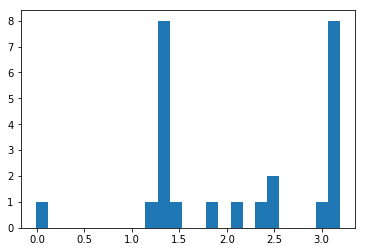

[ 2.13196683]
0.522941112518
Training epoch 177700
Iter: 177700
D loss: 3.565e-05
G_loss: -0.01384
()


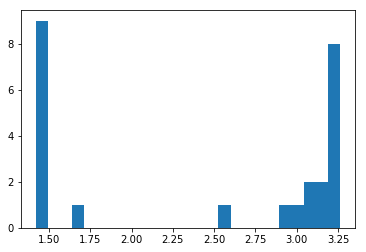

[ 2.46419842]
0.513948917389
Training epoch 177800
Iter: 177800
D loss: 3.734e-05
G_loss: -0.01112
()


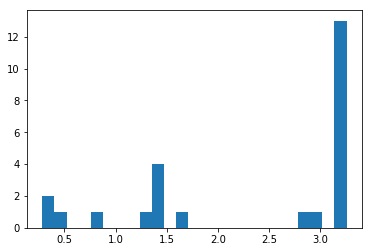

[ 2.34006866]
0.517280101776
Training epoch 177900
Iter: 177900
D loss: 2.84e-05
G_loss: -0.01373
()


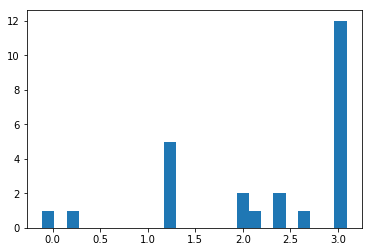

[ 2.28243368]
0.511024951935
Training epoch 178000
Iter: 178000
D loss: 3.774e-05
G_loss: -0.01354
()


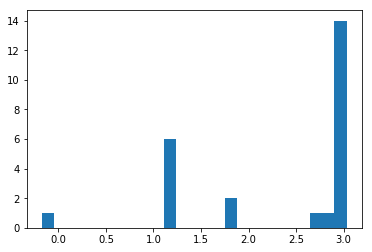

[ 2.33850926]
0.51895403862
Training epoch 178100
Iter: 178100
D loss: 3.254e-05
G_loss: -0.01188
()


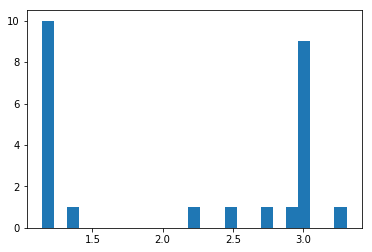

[ 2.13393589]
0.511174917221
Training epoch 178200
Iter: 178200
D loss: 3.244e-05
G_loss: -0.01315
()


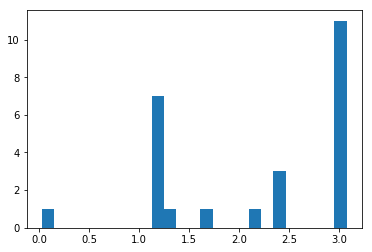

[ 2.18439912]
0.510761976242
Training epoch 178300
Iter: 178300
D loss: 3.256e-05
G_loss: -0.01284
()


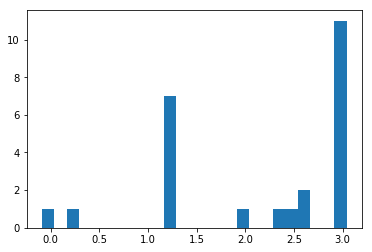

[ 2.16554675]
0.51270198822
Training epoch 178400
Iter: 178400
D loss: 4.293e-05
G_loss: -0.01382
()


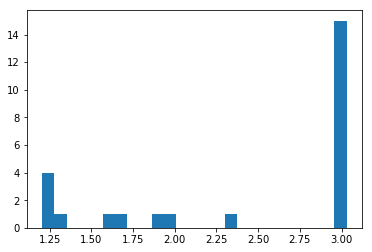

[ 2.43965117]
0.515146970749
Training epoch 178500
Iter: 178500
D loss: 2.463e-05
G_loss: -0.01332
()


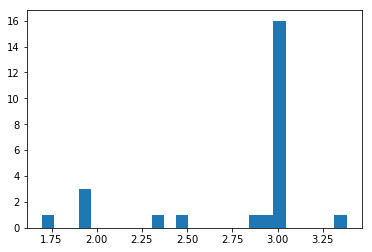

[ 2.7839253]
0.517730951309
Training epoch 178600
Iter: 178600
D loss: 2.886e-05
G_loss: -0.01407
()


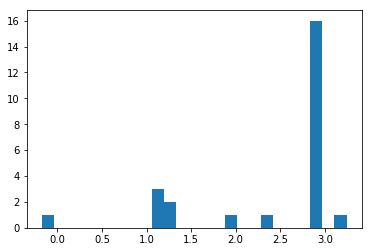

[ 2.41028967]
0.515126943588
Training epoch 178700
Iter: 178700
D loss: 2.087e-05
G_loss: -0.01421
()


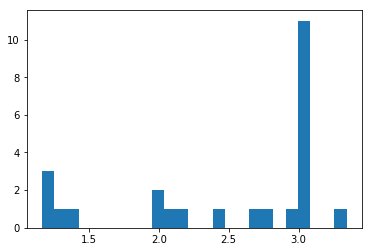

[ 2.46945054]
0.511023044586
Training epoch 178800
Iter: 178800
D loss: 3.351e-05
G_loss: -0.01371
()


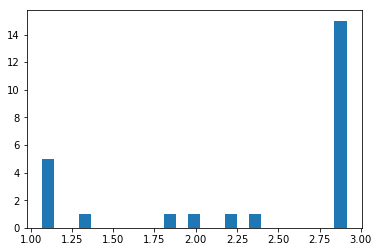

[ 2.35066336]
0.522702932358
Training epoch 178900
Iter: 178900
D loss: 3.27e-05
G_loss: -0.01392
()


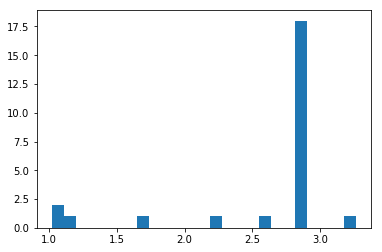

[ 2.57936688]
0.512437105179
Training epoch 179000
Iter: 179000
D loss: 3.538e-05
G_loss: -0.01363
()


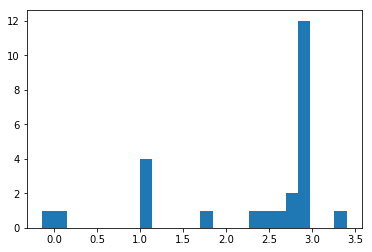

[ 2.31000335]
0.51179599762
Training epoch 179100
Iter: 179100
D loss: 2.692e-05
G_loss: -0.01381
()


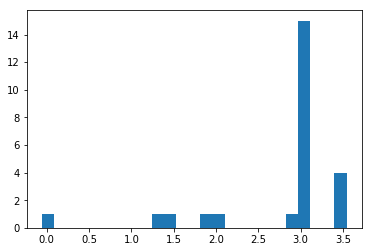

[ 2.794416]
0.51864695549
Training epoch 179200
Iter: 179200
D loss: 2.956e-05
G_loss: -0.01393
()


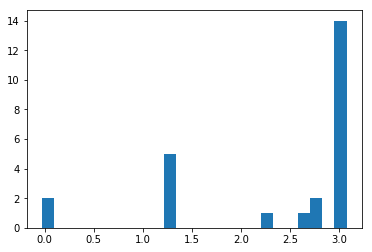

[ 2.39003767]
0.514703035355
Training epoch 179300
Iter: 179300
D loss: 3.393e-05
G_loss: -0.01165
()


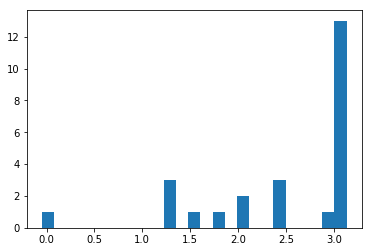

[ 2.47268984]
0.513226032257
Training epoch 179400
Iter: 179400
D loss: 3.429e-05
G_loss: -0.01347
()


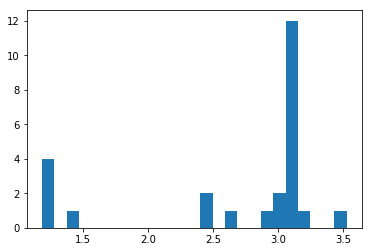

[ 2.67577374]
0.530318021774
Training epoch 179500
Iter: 179500
D loss: 3.867e-05
G_loss: -0.01375
()


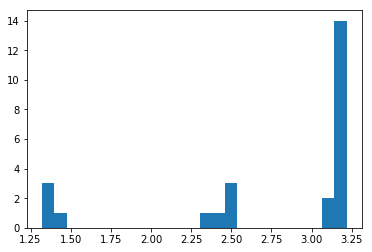

[ 2.72556305]
0.524647951126
Training epoch 179600
Iter: 179600
D loss: 3.464e-05
G_loss: -0.01329
()


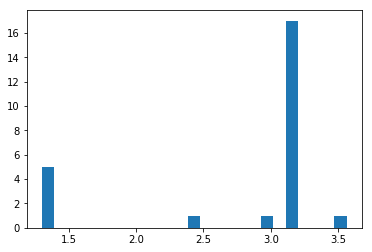

[ 2.75120869]
0.511526823044
Training epoch 179700
Iter: 179700
D loss: 4.294e-05
G_loss: -0.01299
()


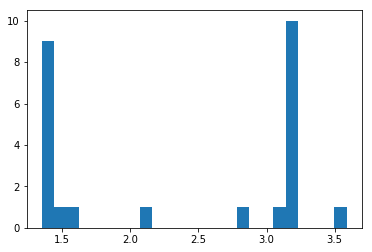

[ 2.34817963]
0.515357971191
Training epoch 179800
Iter: 179800
D loss: 3.952e-05
G_loss: -0.01256
()


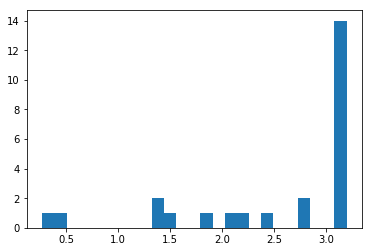

[ 2.54629685]
0.516101837158
Training epoch 179900
Iter: 179900
D loss: 3.376e-05
G_loss: -0.01353
()


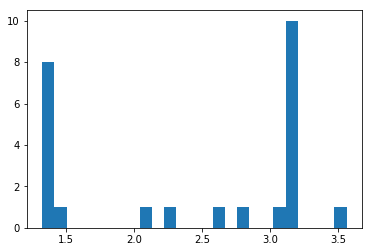

[ 2.40329393]
0.511152982712
Training epoch 180000
Iter: 180000
D loss: 3.759e-05
G_loss: -0.01359
()


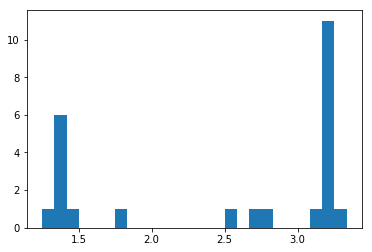

[ 2.50997629]
0.512127161026
Training epoch 180100
Iter: 180100
D loss: 3.683e-05
G_loss: -0.01177
()


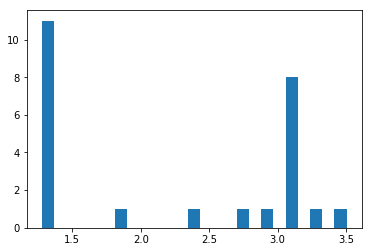

[ 2.22587564]
0.516798973083
Training epoch 180200
Iter: 180200
D loss: 3.818e-05
G_loss: -0.01383
()


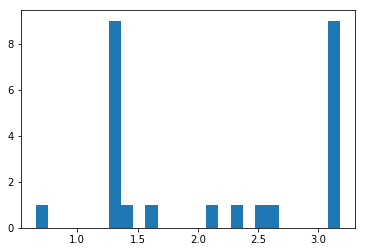

[ 2.15780065]
0.515026092529
Training epoch 180300
Iter: 180300
D loss: 3.941e-05
G_loss: -0.01358
()


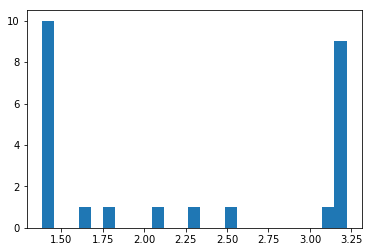

[ 2.24537555]
0.520776033401
Training epoch 180400
Iter: 180400
D loss: 3.816e-05
G_loss: -0.01331
()


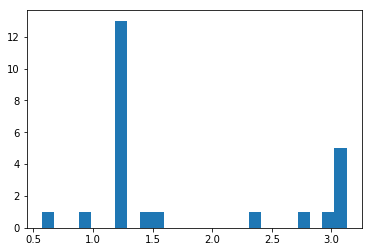

[ 1.79882009]
0.518714904785
Training epoch 180500
Iter: 180500
D loss: 3.244e-05
G_loss: -0.01335
()


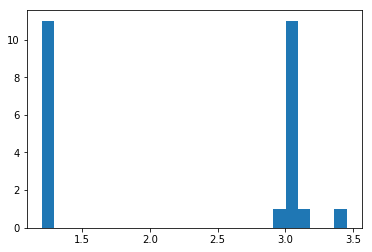

[ 2.26758404]
0.514747858047
Training epoch 180600
Iter: 180600
D loss: 3.294e-05
G_loss: -0.01314
()


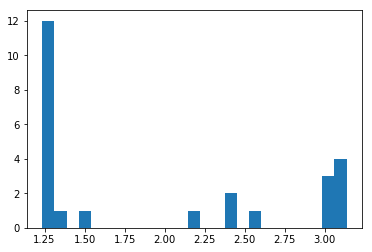

[ 1.94544704]
0.518532991409
Training epoch 180700
Iter: 180700
D loss: 3.198e-05
G_loss: -0.01264
()


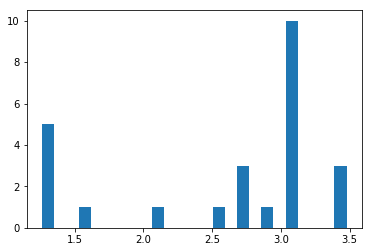

[ 2.5944936]
0.51189494133
Training epoch 180800
Iter: 180800
D loss: 3.334e-05
G_loss: -0.01355
()


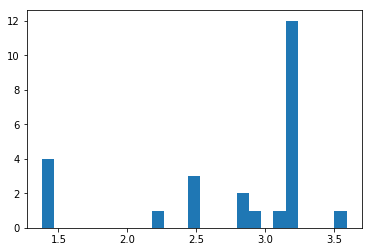

[ 2.7490576]
0.524137973785
Training epoch 180900
Iter: 180900
D loss: 3e-05
G_loss: -0.01383
()


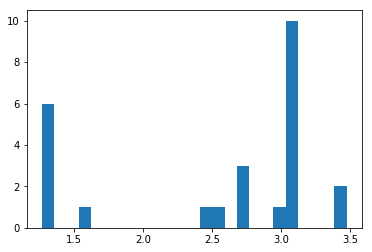

[ 2.53273387]
0.513333797455
Training epoch 181000
Iter: 181000
D loss: 3.602e-05
G_loss: -0.01271
()


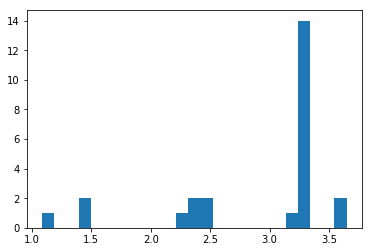

[ 2.86997095]
0.510887145996
Training epoch 181100
Iter: 181100
D loss: 4.473e-05
G_loss: -0.01367
()


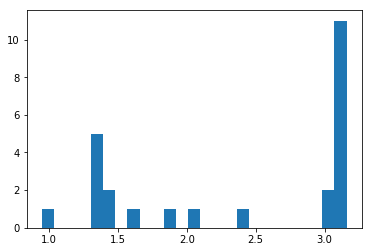

[ 2.37297509]
0.511039018631
Training epoch 181200
Iter: 181200
D loss: 2.88e-05
G_loss: -0.01318
()


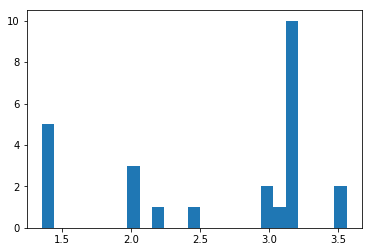

[ 2.61711143]
0.512254953384
Training epoch 181300
Iter: 181300
D loss: 3.771e-05
G_loss: -0.0134
()


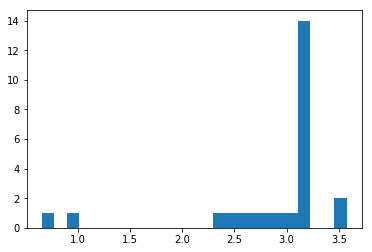

[ 2.87031566]
0.517204999924
Training epoch 181400
Iter: 181400
D loss: 4.178e-05
G_loss: -0.01376
()


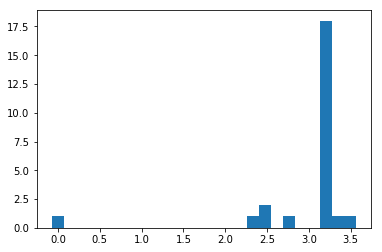

[ 2.94224771]
0.517235040665
Training epoch 181500
Iter: 181500
D loss: 3.649e-05
G_loss: -0.01353
()


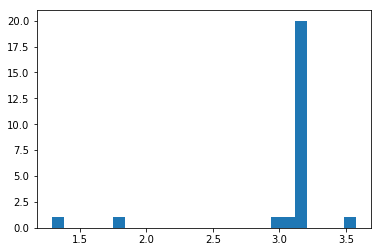

[ 3.03186104]
0.512049913406
Training epoch 181600
Iter: 181600
D loss: 2.911e-05
G_loss: -0.01352
()


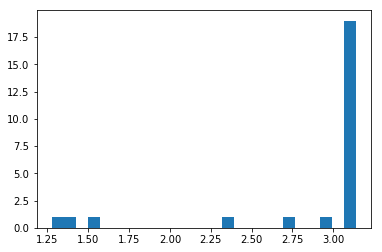

[ 2.8745708]
0.513396024704
Training epoch 181700
Iter: 181700
D loss: 3.947e-05
G_loss: -0.01347
()


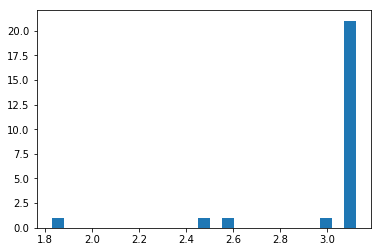

[ 3.00085346]
0.512365102768
Training epoch 181800
Iter: 181800
D loss: 3.454e-05
G_loss: -0.01445
()


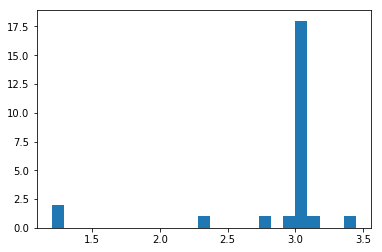

[ 2.89455534]
0.510921955109
Training epoch 181900
Iter: 181900
D loss: 3.927e-05
G_loss: -0.01365
()


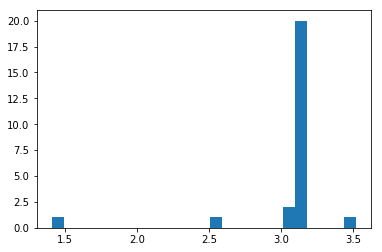

[ 3.02543844]
0.524806976318
Training epoch 182000
Iter: 182000
D loss: 3.881e-05
G_loss: -0.01348
()


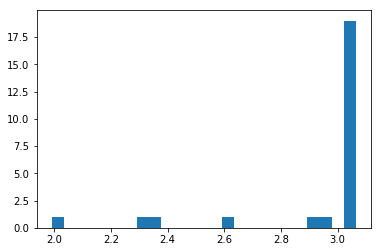

[ 2.93363243]
0.513030052185
Training epoch 182100
Iter: 182100
D loss: 4.2e-05
G_loss: -0.01355
()


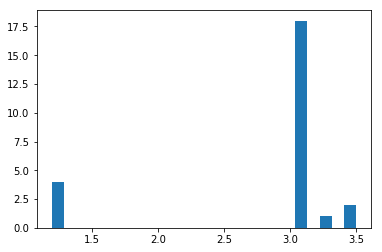

[ 2.810538]
0.513128042221
Training epoch 182200
Iter: 182200
D loss: 3.621e-05
G_loss: -0.01204
()


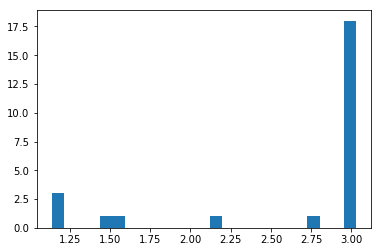

[ 2.63603929]
0.514117002487
Training epoch 182300
Iter: 182300
D loss: 3.475e-05
G_loss: -0.0128
()


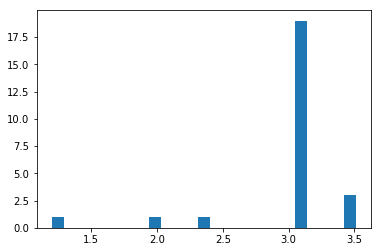

[ 2.97142712]
0.514802217484
Training epoch 182400
Iter: 182400
D loss: 3.921e-05
G_loss: -0.01347
()


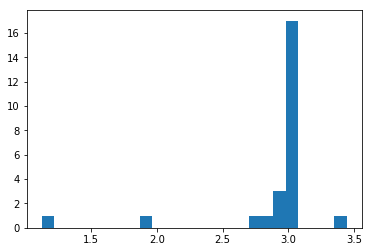

[ 2.87464846]
0.513387203217
Training epoch 182500
Iter: 182500
D loss: 2.478e-05
G_loss: -0.01383
()


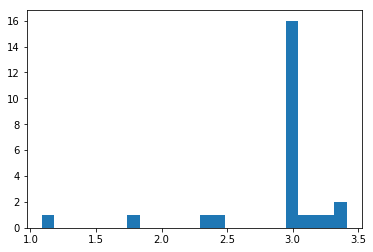

[ 2.84918651]
0.511845111847
Training epoch 182600
Iter: 182600
D loss: 3.505e-05
G_loss: -0.01085
()


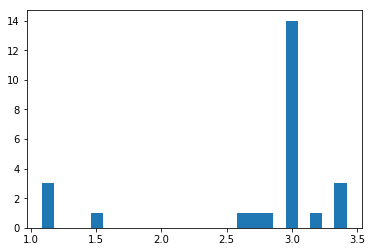

[ 2.71023129]
0.513659000397
Training epoch 182700
Iter: 182700
D loss: 3.226e-05
G_loss: -0.01383
()


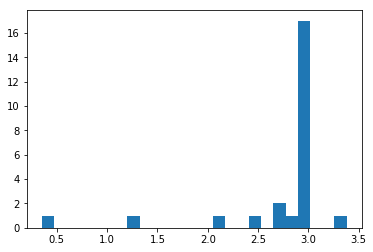

[ 2.69941565]
0.513546943665
Training epoch 182800
Iter: 182800
D loss: 3.176e-05
G_loss: -0.01423
()


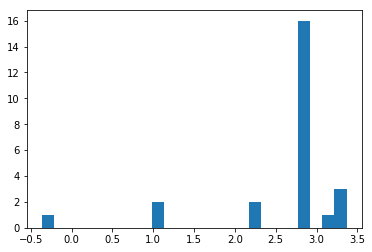

[ 2.64078235]
0.512338876724
Training epoch 182900
Iter: 182900
D loss: 4.549e-05
G_loss: -0.01369
()


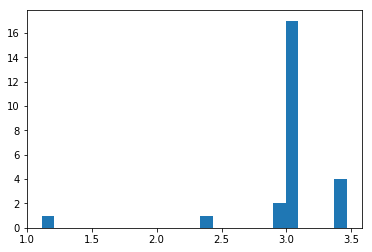

[ 2.96847368]
0.518215179443
Training epoch 183000
Iter: 183000
D loss: 3.202e-05
G_loss: -0.01465
()


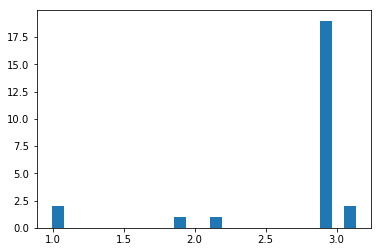

[ 2.68194717]
0.511231184006
Training epoch 183100
Iter: 183100
D loss: 3.789e-05
G_loss: -0.01261
()


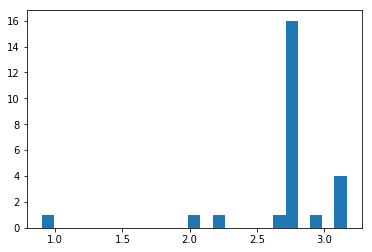

[ 2.68527236]
0.51195192337
Training epoch 183200
Iter: 183200
D loss: 3.44e-05
G_loss: -0.01342
()


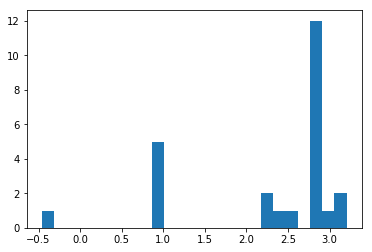

[ 2.24903554]
0.511290073395
Training epoch 183300
Iter: 183300
D loss: 3.416e-05
G_loss: -0.01324
()


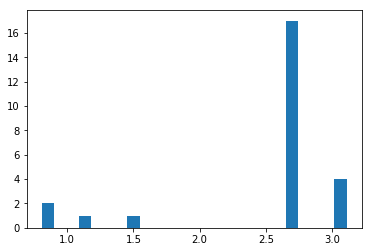

[ 2.48852036]
0.516227006912
Training epoch 183400
Iter: 183400
D loss: 3.653e-05
G_loss: -0.01336
()


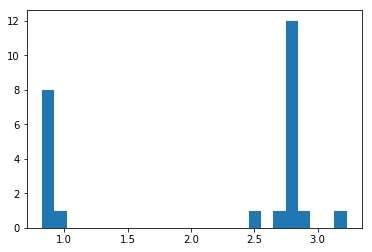

[ 2.1075913]
0.513330936432
Training epoch 183500
Iter: 183500
D loss: 3.586e-05
G_loss: -0.01344
()


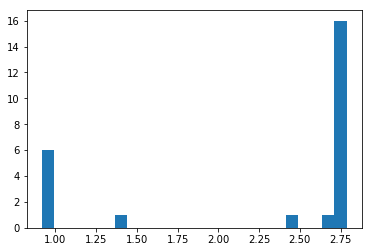

[ 2.26130991]
0.511219978333
Training epoch 183600
Iter: 183600
D loss: 3.891e-05
G_loss: -0.01351
()


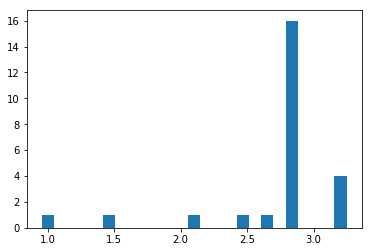

[ 2.70652687]
0.516017913818
Training epoch 183700
Iter: 183700
D loss: 3.967e-05
G_loss: -0.01188
()


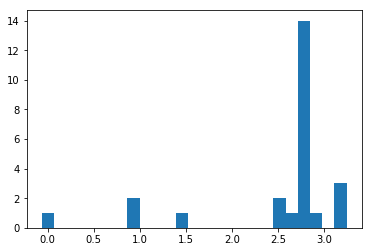

[ 2.5323921]
0.526937961578
Training epoch 183800
Iter: 183800
D loss: 3.754e-05
G_loss: -0.01306
()


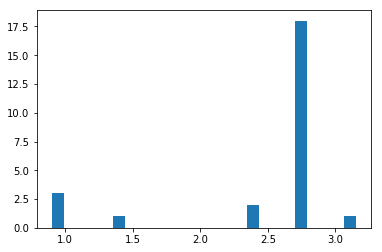

[ 2.46486677]
0.51407790184
Training epoch 183900
Iter: 183900
D loss: 3.412e-05
G_loss: -0.01316
()


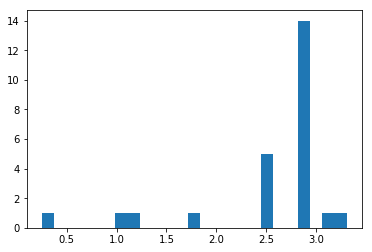

[ 2.54975821]
0.511739969254
Training epoch 184000
Iter: 184000
D loss: 3.352e-05
G_loss: -0.01365
()


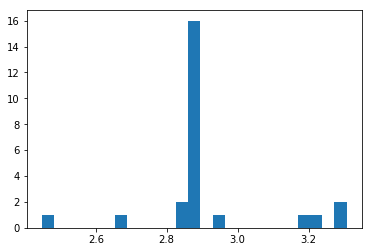

[ 2.90492006]
0.511260032654
Training epoch 184100
Iter: 184100
D loss: 2.378e-05
G_loss: -0.01398
()


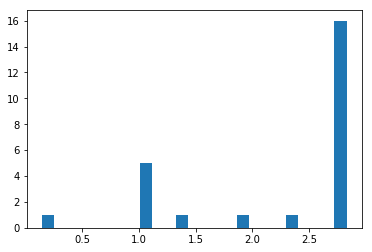

[ 2.25112368]
0.514224767685
Training epoch 184200
Iter: 184200
D loss: 3.085e-05
G_loss: -0.01347
()


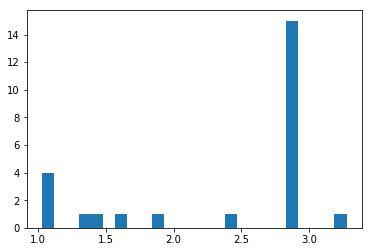

[ 2.35554365]
0.511265993118
Training epoch 184300
Iter: 184300
D loss: 4.754e-05
G_loss: -0.01303
()


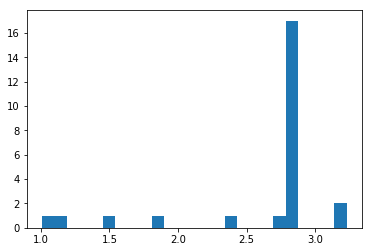

[ 2.59811749]
0.518268108368
Training epoch 184400
Iter: 184400
D loss: 4.293e-05
G_loss: -0.01364
()


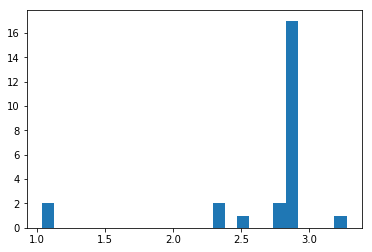

[ 2.65384395]
0.51944899559
Training epoch 184500
Iter: 184500
D loss: 3.232e-05
G_loss: -0.01231
()


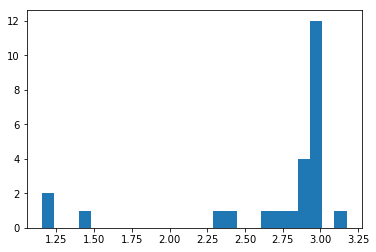

[ 2.6700071]
0.515698194504
Training epoch 184600
Iter: 184600
D loss: 3.466e-05
G_loss: -0.01274
()


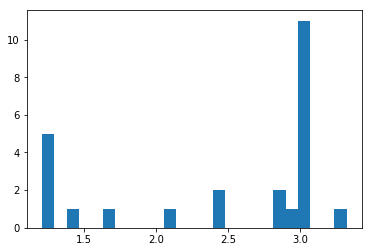

[ 2.44331711]
0.515980958939
Training epoch 184700
Iter: 184700
D loss: 3.939e-05
G_loss: -0.01356
()


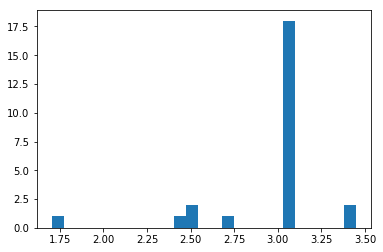

[ 2.93636022]
0.514917850494
Training epoch 184800
Iter: 184800
D loss: 2.989e-05
G_loss: -0.01284
()


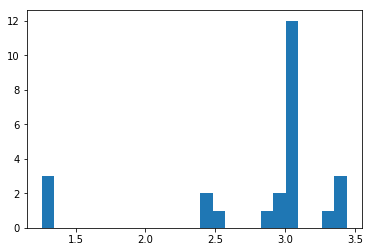

[ 2.80192033]
0.513743877411
Training epoch 184900
Iter: 184900
D loss: 4.252e-05
G_loss: -0.01361
()


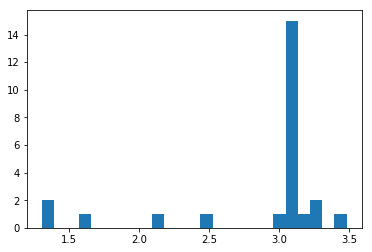

[ 2.85259398]
0.515042066574
Training epoch 185000
Iter: 185000
D loss: 3.822e-05
G_loss: -0.01349
()


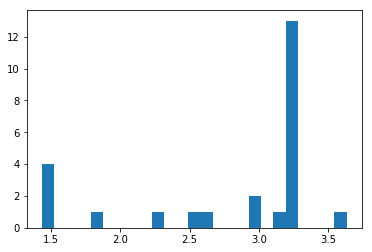

[ 2.77845514]
0.521551847458
Training epoch 185100
Iter: 185100
D loss: 3.37e-05
G_loss: -0.01278
()


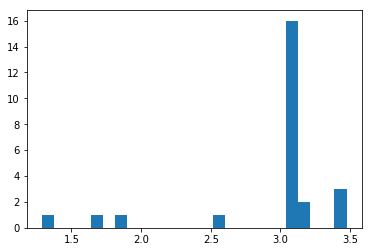

[ 2.93615816]
0.524584054947
Training epoch 185200
Iter: 185200
D loss: 4.456e-05
G_loss: -0.01375
()


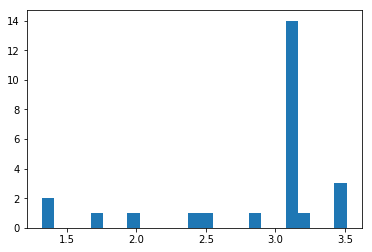

[ 2.85889467]
0.519379854202
Training epoch 185300
Iter: 185300
D loss: 3.637e-05
G_loss: -0.01376
()


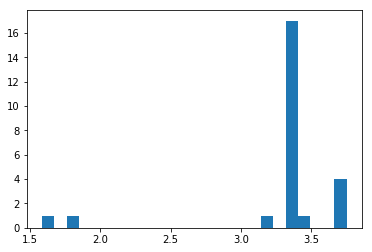

[ 3.29269032]
0.514105081558
Training epoch 185400
Iter: 185400
D loss: 3.172e-05
G_loss: -0.01349
()


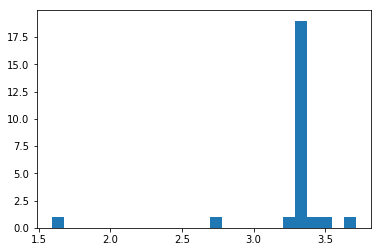

[ 3.26164402]
0.51056098938
Training epoch 185500
Iter: 185500
D loss: 3.801e-05
G_loss: -0.01401
()


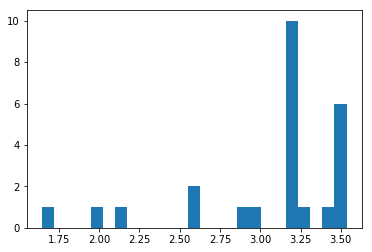

[ 3.06024982]
0.511282920837
Training epoch 185600
Iter: 185600
D loss: 3.253e-05
G_loss: -0.01384
()


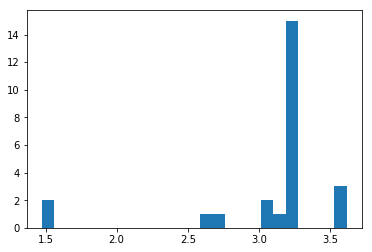

[ 3.07365374]
0.517030954361
Training epoch 185700
Iter: 185700
D loss: 3.769e-05
G_loss: -0.01297
()


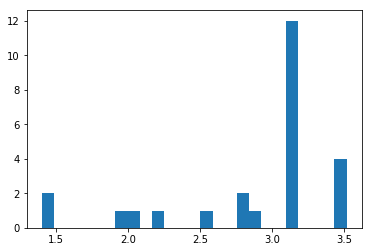

[ 2.87946825]
0.518522977829
Training epoch 185800
Iter: 185800
D loss: 3.601e-05
G_loss: -0.01318
()


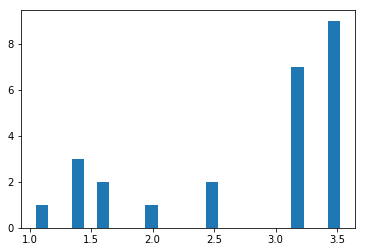

[ 2.75954822]
0.511943101883
Training epoch 185900
Iter: 185900
D loss: 4.493e-05
G_loss: -0.0144
()


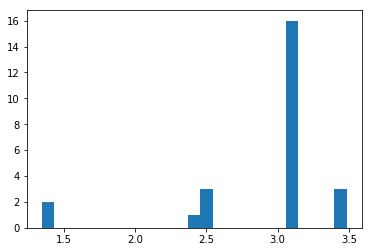

[ 2.91135364]
0.511124849319
Training epoch 186000
Iter: 186000
D loss: 3.289e-05
G_loss: -0.01358
()


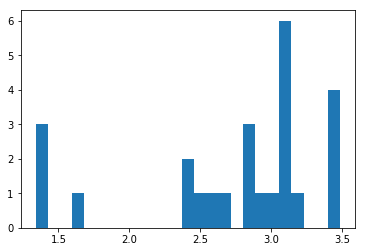

[ 2.7380383]
0.51091003418
Training epoch 186100
Iter: 186100
D loss: 3.444e-05
G_loss: -0.01316
()


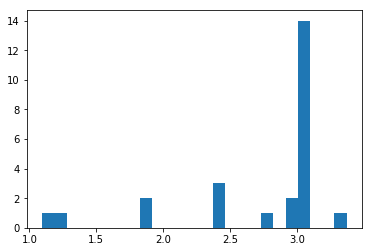

[ 2.71733827]
0.514178991318
Training epoch 186200
Iter: 186200
D loss: 3.259e-05
G_loss: -0.01318
()


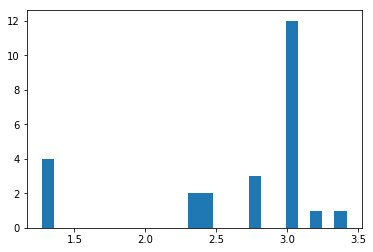

[ 2.65588629]
0.511639118195
Training epoch 186300
Iter: 186300
D loss: 3.208e-05
G_loss: -0.01407
()


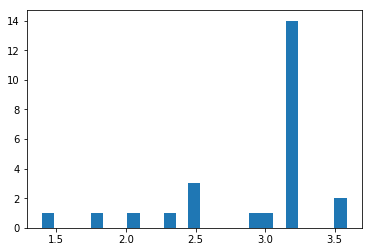

[ 2.91779427]
0.519617080688
Training epoch 186400
Iter: 186400
D loss: 3.215e-05
G_loss: -0.01404
()


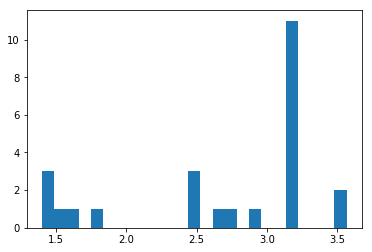

[ 2.67346444]
0.513503074646
Training epoch 186500
Iter: 186500
D loss: 3.501e-05
G_loss: -0.01348
()


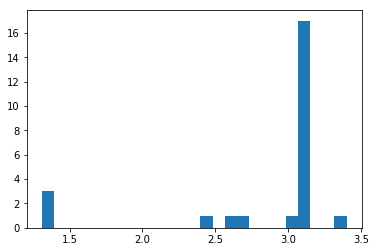

[ 2.83304725]
0.514283180237
Training epoch 186600
Iter: 186600
D loss: 3.001e-05
G_loss: -0.01406
()


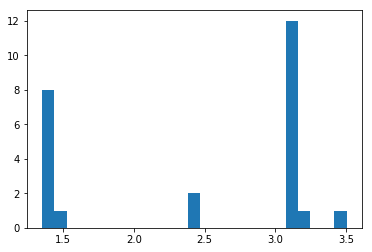

[ 2.46214794]
0.512757062912
Training epoch 186700
Iter: 186700
D loss: 3.64e-05
G_loss: -0.01386
()


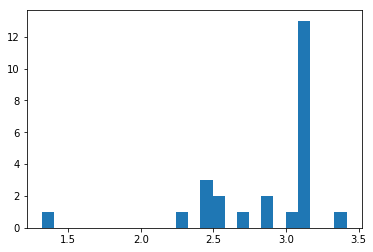

[ 2.86379398]
0.511512041092
Training epoch 186800
Iter: 186800
D loss: 3.521e-05
G_loss: -0.01391
()


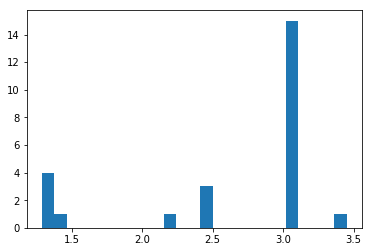

[ 2.63357732]
0.513013839722
Training epoch 186900
Iter: 186900
D loss: 3.647e-05
G_loss: -0.01324
()


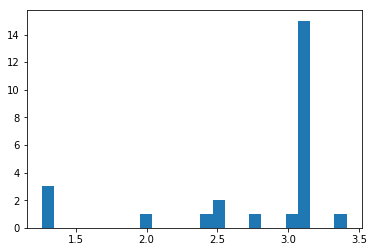

[ 2.74110568]
0.511317968369
Training epoch 187000
Iter: 187000
D loss: 3.541e-05
G_loss: -0.01369
()


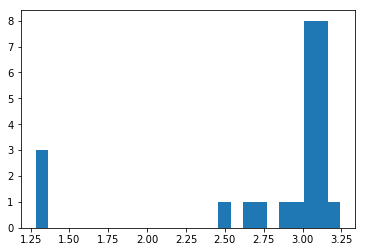

[ 2.80876696]
0.583852052689
Training epoch 187100
Iter: 187100
D loss: 3.537e-05
G_loss: -0.01304
()


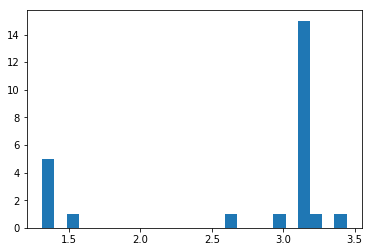

[ 2.67925818]
0.513485908508
Training epoch 187200
Iter: 187200
D loss: 4.185e-05
G_loss: -0.01364
()


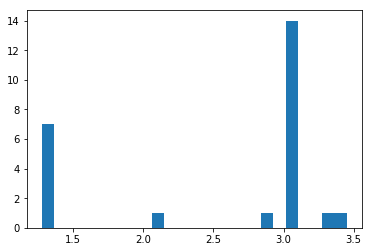

[ 2.55533043]
0.514045953751
Training epoch 187300
Iter: 187300
D loss: 4.129e-05
G_loss: -0.0137
()


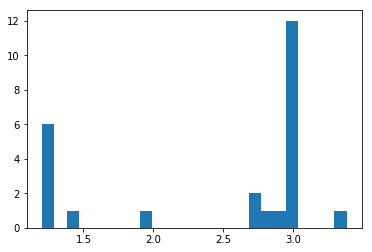

[ 2.45630298]
0.51161813736
Training epoch 187400
Iter: 187400
D loss: 3.936e-05
G_loss: -0.01136
()


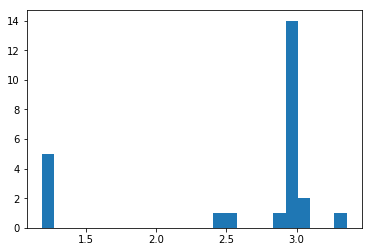

[ 2.61081851]
0.513607025146
Training epoch 187500
Iter: 187500
D loss: 4.14e-05
G_loss: -0.01319
()


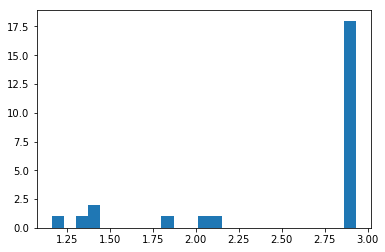

[ 2.56396112]
0.513206958771
Training epoch 187600
Iter: 187600
D loss: 3.821e-05
G_loss: -0.01351
()


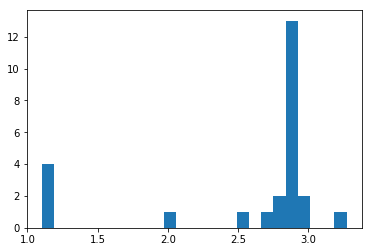

[ 2.56879596]
0.515190839767
Training epoch 187700
Iter: 187700
D loss: 3.781e-05
G_loss: -0.01338
()


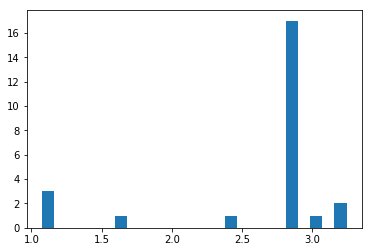

[ 2.62357296]
0.620584011078
Training epoch 187800
Iter: 187800
D loss: 3.47e-05
G_loss: -0.01294
()


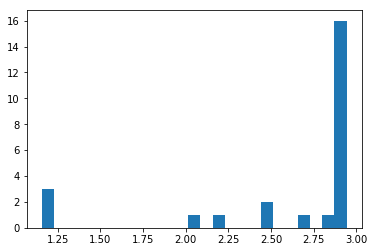

[ 2.61380518]
0.514513015747
Training epoch 187900
Iter: 187900
D loss: 4.227e-05
G_loss: -0.01366
()


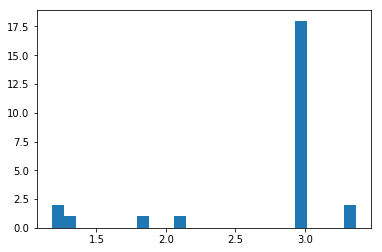

[ 2.70021241]
0.530347108841
Training epoch 188000
Iter: 188000
D loss: 3.879e-05
G_loss: -0.01289
()


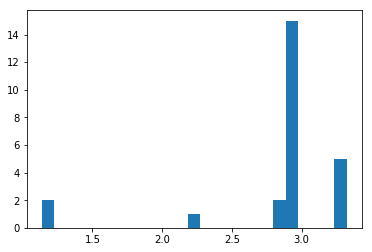

[ 2.82141849]
0.525452136993
Training epoch 188100
Iter: 188100
D loss: 3.769e-05
G_loss: -0.01326
()


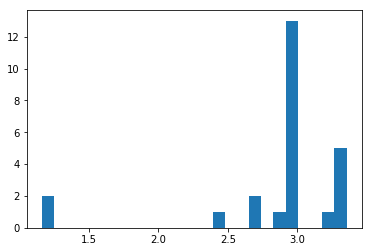

[ 2.84774197]
0.513370990753
Training epoch 188200
Iter: 188200
D loss: 3.472e-05
G_loss: -0.013
()


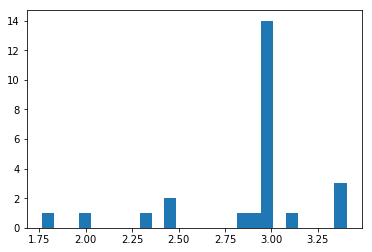

[ 2.8724929]
0.525110006332
Training epoch 188300
Iter: 188300
D loss: 3.669e-05
G_loss: -0.01351
()


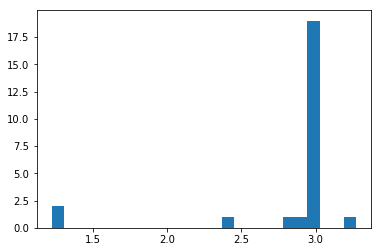

[ 2.81451518]
0.517741918564
Training epoch 188400
Iter: 188400
D loss: 3.772e-05
G_loss: -0.01227
()


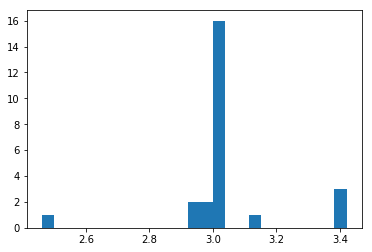

[ 3.02824226]
0.517251014709
Training epoch 188500
Iter: 188500
D loss: 3.973e-05
G_loss: -0.01263
()


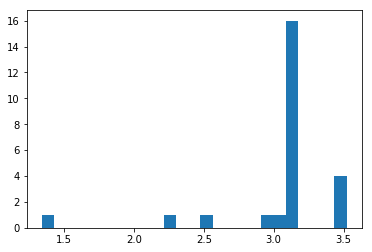

[ 3.02846273]
0.514528036118
Training epoch 188600
Iter: 188600
D loss: 4.039e-05
G_loss: -0.01416
()


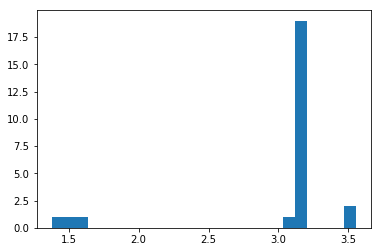

[ 2.96830375]
0.513278961182
Training epoch 188700
Iter: 188700
D loss: 3.225e-05
G_loss: -0.01121
()


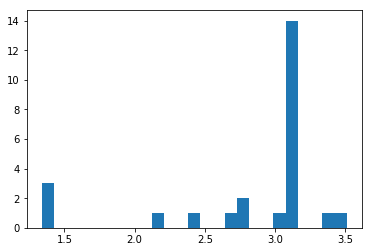

[ 2.80471214]
0.522775888443
Training epoch 188800
Iter: 188800
D loss: 3.929e-05
G_loss: -0.01329
()


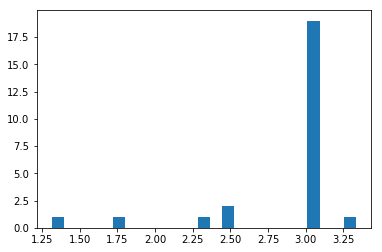

[ 2.89637736]
0.522107124329
Training epoch 188900
Iter: 188900
D loss: 4.025e-05
G_loss: -0.0136
()


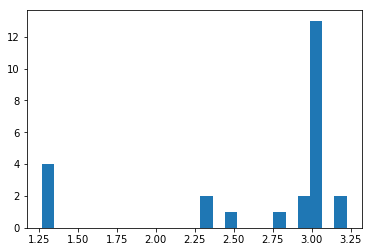

[ 2.67869097]
0.512165784836
Training epoch 189000
Iter: 189000
D loss: 3.516e-05
G_loss: -0.0124
()


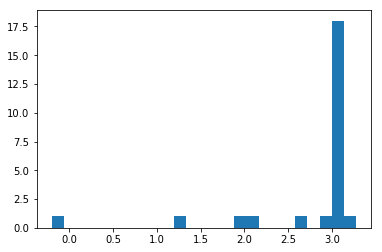

[ 2.78604276]
0.521900892258
Training epoch 189100
Iter: 189100
D loss: 3.511e-05
G_loss: -0.01313
()


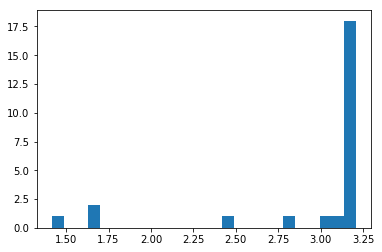

[ 2.95697307]
0.517033100128
Training epoch 189200
Iter: 189200
D loss: 3.689e-05
G_loss: -0.01328
()


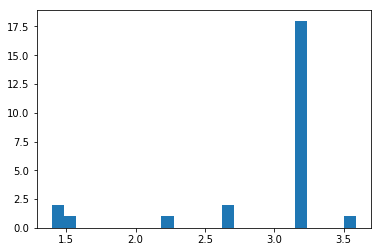

[ 2.91849035]
0.511709928513
Training epoch 189300
Iter: 189300
D loss: 3.612e-05
G_loss: -0.01355
()


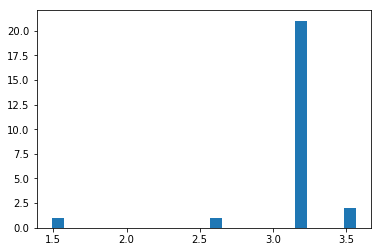

[ 3.11590819]
0.59436917305
Training epoch 189400
Iter: 189400
D loss: 3.605e-05
G_loss: -0.01315
()


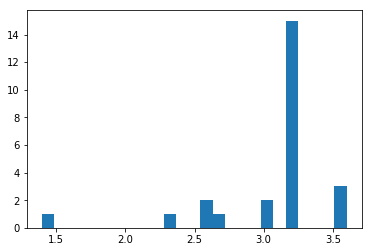

[ 3.05240639]
0.511595010757
Training epoch 189500
Iter: 189500
D loss: 3.705e-05
G_loss: -0.01383
()


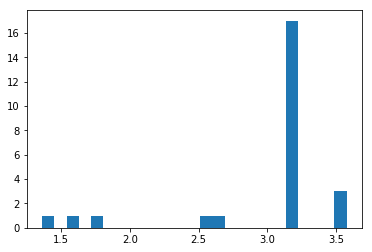

[ 2.98442976]
0.511589050293
Training epoch 189600
Iter: 189600
D loss: 4.209e-05
G_loss: -0.01436
()


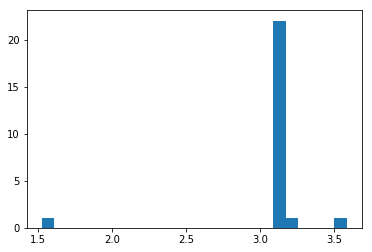

[ 3.10232324]
0.511337995529
Training epoch 189700
Iter: 189700
D loss: 4.019e-05
G_loss: -0.01398
()


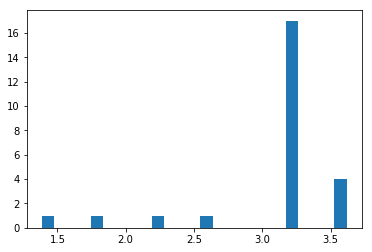

[ 3.07361866]
0.514799118042
Training epoch 189800
Iter: 189800
D loss: 3.864e-05
G_loss: -0.01377
()


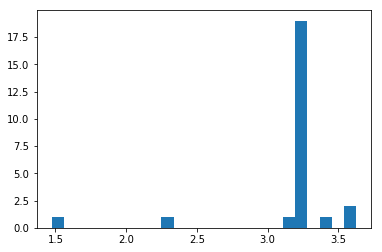

[ 3.15019398]
0.513389110565
Training epoch 189900
Iter: 189900
D loss: 4.028e-05
G_loss: -0.01356
()


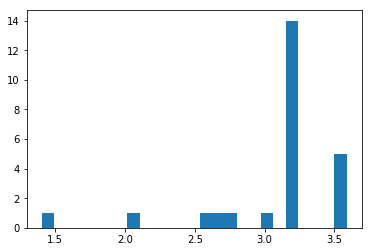

[ 3.07359103]
0.51345205307
Training epoch 190000
Iter: 190000
D loss: 3.34e-05
G_loss: -0.01383
()


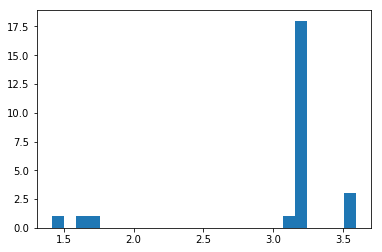

[ 3.04237397]
0.51877117157
Training epoch 190100
Iter: 190100
D loss: 4.778e-05
G_loss: -0.01256
()


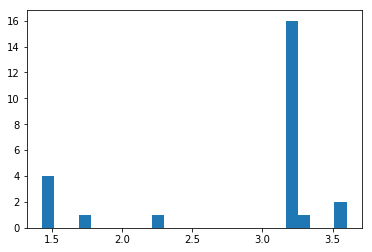

[ 2.85524934]
0.51416182518
Training epoch 190200
Iter: 190200
D loss: 4.217e-05
G_loss: -0.01231
()


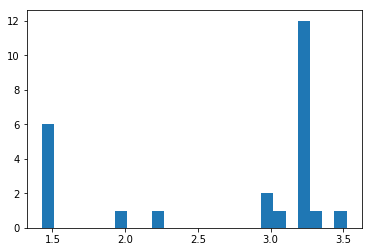

[ 2.69247808]
0.521401882172
Training epoch 190300
Iter: 190300
D loss: 4.02e-05
G_loss: -0.01283
()


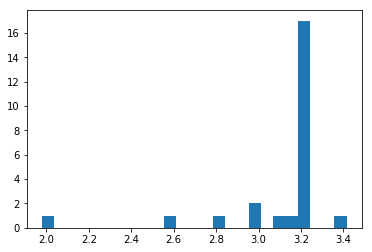

[ 3.10915854]
0.512257099152
Training epoch 190400
Iter: 190400
D loss: 3.675e-05
G_loss: -0.0137
()


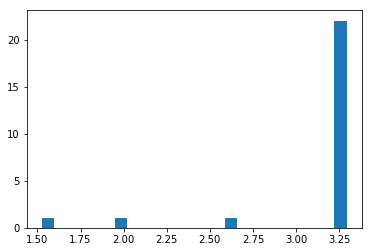

[ 3.14135437]
0.513377904892
Training epoch 190500
Iter: 190500
D loss: 3.614e-05
G_loss: -0.01378
()


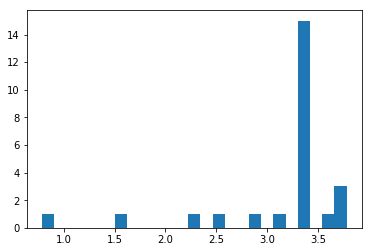

[ 3.14853732]
0.511516094208
Training epoch 190600
Iter: 190600
D loss: 4.477e-05
G_loss: -0.01222
()


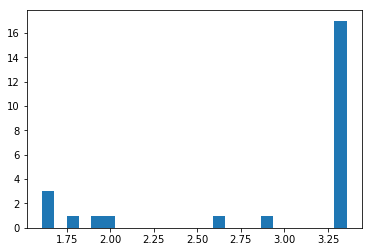

[ 2.92253307]
0.513303995132
Training epoch 190700
Iter: 190700
D loss: 4.904e-05
G_loss: -0.01353
()


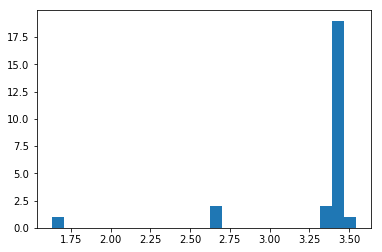

[ 3.29078455]
0.512159824371
Training epoch 190800
Iter: 190800
D loss: 3.82e-05
G_loss: -0.01337
()


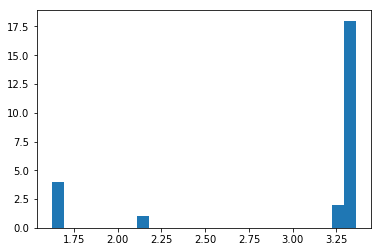

[ 3.02019979]
0.513450145721
Training epoch 190900
Iter: 190900
D loss: 3.869e-05
G_loss: -0.0126
()


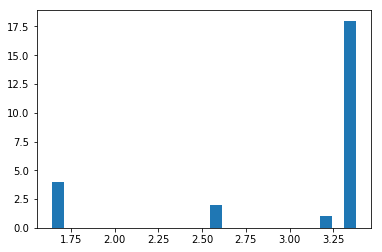

[ 3.03220728]
0.517826080322
Training epoch 191000
Iter: 191000
D loss: 3.695e-05
G_loss: -0.01328
()


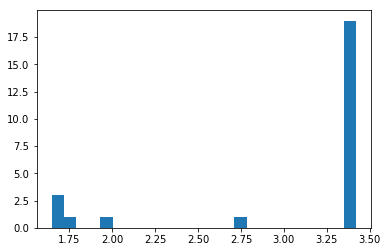

[ 3.03185697]
0.52205991745
Training epoch 191100
Iter: 191100
D loss: 3.98e-05
G_loss: -0.01351
()


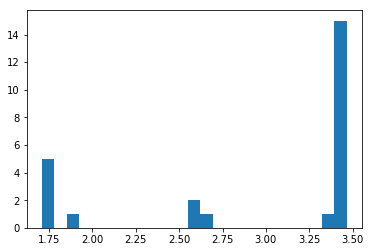

[ 2.93385525]
0.518364906311
Training epoch 191200
Iter: 191200
D loss: 3.314e-05
G_loss: -0.01464
()


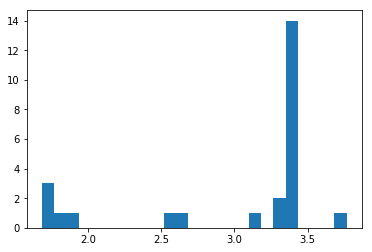

[ 3.01766048]
0.514597892761
Training epoch 191300
Iter: 191300
D loss: 3.891e-05
G_loss: -0.0116
()


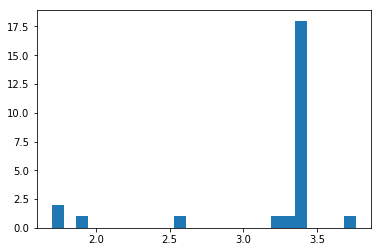

[ 3.18634875]
0.511737108231
Training epoch 191400
Iter: 191400
D loss: 4.186e-05
G_loss: -0.01368
()


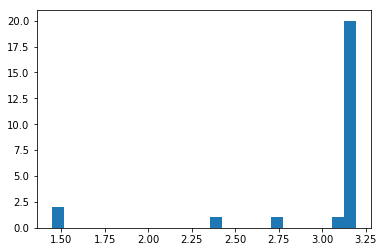

[ 3.00076426]
0.511893987656
Training epoch 191500
Iter: 191500
D loss: 3.696e-05
G_loss: -0.01383
()


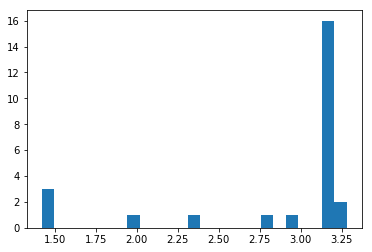

[ 2.86975996]
0.512286901474
Training epoch 191600
Iter: 191600
D loss: 3.67e-05
G_loss: -0.01372
()


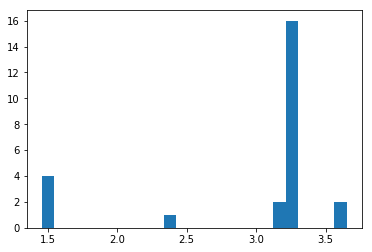

[ 2.94415907]
0.512409925461
Training epoch 191700
Iter: 191700
D loss: 3.613e-05
G_loss: -0.01367
()


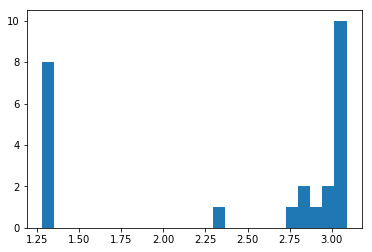

[ 2.42834418]
0.513354063034
Training epoch 191800
Iter: 191800
D loss: 4.438e-05
G_loss: -0.01391
()


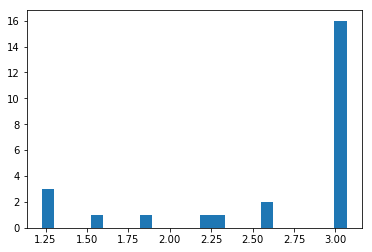

[ 2.63096529]
0.514293909073
Training epoch 191900
Iter: 191900
D loss: 3.724e-05
G_loss: -0.014
()


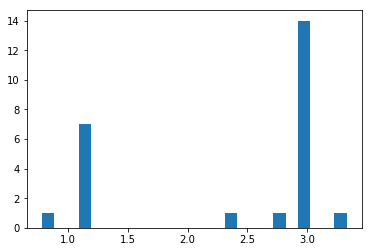

[ 2.34006523]
0.513206958771
Training epoch 192000
Iter: 192000
D loss: 3.422e-05
G_loss: -0.01303
()


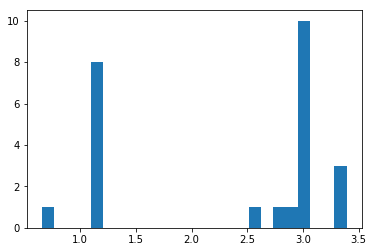

[ 2.32365339]
0.512712001801
Training epoch 192100
Iter: 192100
D loss: 3.884e-05
G_loss: -0.01333
()


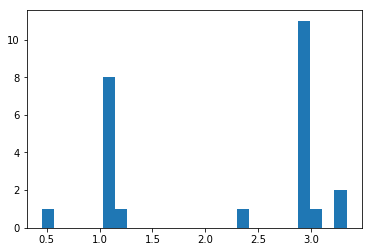

[ 2.18924172]
0.516763925552
Training epoch 192200
Iter: 192200
D loss: 3.197e-05
G_loss: -0.01427
()


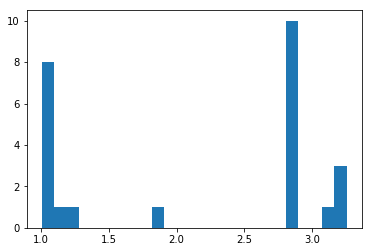

[ 2.15991038]
0.512157917023
Training epoch 192300
Iter: 192300
D loss: 4.178e-05
G_loss: -0.01302
()


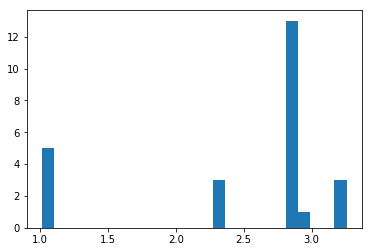

[ 2.48463357]
0.512547969818
Training epoch 192400
Iter: 192400
D loss: 3.554e-05
G_loss: -0.01286
()


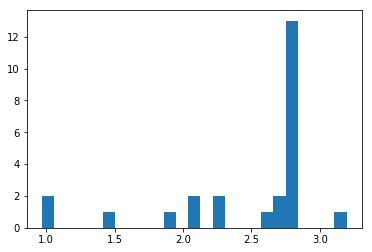

[ 2.47279939]
0.51397895813
Training epoch 192500
Iter: 192500
D loss: 3.644e-05
G_loss: -0.01419
()


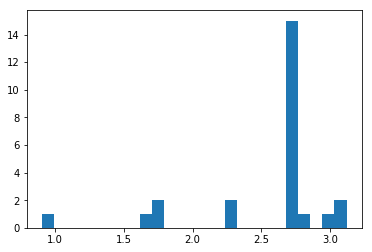

[ 2.55880449]
0.513464927673
Training epoch 192600
Iter: 192600
D loss: 3.327e-05
G_loss: -0.01409
()


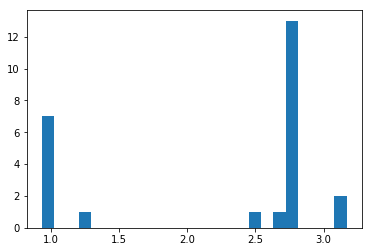

[ 2.22319054]
0.512320995331
Training epoch 192700
Iter: 192700
D loss: 3.971e-05
G_loss: -0.01326
()


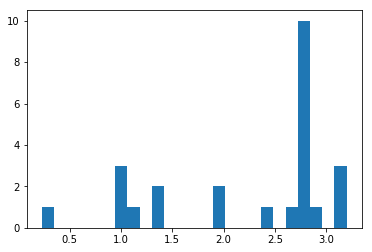

[ 2.24382644]
0.513048887253
Training epoch 192800
Iter: 192800
D loss: 3.904e-05
G_loss: -0.01348
()


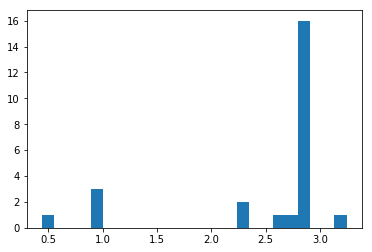

[ 2.47390879]
0.512125968933
Training epoch 192900
Iter: 192900
D loss: 4.274e-05
G_loss: -0.01382
()


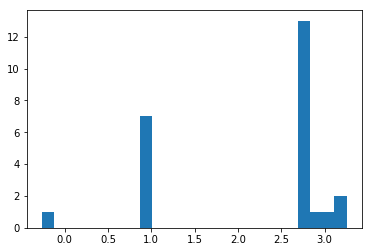

[ 2.20776727]
0.526462078094
Training epoch 193000
Iter: 193000
D loss: 3.498e-05
G_loss: -0.0136
()


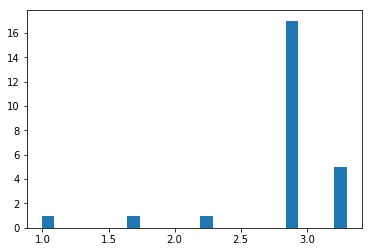

[ 2.79512537]
0.527261018753
Training epoch 193100
Iter: 193100
D loss: 3.912e-05
G_loss: -0.012
()


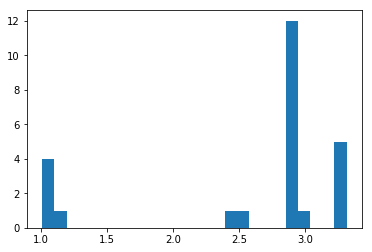

[ 2.56496905]
0.516513824463
Training epoch 193200
Iter: 193200
D loss: 3.43e-05
G_loss: -0.01308
()


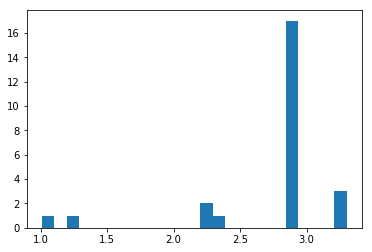

[ 2.70277869]
0.513362169266
Training epoch 193300
Iter: 193300
D loss: 3.325e-05
G_loss: -0.01387
()


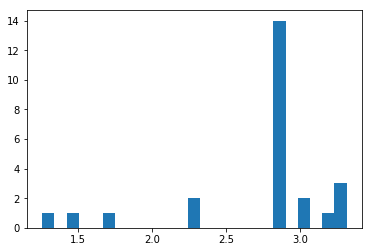

[ 2.74254408]
0.513215065002
Training epoch 193400
Iter: 193400
D loss: 3.812e-05
G_loss: -0.01285
()


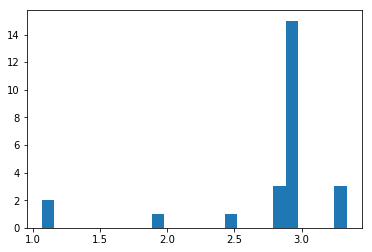

[ 2.7539382]
0.520455121994
Training epoch 193500
Iter: 193500
D loss: 3.836e-05
G_loss: -0.01367
()


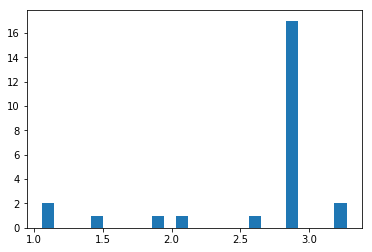

[ 2.64431964]
0.520539045334
Training epoch 193600
Iter: 193600
D loss: 2.778e-05
G_loss: -0.01366
()


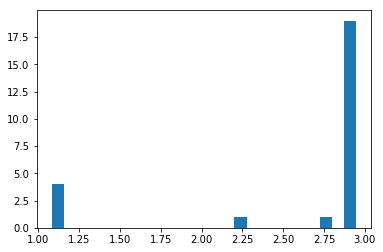

[ 2.6078952]
0.519161939621
Training epoch 193700
Iter: 193700
D loss: 3.786e-05
G_loss: -0.01404
()


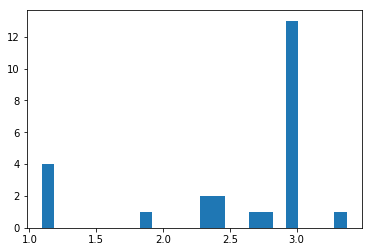

[ 2.5216816]
0.527544021606
Training epoch 193800
Iter: 193800
D loss: 4.368e-05
G_loss: -0.01299
()


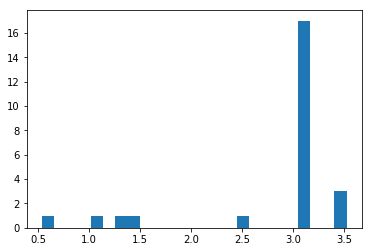

[ 2.80215497]
0.51788020134
Training epoch 193900
Iter: 193900
D loss: 3.836e-05
G_loss: -0.01379
()


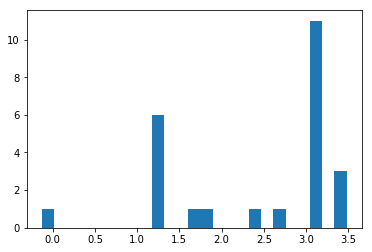

[ 2.39054783]
0.512839078903
Training epoch 194000
Iter: 194000
D loss: 4.427e-05
G_loss: -0.0127
()


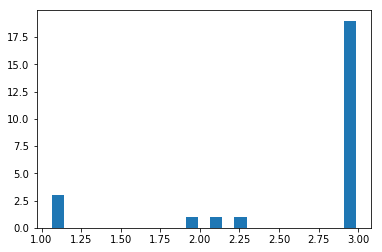

[ 2.65437046]
0.513165950775
Training epoch 194100
Iter: 194100
D loss: 4.248e-05
G_loss: -0.01378
()


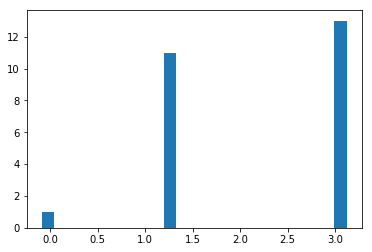

[ 2.1557951]
0.528118133545
Training epoch 194200
Iter: 194200
D loss: 3.207e-05
G_loss: -0.01361
()


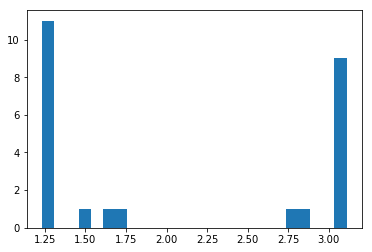

[ 2.0829485]
0.512276887894
Training epoch 194300
Iter: 194300
D loss: 3.389e-05
G_loss: -0.01439
()


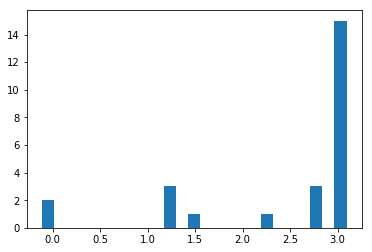

[ 2.46696234]
0.511418819427
Training epoch 194400
Iter: 194400
D loss: 3.611e-05
G_loss: -0.01423
()


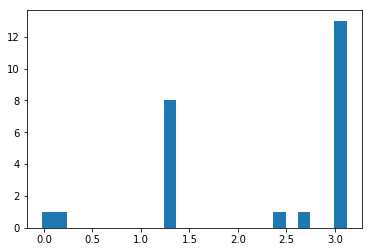

[ 2.23134087]
0.517298936844
Training epoch 194500
Iter: 194500
D loss: 4.191e-05
G_loss: -0.01331
()


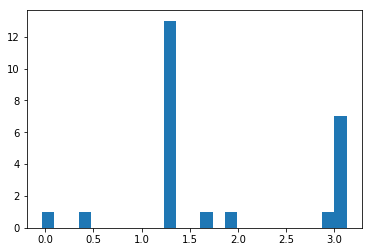

[ 1.79179398]
0.524390935898
Training epoch 194600
Iter: 194600
D loss: 3.345e-05
G_loss: -0.0137
()


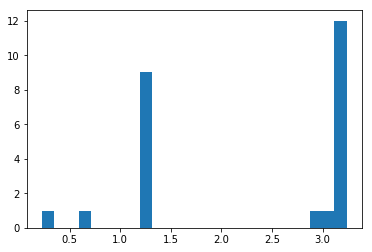

[ 2.22579856]
0.514651060104
Training epoch 194700
Iter: 194700
D loss: 4.147e-05
G_loss: -0.01415
()


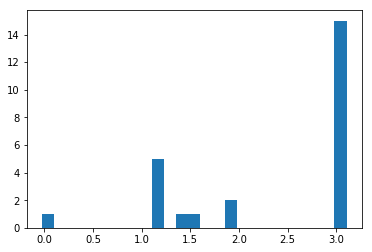

[ 2.36686787]
0.515912055969
Training epoch 194800
Iter: 194800
D loss: 4.669e-05
G_loss: -0.01268
()


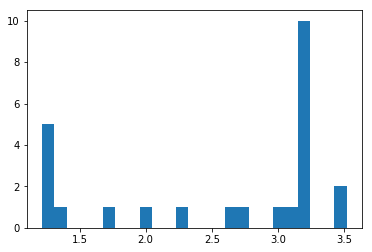

[ 2.54750049]
0.513962030411
Training epoch 194900
Iter: 194900
D loss: 4.227e-05
G_loss: -0.01431
()


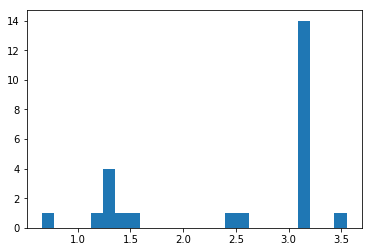

[ 2.52201082]
0.513098955154
Training epoch 195000
Iter: 195000
D loss: 3.262e-05
G_loss: -0.01251
()


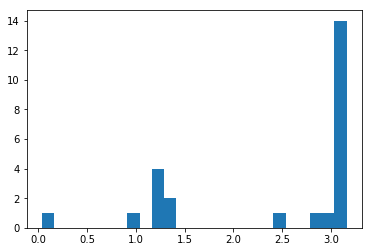

[ 2.4461864]
0.512078046799
Training epoch 195100
Iter: 195100
D loss: 4.175e-05
G_loss: -0.01322
()


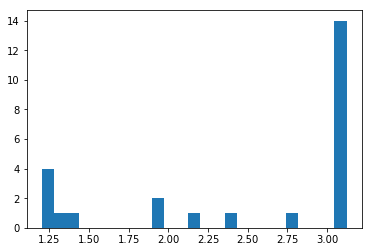

[ 2.49651476]
0.517364025116
Training epoch 195200
Iter: 195200
D loss: 3.055e-05
G_loss: -0.01427
()


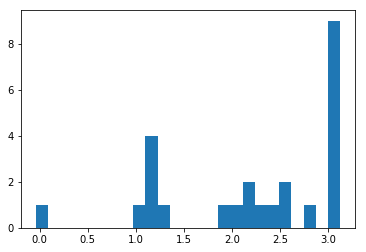

[ 2.22818117]
0.517021894455
Training epoch 195300
Iter: 195300
D loss: 3.977e-05
G_loss: -0.01501
()


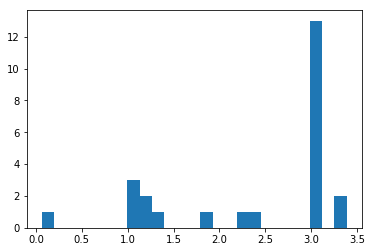

[ 2.39383774]
0.524224996567
Training epoch 195400
Iter: 195400
D loss: 3.957e-05
G_loss: -0.01403
()


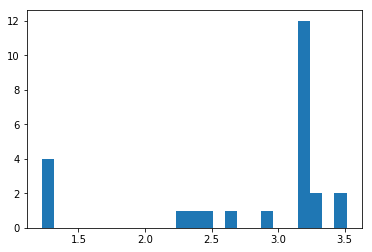

[ 2.77314436]
0.518928050995
Training epoch 195500
Iter: 195500
D loss: 3.609e-05
G_loss: -0.01446
()


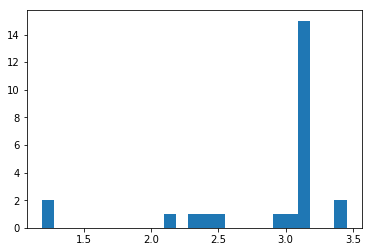

[ 2.85068262]
0.513382911682
Training epoch 195600
Iter: 195600
D loss: 3.211e-05
G_loss: -0.01494
()


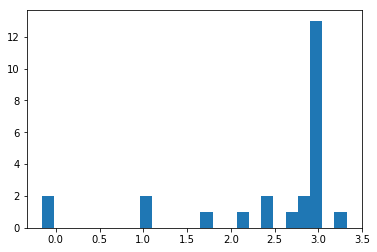

[ 2.44466379]
0.512224912643
Training epoch 195700
Iter: 195700
D loss: 4.292e-05
G_loss: -0.01369
()


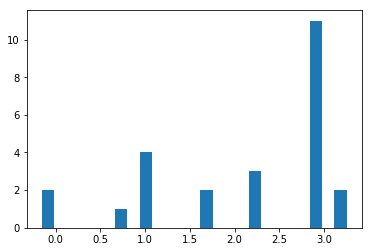

[ 2.12619016]
0.514112949371
Training epoch 195800
Iter: 195800
D loss: 5.379e-05
G_loss: -0.01396
()


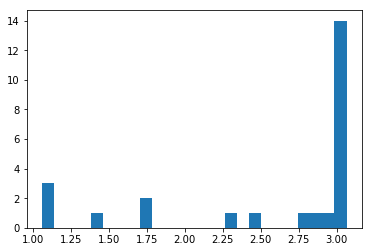

[ 2.55715853]
0.531733036041
Training epoch 195900
Iter: 195900
D loss: 4.44e-05
G_loss: -0.01438
()


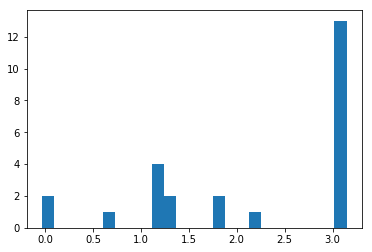

[ 2.17249911]
0.524104118347
Training epoch 196000
Iter: 196000
D loss: 3.986e-05
G_loss: -0.01272
()


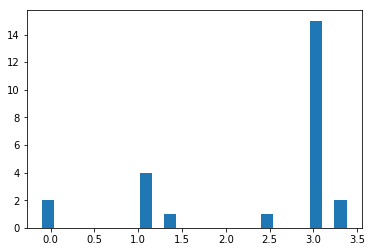

[ 2.4206933]
0.523273944855
Training epoch 196100
Iter: 196100
D loss: 3.986e-05
G_loss: -0.0153
()


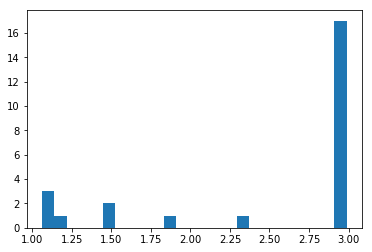

[ 2.49220199]
0.514002084732
Training epoch 196200
Iter: 196200
D loss: 3.849e-05
G_loss: -0.01368
()


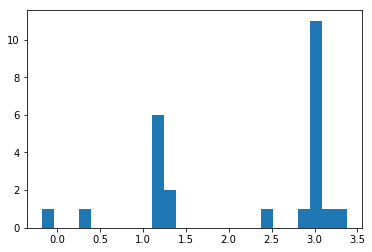

[ 2.19764115]
0.519071102142
Training epoch 196300
Iter: 196300
D loss: 3.848e-05
G_loss: -0.01305
()


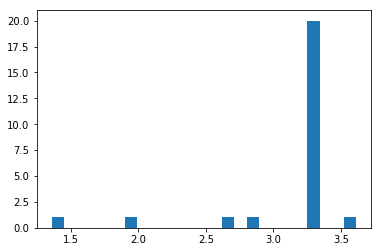

[ 3.13128893]
0.518669843674
Training epoch 196400
Iter: 196400
D loss: 4.123e-05
G_loss: -0.01133
()


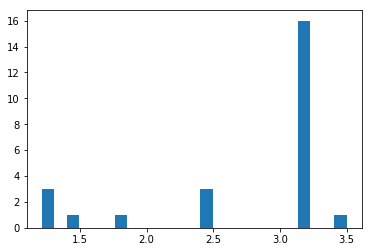

[ 2.7417439]
0.517368078232
Training epoch 196500
Iter: 196500
D loss: 4.49e-05
G_loss: -0.01274
()


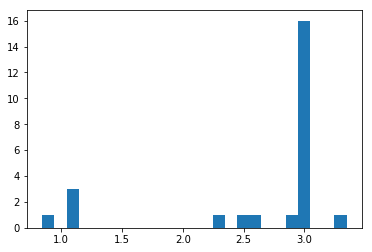

[ 2.62704512]
0.515825033188
Training epoch 196600
Iter: 196600
D loss: 3.614e-05
G_loss: -0.01184
()


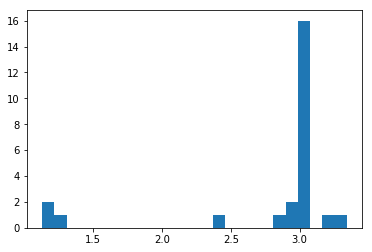

[ 2.77393919]
0.523483037949
Training epoch 196700
Iter: 196700
D loss: 4.386e-05
G_loss: -0.01371
()


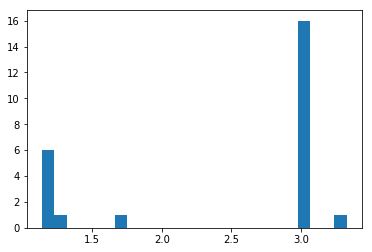

[ 2.43784157]
0.515522003174
Training epoch 196800
Iter: 196800
D loss: 4.231e-05
G_loss: -0.0135
()


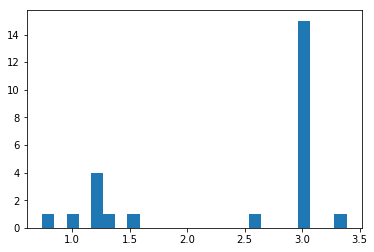

[ 2.45254329]
0.515872001648
Training epoch 196900
Iter: 196900
D loss: 3.832e-05
G_loss: -0.01329
()


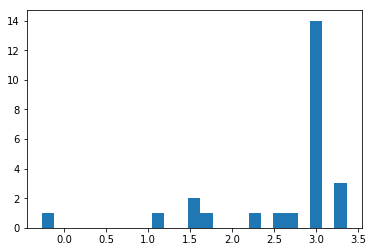

[ 2.63965208]
0.520044088364
Training epoch 197000
Iter: 197000
D loss: 4.107e-05
G_loss: -0.01377
()


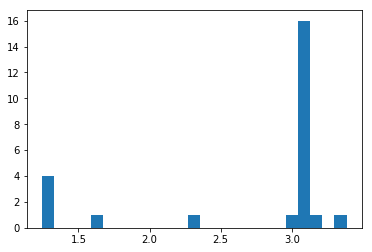

[ 2.71666809]
0.514429092407
Training epoch 197100
Iter: 197100
D loss: 4.206e-05
G_loss: -0.01286
()


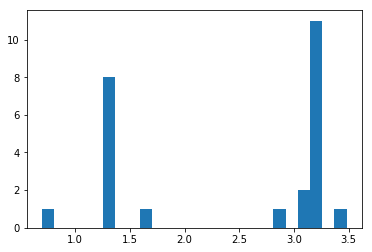

[ 2.41026716]
0.512872934341
Training epoch 197200
Iter: 197200
D loss: 3.863e-05
G_loss: -0.01397
()


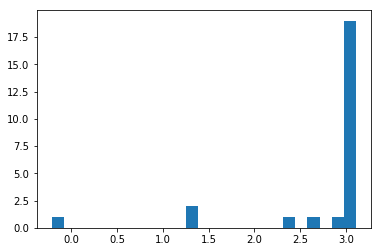

[ 2.76487068]
0.512207984924
Training epoch 197300
Iter: 197300
D loss: 4.677e-05
G_loss: -0.01269
()


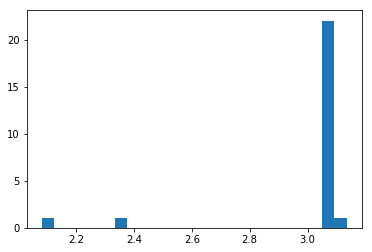

[ 3.00953675]
0.512361049652
Training epoch 197400
Iter: 197400
D loss: 4.737e-05
G_loss: -0.01206
()


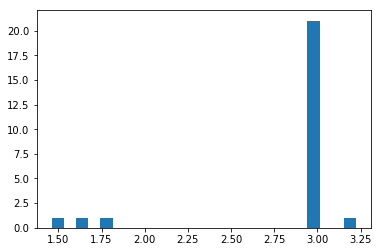

[ 2.85274512]
0.513144016266
Training epoch 197500
Iter: 197500
D loss: 4.714e-05
G_loss: -0.01261
()


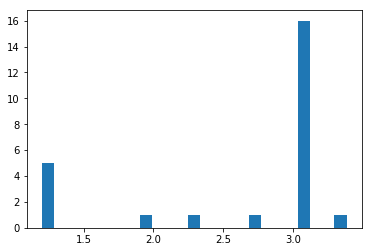

[ 2.61705571]
0.510926961899
Training epoch 197600
Iter: 197600
D loss: 4.045e-05
G_loss: -0.01353
()


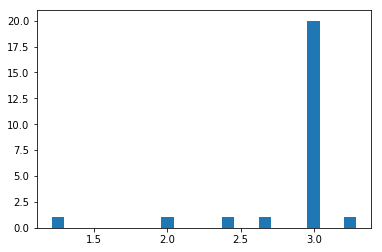

[ 2.87474506]
0.51246714592
Training epoch 197700
Iter: 197700
D loss: 4.772e-05
G_loss: -0.01294
()


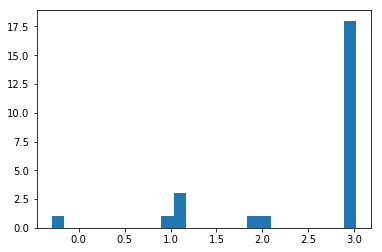

[ 2.48916568]
0.515794992447
Training epoch 197800
Iter: 197800
D loss: 4.368e-05
G_loss: -0.01342
()


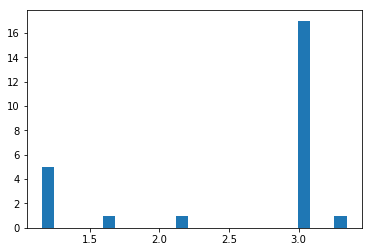

[ 2.57742137]
0.513266086578
Training epoch 197900
Iter: 197900
D loss: 4.363e-05
G_loss: -0.01339
()


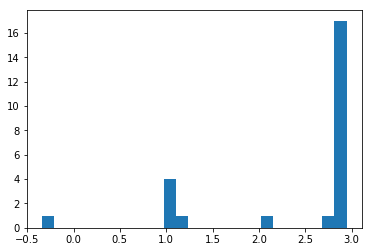

[ 2.40756861]
0.51238489151
Training epoch 198000
Iter: 198000
D loss: 4.799e-05
G_loss: -0.01209
()


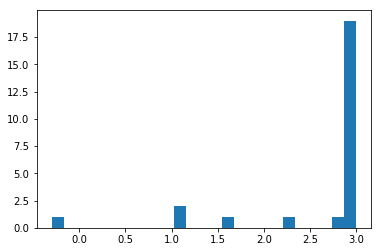

[ 2.61774822]
0.516994953156
Training epoch 198100
Iter: 198100
D loss: 3.524e-05
G_loss: -0.01348
()


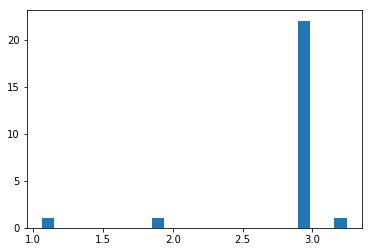

[ 2.83870414]
0.511878013611
Training epoch 198200
Iter: 198200
D loss: 5.076e-05
G_loss: -0.01274
()


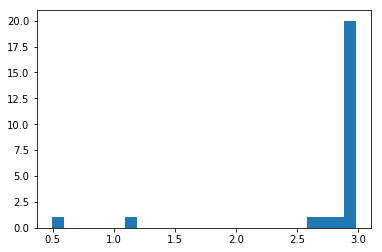

[ 2.77958893]
0.519906044006
Training epoch 198300
Iter: 198300
D loss: 5.282e-05
G_loss: -0.01338
()


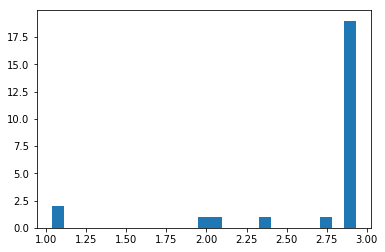

[ 2.67661697]
0.507393836975
Training epoch 198400
Iter: 198400
D loss: 4.645e-05
G_loss: -0.0101
()


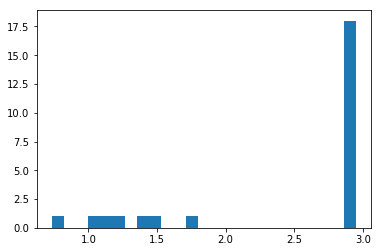

[ 2.47421475]
0.51336312294
Training epoch 198500
Iter: 198500
D loss: 4.563e-05
G_loss: -0.01219
()


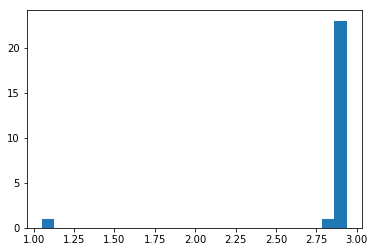

[ 2.85516727]
0.517735958099
Training epoch 198600
Iter: 198600
D loss: 3.853e-05
G_loss: -0.01352
()


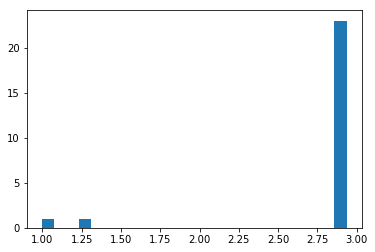

[ 2.74782089]
0.512328863144
Training epoch 198700
Iter: 198700
D loss: 3.871e-05
G_loss: -0.0133
()


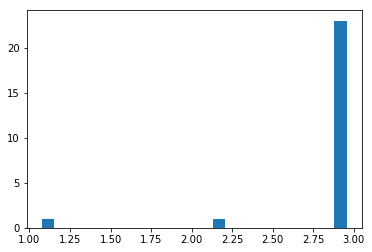

[ 2.84141269]
0.513205051422
Training epoch 198800
Iter: 198800
D loss: 4.91e-05
G_loss: -0.01304
()


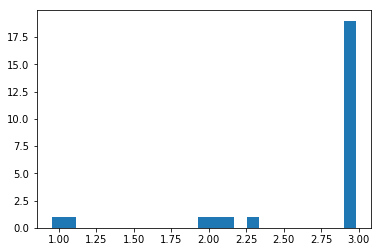

[ 2.64143019]
0.513533115387
Training epoch 198900
Iter: 198900
D loss: 3.696e-05
G_loss: -0.01368
()


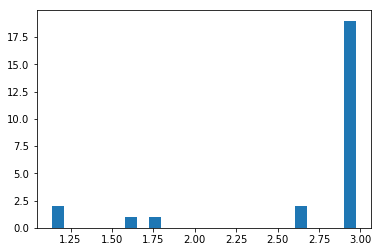

[ 2.69239419]
0.511654853821
Training epoch 199000
Iter: 199000
D loss: 4.203e-05
G_loss: -0.01256
()


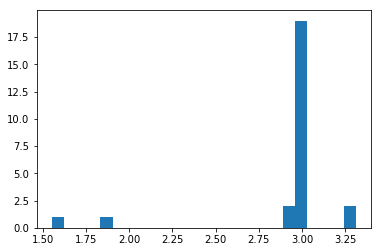

[ 2.90918916]
0.512425899506
Training epoch 199100
Iter: 199100
D loss: 4.329e-05
G_loss: -0.01319
()


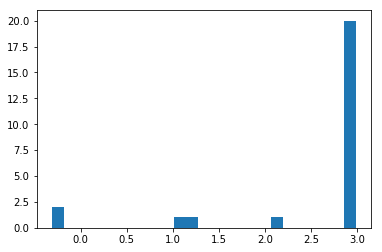

[ 2.54035591]
0.510956048965
Training epoch 199200
Iter: 199200
D loss: 4.402e-05
G_loss: -0.01278
()


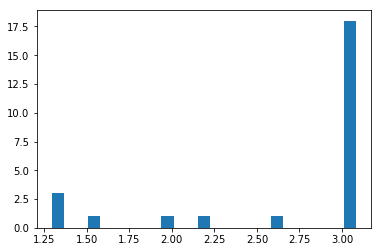

[ 2.70801586]
0.510715007782
Training epoch 199300
Iter: 199300
D loss: 4.609e-05
G_loss: -0.01262
()


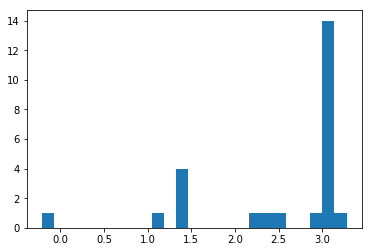

[ 2.5260547]
0.510482788086
Training epoch 199400
Iter: 199400
D loss: 3.704e-05
G_loss: -0.01359
()


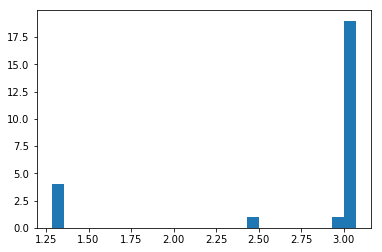

[ 2.75960486]
0.511924028397
Training epoch 199500
Iter: 199500
D loss: 4.919e-05
G_loss: -0.01206
()


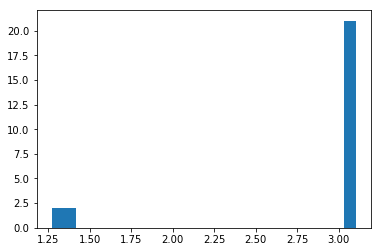

[ 2.81982066]
0.512778997421
Training epoch 199600
Iter: 199600
D loss: 3.963e-05
G_loss: -0.01358
()


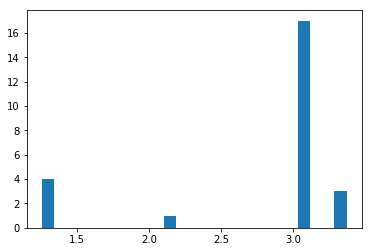

[ 2.77617959]
0.511422157288
Training epoch 199700
Iter: 199700
D loss: 4.249e-05
G_loss: -0.01318
()


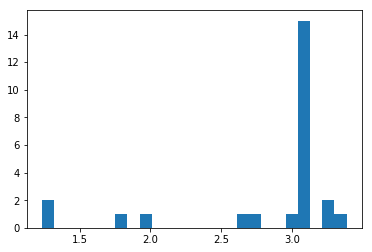

[ 2.81957529]
0.511048078537
Training epoch 199800
Iter: 199800
D loss: 4.016e-05
G_loss: -0.01323
()


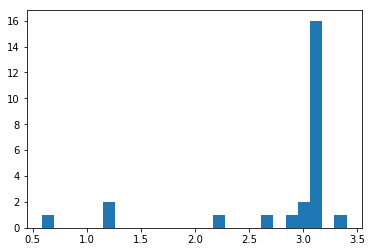

[ 2.79339601]
0.517374038696
Training epoch 199900
Iter: 199900
D loss: 4.699e-05
G_loss: -0.01307
()


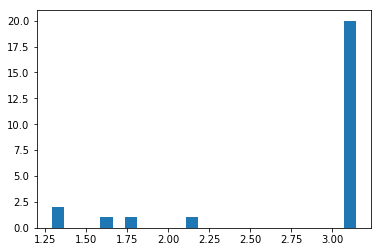

[ 2.8369884]
0.518276929855
Training epoch 200000
Iter: 200000
D loss: 4.604e-05
G_loss: -0.0123
()


[ 2.88581676]
0.51580786705
Training epoch 200100
Iter: 200100
D loss: 3.664e-05
G_loss: -0.01349
()


[ 2.72133731]
0.509693145752
Training epoch 200200
Iter: 200200
D loss: 3.695e-05
G_loss: -0.0132
()


[ 2.90765397]
0.511079072952
Training epoch 200300
Iter: 200300
D loss: 3.866e-05
G_loss: -0.01341
()


[ 2.63871542]
0.5135409832
Training epoch 200400
Iter: 200400
D loss: 4.813e-05
G_loss: -0.01315
()


[ 2.72257315]
0.51645898819
Training epoch 200500
Iter: 200500
D loss: 4.654e-05
G_loss: -0.01331
()


[ 2.87430706]
0.513703107834
Training epoch 200600
Iter: 200600
D loss: 3.95e-05
G_loss: -0.008713
()


[ 2.8353618]
0.510502099991
Training epoch 200700
Iter: 200700
D loss: 3.791e-05
G_loss: -0.01244
()


[ 2.15506936]
0.513568878174
Training epoch 200800
Iter: 200800
D loss: 3.343e-05
G_loss: -0.01368
()


[ 2.69609596]
0.511589050293
Training epoch 200900
Iter: 200900
D loss: 3.738e-05
G_loss: -0.01304
()


[ 2.42613354]
0.511430025101
Training epoch 201000
Iter: 201000
D loss: 3.996e-05
G_loss: -0.01118
()


[ 2.2405863]
0.512339115143
Training epoch 201100
Iter: 201100
D loss: 4.476e-05
G_loss: -0.01346
()


[ 2.2304363]
0.520449876785
Training epoch 201200
Iter: 201200
D loss: 5.044e-05
G_loss: -0.009805
()


[ 2.32205811]
0.519390106201
Training epoch 201300
Iter: 201300
D loss: 4.58e-05
G_loss: -0.01363
()


[ 2.03813122]
0.531314134598
Training epoch 201400
Iter: 201400
D loss: 5.019e-05
G_loss: -0.01372
()


[ 2.38478853]
0.517309904099
Training epoch 201500
Iter: 201500
D loss: 4.787e-05
G_loss: -0.01294
()


[ 2.45586685]
0.513608932495
Training epoch 201600
Iter: 201600
D loss: 4.652e-05
G_loss: -0.01246
()


[ 2.25618644]
0.516381978989
Training epoch 201700
Iter: 201700
D loss: 3.478e-05
G_loss: -0.01336
()


[ 2.55149788]
0.513011932373
Training epoch 201800
Iter: 201800
D loss: 3.709e-05
G_loss: -0.01213
()


[ 2.17584599]
0.515233039856
Training epoch 201900
Iter: 201900
D loss: 4.16e-05
G_loss: -0.01227
()


[ 2.44905835]
0.519385814667
Training epoch 202000
Iter: 202000
D loss: 4.542e-05
G_loss: -0.01361
()


[ 2.00250886]
0.51288819313
Training epoch 202100
Iter: 202100
D loss: 5.591e-05
G_loss: -0.01315
()


[ 2.05830334]
0.521239042282
Training epoch 202200
Iter: 202200
D loss: 4.636e-05
G_loss: -0.01342
()


[ 1.94036824]
0.521903038025
Training epoch 202300
Iter: 202300
D loss: 4.1e-05
G_loss: -0.0137
()


[ 1.57013834]
0.511434078217
Training epoch 202400
Iter: 202400
D loss: 3.648e-05
G_loss: -0.01337
()


[ 1.51943226]
0.516933917999
Training epoch 202500
Iter: 202500
D loss: 4.446e-05
G_loss: -0.01449
()


[ 2.00835453]
0.514214038849
Training epoch 202600
Iter: 202600
D loss: 4.852e-05
G_loss: -0.01298
()


[ 1.78571905]
0.512127876282
Training epoch 202700
Iter: 202700
D loss: 4.764e-05
G_loss: -0.0137
()


[ 1.54984634]
0.511132001877
Training epoch 202800
Iter: 202800
D loss: 4.26e-05
G_loss: -0.01332
()


[ 2.16186898]


KeyboardInterrupt: 

In [325]:
every = 100
for it in range(1000000):
    random.shuffle(train_dataset)
    a = time.time()
    batch_sched = list(range(0, n_train+1,S))
    for j in range(0, len(batch_sched)-1):
        start = batch_sched[j]
        stop = batch_sched[j+1]
        feed_dict = construct_feed_dict(train_dataset, start, stop)

        for _ in range(5):
            feed_dict = construct_feed_dict(train_dataset, start, stop)

            _, D_loss_curr, _ = sess.run(
                [D_solver, D_loss, clip_D], feed_dict=feed_dict)
        
        feed_dict = construct_feed_dict(train_dataset, start, stop)

        _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict=feed_dict)
        
        d_losses.append(D_loss_curr)
        g_losses.append(G_loss_curr)
    if it % every == 0:
        print(time.time()-a)
        print("Training epoch %d" %it)


        
    if it % every == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()

        #print("output_i")
        #print(sess.run(G_sample_output_i, feed_dict=feed_dict))
        #print(sess.run(G_sample, feed_dict=feed_dict))

    if it % every == 0:
        samples = np.zeros((25,dihed_per_bond))

        for i in range(0, 25):
            feed_dict = construct_feed_dict(features[:1]*32, 0, S, shuffle_inds=False, train=False)

            samples[i] = sess.run(G_sample, feed_dict=feed_dict)[0]
        plt.hist(samples[:,0], bins=25)
        plt.show()
        #plt.hist(samples[:,1], bins=25)
        #plt.show()
        #plt.hist(samples[:,2], bins=25)
        #plt.show()
        print(np.mean(samples, axis=0))
        #print(samples[:10])
        #plt.hist(samples, bins=50)
        #plt.show()

In [ ]:
## from rdkit.Chem import AllChem
from rdkit.Chem import Draw

m2 = Chem.MolFromMol2File("/home/evan/Documents/deep_docking/datasets/v2015/1w0x/1w0x_ligand.mol2")
Draw.MolToImage(m2)

In [615]:
m1 = Chem.MolFromMol2File(features[0][0])
Draw.MolToImage(m1)

In [ ]:
if random.choice([True, False]):
    print("hi")

In [203]:
import subprocess
subprocess.call("pip install tflearn", shell=True)

0

In [204]:
import tflearn

In [928]:
train_dataset[0][1][1]

array([[ 1.56154529],
       [ 2.9399692 ],
       [-1.09178652],
       [ 0.94080315],
       [-0.91292151],
       [ 3.09695411],
       [ 1.06725919],
       [-0.95119245],
       [ 2.18664426],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0

In [292]:
samples = []#np.zeros((100,dihed_per_bond))
feed_dict = construct_feed_dict(features[:1]*S, 0 , S, shuffle_inds=False)

print(sess.run(label_placeholder, feed_dict=feed_dict)[0])
for i in range(0, 100):
    feed_dict = construct_feed_dict(features[:1]*S, 0 , S, shuffle_inds=False)
    #samples[i] = sess.run(G_sample, feed_dict=feed_dict)[0]
    samples.append(sess.run(G_sample, feed_dict=feed_dict)[0])
samples=np.concatenate(samples)
#samples = sess.run(G_sample)
plt.hist(samples, bins=100)
plt.show()
#plt.hist(samples[:,1], bins=25)
#plt.show()
#plt.hist(samples[:,2], bins=25)
#plt.show()
print(np.mean(samples, axis=0))
print(np.std(samples, axis=0))
#print(samples[:10])
#plt.hist(samples, bins=50)
#plt.show()

[-0.94321936]


0.656948
1.79434


In [25]:
features[0][1][1]

array([[-0.95119245],
       [ 2.18664426],
       [ 2.9399692 ],
       [-1.09178652],
       [ 0.94080315],
       [-0.91292151],
       [ 3.09695411],
       [ 1.06725919],
       [ 1.56154529],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0

In [22]:
feed_dict = construct_feed_dict(train_dataset, 0, S, shuffle_inds=False)

sess.run(label_placeholder, feed_dict=feed_dict)[:10]

array([[-0.92258447],
       [ 2.18372178],
       [ 2.95283723],
       [-1.15059674],
       [ 0.86878622],
       [-0.9465903 ],
       [ 3.10963345],
       [ 1.08844507],
       [ 1.58422661],
       [-0.02545764]], dtype=float32)

In [23]:
plt.hist(np.concatenate(samples)[np.where(np.concatenate(samples) != 0.)], bins=50)

(array([ 8.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,  0.,  0.,  0.,
         0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  9.]),
 array([-0.96343136, -0.8732397 , -0.78304805, -0.69285639, -0.60266474,
        -0.51247308, -0.42228143, -0.33208977, -0.24189812, -0.15170646,
        -0.06151481,  0.02867685,  0.1188685 ,  0.20906016,  0.29925181,
         0.38944347,  0.47963512,  0.56982678,  0.66001843,  0.75021009,
         0.84040174,  0.9305934 ,  1.02078506,  1.11097671,  1.20116837,
         1.29136002,  1.38155168,  1.47174333,  1.56193499,  1.65212664,
         1.7423183 ,  1.83250995,  1.92270161,  2.01289326,  2.10308492,
         2.19327657,  2.28346823,  2.37365988,  2.46385154,  2.55404319,
         2.64423485,  2.7344265 ,  2.82461816,  2.91480981,  3.00500147,
         3.09519312,  3.18538478,  3.27557643,  3.36576809,

In [976]:
np.concatenate(samples)[:10]

array([-0.64838129, -0.64838129, -0.64838129, -0.64836389, -0.64838129,
       -0.64838129, -0.64838129, -0.64838129,  2.829319  , -1.77249539])

In [324]:
samples = np.zeros((100,dihed_per_bond))
feed_dict = construct_feed_dict(features, len(features)-S,len(features),shuffle_inds=False)

print(sess.run(label_placeholder, feed_dict=feed_dict)[0])
samples = []
for i in range(0, 100):
    feed_dict = construct_feed_dict(features, len(features)-S,len(features),shuffle_inds=False)
    samples.append(sess.run(G_sample, feed_dict=feed_dict)[0])
samples = np.concatenate(samples)
#samples = sess.run(G_sample)
plt.hist(samples, bins=100)
plt.show()
#plt.hist(samples[:,1], bins=25)
#plt.show()
#plt.hist(samples[:,2], bins=25)
#plt.show()
print(np.mean(samples, axis=0))
print(np.std(samples, 
             axis=0))
#print(samples[:10])
#plt.hist(samples, bins=50)
#plt.show()

[ 0.10859542]


0.548745
1.64112


In [146]:
feed_dict = construct_feed_dict(features, len(features)-S,len(features),shuffle_inds=False)

print(sess.run(G_sample, feed_dict=feed_dict)[:10])

[[  1.42076552e+00]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]
 [  1.05314329e-03]]


In [698]:
features[-1]

('CCCC', (array([[[1, 0, 0, 0],
          [0, 1, 0, 0],
          [0, 0, 1, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         ..., 
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0]],
  
         [[0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          ..., 
          [0, 0, 0, 0],
          [0, 0, 0, 0],
          [0, 0, 0, 0

In [245]:
plt.hist(sess.run(label_placeholder, feed_dict=feed_dict),bins=50)

(array([ 59.,  59.,  22.,  20.,   9.,   7.,   8.,   8.,  17.,  15.,   6.,
         12.,   6.,  16.,  45.,  33.,  54.,  28.,  31.,  23.,  10.,  18.,
         28.,   5.,  26.,  24.,  25.,   4.,   7.,  10.,   5.,   8.,   7.,
         21.,  12.,   7.,  10.,  15.,   8.,   0.,   1.,  24.,   7.,  14.,
         17.,   9.,  24.,  41.,  66.,  85.]),
 array([-3.20796037, -3.07995634, -2.95195231, -2.82394829, -2.69594426,
        -2.56794024, -2.43993621, -2.31193218, -2.18392816, -2.05592413,
        -1.9279201 , -1.79991608, -1.67191205, -1.54390802, -1.415904  ,
        -1.28789997, -1.15989594, -1.03189192, -0.90388789, -0.77588387,
        -0.64787984, -0.51987581, -0.39187179, -0.26386776, -0.13586373,
        -0.00785971,  0.12014432,  0.24814835,  0.37615237,  0.5041564 ,
         0.63216043,  0.76016445,  0.88816848,  1.0161725 ,  1.14417653,
         1.27218056,  1.40018458,  1.52818861,  1.65619264,  1.78419666,
         1.91220069,  2.04020472,  2.16820874,  2.29621277,  2.42421679,
 

In [343]:
plt.hist(sess.run(G_sample,feed_dict=feed_dict), bins=50)

(array([   1.,    0.,    1.,    1.,    4.,    9.,   54.,   35.,   20.,
          33.,   21.,   14.,   31.,   29.,   37.,   72.,   55.,   53.,
          41.,  102.,   56.,   34.,  154.,   70.,   27.,   30.,   35.,
          32.,   54.,   31.,   61.,   56.,   24.,   19.,   37.,   51.,
          73.,   65.,   21.,   14.,   17.,   13.,    6.,    3.,    1.,
           0.,    1.,    0.,    0.,    2.]),
 array([-4.79356241, -4.58645444, -4.37934647, -4.17223849, -3.96513052,
        -3.75802255, -3.55091457, -3.3438066 , -3.13669863, -2.92959065,
        -2.72248268, -2.51537471, -2.30826674, -2.10115876, -1.89405079,
        -1.68694282, -1.47983484, -1.27272687, -1.0656189 , -0.85851092,
        -0.65140295, -0.44429498, -0.237187  , -0.03007903,  0.17702894,
         0.38413692,  0.59124489,  0.79835286,  1.00546083,  1.21256881,
         1.41967678,  1.62678475,  1.83389273,  2.0410007 ,  2.24810867,
         2.45521665,  2.66232462,  2.86943259,  3.07654057,  3.28364854,
         3.49075

In [ ]:
for it in range(1000000):
    a = time.time()
    if it % 250 == 0:
        print("Training epoch %d" %it)
    batch_sched = list(range(0, n_train+1,S))
    for j in range(0, len(batch_sched)-1):
        start = batch_sched[j]
        stop = batch_sched[j+1]
        #feed_dict = construct_feed_dict(train_dataset, start, stop)

        _, D_loss_curr = sess.run([D_solver, D_loss])
        
        for _ in range(5):
            #feed_dict = construct_feed_dict(train_dataset, start, stop)

            _, D_loss_curr, _ = sess.run(
                [D_solver, D_loss, clip_D])
            
        
        _, G_loss_curr = sess.run([G_solver, G_loss])
        
        d_losses.append(D_loss_curr)
        g_losses.append(G_loss_curr)
    if it % 250 == 0:
        print(time.time()-a)

        
    if it % 250 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()

        #print("output_i")
        #print(sess.run(G_sample_output_i, feed_dict=feed_dict))
        #print(sess.run(G_sample, feed_dict=feed_dict))

    if it % 250 == 0:
        samples = np.zeros((25,1))
        for i in range(0, 25):
            samples[i] = sess.run(G_sample)[0]
        plt.hist(samples[:,0], bins=25)
        plt.show()
        #plt.hist(samples[:,1], bins=10)
        #plt.show()
        #plt.hist(samples[:,2], bins=10)
        #plt.show()
        print(np.mean(samples, axis=0))
        #print(samples[:10])
        #plt.hist(samples, bins=50)
        #plt.show()

In [ ]:
sess.run(G_sample)[20]
 

In [ ]:
sess.run(label_placeholder)[20]

In [ ]:
X[0][1][1].toarray()

In [ ]:
feed_dict = construct_feed_dict(train_dataset, start, stop, False)
inds = range(0,128*4,4)
samples = sess.run(G_sample, feed_dict=feed_dict)
samples = samples[inds]
plt.hist(samples[:,0], bins=10)
plt.show()
plt.hist(samples[:,1], bins=10)
plt.show()
plt.hist(samples[:,2], bins=10)
plt.show()
plt.hist(samples[:,3], bins=10)
plt.show()
print(np.mean(samples, axis=0))
#print(samples[:10])
#plt.hist(samples, bins=50)
#plt.show()

In [ ]:
samples

In [ ]:
  [ 0.61143659, -0.99900387,  0.48252666,  0.61143659,  0.      

In [ ]:
np.where(feed_dict[dihed_indices][0] != 0)

In [ ]:
feed_dict[label_placeholder]

In [ ]:
feed_dict[non_zero_inds]

In [ ]:
features[0][1][1].toarray()

In [ ]:
sess.run(G_sample, feed_dict=feed_dict)

In [ ]:
array([[ 0.91292151],
       [ 3.09695411],
       [ 1.06725919],

In [ ]:
plt.hist(sess.run(G_sample, feed_dict=feed_dict))

In [ ]:
batch_sched

In [ ]:
for it in range(20001):
    if it % 100 == 0:
        print("Training epoch %d" %it)
    batch_sched = list(range(0, n_train+1,S))
    for j in range(0, len(batch_sched)-1):
        start = batch_sched[j]
        stop = batch_sched[j+1]
        feed_dict = construct_feed_dict(train_dataset, start, stop)

        _, D_loss_curr = sess.run([D_solver, D_loss], feed_dict=feed_dict)
        _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict=feed_dict)

    if it % 1000 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print()

    if it % 1000 == 0:
        samples = sess.run(G_sample, feed_dict=feed_dict)
        plt.hist(samples, bins=50)
        plt.show()


In [ ]:
preds = []
for k in range(0,100):
    feed_dict = construct_feed_dict(train_dataset, 0, 1)
    samples = sess.run(G_sample, feed_dict=feed_dict)[2]
    preds.append(samples)

In [ ]:
plt.hist(np.concatenate(preds))

In [ ]:
preds[4]

In [ ]:
train_dataset[0][1][1].toarray()

In [ ]:
res = gan.predict()

In [ ]:
res

In [ ]:
plt.hist(res, bins=50)
plt.show()

In [ ]:
features[0][1][1].toarray()

In [ ]:
features[0][1][1].toarray()

In [ ]:
preds = []
for i in range(0,100):
    preds.append(gan.predict(features)[0][2])

In [ ]:
np.mean(preds)

In [ ]:
features[0][2].atom_features